## Bidirectional LSTM model na predikciu hodnot DST o 3 hodiny dopredu na zaklade 12-hodinoveho vstupneho okna z atributu DST

Subor: prediction_DST+3_12H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-26 00:26:51.108962: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 3
y_col = f"DST+{shift}"

n_input = 12
atr_count = 1

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])


valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train['DST'].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid['DST'].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test['DST'].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  12


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 12, 1)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 12, 256)             │         133,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 12, 128)             │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 12, 1)               │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 12)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              13 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 330,382 (1.26 MB)

 Trainable params: 330,382 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:13:16 5s/step - loss: 0.2820 - mae: 0.4040

  2/896 ━━━━━━━━━━━━━━━━━━━━ 51s 58ms/step - loss: 0.5134 - mae: 0.4656  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 49s 55ms/step - loss: 0.5341 - mae: 0.4661

  4/896 ━━━━━━━━━━━━━━━━━━━━ 49s 55ms/step - loss: 0.5342 - mae: 0.4656

  5/896 ━━━━━━━━━━━━━━━━━━━━ 49s 55ms/step - loss: 0.5404 - mae: 0.4706

  6/896 ━━━━━━━━━━━━━━━━━━━━ 49s 55ms/step - loss: 0.5380 - mae: 0.4726

  7/896 ━━━━━━━━━━━━━━━━━━━━ 48s 55ms/step - loss: 0.5289 - mae: 0.4706

  8/896 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step - loss: 0.5254 - mae: 0.4708

  9/896 ━━━━━━━━━━━━━━━━━━━━ 52s 59ms/step - loss: 0.5194 - mae: 0.4694

 10/896 ━━━━━━━━━━━━━━━━━━━━ 54s 61ms/step - loss: 0.5137 - mae: 0.4687

 11/896 ━━━━━━━━━━━━━━━━━━━━ 55s 63ms/step - loss: 0.5066 - mae: 0.4673

 12/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.5019 - mae: 0.4671

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.4983 - mae: 0.4672

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.4946 - mae: 0.4671

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.4940 - mae: 0.4673

 16/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.4919 - mae: 0.4666

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.4891 - mae: 0.4654

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.4860 - mae: 0.4641

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.4824 - mae: 0.4625

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.4784 - mae: 0.4605

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.4746 - mae: 0.4588

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step - loss: 0.4713 - mae: 0.4571

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.4676 - mae: 0.4552

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.4639 - mae: 0.4533

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.4602 - mae: 0.4515

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.4565 - mae: 0.4496

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.4528 - mae: 0.4476

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 70ms/step - loss: 0.4490 - mae: 0.4456

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4454 - mae: 0.4438

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4418 - mae: 0.4419

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4399 - mae: 0.4406

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4383 - mae: 0.4394

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4368 - mae: 0.4384

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4350 - mae: 0.4372

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4336 - mae: 0.4360

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.4322 - mae: 0.4350

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.4307 - mae: 0.4339

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.4292 - mae: 0.4328

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.4289 - mae: 0.4321

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.4285 - mae: 0.4315

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.4280 - mae: 0.4307

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.4274 - mae: 0.4300

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.4268 - mae: 0.4292

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.4261 - mae: 0.4285

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.4253 - mae: 0.4277

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.4245 - mae: 0.4270

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.4239 - mae: 0.4264

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.4235 - mae: 0.4259

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.4233 - mae: 0.4255

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.4231 - mae: 0.4250

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.4227 - mae: 0.4245

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.4223 - mae: 0.4241

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.4219 - mae: 0.4236

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step - loss: 0.4214 - mae: 0.4231

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.4208 - mae: 0.4227

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.4204 - mae: 0.4223

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.4199 - mae: 0.4219

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.4193 - mae: 0.4215

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.4187 - mae: 0.4211

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 72ms/step - loss: 0.4180 - mae: 0.4206

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.4173 - mae: 0.4202

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.4167 - mae: 0.4198

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.4161 - mae: 0.4194

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.4156 - mae: 0.4191

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.4150 - mae: 0.4187

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.4144 - mae: 0.4184

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.4137 - mae: 0.4180

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.4132 - mae: 0.4177

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.4126 - mae: 0.4173

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.4121 - mae: 0.4170

 71/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.4116 - mae: 0.4167 

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.4110 - mae: 0.4164

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 73ms/step - loss: 0.4105 - mae: 0.4160

 74/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.4100 - mae: 0.4157 

 75/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.4095 - mae: 0.4154

 76/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.4090 - mae: 0.4151

 77/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.4085 - mae: 0.4148

 78/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.4080 - mae: 0.4145

 79/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.4075 - mae: 0.4142

 80/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.4069 - mae: 0.4139

 81/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.4064 - mae: 0.4136

 82/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.4060 - mae: 0.4134

 83/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.4056 - mae: 0.4131

 84/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.4053 - mae: 0.4129

 85/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.4049 - mae: 0.4126

 86/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.4046 - mae: 0.4124

 87/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.4042 - mae: 0.4122

 88/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.4039 - mae: 0.4119

 89/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.4035 - mae: 0.4117

 90/896 ━━━━━━━━━━━━━━━━━━━━ 59s 73ms/step - loss: 0.4031 - mae: 0.4114

 91/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.4026 - mae: 0.4111

 92/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.4022 - mae: 0.4109

 93/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.4018 - mae: 0.4106

 94/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.4013 - mae: 0.4103

 95/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.4008 - mae: 0.4100

 96/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.4004 - mae: 0.4098

 97/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.3999 - mae: 0.4095

 98/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.3994 - mae: 0.4092

 99/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.3989 - mae: 0.4089

100/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.3984 - mae: 0.4086

101/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.3979 - mae: 0.4083

102/896 ━━━━━━━━━━━━━━━━━━━━ 58s 73ms/step - loss: 0.3974 - mae: 0.4081

103/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.3969 - mae: 0.4078

104/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.3964 - mae: 0.4075

105/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.3959 - mae: 0.4073

106/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.3955 - mae: 0.4070

107/896 ━━━━━━━━━━━━━━━━━━━━ 58s 74ms/step - loss: 0.3950 - mae: 0.4068

108/896 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.3946 - mae: 0.4066

109/896 ━━━━━━━━━━━━━━━━━━━━ 57s 74ms/step - loss: 0.3943 - mae: 0.4064

110/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.3939 - mae: 0.4061

111/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.3936 - mae: 0.4059

112/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.3932 - mae: 0.4057

113/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.3928 - mae: 0.4055

114/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.3925 - mae: 0.4053

115/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.3922 - mae: 0.4051

116/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.3919 - mae: 0.4049

117/896 ━━━━━━━━━━━━━━━━━━━━ 57s 73ms/step - loss: 0.3915 - mae: 0.4047

118/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.3912 - mae: 0.4045

119/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.3909 - mae: 0.4043

120/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.3905 - mae: 0.4041

121/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.3902 - mae: 0.4039

122/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.3898 - mae: 0.4037

123/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.3895 - mae: 0.4035

124/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.3892 - mae: 0.4034

125/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.3889 - mae: 0.4032

126/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.3887 - mae: 0.4030

127/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.3884 - mae: 0.4029

128/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.3882 - mae: 0.4027

129/896 ━━━━━━━━━━━━━━━━━━━━ 56s 73ms/step - loss: 0.3879 - mae: 0.4026

130/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.3877 - mae: 0.4024

131/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.3874 - mae: 0.4022

132/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.3871 - mae: 0.4021

133/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.3868 - mae: 0.4019

134/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.3865 - mae: 0.4017

135/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.3863 - mae: 0.4016

136/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.3860 - mae: 0.4014

137/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.3857 - mae: 0.4013

138/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.3854 - mae: 0.4011

139/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.3851 - mae: 0.4010

140/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.3849 - mae: 0.4008

141/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.3846 - mae: 0.4007

142/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.3843 - mae: 0.4005

143/896 ━━━━━━━━━━━━━━━━━━━━ 55s 73ms/step - loss: 0.3840 - mae: 0.4004

144/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.3837 - mae: 0.4002

145/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.3834 - mae: 0.4001

146/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.3831 - mae: 0.3999

147/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.3828 - mae: 0.3998

148/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.3825 - mae: 0.3996

149/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.3822 - mae: 0.3995

150/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.3819 - mae: 0.3993

151/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.3815 - mae: 0.3991

152/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.3812 - mae: 0.3990

153/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.3809 - mae: 0.3988

154/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.3806 - mae: 0.3987

155/896 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step - loss: 0.3803 - mae: 0.3985

156/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.3800 - mae: 0.3984

157/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.3797 - mae: 0.3982

158/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.3794 - mae: 0.3981

159/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.3791 - mae: 0.3979

160/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.3787 - mae: 0.3978

161/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.3784 - mae: 0.3976

162/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.3781 - mae: 0.3975

163/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.3778 - mae: 0.3973

164/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.3775 - mae: 0.3972

165/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.3771 - mae: 0.3970

166/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.3768 - mae: 0.3969

167/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.3765 - mae: 0.3967

168/896 ━━━━━━━━━━━━━━━━━━━━ 53s 73ms/step - loss: 0.3762 - mae: 0.3966

169/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.3759 - mae: 0.3964

170/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.3755 - mae: 0.3963

171/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.3752 - mae: 0.3961

172/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.3749 - mae: 0.3960

173/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.3746 - mae: 0.3959

174/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.3744 - mae: 0.3957

175/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.3741 - mae: 0.3956

176/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.3738 - mae: 0.3955

177/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.3735 - mae: 0.3953

178/896 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step - loss: 0.3733 - mae: 0.3952

179/896 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step - loss: 0.3730 - mae: 0.3951

180/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.3727 - mae: 0.3950

181/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.3725 - mae: 0.3949

182/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.3722 - mae: 0.3947

183/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.3719 - mae: 0.3946

184/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.3717 - mae: 0.3945

185/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.3714 - mae: 0.3944

186/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.3711 - mae: 0.3942

187/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.3709 - mae: 0.3941

188/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.3706 - mae: 0.3940

189/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.3704 - mae: 0.3939

190/896 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step - loss: 0.3701 - mae: 0.3938

191/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.3698 - mae: 0.3936

192/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.3696 - mae: 0.3935

193/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.3693 - mae: 0.3934

194/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.3690 - mae: 0.3933

195/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.3687 - mae: 0.3931

196/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.3685 - mae: 0.3930

197/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.3682 - mae: 0.3929

198/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.3680 - mae: 0.3928

199/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.3677 - mae: 0.3927

200/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.3675 - mae: 0.3926

201/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.3672 - mae: 0.3925

202/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.3670 - mae: 0.3923

203/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.3667 - mae: 0.3922

204/896 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step - loss: 0.3665 - mae: 0.3921

205/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.3662 - mae: 0.3920

206/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.3660 - mae: 0.3919

207/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.3658 - mae: 0.3918

208/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.3655 - mae: 0.3917

209/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.3653 - mae: 0.3916

210/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.3650 - mae: 0.3915

211/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.3648 - mae: 0.3914

212/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.3646 - mae: 0.3913

213/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.3643 - mae: 0.3912

214/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.3641 - mae: 0.3911

215/896 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step - loss: 0.3639 - mae: 0.3909

216/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.3636 - mae: 0.3908

217/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.3634 - mae: 0.3907

218/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.3632 - mae: 0.3906

219/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.3629 - mae: 0.3905

220/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.3627 - mae: 0.3904

221/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.3625 - mae: 0.3903

222/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.3622 - mae: 0.3902

223/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.3620 - mae: 0.3901

224/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.3618 - mae: 0.3900

225/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.3615 - mae: 0.3899

226/896 ━━━━━━━━━━━━━━━━━━━━ 48s 72ms/step - loss: 0.3613 - mae: 0.3898

227/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.3611 - mae: 0.3897

228/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.3608 - mae: 0.3896

229/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.3606 - mae: 0.3895

230/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.3604 - mae: 0.3894

231/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.3601 - mae: 0.3893

232/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.3599 - mae: 0.3892

233/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.3597 - mae: 0.3891

234/896 ━━━━━━━━━━━━━━━━━━━━ 47s 72ms/step - loss: 0.3594 - mae: 0.3890

235/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.3592 - mae: 0.3889

236/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.3590 - mae: 0.3888

237/896 ━━━━━━━━━━━━━━━━━━━━ 47s 71ms/step - loss: 0.3588 - mae: 0.3887

238/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.3585 - mae: 0.3885

239/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.3583 - mae: 0.3884

240/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.3581 - mae: 0.3883

241/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.3578 - mae: 0.3882

242/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.3576 - mae: 0.3881

243/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.3574 - mae: 0.3880

244/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.3572 - mae: 0.3879

245/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.3570 - mae: 0.3878

246/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.3568 - mae: 0.3877

247/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.3566 - mae: 0.3876

248/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.3564 - mae: 0.3875

249/896 ━━━━━━━━━━━━━━━━━━━━ 46s 71ms/step - loss: 0.3562 - mae: 0.3874

250/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.3560 - mae: 0.3873

251/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.3558 - mae: 0.3872

252/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.3556 - mae: 0.3871

253/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.3554 - mae: 0.3870

254/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.3552 - mae: 0.3869

255/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.3550 - mae: 0.3868

256/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.3548 - mae: 0.3867

257/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.3545 - mae: 0.3866

258/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.3543 - mae: 0.3865

259/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.3541 - mae: 0.3864

260/896 ━━━━━━━━━━━━━━━━━━━━ 45s 71ms/step - loss: 0.3539 - mae: 0.3863

261/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.3538 - mae: 0.3862

262/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.3536 - mae: 0.3861

263/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.3534 - mae: 0.3860

264/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.3532 - mae: 0.3859

265/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.3530 - mae: 0.3858

266/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.3528 - mae: 0.3857

267/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.3527 - mae: 0.3856

268/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.3525 - mae: 0.3855

269/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.3523 - mae: 0.3855

270/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.3521 - mae: 0.3854

271/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.3519 - mae: 0.3853

272/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.3517 - mae: 0.3852

273/896 ━━━━━━━━━━━━━━━━━━━━ 44s 71ms/step - loss: 0.3516 - mae: 0.3851

274/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.3514 - mae: 0.3850

275/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.3512 - mae: 0.3849

276/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.3510 - mae: 0.3848

277/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.3509 - mae: 0.3847

278/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.3507 - mae: 0.3846

279/896 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.3505 - mae: 0.3845

280/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.3503 - mae: 0.3844

281/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.3502 - mae: 0.3843

282/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.3500 - mae: 0.3843

283/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.3498 - mae: 0.3842

284/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.3496 - mae: 0.3841

285/896 ━━━━━━━━━━━━━━━━━━━━ 43s 70ms/step - loss: 0.3495 - mae: 0.3840

286/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.3493 - mae: 0.3839

287/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.3491 - mae: 0.3838

288/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.3489 - mae: 0.3837

289/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.3487 - mae: 0.3836

290/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.3486 - mae: 0.3835

291/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.3484 - mae: 0.3834

292/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.3482 - mae: 0.3833

293/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.3481 - mae: 0.3833

294/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.3479 - mae: 0.3832

295/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.3477 - mae: 0.3831

296/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.3475 - mae: 0.3830

297/896 ━━━━━━━━━━━━━━━━━━━━ 42s 70ms/step - loss: 0.3474 - mae: 0.3829

298/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.3472 - mae: 0.3828

299/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.3470 - mae: 0.3827

300/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.3469 - mae: 0.3826

301/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.3467 - mae: 0.3825

302/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.3465 - mae: 0.3825

303/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.3464 - mae: 0.3824

304/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.3462 - mae: 0.3823

305/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.3460 - mae: 0.3822

306/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.3459 - mae: 0.3821

307/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.3457 - mae: 0.3820

308/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.3455 - mae: 0.3820

309/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.3454 - mae: 0.3819

310/896 ━━━━━━━━━━━━━━━━━━━━ 41s 70ms/step - loss: 0.3452 - mae: 0.3818

311/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.3450 - mae: 0.3817

312/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.3449 - mae: 0.3816

313/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.3447 - mae: 0.3815

314/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.3445 - mae: 0.3815

315/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.3444 - mae: 0.3814

316/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.3442 - mae: 0.3813

317/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.3440 - mae: 0.3812

318/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.3439 - mae: 0.3811

319/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.3437 - mae: 0.3810

320/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.3435 - mae: 0.3810

321/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.3434 - mae: 0.3809

322/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.3432 - mae: 0.3808

323/896 ━━━━━━━━━━━━━━━━━━━━ 40s 70ms/step - loss: 0.3431 - mae: 0.3807

324/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.3429 - mae: 0.3806

325/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.3427 - mae: 0.3805

326/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.3426 - mae: 0.3805

327/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.3424 - mae: 0.3804

328/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.3422 - mae: 0.3803

329/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.3421 - mae: 0.3802

330/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.3419 - mae: 0.3801

331/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.3417 - mae: 0.3800

332/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.3416 - mae: 0.3800

333/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.3414 - mae: 0.3799

334/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.3413 - mae: 0.3798

335/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.3411 - mae: 0.3797

336/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.3409 - mae: 0.3796

337/896 ━━━━━━━━━━━━━━━━━━━━ 39s 70ms/step - loss: 0.3408 - mae: 0.3796

338/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.3406 - mae: 0.3795

339/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.3404 - mae: 0.3794

340/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.3403 - mae: 0.3793

341/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.3401 - mae: 0.3792

342/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.3399 - mae: 0.3791

343/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.3398 - mae: 0.3791

344/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.3396 - mae: 0.3790

345/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.3395 - mae: 0.3789

346/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.3393 - mae: 0.3788

347/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.3391 - mae: 0.3787

348/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.3390 - mae: 0.3786

349/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.3388 - mae: 0.3786

350/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.3386 - mae: 0.3785

351/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.3385 - mae: 0.3784

352/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.3383 - mae: 0.3783

353/896 ━━━━━━━━━━━━━━━━━━━━ 38s 70ms/step - loss: 0.3382 - mae: 0.3782

354/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.3381 - mae: 0.3782

355/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.3379 - mae: 0.3781

356/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.3378 - mae: 0.3780

357/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.3376 - mae: 0.3779

358/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.3375 - mae: 0.3779

359/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.3373 - mae: 0.3778

360/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.3372 - mae: 0.3777

361/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.3371 - mae: 0.3776

362/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.3369 - mae: 0.3776

363/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.3368 - mae: 0.3775

364/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.3367 - mae: 0.3774

365/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.3365 - mae: 0.3773

366/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.3364 - mae: 0.3773

367/896 ━━━━━━━━━━━━━━━━━━━━ 37s 70ms/step - loss: 0.3363 - mae: 0.3772

368/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.3361 - mae: 0.3771

369/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.3360 - mae: 0.3771

370/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.3359 - mae: 0.3770

371/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.3358 - mae: 0.3769

372/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.3356 - mae: 0.3769

373/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.3355 - mae: 0.3768

374/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.3354 - mae: 0.3768

375/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.3353 - mae: 0.3767

376/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.3351 - mae: 0.3766

377/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.3350 - mae: 0.3766

378/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.3349 - mae: 0.3765

379/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.3348 - mae: 0.3764

380/896 ━━━━━━━━━━━━━━━━━━━━ 36s 70ms/step - loss: 0.3347 - mae: 0.3764

381/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.3345 - mae: 0.3763

382/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.3344 - mae: 0.3763

383/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.3343 - mae: 0.3762

384/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.3342 - mae: 0.3761

385/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.3341 - mae: 0.3761

386/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.3339 - mae: 0.3760

387/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.3338 - mae: 0.3759

388/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.3337 - mae: 0.3759

389/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.3336 - mae: 0.3758

390/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.3335 - mae: 0.3758

391/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.3334 - mae: 0.3757

392/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.3333 - mae: 0.3756

393/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.3332 - mae: 0.3756

394/896 ━━━━━━━━━━━━━━━━━━━━ 35s 70ms/step - loss: 0.3331 - mae: 0.3755

395/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.3330 - mae: 0.3755

396/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.3329 - mae: 0.3754

397/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.3328 - mae: 0.3754

398/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.3327 - mae: 0.3753

399/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.3326 - mae: 0.3752

400/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.3324 - mae: 0.3752

401/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.3323 - mae: 0.3751

402/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.3322 - mae: 0.3751

403/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.3321 - mae: 0.3750

404/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.3320 - mae: 0.3749

405/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.3319 - mae: 0.3749

406/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.3318 - mae: 0.3748

407/896 ━━━━━━━━━━━━━━━━━━━━ 34s 70ms/step - loss: 0.3317 - mae: 0.3748

408/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.3316 - mae: 0.3747

409/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.3315 - mae: 0.3747

410/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.3314 - mae: 0.3746

411/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.3313 - mae: 0.3746

412/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.3312 - mae: 0.3745

413/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.3311 - mae: 0.3745

414/896 ━━━━━━━━━━━━━━━━━━━━ 33s 70ms/step - loss: 0.3310 - mae: 0.3744

415/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.3309 - mae: 0.3743

416/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.3309 - mae: 0.3743

417/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.3308 - mae: 0.3742

418/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.3307 - mae: 0.3742

419/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.3306 - mae: 0.3741

420/896 ━━━━━━━━━━━━━━━━━━━━ 33s 69ms/step - loss: 0.3305 - mae: 0.3741

421/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.3304 - mae: 0.3740

422/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.3303 - mae: 0.3740

423/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.3302 - mae: 0.3739

424/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.3301 - mae: 0.3739

425/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.3300 - mae: 0.3738

426/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.3299 - mae: 0.3738

427/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.3299 - mae: 0.3737

428/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.3298 - mae: 0.3737

429/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.3297 - mae: 0.3736

430/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.3296 - mae: 0.3736

431/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.3295 - mae: 0.3735

432/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.3294 - mae: 0.3735

433/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.3293 - mae: 0.3734

434/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.3292 - mae: 0.3734

435/896 ━━━━━━━━━━━━━━━━━━━━ 32s 69ms/step - loss: 0.3291 - mae: 0.3733

436/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.3290 - mae: 0.3733

437/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.3290 - mae: 0.3732

438/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.3289 - mae: 0.3732

439/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.3288 - mae: 0.3731

440/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.3287 - mae: 0.3731

441/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.3286 - mae: 0.3730

442/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.3285 - mae: 0.3730

443/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.3285 - mae: 0.3729

444/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.3284 - mae: 0.3729

445/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.3283 - mae: 0.3729

446/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.3282 - mae: 0.3728

447/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.3282 - mae: 0.3728

448/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.3281 - mae: 0.3727

449/896 ━━━━━━━━━━━━━━━━━━━━ 31s 69ms/step - loss: 0.3280 - mae: 0.3727

450/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.3279 - mae: 0.3726

451/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.3279 - mae: 0.3726

452/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.3278 - mae: 0.3725

453/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.3277 - mae: 0.3725

454/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.3276 - mae: 0.3725

455/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.3275 - mae: 0.3724

456/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.3275 - mae: 0.3724

457/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.3274 - mae: 0.3723

458/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.3273 - mae: 0.3723

459/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.3272 - mae: 0.3722

460/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.3271 - mae: 0.3722

461/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.3271 - mae: 0.3721

462/896 ━━━━━━━━━━━━━━━━━━━━ 30s 69ms/step - loss: 0.3270 - mae: 0.3721

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.3269 - mae: 0.3721

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.3269 - mae: 0.3720

465/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.3268 - mae: 0.3720

466/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.3267 - mae: 0.3719

467/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.3267 - mae: 0.3719

468/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.3266 - mae: 0.3719

469/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.3266 - mae: 0.3718

470/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.3265 - mae: 0.3718

471/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.3264 - mae: 0.3717

472/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.3264 - mae: 0.3717

473/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.3263 - mae: 0.3717

474/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.3262 - mae: 0.3716

475/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.3262 - mae: 0.3716

476/896 ━━━━━━━━━━━━━━━━━━━━ 29s 69ms/step - loss: 0.3261 - mae: 0.3716

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.3261 - mae: 0.3715

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.3260 - mae: 0.3715

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.3259 - mae: 0.3714

480/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.3259 - mae: 0.3714

481/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.3258 - mae: 0.3714

482/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.3257 - mae: 0.3713

483/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.3257 - mae: 0.3713

484/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.3256 - mae: 0.3712

485/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.3256 - mae: 0.3712

486/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.3255 - mae: 0.3712

487/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.3254 - mae: 0.3711

488/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.3254 - mae: 0.3711

489/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.3253 - mae: 0.3711

490/896 ━━━━━━━━━━━━━━━━━━━━ 28s 69ms/step - loss: 0.3253 - mae: 0.3710

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.3252 - mae: 0.3710

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.3251 - mae: 0.3710

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.3251 - mae: 0.3709

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.3250 - mae: 0.3709

495/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.3250 - mae: 0.3708

496/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.3249 - mae: 0.3708

497/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.3249 - mae: 0.3708

498/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.3248 - mae: 0.3707

499/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.3248 - mae: 0.3707

500/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.3247 - mae: 0.3707

501/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.3247 - mae: 0.3706

502/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.3246 - mae: 0.3706

503/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.3245 - mae: 0.3706

504/896 ━━━━━━━━━━━━━━━━━━━━ 27s 69ms/step - loss: 0.3245 - mae: 0.3705

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.3245 - mae: 0.3705

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.3244 - mae: 0.3705

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.3244 - mae: 0.3704

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.3243 - mae: 0.3704

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.3243 - mae: 0.3704

510/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.3242 - mae: 0.3704

511/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.3242 - mae: 0.3703

512/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.3241 - mae: 0.3703

513/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.3241 - mae: 0.3703

514/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.3241 - mae: 0.3702

515/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.3240 - mae: 0.3702

516/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.3240 - mae: 0.3702

517/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.3239 - mae: 0.3701

518/896 ━━━━━━━━━━━━━━━━━━━━ 26s 69ms/step - loss: 0.3239 - mae: 0.3701

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.3238 - mae: 0.3701

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.3238 - mae: 0.3701

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.3238 - mae: 0.3700

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.3237 - mae: 0.3700

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.3237 - mae: 0.3700

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.3236 - mae: 0.3699

525/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.3236 - mae: 0.3699

526/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.3236 - mae: 0.3699

527/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.3235 - mae: 0.3699

528/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.3235 - mae: 0.3698

529/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.3234 - mae: 0.3698

530/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.3234 - mae: 0.3698

531/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.3234 - mae: 0.3697

532/896 ━━━━━━━━━━━━━━━━━━━━ 25s 69ms/step - loss: 0.3233 - mae: 0.3697

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.3233 - mae: 0.3697

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.3232 - mae: 0.3697

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.3232 - mae: 0.3696

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.3231 - mae: 0.3696

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.3231 - mae: 0.3696

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.3231 - mae: 0.3695

539/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.3230 - mae: 0.3695

540/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.3230 - mae: 0.3695

541/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.3229 - mae: 0.3695

542/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.3229 - mae: 0.3694

543/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.3229 - mae: 0.3694

544/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.3228 - mae: 0.3694

545/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.3228 - mae: 0.3693

546/896 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - loss: 0.3227 - mae: 0.3693

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.3227 - mae: 0.3693

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.3226 - mae: 0.3693

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.3226 - mae: 0.3692

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.3226 - mae: 0.3692

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.3225 - mae: 0.3692

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.3225 - mae: 0.3692

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.3224 - mae: 0.3691

554/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.3224 - mae: 0.3691

555/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.3223 - mae: 0.3691

556/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.3223 - mae: 0.3690

557/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.3223 - mae: 0.3690

558/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.3222 - mae: 0.3690

559/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.3222 - mae: 0.3690

560/896 ━━━━━━━━━━━━━━━━━━━━ 23s 69ms/step - loss: 0.3221 - mae: 0.3689

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.3221 - mae: 0.3689

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 69ms/step - loss: 0.3220 - mae: 0.3689

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3220 - mae: 0.3688

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3220 - mae: 0.3688

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3219 - mae: 0.3688

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3219 - mae: 0.3688

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3218 - mae: 0.3687

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3218 - mae: 0.3687

569/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3218 - mae: 0.3687

570/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3217 - mae: 0.3687

571/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3217 - mae: 0.3686

572/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3216 - mae: 0.3686

573/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3216 - mae: 0.3686

574/896 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - loss: 0.3215 - mae: 0.3686

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3215 - mae: 0.3685

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3215 - mae: 0.3685

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3214 - mae: 0.3685

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3214 - mae: 0.3684

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3213 - mae: 0.3684

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3213 - mae: 0.3684

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3213 - mae: 0.3684

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3212 - mae: 0.3683

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3212 - mae: 0.3683

584/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3211 - mae: 0.3683

585/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3211 - mae: 0.3683

586/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3210 - mae: 0.3682

587/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3210 - mae: 0.3682

588/896 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - loss: 0.3210 - mae: 0.3682

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3209 - mae: 0.3681

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3209 - mae: 0.3681

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3208 - mae: 0.3681

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3208 - mae: 0.3681

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3207 - mae: 0.3680

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3207 - mae: 0.3680

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3206 - mae: 0.3680

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3206 - mae: 0.3680

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3205 - mae: 0.3679

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3205 - mae: 0.3679

599/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3205 - mae: 0.3679

600/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3204 - mae: 0.3678

601/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3204 - mae: 0.3678

602/896 ━━━━━━━━━━━━━━━━━━━━ 20s 68ms/step - loss: 0.3203 - mae: 0.3678

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3203 - mae: 0.3678

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3202 - mae: 0.3677

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3202 - mae: 0.3677

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3201 - mae: 0.3677

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3201 - mae: 0.3676

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3200 - mae: 0.3676

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3200 - mae: 0.3676

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3200 - mae: 0.3676

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3199 - mae: 0.3675

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3199 - mae: 0.3675

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3198 - mae: 0.3675

614/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3198 - mae: 0.3675

615/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3197 - mae: 0.3674

616/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3197 - mae: 0.3674

617/896 ━━━━━━━━━━━━━━━━━━━━ 19s 68ms/step - loss: 0.3197 - mae: 0.3674

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3196 - mae: 0.3674

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3196 - mae: 0.3673

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3195 - mae: 0.3673

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3195 - mae: 0.3673

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3195 - mae: 0.3672

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3194 - mae: 0.3672

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3194 - mae: 0.3672

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3193 - mae: 0.3672

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3193 - mae: 0.3671

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3192 - mae: 0.3671

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3192 - mae: 0.3671

629/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3191 - mae: 0.3671

630/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3191 - mae: 0.3670

631/896 ━━━━━━━━━━━━━━━━━━━━ 18s 68ms/step - loss: 0.3191 - mae: 0.3670

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3190 - mae: 0.3670

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3190 - mae: 0.3670

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3189 - mae: 0.3669

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3189 - mae: 0.3669

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3188 - mae: 0.3669

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3188 - mae: 0.3669

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3187 - mae: 0.3668

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3187 - mae: 0.3668

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3187 - mae: 0.3668

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3186 - mae: 0.3667

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3186 - mae: 0.3667

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3185 - mae: 0.3667

644/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3185 - mae: 0.3667

645/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3184 - mae: 0.3666

646/896 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - loss: 0.3184 - mae: 0.3666

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3184 - mae: 0.3666

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3183 - mae: 0.3666

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3183 - mae: 0.3665

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3182 - mae: 0.3665

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3182 - mae: 0.3665

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3181 - mae: 0.3665

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3181 - mae: 0.3664

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3181 - mae: 0.3664

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3180 - mae: 0.3664

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3180 - mae: 0.3664

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3179 - mae: 0.3663

658/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3179 - mae: 0.3663

659/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3178 - mae: 0.3663

660/896 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - loss: 0.3178 - mae: 0.3663

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3178 - mae: 0.3662

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3177 - mae: 0.3662

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3177 - mae: 0.3662

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3176 - mae: 0.3662

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3176 - mae: 0.3661

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3176 - mae: 0.3661

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3175 - mae: 0.3661

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3175 - mae: 0.3661

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3174 - mae: 0.3660

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3174 - mae: 0.3660

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3173 - mae: 0.3660

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3173 - mae: 0.3660

673/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3173 - mae: 0.3659

674/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3172 - mae: 0.3659

675/896 ━━━━━━━━━━━━━━━━━━━━ 15s 68ms/step - loss: 0.3172 - mae: 0.3659

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3171 - mae: 0.3659

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3171 - mae: 0.3658

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3171 - mae: 0.3658

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3170 - mae: 0.3658

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3170 - mae: 0.3658

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3169 - mae: 0.3657

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3169 - mae: 0.3657

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3169 - mae: 0.3657

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3168 - mae: 0.3657

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3168 - mae: 0.3657

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3168 - mae: 0.3656

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3167 - mae: 0.3656

688/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3167 - mae: 0.3656

689/896 ━━━━━━━━━━━━━━━━━━━━ 14s 68ms/step - loss: 0.3167 - mae: 0.3656

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3166 - mae: 0.3655

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3166 - mae: 0.3655

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3166 - mae: 0.3655

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3165 - mae: 0.3655

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3165 - mae: 0.3655

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3165 - mae: 0.3654

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3164 - mae: 0.3654

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3164 - mae: 0.3654

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3164 - mae: 0.3654

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3163 - mae: 0.3654

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3163 - mae: 0.3653

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3163 - mae: 0.3653

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3162 - mae: 0.3653

703/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3162 - mae: 0.3653

704/896 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - loss: 0.3162 - mae: 0.3653

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3161 - mae: 0.3652

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3161 - mae: 0.3652

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3161 - mae: 0.3652

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3160 - mae: 0.3652

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3160 - mae: 0.3652

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3160 - mae: 0.3651

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3159 - mae: 0.3651

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3159 - mae: 0.3651

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3159 - mae: 0.3651

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3158 - mae: 0.3651

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3158 - mae: 0.3650

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3158 - mae: 0.3650

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3157 - mae: 0.3650

718/896 ━━━━━━━━━━━━━━━━━━━━ 12s 68ms/step - loss: 0.3157 - mae: 0.3650

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3157 - mae: 0.3650

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3156 - mae: 0.3650

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3156 - mae: 0.3649

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3156 - mae: 0.3649

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3155 - mae: 0.3649

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3155 - mae: 0.3649

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3155 - mae: 0.3649

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3154 - mae: 0.3648

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3154 - mae: 0.3648

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3154 - mae: 0.3648

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3153 - mae: 0.3648

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3153 - mae: 0.3648

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3153 - mae: 0.3647

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3153 - mae: 0.3647

733/896 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - loss: 0.3152 - mae: 0.3647

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3152 - mae: 0.3647

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3152 - mae: 0.3647

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3151 - mae: 0.3646

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3151 - mae: 0.3646

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3151 - mae: 0.3646

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3150 - mae: 0.3646

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3150 - mae: 0.3646

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3150 - mae: 0.3645

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3149 - mae: 0.3645

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3149 - mae: 0.3645

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3149 - mae: 0.3645

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3148 - mae: 0.3645

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3148 - mae: 0.3644

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3148 - mae: 0.3644

748/896 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - loss: 0.3147 - mae: 0.3644

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3147 - mae: 0.3644 

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3147 - mae: 0.3644

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3146 - mae: 0.3643

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3146 - mae: 0.3643

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3146 - mae: 0.3643

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3145 - mae: 0.3643

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3145 - mae: 0.3643

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3145 - mae: 0.3642

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3144 - mae: 0.3642

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3144 - mae: 0.3642

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3144 - mae: 0.3642

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3144 - mae: 0.3642

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3143 - mae: 0.3642

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - loss: 0.3143 - mae: 0.3641

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3143 - mae: 0.3641

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3142 - mae: 0.3641

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3142 - mae: 0.3641

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3142 - mae: 0.3641

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3141 - mae: 0.3640

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3141 - mae: 0.3640

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3141 - mae: 0.3640

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3140 - mae: 0.3640

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3140 - mae: 0.3640

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3139 - mae: 0.3639

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3139 - mae: 0.3639

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3139 - mae: 0.3639

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3138 - mae: 0.3639

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3138 - mae: 0.3639

777/896 ━━━━━━━━━━━━━━━━━━━━ 8s 68ms/step - loss: 0.3138 - mae: 0.3638

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3138 - mae: 0.3638

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3137 - mae: 0.3638

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3137 - mae: 0.3638

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3137 - mae: 0.3638

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3136 - mae: 0.3637

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3136 - mae: 0.3637

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3136 - mae: 0.3637

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3135 - mae: 0.3637

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 68ms/step - loss: 0.3135 - mae: 0.3637

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3135 - mae: 0.3636

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3134 - mae: 0.3636

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3134 - mae: 0.3636

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3134 - mae: 0.3636

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3133 - mae: 0.3636

792/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.3133 - mae: 0.3635

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3133 - mae: 0.3635

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3132 - mae: 0.3635

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3132 - mae: 0.3635

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3132 - mae: 0.3635

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3131 - mae: 0.3634

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3131 - mae: 0.3634

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3131 - mae: 0.3634

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3130 - mae: 0.3634

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3130 - mae: 0.3634

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3130 - mae: 0.3633

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3129 - mae: 0.3633

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3129 - mae: 0.3633

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3129 - mae: 0.3633

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3129 - mae: 0.3633

807/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.3128 - mae: 0.3632

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3128 - mae: 0.3632

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3128 - mae: 0.3632

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3127 - mae: 0.3632

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3127 - mae: 0.3632

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3127 - mae: 0.3631

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3126 - mae: 0.3631

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3126 - mae: 0.3631

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3126 - mae: 0.3631

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3125 - mae: 0.3631

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3125 - mae: 0.3630

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3125 - mae: 0.3630

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3124 - mae: 0.3630

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3124 - mae: 0.3630

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.3124 - mae: 0.3629

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3124 - mae: 0.3629

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3123 - mae: 0.3629

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3123 - mae: 0.3629

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3123 - mae: 0.3629

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3122 - mae: 0.3628

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3122 - mae: 0.3628

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3122 - mae: 0.3628

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3121 - mae: 0.3628

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3121 - mae: 0.3628

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3121 - mae: 0.3627

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3120 - mae: 0.3627

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3120 - mae: 0.3627

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3120 - mae: 0.3627

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3119 - mae: 0.3627

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.3119 - mae: 0.3626

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3119 - mae: 0.3626

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3118 - mae: 0.3626

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3118 - mae: 0.3626

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3118 - mae: 0.3626

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3117 - mae: 0.3625

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3117 - mae: 0.3625

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3117 - mae: 0.3625

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3116 - mae: 0.3625

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3116 - mae: 0.3625

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3116 - mae: 0.3624

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3115 - mae: 0.3624

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3115 - mae: 0.3624

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3115 - mae: 0.3624

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3114 - mae: 0.3624

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.3114 - mae: 0.3623

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3114 - mae: 0.3623

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3113 - mae: 0.3623

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3113 - mae: 0.3623

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3113 - mae: 0.3622

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3112 - mae: 0.3622

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3112 - mae: 0.3622

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3112 - mae: 0.3622

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3111 - mae: 0.3622

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3111 - mae: 0.3621

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3111 - mae: 0.3621

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3110 - mae: 0.3621

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3110 - mae: 0.3621

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3110 - mae: 0.3621

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3109 - mae: 0.3620

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.3109 - mae: 0.3620

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3109 - mae: 0.3620

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3108 - mae: 0.3620

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3108 - mae: 0.3620

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3108 - mae: 0.3619

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3107 - mae: 0.3619

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3107 - mae: 0.3619

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3107 - mae: 0.3619

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3106 - mae: 0.3619

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3106 - mae: 0.3618

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3106 - mae: 0.3618

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3105 - mae: 0.3618

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3105 - mae: 0.3618

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3105 - mae: 0.3617

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3104 - mae: 0.3617

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.3104 - mae: 0.3617

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3104 - mae: 0.3617

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3103 - mae: 0.3617

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3103 - mae: 0.3616

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3103 - mae: 0.3616

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3102 - mae: 0.3616

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3102 - mae: 0.3616

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3102 - mae: 0.3616

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3102 - mae: 0.3615

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3101 - mae: 0.3615

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3101 - mae: 0.3615

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3101 - mae: 0.3615

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3100 - mae: 0.3615

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3100 - mae: 0.3614

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3100 - mae: 0.3614

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.3099 - mae: 0.3614


Epoch 1: val_mae improved from inf to 0.34888, saving model to models/DST+3_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 72s 75ms/step - loss: 0.3099 - mae: 0.3614 - val_loss: 0.3274 - val_mae: 0.3489


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 108ms/step - loss: 0.1151 - mae: 0.2709

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1095 - mae: 0.2606 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1169 - mae: 0.2628 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1189 - mae: 0.2639

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1241 - mae: 0.2673

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1318 - mae: 0.2724 

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1382 - mae: 0.2762

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1417 - mae: 0.2782

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1432 - mae: 0.2786

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1441 - mae: 0.2789

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1450 - mae: 0.2793

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1474 - mae: 0.2800

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1504 - mae: 0.2812

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1528 - mae: 0.2821

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1545 - mae: 0.2827

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1566 - mae: 0.2836

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1584 - mae: 0.2843

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1599 - mae: 0.2848

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1612 - mae: 0.2853

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1637 - mae: 0.2865

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1664 - mae: 0.2878

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1686 - mae: 0.2889

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1711 - mae: 0.2903

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1735 - mae: 0.2915

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1756 - mae: 0.2927

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1774 - mae: 0.2936

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1791 - mae: 0.2945

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1807 - mae: 0.2953

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1821 - mae: 0.2960

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1834 - mae: 0.2967

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1846 - mae: 0.2974

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1856 - mae: 0.2980

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1865 - mae: 0.2984

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1872 - mae: 0.2988

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1878 - mae: 0.2991

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1884 - mae: 0.2993

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1890 - mae: 0.2996

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1895 - mae: 0.2999

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1901 - mae: 0.3001

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1907 - mae: 0.3003

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1912 - mae: 0.3005

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1917 - mae: 0.3008

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1921 - mae: 0.3009

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1925 - mae: 0.3011

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1928 - mae: 0.3012

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1931 - mae: 0.3013

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1934 - mae: 0.3014

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1936 - mae: 0.3015

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1939 - mae: 0.3016

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1947 - mae: 0.3019

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1954 - mae: 0.3022

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1961 - mae: 0.3024

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1967 - mae: 0.3026

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1973 - mae: 0.3027

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1977 - mae: 0.3029

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1982 - mae: 0.3030

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1986 - mae: 0.3031

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1990 - mae: 0.3032

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1993 - mae: 0.3033

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2002 - mae: 0.3035

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2010 - mae: 0.3037

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2018 - mae: 0.3039

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2026 - mae: 0.3041

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2033 - mae: 0.3044

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2041 - mae: 0.3047

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2048 - mae: 0.3049

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2055 - mae: 0.3052

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2062 - mae: 0.3055

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2068 - mae: 0.3058

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2074 - mae: 0.3060

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2080 - mae: 0.3063

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2086 - mae: 0.3065

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2091 - mae: 0.3067

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2097 - mae: 0.3070

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2102 - mae: 0.3072

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2106 - mae: 0.3074

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2111 - mae: 0.3076

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2115 - mae: 0.3078

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2119 - mae: 0.3080

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2123 - mae: 0.3082

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2128 - mae: 0.3083

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2132 - mae: 0.3085

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2136 - mae: 0.3087

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2140 - mae: 0.3089

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2143 - mae: 0.3090

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2146 - mae: 0.3092

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2149 - mae: 0.3093

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2155 - mae: 0.3095

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2160 - mae: 0.3097

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2165 - mae: 0.3099

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2170 - mae: 0.3101

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2176 - mae: 0.3104

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2181 - mae: 0.3106

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2186 - mae: 0.3108

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2192 - mae: 0.3111

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2198 - mae: 0.3114

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2204 - mae: 0.3116

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2210 - mae: 0.3119

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2215 - mae: 0.3121

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2221 - mae: 0.3124

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2227 - mae: 0.3126

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2233 - mae: 0.3129

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2238 - mae: 0.3131

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2244 - mae: 0.3134

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2249 - mae: 0.3136

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2254 - mae: 0.3138

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2259 - mae: 0.3140

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2263 - mae: 0.3142

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2268 - mae: 0.3144

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2272 - mae: 0.3146

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2276 - mae: 0.3148

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2280 - mae: 0.3150

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2284 - mae: 0.3151

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2287 - mae: 0.3153

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2291 - mae: 0.3154

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2294 - mae: 0.3156

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2297 - mae: 0.3157

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2301 - mae: 0.3159

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2304 - mae: 0.3160

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2307 - mae: 0.3162

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2310 - mae: 0.3163

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2313 - mae: 0.3164

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2316 - mae: 0.3166

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2318 - mae: 0.3167

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2321 - mae: 0.3168

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2324 - mae: 0.3169

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2326 - mae: 0.3171

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2329 - mae: 0.3172

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2331 - mae: 0.3173

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2333 - mae: 0.3174

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2336 - mae: 0.3175

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2338 - mae: 0.3176

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2341 - mae: 0.3177

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2343 - mae: 0.3178

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2345 - mae: 0.3179

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2348 - mae: 0.3180

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2350 - mae: 0.3181

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2352 - mae: 0.3182

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2354 - mae: 0.3183

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2356 - mae: 0.3184

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2358 - mae: 0.3185

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2360 - mae: 0.3185

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2362 - mae: 0.3186

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2364 - mae: 0.3187

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2366 - mae: 0.3188

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2367 - mae: 0.3189

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2369 - mae: 0.3190

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2371 - mae: 0.3191

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2373 - mae: 0.3192

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2375 - mae: 0.3193

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2377 - mae: 0.3193

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2378 - mae: 0.3194

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2380 - mae: 0.3195

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2382 - mae: 0.3196

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2383 - mae: 0.3197

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2385 - mae: 0.3198

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2386 - mae: 0.3198

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2388 - mae: 0.3199

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2389 - mae: 0.3200

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2390 - mae: 0.3201

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2392 - mae: 0.3201

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2393 - mae: 0.3202

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2394 - mae: 0.3202

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2395 - mae: 0.3203

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2396 - mae: 0.3204

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2397 - mae: 0.3204

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2398 - mae: 0.3205

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2399 - mae: 0.3205

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2400 - mae: 0.3206

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2401 - mae: 0.3206

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2402 - mae: 0.3206

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2403 - mae: 0.3207

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2403 - mae: 0.3207

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2404 - mae: 0.3208

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2405 - mae: 0.3208

176/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2405 - mae: 0.3208

177/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2406 - mae: 0.3208

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2406 - mae: 0.3209

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2407 - mae: 0.3209

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2407 - mae: 0.3209

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2408 - mae: 0.3209

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2408 - mae: 0.3210

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2408 - mae: 0.3210

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2408 - mae: 0.3210

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2409 - mae: 0.3210

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2409 - mae: 0.3210

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2409 - mae: 0.3210

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2410 - mae: 0.3210

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2410 - mae: 0.3211

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2410 - mae: 0.3211

191/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2410 - mae: 0.3211

192/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2411 - mae: 0.3211

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2411 - mae: 0.3211

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2412 - mae: 0.3211

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2413 - mae: 0.3212

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2413 - mae: 0.3212

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2414 - mae: 0.3212

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2415 - mae: 0.3212

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2416 - mae: 0.3212

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2417 - mae: 0.3213

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2418 - mae: 0.3213

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2419 - mae: 0.3213

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2420 - mae: 0.3213

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2421 - mae: 0.3214

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2422 - mae: 0.3214

206/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2423 - mae: 0.3214

207/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2424 - mae: 0.3215

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2424 - mae: 0.3215

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2425 - mae: 0.3215

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2426 - mae: 0.3216

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2427 - mae: 0.3216

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2428 - mae: 0.3216

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2429 - mae: 0.3216

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2430 - mae: 0.3217

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2431 - mae: 0.3217

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2431 - mae: 0.3217

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2432 - mae: 0.3218

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2433 - mae: 0.3218

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2434 - mae: 0.3218

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2435 - mae: 0.3218

221/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2435 - mae: 0.3219

222/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2436 - mae: 0.3219

223/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2437 - mae: 0.3219

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2438 - mae: 0.3219

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2438 - mae: 0.3220

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2439 - mae: 0.3220

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2440 - mae: 0.3220

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2440 - mae: 0.3220

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2441 - mae: 0.3221

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2442 - mae: 0.3221

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2442 - mae: 0.3221

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2443 - mae: 0.3221

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2443 - mae: 0.3221

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2444 - mae: 0.3222

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2445 - mae: 0.3222

236/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2445 - mae: 0.3222

237/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2446 - mae: 0.3222

238/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2446 - mae: 0.3222

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2447 - mae: 0.3223

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2447 - mae: 0.3223

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2448 - mae: 0.3223

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2448 - mae: 0.3223

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2448 - mae: 0.3223

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2449 - mae: 0.3223

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2449 - mae: 0.3224

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2450 - mae: 0.3224

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2450 - mae: 0.3224

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2450 - mae: 0.3224

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2451 - mae: 0.3224

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2451 - mae: 0.3224

251/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2451 - mae: 0.3224

252/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2452 - mae: 0.3224

253/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2452 - mae: 0.3225

254/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2453 - mae: 0.3225

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2453 - mae: 0.3225

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2454 - mae: 0.3225

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2454 - mae: 0.3225

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2455 - mae: 0.3225

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2455 - mae: 0.3225

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2456 - mae: 0.3226

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2456 - mae: 0.3226

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2457 - mae: 0.3226

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2457 - mae: 0.3226

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2457 - mae: 0.3226

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2458 - mae: 0.3226

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2458 - mae: 0.3226

267/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2459 - mae: 0.3226

268/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2459 - mae: 0.3226

269/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2459 - mae: 0.3226

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2460 - mae: 0.3227

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2460 - mae: 0.3227

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2460 - mae: 0.3227

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2461 - mae: 0.3227

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2461 - mae: 0.3227

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2461 - mae: 0.3227

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2462 - mae: 0.3227

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2462 - mae: 0.3227

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2462 - mae: 0.3227

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2462 - mae: 0.3227

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2463 - mae: 0.3227

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2463 - mae: 0.3227

282/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2463 - mae: 0.3227

283/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2464 - mae: 0.3227

284/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2464 - mae: 0.3227

285/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2464 - mae: 0.3227

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2465 - mae: 0.3227

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2465 - mae: 0.3227

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2465 - mae: 0.3228

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2466 - mae: 0.3228

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2466 - mae: 0.3228

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2466 - mae: 0.3228

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2467 - mae: 0.3228

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2467 - mae: 0.3228

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2467 - mae: 0.3228

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2467 - mae: 0.3228

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2468 - mae: 0.3228

297/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2468 - mae: 0.3228

298/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2468 - mae: 0.3228

299/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2468 - mae: 0.3228

300/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2468 - mae: 0.3228

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2469 - mae: 0.3228

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2469 - mae: 0.3228

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2469 - mae: 0.3228

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2469 - mae: 0.3228

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2469 - mae: 0.3229

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2470 - mae: 0.3229

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2470 - mae: 0.3229

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2470 - mae: 0.3229

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2470 - mae: 0.3229

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2470 - mae: 0.3229

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2470 - mae: 0.3229

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2470 - mae: 0.3229

313/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2470 - mae: 0.3229

314/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2470 - mae: 0.3229

315/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2470 - mae: 0.3229

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2470 - mae: 0.3229

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2471 - mae: 0.3229

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2471 - mae: 0.3229

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2471 - mae: 0.3229

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2471 - mae: 0.3229

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2471 - mae: 0.3229

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2471 - mae: 0.3229

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2471 - mae: 0.3229

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2471 - mae: 0.3229

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2471 - mae: 0.3229

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2471 - mae: 0.3229

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2472 - mae: 0.3229

328/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2472 - mae: 0.3229

329/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2472 - mae: 0.3229

330/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2472 - mae: 0.3229

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2472 - mae: 0.3229

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2472 - mae: 0.3229

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2472 - mae: 0.3229

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2472 - mae: 0.3229

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2472 - mae: 0.3229

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2472 - mae: 0.3229

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2472 - mae: 0.3229

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2472 - mae: 0.3229

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2472 - mae: 0.3229

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2472 - mae: 0.3229

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2472 - mae: 0.3229

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2472 - mae: 0.3229

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2472 - mae: 0.3229

344/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2472 - mae: 0.3229

345/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2472 - mae: 0.3229

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2472 - mae: 0.3229

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2472 - mae: 0.3229

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2472 - mae: 0.3229

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2473 - mae: 0.3229

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2473 - mae: 0.3229

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2473 - mae: 0.3229

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2473 - mae: 0.3229

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2473 - mae: 0.3229

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2473 - mae: 0.3229

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2473 - mae: 0.3229

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2473 - mae: 0.3229

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2473 - mae: 0.3229

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2473 - mae: 0.3229

359/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2473 - mae: 0.3229

360/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2473 - mae: 0.3229

361/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2473 - mae: 0.3229

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2473 - mae: 0.3229

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2473 - mae: 0.3229

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2473 - mae: 0.3229

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2473 - mae: 0.3229

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2473 - mae: 0.3229

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2473 - mae: 0.3229

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2473 - mae: 0.3229

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2473 - mae: 0.3228

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2472 - mae: 0.3228

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2472 - mae: 0.3228

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2472 - mae: 0.3228

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2472 - mae: 0.3228

374/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2472 - mae: 0.3228

375/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2472 - mae: 0.3228

376/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2472 - mae: 0.3228

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2472 - mae: 0.3228

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2472 - mae: 0.3228

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2472 - mae: 0.3228

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2471 - mae: 0.3228

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2471 - mae: 0.3228

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2471 - mae: 0.3228

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2471 - mae: 0.3228

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2471 - mae: 0.3227

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2471 - mae: 0.3227

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2470 - mae: 0.3227

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2470 - mae: 0.3227

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2470 - mae: 0.3227

389/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2470 - mae: 0.3227

390/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2470 - mae: 0.3227

391/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2469 - mae: 0.3227

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2469 - mae: 0.3227

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2469 - mae: 0.3227

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2469 - mae: 0.3226

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2469 - mae: 0.3226

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2468 - mae: 0.3226

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2468 - mae: 0.3226

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2468 - mae: 0.3226

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2468 - mae: 0.3226

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2468 - mae: 0.3226

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2467 - mae: 0.3226

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2467 - mae: 0.3226

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2467 - mae: 0.3225

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2467 - mae: 0.3225

405/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2467 - mae: 0.3225

406/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2466 - mae: 0.3225

407/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2466 - mae: 0.3225

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2466 - mae: 0.3225

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2466 - mae: 0.3225

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2466 - mae: 0.3225

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2466 - mae: 0.3225

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2465 - mae: 0.3224

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2465 - mae: 0.3224

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2465 - mae: 0.3224

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2465 - mae: 0.3224

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2465 - mae: 0.3224

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2464 - mae: 0.3224

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2464 - mae: 0.3224

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2464 - mae: 0.3224

420/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2464 - mae: 0.3224

421/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2464 - mae: 0.3223

422/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2463 - mae: 0.3223

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2463 - mae: 0.3223

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2463 - mae: 0.3223

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2463 - mae: 0.3223

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2462 - mae: 0.3223

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2462 - mae: 0.3223

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2462 - mae: 0.3222

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2462 - mae: 0.3222

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2461 - mae: 0.3222

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2461 - mae: 0.3222

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2461 - mae: 0.3222

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2461 - mae: 0.3222

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2460 - mae: 0.3222

435/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2460 - mae: 0.3221

436/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2460 - mae: 0.3221

437/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2459 - mae: 0.3221

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2459 - mae: 0.3221

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2459 - mae: 0.3221

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2458 - mae: 0.3220

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2458 - mae: 0.3220

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2458 - mae: 0.3220

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2458 - mae: 0.3220

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2457 - mae: 0.3220

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2457 - mae: 0.3220

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2457 - mae: 0.3220

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2457 - mae: 0.3219

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2457 - mae: 0.3219

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2456 - mae: 0.3219

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2456 - mae: 0.3219

451/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2456 - mae: 0.3219

452/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2456 - mae: 0.3219

453/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2455 - mae: 0.3218

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2455 - mae: 0.3218

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2455 - mae: 0.3218

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2455 - mae: 0.3218

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2454 - mae: 0.3218

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2454 - mae: 0.3218

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2454 - mae: 0.3218

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2454 - mae: 0.3217

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2453 - mae: 0.3217

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2453 - mae: 0.3217

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2453 - mae: 0.3217

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2453 - mae: 0.3217

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2452 - mae: 0.3217

466/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2452 - mae: 0.3216

467/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2452 - mae: 0.3216

468/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2452 - mae: 0.3216

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2451 - mae: 0.3216

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2451 - mae: 0.3216

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2451 - mae: 0.3216

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2451 - mae: 0.3216

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2450 - mae: 0.3215

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2450 - mae: 0.3215

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2450 - mae: 0.3215

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2450 - mae: 0.3215

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2449 - mae: 0.3215

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2449 - mae: 0.3215

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2449 - mae: 0.3215

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2449 - mae: 0.3214

481/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2448 - mae: 0.3214

482/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2448 - mae: 0.3214

483/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2448 - mae: 0.3214

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2448 - mae: 0.3214

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2448 - mae: 0.3214

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2447 - mae: 0.3214

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2447 - mae: 0.3213

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2447 - mae: 0.3213

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2446 - mae: 0.3213

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2446 - mae: 0.3213

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2446 - mae: 0.3213

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2446 - mae: 0.3213

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2445 - mae: 0.3212

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2445 - mae: 0.3212

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2445 - mae: 0.3212

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2444 - mae: 0.3212

497/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2444 - mae: 0.3212

498/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2444 - mae: 0.3212

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2444 - mae: 0.3211

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2443 - mae: 0.3211

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2443 - mae: 0.3211

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2443 - mae: 0.3211

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2443 - mae: 0.3211

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2442 - mae: 0.3210

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2442 - mae: 0.3210

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2442 - mae: 0.3210

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2441 - mae: 0.3210

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2441 - mae: 0.3210

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2441 - mae: 0.3210

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2441 - mae: 0.3209

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2440 - mae: 0.3209

512/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2440 - mae: 0.3209

513/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2440 - mae: 0.3209

514/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2440 - mae: 0.3209

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2439 - mae: 0.3209

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2439 - mae: 0.3208

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2439 - mae: 0.3208

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2438 - mae: 0.3208

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2438 - mae: 0.3208

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2438 - mae: 0.3208

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2438 - mae: 0.3208

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2437 - mae: 0.3207

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2437 - mae: 0.3207

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2437 - mae: 0.3207

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2437 - mae: 0.3207

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2436 - mae: 0.3207

527/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2436 - mae: 0.3206

528/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2436 - mae: 0.3206

529/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2435 - mae: 0.3206

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2435 - mae: 0.3206

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2435 - mae: 0.3206

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2435 - mae: 0.3206

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2434 - mae: 0.3205

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2434 - mae: 0.3205

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2434 - mae: 0.3205

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2434 - mae: 0.3205

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2433 - mae: 0.3205

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2433 - mae: 0.3205

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2433 - mae: 0.3204

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2433 - mae: 0.3204

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2432 - mae: 0.3204

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2432 - mae: 0.3204

543/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2432 - mae: 0.3204

544/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2432 - mae: 0.3204

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2431 - mae: 0.3204

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2431 - mae: 0.3203

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2431 - mae: 0.3203

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2431 - mae: 0.3203

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2430 - mae: 0.3203

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2430 - mae: 0.3203

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2430 - mae: 0.3203

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2430 - mae: 0.3202

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2429 - mae: 0.3202

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2429 - mae: 0.3202

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2429 - mae: 0.3202

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2429 - mae: 0.3202

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2428 - mae: 0.3202

558/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2428 - mae: 0.3201

559/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2428 - mae: 0.3201

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2428 - mae: 0.3201

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2427 - mae: 0.3201

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2427 - mae: 0.3201

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2427 - mae: 0.3201

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2427 - mae: 0.3200

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2426 - mae: 0.3200

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2426 - mae: 0.3200

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2426 - mae: 0.3200

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2426 - mae: 0.3200

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2425 - mae: 0.3200

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2425 - mae: 0.3199

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2425 - mae: 0.3199

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2425 - mae: 0.3199

573/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2424 - mae: 0.3199

574/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2424 - mae: 0.3199

575/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2424 - mae: 0.3199

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2424 - mae: 0.3198

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2423 - mae: 0.3198

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2423 - mae: 0.3198

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2423 - mae: 0.3198

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2422 - mae: 0.3198

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2422 - mae: 0.3197

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2422 - mae: 0.3197

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2422 - mae: 0.3197

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2421 - mae: 0.3197

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2421 - mae: 0.3197

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2421 - mae: 0.3197

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2421 - mae: 0.3196

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2420 - mae: 0.3196

589/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2420 - mae: 0.3196

590/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2420 - mae: 0.3196

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2419 - mae: 0.3196

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2419 - mae: 0.3196

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2419 - mae: 0.3195

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2419 - mae: 0.3195

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2418 - mae: 0.3195

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2418 - mae: 0.3195

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2418 - mae: 0.3195

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2418 - mae: 0.3195

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2417 - mae: 0.3194

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2417 - mae: 0.3194

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2417 - mae: 0.3194

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2417 - mae: 0.3194

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2416 - mae: 0.3194

604/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2416 - mae: 0.3194

605/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2416 - mae: 0.3193

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2416 - mae: 0.3193

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2416 - mae: 0.3193

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2415 - mae: 0.3193

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2415 - mae: 0.3193

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2415 - mae: 0.3193

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2415 - mae: 0.3193

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2414 - mae: 0.3192

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2414 - mae: 0.3192

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2414 - mae: 0.3192

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2414 - mae: 0.3192

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2414 - mae: 0.3192

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2413 - mae: 0.3192

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2413 - mae: 0.3191

619/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2413 - mae: 0.3191

620/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2413 - mae: 0.3191

621/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2412 - mae: 0.3191

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2412 - mae: 0.3191

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2412 - mae: 0.3191

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2412 - mae: 0.3191

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2411 - mae: 0.3190

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2411 - mae: 0.3190

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2411 - mae: 0.3190

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2411 - mae: 0.3190

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2410 - mae: 0.3190

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2410 - mae: 0.3190

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2410 - mae: 0.3189

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2410 - mae: 0.3189

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2410 - mae: 0.3189

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2409 - mae: 0.3189

635/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2409 - mae: 0.3189

636/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2409 - mae: 0.3189

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2409 - mae: 0.3189

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2409 - mae: 0.3188

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2408 - mae: 0.3188

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2408 - mae: 0.3188

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2408 - mae: 0.3188

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2408 - mae: 0.3188

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2408 - mae: 0.3188

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2407 - mae: 0.3188

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2407 - mae: 0.3188

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2407 - mae: 0.3187

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2407 - mae: 0.3187

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2406 - mae: 0.3187

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2406 - mae: 0.3187

650/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2406 - mae: 0.3187

651/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2406 - mae: 0.3187

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2406 - mae: 0.3187

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2405 - mae: 0.3186

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2405 - mae: 0.3186

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2405 - mae: 0.3186

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2405 - mae: 0.3186

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2405 - mae: 0.3186

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2404 - mae: 0.3186

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2404 - mae: 0.3186

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2404 - mae: 0.3185

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2404 - mae: 0.3185

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2403 - mae: 0.3185

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2403 - mae: 0.3185

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2403 - mae: 0.3185

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2403 - mae: 0.3185

666/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2403 - mae: 0.3185

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2402 - mae: 0.3184

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2402 - mae: 0.3184

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2402 - mae: 0.3184

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2402 - mae: 0.3184

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2401 - mae: 0.3184

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2401 - mae: 0.3184

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2401 - mae: 0.3184

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2401 - mae: 0.3183

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2401 - mae: 0.3183

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2400 - mae: 0.3183

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2400 - mae: 0.3183

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2400 - mae: 0.3183

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2400 - mae: 0.3183

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2399 - mae: 0.3183

681/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2399 - mae: 0.3182

682/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2399 - mae: 0.3182

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2399 - mae: 0.3182

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2398 - mae: 0.3182

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2398 - mae: 0.3182

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2398 - mae: 0.3182

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2398 - mae: 0.3182

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2398 - mae: 0.3181

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2397 - mae: 0.3181

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2397 - mae: 0.3181

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2397 - mae: 0.3181

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2397 - mae: 0.3181

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2396 - mae: 0.3181

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2396 - mae: 0.3180

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2396 - mae: 0.3180

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2396 - mae: 0.3180

697/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2395 - mae: 0.3180

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2395 - mae: 0.3180

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2395 - mae: 0.3180

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2395 - mae: 0.3180

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2394 - mae: 0.3179

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2394 - mae: 0.3179

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2394 - mae: 0.3179

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2394 - mae: 0.3179

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2394 - mae: 0.3179

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2393 - mae: 0.3179

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2393 - mae: 0.3179

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2393 - mae: 0.3178

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2393 - mae: 0.3178

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2392 - mae: 0.3178

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2392 - mae: 0.3178

712/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2392 - mae: 0.3178

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2392 - mae: 0.3178

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2391 - mae: 0.3178

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2391 - mae: 0.3177

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2391 - mae: 0.3177

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2391 - mae: 0.3177

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2390 - mae: 0.3177

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2390 - mae: 0.3177

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2390 - mae: 0.3177

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2390 - mae: 0.3176

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2389 - mae: 0.3176

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2389 - mae: 0.3176

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2389 - mae: 0.3176

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2389 - mae: 0.3176

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2389 - mae: 0.3176

727/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2388 - mae: 0.3176

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2388 - mae: 0.3176

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2388 - mae: 0.3175

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2388 - mae: 0.3175

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2387 - mae: 0.3175

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2387 - mae: 0.3175

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2387 - mae: 0.3175

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2387 - mae: 0.3175

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2387 - mae: 0.3175

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2386 - mae: 0.3174

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2386 - mae: 0.3174

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2386 - mae: 0.3174

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2386 - mae: 0.3174

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2386 - mae: 0.3174

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2385 - mae: 0.3174

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2385 - mae: 0.3174

743/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2385 - mae: 0.3174 

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2385 - mae: 0.3173

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2384 - mae: 0.3173

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2384 - mae: 0.3173

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2384 - mae: 0.3173

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2384 - mae: 0.3173

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2384 - mae: 0.3173

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2383 - mae: 0.3173

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2383 - mae: 0.3172

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2383 - mae: 0.3172

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2383 - mae: 0.3172

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2382 - mae: 0.3172

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2382 - mae: 0.3172

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2382 - mae: 0.3172

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2382 - mae: 0.3172

758/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2382 - mae: 0.3171

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2381 - mae: 0.3171

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2381 - mae: 0.3171

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2381 - mae: 0.3171

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2381 - mae: 0.3171

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2381 - mae: 0.3171

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2380 - mae: 0.3171

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2380 - mae: 0.3171

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2380 - mae: 0.3170

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2380 - mae: 0.3170

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2379 - mae: 0.3170

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2379 - mae: 0.3170

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2379 - mae: 0.3170

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2379 - mae: 0.3170

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2379 - mae: 0.3170

773/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2378 - mae: 0.3170

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2378 - mae: 0.3169

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2378 - mae: 0.3169

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2378 - mae: 0.3169

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2378 - mae: 0.3169

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2377 - mae: 0.3169

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2377 - mae: 0.3169

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2377 - mae: 0.3169

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2377 - mae: 0.3168

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2376 - mae: 0.3168

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2376 - mae: 0.3168

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2376 - mae: 0.3168

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2376 - mae: 0.3168

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2375 - mae: 0.3168

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2375 - mae: 0.3168

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2375 - mae: 0.3167

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2375 - mae: 0.3167

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2375 - mae: 0.3167

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2374 - mae: 0.3167

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2374 - mae: 0.3167

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2374 - mae: 0.3167

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2374 - mae: 0.3167

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2374 - mae: 0.3167

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2373 - mae: 0.3166

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2373 - mae: 0.3166

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2373 - mae: 0.3166

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2373 - mae: 0.3166

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2373 - mae: 0.3166

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2372 - mae: 0.3166

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2372 - mae: 0.3166

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2372 - mae: 0.3165

804/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2372 - mae: 0.3165

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2372 - mae: 0.3165

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2371 - mae: 0.3165

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2371 - mae: 0.3165

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2371 - mae: 0.3165

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2371 - mae: 0.3165

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2371 - mae: 0.3165

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2370 - mae: 0.3164

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2370 - mae: 0.3164

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2370 - mae: 0.3164

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2370 - mae: 0.3164

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2370 - mae: 0.3164

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2369 - mae: 0.3164

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2369 - mae: 0.3164

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2369 - mae: 0.3164

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2369 - mae: 0.3164

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2369 - mae: 0.3163

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2369 - mae: 0.3163

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2368 - mae: 0.3163

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2368 - mae: 0.3163

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2368 - mae: 0.3163

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2368 - mae: 0.3163

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2368 - mae: 0.3163

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2368 - mae: 0.3163

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2367 - mae: 0.3163

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2367 - mae: 0.3162

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2367 - mae: 0.3162

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2367 - mae: 0.3162

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2367 - mae: 0.3162

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2366 - mae: 0.3162

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2366 - mae: 0.3162

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2366 - mae: 0.3162

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2366 - mae: 0.3162

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2366 - mae: 0.3162

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2366 - mae: 0.3161

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2366 - mae: 0.3161

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2365 - mae: 0.3161

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2365 - mae: 0.3161

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2365 - mae: 0.3161

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2365 - mae: 0.3161

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2365 - mae: 0.3161

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2365 - mae: 0.3161

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2364 - mae: 0.3161

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2364 - mae: 0.3161

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2364 - mae: 0.3160

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2364 - mae: 0.3160

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2364 - mae: 0.3160

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2363 - mae: 0.3160

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2363 - mae: 0.3160

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2363 - mae: 0.3160

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2363 - mae: 0.3160

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2363 - mae: 0.3160

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2363 - mae: 0.3160

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2362 - mae: 0.3159

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2362 - mae: 0.3159

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2362 - mae: 0.3159

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2362 - mae: 0.3159

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2362 - mae: 0.3159

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2362 - mae: 0.3159

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2361 - mae: 0.3159

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2361 - mae: 0.3159

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2361 - mae: 0.3159

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2361 - mae: 0.3158

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2361 - mae: 0.3158

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2361 - mae: 0.3158

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2360 - mae: 0.3158

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2360 - mae: 0.3158

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2360 - mae: 0.3158

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2360 - mae: 0.3158

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2360 - mae: 0.3158

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2360 - mae: 0.3158

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2360 - mae: 0.3158

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2359 - mae: 0.3157

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2359 - mae: 0.3157

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2359 - mae: 0.3157

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2359 - mae: 0.3157

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2359 - mae: 0.3157

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2359 - mae: 0.3157

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2358 - mae: 0.3157

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2358 - mae: 0.3157

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2358 - mae: 0.3157

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2358 - mae: 0.3157

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2358 - mae: 0.3156

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2358 - mae: 0.3156

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2357 - mae: 0.3156

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2357 - mae: 0.3156

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2357 - mae: 0.3156

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2357 - mae: 0.3156

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2357 - mae: 0.3156

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2357 - mae: 0.3156

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2357 - mae: 0.3156

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2356 - mae: 0.3155

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2356 - mae: 0.3155


Epoch 2: val_mae improved from 0.34888 to 0.33440, saving model to models/DST+3_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 71ms/step - loss: 0.2356 - mae: 0.3155 - val_loss: 0.2922 - val_mae: 0.3344


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 1.1639 - mae: 0.5905

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.9214 - mae: 0.5320  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.7870 - mae: 0.4919

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.6952 - mae: 0.4620

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.6302 - mae: 0.4400

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.5794 - mae: 0.4219

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.5377 - mae: 0.4060

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.5034 - mae: 0.3930

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.4747 - mae: 0.3817

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.4507 - mae: 0.3724

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.4303 - mae: 0.3645

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.4128 - mae: 0.3581

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3988 - mae: 0.3535

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3862 - mae: 0.3492

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3766 - mae: 0.3460

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3675 - mae: 0.3427

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3590 - mae: 0.3396

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3529 - mae: 0.3373

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3472 - mae: 0.3352

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3417 - mae: 0.3331

 21/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3367 - mae: 0.3313

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3320 - mae: 0.3296

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3275 - mae: 0.3281

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3233 - mae: 0.3266

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3193 - mae: 0.3253

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3155 - mae: 0.3241

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3119 - mae: 0.3229

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3088 - mae: 0.3219

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3058 - mae: 0.3209

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3028 - mae: 0.3199

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.3001 - mae: 0.3191

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2975 - mae: 0.3184

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2951 - mae: 0.3177

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2927 - mae: 0.3171

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2906 - mae: 0.3165

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2884 - mae: 0.3159

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2863 - mae: 0.3153

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2843 - mae: 0.3148

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2822 - mae: 0.3141

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2802 - mae: 0.3135

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2782 - mae: 0.3128

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2763 - mae: 0.3122

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2744 - mae: 0.3116

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2726 - mae: 0.3110

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2708 - mae: 0.3104

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2691 - mae: 0.3099

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2674 - mae: 0.3093

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2658 - mae: 0.3088

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2642 - mae: 0.3082

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2627 - mae: 0.3077

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2611 - mae: 0.3072

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2597 - mae: 0.3067

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2582 - mae: 0.3063

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2568 - mae: 0.3058

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2555 - mae: 0.3054

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2541 - mae: 0.3049

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2528 - mae: 0.3045

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2515 - mae: 0.3041

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2503 - mae: 0.3037

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2490 - mae: 0.3033

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.2478 - mae: 0.3029

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2467 - mae: 0.3026

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2455 - mae: 0.3022

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2444 - mae: 0.3019

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2433 - mae: 0.3015

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2423 - mae: 0.3012

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2413 - mae: 0.3009

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2405 - mae: 0.3006

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2396 - mae: 0.3003

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2388 - mae: 0.3001

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2380 - mae: 0.2998

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2372 - mae: 0.2996

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2364 - mae: 0.2993

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2357 - mae: 0.2991

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2349 - mae: 0.2989

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.2342 - mae: 0.2987

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2335 - mae: 0.2984

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2328 - mae: 0.2982

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2321 - mae: 0.2980

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2315 - mae: 0.2978

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2308 - mae: 0.2976

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2301 - mae: 0.2974

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2295 - mae: 0.2972

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2290 - mae: 0.2971

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2285 - mae: 0.2969

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2280 - mae: 0.2968

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2275 - mae: 0.2966

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2270 - mae: 0.2965

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.2265 - mae: 0.2963

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2261 - mae: 0.2962

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2256 - mae: 0.2961

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2252 - mae: 0.2960

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2248 - mae: 0.2959

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2244 - mae: 0.2958

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2241 - mae: 0.2957

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2237 - mae: 0.2956

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2233 - mae: 0.2955

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2230 - mae: 0.2954

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2226 - mae: 0.2954

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2223 - mae: 0.2953

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2220 - mae: 0.2952

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2217 - mae: 0.2952

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2214 - mae: 0.2951

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.2210 - mae: 0.2950

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2207 - mae: 0.2950

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2204 - mae: 0.2949

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2201 - mae: 0.2948

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2198 - mae: 0.2948

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2195 - mae: 0.2947

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2192 - mae: 0.2946

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2190 - mae: 0.2946

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2188 - mae: 0.2946

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2185 - mae: 0.2945

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2183 - mae: 0.2944

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2181 - mae: 0.2944

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2178 - mae: 0.2943

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2176 - mae: 0.2943

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2174 - mae: 0.2942

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.2171 - mae: 0.2942

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2169 - mae: 0.2941

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2167 - mae: 0.2941

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2165 - mae: 0.2941

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2163 - mae: 0.2940

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2161 - mae: 0.2940

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2159 - mae: 0.2940

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2157 - mae: 0.2939

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2156 - mae: 0.2939

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2155 - mae: 0.2939

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2154 - mae: 0.2939

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2153 - mae: 0.2939

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2151 - mae: 0.2938

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2150 - mae: 0.2938

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2149 - mae: 0.2938

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.2148 - mae: 0.2938

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2146 - mae: 0.2937

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2145 - mae: 0.2937

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2144 - mae: 0.2937

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2143 - mae: 0.2937

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2142 - mae: 0.2937

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2141 - mae: 0.2937

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2140 - mae: 0.2936

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2139 - mae: 0.2936

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2138 - mae: 0.2936

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2137 - mae: 0.2936

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2136 - mae: 0.2936

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2135 - mae: 0.2936

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2134 - mae: 0.2936

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2133 - mae: 0.2936

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.2132 - mae: 0.2936

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2131 - mae: 0.2936

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2130 - mae: 0.2936

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2129 - mae: 0.2936

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2128 - mae: 0.2935

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2127 - mae: 0.2935

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2126 - mae: 0.2935

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2125 - mae: 0.2935

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2124 - mae: 0.2935

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2123 - mae: 0.2935

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2122 - mae: 0.2935

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2121 - mae: 0.2934

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2120 - mae: 0.2934

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2119 - mae: 0.2934

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2118 - mae: 0.2934

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.2117 - mae: 0.2934

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2116 - mae: 0.2934

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2115 - mae: 0.2934

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2114 - mae: 0.2933

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2113 - mae: 0.2933

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2112 - mae: 0.2933

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2110 - mae: 0.2933

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2109 - mae: 0.2932

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2108 - mae: 0.2932

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2107 - mae: 0.2932

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2106 - mae: 0.2932

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2105 - mae: 0.2931

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2104 - mae: 0.2931

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2103 - mae: 0.2931

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2102 - mae: 0.2931

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.2101 - mae: 0.2930

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2100 - mae: 0.2930

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2099 - mae: 0.2930

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2098 - mae: 0.2929

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2097 - mae: 0.2929

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2096 - mae: 0.2929

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2095 - mae: 0.2929

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2094 - mae: 0.2928

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2093 - mae: 0.2928

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.2092 - mae: 0.2928

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2091 - mae: 0.2927

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2090 - mae: 0.2927

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2089 - mae: 0.2927

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2088 - mae: 0.2927

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2087 - mae: 0.2926

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2086 - mae: 0.2926

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2085 - mae: 0.2926

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2084 - mae: 0.2926

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2084 - mae: 0.2925

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2083 - mae: 0.2925

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2082 - mae: 0.2925

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2081 - mae: 0.2925

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2081 - mae: 0.2925

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2080 - mae: 0.2925

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2079 - mae: 0.2924

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2078 - mae: 0.2924

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2078 - mae: 0.2924

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2077 - mae: 0.2924

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2076 - mae: 0.2924

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2075 - mae: 0.2924

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2075 - mae: 0.2923

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2074 - mae: 0.2923

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2074 - mae: 0.2923

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2073 - mae: 0.2923

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2072 - mae: 0.2923

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2072 - mae: 0.2923

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2071 - mae: 0.2922

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2070 - mae: 0.2922

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2070 - mae: 0.2922

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2069 - mae: 0.2922

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2068 - mae: 0.2922

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2068 - mae: 0.2922

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2067 - mae: 0.2921

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2066 - mae: 0.2921

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2066 - mae: 0.2921

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2065 - mae: 0.2921

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2064 - mae: 0.2921

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2064 - mae: 0.2921

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2063 - mae: 0.2920

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2063 - mae: 0.2920

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2062 - mae: 0.2920

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2061 - mae: 0.2920

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2061 - mae: 0.2920

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2060 - mae: 0.2920

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2059 - mae: 0.2919

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2059 - mae: 0.2919

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2058 - mae: 0.2919

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2058 - mae: 0.2919

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2057 - mae: 0.2919

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2057 - mae: 0.2919

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2056 - mae: 0.2919

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2055 - mae: 0.2918

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2055 - mae: 0.2918

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2054 - mae: 0.2918

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2054 - mae: 0.2918

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2053 - mae: 0.2918

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2053 - mae: 0.2918

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2052 - mae: 0.2918

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2052 - mae: 0.2917

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2051 - mae: 0.2917

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2051 - mae: 0.2917

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2050 - mae: 0.2917

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2050 - mae: 0.2917

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2049 - mae: 0.2917

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2049 - mae: 0.2917

254/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2048 - mae: 0.2917

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2048 - mae: 0.2917

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2048 - mae: 0.2916

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2047 - mae: 0.2916

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2047 - mae: 0.2916

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2046 - mae: 0.2916

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2046 - mae: 0.2916

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2046 - mae: 0.2916

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2045 - mae: 0.2916

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2045 - mae: 0.2916

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2044 - mae: 0.2916

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2044 - mae: 0.2916

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2044 - mae: 0.2916

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2043 - mae: 0.2916

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2043 - mae: 0.2915

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2042 - mae: 0.2915

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2042 - mae: 0.2915

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2042 - mae: 0.2915

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2041 - mae: 0.2915

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2041 - mae: 0.2915

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2040 - mae: 0.2915

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2040 - mae: 0.2915

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2039 - mae: 0.2915

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2039 - mae: 0.2915

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2039 - mae: 0.2914

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2038 - mae: 0.2914

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2038 - mae: 0.2914

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2037 - mae: 0.2914

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2037 - mae: 0.2914

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2037 - mae: 0.2914

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2036 - mae: 0.2914

285/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2036 - mae: 0.2914

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2035 - mae: 0.2914

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2035 - mae: 0.2913

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2035 - mae: 0.2913

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2034 - mae: 0.2913

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2034 - mae: 0.2913

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2034 - mae: 0.2913

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2033 - mae: 0.2913

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2033 - mae: 0.2913

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2033 - mae: 0.2913

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2032 - mae: 0.2913

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2032 - mae: 0.2912

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2031 - mae: 0.2912

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2031 - mae: 0.2912

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2031 - mae: 0.2912

300/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2030 - mae: 0.2912

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2030 - mae: 0.2912

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2030 - mae: 0.2912

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2029 - mae: 0.2912

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2029 - mae: 0.2912

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2029 - mae: 0.2911

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2028 - mae: 0.2911

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2028 - mae: 0.2911

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2028 - mae: 0.2911

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2027 - mae: 0.2911

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2027 - mae: 0.2911

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2027 - mae: 0.2911

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2026 - mae: 0.2911

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2026 - mae: 0.2911

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2026 - mae: 0.2911

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2025 - mae: 0.2910

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2025 - mae: 0.2910

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2024 - mae: 0.2910

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2024 - mae: 0.2910

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2024 - mae: 0.2910

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2023 - mae: 0.2910

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2023 - mae: 0.2910

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2022 - mae: 0.2910

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2022 - mae: 0.2909

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2022 - mae: 0.2909

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2021 - mae: 0.2909

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2021 - mae: 0.2909

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2021 - mae: 0.2909

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2021 - mae: 0.2909

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2021 - mae: 0.2909

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2021 - mae: 0.2909

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2020 - mae: 0.2909

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2020 - mae: 0.2909

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2020 - mae: 0.2908

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2020 - mae: 0.2908

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2020 - mae: 0.2908

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2020 - mae: 0.2908

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2020 - mae: 0.2908

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2019 - mae: 0.2908

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2019 - mae: 0.2908

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2019 - mae: 0.2908

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2019 - mae: 0.2908

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2019 - mae: 0.2908

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2019 - mae: 0.2908

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2019 - mae: 0.2908

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2019 - mae: 0.2908

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2019 - mae: 0.2908

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2018 - mae: 0.2908

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2018 - mae: 0.2908

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2018 - mae: 0.2908

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2018 - mae: 0.2908

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2018 - mae: 0.2908

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2018 - mae: 0.2907

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2018 - mae: 0.2907

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2018 - mae: 0.2907

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2018 - mae: 0.2907

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2018 - mae: 0.2907

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2017 - mae: 0.2907

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2017 - mae: 0.2907

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2017 - mae: 0.2907

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2017 - mae: 0.2907

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2017 - mae: 0.2907

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2017 - mae: 0.2907

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2017 - mae: 0.2907

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2017 - mae: 0.2907

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2017 - mae: 0.2907

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2017 - mae: 0.2907

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2017 - mae: 0.2907

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2017 - mae: 0.2907

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2017 - mae: 0.2907

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2016 - mae: 0.2907

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2016 - mae: 0.2907

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2016 - mae: 0.2907

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2016 - mae: 0.2907

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2016 - mae: 0.2907

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2016 - mae: 0.2907

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2016 - mae: 0.2907

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2016 - mae: 0.2907

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2015 - mae: 0.2907

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2015 - mae: 0.2907

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2015 - mae: 0.2907

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2015 - mae: 0.2907

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2015 - mae: 0.2907

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2015 - mae: 0.2906

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2015 - mae: 0.2906

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2015 - mae: 0.2906

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2015 - mae: 0.2906

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2014 - mae: 0.2906

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2014 - mae: 0.2906

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2014 - mae: 0.2906

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2014 - mae: 0.2906

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2014 - mae: 0.2906

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2014 - mae: 0.2906

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2014 - mae: 0.2906

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2014 - mae: 0.2906

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2014 - mae: 0.2906

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2014 - mae: 0.2906

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2014 - mae: 0.2906

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2014 - mae: 0.2906

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2014 - mae: 0.2906

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2014 - mae: 0.2906

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2013 - mae: 0.2906

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2013 - mae: 0.2906

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2013 - mae: 0.2906

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2013 - mae: 0.2906

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2013 - mae: 0.2906

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2013 - mae: 0.2906

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2013 - mae: 0.2906

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2013 - mae: 0.2906

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2013 - mae: 0.2906

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2013 - mae: 0.2906

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2012 - mae: 0.2906

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2012 - mae: 0.2906

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2012 - mae: 0.2906

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2012 - mae: 0.2906

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2012 - mae: 0.2906

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2012 - mae: 0.2906

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2012 - mae: 0.2906

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2012 - mae: 0.2906

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2012 - mae: 0.2906

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2011 - mae: 0.2906

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2011 - mae: 0.2906

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2011 - mae: 0.2906

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2011 - mae: 0.2906

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2011 - mae: 0.2906

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2011 - mae: 0.2905

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2011 - mae: 0.2905

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2011 - mae: 0.2905

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2011 - mae: 0.2905

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2010 - mae: 0.2905

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2010 - mae: 0.2905

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2010 - mae: 0.2905

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2010 - mae: 0.2905

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2010 - mae: 0.2905

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2010 - mae: 0.2905

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2010 - mae: 0.2905

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2010 - mae: 0.2905

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2010 - mae: 0.2905

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2009 - mae: 0.2905

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2009 - mae: 0.2905

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2009 - mae: 0.2905

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2009 - mae: 0.2905

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2009 - mae: 0.2905

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2009 - mae: 0.2905

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2009 - mae: 0.2905

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2009 - mae: 0.2905

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2009 - mae: 0.2905

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2009 - mae: 0.2905

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2008 - mae: 0.2905

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2008 - mae: 0.2905

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2008 - mae: 0.2905

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2008 - mae: 0.2905

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2008 - mae: 0.2905

453/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2008 - mae: 0.2905

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2008 - mae: 0.2905

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2008 - mae: 0.2905

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2008 - mae: 0.2905

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2008 - mae: 0.2905

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2008 - mae: 0.2905

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2008 - mae: 0.2905

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2008 - mae: 0.2905

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2008 - mae: 0.2905

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2008 - mae: 0.2905

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2008 - mae: 0.2905

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2008 - mae: 0.2905

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2008 - mae: 0.2905

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2008 - mae: 0.2905

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2008 - mae: 0.2905

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.2008 - mae: 0.2905

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2008 - mae: 0.2905

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2008 - mae: 0.2905

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2008 - mae: 0.2905

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2008 - mae: 0.2905

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2009 - mae: 0.2905

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2009 - mae: 0.2905

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2009 - mae: 0.2905

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2009 - mae: 0.2905

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2009 - mae: 0.2905

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2009 - mae: 0.2905

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2009 - mae: 0.2905

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2009 - mae: 0.2905

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2009 - mae: 0.2905

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2009 - mae: 0.2905

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.2009 - mae: 0.2905

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2009 - mae: 0.2906

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2009 - mae: 0.2906

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2009 - mae: 0.2906

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2009 - mae: 0.2906

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2009 - mae: 0.2906

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2009 - mae: 0.2906

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2010 - mae: 0.2906

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2010 - mae: 0.2906

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2010 - mae: 0.2906

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2010 - mae: 0.2906

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2010 - mae: 0.2906

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2010 - mae: 0.2906

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2010 - mae: 0.2906

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2010 - mae: 0.2906

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.2010 - mae: 0.2906

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2010 - mae: 0.2906

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2010 - mae: 0.2906

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2010 - mae: 0.2906

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2010 - mae: 0.2907

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2010 - mae: 0.2907

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2010 - mae: 0.2907

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2010 - mae: 0.2907

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2010 - mae: 0.2907

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2010 - mae: 0.2907

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2010 - mae: 0.2907

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2010 - mae: 0.2907

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2010 - mae: 0.2907

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2010 - mae: 0.2907

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2010 - mae: 0.2907

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.2010 - mae: 0.2907

514/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2010 - mae: 0.2907

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2010 - mae: 0.2907

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2010 - mae: 0.2907

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2010 - mae: 0.2907

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2010 - mae: 0.2907

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2010 - mae: 0.2907

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2010 - mae: 0.2907

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2011 - mae: 0.2907

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2011 - mae: 0.2907

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2011 - mae: 0.2907

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2011 - mae: 0.2907

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2011 - mae: 0.2908

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2011 - mae: 0.2908

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2011 - mae: 0.2908

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2011 - mae: 0.2908

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.2011 - mae: 0.2908

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2011 - mae: 0.2908

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2011 - mae: 0.2908

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2011 - mae: 0.2908

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2011 - mae: 0.2908

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2011 - mae: 0.2908

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2011 - mae: 0.2908

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2011 - mae: 0.2908

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2011 - mae: 0.2908

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2011 - mae: 0.2908

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2011 - mae: 0.2908

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2011 - mae: 0.2908

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2011 - mae: 0.2908

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2011 - mae: 0.2908

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2011 - mae: 0.2908

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.2011 - mae: 0.2908

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2011 - mae: 0.2908

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2011 - mae: 0.2908

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2011 - mae: 0.2909

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2011 - mae: 0.2909

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2011 - mae: 0.2909

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2011 - mae: 0.2909

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2011 - mae: 0.2909

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2011 - mae: 0.2909

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2011 - mae: 0.2909

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2011 - mae: 0.2909

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2011 - mae: 0.2909

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2011 - mae: 0.2909

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2011 - mae: 0.2909

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2011 - mae: 0.2909

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.2011 - mae: 0.2909

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2011 - mae: 0.2909

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2011 - mae: 0.2909

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2011 - mae: 0.2909

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2011 - mae: 0.2909

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2011 - mae: 0.2909

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2011 - mae: 0.2909

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2011 - mae: 0.2909

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2011 - mae: 0.2909

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2011 - mae: 0.2909

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2011 - mae: 0.2909

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2011 - mae: 0.2909

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2011 - mae: 0.2909

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2011 - mae: 0.2909

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2011 - mae: 0.2909

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.2011 - mae: 0.2909

575/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2011 - mae: 0.2910

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2011 - mae: 0.2910

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2011 - mae: 0.2910

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2011 - mae: 0.2910

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2011 - mae: 0.2910

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2011 - mae: 0.2910

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2011 - mae: 0.2910

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2011 - mae: 0.2910

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2011 - mae: 0.2910

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2012 - mae: 0.2910

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2012 - mae: 0.2910

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2012 - mae: 0.2910

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2012 - mae: 0.2910

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2012 - mae: 0.2910

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2012 - mae: 0.2910

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.2012 - mae: 0.2910

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2012 - mae: 0.2910

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2012 - mae: 0.2910

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2012 - mae: 0.2910

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2012 - mae: 0.2910

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2012 - mae: 0.2910

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2012 - mae: 0.2910

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2012 - mae: 0.2910

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2012 - mae: 0.2910

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2012 - mae: 0.2910

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2012 - mae: 0.2910

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2012 - mae: 0.2910

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2012 - mae: 0.2910

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2012 - mae: 0.2911

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2012 - mae: 0.2911

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.2012 - mae: 0.2911

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2012 - mae: 0.2911

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2012 - mae: 0.2911

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2012 - mae: 0.2911

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2012 - mae: 0.2911

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2012 - mae: 0.2911

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2012 - mae: 0.2911

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2012 - mae: 0.2911

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2012 - mae: 0.2911

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2012 - mae: 0.2911

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2012 - mae: 0.2911

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2012 - mae: 0.2911

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2012 - mae: 0.2911

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2012 - mae: 0.2911

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2012 - mae: 0.2911

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.2012 - mae: 0.2911

621/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2012 - mae: 0.2911

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2012 - mae: 0.2911

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2012 - mae: 0.2911

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2012 - mae: 0.2911

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2012 - mae: 0.2911

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2012 - mae: 0.2911

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2012 - mae: 0.2911

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2013 - mae: 0.2912

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2013 - mae: 0.2912

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2013 - mae: 0.2912

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2013 - mae: 0.2912

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2013 - mae: 0.2912

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2013 - mae: 0.2912

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2013 - mae: 0.2912

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.2013 - mae: 0.2912

636/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2013 - mae: 0.2912

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2013 - mae: 0.2912

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2013 - mae: 0.2912

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2013 - mae: 0.2912

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2012 - mae: 0.2912

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2012 - mae: 0.2912

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2012 - mae: 0.2912

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2012 - mae: 0.2912

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2012 - mae: 0.2912

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2012 - mae: 0.2912

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2012 - mae: 0.2912

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2012 - mae: 0.2912

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2012 - mae: 0.2912

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2012 - mae: 0.2912

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2012 - mae: 0.2912

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.2012 - mae: 0.2912

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2012 - mae: 0.2912

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2012 - mae: 0.2912

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2012 - mae: 0.2912

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2012 - mae: 0.2912

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2012 - mae: 0.2912

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2012 - mae: 0.2912

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2012 - mae: 0.2912

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2012 - mae: 0.2912

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2012 - mae: 0.2912

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2012 - mae: 0.2912

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2012 - mae: 0.2912

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2012 - mae: 0.2912

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2012 - mae: 0.2912

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2012 - mae: 0.2912

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.2012 - mae: 0.2912

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2012 - mae: 0.2912

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2012 - mae: 0.2912

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2012 - mae: 0.2912

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2012 - mae: 0.2912

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2012 - mae: 0.2912

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2012 - mae: 0.2912

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2012 - mae: 0.2912

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2012 - mae: 0.2912

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2012 - mae: 0.2912

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2012 - mae: 0.2912

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2012 - mae: 0.2912

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2012 - mae: 0.2912

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2011 - mae: 0.2912

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2011 - mae: 0.2912

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.2011 - mae: 0.2912

682/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2011 - mae: 0.2912

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2011 - mae: 0.2912

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2011 - mae: 0.2912

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2011 - mae: 0.2912

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2011 - mae: 0.2912

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2011 - mae: 0.2912

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2011 - mae: 0.2912

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2011 - mae: 0.2912

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2011 - mae: 0.2912

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2011 - mae: 0.2912

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2011 - mae: 0.2912

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2011 - mae: 0.2912

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2011 - mae: 0.2912

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2011 - mae: 0.2912

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2011 - mae: 0.2912

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.2011 - mae: 0.2912

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2011 - mae: 0.2912

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2011 - mae: 0.2912

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2011 - mae: 0.2912

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2011 - mae: 0.2912

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2011 - mae: 0.2912

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2011 - mae: 0.2912

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2010 - mae: 0.2912

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2010 - mae: 0.2912

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2010 - mae: 0.2912

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2010 - mae: 0.2912

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2010 - mae: 0.2912

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2010 - mae: 0.2912

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2010 - mae: 0.2912

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2010 - mae: 0.2912

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.2010 - mae: 0.2912

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2010 - mae: 0.2912

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2010 - mae: 0.2912

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2010 - mae: 0.2912

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2010 - mae: 0.2912

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2010 - mae: 0.2912

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2010 - mae: 0.2912

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2010 - mae: 0.2912

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2010 - mae: 0.2912

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2010 - mae: 0.2912

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2009 - mae: 0.2912

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2009 - mae: 0.2912

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2009 - mae: 0.2912

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2009 - mae: 0.2912

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2009 - mae: 0.2912

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.2009 - mae: 0.2912

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2009 - mae: 0.2912

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2009 - mae: 0.2912

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2009 - mae: 0.2912

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2009 - mae: 0.2912

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2009 - mae: 0.2912

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2009 - mae: 0.2912

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2009 - mae: 0.2912

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2009 - mae: 0.2912

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2008 - mae: 0.2912

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2008 - mae: 0.2912

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2008 - mae: 0.2912

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2008 - mae: 0.2912

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2008 - mae: 0.2912

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2008 - mae: 0.2912

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.2008 - mae: 0.2911

743/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2008 - mae: 0.2911 

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2008 - mae: 0.2911

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2008 - mae: 0.2911

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2008 - mae: 0.2911

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2008 - mae: 0.2911

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2008 - mae: 0.2911

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2008 - mae: 0.2911

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2008 - mae: 0.2911

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2008 - mae: 0.2911

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2008 - mae: 0.2911

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2008 - mae: 0.2911

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2008 - mae: 0.2911

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2008 - mae: 0.2911

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2007 - mae: 0.2911

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2007 - mae: 0.2911

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.2007 - mae: 0.2911

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2007 - mae: 0.2911

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2007 - mae: 0.2911

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2007 - mae: 0.2911

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2007 - mae: 0.2911

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2007 - mae: 0.2911

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2007 - mae: 0.2911

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2007 - mae: 0.2911

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2007 - mae: 0.2911

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2007 - mae: 0.2911

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2007 - mae: 0.2911

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2007 - mae: 0.2911

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2007 - mae: 0.2911

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2007 - mae: 0.2911

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2007 - mae: 0.2911

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.2007 - mae: 0.2911

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2007 - mae: 0.2911

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2007 - mae: 0.2911

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2007 - mae: 0.2911

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2007 - mae: 0.2911

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2007 - mae: 0.2911

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2007 - mae: 0.2911

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2007 - mae: 0.2911

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2007 - mae: 0.2911

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2006 - mae: 0.2911

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2006 - mae: 0.2911

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2006 - mae: 0.2911

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2006 - mae: 0.2911

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2006 - mae: 0.2911

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2006 - mae: 0.2911

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.2006 - mae: 0.2911

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2006 - mae: 0.2911

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2006 - mae: 0.2911

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2006 - mae: 0.2911

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2006 - mae: 0.2911

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2006 - mae: 0.2911

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2006 - mae: 0.2911

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2006 - mae: 0.2911

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2006 - mae: 0.2911

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2006 - mae: 0.2911

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2006 - mae: 0.2911

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2006 - mae: 0.2911

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2006 - mae: 0.2911

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2006 - mae: 0.2911

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2006 - mae: 0.2911

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2006 - mae: 0.2911

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.2006 - mae: 0.2911

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2006 - mae: 0.2911

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2006 - mae: 0.2911

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2006 - mae: 0.2911

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2006 - mae: 0.2911

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2006 - mae: 0.2911

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2006 - mae: 0.2911

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2006 - mae: 0.2911

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2006 - mae: 0.2911

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2006 - mae: 0.2911

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2006 - mae: 0.2911

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2006 - mae: 0.2911

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2006 - mae: 0.2911

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2006 - mae: 0.2911

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2006 - mae: 0.2911

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.2006 - mae: 0.2911

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2006 - mae: 0.2911

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2006 - mae: 0.2911

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2006 - mae: 0.2911

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2006 - mae: 0.2912

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2006 - mae: 0.2912

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2006 - mae: 0.2912

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2007 - mae: 0.2912

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2007 - mae: 0.2912

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2007 - mae: 0.2912

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2007 - mae: 0.2912

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2007 - mae: 0.2912

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2007 - mae: 0.2912

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2007 - mae: 0.2912

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2007 - mae: 0.2912

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.2007 - mae: 0.2912

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2007 - mae: 0.2912

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2007 - mae: 0.2912

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2007 - mae: 0.2912

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2007 - mae: 0.2912

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2007 - mae: 0.2912

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2007 - mae: 0.2912

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2007 - mae: 0.2912

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2007 - mae: 0.2912

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2007 - mae: 0.2912

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2007 - mae: 0.2912

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2007 - mae: 0.2912

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2007 - mae: 0.2912

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2007 - mae: 0.2912

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2007 - mae: 0.2912

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2007 - mae: 0.2912

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.2007 - mae: 0.2912

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2007 - mae: 0.2912

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2007 - mae: 0.2912

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2007 - mae: 0.2912

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2007 - mae: 0.2912

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2007 - mae: 0.2912

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2007 - mae: 0.2912

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2007 - mae: 0.2912

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2007 - mae: 0.2912

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2007 - mae: 0.2912

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2007 - mae: 0.2912

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2007 - mae: 0.2912

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2007 - mae: 0.2912

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2007 - mae: 0.2912

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2007 - mae: 0.2912

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.2007 - mae: 0.2912

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2007 - mae: 0.2913

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2007 - mae: 0.2913

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2007 - mae: 0.2913

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2007 - mae: 0.2913

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2007 - mae: 0.2913

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2007 - mae: 0.2913

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2007 - mae: 0.2913

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2007 - mae: 0.2913

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2007 - mae: 0.2913

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2007 - mae: 0.2913

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2007 - mae: 0.2913

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2007 - mae: 0.2913

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2007 - mae: 0.2913

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2007 - mae: 0.2913

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.2007 - mae: 0.2913

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2007 - mae: 0.2913

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2007 - mae: 0.2913

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2007 - mae: 0.2913

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2007 - mae: 0.2913

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2007 - mae: 0.2913

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2007 - mae: 0.2913

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2007 - mae: 0.2913

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2007 - mae: 0.2913

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2007 - mae: 0.2913

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2007 - mae: 0.2913

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2007 - mae: 0.2913

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2007 - mae: 0.2913

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2007 - mae: 0.2913

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2007 - mae: 0.2913

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2007 - mae: 0.2913

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.2007 - mae: 0.2913


Epoch 3: val_mae improved from 0.33440 to 0.32597, saving model to models/DST+3_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 72ms/step - loss: 0.2007 - mae: 0.2913 - val_loss: 0.2708 - val_mae: 0.3260


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.1684 - mae: 0.2954

  2/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1432 - mae: 0.2727  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1352 - mae: 0.2678

  4/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1288 - mae: 0.2624

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1254 - mae: 0.2593

  6/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1367 - mae: 0.2637

  7/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1428 - mae: 0.2656

  8/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1486 - mae: 0.2684

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1511 - mae: 0.2688

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1528 - mae: 0.2690

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1583 - mae: 0.2706

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1708 - mae: 0.2740

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1814 - mae: 0.2773

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1909 - mae: 0.2808

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1993 - mae: 0.2841

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2078 - mae: 0.2874

 17/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2145 - mae: 0.2900

 18/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2199 - mae: 0.2922

 19/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2242 - mae: 0.2940

 20/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2277 - mae: 0.2955

 21/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2303 - mae: 0.2965

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2323 - mae: 0.2972

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2338 - mae: 0.2978

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2347 - mae: 0.2980

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2353 - mae: 0.2980

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2356 - mae: 0.2979

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2360 - mae: 0.2979

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2365 - mae: 0.2980

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2368 - mae: 0.2981

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2370 - mae: 0.2982

 31/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2371 - mae: 0.2983

 32/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2371 - mae: 0.2983

 33/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2370 - mae: 0.2982

 34/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2367 - mae: 0.2981

 35/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2365 - mae: 0.2981

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2363 - mae: 0.2980

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2365 - mae: 0.2981

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2365 - mae: 0.2982

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2366 - mae: 0.2983

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2366 - mae: 0.2983

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2365 - mae: 0.2983

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2364 - mae: 0.2983

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2363 - mae: 0.2983

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2360 - mae: 0.2983

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2358 - mae: 0.2982

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2356 - mae: 0.2982

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2353 - mae: 0.2981

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2349 - mae: 0.2980

 49/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2346 - mae: 0.2979

 50/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2341 - mae: 0.2977

 51/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2337 - mae: 0.2976

 52/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2333 - mae: 0.2974

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2328 - mae: 0.2972

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2323 - mae: 0.2970

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2318 - mae: 0.2968

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2313 - mae: 0.2966

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2308 - mae: 0.2964

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2302 - mae: 0.2962

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2297 - mae: 0.2960

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2294 - mae: 0.2958

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2290 - mae: 0.2957

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2287 - mae: 0.2955

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2283 - mae: 0.2954

 64/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2280 - mae: 0.2952

 65/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2276 - mae: 0.2950

 66/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2272 - mae: 0.2949

 67/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2268 - mae: 0.2947

 68/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2265 - mae: 0.2945

 69/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2261 - mae: 0.2944

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2258 - mae: 0.2942

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2254 - mae: 0.2940

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2251 - mae: 0.2939

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2247 - mae: 0.2937

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2244 - mae: 0.2936

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2240 - mae: 0.2935

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2237 - mae: 0.2933

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2234 - mae: 0.2932

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2230 - mae: 0.2931

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2227 - mae: 0.2930

 80/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2224 - mae: 0.2929

 81/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2220 - mae: 0.2927

 82/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2217 - mae: 0.2926

 83/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2213 - mae: 0.2925

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2209 - mae: 0.2923

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2206 - mae: 0.2922

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2202 - mae: 0.2920

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2198 - mae: 0.2919

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2195 - mae: 0.2918

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2191 - mae: 0.2916

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2189 - mae: 0.2915

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2187 - mae: 0.2915

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2184 - mae: 0.2914

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2182 - mae: 0.2913

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2180 - mae: 0.2912

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2177 - mae: 0.2911

 96/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2175 - mae: 0.2910

 97/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2172 - mae: 0.2909

 98/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2170 - mae: 0.2908

 99/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2167 - mae: 0.2907

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2165 - mae: 0.2907

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2163 - mae: 0.2906

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2162 - mae: 0.2905

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2160 - mae: 0.2905

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2158 - mae: 0.2904

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2157 - mae: 0.2904

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2156 - mae: 0.2904

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2154 - mae: 0.2903

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2153 - mae: 0.2903

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2151 - mae: 0.2902

110/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2150 - mae: 0.2902

111/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2149 - mae: 0.2902

112/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2147 - mae: 0.2901

113/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2146 - mae: 0.2901

114/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2145 - mae: 0.2901

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2144 - mae: 0.2901

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2142 - mae: 0.2900

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2141 - mae: 0.2900

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2140 - mae: 0.2900

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2138 - mae: 0.2899

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2137 - mae: 0.2899

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2135 - mae: 0.2899

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2134 - mae: 0.2898

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2133 - mae: 0.2898

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2131 - mae: 0.2897

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2130 - mae: 0.2897

126/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2129 - mae: 0.2897

127/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2127 - mae: 0.2896

128/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2126 - mae: 0.2896

129/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2125 - mae: 0.2896

130/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2123 - mae: 0.2895

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2122 - mae: 0.2895

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2121 - mae: 0.2895

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2121 - mae: 0.2895

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2120 - mae: 0.2894

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2120 - mae: 0.2894

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2119 - mae: 0.2894

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2118 - mae: 0.2894

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2118 - mae: 0.2894

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2117 - mae: 0.2894

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2117 - mae: 0.2893

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2116 - mae: 0.2893

142/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2115 - mae: 0.2893

143/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2114 - mae: 0.2893

144/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2114 - mae: 0.2893

145/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2113 - mae: 0.2892

146/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2112 - mae: 0.2892

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2111 - mae: 0.2892

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2111 - mae: 0.2892

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2110 - mae: 0.2891

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2109 - mae: 0.2891

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2108 - mae: 0.2891

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2107 - mae: 0.2891

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2106 - mae: 0.2890

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2106 - mae: 0.2890

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2105 - mae: 0.2890

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2104 - mae: 0.2890

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2103 - mae: 0.2889

158/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2102 - mae: 0.2889

159/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2101 - mae: 0.2889

160/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2100 - mae: 0.2889

161/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2100 - mae: 0.2889

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2099 - mae: 0.2888

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2098 - mae: 0.2888

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2098 - mae: 0.2888

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2098 - mae: 0.2888

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2097 - mae: 0.2888

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2097 - mae: 0.2888

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2096 - mae: 0.2888

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2096 - mae: 0.2887

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2095 - mae: 0.2887

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2095 - mae: 0.2887

172/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2095 - mae: 0.2887

173/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2094 - mae: 0.2887

174/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2094 - mae: 0.2887

175/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2093 - mae: 0.2887

176/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2093 - mae: 0.2887

177/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2092 - mae: 0.2887

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2092 - mae: 0.2887

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2091 - mae: 0.2886

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2091 - mae: 0.2886

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2090 - mae: 0.2886

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2090 - mae: 0.2886

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2089 - mae: 0.2886

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2089 - mae: 0.2886

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2088 - mae: 0.2885

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2087 - mae: 0.2885

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2087 - mae: 0.2885

188/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2086 - mae: 0.2885

189/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2086 - mae: 0.2885

190/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2085 - mae: 0.2885

191/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2085 - mae: 0.2885

192/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2084 - mae: 0.2884

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2084 - mae: 0.2884

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2083 - mae: 0.2884

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2083 - mae: 0.2884

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2082 - mae: 0.2884

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2082 - mae: 0.2884

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2081 - mae: 0.2884

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2081 - mae: 0.2883

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2080 - mae: 0.2883

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2080 - mae: 0.2883

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2079 - mae: 0.2883

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2078 - mae: 0.2883

204/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2078 - mae: 0.2883

205/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2077 - mae: 0.2883

206/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2077 - mae: 0.2882

207/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2076 - mae: 0.2882

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2076 - mae: 0.2882

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2075 - mae: 0.2882

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2075 - mae: 0.2882

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2074 - mae: 0.2882

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2073 - mae: 0.2881

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2073 - mae: 0.2881

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2072 - mae: 0.2881

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2072 - mae: 0.2881

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2071 - mae: 0.2881

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2070 - mae: 0.2881

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2070 - mae: 0.2881

219/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2069 - mae: 0.2880

220/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2069 - mae: 0.2880

221/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2068 - mae: 0.2880

222/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2067 - mae: 0.2880

223/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2067 - mae: 0.2880

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2066 - mae: 0.2880

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2066 - mae: 0.2880

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2065 - mae: 0.2879

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2064 - mae: 0.2879

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2064 - mae: 0.2879

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2063 - mae: 0.2879

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2063 - mae: 0.2879

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2062 - mae: 0.2879

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2061 - mae: 0.2878

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2061 - mae: 0.2878

234/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2060 - mae: 0.2878

235/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2060 - mae: 0.2878

236/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2059 - mae: 0.2878

237/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2058 - mae: 0.2878

238/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2058 - mae: 0.2878

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2057 - mae: 0.2877

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2057 - mae: 0.2877

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2056 - mae: 0.2877

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2055 - mae: 0.2877

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2055 - mae: 0.2877

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2054 - mae: 0.2876

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2053 - mae: 0.2876

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2053 - mae: 0.2876

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2052 - mae: 0.2876

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2051 - mae: 0.2876

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2051 - mae: 0.2875

250/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2050 - mae: 0.2875

251/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2049 - mae: 0.2875

252/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2049 - mae: 0.2875

253/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2048 - mae: 0.2875

254/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2048 - mae: 0.2874

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2047 - mae: 0.2874

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2046 - mae: 0.2874

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2046 - mae: 0.2874

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2045 - mae: 0.2874

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2045 - mae: 0.2874

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2044 - mae: 0.2873

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2043 - mae: 0.2873

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2043 - mae: 0.2873

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2042 - mae: 0.2873

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2042 - mae: 0.2873

265/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2041 - mae: 0.2873

266/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2040 - mae: 0.2872

267/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2040 - mae: 0.2872

268/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2039 - mae: 0.2872

269/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2039 - mae: 0.2872

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2038 - mae: 0.2872

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2037 - mae: 0.2871

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2037 - mae: 0.2871

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2036 - mae: 0.2871

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2035 - mae: 0.2871

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2035 - mae: 0.2871

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2034 - mae: 0.2870

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2033 - mae: 0.2870

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2033 - mae: 0.2870

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2032 - mae: 0.2870

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2032 - mae: 0.2869

281/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2031 - mae: 0.2869

282/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2030 - mae: 0.2869

283/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2030 - mae: 0.2869

284/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2029 - mae: 0.2869

285/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2028 - mae: 0.2868

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2028 - mae: 0.2868

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2027 - mae: 0.2868

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2027 - mae: 0.2868

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2026 - mae: 0.2868

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2025 - mae: 0.2867

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2025 - mae: 0.2867

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2024 - mae: 0.2867

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2024 - mae: 0.2867

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2023 - mae: 0.2867

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2022 - mae: 0.2866

296/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2022 - mae: 0.2866

297/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2021 - mae: 0.2866

298/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2021 - mae: 0.2866

299/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2020 - mae: 0.2866

300/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2020 - mae: 0.2865

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2019 - mae: 0.2865

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2018 - mae: 0.2865

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2018 - mae: 0.2865

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2017 - mae: 0.2865

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2017 - mae: 0.2864

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2016 - mae: 0.2864

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2016 - mae: 0.2864

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2015 - mae: 0.2864

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2015 - mae: 0.2864

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2014 - mae: 0.2863

311/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2014 - mae: 0.2863

312/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2013 - mae: 0.2863

313/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2013 - mae: 0.2863

314/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2012 - mae: 0.2863

315/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2012 - mae: 0.2863

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2011 - mae: 0.2862

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2011 - mae: 0.2862

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2010 - mae: 0.2862

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2010 - mae: 0.2862

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2009 - mae: 0.2862

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2009 - mae: 0.2861

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2008 - mae: 0.2861

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2008 - mae: 0.2861

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2007 - mae: 0.2861

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2007 - mae: 0.2861

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2006 - mae: 0.2860

327/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2006 - mae: 0.2860

328/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2005 - mae: 0.2860

329/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2005 - mae: 0.2860

330/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2004 - mae: 0.2860

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2004 - mae: 0.2860

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2003 - mae: 0.2859

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2003 - mae: 0.2859

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2002 - mae: 0.2859

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2002 - mae: 0.2859

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2001 - mae: 0.2859

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2001 - mae: 0.2858

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2000 - mae: 0.2858

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2000 - mae: 0.2858

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1999 - mae: 0.2858

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1999 - mae: 0.2858

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1998 - mae: 0.2857

343/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1998 - mae: 0.2857

344/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1997 - mae: 0.2857

345/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1997 - mae: 0.2857

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1996 - mae: 0.2857

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1996 - mae: 0.2857

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1996 - mae: 0.2857

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1995 - mae: 0.2856

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1995 - mae: 0.2856

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1994 - mae: 0.2856

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1994 - mae: 0.2856

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1994 - mae: 0.2856

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1993 - mae: 0.2856

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1993 - mae: 0.2856

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1993 - mae: 0.2856

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1992 - mae: 0.2855

358/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1992 - mae: 0.2855

359/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1992 - mae: 0.2855

360/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1991 - mae: 0.2855

361/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1991 - mae: 0.2855

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1990 - mae: 0.2855

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1990 - mae: 0.2855

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1990 - mae: 0.2855

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1989 - mae: 0.2855

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1989 - mae: 0.2854

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1989 - mae: 0.2854

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1988 - mae: 0.2854

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1988 - mae: 0.2854

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1988 - mae: 0.2854

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1987 - mae: 0.2854

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1987 - mae: 0.2854

373/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1987 - mae: 0.2854

374/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1986 - mae: 0.2853

375/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1986 - mae: 0.2853

376/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1986 - mae: 0.2853

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1985 - mae: 0.2853

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1985 - mae: 0.2853

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1985 - mae: 0.2853

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1984 - mae: 0.2853

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1984 - mae: 0.2853

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1983 - mae: 0.2852

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1983 - mae: 0.2852

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1983 - mae: 0.2852

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1982 - mae: 0.2852

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1982 - mae: 0.2852

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1982 - mae: 0.2852

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1981 - mae: 0.2852

389/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1981 - mae: 0.2852

390/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1981 - mae: 0.2852

391/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1980 - mae: 0.2851

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1980 - mae: 0.2851

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1980 - mae: 0.2851

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1979 - mae: 0.2851

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1979 - mae: 0.2851

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1978 - mae: 0.2851

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1978 - mae: 0.2851

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1978 - mae: 0.2850

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1977 - mae: 0.2850

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1977 - mae: 0.2850

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1976 - mae: 0.2850

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1976 - mae: 0.2850

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1976 - mae: 0.2850

404/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1975 - mae: 0.2850

405/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1975 - mae: 0.2849

406/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1974 - mae: 0.2849

407/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1974 - mae: 0.2849

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1974 - mae: 0.2849

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1973 - mae: 0.2849

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1973 - mae: 0.2849

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1972 - mae: 0.2849

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1972 - mae: 0.2848

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1972 - mae: 0.2848

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1971 - mae: 0.2848

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1971 - mae: 0.2848

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1971 - mae: 0.2848

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1970 - mae: 0.2848

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1970 - mae: 0.2848

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1970 - mae: 0.2847

420/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1969 - mae: 0.2847

421/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1969 - mae: 0.2847

422/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1969 - mae: 0.2847

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1968 - mae: 0.2847

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1968 - mae: 0.2847

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1968 - mae: 0.2847

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1967 - mae: 0.2847

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1967 - mae: 0.2846

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1967 - mae: 0.2846

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1966 - mae: 0.2846

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1966 - mae: 0.2846

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1966 - mae: 0.2846

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1965 - mae: 0.2846

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1965 - mae: 0.2846

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1965 - mae: 0.2846

435/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1965 - mae: 0.2846

436/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1964 - mae: 0.2845

437/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1964 - mae: 0.2845

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1964 - mae: 0.2845

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1964 - mae: 0.2845

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1963 - mae: 0.2845

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1963 - mae: 0.2845

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1963 - mae: 0.2845

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1962 - mae: 0.2845

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1962 - mae: 0.2845

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1962 - mae: 0.2844

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1962 - mae: 0.2844

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1961 - mae: 0.2844

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1961 - mae: 0.2844

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1961 - mae: 0.2844

450/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1960 - mae: 0.2844

451/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1960 - mae: 0.2844

452/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1960 - mae: 0.2844

453/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1960 - mae: 0.2844

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1959 - mae: 0.2844

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1959 - mae: 0.2843

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1959 - mae: 0.2843

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1958 - mae: 0.2843

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1958 - mae: 0.2843

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1958 - mae: 0.2843

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1958 - mae: 0.2843

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1957 - mae: 0.2843

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1957 - mae: 0.2843

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1957 - mae: 0.2843

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1956 - mae: 0.2842

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1956 - mae: 0.2842

466/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1956 - mae: 0.2842

467/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1956 - mae: 0.2842

468/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1955 - mae: 0.2842

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1955 - mae: 0.2842

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1955 - mae: 0.2842

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1954 - mae: 0.2842

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1954 - mae: 0.2841

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1954 - mae: 0.2841

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1954 - mae: 0.2841

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1953 - mae: 0.2841

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1953 - mae: 0.2841

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1953 - mae: 0.2841

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1952 - mae: 0.2841

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1952 - mae: 0.2841

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1952 - mae: 0.2841

481/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1951 - mae: 0.2840

482/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1951 - mae: 0.2840

483/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1951 - mae: 0.2840

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1951 - mae: 0.2840

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1950 - mae: 0.2840

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1950 - mae: 0.2840

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1950 - mae: 0.2840

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1950 - mae: 0.2840

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1949 - mae: 0.2840

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1949 - mae: 0.2840

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1949 - mae: 0.2839

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1949 - mae: 0.2839

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1948 - mae: 0.2839

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1948 - mae: 0.2839

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1948 - mae: 0.2839

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1948 - mae: 0.2839

497/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1948 - mae: 0.2839

498/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1947 - mae: 0.2839

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1947 - mae: 0.2839

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1947 - mae: 0.2839

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1947 - mae: 0.2838

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1946 - mae: 0.2838

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1946 - mae: 0.2838

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1946 - mae: 0.2838

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1946 - mae: 0.2838

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1945 - mae: 0.2838

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1945 - mae: 0.2838

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1945 - mae: 0.2838

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1945 - mae: 0.2838

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1944 - mae: 0.2838

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1944 - mae: 0.2838

512/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1944 - mae: 0.2837

513/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1943 - mae: 0.2837

514/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1943 - mae: 0.2837

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1943 - mae: 0.2837

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1943 - mae: 0.2837

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1943 - mae: 0.2837

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1942 - mae: 0.2837

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1942 - mae: 0.2837

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1942 - mae: 0.2837

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1942 - mae: 0.2837

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1942 - mae: 0.2837

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1941 - mae: 0.2837

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1941 - mae: 0.2837

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1941 - mae: 0.2836

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1941 - mae: 0.2836

527/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1941 - mae: 0.2836

528/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1941 - mae: 0.2836

529/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1940 - mae: 0.2836

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1940 - mae: 0.2836

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1940 - mae: 0.2836

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1940 - mae: 0.2836

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1940 - mae: 0.2836

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1940 - mae: 0.2836

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1940 - mae: 0.2836

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1940 - mae: 0.2836

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1939 - mae: 0.2836

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1939 - mae: 0.2836

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1939 - mae: 0.2836

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1939 - mae: 0.2836

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1939 - mae: 0.2836

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1939 - mae: 0.2836

543/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1939 - mae: 0.2836

544/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1938 - mae: 0.2836

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1938 - mae: 0.2836

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1938 - mae: 0.2836

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1938 - mae: 0.2836

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1938 - mae: 0.2835

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1938 - mae: 0.2835

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1938 - mae: 0.2835

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1938 - mae: 0.2835

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1937 - mae: 0.2835

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1937 - mae: 0.2835

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1937 - mae: 0.2835

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1937 - mae: 0.2835

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1937 - mae: 0.2835

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1937 - mae: 0.2835

558/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1937 - mae: 0.2835

559/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1936 - mae: 0.2835

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1936 - mae: 0.2835

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1936 - mae: 0.2835

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1936 - mae: 0.2835

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1936 - mae: 0.2835

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1936 - mae: 0.2835

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1936 - mae: 0.2835

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1936 - mae: 0.2835

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1935 - mae: 0.2835

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1935 - mae: 0.2835

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1935 - mae: 0.2835

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1935 - mae: 0.2835

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1935 - mae: 0.2835

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1935 - mae: 0.2834

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1935 - mae: 0.2834

574/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1934 - mae: 0.2834

575/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1934 - mae: 0.2834

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1934 - mae: 0.2834

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1934 - mae: 0.2834

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1934 - mae: 0.2834

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1934 - mae: 0.2834

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1934 - mae: 0.2834

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1933 - mae: 0.2834

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1933 - mae: 0.2834

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1933 - mae: 0.2834

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1933 - mae: 0.2834

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1933 - mae: 0.2834

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1933 - mae: 0.2834

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1933 - mae: 0.2834

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1933 - mae: 0.2834

589/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1932 - mae: 0.2834

590/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1932 - mae: 0.2834

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1932 - mae: 0.2834

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1932 - mae: 0.2834

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1932 - mae: 0.2834

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1932 - mae: 0.2834

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1932 - mae: 0.2834

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1932 - mae: 0.2834

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1931 - mae: 0.2834

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1931 - mae: 0.2834

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1931 - mae: 0.2834

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1931 - mae: 0.2833

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1931 - mae: 0.2833

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1931 - mae: 0.2833

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1931 - mae: 0.2833

604/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1931 - mae: 0.2833

605/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1931 - mae: 0.2833

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1930 - mae: 0.2833

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1930 - mae: 0.2833

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1930 - mae: 0.2833

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1930 - mae: 0.2833

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1930 - mae: 0.2833

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1930 - mae: 0.2833

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1930 - mae: 0.2833

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1930 - mae: 0.2833

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1929 - mae: 0.2833

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1929 - mae: 0.2833

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1929 - mae: 0.2833

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1929 - mae: 0.2833

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1929 - mae: 0.2833

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1929 - mae: 0.2833

620/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1929 - mae: 0.2833

621/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1928 - mae: 0.2833

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1928 - mae: 0.2833

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1928 - mae: 0.2833

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1928 - mae: 0.2833

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1928 - mae: 0.2833

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1928 - mae: 0.2833

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1928 - mae: 0.2833

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1927 - mae: 0.2833

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1927 - mae: 0.2832

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1927 - mae: 0.2832

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1927 - mae: 0.2832

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1927 - mae: 0.2832

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1927 - mae: 0.2832

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1927 - mae: 0.2832

635/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1927 - mae: 0.2832

636/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1926 - mae: 0.2832

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1926 - mae: 0.2832

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1926 - mae: 0.2832

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1926 - mae: 0.2832

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1926 - mae: 0.2832

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1926 - mae: 0.2832

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1926 - mae: 0.2832

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1925 - mae: 0.2832

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1925 - mae: 0.2832

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1925 - mae: 0.2832

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1925 - mae: 0.2832

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1925 - mae: 0.2832

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1925 - mae: 0.2832

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1925 - mae: 0.2832

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1925 - mae: 0.2832

651/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1924 - mae: 0.2832

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1924 - mae: 0.2832

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1924 - mae: 0.2832

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1924 - mae: 0.2832

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1924 - mae: 0.2831

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1924 - mae: 0.2831

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1924 - mae: 0.2831

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1924 - mae: 0.2831

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1923 - mae: 0.2831

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1923 - mae: 0.2831

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1923 - mae: 0.2831

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1923 - mae: 0.2831

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1923 - mae: 0.2831

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1923 - mae: 0.2831

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1923 - mae: 0.2831

666/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1923 - mae: 0.2831

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1923 - mae: 0.2831

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1922 - mae: 0.2831

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1922 - mae: 0.2831

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1922 - mae: 0.2831

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1922 - mae: 0.2831

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1922 - mae: 0.2831

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1922 - mae: 0.2831

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1922 - mae: 0.2831

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1922 - mae: 0.2831

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1922 - mae: 0.2831

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1922 - mae: 0.2831

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1922 - mae: 0.2831

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1922 - mae: 0.2831

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1922 - mae: 0.2831

681/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1922 - mae: 0.2831

682/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1921 - mae: 0.2831

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1921 - mae: 0.2831

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1921 - mae: 0.2831

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1921 - mae: 0.2831

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1921 - mae: 0.2831

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1921 - mae: 0.2831

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1921 - mae: 0.2831

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1921 - mae: 0.2831

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1921 - mae: 0.2831

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1921 - mae: 0.2830

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1921 - mae: 0.2830

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1921 - mae: 0.2830

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1921 - mae: 0.2830

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1920 - mae: 0.2830

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1920 - mae: 0.2830

697/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1920 - mae: 0.2830

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1920 - mae: 0.2830

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1920 - mae: 0.2830

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1920 - mae: 0.2830

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1920 - mae: 0.2830

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1920 - mae: 0.2830

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1920 - mae: 0.2830

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1920 - mae: 0.2830

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1920 - mae: 0.2830

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1920 - mae: 0.2830

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1920 - mae: 0.2830

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1920 - mae: 0.2830

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1919 - mae: 0.2830

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1919 - mae: 0.2830

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1919 - mae: 0.2830

712/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1919 - mae: 0.2830

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1919 - mae: 0.2830

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1919 - mae: 0.2830

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1919 - mae: 0.2830

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1919 - mae: 0.2830

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1919 - mae: 0.2830

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1919 - mae: 0.2830

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1919 - mae: 0.2830

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1919 - mae: 0.2830

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1919 - mae: 0.2830

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1919 - mae: 0.2830

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1919 - mae: 0.2830

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1919 - mae: 0.2830

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1918 - mae: 0.2830

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1918 - mae: 0.2830

727/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1918 - mae: 0.2830

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1918 - mae: 0.2830

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1918 - mae: 0.2830

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1918 - mae: 0.2830

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1918 - mae: 0.2830

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1918 - mae: 0.2830

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1918 - mae: 0.2830

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1918 - mae: 0.2830

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1918 - mae: 0.2830

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1918 - mae: 0.2830

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1918 - mae: 0.2829

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1918 - mae: 0.2829

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1918 - mae: 0.2829

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1917 - mae: 0.2829

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1917 - mae: 0.2829

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1917 - mae: 0.2829

743/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1917 - mae: 0.2829 

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1917 - mae: 0.2829

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1917 - mae: 0.2829

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1917 - mae: 0.2829

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1917 - mae: 0.2829

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1917 - mae: 0.2829

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1917 - mae: 0.2829

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1917 - mae: 0.2829

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1917 - mae: 0.2829

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1916 - mae: 0.2829

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1916 - mae: 0.2829

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1916 - mae: 0.2829

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1916 - mae: 0.2829

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1916 - mae: 0.2829

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1916 - mae: 0.2829

758/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1916 - mae: 0.2829

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1916 - mae: 0.2829

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1916 - mae: 0.2829

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1916 - mae: 0.2829

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1916 - mae: 0.2829

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1915 - mae: 0.2829

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1915 - mae: 0.2829

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1915 - mae: 0.2829

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1915 - mae: 0.2829

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1915 - mae: 0.2829

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1915 - mae: 0.2829

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1915 - mae: 0.2828

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1915 - mae: 0.2828

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1915 - mae: 0.2828

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1915 - mae: 0.2828

773/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1915 - mae: 0.2828

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1915 - mae: 0.2828

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1915 - mae: 0.2828

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1914 - mae: 0.2828

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1914 - mae: 0.2828

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1914 - mae: 0.2828

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1914 - mae: 0.2828

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1914 - mae: 0.2828

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1914 - mae: 0.2828

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1914 - mae: 0.2828

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1914 - mae: 0.2828

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1914 - mae: 0.2828

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1914 - mae: 0.2828

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1914 - mae: 0.2828

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1914 - mae: 0.2828

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1914 - mae: 0.2828

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1913 - mae: 0.2828

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1913 - mae: 0.2828

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1913 - mae: 0.2828

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1913 - mae: 0.2828

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1913 - mae: 0.2828

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1913 - mae: 0.2828

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1913 - mae: 0.2828

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1913 - mae: 0.2828

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1913 - mae: 0.2828

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1913 - mae: 0.2828

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1913 - mae: 0.2828

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1913 - mae: 0.2828

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1912 - mae: 0.2827

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1912 - mae: 0.2827

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1912 - mae: 0.2827

804/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1912 - mae: 0.2827

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1912 - mae: 0.2827

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1912 - mae: 0.2827

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1912 - mae: 0.2827

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1912 - mae: 0.2827

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1912 - mae: 0.2827

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1912 - mae: 0.2827

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1912 - mae: 0.2827

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1912 - mae: 0.2827

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1912 - mae: 0.2827

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1911 - mae: 0.2827

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1911 - mae: 0.2827

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1911 - mae: 0.2827

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1911 - mae: 0.2827

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1911 - mae: 0.2827

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1911 - mae: 0.2827

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1911 - mae: 0.2827

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1911 - mae: 0.2827

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1911 - mae: 0.2827

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1911 - mae: 0.2827

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1911 - mae: 0.2827

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1911 - mae: 0.2827

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1910 - mae: 0.2827

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1910 - mae: 0.2827

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1910 - mae: 0.2827

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1910 - mae: 0.2827

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1910 - mae: 0.2827

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1910 - mae: 0.2827

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1910 - mae: 0.2827

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1910 - mae: 0.2826

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1910 - mae: 0.2826

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1910 - mae: 0.2826

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1910 - mae: 0.2826

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1910 - mae: 0.2826

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1910 - mae: 0.2826

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1909 - mae: 0.2826

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1909 - mae: 0.2826

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1909 - mae: 0.2826

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1909 - mae: 0.2826

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1909 - mae: 0.2826

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1909 - mae: 0.2826

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1909 - mae: 0.2826

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1909 - mae: 0.2826

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1909 - mae: 0.2826

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1909 - mae: 0.2826

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1909 - mae: 0.2826

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1909 - mae: 0.2826

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1909 - mae: 0.2826

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1908 - mae: 0.2826

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1908 - mae: 0.2826

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1908 - mae: 0.2826

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1908 - mae: 0.2826

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1908 - mae: 0.2826

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1908 - mae: 0.2826

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1908 - mae: 0.2826

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1908 - mae: 0.2826

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1908 - mae: 0.2826

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1908 - mae: 0.2826

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1908 - mae: 0.2826

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1908 - mae: 0.2826

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1908 - mae: 0.2826

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1907 - mae: 0.2826

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1907 - mae: 0.2825

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1907 - mae: 0.2825

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1907 - mae: 0.2825

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1907 - mae: 0.2825

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1907 - mae: 0.2825

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1907 - mae: 0.2825

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1907 - mae: 0.2825

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1907 - mae: 0.2825

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1907 - mae: 0.2825

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1907 - mae: 0.2825

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1907 - mae: 0.2825

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1907 - mae: 0.2825

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1907 - mae: 0.2825

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1907 - mae: 0.2825

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1906 - mae: 0.2825

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1906 - mae: 0.2825

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1906 - mae: 0.2825

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1906 - mae: 0.2825

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1906 - mae: 0.2825

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1906 - mae: 0.2825

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1906 - mae: 0.2825

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1906 - mae: 0.2825

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1906 - mae: 0.2825

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1906 - mae: 0.2825

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1906 - mae: 0.2825

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1906 - mae: 0.2825

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1906 - mae: 0.2825

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1906 - mae: 0.2825

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1906 - mae: 0.2825

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1906 - mae: 0.2825

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1905 - mae: 0.2825


Epoch 4: val_mae did not improve from 0.32597


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 71ms/step - loss: 0.1905 - mae: 0.2825 - val_loss: 0.3176 - val_mae: 0.3382


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - loss: 0.0777 - mae: 0.2017

  2/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.0687 - mae: 0.1902  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.0729 - mae: 0.1933

  4/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.0783 - mae: 0.1997

  5/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.0858 - mae: 0.2085

  6/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0919 - mae: 0.2164

  7/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0961 - mae: 0.2224

  8/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0988 - mae: 0.2267

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1009 - mae: 0.2299

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1159 - mae: 0.2372

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1299 - mae: 0.2439

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1401 - mae: 0.2484

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1487 - mae: 0.2524

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1554 - mae: 0.2556

 15/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1608 - mae: 0.2584

 16/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1662 - mae: 0.2615

 17/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1706 - mae: 0.2640

 18/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1742 - mae: 0.2662

 19/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1774 - mae: 0.2682

 20/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1803 - mae: 0.2700

 21/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1829 - mae: 0.2715

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1850 - mae: 0.2728

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1868 - mae: 0.2740

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1882 - mae: 0.2749

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1894 - mae: 0.2757

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1902 - mae: 0.2763

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1910 - mae: 0.2769

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1920 - mae: 0.2777

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1929 - mae: 0.2783

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1936 - mae: 0.2789

 31/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1942 - mae: 0.2794

 32/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1954 - mae: 0.2802

 33/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1967 - mae: 0.2810

 34/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1979 - mae: 0.2818

 35/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1990 - mae: 0.2825

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1999 - mae: 0.2832

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2006 - mae: 0.2837

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2012 - mae: 0.2841

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2018 - mae: 0.2845

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2023 - mae: 0.2850

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2027 - mae: 0.2853

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2031 - mae: 0.2855

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2033 - mae: 0.2858

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2035 - mae: 0.2860

 45/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2038 - mae: 0.2862

 46/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2041 - mae: 0.2864

 47/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2043 - mae: 0.2865

 48/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2045 - mae: 0.2867

 49/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2046 - mae: 0.2868

 50/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2047 - mae: 0.2869

 51/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2047 - mae: 0.2869

 52/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2047 - mae: 0.2870

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2047 - mae: 0.2870

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2046 - mae: 0.2870

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2046 - mae: 0.2871

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2045 - mae: 0.2871

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2044 - mae: 0.2871

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2044 - mae: 0.2871

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2043 - mae: 0.2871

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2042 - mae: 0.2871

 61/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2041 - mae: 0.2871

 62/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2040 - mae: 0.2871

 63/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2039 - mae: 0.2871

 64/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2037 - mae: 0.2870

 65/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2035 - mae: 0.2870

 66/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2033 - mae: 0.2869

 67/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2031 - mae: 0.2868

 68/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2030 - mae: 0.2868

 69/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2028 - mae: 0.2867

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2026 - mae: 0.2866

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2023 - mae: 0.2865

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2021 - mae: 0.2864

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2019 - mae: 0.2864

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2016 - mae: 0.2863

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2014 - mae: 0.2862

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2011 - mae: 0.2861

 77/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2009 - mae: 0.2860

 78/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2006 - mae: 0.2858

 79/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2003 - mae: 0.2857

 80/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2001 - mae: 0.2856

 81/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1998 - mae: 0.2855

 82/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1996 - mae: 0.2854

 83/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1994 - mae: 0.2853

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1992 - mae: 0.2853

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1990 - mae: 0.2852

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1988 - mae: 0.2851

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1985 - mae: 0.2850

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1983 - mae: 0.2849

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1981 - mae: 0.2848

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1979 - mae: 0.2847

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1976 - mae: 0.2846

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1974 - mae: 0.2844

 93/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1971 - mae: 0.2843

 94/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1969 - mae: 0.2842

 95/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1967 - mae: 0.2841

 96/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1965 - mae: 0.2840

 97/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1963 - mae: 0.2839

 98/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1960 - mae: 0.2837

 99/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1958 - mae: 0.2836

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1956 - mae: 0.2835

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1955 - mae: 0.2834

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1953 - mae: 0.2833

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1951 - mae: 0.2832

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1949 - mae: 0.2832

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1948 - mae: 0.2831

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1947 - mae: 0.2830

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1946 - mae: 0.2830

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1946 - mae: 0.2829

109/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1945 - mae: 0.2829

110/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1945 - mae: 0.2829

111/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1944 - mae: 0.2828

112/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1944 - mae: 0.2828

113/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1943 - mae: 0.2827

114/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1942 - mae: 0.2827

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1942 - mae: 0.2826

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1941 - mae: 0.2826

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1941 - mae: 0.2826

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1941 - mae: 0.2826

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1940 - mae: 0.2825

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1940 - mae: 0.2825

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1940 - mae: 0.2825

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1939 - mae: 0.2825

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1939 - mae: 0.2824

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1938 - mae: 0.2824

125/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1937 - mae: 0.2824

126/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1937 - mae: 0.2823

127/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1936 - mae: 0.2823

128/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1935 - mae: 0.2823

129/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1935 - mae: 0.2822

130/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1934 - mae: 0.2822

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1933 - mae: 0.2822

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1933 - mae: 0.2821

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1932 - mae: 0.2821

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1931 - mae: 0.2821

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1931 - mae: 0.2820

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1930 - mae: 0.2820

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1929 - mae: 0.2820

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1929 - mae: 0.2819

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1929 - mae: 0.2819

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1929 - mae: 0.2819

141/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1929 - mae: 0.2819

142/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1928 - mae: 0.2819

143/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1928 - mae: 0.2819

144/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1928 - mae: 0.2819

145/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1928 - mae: 0.2818

146/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1928 - mae: 0.2818

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1928 - mae: 0.2818

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1928 - mae: 0.2818

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1927 - mae: 0.2818

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1927 - mae: 0.2818

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1927 - mae: 0.2818

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1926 - mae: 0.2817

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1926 - mae: 0.2817

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1926 - mae: 0.2817

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1925 - mae: 0.2817

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1925 - mae: 0.2816

157/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1925 - mae: 0.2816

158/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1924 - mae: 0.2816

159/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1924 - mae: 0.2816

160/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1924 - mae: 0.2816

161/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1924 - mae: 0.2816

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1923 - mae: 0.2816

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1923 - mae: 0.2816

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1923 - mae: 0.2816

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1923 - mae: 0.2816

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1923 - mae: 0.2816

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1923 - mae: 0.2816

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1923 - mae: 0.2816

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1923 - mae: 0.2816

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1922 - mae: 0.2816

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1922 - mae: 0.2816

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1922 - mae: 0.2816

173/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1922 - mae: 0.2816

174/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1922 - mae: 0.2816

175/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1922 - mae: 0.2816

176/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1921 - mae: 0.2816

177/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1921 - mae: 0.2816

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1921 - mae: 0.2816

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1921 - mae: 0.2816

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1920 - mae: 0.2816

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1920 - mae: 0.2816

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1920 - mae: 0.2816

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1919 - mae: 0.2816

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1919 - mae: 0.2816

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1919 - mae: 0.2816

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1918 - mae: 0.2815

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1918 - mae: 0.2815

188/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1918 - mae: 0.2815

189/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1917 - mae: 0.2815

190/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1917 - mae: 0.2815

191/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1917 - mae: 0.2815

192/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1916 - mae: 0.2815

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1916 - mae: 0.2815

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1915 - mae: 0.2815

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1915 - mae: 0.2815

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1915 - mae: 0.2815

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1914 - mae: 0.2815

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1914 - mae: 0.2815

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1913 - mae: 0.2814

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1913 - mae: 0.2814

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1912 - mae: 0.2814

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1911 - mae: 0.2814

203/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1911 - mae: 0.2814

204/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1910 - mae: 0.2814

205/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1910 - mae: 0.2813

206/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1909 - mae: 0.2813

207/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1908 - mae: 0.2813

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1908 - mae: 0.2813

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1907 - mae: 0.2812

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1907 - mae: 0.2812

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1906 - mae: 0.2812

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1905 - mae: 0.2812

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1905 - mae: 0.2812

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1904 - mae: 0.2811

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1904 - mae: 0.2811

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1903 - mae: 0.2811

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1902 - mae: 0.2811

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1902 - mae: 0.2810

219/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1901 - mae: 0.2810

220/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1900 - mae: 0.2810

221/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1900 - mae: 0.2810

222/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1899 - mae: 0.2809

223/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1899 - mae: 0.2809

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1898 - mae: 0.2809

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1897 - mae: 0.2809

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1897 - mae: 0.2808

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1896 - mae: 0.2808

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1896 - mae: 0.2808

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1895 - mae: 0.2808

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1894 - mae: 0.2807

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1894 - mae: 0.2807

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1894 - mae: 0.2807

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1893 - mae: 0.2807

234/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1893 - mae: 0.2806

235/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1892 - mae: 0.2806

236/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1892 - mae: 0.2806

237/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1891 - mae: 0.2806

238/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1891 - mae: 0.2806

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1890 - mae: 0.2805

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1890 - mae: 0.2805

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1889 - mae: 0.2805

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1889 - mae: 0.2805

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1889 - mae: 0.2805

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1888 - mae: 0.2804

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1888 - mae: 0.2804

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1887 - mae: 0.2804

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1887 - mae: 0.2804

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1886 - mae: 0.2804

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1886 - mae: 0.2803

250/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1885 - mae: 0.2803

251/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1885 - mae: 0.2803

252/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1885 - mae: 0.2803

253/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1884 - mae: 0.2803

254/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1884 - mae: 0.2803

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1883 - mae: 0.2802

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1883 - mae: 0.2802

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1882 - mae: 0.2802

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1882 - mae: 0.2802

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1882 - mae: 0.2802

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1881 - mae: 0.2802

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1881 - mae: 0.2801

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1880 - mae: 0.2801

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1880 - mae: 0.2801

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1879 - mae: 0.2801

265/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1879 - mae: 0.2801

266/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1879 - mae: 0.2801

267/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1878 - mae: 0.2800

268/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1878 - mae: 0.2800

269/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1877 - mae: 0.2800

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1877 - mae: 0.2800

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1877 - mae: 0.2800

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1876 - mae: 0.2800

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1876 - mae: 0.2799

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1876 - mae: 0.2799

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1875 - mae: 0.2799

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1875 - mae: 0.2799

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1875 - mae: 0.2799

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1874 - mae: 0.2799

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1874 - mae: 0.2799

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1873 - mae: 0.2798

281/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1873 - mae: 0.2798

282/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1873 - mae: 0.2798

283/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1872 - mae: 0.2798

284/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1872 - mae: 0.2798

285/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1872 - mae: 0.2798

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1871 - mae: 0.2797

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1871 - mae: 0.2797

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1871 - mae: 0.2797

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1870 - mae: 0.2797

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1870 - mae: 0.2797

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1869 - mae: 0.2797

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1869 - mae: 0.2796

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1869 - mae: 0.2796

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1868 - mae: 0.2796

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1868 - mae: 0.2796

296/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1867 - mae: 0.2796

297/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1867 - mae: 0.2796

298/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1867 - mae: 0.2795

299/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1866 - mae: 0.2795

300/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1866 - mae: 0.2795

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1865 - mae: 0.2795

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1865 - mae: 0.2795

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1865 - mae: 0.2794

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1865 - mae: 0.2794

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1864 - mae: 0.2794

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1864 - mae: 0.2794

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1864 - mae: 0.2794

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1863 - mae: 0.2794

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1863 - mae: 0.2794

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1863 - mae: 0.2793

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1862 - mae: 0.2793

312/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1862 - mae: 0.2793

313/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1862 - mae: 0.2793

314/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1861 - mae: 0.2793

315/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1861 - mae: 0.2793

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1861 - mae: 0.2793

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1860 - mae: 0.2792

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1860 - mae: 0.2792

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1860 - mae: 0.2792

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1860 - mae: 0.2792

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1859 - mae: 0.2792

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1859 - mae: 0.2792

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1858 - mae: 0.2792

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1858 - mae: 0.2791

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1858 - mae: 0.2791

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1857 - mae: 0.2791

327/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1857 - mae: 0.2791

328/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1857 - mae: 0.2791

329/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1856 - mae: 0.2791

330/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1856 - mae: 0.2790

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1856 - mae: 0.2790

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1855 - mae: 0.2790

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1855 - mae: 0.2790

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1855 - mae: 0.2790

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1854 - mae: 0.2790

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1854 - mae: 0.2789

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1854 - mae: 0.2789

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1853 - mae: 0.2789

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1853 - mae: 0.2789

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1853 - mae: 0.2789

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1852 - mae: 0.2789

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1852 - mae: 0.2789

343/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1852 - mae: 0.2789

344/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1851 - mae: 0.2788

345/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1851 - mae: 0.2788

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1851 - mae: 0.2788

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1851 - mae: 0.2788

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1850 - mae: 0.2788

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1850 - mae: 0.2788

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1850 - mae: 0.2788

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1849 - mae: 0.2788

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1849 - mae: 0.2787

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1849 - mae: 0.2787

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1848 - mae: 0.2787

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1848 - mae: 0.2787

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1848 - mae: 0.2787

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1848 - mae: 0.2787

358/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1847 - mae: 0.2787

359/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1847 - mae: 0.2787

360/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1847 - mae: 0.2787

361/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1847 - mae: 0.2786

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1846 - mae: 0.2786

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1846 - mae: 0.2786

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1846 - mae: 0.2786

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1846 - mae: 0.2786

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1845 - mae: 0.2786

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1845 - mae: 0.2786

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1845 - mae: 0.2786

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1845 - mae: 0.2786

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1844 - mae: 0.2786

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1844 - mae: 0.2786

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1844 - mae: 0.2785

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1844 - mae: 0.2785

374/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1844 - mae: 0.2785

375/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1844 - mae: 0.2785

376/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1843 - mae: 0.2785

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1843 - mae: 0.2785

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1843 - mae: 0.2785

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1843 - mae: 0.2785

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1843 - mae: 0.2785

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1843 - mae: 0.2785

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1842 - mae: 0.2785

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1842 - mae: 0.2785

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1842 - mae: 0.2784

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1842 - mae: 0.2784

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1842 - mae: 0.2784

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1841 - mae: 0.2784

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1841 - mae: 0.2784

389/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1841 - mae: 0.2784

390/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1841 - mae: 0.2784

391/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1841 - mae: 0.2784

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1841 - mae: 0.2784

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1840 - mae: 0.2784

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1840 - mae: 0.2784

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1840 - mae: 0.2784

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1840 - mae: 0.2783

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1840 - mae: 0.2783

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1839 - mae: 0.2783

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1839 - mae: 0.2783

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1839 - mae: 0.2783

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1839 - mae: 0.2783

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1839 - mae: 0.2783

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1838 - mae: 0.2783

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1838 - mae: 0.2783

405/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1838 - mae: 0.2783

406/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1838 - mae: 0.2783

407/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1838 - mae: 0.2782

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1837 - mae: 0.2782

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1837 - mae: 0.2782

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1837 - mae: 0.2782

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1837 - mae: 0.2782

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1837 - mae: 0.2782

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1836 - mae: 0.2782

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1836 - mae: 0.2782

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1836 - mae: 0.2782

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1836 - mae: 0.2782

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1836 - mae: 0.2782

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1835 - mae: 0.2781

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1835 - mae: 0.2781

420/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1835 - mae: 0.2781

421/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1835 - mae: 0.2781

422/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1834 - mae: 0.2781

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1834 - mae: 0.2781

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1834 - mae: 0.2781

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1834 - mae: 0.2781

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1834 - mae: 0.2781

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1833 - mae: 0.2781

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1833 - mae: 0.2781

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1833 - mae: 0.2780

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1833 - mae: 0.2780

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1832 - mae: 0.2780

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1832 - mae: 0.2780

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1832 - mae: 0.2780

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1832 - mae: 0.2780

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1832 - mae: 0.2780

436/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1831 - mae: 0.2780

437/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1831 - mae: 0.2780

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1831 - mae: 0.2780

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1831 - mae: 0.2780

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1831 - mae: 0.2779

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1830 - mae: 0.2779

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1830 - mae: 0.2779

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1830 - mae: 0.2779

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1830 - mae: 0.2779

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1830 - mae: 0.2779

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1830 - mae: 0.2779

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1829 - mae: 0.2779

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1829 - mae: 0.2779

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1829 - mae: 0.2779

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1829 - mae: 0.2779

451/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1829 - mae: 0.2778

452/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1828 - mae: 0.2778

453/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1828 - mae: 0.2778

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1828 - mae: 0.2778

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1828 - mae: 0.2778

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1828 - mae: 0.2778

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1828 - mae: 0.2778

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1827 - mae: 0.2778

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1827 - mae: 0.2778

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1827 - mae: 0.2778

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1827 - mae: 0.2778

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1827 - mae: 0.2778

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1827 - mae: 0.2778

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1826 - mae: 0.2778

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1826 - mae: 0.2777

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1826 - mae: 0.2777

467/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1826 - mae: 0.2777

468/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1826 - mae: 0.2777

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1826 - mae: 0.2777

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1825 - mae: 0.2777

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1825 - mae: 0.2777

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1825 - mae: 0.2777

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1825 - mae: 0.2777

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1825 - mae: 0.2777

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1825 - mae: 0.2777

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1825 - mae: 0.2777

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1824 - mae: 0.2777

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1824 - mae: 0.2776

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1824 - mae: 0.2776

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1824 - mae: 0.2776

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1824 - mae: 0.2776

482/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1824 - mae: 0.2776

483/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1823 - mae: 0.2776

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1823 - mae: 0.2776

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1823 - mae: 0.2776

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1823 - mae: 0.2776

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1823 - mae: 0.2776

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1823 - mae: 0.2776

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1822 - mae: 0.2776

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1822 - mae: 0.2776

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1822 - mae: 0.2775

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1822 - mae: 0.2775

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1822 - mae: 0.2775

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1822 - mae: 0.2775

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1821 - mae: 0.2775

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1821 - mae: 0.2775

497/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1821 - mae: 0.2775

498/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1821 - mae: 0.2775

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1821 - mae: 0.2775

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1821 - mae: 0.2775

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1820 - mae: 0.2775

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1820 - mae: 0.2775

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1820 - mae: 0.2775

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1820 - mae: 0.2774

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1820 - mae: 0.2774

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1820 - mae: 0.2774

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1820 - mae: 0.2774

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1819 - mae: 0.2774

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1819 - mae: 0.2774

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1819 - mae: 0.2774

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1819 - mae: 0.2774

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1819 - mae: 0.2774

513/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1819 - mae: 0.2774

514/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1818 - mae: 0.2774

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1818 - mae: 0.2774

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1818 - mae: 0.2774

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1818 - mae: 0.2773

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1818 - mae: 0.2773

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1818 - mae: 0.2773

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1817 - mae: 0.2773

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1817 - mae: 0.2773

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1817 - mae: 0.2773

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1817 - mae: 0.2773

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1817 - mae: 0.2773

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1817 - mae: 0.2773

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1816 - mae: 0.2773

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1816 - mae: 0.2773

528/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1816 - mae: 0.2772

529/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1816 - mae: 0.2772

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1816 - mae: 0.2772

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1816 - mae: 0.2772

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1815 - mae: 0.2772

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1815 - mae: 0.2772

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1815 - mae: 0.2772

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1815 - mae: 0.2772

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1815 - mae: 0.2772

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1815 - mae: 0.2772

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1814 - mae: 0.2772

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1814 - mae: 0.2771

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1814 - mae: 0.2771

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1814 - mae: 0.2771

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1814 - mae: 0.2771

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1813 - mae: 0.2771

544/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1813 - mae: 0.2771

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1813 - mae: 0.2771

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1813 - mae: 0.2771

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1813 - mae: 0.2771

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1813 - mae: 0.2771

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1812 - mae: 0.2771

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1812 - mae: 0.2770

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1812 - mae: 0.2770

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1812 - mae: 0.2770

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1812 - mae: 0.2770

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1812 - mae: 0.2770

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1811 - mae: 0.2770

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1811 - mae: 0.2770

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1811 - mae: 0.2770

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1811 - mae: 0.2770

559/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1811 - mae: 0.2770

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1811 - mae: 0.2769

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1810 - mae: 0.2769

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1810 - mae: 0.2769

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1810 - mae: 0.2769

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1810 - mae: 0.2769

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1810 - mae: 0.2769

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1810 - mae: 0.2769

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1809 - mae: 0.2769

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1809 - mae: 0.2769

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1809 - mae: 0.2769

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1809 - mae: 0.2768

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1809 - mae: 0.2768

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1809 - mae: 0.2768

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1808 - mae: 0.2768

574/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1808 - mae: 0.2768

575/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1808 - mae: 0.2768

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1808 - mae: 0.2768

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1808 - mae: 0.2768

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1808 - mae: 0.2768

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1807 - mae: 0.2768

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1807 - mae: 0.2768

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1807 - mae: 0.2767

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1807 - mae: 0.2767

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1807 - mae: 0.2767

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1807 - mae: 0.2767

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1807 - mae: 0.2767

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1807 - mae: 0.2767

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1806 - mae: 0.2767

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1806 - mae: 0.2767

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1806 - mae: 0.2767

590/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1806 - mae: 0.2767

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1806 - mae: 0.2767

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1806 - mae: 0.2767

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1806 - mae: 0.2767

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1806 - mae: 0.2766

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1806 - mae: 0.2766

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1805 - mae: 0.2766

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1805 - mae: 0.2766

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1805 - mae: 0.2766

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1805 - mae: 0.2766

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1805 - mae: 0.2766

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1805 - mae: 0.2766

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1805 - mae: 0.2766

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1804 - mae: 0.2766

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1804 - mae: 0.2766

605/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1804 - mae: 0.2766

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1804 - mae: 0.2766

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1804 - mae: 0.2765

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1804 - mae: 0.2765

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1804 - mae: 0.2765

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1804 - mae: 0.2765

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1804 - mae: 0.2765

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1803 - mae: 0.2765

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1803 - mae: 0.2765

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1803 - mae: 0.2765

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1803 - mae: 0.2765

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1803 - mae: 0.2765

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1803 - mae: 0.2765

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1803 - mae: 0.2765

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1803 - mae: 0.2765

620/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1802 - mae: 0.2765

621/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1802 - mae: 0.2764

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1802 - mae: 0.2764

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1802 - mae: 0.2764

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1802 - mae: 0.2764

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1802 - mae: 0.2764

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1802 - mae: 0.2764

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1802 - mae: 0.2764

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1801 - mae: 0.2764

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1801 - mae: 0.2764

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1801 - mae: 0.2764

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1801 - mae: 0.2764

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1801 - mae: 0.2764

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1801 - mae: 0.2764

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1801 - mae: 0.2764

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1801 - mae: 0.2764

636/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1801 - mae: 0.2763

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1800 - mae: 0.2763

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1800 - mae: 0.2763

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1800 - mae: 0.2763

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1800 - mae: 0.2763

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1800 - mae: 0.2763

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1800 - mae: 0.2763

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1800 - mae: 0.2763

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1800 - mae: 0.2763

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1800 - mae: 0.2763

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1800 - mae: 0.2763

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1800 - mae: 0.2763

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1799 - mae: 0.2763

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1799 - mae: 0.2763

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1799 - mae: 0.2763

651/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1799 - mae: 0.2763

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1799 - mae: 0.2763

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1799 - mae: 0.2763

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1799 - mae: 0.2762

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1799 - mae: 0.2762

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1799 - mae: 0.2762

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1799 - mae: 0.2762

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1799 - mae: 0.2762

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1798 - mae: 0.2762

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1798 - mae: 0.2762

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1798 - mae: 0.2762

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1798 - mae: 0.2762

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1798 - mae: 0.2762

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1798 - mae: 0.2762

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1798 - mae: 0.2762

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1798 - mae: 0.2762

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1798 - mae: 0.2762

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1798 - mae: 0.2762

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1798 - mae: 0.2762

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1798 - mae: 0.2762

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1798 - mae: 0.2762

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1798 - mae: 0.2762

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1798 - mae: 0.2762

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1798 - mae: 0.2762

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1798 - mae: 0.2762

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1798 - mae: 0.2762

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1797 - mae: 0.2761

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1797 - mae: 0.2761

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1797 - mae: 0.2761

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1797 - mae: 0.2761

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1797 - mae: 0.2761

682/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1797 - mae: 0.2761

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1797 - mae: 0.2761

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1797 - mae: 0.2761

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1797 - mae: 0.2761

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1797 - mae: 0.2761

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1797 - mae: 0.2761

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1797 - mae: 0.2761

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1797 - mae: 0.2761

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1797 - mae: 0.2761

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1797 - mae: 0.2761

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1797 - mae: 0.2761

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1797 - mae: 0.2761

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1797 - mae: 0.2761

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1797 - mae: 0.2761

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1797 - mae: 0.2761

697/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1797 - mae: 0.2761

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1797 - mae: 0.2761

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1797 - mae: 0.2761

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1797 - mae: 0.2761

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1797 - mae: 0.2761

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1797 - mae: 0.2761

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1797 - mae: 0.2761

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1797 - mae: 0.2761

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1797 - mae: 0.2761

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1797 - mae: 0.2761

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1797 - mae: 0.2761

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1797 - mae: 0.2761

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1797 - mae: 0.2761

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1797 - mae: 0.2761

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1797 - mae: 0.2761

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1797 - mae: 0.2761

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1797 - mae: 0.2761

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1797 - mae: 0.2761

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1797 - mae: 0.2761

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1797 - mae: 0.2761

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1797 - mae: 0.2761

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1797 - mae: 0.2761

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1797 - mae: 0.2761

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1797 - mae: 0.2761

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1797 - mae: 0.2761

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1797 - mae: 0.2761

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1797 - mae: 0.2761

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1797 - mae: 0.2761

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1797 - mae: 0.2761

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1797 - mae: 0.2761

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1796 - mae: 0.2761

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1796 - mae: 0.2761

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1796 - mae: 0.2761

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1796 - mae: 0.2761

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1796 - mae: 0.2761

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1796 - mae: 0.2761

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1796 - mae: 0.2761

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1796 - mae: 0.2761

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1796 - mae: 0.2761

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1796 - mae: 0.2761

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1796 - mae: 0.2761

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1796 - mae: 0.2761

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1796 - mae: 0.2761

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1796 - mae: 0.2761

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1796 - mae: 0.2761

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1796 - mae: 0.2761

743/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1796 - mae: 0.2761 

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1796 - mae: 0.2761

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1796 - mae: 0.2761

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1796 - mae: 0.2761

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1796 - mae: 0.2761

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1796 - mae: 0.2761

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1796 - mae: 0.2761

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1796 - mae: 0.2761

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1796 - mae: 0.2761

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1796 - mae: 0.2760

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1796 - mae: 0.2760

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1796 - mae: 0.2760

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1796 - mae: 0.2760

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1796 - mae: 0.2760

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1796 - mae: 0.2760

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1796 - mae: 0.2760

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1796 - mae: 0.2760

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1796 - mae: 0.2760

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1796 - mae: 0.2760

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1796 - mae: 0.2760

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1796 - mae: 0.2760

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1796 - mae: 0.2760

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1796 - mae: 0.2760

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1796 - mae: 0.2760

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1796 - mae: 0.2760

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1796 - mae: 0.2760

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1796 - mae: 0.2760

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1796 - mae: 0.2760

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1796 - mae: 0.2760

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1796 - mae: 0.2760

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1796 - mae: 0.2760

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1796 - mae: 0.2760

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1796 - mae: 0.2760

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1796 - mae: 0.2760

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1796 - mae: 0.2760

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1796 - mae: 0.2760

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1796 - mae: 0.2760

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1796 - mae: 0.2760

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1796 - mae: 0.2760

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1796 - mae: 0.2760

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1796 - mae: 0.2760

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1796 - mae: 0.2760

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1796 - mae: 0.2760

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1796 - mae: 0.2760

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1796 - mae: 0.2760

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1796 - mae: 0.2760

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1796 - mae: 0.2760

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1796 - mae: 0.2760

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1796 - mae: 0.2760

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1796 - mae: 0.2760

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1796 - mae: 0.2760

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1796 - mae: 0.2760

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1796 - mae: 0.2760

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1796 - mae: 0.2760

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1795 - mae: 0.2760

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1795 - mae: 0.2760

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1795 - mae: 0.2760

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1795 - mae: 0.2760

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1795 - mae: 0.2760

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1795 - mae: 0.2760

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1795 - mae: 0.2760

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1795 - mae: 0.2760

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1795 - mae: 0.2760

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1795 - mae: 0.2760

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1795 - mae: 0.2760

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1795 - mae: 0.2760

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1795 - mae: 0.2760

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1795 - mae: 0.2760

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1795 - mae: 0.2760

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1795 - mae: 0.2760

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1795 - mae: 0.2760

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1795 - mae: 0.2760

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1795 - mae: 0.2760

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1795 - mae: 0.2760

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1795 - mae: 0.2760

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1795 - mae: 0.2760

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1795 - mae: 0.2760

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1795 - mae: 0.2760

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1795 - mae: 0.2760

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1795 - mae: 0.2760

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1795 - mae: 0.2760

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1795 - mae: 0.2760

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1795 - mae: 0.2760

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1795 - mae: 0.2760

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1795 - mae: 0.2760

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1795 - mae: 0.2760

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1795 - mae: 0.2760

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1795 - mae: 0.2760

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1795 - mae: 0.2760

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1795 - mae: 0.2760

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1795 - mae: 0.2760

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1795 - mae: 0.2760

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1795 - mae: 0.2760

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1795 - mae: 0.2760

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1795 - mae: 0.2760

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1795 - mae: 0.2760

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1795 - mae: 0.2760

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1795 - mae: 0.2760

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1795 - mae: 0.2760

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1795 - mae: 0.2760

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1795 - mae: 0.2760

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1795 - mae: 0.2760

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1795 - mae: 0.2760

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1795 - mae: 0.2760

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1795 - mae: 0.2760

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1795 - mae: 0.2760

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1795 - mae: 0.2760

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1795 - mae: 0.2760

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1795 - mae: 0.2760

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1795 - mae: 0.2760

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1795 - mae: 0.2760

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1795 - mae: 0.2760

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1795 - mae: 0.2760

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1795 - mae: 0.2760

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1795 - mae: 0.2760

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1795 - mae: 0.2760

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1795 - mae: 0.2760

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1795 - mae: 0.2760

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1795 - mae: 0.2760

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1795 - mae: 0.2760

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1794 - mae: 0.2760

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1794 - mae: 0.2760

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1794 - mae: 0.2760

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1794 - mae: 0.2760

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1794 - mae: 0.2760

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1794 - mae: 0.2760

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1794 - mae: 0.2760

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1794 - mae: 0.2760

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1794 - mae: 0.2760

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1794 - mae: 0.2760

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1794 - mae: 0.2760

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1794 - mae: 0.2760

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1794 - mae: 0.2760

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1794 - mae: 0.2760

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1794 - mae: 0.2760

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1794 - mae: 0.2760

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1794 - mae: 0.2760

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1794 - mae: 0.2760

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1794 - mae: 0.2760

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1794 - mae: 0.2760

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1794 - mae: 0.2760

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1794 - mae: 0.2760

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1794 - mae: 0.2760

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1794 - mae: 0.2760

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1794 - mae: 0.2760

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1794 - mae: 0.2760

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1794 - mae: 0.2760

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1794 - mae: 0.2760

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1794 - mae: 0.2760

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1794 - mae: 0.2760

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1794 - mae: 0.2760

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1794 - mae: 0.2759

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1794 - mae: 0.2759

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1794 - mae: 0.2759


Epoch 5: val_mae improved from 0.32597 to 0.32518, saving model to models/DST+3_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 71ms/step - loss: 0.1794 - mae: 0.2759 - val_loss: 0.2793 - val_mae: 0.3252


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.9437 - mae: 0.5580

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.7285 - mae: 0.4711 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.6110 - mae: 0.4268 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.5335 - mae: 0.3967

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.4787 - mae: 0.3755

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.4396 - mae: 0.3617

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.4080 - mae: 0.3499

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3823 - mae: 0.3401

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3614 - mae: 0.3323

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.3435 - mae: 0.3255

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3280 - mae: 0.3194

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3153 - mae: 0.3147

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3041 - mae: 0.3107

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2939 - mae: 0.3066

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2850 - mae: 0.3032

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2770 - mae: 0.3001

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2697 - mae: 0.2972

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2637 - mae: 0.2949

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2582 - mae: 0.2928

 20/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2532 - mae: 0.2909

 21/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2488 - mae: 0.2893

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2447 - mae: 0.2879

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2408 - mae: 0.2865

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2371 - mae: 0.2851

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2337 - mae: 0.2839

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2304 - mae: 0.2826

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2272 - mae: 0.2814

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2242 - mae: 0.2803

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2219 - mae: 0.2794

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2196 - mae: 0.2785

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2174 - mae: 0.2776

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2153 - mae: 0.2767

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2132 - mae: 0.2759

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2113 - mae: 0.2751

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2094 - mae: 0.2743

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2076 - mae: 0.2736

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2059 - mae: 0.2730

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2042 - mae: 0.2724

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2026 - mae: 0.2718

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2011 - mae: 0.2712

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1997 - mae: 0.2707

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1984 - mae: 0.2702

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1971 - mae: 0.2698

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1958 - mae: 0.2693

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1946 - mae: 0.2689

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1935 - mae: 0.2685

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1926 - mae: 0.2683

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1916 - mae: 0.2680

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1907 - mae: 0.2677

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1898 - mae: 0.2674

 51/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1889 - mae: 0.2672

 52/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1881 - mae: 0.2669

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1873 - mae: 0.2667

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1866 - mae: 0.2665

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1860 - mae: 0.2663

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1853 - mae: 0.2662

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1848 - mae: 0.2660

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1842 - mae: 0.2659

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1837 - mae: 0.2658

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1832 - mae: 0.2658

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1827 - mae: 0.2657

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1822 - mae: 0.2656

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1817 - mae: 0.2656

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1813 - mae: 0.2655

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1808 - mae: 0.2654

 66/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1804 - mae: 0.2653

 67/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1800 - mae: 0.2653

 68/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1797 - mae: 0.2653

 69/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1793 - mae: 0.2652

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1790 - mae: 0.2652

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1787 - mae: 0.2652

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1783 - mae: 0.2651

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1780 - mae: 0.2651

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1776 - mae: 0.2651

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1773 - mae: 0.2650

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1769 - mae: 0.2649

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1766 - mae: 0.2649

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1762 - mae: 0.2648

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1759 - mae: 0.2648

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1756 - mae: 0.2647

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1752 - mae: 0.2647

 82/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1749 - mae: 0.2646

 83/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1745 - mae: 0.2645

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1742 - mae: 0.2645

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1739 - mae: 0.2644

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1735 - mae: 0.2643

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1732 - mae: 0.2642

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1729 - mae: 0.2642

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1726 - mae: 0.2641

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1723 - mae: 0.2641

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1720 - mae: 0.2640

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1718 - mae: 0.2640

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1716 - mae: 0.2640

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1716 - mae: 0.2640

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1715 - mae: 0.2640

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1715 - mae: 0.2640

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1714 - mae: 0.2640

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1714 - mae: 0.2640

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1715 - mae: 0.2641

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1715 - mae: 0.2641

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1716 - mae: 0.2642

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1716 - mae: 0.2643

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1717 - mae: 0.2643

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1717 - mae: 0.2644

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1717 - mae: 0.2644

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1718 - mae: 0.2645

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1718 - mae: 0.2645

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1718 - mae: 0.2646

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1719 - mae: 0.2646

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1719 - mae: 0.2647

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1719 - mae: 0.2647

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1719 - mae: 0.2648

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1720 - mae: 0.2648

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1720 - mae: 0.2649

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1720 - mae: 0.2649

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1720 - mae: 0.2649

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1720 - mae: 0.2650

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1720 - mae: 0.2650

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1720 - mae: 0.2650

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1720 - mae: 0.2650

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1719 - mae: 0.2651

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1719 - mae: 0.2651

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1719 - mae: 0.2651

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1719 - mae: 0.2651

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1719 - mae: 0.2652

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1719 - mae: 0.2652

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1719 - mae: 0.2652

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1718 - mae: 0.2652

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1718 - mae: 0.2652

130/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1718 - mae: 0.2653

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1718 - mae: 0.2653

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1717 - mae: 0.2653

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1717 - mae: 0.2653

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1717 - mae: 0.2654

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1717 - mae: 0.2654

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1717 - mae: 0.2654

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1717 - mae: 0.2655

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1717 - mae: 0.2655

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1717 - mae: 0.2655

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1717 - mae: 0.2656

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1717 - mae: 0.2656

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1717 - mae: 0.2657

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1717 - mae: 0.2657

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1717 - mae: 0.2657

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1717 - mae: 0.2658

146/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1718 - mae: 0.2658

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1718 - mae: 0.2659

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1719 - mae: 0.2659

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1719 - mae: 0.2660

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1719 - mae: 0.2660

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1719 - mae: 0.2660

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1720 - mae: 0.2661

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1720 - mae: 0.2661

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1720 - mae: 0.2661

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1721 - mae: 0.2662

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1721 - mae: 0.2662

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1721 - mae: 0.2663

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1722 - mae: 0.2663

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1722 - mae: 0.2664

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1723 - mae: 0.2664

161/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1723 - mae: 0.2664

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1724 - mae: 0.2665

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1724 - mae: 0.2665

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1724 - mae: 0.2666

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1725 - mae: 0.2666

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1725 - mae: 0.2666

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1725 - mae: 0.2667

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1726 - mae: 0.2667

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1726 - mae: 0.2668

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1726 - mae: 0.2668

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1727 - mae: 0.2668

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1727 - mae: 0.2669

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1728 - mae: 0.2669

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1728 - mae: 0.2669

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1728 - mae: 0.2670

176/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1729 - mae: 0.2670

177/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1729 - mae: 0.2671

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1730 - mae: 0.2671

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1730 - mae: 0.2672

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1730 - mae: 0.2672

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1731 - mae: 0.2672

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1731 - mae: 0.2673

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1731 - mae: 0.2673

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1731 - mae: 0.2673

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1731 - mae: 0.2673

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1732 - mae: 0.2674

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1732 - mae: 0.2674

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1732 - mae: 0.2674

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1732 - mae: 0.2675

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1732 - mae: 0.2675

191/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1732 - mae: 0.2675

192/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1732 - mae: 0.2675

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1733 - mae: 0.2676

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1733 - mae: 0.2676

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1733 - mae: 0.2676

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1733 - mae: 0.2676

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1733 - mae: 0.2677

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1734 - mae: 0.2677

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1734 - mae: 0.2677

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1734 - mae: 0.2677

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1735 - mae: 0.2678

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1735 - mae: 0.2678

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1735 - mae: 0.2678

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1736 - mae: 0.2679

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1736 - mae: 0.2679

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1736 - mae: 0.2679

207/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1736 - mae: 0.2679

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1736 - mae: 0.2680

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1737 - mae: 0.2680

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1737 - mae: 0.2680

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1737 - mae: 0.2680

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1738 - mae: 0.2680

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1738 - mae: 0.2681

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1738 - mae: 0.2681

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1738 - mae: 0.2681

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1739 - mae: 0.2682

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1739 - mae: 0.2682

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1739 - mae: 0.2682

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1740 - mae: 0.2682

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1740 - mae: 0.2683

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1740 - mae: 0.2683

222/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1740 - mae: 0.2683

223/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1740 - mae: 0.2683

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1741 - mae: 0.2684

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1741 - mae: 0.2684

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1741 - mae: 0.2684

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1741 - mae: 0.2684

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1741 - mae: 0.2684

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1741 - mae: 0.2685

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1742 - mae: 0.2685

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1742 - mae: 0.2685

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1742 - mae: 0.2685

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1742 - mae: 0.2685

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1742 - mae: 0.2686

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1743 - mae: 0.2686

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1743 - mae: 0.2686

237/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1743 - mae: 0.2686

238/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1743 - mae: 0.2687

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1744 - mae: 0.2687

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1744 - mae: 0.2687

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1744 - mae: 0.2687

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1744 - mae: 0.2688

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1745 - mae: 0.2688

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1745 - mae: 0.2688

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1745 - mae: 0.2688

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1745 - mae: 0.2689

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1746 - mae: 0.2689

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1746 - mae: 0.2689

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1746 - mae: 0.2689

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1746 - mae: 0.2690

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1747 - mae: 0.2690

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1747 - mae: 0.2690

253/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1747 - mae: 0.2690

254/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1747 - mae: 0.2691

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1747 - mae: 0.2691

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1748 - mae: 0.2691

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1748 - mae: 0.2691

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1748 - mae: 0.2691

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1748 - mae: 0.2692

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1749 - mae: 0.2692

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1749 - mae: 0.2692

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1749 - mae: 0.2692

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1749 - mae: 0.2693

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1750 - mae: 0.2693

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1750 - mae: 0.2693

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1750 - mae: 0.2693

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1751 - mae: 0.2693

268/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1751 - mae: 0.2694

269/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1751 - mae: 0.2694

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1751 - mae: 0.2694

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1752 - mae: 0.2694

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1752 - mae: 0.2695

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1752 - mae: 0.2695

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1752 - mae: 0.2695

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1753 - mae: 0.2695

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1753 - mae: 0.2696

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1753 - mae: 0.2696

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1753 - mae: 0.2696

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1754 - mae: 0.2696

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1754 - mae: 0.2697

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1754 - mae: 0.2697

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1754 - mae: 0.2697

283/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1755 - mae: 0.2697

284/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1755 - mae: 0.2698

285/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1755 - mae: 0.2698

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1755 - mae: 0.2698

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1756 - mae: 0.2698

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1756 - mae: 0.2699

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1756 - mae: 0.2699

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1756 - mae: 0.2699

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1757 - mae: 0.2699

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1757 - mae: 0.2700

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1757 - mae: 0.2700

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1757 - mae: 0.2700

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1758 - mae: 0.2701

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1758 - mae: 0.2701

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1758 - mae: 0.2701

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1758 - mae: 0.2701

299/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1759 - mae: 0.2701

300/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1759 - mae: 0.2702

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1759 - mae: 0.2702

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1759 - mae: 0.2702

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1759 - mae: 0.2702

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1760 - mae: 0.2703

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1760 - mae: 0.2703

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1760 - mae: 0.2703

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1760 - mae: 0.2703

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1760 - mae: 0.2703

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1761 - mae: 0.2704

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1761 - mae: 0.2704

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1761 - mae: 0.2704

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1761 - mae: 0.2704

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1761 - mae: 0.2704

314/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1761 - mae: 0.2705

315/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1762 - mae: 0.2705

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1762 - mae: 0.2705

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1762 - mae: 0.2705

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1762 - mae: 0.2705

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1762 - mae: 0.2706

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1762 - mae: 0.2706

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1763 - mae: 0.2706

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1763 - mae: 0.2706

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1763 - mae: 0.2706

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1763 - mae: 0.2707

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1763 - mae: 0.2707

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1763 - mae: 0.2707

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1763 - mae: 0.2707

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1763 - mae: 0.2707

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1764 - mae: 0.2707

330/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1764 - mae: 0.2708

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1764 - mae: 0.2708

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1764 - mae: 0.2708

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1764 - mae: 0.2708

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1764 - mae: 0.2708

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1764 - mae: 0.2708

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1764 - mae: 0.2709

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1764 - mae: 0.2709

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1764 - mae: 0.2709

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1764 - mae: 0.2709

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1764 - mae: 0.2709

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1765 - mae: 0.2709

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1765 - mae: 0.2709

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1765 - mae: 0.2709

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1765 - mae: 0.2710

345/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1765 - mae: 0.2710

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1765 - mae: 0.2710

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1765 - mae: 0.2710

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1765 - mae: 0.2710

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1765 - mae: 0.2710

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1765 - mae: 0.2710

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1765 - mae: 0.2710

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1765 - mae: 0.2711

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1765 - mae: 0.2711

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1766 - mae: 0.2711

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1766 - mae: 0.2711

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1766 - mae: 0.2711

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1766 - mae: 0.2711

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1766 - mae: 0.2711

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1766 - mae: 0.2712

360/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1766 - mae: 0.2712

361/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1766 - mae: 0.2712

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1766 - mae: 0.2712

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1766 - mae: 0.2712

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1767 - mae: 0.2712

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1767 - mae: 0.2712

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1767 - mae: 0.2712

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1767 - mae: 0.2713

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1767 - mae: 0.2713

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1767 - mae: 0.2713

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1767 - mae: 0.2713

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1767 - mae: 0.2713

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1767 - mae: 0.2713

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1767 - mae: 0.2713

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1767 - mae: 0.2713

375/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1767 - mae: 0.2714

376/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1767 - mae: 0.2714

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1767 - mae: 0.2714

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1767 - mae: 0.2714

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1767 - mae: 0.2714

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1767 - mae: 0.2714

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1767 - mae: 0.2714

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1767 - mae: 0.2714

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1767 - mae: 0.2714

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1767 - mae: 0.2714

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1767 - mae: 0.2714

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1767 - mae: 0.2714

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1767 - mae: 0.2715

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1767 - mae: 0.2715

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1767 - mae: 0.2715

390/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1767 - mae: 0.2715

391/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1767 - mae: 0.2715

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1768 - mae: 0.2715

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1768 - mae: 0.2715

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1768 - mae: 0.2715

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1768 - mae: 0.2715

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1768 - mae: 0.2715

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1768 - mae: 0.2715

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1768 - mae: 0.2715

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1768 - mae: 0.2716

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1768 - mae: 0.2716

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1768 - mae: 0.2716

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1768 - mae: 0.2716

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1768 - mae: 0.2716

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1768 - mae: 0.2716

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1768 - mae: 0.2716

406/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1768 - mae: 0.2716

407/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1768 - mae: 0.2716

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1768 - mae: 0.2716

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1768 - mae: 0.2716

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1768 - mae: 0.2716

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1768 - mae: 0.2716

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1768 - mae: 0.2717

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1768 - mae: 0.2717

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1768 - mae: 0.2717

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1768 - mae: 0.2717

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1768 - mae: 0.2717

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1768 - mae: 0.2717

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1768 - mae: 0.2717

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1768 - mae: 0.2717

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1768 - mae: 0.2717

421/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1768 - mae: 0.2717

422/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1768 - mae: 0.2717

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1768 - mae: 0.2717

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1768 - mae: 0.2717

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1768 - mae: 0.2717

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1768 - mae: 0.2718

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1768 - mae: 0.2718

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1768 - mae: 0.2718

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1768 - mae: 0.2718

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1768 - mae: 0.2718

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1768 - mae: 0.2718

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1768 - mae: 0.2718

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1768 - mae: 0.2718

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1768 - mae: 0.2718

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1768 - mae: 0.2718

436/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1768 - mae: 0.2718

437/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1768 - mae: 0.2718

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1768 - mae: 0.2718

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1768 - mae: 0.2718

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1768 - mae: 0.2718

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1768 - mae: 0.2719

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1768 - mae: 0.2719

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1768 - mae: 0.2719

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1768 - mae: 0.2719

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1768 - mae: 0.2719

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1768 - mae: 0.2719

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1768 - mae: 0.2719

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1768 - mae: 0.2719

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1768 - mae: 0.2719

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1768 - mae: 0.2719

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1768 - mae: 0.2719

452/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1768 - mae: 0.2719

453/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1768 - mae: 0.2719

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1768 - mae: 0.2719

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1768 - mae: 0.2719

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1768 - mae: 0.2719

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1768 - mae: 0.2719

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1768 - mae: 0.2719

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1768 - mae: 0.2719

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1768 - mae: 0.2720

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1768 - mae: 0.2720

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1768 - mae: 0.2720

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1768 - mae: 0.2720

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1768 - mae: 0.2720

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1768 - mae: 0.2720

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1768 - mae: 0.2720

467/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1768 - mae: 0.2720

468/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1768 - mae: 0.2720

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1768 - mae: 0.2720

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1767 - mae: 0.2720

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1767 - mae: 0.2720

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1767 - mae: 0.2720

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1767 - mae: 0.2720

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1767 - mae: 0.2720

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1767 - mae: 0.2720

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1767 - mae: 0.2720

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1767 - mae: 0.2720

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1767 - mae: 0.2720

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1767 - mae: 0.2720

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1767 - mae: 0.2720

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1767 - mae: 0.2720

482/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1767 - mae: 0.2720

483/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1768 - mae: 0.2720

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1768 - mae: 0.2720

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1768 - mae: 0.2720

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1768 - mae: 0.2720

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1768 - mae: 0.2720

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1768 - mae: 0.2720

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1768 - mae: 0.2720

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1768 - mae: 0.2720

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1768 - mae: 0.2720

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1768 - mae: 0.2720

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1768 - mae: 0.2720

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1768 - mae: 0.2721

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1768 - mae: 0.2721

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1768 - mae: 0.2721

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1768 - mae: 0.2721

498/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1768 - mae: 0.2721

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1767 - mae: 0.2721

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1767 - mae: 0.2721

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1767 - mae: 0.2721

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1767 - mae: 0.2721

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1767 - mae: 0.2721

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1767 - mae: 0.2720

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1767 - mae: 0.2720

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1767 - mae: 0.2720

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1767 - mae: 0.2720

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1767 - mae: 0.2720

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1767 - mae: 0.2720

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1767 - mae: 0.2720

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1767 - mae: 0.2720

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1767 - mae: 0.2720

513/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1767 - mae: 0.2720

514/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1767 - mae: 0.2720

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1767 - mae: 0.2720

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1767 - mae: 0.2720

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1767 - mae: 0.2720

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1767 - mae: 0.2720

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1767 - mae: 0.2720

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1767 - mae: 0.2720

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1766 - mae: 0.2720

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1766 - mae: 0.2720

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1766 - mae: 0.2720

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1766 - mae: 0.2720

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1766 - mae: 0.2720

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1766 - mae: 0.2720

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1766 - mae: 0.2720

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1766 - mae: 0.2720

529/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1766 - mae: 0.2720

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1766 - mae: 0.2720

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1766 - mae: 0.2720

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1766 - mae: 0.2720

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1766 - mae: 0.2720

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1765 - mae: 0.2720

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1765 - mae: 0.2720

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1765 - mae: 0.2720

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1765 - mae: 0.2720

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1765 - mae: 0.2720

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1765 - mae: 0.2720

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1765 - mae: 0.2720

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1765 - mae: 0.2720

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1765 - mae: 0.2720

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1765 - mae: 0.2720

544/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1764 - mae: 0.2720

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1764 - mae: 0.2719

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1764 - mae: 0.2719

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1764 - mae: 0.2719

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1764 - mae: 0.2719

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1764 - mae: 0.2719

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1764 - mae: 0.2719

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1764 - mae: 0.2719

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1764 - mae: 0.2719

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1764 - mae: 0.2719

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1764 - mae: 0.2719

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1764 - mae: 0.2719

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1764 - mae: 0.2719

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1763 - mae: 0.2719

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1763 - mae: 0.2719

559/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1763 - mae: 0.2719

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1763 - mae: 0.2719

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1763 - mae: 0.2719

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1763 - mae: 0.2719

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1763 - mae: 0.2719

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1763 - mae: 0.2719

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1763 - mae: 0.2719

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1763 - mae: 0.2719

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1763 - mae: 0.2719

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1763 - mae: 0.2719

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1763 - mae: 0.2719

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1762 - mae: 0.2719

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1762 - mae: 0.2719

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1762 - mae: 0.2719

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1762 - mae: 0.2719

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1762 - mae: 0.2719

575/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1762 - mae: 0.2719

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1762 - mae: 0.2719

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1762 - mae: 0.2719

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1762 - mae: 0.2719

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1762 - mae: 0.2719

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1762 - mae: 0.2719

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1762 - mae: 0.2719

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1762 - mae: 0.2719

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1762 - mae: 0.2719

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1762 - mae: 0.2719

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1762 - mae: 0.2719

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1761 - mae: 0.2719

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1761 - mae: 0.2719

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1761 - mae: 0.2719

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1761 - mae: 0.2718

590/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1761 - mae: 0.2718

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1761 - mae: 0.2718

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1761 - mae: 0.2718

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1761 - mae: 0.2718

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1761 - mae: 0.2718

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1761 - mae: 0.2718

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1761 - mae: 0.2718

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1761 - mae: 0.2718

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1761 - mae: 0.2718

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1761 - mae: 0.2718

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1761 - mae: 0.2718

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1761 - mae: 0.2718

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1761 - mae: 0.2718

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1761 - mae: 0.2718

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1761 - mae: 0.2718

605/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1761 - mae: 0.2718

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1761 - mae: 0.2718

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1760 - mae: 0.2718

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1760 - mae: 0.2718

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1760 - mae: 0.2718

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1760 - mae: 0.2718

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1760 - mae: 0.2718

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1760 - mae: 0.2718

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1760 - mae: 0.2718

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1760 - mae: 0.2718

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1760 - mae: 0.2718

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1760 - mae: 0.2718

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1760 - mae: 0.2718

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1760 - mae: 0.2718

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1760 - mae: 0.2718

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1760 - mae: 0.2718

621/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1760 - mae: 0.2718

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1760 - mae: 0.2718

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1759 - mae: 0.2718

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1759 - mae: 0.2718

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1759 - mae: 0.2718

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1759 - mae: 0.2718

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1759 - mae: 0.2718

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1759 - mae: 0.2718

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1759 - mae: 0.2718

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1759 - mae: 0.2718

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1759 - mae: 0.2718

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1759 - mae: 0.2718

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1759 - mae: 0.2718

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1759 - mae: 0.2718

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1759 - mae: 0.2718

636/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1758 - mae: 0.2718

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1758 - mae: 0.2718

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1758 - mae: 0.2718

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1758 - mae: 0.2718

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1758 - mae: 0.2718

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1758 - mae: 0.2718

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1758 - mae: 0.2718

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1758 - mae: 0.2718

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1758 - mae: 0.2718

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1758 - mae: 0.2718

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1758 - mae: 0.2718

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1758 - mae: 0.2718

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1757 - mae: 0.2718

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1757 - mae: 0.2718

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1757 - mae: 0.2718

651/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1757 - mae: 0.2718

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1757 - mae: 0.2718

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1757 - mae: 0.2718

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1757 - mae: 0.2718

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1757 - mae: 0.2718

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1757 - mae: 0.2718

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1757 - mae: 0.2718

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1757 - mae: 0.2718

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1756 - mae: 0.2718

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1756 - mae: 0.2718

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1756 - mae: 0.2718

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1756 - mae: 0.2718

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1756 - mae: 0.2718

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1756 - mae: 0.2718

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1756 - mae: 0.2718

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1756 - mae: 0.2717

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1756 - mae: 0.2717

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1756 - mae: 0.2717

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1756 - mae: 0.2717

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1756 - mae: 0.2717

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1755 - mae: 0.2717

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1755 - mae: 0.2717

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1755 - mae: 0.2717

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1755 - mae: 0.2717

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1755 - mae: 0.2717

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1755 - mae: 0.2717

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1755 - mae: 0.2717

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1755 - mae: 0.2717

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1755 - mae: 0.2717

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1755 - mae: 0.2717

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1755 - mae: 0.2717

682/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1755 - mae: 0.2717

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1755 - mae: 0.2717

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1755 - mae: 0.2717

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1754 - mae: 0.2717

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1754 - mae: 0.2717

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1754 - mae: 0.2717

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1754 - mae: 0.2717

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1754 - mae: 0.2717

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1754 - mae: 0.2717

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1754 - mae: 0.2717

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1754 - mae: 0.2717

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1754 - mae: 0.2717

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1754 - mae: 0.2717

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1754 - mae: 0.2717

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1754 - mae: 0.2717

697/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1754 - mae: 0.2717

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1754 - mae: 0.2717

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1753 - mae: 0.2717

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1753 - mae: 0.2717

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1753 - mae: 0.2717

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1753 - mae: 0.2717

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1753 - mae: 0.2717

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1753 - mae: 0.2717

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1753 - mae: 0.2717

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1753 - mae: 0.2717

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1753 - mae: 0.2717

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1753 - mae: 0.2717

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1753 - mae: 0.2717

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1753 - mae: 0.2717

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1753 - mae: 0.2717

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1753 - mae: 0.2717

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1752 - mae: 0.2717

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1752 - mae: 0.2717

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1752 - mae: 0.2717

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1752 - mae: 0.2717

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1752 - mae: 0.2717

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1752 - mae: 0.2717

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1752 - mae: 0.2717

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1752 - mae: 0.2717

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1752 - mae: 0.2717

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1752 - mae: 0.2717

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1752 - mae: 0.2717

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1752 - mae: 0.2717

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1752 - mae: 0.2717

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1752 - mae: 0.2717

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1752 - mae: 0.2717

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1752 - mae: 0.2717

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1752 - mae: 0.2717

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1752 - mae: 0.2717

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1751 - mae: 0.2717

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1751 - mae: 0.2717

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1751 - mae: 0.2716

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1751 - mae: 0.2716

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1751 - mae: 0.2716

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1751 - mae: 0.2716

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1751 - mae: 0.2716

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1751 - mae: 0.2716

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1751 - mae: 0.2716

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1751 - mae: 0.2716

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1751 - mae: 0.2716

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1751 - mae: 0.2716

743/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1751 - mae: 0.2716 

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1751 - mae: 0.2716

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1751 - mae: 0.2716

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1751 - mae: 0.2716

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1751 - mae: 0.2716

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1751 - mae: 0.2716

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1750 - mae: 0.2716

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1750 - mae: 0.2716

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1750 - mae: 0.2716

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1750 - mae: 0.2716

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1750 - mae: 0.2716

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1750 - mae: 0.2716

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1750 - mae: 0.2716

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1750 - mae: 0.2716

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1750 - mae: 0.2716

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1750 - mae: 0.2716

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1750 - mae: 0.2716

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1750 - mae: 0.2716

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1750 - mae: 0.2716

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1750 - mae: 0.2716

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1750 - mae: 0.2716

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1750 - mae: 0.2716

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1750 - mae: 0.2716

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1750 - mae: 0.2716

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1750 - mae: 0.2716

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1750 - mae: 0.2716

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1750 - mae: 0.2716

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1750 - mae: 0.2716

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1750 - mae: 0.2716

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1750 - mae: 0.2716

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1750 - mae: 0.2716

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1749 - mae: 0.2716

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1749 - mae: 0.2716

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1749 - mae: 0.2716

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1749 - mae: 0.2716

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1749 - mae: 0.2716

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1749 - mae: 0.2716

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1749 - mae: 0.2716

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1749 - mae: 0.2716

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1749 - mae: 0.2716

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1749 - mae: 0.2716

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1749 - mae: 0.2716

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1749 - mae: 0.2716

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1749 - mae: 0.2716

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1749 - mae: 0.2716

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1749 - mae: 0.2716

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1749 - mae: 0.2716

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1749 - mae: 0.2716

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1749 - mae: 0.2716

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1749 - mae: 0.2716

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1749 - mae: 0.2716

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1749 - mae: 0.2716

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1749 - mae: 0.2716

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1748 - mae: 0.2716

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1748 - mae: 0.2716

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1748 - mae: 0.2716

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1748 - mae: 0.2716

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1748 - mae: 0.2716

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1748 - mae: 0.2716

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1748 - mae: 0.2716

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1748 - mae: 0.2716

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1748 - mae: 0.2716

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1748 - mae: 0.2716

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1748 - mae: 0.2716

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1748 - mae: 0.2716

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1748 - mae: 0.2716

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1748 - mae: 0.2716

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1748 - mae: 0.2716

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1748 - mae: 0.2716

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1748 - mae: 0.2716

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1748 - mae: 0.2716

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1748 - mae: 0.2716

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1748 - mae: 0.2716

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1748 - mae: 0.2716

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1747 - mae: 0.2716

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1747 - mae: 0.2716

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1747 - mae: 0.2716

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1747 - mae: 0.2716

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1747 - mae: 0.2716

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1747 - mae: 0.2716

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1747 - mae: 0.2716

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1747 - mae: 0.2716

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1747 - mae: 0.2716

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1747 - mae: 0.2716

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1747 - mae: 0.2716

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1747 - mae: 0.2716

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1747 - mae: 0.2716

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1747 - mae: 0.2716

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1747 - mae: 0.2716

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1747 - mae: 0.2716

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1747 - mae: 0.2716

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1747 - mae: 0.2716

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1746 - mae: 0.2715

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1746 - mae: 0.2715

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1746 - mae: 0.2715

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1746 - mae: 0.2715

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1746 - mae: 0.2715

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1746 - mae: 0.2715

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1746 - mae: 0.2715

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1746 - mae: 0.2715

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1746 - mae: 0.2715

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1746 - mae: 0.2715

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1746 - mae: 0.2715

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1746 - mae: 0.2715

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1746 - mae: 0.2715

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1746 - mae: 0.2715

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1746 - mae: 0.2715

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1746 - mae: 0.2715

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1746 - mae: 0.2715

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1746 - mae: 0.2715

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1746 - mae: 0.2715

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1746 - mae: 0.2715

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1745 - mae: 0.2715

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1745 - mae: 0.2715

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1745 - mae: 0.2715

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1745 - mae: 0.2715

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1745 - mae: 0.2715

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1745 - mae: 0.2715

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1745 - mae: 0.2715

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1745 - mae: 0.2715

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1745 - mae: 0.2715

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1745 - mae: 0.2715

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1745 - mae: 0.2715

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1745 - mae: 0.2715

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1745 - mae: 0.2715

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1745 - mae: 0.2715

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1745 - mae: 0.2715

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1745 - mae: 0.2715

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1745 - mae: 0.2715

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1745 - mae: 0.2715

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1745 - mae: 0.2715

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1744 - mae: 0.2715

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1744 - mae: 0.2715

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1744 - mae: 0.2715

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1744 - mae: 0.2715

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1744 - mae: 0.2715

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1744 - mae: 0.2715

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1744 - mae: 0.2715

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1744 - mae: 0.2715

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1744 - mae: 0.2715

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1744 - mae: 0.2715

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1744 - mae: 0.2715

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1744 - mae: 0.2715

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1744 - mae: 0.2715

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1744 - mae: 0.2715

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1744 - mae: 0.2715

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1744 - mae: 0.2715

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1744 - mae: 0.2715

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1744 - mae: 0.2715

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1744 - mae: 0.2715

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1744 - mae: 0.2715

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1744 - mae: 0.2715

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1743 - mae: 0.2715

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1743 - mae: 0.2715


Epoch 6: val_mae did not improve from 0.32518


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 71ms/step - loss: 0.1743 - mae: 0.2715 - val_loss: 0.2982 - val_mae: 0.3323


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 113ms/step - loss: 0.1236 - mae: 0.2447

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1131 - mae: 0.2355  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2968 - mae: 0.2778

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.3547 - mae: 0.2918

  5/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3712 - mae: 0.2950

  6/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3752 - mae: 0.2973

  7/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3728 - mae: 0.2984

  8/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.3686 - mae: 0.2999

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3788 - mae: 0.3072

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3835 - mae: 0.3119

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3846 - mae: 0.3149

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3835 - mae: 0.3166

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3809 - mae: 0.3174

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3774 - mae: 0.3177

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3732 - mae: 0.3176

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.3692 - mae: 0.3173

 17/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3648 - mae: 0.3168

 18/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3606 - mae: 0.3163

 19/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3563 - mae: 0.3156

 20/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3521 - mae: 0.3149

 21/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3482 - mae: 0.3145

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3447 - mae: 0.3142

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3414 - mae: 0.3139

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3379 - mae: 0.3134

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3347 - mae: 0.3129

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3314 - mae: 0.3124

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3282 - mae: 0.3118

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3251 - mae: 0.3113

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3220 - mae: 0.3107

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3191 - mae: 0.3102

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3162 - mae: 0.3096

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.3135 - mae: 0.3090

 33/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3107 - mae: 0.3084

 34/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3080 - mae: 0.3078

 35/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3053 - mae: 0.3071

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3028 - mae: 0.3065

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.3003 - mae: 0.3058

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2980 - mae: 0.3053

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2958 - mae: 0.3047

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2936 - mae: 0.3042

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2914 - mae: 0.3036

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2899 - mae: 0.3033

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2883 - mae: 0.3029

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2868 - mae: 0.3025

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2853 - mae: 0.3021

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.2837 - mae: 0.3017

 47/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2822 - mae: 0.3013

 48/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2811 - mae: 0.3011

 49/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2801 - mae: 0.3009

 50/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2791 - mae: 0.3007

 51/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2784 - mae: 0.3005

 52/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2776 - mae: 0.3004

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2769 - mae: 0.3002

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2761 - mae: 0.3001

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2753 - mae: 0.2999

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2745 - mae: 0.2997

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2737 - mae: 0.2995

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2728 - mae: 0.2993

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2721 - mae: 0.2991

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2713 - mae: 0.2990

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2705 - mae: 0.2988

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2697 - mae: 0.2986

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2690 - mae: 0.2984

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.2682 - mae: 0.2982

 65/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2675 - mae: 0.2980

 66/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2667 - mae: 0.2978

 67/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2660 - mae: 0.2976

 68/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2653 - mae: 0.2974

 69/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2646 - mae: 0.2972

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2639 - mae: 0.2970

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2632 - mae: 0.2968

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2625 - mae: 0.2966

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2618 - mae: 0.2964

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2611 - mae: 0.2962

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2604 - mae: 0.2960

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2598 - mae: 0.2958

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2592 - mae: 0.2956

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2586 - mae: 0.2955

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.2580 - mae: 0.2953

 80/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2575 - mae: 0.2952

 81/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2570 - mae: 0.2950

 82/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2564 - mae: 0.2949

 83/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2560 - mae: 0.2948

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2556 - mae: 0.2947

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2552 - mae: 0.2946

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2548 - mae: 0.2945

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2544 - mae: 0.2944

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2539 - mae: 0.2943

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2535 - mae: 0.2942

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2531 - mae: 0.2941

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2527 - mae: 0.2940

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2523 - mae: 0.2939

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2519 - mae: 0.2938

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2515 - mae: 0.2936

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.2511 - mae: 0.2935

 96/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2508 - mae: 0.2934

 97/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2505 - mae: 0.2933

 98/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2501 - mae: 0.2932

 99/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2498 - mae: 0.2931

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2494 - mae: 0.2930

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2491 - mae: 0.2929

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2487 - mae: 0.2928

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2484 - mae: 0.2927

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2480 - mae: 0.2925

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2477 - mae: 0.2924

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2473 - mae: 0.2923

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2470 - mae: 0.2922

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2466 - mae: 0.2920

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2462 - mae: 0.2919

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.2459 - mae: 0.2918

111/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2455 - mae: 0.2916

112/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2451 - mae: 0.2915

113/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2447 - mae: 0.2914

114/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2444 - mae: 0.2912

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2440 - mae: 0.2911

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2436 - mae: 0.2910

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2433 - mae: 0.2908

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2429 - mae: 0.2907

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2425 - mae: 0.2906

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2421 - mae: 0.2905

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2418 - mae: 0.2903

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2414 - mae: 0.2902

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2411 - mae: 0.2901

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2407 - mae: 0.2899

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2403 - mae: 0.2898

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.2400 - mae: 0.2897

127/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2396 - mae: 0.2896

128/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2392 - mae: 0.2894

129/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2389 - mae: 0.2893

130/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2386 - mae: 0.2892

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2382 - mae: 0.2891

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2379 - mae: 0.2890

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2376 - mae: 0.2889

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2373 - mae: 0.2887

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2369 - mae: 0.2886

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2366 - mae: 0.2885

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2363 - mae: 0.2884

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2360 - mae: 0.2883

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2357 - mae: 0.2882

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2355 - mae: 0.2881

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2352 - mae: 0.2880

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.2349 - mae: 0.2879

143/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2346 - mae: 0.2878

144/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2344 - mae: 0.2877

145/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2341 - mae: 0.2876

146/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2338 - mae: 0.2875

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2336 - mae: 0.2874

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2333 - mae: 0.2874

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2331 - mae: 0.2873

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2328 - mae: 0.2872

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2325 - mae: 0.2871

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2323 - mae: 0.2870

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2320 - mae: 0.2869

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2318 - mae: 0.2868

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2315 - mae: 0.2867

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2313 - mae: 0.2866

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2310 - mae: 0.2866

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.2308 - mae: 0.2865

159/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2305 - mae: 0.2864

160/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2303 - mae: 0.2863

161/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2300 - mae: 0.2862

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2298 - mae: 0.2862

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2296 - mae: 0.2861

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2293 - mae: 0.2860

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2291 - mae: 0.2859

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2289 - mae: 0.2859

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2287 - mae: 0.2858

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2284 - mae: 0.2857

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2282 - mae: 0.2857

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2280 - mae: 0.2856

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2278 - mae: 0.2856

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2276 - mae: 0.2855

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.2274 - mae: 0.2854

174/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2272 - mae: 0.2854

175/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2270 - mae: 0.2853

176/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2267 - mae: 0.2852

177/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2265 - mae: 0.2852

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2263 - mae: 0.2851

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2261 - mae: 0.2850

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2259 - mae: 0.2850

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2257 - mae: 0.2849

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2255 - mae: 0.2848

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2253 - mae: 0.2848

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2251 - mae: 0.2847

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2249 - mae: 0.2846

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2247 - mae: 0.2846

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2245 - mae: 0.2845

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2243 - mae: 0.2844

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.2241 - mae: 0.2844

190/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2239 - mae: 0.2843

191/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2237 - mae: 0.2842

192/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2235 - mae: 0.2842

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2233 - mae: 0.2841

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2231 - mae: 0.2841

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2229 - mae: 0.2840

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2227 - mae: 0.2839

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2225 - mae: 0.2839

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2224 - mae: 0.2838

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2222 - mae: 0.2837

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2220 - mae: 0.2837

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2218 - mae: 0.2836

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2216 - mae: 0.2836

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2214 - mae: 0.2835

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2213 - mae: 0.2834

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.2211 - mae: 0.2834

206/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2209 - mae: 0.2833

207/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2207 - mae: 0.2833

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2205 - mae: 0.2832

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2204 - mae: 0.2831

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2202 - mae: 0.2831

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2200 - mae: 0.2830

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2198 - mae: 0.2829

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2196 - mae: 0.2829

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2195 - mae: 0.2828

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2193 - mae: 0.2828

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2191 - mae: 0.2827

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2189 - mae: 0.2826

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2188 - mae: 0.2826

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2186 - mae: 0.2825

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.2184 - mae: 0.2825

221/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2183 - mae: 0.2824

222/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2181 - mae: 0.2824

223/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2179 - mae: 0.2823

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2178 - mae: 0.2823

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2176 - mae: 0.2822

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2174 - mae: 0.2821

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2173 - mae: 0.2821

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2171 - mae: 0.2820

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2169 - mae: 0.2820

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2168 - mae: 0.2819

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2166 - mae: 0.2819

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2165 - mae: 0.2818

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2163 - mae: 0.2818

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2162 - mae: 0.2817

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2160 - mae: 0.2817

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.2159 - mae: 0.2816

237/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2157 - mae: 0.2816

238/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2156 - mae: 0.2815

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2154 - mae: 0.2815

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2153 - mae: 0.2814

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2151 - mae: 0.2814

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2150 - mae: 0.2813

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2148 - mae: 0.2813

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2147 - mae: 0.2812

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2146 - mae: 0.2812

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2144 - mae: 0.2811

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2143 - mae: 0.2811

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2142 - mae: 0.2811

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2140 - mae: 0.2810

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2139 - mae: 0.2810

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.2137 - mae: 0.2809

252/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2136 - mae: 0.2809

253/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2135 - mae: 0.2809

254/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2133 - mae: 0.2808

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2132 - mae: 0.2808

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2131 - mae: 0.2807

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2129 - mae: 0.2807

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2128 - mae: 0.2806

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2127 - mae: 0.2806

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2125 - mae: 0.2806

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2124 - mae: 0.2805

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2123 - mae: 0.2805

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2122 - mae: 0.2804

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2120 - mae: 0.2804

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2119 - mae: 0.2804

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.2118 - mae: 0.2803

267/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2117 - mae: 0.2803

268/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2115 - mae: 0.2803

269/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2114 - mae: 0.2802

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2113 - mae: 0.2802

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2112 - mae: 0.2802

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2111 - mae: 0.2801

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2109 - mae: 0.2801

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2108 - mae: 0.2801

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2107 - mae: 0.2800

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2106 - mae: 0.2800

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2105 - mae: 0.2800

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2104 - mae: 0.2800

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2103 - mae: 0.2799

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2102 - mae: 0.2799

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2101 - mae: 0.2799

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.2100 - mae: 0.2799

283/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2099 - mae: 0.2798

284/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2098 - mae: 0.2798

285/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2097 - mae: 0.2798

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2096 - mae: 0.2797

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2095 - mae: 0.2797

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2094 - mae: 0.2797

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2093 - mae: 0.2796

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2092 - mae: 0.2796

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2091 - mae: 0.2796

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2090 - mae: 0.2796

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2089 - mae: 0.2795

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2088 - mae: 0.2795

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2087 - mae: 0.2795

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2086 - mae: 0.2794

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.2085 - mae: 0.2794

298/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2085 - mae: 0.2794

299/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2084 - mae: 0.2794

300/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2083 - mae: 0.2793

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2082 - mae: 0.2793

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2081 - mae: 0.2793

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2080 - mae: 0.2793

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2079 - mae: 0.2792

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2078 - mae: 0.2792

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2077 - mae: 0.2792

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2076 - mae: 0.2792

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2075 - mae: 0.2791

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2074 - mae: 0.2791

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2074 - mae: 0.2791

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2073 - mae: 0.2791

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2072 - mae: 0.2791

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.2071 - mae: 0.2790

314/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2070 - mae: 0.2790

315/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2069 - mae: 0.2790

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2068 - mae: 0.2790

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2068 - mae: 0.2789

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2067 - mae: 0.2789

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2066 - mae: 0.2789

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2065 - mae: 0.2789

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2064 - mae: 0.2789

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2063 - mae: 0.2788

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2062 - mae: 0.2788

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2062 - mae: 0.2788

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2061 - mae: 0.2788

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2060 - mae: 0.2787

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2059 - mae: 0.2787

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.2058 - mae: 0.2787

329/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2058 - mae: 0.2787

330/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2057 - mae: 0.2787

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2056 - mae: 0.2787

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2056 - mae: 0.2786

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2055 - mae: 0.2786

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2054 - mae: 0.2786

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2054 - mae: 0.2786

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2053 - mae: 0.2786

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2052 - mae: 0.2786

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2052 - mae: 0.2786

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2051 - mae: 0.2785

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2050 - mae: 0.2785

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2050 - mae: 0.2785

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2049 - mae: 0.2785

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.2048 - mae: 0.2785

344/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2048 - mae: 0.2785

345/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2047 - mae: 0.2785

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2046 - mae: 0.2785

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2046 - mae: 0.2784

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2045 - mae: 0.2784

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2044 - mae: 0.2784

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2044 - mae: 0.2784

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2043 - mae: 0.2784

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2042 - mae: 0.2784

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2042 - mae: 0.2784

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2041 - mae: 0.2783

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2040 - mae: 0.2783

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2040 - mae: 0.2783

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2039 - mae: 0.2783

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.2038 - mae: 0.2783

359/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2038 - mae: 0.2783

360/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2037 - mae: 0.2782

361/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2036 - mae: 0.2782

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2036 - mae: 0.2782

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2035 - mae: 0.2782

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2034 - mae: 0.2782

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2034 - mae: 0.2782

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2033 - mae: 0.2782

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2032 - mae: 0.2781

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2032 - mae: 0.2781

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2031 - mae: 0.2781

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2031 - mae: 0.2781

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2030 - mae: 0.2781

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2030 - mae: 0.2781

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2029 - mae: 0.2781

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.2028 - mae: 0.2781

375/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2028 - mae: 0.2780

376/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2027 - mae: 0.2780

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2027 - mae: 0.2780

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2026 - mae: 0.2780

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2026 - mae: 0.2780

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2025 - mae: 0.2780

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2025 - mae: 0.2780

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2024 - mae: 0.2780

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2023 - mae: 0.2779

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2023 - mae: 0.2779

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2022 - mae: 0.2779

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2022 - mae: 0.2779

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2021 - mae: 0.2779

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2021 - mae: 0.2779

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.2020 - mae: 0.2779

390/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2020 - mae: 0.2779

391/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2019 - mae: 0.2779

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2019 - mae: 0.2779

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2019 - mae: 0.2778

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2018 - mae: 0.2778

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2018 - mae: 0.2778

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2017 - mae: 0.2778

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2017 - mae: 0.2778

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2016 - mae: 0.2778

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2016 - mae: 0.2778

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2015 - mae: 0.2778

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2015 - mae: 0.2778

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2015 - mae: 0.2778

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2014 - mae: 0.2778

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.2014 - mae: 0.2778

405/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2013 - mae: 0.2778

406/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2013 - mae: 0.2777

407/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2012 - mae: 0.2777

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2012 - mae: 0.2777

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2011 - mae: 0.2777

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2011 - mae: 0.2777

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2011 - mae: 0.2777

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2010 - mae: 0.2777

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2010 - mae: 0.2777

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2009 - mae: 0.2777

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2009 - mae: 0.2777

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2009 - mae: 0.2777

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2008 - mae: 0.2777

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2008 - mae: 0.2777

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2008 - mae: 0.2777

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.2007 - mae: 0.2777

421/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2007 - mae: 0.2776

422/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2006 - mae: 0.2776

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2006 - mae: 0.2776

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2006 - mae: 0.2776

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2005 - mae: 0.2776

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2005 - mae: 0.2776

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2005 - mae: 0.2776

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2004 - mae: 0.2776

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2004 - mae: 0.2776

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2004 - mae: 0.2776

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2003 - mae: 0.2776

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2003 - mae: 0.2776

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2003 - mae: 0.2776

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2002 - mae: 0.2776

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.2002 - mae: 0.2776

436/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2002 - mae: 0.2776

437/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2001 - mae: 0.2776

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2001 - mae: 0.2776

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2000 - mae: 0.2776

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2000 - mae: 0.2776

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.2000 - mae: 0.2775

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1999 - mae: 0.2775

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1999 - mae: 0.2775

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1999 - mae: 0.2775

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1998 - mae: 0.2775

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1998 - mae: 0.2775

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1998 - mae: 0.2775

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1997 - mae: 0.2775

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1997 - mae: 0.2775

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1997 - mae: 0.2775

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1996 - mae: 0.2775

452/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1996 - mae: 0.2775

453/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1995 - mae: 0.2775

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1995 - mae: 0.2775

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1995 - mae: 0.2775

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1994 - mae: 0.2774

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1994 - mae: 0.2774

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1994 - mae: 0.2774

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1993 - mae: 0.2774

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1993 - mae: 0.2774

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1992 - mae: 0.2774

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1992 - mae: 0.2774

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1992 - mae: 0.2774

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1991 - mae: 0.2774

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1991 - mae: 0.2774

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1991 - mae: 0.2774

467/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1990 - mae: 0.2774

468/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1990 - mae: 0.2774

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1989 - mae: 0.2773

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1989 - mae: 0.2773

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1989 - mae: 0.2773

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1988 - mae: 0.2773

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1988 - mae: 0.2773

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1988 - mae: 0.2773

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1987 - mae: 0.2773

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1987 - mae: 0.2773

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1986 - mae: 0.2773

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1986 - mae: 0.2773

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1986 - mae: 0.2773

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1985 - mae: 0.2773

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1985 - mae: 0.2772

482/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1985 - mae: 0.2772

483/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1984 - mae: 0.2772

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1984 - mae: 0.2772

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1983 - mae: 0.2772

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1983 - mae: 0.2772

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1983 - mae: 0.2772

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1982 - mae: 0.2772

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1982 - mae: 0.2772

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1981 - mae: 0.2772

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1981 - mae: 0.2772

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1981 - mae: 0.2771

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1980 - mae: 0.2771

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1980 - mae: 0.2771

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1980 - mae: 0.2771

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1979 - mae: 0.2771

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1979 - mae: 0.2771

498/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1978 - mae: 0.2771

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1978 - mae: 0.2771

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1978 - mae: 0.2771

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1977 - mae: 0.2771

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1977 - mae: 0.2771

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1976 - mae: 0.2770

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1976 - mae: 0.2770

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1976 - mae: 0.2770

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1975 - mae: 0.2770

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1975 - mae: 0.2770

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1974 - mae: 0.2770

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1974 - mae: 0.2770

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1974 - mae: 0.2770

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1973 - mae: 0.2770

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1973 - mae: 0.2770

513/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1972 - mae: 0.2769

514/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1972 - mae: 0.2769

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1972 - mae: 0.2769

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1971 - mae: 0.2769

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1971 - mae: 0.2769

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1971 - mae: 0.2769

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1970 - mae: 0.2769

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1970 - mae: 0.2769

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1969 - mae: 0.2769

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1969 - mae: 0.2769

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1969 - mae: 0.2768

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1968 - mae: 0.2768

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1968 - mae: 0.2768

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1967 - mae: 0.2768

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1967 - mae: 0.2768

528/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1967 - mae: 0.2768

529/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1966 - mae: 0.2768

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1966 - mae: 0.2768

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1966 - mae: 0.2768

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1965 - mae: 0.2768

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1965 - mae: 0.2768

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1965 - mae: 0.2767

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1964 - mae: 0.2767

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1964 - mae: 0.2767

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1964 - mae: 0.2767

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1963 - mae: 0.2767

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1963 - mae: 0.2767

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1963 - mae: 0.2767

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1962 - mae: 0.2767

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1962 - mae: 0.2767

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1962 - mae: 0.2767

544/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1962 - mae: 0.2767

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1961 - mae: 0.2767

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1961 - mae: 0.2767

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1961 - mae: 0.2767

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1960 - mae: 0.2767

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1960 - mae: 0.2766

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1960 - mae: 0.2766

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1959 - mae: 0.2766

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1959 - mae: 0.2766

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1959 - mae: 0.2766

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1959 - mae: 0.2766

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1958 - mae: 0.2766

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1958 - mae: 0.2766

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1958 - mae: 0.2766

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1957 - mae: 0.2766

559/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1957 - mae: 0.2766

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1957 - mae: 0.2766

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1956 - mae: 0.2766

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1956 - mae: 0.2766

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1956 - mae: 0.2766

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1956 - mae: 0.2765

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1955 - mae: 0.2765

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1955 - mae: 0.2765

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1955 - mae: 0.2765

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1954 - mae: 0.2765

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1954 - mae: 0.2765

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1954 - mae: 0.2765

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1953 - mae: 0.2765

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1953 - mae: 0.2765

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1953 - mae: 0.2765

574/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1952 - mae: 0.2765

575/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1952 - mae: 0.2765

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1952 - mae: 0.2765

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1952 - mae: 0.2765

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1951 - mae: 0.2765

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1951 - mae: 0.2764

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1951 - mae: 0.2764

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1950 - mae: 0.2764

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1950 - mae: 0.2764

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1950 - mae: 0.2764

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1949 - mae: 0.2764

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1949 - mae: 0.2764

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1949 - mae: 0.2764

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1949 - mae: 0.2764

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1948 - mae: 0.2764

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1948 - mae: 0.2764

590/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1948 - mae: 0.2764

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1947 - mae: 0.2764

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1947 - mae: 0.2764

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1947 - mae: 0.2763

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1946 - mae: 0.2763

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1946 - mae: 0.2763

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1946 - mae: 0.2763

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1946 - mae: 0.2763

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1945 - mae: 0.2763

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1945 - mae: 0.2763

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1945 - mae: 0.2763

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1945 - mae: 0.2763

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1944 - mae: 0.2763

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1944 - mae: 0.2763

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1944 - mae: 0.2763

605/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1943 - mae: 0.2763

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1943 - mae: 0.2763

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1943 - mae: 0.2763

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1943 - mae: 0.2762

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1942 - mae: 0.2762

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1942 - mae: 0.2762

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1942 - mae: 0.2762

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1942 - mae: 0.2762

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1941 - mae: 0.2762

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1941 - mae: 0.2762

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1941 - mae: 0.2762

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1940 - mae: 0.2762

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1940 - mae: 0.2762

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1940 - mae: 0.2762

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1940 - mae: 0.2762

620/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1939 - mae: 0.2762

621/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1939 - mae: 0.2761

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1939 - mae: 0.2761

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1939 - mae: 0.2761

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1938 - mae: 0.2761

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1938 - mae: 0.2761

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1938 - mae: 0.2761

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1937 - mae: 0.2761

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1937 - mae: 0.2761

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1937 - mae: 0.2761

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1937 - mae: 0.2761

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1936 - mae: 0.2761

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1936 - mae: 0.2761

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1936 - mae: 0.2761

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1935 - mae: 0.2760

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1935 - mae: 0.2760

636/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1935 - mae: 0.2760

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1935 - mae: 0.2760

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1934 - mae: 0.2760

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1934 - mae: 0.2760

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1934 - mae: 0.2760

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1934 - mae: 0.2760

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1933 - mae: 0.2760

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1933 - mae: 0.2760

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1933 - mae: 0.2760

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1932 - mae: 0.2760

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1932 - mae: 0.2760

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1932 - mae: 0.2760

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1932 - mae: 0.2759

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1931 - mae: 0.2759

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1931 - mae: 0.2759

651/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1931 - mae: 0.2759

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1931 - mae: 0.2759

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1930 - mae: 0.2759

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1930 - mae: 0.2759

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1930 - mae: 0.2759

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1929 - mae: 0.2759

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1929 - mae: 0.2759

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1929 - mae: 0.2759

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1929 - mae: 0.2759

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1928 - mae: 0.2759

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1928 - mae: 0.2759

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1928 - mae: 0.2758

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1928 - mae: 0.2758

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1927 - mae: 0.2758

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1927 - mae: 0.2758

666/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1927 - mae: 0.2758

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1927 - mae: 0.2758

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1926 - mae: 0.2758

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1926 - mae: 0.2758

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1926 - mae: 0.2758

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1925 - mae: 0.2758

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1925 - mae: 0.2758

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1925 - mae: 0.2758

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1925 - mae: 0.2758

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1924 - mae: 0.2758

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1924 - mae: 0.2758

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1924 - mae: 0.2757

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1924 - mae: 0.2757

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1923 - mae: 0.2757

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1923 - mae: 0.2757

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1923 - mae: 0.2757

682/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1922 - mae: 0.2757

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1922 - mae: 0.2757

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1922 - mae: 0.2757

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1922 - mae: 0.2757

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1921 - mae: 0.2757

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1921 - mae: 0.2757

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1921 - mae: 0.2757

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1921 - mae: 0.2757

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1920 - mae: 0.2757

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1920 - mae: 0.2756

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1920 - mae: 0.2756

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1920 - mae: 0.2756

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1919 - mae: 0.2756

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1919 - mae: 0.2756

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1919 - mae: 0.2756

697/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1919 - mae: 0.2756

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1918 - mae: 0.2756

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1918 - mae: 0.2756

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1918 - mae: 0.2756

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1917 - mae: 0.2756

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1917 - mae: 0.2756

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1917 - mae: 0.2756

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1917 - mae: 0.2756

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1916 - mae: 0.2755

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1916 - mae: 0.2755

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1916 - mae: 0.2755

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1916 - mae: 0.2755

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1915 - mae: 0.2755

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1915 - mae: 0.2755

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1915 - mae: 0.2755

712/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1915 - mae: 0.2755

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1914 - mae: 0.2755

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1914 - mae: 0.2755

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1914 - mae: 0.2755

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1913 - mae: 0.2755

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1913 - mae: 0.2754

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1913 - mae: 0.2754

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1913 - mae: 0.2754

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1912 - mae: 0.2754

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1912 - mae: 0.2754

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1912 - mae: 0.2754

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1912 - mae: 0.2754

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1911 - mae: 0.2754

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1911 - mae: 0.2754

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1911 - mae: 0.2754

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1910 - mae: 0.2754

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1910 - mae: 0.2753

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1910 - mae: 0.2753

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1910 - mae: 0.2753

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1909 - mae: 0.2753

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1909 - mae: 0.2753

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1909 - mae: 0.2753

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1909 - mae: 0.2753

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1908 - mae: 0.2753

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1908 - mae: 0.2753

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1908 - mae: 0.2753

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1907 - mae: 0.2753

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1907 - mae: 0.2752

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1907 - mae: 0.2752

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1907 - mae: 0.2752

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1906 - mae: 0.2752

743/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1906 - mae: 0.2752 

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1906 - mae: 0.2752

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1906 - mae: 0.2752

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1905 - mae: 0.2752

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1905 - mae: 0.2752

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1905 - mae: 0.2752

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1905 - mae: 0.2752

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1904 - mae: 0.2752

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1904 - mae: 0.2751

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1904 - mae: 0.2751

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1903 - mae: 0.2751

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1903 - mae: 0.2751

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1903 - mae: 0.2751

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1903 - mae: 0.2751

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1902 - mae: 0.2751

758/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1902 - mae: 0.2751

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1902 - mae: 0.2751

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1902 - mae: 0.2751

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1901 - mae: 0.2751

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1901 - mae: 0.2750

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1901 - mae: 0.2750

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1900 - mae: 0.2750

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1900 - mae: 0.2750

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1900 - mae: 0.2750

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1900 - mae: 0.2750

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1899 - mae: 0.2750

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1899 - mae: 0.2750

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1899 - mae: 0.2750

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1899 - mae: 0.2750

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1898 - mae: 0.2750

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1898 - mae: 0.2750

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1898 - mae: 0.2749

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1898 - mae: 0.2749

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1897 - mae: 0.2749

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1897 - mae: 0.2749

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1897 - mae: 0.2749

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1897 - mae: 0.2749

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1896 - mae: 0.2749

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1896 - mae: 0.2749

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1896 - mae: 0.2749

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1896 - mae: 0.2749

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1895 - mae: 0.2749

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1895 - mae: 0.2749

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1895 - mae: 0.2748

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1895 - mae: 0.2748

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1894 - mae: 0.2748

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1894 - mae: 0.2748

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1894 - mae: 0.2748

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1894 - mae: 0.2748

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1893 - mae: 0.2748

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1893 - mae: 0.2748

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1893 - mae: 0.2748

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1893 - mae: 0.2748

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1892 - mae: 0.2748

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1892 - mae: 0.2748

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1892 - mae: 0.2747

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1892 - mae: 0.2747

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1891 - mae: 0.2747

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1891 - mae: 0.2747

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1891 - mae: 0.2747

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1890 - mae: 0.2747

804/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1890 - mae: 0.2747

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1890 - mae: 0.2747

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1890 - mae: 0.2747

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1889 - mae: 0.2747

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1889 - mae: 0.2747

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1889 - mae: 0.2747

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1889 - mae: 0.2747

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1888 - mae: 0.2746

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1888 - mae: 0.2746

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1888 - mae: 0.2746

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1888 - mae: 0.2746

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1887 - mae: 0.2746

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1887 - mae: 0.2746

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1887 - mae: 0.2746

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1887 - mae: 0.2746

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1886 - mae: 0.2746

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1886 - mae: 0.2746

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1886 - mae: 0.2746

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1886 - mae: 0.2746

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1885 - mae: 0.2745

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1885 - mae: 0.2745

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1885 - mae: 0.2745

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1885 - mae: 0.2745

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1884 - mae: 0.2745

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1884 - mae: 0.2745

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1884 - mae: 0.2745

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1884 - mae: 0.2745

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1884 - mae: 0.2745

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1883 - mae: 0.2745

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1883 - mae: 0.2745

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1883 - mae: 0.2745

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1883 - mae: 0.2745

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1882 - mae: 0.2744

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1882 - mae: 0.2744

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1882 - mae: 0.2744

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1882 - mae: 0.2744

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1881 - mae: 0.2744

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1881 - mae: 0.2744

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1881 - mae: 0.2744

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1881 - mae: 0.2744

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1880 - mae: 0.2744

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1880 - mae: 0.2744

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1880 - mae: 0.2744

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1880 - mae: 0.2744

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1879 - mae: 0.2744

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1879 - mae: 0.2743

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1879 - mae: 0.2743

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1879 - mae: 0.2743

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1879 - mae: 0.2743

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1878 - mae: 0.2743

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1878 - mae: 0.2743

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1878 - mae: 0.2743

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1878 - mae: 0.2743

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1877 - mae: 0.2743

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1877 - mae: 0.2743

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1877 - mae: 0.2743

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1877 - mae: 0.2743

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1876 - mae: 0.2743

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1876 - mae: 0.2742

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1876 - mae: 0.2742

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1876 - mae: 0.2742

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1876 - mae: 0.2742

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1875 - mae: 0.2742

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1875 - mae: 0.2742

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1875 - mae: 0.2742

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1875 - mae: 0.2742

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1874 - mae: 0.2742

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1874 - mae: 0.2742

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1874 - mae: 0.2742

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1874 - mae: 0.2742

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1873 - mae: 0.2742

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1873 - mae: 0.2742

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1873 - mae: 0.2742

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1873 - mae: 0.2741

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1873 - mae: 0.2741

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1872 - mae: 0.2741

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1872 - mae: 0.2741

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1872 - mae: 0.2741

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1872 - mae: 0.2741

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1871 - mae: 0.2741

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1871 - mae: 0.2741

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1871 - mae: 0.2741

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1871 - mae: 0.2741

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1871 - mae: 0.2741

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1870 - mae: 0.2741

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1870 - mae: 0.2741

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1870 - mae: 0.2741

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1870 - mae: 0.2741

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1870 - mae: 0.2740

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1869 - mae: 0.2740

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1869 - mae: 0.2740

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1869 - mae: 0.2740

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1869 - mae: 0.2740


Epoch 7: val_mae improved from 0.32518 to 0.32326, saving model to models/DST+3_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 71ms/step - loss: 0.1868 - mae: 0.2740 - val_loss: 0.2621 - val_mae: 0.3233


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.1749 - mae: 0.2990

  2/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1666 - mae: 0.2848  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1567 - mae: 0.2752

  4/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1473 - mae: 0.2676

  5/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1396 - mae: 0.2612

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1334 - mae: 0.2557

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1281 - mae: 0.2511

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1237 - mae: 0.2475

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1207 - mae: 0.2449

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1180 - mae: 0.2427

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1159 - mae: 0.2411

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1145 - mae: 0.2402

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1139 - mae: 0.2399

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1134 - mae: 0.2397

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1130 - mae: 0.2394

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1126 - mae: 0.2392

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1123 - mae: 0.2390

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1124 - mae: 0.2392

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1124 - mae: 0.2394

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1132 - mae: 0.2399

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1138 - mae: 0.2403

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1144 - mae: 0.2407

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1151 - mae: 0.2412

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1156 - mae: 0.2416

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1161 - mae: 0.2420

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1164 - mae: 0.2423

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1167 - mae: 0.2425

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1171 - mae: 0.2429

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1174 - mae: 0.2431

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1176 - mae: 0.2433

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1178 - mae: 0.2435

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1181 - mae: 0.2438

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1184 - mae: 0.2440

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1186 - mae: 0.2441

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1189 - mae: 0.2444

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1193 - mae: 0.2446

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1195 - mae: 0.2448

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1198 - mae: 0.2450

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1201 - mae: 0.2453

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1208 - mae: 0.2456

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1215 - mae: 0.2459

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1221 - mae: 0.2462

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1232 - mae: 0.2466

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1243 - mae: 0.2471

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1253 - mae: 0.2475

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1263 - mae: 0.2479

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1271 - mae: 0.2482

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1280 - mae: 0.2486

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1287 - mae: 0.2489

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1294 - mae: 0.2492

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1301 - mae: 0.2494

 52/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1307 - mae: 0.2497

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1316 - mae: 0.2500

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1325 - mae: 0.2503

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1333 - mae: 0.2506

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1340 - mae: 0.2509

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1347 - mae: 0.2511

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1354 - mae: 0.2514

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1360 - mae: 0.2516

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1365 - mae: 0.2518

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1371 - mae: 0.2520

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1376 - mae: 0.2522

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1380 - mae: 0.2523

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1385 - mae: 0.2525

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1389 - mae: 0.2526

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1393 - mae: 0.2527

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1398 - mae: 0.2529

 68/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1402 - mae: 0.2530

 69/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1407 - mae: 0.2532

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1412 - mae: 0.2533

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1417 - mae: 0.2535

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1422 - mae: 0.2536

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1426 - mae: 0.2538

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1430 - mae: 0.2539

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1434 - mae: 0.2540

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1437 - mae: 0.2542

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1441 - mae: 0.2543

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1444 - mae: 0.2544

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1447 - mae: 0.2545

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1450 - mae: 0.2546

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1454 - mae: 0.2547

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1457 - mae: 0.2549

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1460 - mae: 0.2550

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1462 - mae: 0.2551

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1465 - mae: 0.2552

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1468 - mae: 0.2553

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1471 - mae: 0.2554

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1475 - mae: 0.2555

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1479 - mae: 0.2557

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1483 - mae: 0.2558

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1486 - mae: 0.2560

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1489 - mae: 0.2561

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1493 - mae: 0.2562

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1496 - mae: 0.2563

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1499 - mae: 0.2565

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1502 - mae: 0.2566

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1505 - mae: 0.2567

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1508 - mae: 0.2569

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1511 - mae: 0.2570

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1513 - mae: 0.2571

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1516 - mae: 0.2572

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1518 - mae: 0.2573

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1520 - mae: 0.2574

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1522 - mae: 0.2575

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1524 - mae: 0.2576

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1526 - mae: 0.2577

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1528 - mae: 0.2578

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1530 - mae: 0.2578

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1532 - mae: 0.2579

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1533 - mae: 0.2580

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1535 - mae: 0.2580

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1536 - mae: 0.2581

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1538 - mae: 0.2582

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1539 - mae: 0.2582

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1540 - mae: 0.2583

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1541 - mae: 0.2583

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1543 - mae: 0.2584

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1544 - mae: 0.2584

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1545 - mae: 0.2585

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1545 - mae: 0.2585

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1546 - mae: 0.2585

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1547 - mae: 0.2586

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1549 - mae: 0.2586

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1550 - mae: 0.2587

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1551 - mae: 0.2587

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1551 - mae: 0.2587

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1552 - mae: 0.2588

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1553 - mae: 0.2588

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1554 - mae: 0.2589

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1555 - mae: 0.2589

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1556 - mae: 0.2590

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1557 - mae: 0.2590

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1557 - mae: 0.2590

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1558 - mae: 0.2591

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1559 - mae: 0.2591

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1559 - mae: 0.2592

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1560 - mae: 0.2592

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1561 - mae: 0.2592

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1561 - mae: 0.2592

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1562 - mae: 0.2593

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1562 - mae: 0.2593

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1563 - mae: 0.2593

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1563 - mae: 0.2594

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1564 - mae: 0.2594

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1565 - mae: 0.2594

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1565 - mae: 0.2595

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1565 - mae: 0.2595

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1566 - mae: 0.2595

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1566 - mae: 0.2595

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1567 - mae: 0.2595

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1567 - mae: 0.2596

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1567 - mae: 0.2596

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1567 - mae: 0.2596

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1568 - mae: 0.2596

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1568 - mae: 0.2596

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1568 - mae: 0.2597

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1569 - mae: 0.2597

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1569 - mae: 0.2597

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1570 - mae: 0.2598

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1571 - mae: 0.2598

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1571 - mae: 0.2598

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1572 - mae: 0.2599

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1572 - mae: 0.2599

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1573 - mae: 0.2599

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1573 - mae: 0.2599

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1574 - mae: 0.2600

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1574 - mae: 0.2600

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1575 - mae: 0.2600

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1575 - mae: 0.2601

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1576 - mae: 0.2601

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1576 - mae: 0.2601

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1577 - mae: 0.2602

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1577 - mae: 0.2602

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1577 - mae: 0.2602

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1578 - mae: 0.2603

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1579 - mae: 0.2603

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1580 - mae: 0.2604

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1580 - mae: 0.2604

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1581 - mae: 0.2605

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1582 - mae: 0.2605

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1583 - mae: 0.2605

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1583 - mae: 0.2606

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1584 - mae: 0.2606

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1585 - mae: 0.2607

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1585 - mae: 0.2607

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1586 - mae: 0.2607

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1587 - mae: 0.2608

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1587 - mae: 0.2608

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1588 - mae: 0.2609

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1589 - mae: 0.2609

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1589 - mae: 0.2609

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1590 - mae: 0.2610

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1590 - mae: 0.2610

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1591 - mae: 0.2610

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1591 - mae: 0.2611

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1592 - mae: 0.2611

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1592 - mae: 0.2611

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1593 - mae: 0.2611

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1593 - mae: 0.2612

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1593 - mae: 0.2612

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1594 - mae: 0.2612

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1594 - mae: 0.2612

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1595 - mae: 0.2613

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1595 - mae: 0.2613

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1595 - mae: 0.2613

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1596 - mae: 0.2613

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1596 - mae: 0.2614

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1596 - mae: 0.2614

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1596 - mae: 0.2614

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1597 - mae: 0.2614

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1597 - mae: 0.2615

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1597 - mae: 0.2615

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1598 - mae: 0.2615

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1598 - mae: 0.2615

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1599 - mae: 0.2616

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1599 - mae: 0.2616

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1599 - mae: 0.2616

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1600 - mae: 0.2616

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1600 - mae: 0.2616

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1601 - mae: 0.2617

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1601 - mae: 0.2617

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1601 - mae: 0.2617

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1602 - mae: 0.2617

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1602 - mae: 0.2618

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1602 - mae: 0.2618

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1603 - mae: 0.2618

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1603 - mae: 0.2618

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1603 - mae: 0.2618

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1604 - mae: 0.2618

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1604 - mae: 0.2619

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1604 - mae: 0.2619

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1605 - mae: 0.2619

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1605 - mae: 0.2619

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1605 - mae: 0.2619

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1605 - mae: 0.2620

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1606 - mae: 0.2620

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1606 - mae: 0.2620

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1606 - mae: 0.2620

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1606 - mae: 0.2620

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1607 - mae: 0.2620

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1607 - mae: 0.2621

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1607 - mae: 0.2621

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1607 - mae: 0.2621

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1608 - mae: 0.2621

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1608 - mae: 0.2621

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1608 - mae: 0.2621

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1608 - mae: 0.2621

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1608 - mae: 0.2622

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1608 - mae: 0.2622

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1608 - mae: 0.2622

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1608 - mae: 0.2622

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1609 - mae: 0.2622

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1609 - mae: 0.2622

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1609 - mae: 0.2622

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1609 - mae: 0.2622

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1609 - mae: 0.2622

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1609 - mae: 0.2622

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1609 - mae: 0.2623

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1609 - mae: 0.2623

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1610 - mae: 0.2623

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1610 - mae: 0.2623

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1610 - mae: 0.2623

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1610 - mae: 0.2623

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1610 - mae: 0.2623

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1610 - mae: 0.2623

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1611 - mae: 0.2624

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1611 - mae: 0.2624

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1611 - mae: 0.2624

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1611 - mae: 0.2624

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1611 - mae: 0.2624

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1612 - mae: 0.2624

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1612 - mae: 0.2624

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1612 - mae: 0.2624

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1612 - mae: 0.2624

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1612 - mae: 0.2625

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1612 - mae: 0.2625

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1613 - mae: 0.2625

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1613 - mae: 0.2625

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1613 - mae: 0.2625

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1613 - mae: 0.2625

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1613 - mae: 0.2625

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1614 - mae: 0.2626

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1614 - mae: 0.2626

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1614 - mae: 0.2626

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1614 - mae: 0.2626

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1615 - mae: 0.2626

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1615 - mae: 0.2626

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1615 - mae: 0.2626

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1615 - mae: 0.2627

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1616 - mae: 0.2627

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1616 - mae: 0.2627

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1616 - mae: 0.2627

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1616 - mae: 0.2627

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1617 - mae: 0.2627

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1617 - mae: 0.2628

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1617 - mae: 0.2628

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1617 - mae: 0.2628

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1618 - mae: 0.2628

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1618 - mae: 0.2628

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1618 - mae: 0.2628

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1618 - mae: 0.2629

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1619 - mae: 0.2629

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1619 - mae: 0.2629

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1619 - mae: 0.2629

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1619 - mae: 0.2629

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1620 - mae: 0.2630

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1620 - mae: 0.2630

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1620 - mae: 0.2630

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1620 - mae: 0.2630

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1620 - mae: 0.2630

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1621 - mae: 0.2630

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1621 - mae: 0.2631

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1621 - mae: 0.2631

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1621 - mae: 0.2631

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1622 - mae: 0.2631

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1622 - mae: 0.2631

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1622 - mae: 0.2631

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1622 - mae: 0.2632

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1622 - mae: 0.2632

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1623 - mae: 0.2632

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1623 - mae: 0.2632

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1623 - mae: 0.2632

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1623 - mae: 0.2632

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1623 - mae: 0.2633

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1624 - mae: 0.2633

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1624 - mae: 0.2633

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1624 - mae: 0.2633

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1624 - mae: 0.2633

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1624 - mae: 0.2633

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1624 - mae: 0.2633

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1625 - mae: 0.2634

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1625 - mae: 0.2634

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1625 - mae: 0.2634

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1625 - mae: 0.2634

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1625 - mae: 0.2634

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1625 - mae: 0.2634

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1625 - mae: 0.2634

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1626 - mae: 0.2634

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1626 - mae: 0.2635

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1626 - mae: 0.2635

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1626 - mae: 0.2635

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1626 - mae: 0.2635

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1626 - mae: 0.2635

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1626 - mae: 0.2635

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1627 - mae: 0.2635

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1627 - mae: 0.2635

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1627 - mae: 0.2636

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1627 - mae: 0.2636

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1627 - mae: 0.2636

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1627 - mae: 0.2636

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1627 - mae: 0.2636

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1627 - mae: 0.2636

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1628 - mae: 0.2636

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1628 - mae: 0.2636

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1628 - mae: 0.2636

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1628 - mae: 0.2636

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1628 - mae: 0.2637

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1628 - mae: 0.2637

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1628 - mae: 0.2637

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1629 - mae: 0.2637

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1629 - mae: 0.2637

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1629 - mae: 0.2637

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1629 - mae: 0.2637

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1629 - mae: 0.2637

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1629 - mae: 0.2637

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1629 - mae: 0.2638

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1629 - mae: 0.2638

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1629 - mae: 0.2638

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1630 - mae: 0.2638

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1630 - mae: 0.2638

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1630 - mae: 0.2638

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1630 - mae: 0.2638

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1630 - mae: 0.2638

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1630 - mae: 0.2639

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1630 - mae: 0.2639

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1630 - mae: 0.2639

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1631 - mae: 0.2639

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1631 - mae: 0.2639

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1631 - mae: 0.2639

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1631 - mae: 0.2639

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1632 - mae: 0.2639

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1632 - mae: 0.2640

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1632 - mae: 0.2640

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1632 - mae: 0.2640

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1632 - mae: 0.2640

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1633 - mae: 0.2640

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1633 - mae: 0.2640

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1633 - mae: 0.2640

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1633 - mae: 0.2641

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1634 - mae: 0.2641

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1634 - mae: 0.2641

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1634 - mae: 0.2641

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1634 - mae: 0.2641

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1635 - mae: 0.2641

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1635 - mae: 0.2641

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1635 - mae: 0.2642

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1635 - mae: 0.2642

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1636 - mae: 0.2642

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1636 - mae: 0.2642

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1636 - mae: 0.2642

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1636 - mae: 0.2642

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1637 - mae: 0.2643

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1637 - mae: 0.2643

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1637 - mae: 0.2643

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1638 - mae: 0.2643

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1638 - mae: 0.2643

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1638 - mae: 0.2643

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1638 - mae: 0.2644

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1639 - mae: 0.2644

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1639 - mae: 0.2644

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1639 - mae: 0.2644

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1639 - mae: 0.2644

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1639 - mae: 0.2644

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1640 - mae: 0.2644

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1640 - mae: 0.2645

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1640 - mae: 0.2645

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1640 - mae: 0.2645

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1641 - mae: 0.2645

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1641 - mae: 0.2645

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1641 - mae: 0.2645

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1641 - mae: 0.2645

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1641 - mae: 0.2646

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1642 - mae: 0.2646

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1642 - mae: 0.2646

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1642 - mae: 0.2646

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1642 - mae: 0.2646

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1642 - mae: 0.2646

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1643 - mae: 0.2646

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1643 - mae: 0.2647

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1643 - mae: 0.2647

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1643 - mae: 0.2647

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1644 - mae: 0.2647

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1644 - mae: 0.2647

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1644 - mae: 0.2647

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1644 - mae: 0.2647

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1644 - mae: 0.2647

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1645 - mae: 0.2648

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1645 - mae: 0.2648

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1645 - mae: 0.2648

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1645 - mae: 0.2648

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1646 - mae: 0.2648

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1646 - mae: 0.2648

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1646 - mae: 0.2648

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1646 - mae: 0.2648

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1646 - mae: 0.2649

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1646 - mae: 0.2649

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1647 - mae: 0.2649

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1647 - mae: 0.2649

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1647 - mae: 0.2649

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1647 - mae: 0.2649

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1647 - mae: 0.2649

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1648 - mae: 0.2649

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1648 - mae: 0.2649

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1648 - mae: 0.2650

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1648 - mae: 0.2650

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1648 - mae: 0.2650

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1648 - mae: 0.2650

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1649 - mae: 0.2650

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1649 - mae: 0.2650

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1649 - mae: 0.2650

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1649 - mae: 0.2650

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1649 - mae: 0.2650

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1649 - mae: 0.2650

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1650 - mae: 0.2650

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1650 - mae: 0.2651

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1650 - mae: 0.2651

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1650 - mae: 0.2651

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1650 - mae: 0.2651

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1650 - mae: 0.2651

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1650 - mae: 0.2651

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1651 - mae: 0.2651

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1651 - mae: 0.2651

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1651 - mae: 0.2651

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1651 - mae: 0.2651

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1651 - mae: 0.2651

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1651 - mae: 0.2651

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1651 - mae: 0.2652

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1652 - mae: 0.2652

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1652 - mae: 0.2652

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1652 - mae: 0.2652

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1652 - mae: 0.2652

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1652 - mae: 0.2652

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1652 - mae: 0.2652

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1652 - mae: 0.2652

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1652 - mae: 0.2652

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1653 - mae: 0.2652

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1653 - mae: 0.2652

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1653 - mae: 0.2652

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1653 - mae: 0.2652

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1653 - mae: 0.2652

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1653 - mae: 0.2653

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1653 - mae: 0.2653

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1653 - mae: 0.2653

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1654 - mae: 0.2653

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1654 - mae: 0.2653

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1654 - mae: 0.2653

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1654 - mae: 0.2653

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1654 - mae: 0.2653

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1654 - mae: 0.2653

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1655 - mae: 0.2653

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1655 - mae: 0.2653

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1655 - mae: 0.2653

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1655 - mae: 0.2654

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1655 - mae: 0.2654

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1655 - mae: 0.2654

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1655 - mae: 0.2654

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1655 - mae: 0.2654

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1656 - mae: 0.2654

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1656 - mae: 0.2654

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1656 - mae: 0.2654

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1656 - mae: 0.2654

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1656 - mae: 0.2654

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1656 - mae: 0.2654

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1656 - mae: 0.2654

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1656 - mae: 0.2654

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1657 - mae: 0.2654

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1657 - mae: 0.2655

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1657 - mae: 0.2655

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1657 - mae: 0.2655

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1657 - mae: 0.2655

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1657 - mae: 0.2655

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1657 - mae: 0.2655

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1657 - mae: 0.2655

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1657 - mae: 0.2655

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1658 - mae: 0.2655

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1658 - mae: 0.2655

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1658 - mae: 0.2655

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1658 - mae: 0.2655

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1658 - mae: 0.2655

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1658 - mae: 0.2655

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1658 - mae: 0.2655

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1658 - mae: 0.2655

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1658 - mae: 0.2656

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1658 - mae: 0.2656

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1659 - mae: 0.2656

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1659 - mae: 0.2656

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1659 - mae: 0.2656

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1659 - mae: 0.2656

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1659 - mae: 0.2656

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1659 - mae: 0.2656

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1659 - mae: 0.2656

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1659 - mae: 0.2656

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1659 - mae: 0.2656

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1659 - mae: 0.2656

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1659 - mae: 0.2656

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1660 - mae: 0.2656

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1660 - mae: 0.2656

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1660 - mae: 0.2656

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1660 - mae: 0.2656

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1660 - mae: 0.2656

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1660 - mae: 0.2657

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1660 - mae: 0.2657

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1660 - mae: 0.2657

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1660 - mae: 0.2657

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1660 - mae: 0.2657

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1660 - mae: 0.2657

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1660 - mae: 0.2657

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1660 - mae: 0.2657

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1660 - mae: 0.2657

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1661 - mae: 0.2657

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1661 - mae: 0.2657

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1661 - mae: 0.2657

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1661 - mae: 0.2657

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1661 - mae: 0.2657

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1661 - mae: 0.2657

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1661 - mae: 0.2657

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1661 - mae: 0.2657

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1661 - mae: 0.2657

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1661 - mae: 0.2657

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1661 - mae: 0.2657

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1661 - mae: 0.2657

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1661 - mae: 0.2657

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1661 - mae: 0.2658

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1662 - mae: 0.2658

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1662 - mae: 0.2658

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1662 - mae: 0.2658

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1662 - mae: 0.2658

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1662 - mae: 0.2658

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1662 - mae: 0.2658

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1662 - mae: 0.2658

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1662 - mae: 0.2658

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1662 - mae: 0.2658

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1662 - mae: 0.2658

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1662 - mae: 0.2658

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1663 - mae: 0.2658

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1663 - mae: 0.2658

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1663 - mae: 0.2658

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1663 - mae: 0.2658

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1663 - mae: 0.2659

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1663 - mae: 0.2659

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1663 - mae: 0.2659

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1663 - mae: 0.2659

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1663 - mae: 0.2659

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1663 - mae: 0.2659

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1664 - mae: 0.2659

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1664 - mae: 0.2659

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1664 - mae: 0.2659

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1664 - mae: 0.2659

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1664 - mae: 0.2659

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1664 - mae: 0.2659

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1664 - mae: 0.2659

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1664 - mae: 0.2659

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1664 - mae: 0.2659

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1664 - mae: 0.2659

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1664 - mae: 0.2660

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1665 - mae: 0.2660

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1665 - mae: 0.2660

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1665 - mae: 0.2660

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1665 - mae: 0.2660

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1665 - mae: 0.2660

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1665 - mae: 0.2660

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1665 - mae: 0.2660

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1665 - mae: 0.2660

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1665 - mae: 0.2660

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1665 - mae: 0.2660

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1665 - mae: 0.2660

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1665 - mae: 0.2660

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1665 - mae: 0.2660

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1666 - mae: 0.2660

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1666 - mae: 0.2660

621/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1666 - mae: 0.2660

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1666 - mae: 0.2661

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1666 - mae: 0.2661

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1666 - mae: 0.2661

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1666 - mae: 0.2661

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1666 - mae: 0.2661

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1666 - mae: 0.2661

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1666 - mae: 0.2661

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1666 - mae: 0.2661

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1666 - mae: 0.2661

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1666 - mae: 0.2661

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1666 - mae: 0.2661

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1667 - mae: 0.2661

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1667 - mae: 0.2661

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1667 - mae: 0.2661

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1667 - mae: 0.2661

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1667 - mae: 0.2661

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1667 - mae: 0.2661

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1667 - mae: 0.2661

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1667 - mae: 0.2661

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1667 - mae: 0.2661

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1667 - mae: 0.2662

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1667 - mae: 0.2662

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1667 - mae: 0.2662

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1667 - mae: 0.2662

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1667 - mae: 0.2662

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1667 - mae: 0.2662

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1667 - mae: 0.2662

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1667 - mae: 0.2662

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1667 - mae: 0.2662

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1667 - mae: 0.2662

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1667 - mae: 0.2662

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1667 - mae: 0.2662

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1668 - mae: 0.2662

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1668 - mae: 0.2662

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1668 - mae: 0.2662

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1668 - mae: 0.2662

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1668 - mae: 0.2662

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1668 - mae: 0.2662

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1668 - mae: 0.2662

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1668 - mae: 0.2662

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1668 - mae: 0.2662

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1668 - mae: 0.2662

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1668 - mae: 0.2662

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1668 - mae: 0.2662

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1668 - mae: 0.2662

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1668 - mae: 0.2662

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1668 - mae: 0.2662

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1668 - mae: 0.2662

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1668 - mae: 0.2663

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1668 - mae: 0.2663

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1668 - mae: 0.2663

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1668 - mae: 0.2663

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1668 - mae: 0.2663

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1668 - mae: 0.2663

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1668 - mae: 0.2663

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1668 - mae: 0.2663

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1668 - mae: 0.2663

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1668 - mae: 0.2663

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1668 - mae: 0.2663

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1668 - mae: 0.2663

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1668 - mae: 0.2663

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1668 - mae: 0.2663

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1668 - mae: 0.2663

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1668 - mae: 0.2663

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1668 - mae: 0.2663

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1668 - mae: 0.2663

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1668 - mae: 0.2663

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1668 - mae: 0.2663

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1668 - mae: 0.2663

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1668 - mae: 0.2663

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1668 - mae: 0.2663

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1668 - mae: 0.2663

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1669 - mae: 0.2663

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1669 - mae: 0.2663

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1669 - mae: 0.2663

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1669 - mae: 0.2663

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1669 - mae: 0.2663

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1669 - mae: 0.2663

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1669 - mae: 0.2663

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1669 - mae: 0.2663

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1669 - mae: 0.2663

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1669 - mae: 0.2664

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1669 - mae: 0.2664

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1669 - mae: 0.2664

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1669 - mae: 0.2664

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1669 - mae: 0.2664

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1669 - mae: 0.2664

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1669 - mae: 0.2664

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1669 - mae: 0.2664

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1669 - mae: 0.2664

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1669 - mae: 0.2664

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1669 - mae: 0.2664

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1669 - mae: 0.2664

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1669 - mae: 0.2664

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1669 - mae: 0.2664

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1669 - mae: 0.2664

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1669 - mae: 0.2664

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1669 - mae: 0.2664

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1669 - mae: 0.2664

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1669 - mae: 0.2664

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1669 - mae: 0.2664

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1669 - mae: 0.2664

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1669 - mae: 0.2664

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1669 - mae: 0.2664

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1669 - mae: 0.2664

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1669 - mae: 0.2664

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1669 - mae: 0.2664

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1669 - mae: 0.2664

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1669 - mae: 0.2664

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1669 - mae: 0.2664

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1669 - mae: 0.2664

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1669 - mae: 0.2664

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1669 - mae: 0.2664

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1669 - mae: 0.2664

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1670 - mae: 0.2665

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1670 - mae: 0.2665

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1670 - mae: 0.2665

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1670 - mae: 0.2665

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1670 - mae: 0.2665

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1670 - mae: 0.2665

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1670 - mae: 0.2665

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1670 - mae: 0.2665

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1670 - mae: 0.2665 

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1670 - mae: 0.2665

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1670 - mae: 0.2665

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1670 - mae: 0.2665

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1670 - mae: 0.2665

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1670 - mae: 0.2665

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1670 - mae: 0.2665

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1670 - mae: 0.2665

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1670 - mae: 0.2665

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1670 - mae: 0.2665

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1670 - mae: 0.2665

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1670 - mae: 0.2665

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1670 - mae: 0.2665

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1670 - mae: 0.2665

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1670 - mae: 0.2665

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1670 - mae: 0.2665

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1670 - mae: 0.2665

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1670 - mae: 0.2665

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1670 - mae: 0.2665

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1670 - mae: 0.2665

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1670 - mae: 0.2665

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1670 - mae: 0.2665

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1670 - mae: 0.2665

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1670 - mae: 0.2665

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1670 - mae: 0.2665

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1670 - mae: 0.2665

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1670 - mae: 0.2665

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1670 - mae: 0.2665

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1670 - mae: 0.2665

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1670 - mae: 0.2665

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1670 - mae: 0.2665

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1670 - mae: 0.2665

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1670 - mae: 0.2665

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1670 - mae: 0.2665

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1670 - mae: 0.2665

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1670 - mae: 0.2665

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1670 - mae: 0.2665

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1670 - mae: 0.2665

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1670 - mae: 0.2666

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1670 - mae: 0.2666

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1670 - mae: 0.2666

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1670 - mae: 0.2666

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1670 - mae: 0.2666

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1670 - mae: 0.2666

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1670 - mae: 0.2666

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1670 - mae: 0.2666

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1670 - mae: 0.2666

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1670 - mae: 0.2666

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1670 - mae: 0.2666

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1670 - mae: 0.2666

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1670 - mae: 0.2666

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1670 - mae: 0.2666

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1670 - mae: 0.2666

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1670 - mae: 0.2666

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1670 - mae: 0.2666

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1670 - mae: 0.2666

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1670 - mae: 0.2666

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1670 - mae: 0.2666

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1670 - mae: 0.2666

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1670 - mae: 0.2666

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1670 - mae: 0.2666

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1670 - mae: 0.2666

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1670 - mae: 0.2666

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1670 - mae: 0.2666

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1670 - mae: 0.2666

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1670 - mae: 0.2666

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1670 - mae: 0.2666

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1670 - mae: 0.2666

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1670 - mae: 0.2666

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1670 - mae: 0.2666

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1670 - mae: 0.2666

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1670 - mae: 0.2666

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1670 - mae: 0.2666

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1670 - mae: 0.2666

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1670 - mae: 0.2666

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1670 - mae: 0.2666

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1670 - mae: 0.2666

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1670 - mae: 0.2666

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1670 - mae: 0.2666

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1670 - mae: 0.2666

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1670 - mae: 0.2666

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1670 - mae: 0.2666

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1670 - mae: 0.2666

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1670 - mae: 0.2666

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1670 - mae: 0.2666

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1670 - mae: 0.2666

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1670 - mae: 0.2666

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1670 - mae: 0.2667

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1670 - mae: 0.2667

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1670 - mae: 0.2667

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1670 - mae: 0.2667

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1670 - mae: 0.2667

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1670 - mae: 0.2667

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1670 - mae: 0.2667

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1670 - mae: 0.2667

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1670 - mae: 0.2667

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1670 - mae: 0.2667

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1670 - mae: 0.2667

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1670 - mae: 0.2667

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1670 - mae: 0.2667

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1670 - mae: 0.2667

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1670 - mae: 0.2667

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1670 - mae: 0.2667

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1670 - mae: 0.2667

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1670 - mae: 0.2667

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1670 - mae: 0.2667

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1670 - mae: 0.2667

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1670 - mae: 0.2667

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1670 - mae: 0.2667

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1670 - mae: 0.2667

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1670 - mae: 0.2667

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1670 - mae: 0.2667

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1670 - mae: 0.2667

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1670 - mae: 0.2667

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1670 - mae: 0.2667

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1670 - mae: 0.2667

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1670 - mae: 0.2667

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1670 - mae: 0.2667

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1670 - mae: 0.2667

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1670 - mae: 0.2667

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1670 - mae: 0.2667

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1670 - mae: 0.2667

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1670 - mae: 0.2667

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1670 - mae: 0.2667

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1670 - mae: 0.2667

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1670 - mae: 0.2667

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1670 - mae: 0.2667

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1670 - mae: 0.2667

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1670 - mae: 0.2667

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1670 - mae: 0.2667

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1670 - mae: 0.2667

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1670 - mae: 0.2667

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1670 - mae: 0.2667

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1670 - mae: 0.2667

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1670 - mae: 0.2667

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1670 - mae: 0.2667

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1670 - mae: 0.2667

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1670 - mae: 0.2667

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1670 - mae: 0.2667

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1670 - mae: 0.2667

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1670 - mae: 0.2667

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1670 - mae: 0.2667

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1670 - mae: 0.2667

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1670 - mae: 0.2667

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1670 - mae: 0.2667

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1670 - mae: 0.2667

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1670 - mae: 0.2667

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1670 - mae: 0.2667

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1670 - mae: 0.2667

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1670 - mae: 0.2667

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1670 - mae: 0.2667

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1670 - mae: 0.2667

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1670 - mae: 0.2667


Epoch 8: val_mae improved from 0.32326 to 0.31347, saving model to models/DST+3_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 72ms/step - loss: 0.1670 - mae: 0.2667 - val_loss: 0.2630 - val_mae: 0.3135


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.1211 - mae: 0.2460

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1090 - mae: 0.2348  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1187 - mae: 0.2428

  4/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1301 - mae: 0.2495

  5/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1343 - mae: 0.2528

  6/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1648 - mae: 0.2626

  7/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1825 - mae: 0.2683

  8/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1930 - mae: 0.2717

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1992 - mae: 0.2738

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.2023 - mae: 0.2744

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2037 - mae: 0.2745

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2044 - mae: 0.2745

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2044 - mae: 0.2744

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2044 - mae: 0.2745

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2037 - mae: 0.2741

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2031 - mae: 0.2740

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2024 - mae: 0.2739

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.2014 - mae: 0.2736

 19/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.2002 - mae: 0.2731

 20/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1989 - mae: 0.2726

 21/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1976 - mae: 0.2722

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1965 - mae: 0.2718

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1958 - mae: 0.2716

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1949 - mae: 0.2713

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1943 - mae: 0.2711

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1937 - mae: 0.2709

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1931 - mae: 0.2708

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1925 - mae: 0.2707

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1920 - mae: 0.2707

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1915 - mae: 0.2706

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1909 - mae: 0.2705

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1904 - mae: 0.2704

 33/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1899 - mae: 0.2704

 34/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1894 - mae: 0.2704

 35/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1889 - mae: 0.2703

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1884 - mae: 0.2702

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1879 - mae: 0.2702

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1874 - mae: 0.2702

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1869 - mae: 0.2702

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1865 - mae: 0.2702

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1861 - mae: 0.2701

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1856 - mae: 0.2701

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1852 - mae: 0.2701

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1847 - mae: 0.2700

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1843 - mae: 0.2699

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1838 - mae: 0.2699

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1834 - mae: 0.2698

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1829 - mae: 0.2697

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1825 - mae: 0.2696

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1820 - mae: 0.2695

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1816 - mae: 0.2694

 52/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1812 - mae: 0.2694

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1809 - mae: 0.2694

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1806 - mae: 0.2693

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1802 - mae: 0.2693

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1799 - mae: 0.2692

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1796 - mae: 0.2692

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1793 - mae: 0.2691

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1789 - mae: 0.2690

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1786 - mae: 0.2689

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1783 - mae: 0.2689

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1781 - mae: 0.2688

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1779 - mae: 0.2688

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1776 - mae: 0.2688

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1774 - mae: 0.2688

 66/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1772 - mae: 0.2687

 67/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1769 - mae: 0.2687

 68/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1767 - mae: 0.2686

 69/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1764 - mae: 0.2686

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1762 - mae: 0.2685

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1760 - mae: 0.2684

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1757 - mae: 0.2684

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1755 - mae: 0.2683

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1752 - mae: 0.2682

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1750 - mae: 0.2682

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1747 - mae: 0.2681

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1745 - mae: 0.2680

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1743 - mae: 0.2680

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1740 - mae: 0.2679

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1738 - mae: 0.2678

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1736 - mae: 0.2678

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1734 - mae: 0.2677

 83/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1732 - mae: 0.2676

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1730 - mae: 0.2676

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1728 - mae: 0.2675

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1726 - mae: 0.2675

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1723 - mae: 0.2674

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1721 - mae: 0.2674

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1719 - mae: 0.2673

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1717 - mae: 0.2672

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1715 - mae: 0.2672

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1713 - mae: 0.2671

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1711 - mae: 0.2670

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1709 - mae: 0.2670

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1707 - mae: 0.2669

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1705 - mae: 0.2668

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1703 - mae: 0.2667

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1700 - mae: 0.2666

 99/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1698 - mae: 0.2666

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1696 - mae: 0.2665

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1694 - mae: 0.2664

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1692 - mae: 0.2663

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1691 - mae: 0.2663

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1689 - mae: 0.2662

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1688 - mae: 0.2662

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1686 - mae: 0.2661

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1684 - mae: 0.2661

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1683 - mae: 0.2660

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1681 - mae: 0.2659

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1680 - mae: 0.2659

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1678 - mae: 0.2658

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1677 - mae: 0.2658

113/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1675 - mae: 0.2658

114/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1674 - mae: 0.2657

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1673 - mae: 0.2657

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1671 - mae: 0.2656

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1670 - mae: 0.2656

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1669 - mae: 0.2656

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1667 - mae: 0.2655

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1666 - mae: 0.2655

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1665 - mae: 0.2655

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1664 - mae: 0.2654

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1663 - mae: 0.2654

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1663 - mae: 0.2654

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1663 - mae: 0.2654

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1663 - mae: 0.2654

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1663 - mae: 0.2654

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1663 - mae: 0.2654

129/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1663 - mae: 0.2654

130/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1663 - mae: 0.2654

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1662 - mae: 0.2654

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1662 - mae: 0.2655

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1662 - mae: 0.2655

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1662 - mae: 0.2655

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1662 - mae: 0.2655

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1662 - mae: 0.2655

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1662 - mae: 0.2655

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1661 - mae: 0.2655

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1661 - mae: 0.2655

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1661 - mae: 0.2655

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1661 - mae: 0.2655

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1660 - mae: 0.2655

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1660 - mae: 0.2655

144/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1660 - mae: 0.2655

145/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1660 - mae: 0.2655

146/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1659 - mae: 0.2655

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1659 - mae: 0.2655

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1658 - mae: 0.2655

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1658 - mae: 0.2655

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1658 - mae: 0.2655

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1658 - mae: 0.2655

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1657 - mae: 0.2655

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1657 - mae: 0.2655

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1657 - mae: 0.2655

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1657 - mae: 0.2655

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1656 - mae: 0.2655

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1656 - mae: 0.2655

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1656 - mae: 0.2655

159/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1656 - mae: 0.2655

160/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1656 - mae: 0.2655

161/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1656 - mae: 0.2655

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1655 - mae: 0.2656

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1655 - mae: 0.2656

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1655 - mae: 0.2656

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1655 - mae: 0.2656

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1655 - mae: 0.2656

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1654 - mae: 0.2656

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1654 - mae: 0.2656

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1654 - mae: 0.2656

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1654 - mae: 0.2656

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1653 - mae: 0.2656

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1653 - mae: 0.2656

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1653 - mae: 0.2656

174/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1652 - mae: 0.2656

175/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1652 - mae: 0.2656

176/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1652 - mae: 0.2656

177/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1651 - mae: 0.2656

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1651 - mae: 0.2656

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1651 - mae: 0.2656

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1651 - mae: 0.2656

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1651 - mae: 0.2656

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1650 - mae: 0.2656

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1650 - mae: 0.2656

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1650 - mae: 0.2656

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1650 - mae: 0.2656

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1649 - mae: 0.2656

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1649 - mae: 0.2656

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1649 - mae: 0.2656

189/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1649 - mae: 0.2656

190/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1648 - mae: 0.2656

191/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1648 - mae: 0.2656

192/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1648 - mae: 0.2656

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1647 - mae: 0.2656

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1647 - mae: 0.2656

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1647 - mae: 0.2656

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1646 - mae: 0.2656

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1646 - mae: 0.2656

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1646 - mae: 0.2655

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1645 - mae: 0.2655

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1645 - mae: 0.2655

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1645 - mae: 0.2655

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1644 - mae: 0.2655

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1644 - mae: 0.2655

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1644 - mae: 0.2655

205/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1643 - mae: 0.2655

206/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1643 - mae: 0.2655

207/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1643 - mae: 0.2655

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1642 - mae: 0.2655

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1642 - mae: 0.2654

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1642 - mae: 0.2654

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1642 - mae: 0.2654

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1641 - mae: 0.2654

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1641 - mae: 0.2654

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1641 - mae: 0.2654

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1640 - mae: 0.2654

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1640 - mae: 0.2654

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1640 - mae: 0.2654

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1640 - mae: 0.2654

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1640 - mae: 0.2654

220/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1640 - mae: 0.2654

221/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1640 - mae: 0.2654

222/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1640 - mae: 0.2654

223/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1640 - mae: 0.2654

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1639 - mae: 0.2654

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1639 - mae: 0.2654

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1639 - mae: 0.2654

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1639 - mae: 0.2654

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1639 - mae: 0.2654

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1639 - mae: 0.2654

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1639 - mae: 0.2654

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1638 - mae: 0.2654

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1638 - mae: 0.2654

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1638 - mae: 0.2654

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1638 - mae: 0.2653

235/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1638 - mae: 0.2653

236/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1638 - mae: 0.2653

237/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1637 - mae: 0.2653

238/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1637 - mae: 0.2653

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1637 - mae: 0.2653

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1637 - mae: 0.2653

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1637 - mae: 0.2653

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1637 - mae: 0.2653

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1636 - mae: 0.2653

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1636 - mae: 0.2653

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1636 - mae: 0.2653

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1636 - mae: 0.2653

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1636 - mae: 0.2653

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1635 - mae: 0.2652

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1635 - mae: 0.2652

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1635 - mae: 0.2652

251/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1635 - mae: 0.2652

252/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1635 - mae: 0.2652

253/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1635 - mae: 0.2652

254/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1635 - mae: 0.2652

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1635 - mae: 0.2652

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1634 - mae: 0.2652

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1634 - mae: 0.2652

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1634 - mae: 0.2652

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1634 - mae: 0.2652

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1634 - mae: 0.2652

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1634 - mae: 0.2652

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1634 - mae: 0.2652

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1634 - mae: 0.2652

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1634 - mae: 0.2652

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1634 - mae: 0.2652

266/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1634 - mae: 0.2652

267/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1634 - mae: 0.2652

268/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1633 - mae: 0.2652

269/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1633 - mae: 0.2652

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1633 - mae: 0.2652

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1633 - mae: 0.2652

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1633 - mae: 0.2652

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1633 - mae: 0.2652

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1633 - mae: 0.2652

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1633 - mae: 0.2652

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1633 - mae: 0.2652

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1633 - mae: 0.2652

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1633 - mae: 0.2652

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1633 - mae: 0.2652

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1633 - mae: 0.2652

281/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1633 - mae: 0.2652

282/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1632 - mae: 0.2652

283/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1632 - mae: 0.2652

284/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1632 - mae: 0.2652

285/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1632 - mae: 0.2653

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1632 - mae: 0.2653

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1632 - mae: 0.2653

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1632 - mae: 0.2653

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1632 - mae: 0.2653

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1632 - mae: 0.2653

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1632 - mae: 0.2653

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1632 - mae: 0.2653

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1632 - mae: 0.2653

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1632 - mae: 0.2653

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1631 - mae: 0.2653

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1631 - mae: 0.2653

297/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1631 - mae: 0.2653

298/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1631 - mae: 0.2653

299/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1631 - mae: 0.2653

300/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1631 - mae: 0.2653

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1631 - mae: 0.2653

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1631 - mae: 0.2653

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1631 - mae: 0.2653

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1631 - mae: 0.2653

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1631 - mae: 0.2653

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1631 - mae: 0.2653

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1631 - mae: 0.2653

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1631 - mae: 0.2653

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1631 - mae: 0.2653

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1631 - mae: 0.2653

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1631 - mae: 0.2653

312/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1631 - mae: 0.2652

313/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1631 - mae: 0.2652

314/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1630 - mae: 0.2652

315/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1630 - mae: 0.2652

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1630 - mae: 0.2652

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1630 - mae: 0.2652

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1630 - mae: 0.2652

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1630 - mae: 0.2652

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1630 - mae: 0.2652

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1630 - mae: 0.2652

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1630 - mae: 0.2652

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1630 - mae: 0.2652

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1630 - mae: 0.2652

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1630 - mae: 0.2652

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1630 - mae: 0.2652

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1629 - mae: 0.2652

328/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1629 - mae: 0.2652

329/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1629 - mae: 0.2652

330/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1629 - mae: 0.2652

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1629 - mae: 0.2652

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1629 - mae: 0.2652

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1629 - mae: 0.2652

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1629 - mae: 0.2652

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1629 - mae: 0.2652

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1629 - mae: 0.2652

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1628 - mae: 0.2651

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1628 - mae: 0.2651

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1628 - mae: 0.2651

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1628 - mae: 0.2651

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1628 - mae: 0.2651

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1628 - mae: 0.2651

343/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1628 - mae: 0.2651

344/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1628 - mae: 0.2651

345/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1628 - mae: 0.2651

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1627 - mae: 0.2651

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1627 - mae: 0.2651

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1627 - mae: 0.2651

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1627 - mae: 0.2651

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1627 - mae: 0.2651

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1627 - mae: 0.2651

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1627 - mae: 0.2650

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1627 - mae: 0.2650

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1626 - mae: 0.2650

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1626 - mae: 0.2650

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1626 - mae: 0.2650

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1626 - mae: 0.2650

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1626 - mae: 0.2650

359/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1626 - mae: 0.2650

360/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1626 - mae: 0.2650

361/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1625 - mae: 0.2650

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1625 - mae: 0.2650

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1625 - mae: 0.2650

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1625 - mae: 0.2649

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1625 - mae: 0.2649

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1625 - mae: 0.2649

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1624 - mae: 0.2649

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1624 - mae: 0.2649

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1624 - mae: 0.2649

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1624 - mae: 0.2649

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1624 - mae: 0.2649

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1623 - mae: 0.2649

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1623 - mae: 0.2649

374/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1623 - mae: 0.2649

375/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1623 - mae: 0.2648

376/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1623 - mae: 0.2648

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1623 - mae: 0.2648

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1623 - mae: 0.2648

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1622 - mae: 0.2648

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1622 - mae: 0.2648

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1622 - mae: 0.2648

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1622 - mae: 0.2648

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1622 - mae: 0.2648

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1622 - mae: 0.2648

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1621 - mae: 0.2648

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1621 - mae: 0.2648

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1621 - mae: 0.2647

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1621 - mae: 0.2647

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1621 - mae: 0.2647

390/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1621 - mae: 0.2647

391/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1620 - mae: 0.2647

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1620 - mae: 0.2647

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1620 - mae: 0.2647

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1620 - mae: 0.2647

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1620 - mae: 0.2647

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1619 - mae: 0.2647

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1619 - mae: 0.2647

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1619 - mae: 0.2646

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1619 - mae: 0.2646

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1619 - mae: 0.2646

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1619 - mae: 0.2646

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1618 - mae: 0.2646

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1618 - mae: 0.2646

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1618 - mae: 0.2646

405/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1618 - mae: 0.2646

406/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1618 - mae: 0.2646

407/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1617 - mae: 0.2646

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1617 - mae: 0.2646

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1617 - mae: 0.2645

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1617 - mae: 0.2645

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1617 - mae: 0.2645

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1617 - mae: 0.2645

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1616 - mae: 0.2645

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1616 - mae: 0.2645

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1616 - mae: 0.2645

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1616 - mae: 0.2645

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1616 - mae: 0.2645

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1615 - mae: 0.2645

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1615 - mae: 0.2645

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1615 - mae: 0.2644

421/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1615 - mae: 0.2644

422/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1615 - mae: 0.2644

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1615 - mae: 0.2644

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1615 - mae: 0.2644

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1615 - mae: 0.2644

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1614 - mae: 0.2644

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1614 - mae: 0.2644

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1614 - mae: 0.2644

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1614 - mae: 0.2644

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1614 - mae: 0.2644

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1614 - mae: 0.2644

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1614 - mae: 0.2644

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1614 - mae: 0.2644

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1613 - mae: 0.2644

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1613 - mae: 0.2644

436/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1613 - mae: 0.2644

437/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1613 - mae: 0.2644

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1613 - mae: 0.2643

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1613 - mae: 0.2643

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1613 - mae: 0.2643

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1613 - mae: 0.2643

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1613 - mae: 0.2643

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1613 - mae: 0.2643

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1613 - mae: 0.2643

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1613 - mae: 0.2643

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1612 - mae: 0.2643

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1612 - mae: 0.2643

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1612 - mae: 0.2643

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1612 - mae: 0.2643

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1612 - mae: 0.2643

451/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1612 - mae: 0.2643

452/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1612 - mae: 0.2643

453/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1612 - mae: 0.2643

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1612 - mae: 0.2643

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1612 - mae: 0.2643

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1612 - mae: 0.2643

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1612 - mae: 0.2643

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1612 - mae: 0.2643

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1612 - mae: 0.2643

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1611 - mae: 0.2643

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1611 - mae: 0.2643

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1611 - mae: 0.2643

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1611 - mae: 0.2643

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1611 - mae: 0.2643

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1611 - mae: 0.2643

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1611 - mae: 0.2643

467/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1611 - mae: 0.2643

468/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1611 - mae: 0.2643

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1611 - mae: 0.2643

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1611 - mae: 0.2642

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1611 - mae: 0.2642

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1611 - mae: 0.2642

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1611 - mae: 0.2642

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1610 - mae: 0.2642

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1610 - mae: 0.2642

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1610 - mae: 0.2642

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1610 - mae: 0.2642

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1610 - mae: 0.2642

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1610 - mae: 0.2642

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1610 - mae: 0.2642

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1610 - mae: 0.2642

482/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1610 - mae: 0.2642

483/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1610 - mae: 0.2642

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1610 - mae: 0.2642

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1610 - mae: 0.2642

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1610 - mae: 0.2642

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1609 - mae: 0.2642

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1609 - mae: 0.2642

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1609 - mae: 0.2642

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1609 - mae: 0.2642

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1609 - mae: 0.2642

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1609 - mae: 0.2642

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1609 - mae: 0.2642

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1609 - mae: 0.2642

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1609 - mae: 0.2642

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1609 - mae: 0.2642

497/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1609 - mae: 0.2642

498/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1609 - mae: 0.2642

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1609 - mae: 0.2642

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1609 - mae: 0.2642

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1609 - mae: 0.2642

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1608 - mae: 0.2642

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1608 - mae: 0.2642

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1608 - mae: 0.2642

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1608 - mae: 0.2642

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1608 - mae: 0.2642

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1608 - mae: 0.2642

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1608 - mae: 0.2642

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1608 - mae: 0.2642

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1608 - mae: 0.2642

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1608 - mae: 0.2642

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1608 - mae: 0.2642

513/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1608 - mae: 0.2642

514/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1607 - mae: 0.2642

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1607 - mae: 0.2642

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1607 - mae: 0.2641

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1607 - mae: 0.2641

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1607 - mae: 0.2641

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1607 - mae: 0.2641

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1607 - mae: 0.2641

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1607 - mae: 0.2641

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1607 - mae: 0.2641

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1607 - mae: 0.2641

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1607 - mae: 0.2641

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1606 - mae: 0.2641

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1606 - mae: 0.2641

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1606 - mae: 0.2641

528/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1606 - mae: 0.2641

529/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1606 - mae: 0.2641

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1606 - mae: 0.2641

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1606 - mae: 0.2641

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1606 - mae: 0.2641

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1606 - mae: 0.2641

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1606 - mae: 0.2641

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1606 - mae: 0.2641

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1606 - mae: 0.2641

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1606 - mae: 0.2641

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1605 - mae: 0.2641

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1605 - mae: 0.2641

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1605 - mae: 0.2641

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1605 - mae: 0.2641

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1605 - mae: 0.2641

543/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1605 - mae: 0.2641

544/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1605 - mae: 0.2641

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1605 - mae: 0.2641

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1605 - mae: 0.2641

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1605 - mae: 0.2641

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1605 - mae: 0.2641

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1605 - mae: 0.2641

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1605 - mae: 0.2641

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1605 - mae: 0.2641

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1605 - mae: 0.2641

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1605 - mae: 0.2641

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1605 - mae: 0.2640

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1605 - mae: 0.2640

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1605 - mae: 0.2640

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1605 - mae: 0.2640

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1604 - mae: 0.2640

559/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1604 - mae: 0.2640

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1604 - mae: 0.2640

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1604 - mae: 0.2640

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1604 - mae: 0.2640

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1604 - mae: 0.2640

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1604 - mae: 0.2640

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1604 - mae: 0.2640

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1604 - mae: 0.2640

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1604 - mae: 0.2640

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1604 - mae: 0.2640

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1604 - mae: 0.2640

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1604 - mae: 0.2640

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1604 - mae: 0.2640

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1604 - mae: 0.2640

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1604 - mae: 0.2640

574/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1604 - mae: 0.2640

575/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1604 - mae: 0.2640

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1604 - mae: 0.2640

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1604 - mae: 0.2640

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1604 - mae: 0.2640

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1603 - mae: 0.2640

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1603 - mae: 0.2640

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1603 - mae: 0.2640

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1603 - mae: 0.2640

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1603 - mae: 0.2640

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1603 - mae: 0.2640

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1603 - mae: 0.2640

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1603 - mae: 0.2640

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1603 - mae: 0.2640

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1603 - mae: 0.2640

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1603 - mae: 0.2640

590/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1603 - mae: 0.2640

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1603 - mae: 0.2640

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1603 - mae: 0.2640

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1603 - mae: 0.2640

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1603 - mae: 0.2640

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1603 - mae: 0.2640

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1603 - mae: 0.2640

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1603 - mae: 0.2640

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1603 - mae: 0.2640

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1603 - mae: 0.2640

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1603 - mae: 0.2640

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1603 - mae: 0.2640

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1603 - mae: 0.2640

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1603 - mae: 0.2640

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1603 - mae: 0.2640

605/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1603 - mae: 0.2640

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1603 - mae: 0.2640

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1603 - mae: 0.2640

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1603 - mae: 0.2640

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1603 - mae: 0.2640

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1603 - mae: 0.2640

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1603 - mae: 0.2640

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1603 - mae: 0.2640

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1603 - mae: 0.2640

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1603 - mae: 0.2640

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1603 - mae: 0.2640

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1603 - mae: 0.2640

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1603 - mae: 0.2640

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1603 - mae: 0.2640

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1603 - mae: 0.2640

620/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1603 - mae: 0.2640

621/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1603 - mae: 0.2640

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1603 - mae: 0.2640

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1603 - mae: 0.2640

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1603 - mae: 0.2640

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1603 - mae: 0.2640

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1603 - mae: 0.2640

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1603 - mae: 0.2640

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1603 - mae: 0.2640

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1603 - mae: 0.2640

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1603 - mae: 0.2640

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1603 - mae: 0.2640

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1603 - mae: 0.2640

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1603 - mae: 0.2640

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1603 - mae: 0.2640

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1603 - mae: 0.2640

636/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1603 - mae: 0.2640

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1603 - mae: 0.2640

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1603 - mae: 0.2640

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1603 - mae: 0.2640

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1604 - mae: 0.2640

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1604 - mae: 0.2640

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1604 - mae: 0.2640

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1604 - mae: 0.2640

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1604 - mae: 0.2640

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1604 - mae: 0.2640

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1604 - mae: 0.2640

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1604 - mae: 0.2640

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1604 - mae: 0.2640

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1604 - mae: 0.2640

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1604 - mae: 0.2640

651/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1604 - mae: 0.2640

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1604 - mae: 0.2640

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1604 - mae: 0.2640

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1604 - mae: 0.2640

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1604 - mae: 0.2640

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1604 - mae: 0.2640

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1604 - mae: 0.2640

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1604 - mae: 0.2640

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1604 - mae: 0.2640

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1604 - mae: 0.2641

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1604 - mae: 0.2641

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1604 - mae: 0.2641

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1604 - mae: 0.2641

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1604 - mae: 0.2641

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1605 - mae: 0.2641

666/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1605 - mae: 0.2641

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1605 - mae: 0.2641

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1605 - mae: 0.2641

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1605 - mae: 0.2641

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1605 - mae: 0.2641

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1605 - mae: 0.2641

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1605 - mae: 0.2641

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1605 - mae: 0.2641

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1605 - mae: 0.2641

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1605 - mae: 0.2641

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1605 - mae: 0.2641

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1605 - mae: 0.2641

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1605 - mae: 0.2641

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1605 - mae: 0.2641

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1605 - mae: 0.2641

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1605 - mae: 0.2641

682/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1605 - mae: 0.2641

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1605 - mae: 0.2641

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1605 - mae: 0.2641

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1605 - mae: 0.2641

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1605 - mae: 0.2641

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1605 - mae: 0.2641

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1605 - mae: 0.2641

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1605 - mae: 0.2641

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1605 - mae: 0.2641

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1605 - mae: 0.2641

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1605 - mae: 0.2641

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1606 - mae: 0.2641

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1606 - mae: 0.2641

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1606 - mae: 0.2641

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1606 - mae: 0.2641

697/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1606 - mae: 0.2641

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1606 - mae: 0.2641

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1606 - mae: 0.2641

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1606 - mae: 0.2641

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1606 - mae: 0.2641

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1606 - mae: 0.2641

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1606 - mae: 0.2641

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1606 - mae: 0.2641

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1606 - mae: 0.2641

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1606 - mae: 0.2641

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1606 - mae: 0.2641

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1606 - mae: 0.2641

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1606 - mae: 0.2641

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1607 - mae: 0.2641

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1607 - mae: 0.2641

712/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1607 - mae: 0.2641

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1607 - mae: 0.2641

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1607 - mae: 0.2641

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1607 - mae: 0.2641

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1607 - mae: 0.2641

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1607 - mae: 0.2641

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1607 - mae: 0.2641

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1607 - mae: 0.2642

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1607 - mae: 0.2642

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1607 - mae: 0.2642

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1607 - mae: 0.2642

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1607 - mae: 0.2642

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1607 - mae: 0.2642

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1607 - mae: 0.2642

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1608 - mae: 0.2642

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1608 - mae: 0.2642

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1608 - mae: 0.2642

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1608 - mae: 0.2642

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1608 - mae: 0.2642

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1608 - mae: 0.2642

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1608 - mae: 0.2642

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1608 - mae: 0.2642

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1608 - mae: 0.2642

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1608 - mae: 0.2642

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1608 - mae: 0.2642

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1608 - mae: 0.2642

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1608 - mae: 0.2642

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1608 - mae: 0.2642

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1608 - mae: 0.2642

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1608 - mae: 0.2642

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1608 - mae: 0.2642

743/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1609 - mae: 0.2642 

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1609 - mae: 0.2642

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1609 - mae: 0.2642

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1609 - mae: 0.2642

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1609 - mae: 0.2642

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1609 - mae: 0.2642

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1609 - mae: 0.2642

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1609 - mae: 0.2642

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1609 - mae: 0.2642

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1609 - mae: 0.2642

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1609 - mae: 0.2642

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1609 - mae: 0.2642

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1609 - mae: 0.2642

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1609 - mae: 0.2643

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1609 - mae: 0.2643

758/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1609 - mae: 0.2643

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1609 - mae: 0.2643

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1610 - mae: 0.2643

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1610 - mae: 0.2643

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1610 - mae: 0.2643

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1610 - mae: 0.2643

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1610 - mae: 0.2643

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1610 - mae: 0.2643

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1610 - mae: 0.2643

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1610 - mae: 0.2643

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1610 - mae: 0.2643

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1610 - mae: 0.2643

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1610 - mae: 0.2643

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1610 - mae: 0.2643

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1610 - mae: 0.2643

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1610 - mae: 0.2643

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1611 - mae: 0.2643

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1611 - mae: 0.2643

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1611 - mae: 0.2643

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1611 - mae: 0.2643

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1611 - mae: 0.2643

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1611 - mae: 0.2643

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1611 - mae: 0.2643

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1611 - mae: 0.2643

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1611 - mae: 0.2643

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1611 - mae: 0.2643

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1611 - mae: 0.2643

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1611 - mae: 0.2643

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1611 - mae: 0.2643

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1611 - mae: 0.2644

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1612 - mae: 0.2644

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1612 - mae: 0.2644

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1612 - mae: 0.2644

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1612 - mae: 0.2644

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1612 - mae: 0.2644

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1612 - mae: 0.2644

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1612 - mae: 0.2644

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1612 - mae: 0.2644

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1612 - mae: 0.2644

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1612 - mae: 0.2644

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1612 - mae: 0.2644

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1612 - mae: 0.2644

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1612 - mae: 0.2644

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1612 - mae: 0.2644

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1612 - mae: 0.2644

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1613 - mae: 0.2644

804/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1613 - mae: 0.2644

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1613 - mae: 0.2644

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1613 - mae: 0.2644

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1613 - mae: 0.2644

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1613 - mae: 0.2644

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1613 - mae: 0.2644

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1613 - mae: 0.2644

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1613 - mae: 0.2644

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1613 - mae: 0.2644

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1613 - mae: 0.2644

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1613 - mae: 0.2644

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1613 - mae: 0.2644

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1613 - mae: 0.2644

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1613 - mae: 0.2645

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1613 - mae: 0.2645

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1613 - mae: 0.2645

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1613 - mae: 0.2645

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2645

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2645

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2645

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2645

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2645

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2645

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2645

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2645

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2645

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2645

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2645

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2645

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2645

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2645

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1614 - mae: 0.2645

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1614 - mae: 0.2645

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1614 - mae: 0.2645

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1614 - mae: 0.2645

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1614 - mae: 0.2645

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1614 - mae: 0.2645

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1614 - mae: 0.2645

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1614 - mae: 0.2645

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1615 - mae: 0.2645

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1615 - mae: 0.2645

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1615 - mae: 0.2645

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1615 - mae: 0.2645

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1615 - mae: 0.2645

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1615 - mae: 0.2645

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1615 - mae: 0.2645

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1615 - mae: 0.2645

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1615 - mae: 0.2645

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1615 - mae: 0.2645

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1615 - mae: 0.2645

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1615 - mae: 0.2645

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1615 - mae: 0.2645

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1615 - mae: 0.2645

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1615 - mae: 0.2645

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1615 - mae: 0.2646

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1615 - mae: 0.2646

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1615 - mae: 0.2646

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1615 - mae: 0.2646

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1615 - mae: 0.2646

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1615 - mae: 0.2646

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1615 - mae: 0.2646

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1615 - mae: 0.2646

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1615 - mae: 0.2646

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1615 - mae: 0.2646

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1616 - mae: 0.2646

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1616 - mae: 0.2646

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1616 - mae: 0.2646

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1616 - mae: 0.2646

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1616 - mae: 0.2646

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1616 - mae: 0.2646

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1616 - mae: 0.2646

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1616 - mae: 0.2646

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1616 - mae: 0.2646

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1616 - mae: 0.2646

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1616 - mae: 0.2646

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1616 - mae: 0.2646

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1616 - mae: 0.2646

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1616 - mae: 0.2646

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1616 - mae: 0.2646

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1616 - mae: 0.2646

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1616 - mae: 0.2646

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1616 - mae: 0.2646

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1616 - mae: 0.2646

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1616 - mae: 0.2646

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1616 - mae: 0.2646

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1616 - mae: 0.2646

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1616 - mae: 0.2646

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1616 - mae: 0.2646

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1617 - mae: 0.2646

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1617 - mae: 0.2646

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1617 - mae: 0.2646

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1617 - mae: 0.2646

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1617 - mae: 0.2646


Epoch 9: val_mae did not improve from 0.31347


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 71ms/step - loss: 0.1617 - mae: 0.2646 - val_loss: 0.2691 - val_mae: 0.3204


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.1763 - mae: 0.3124

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1558 - mae: 0.2926  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1571 - mae: 0.2872

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1539 - mae: 0.2808

  5/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1624 - mae: 0.2788

  6/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1659 - mae: 0.2768

  7/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1666 - mae: 0.2750

  8/896 ━━━━━━━━━━━━━━━━━━━━ 56s 64ms/step - loss: 0.1662 - mae: 0.2734

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1689 - mae: 0.2736

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1705 - mae: 0.2737

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1719 - mae: 0.2737

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1733 - mae: 0.2742

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1761 - mae: 0.2746

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1780 - mae: 0.2748

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1790 - mae: 0.2747

 16/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1794 - mae: 0.2744

 17/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1798 - mae: 0.2741

 18/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1799 - mae: 0.2738

 19/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1801 - mae: 0.2736

 20/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1800 - mae: 0.2733

 21/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1797 - mae: 0.2730

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1796 - mae: 0.2728

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1794 - mae: 0.2726

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1792 - mae: 0.2724

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1788 - mae: 0.2721

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1784 - mae: 0.2718

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1780 - mae: 0.2716

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1776 - mae: 0.2714

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1772 - mae: 0.2713

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1769 - mae: 0.2712

 31/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1765 - mae: 0.2711

 32/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1764 - mae: 0.2711

 33/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1770 - mae: 0.2713

 34/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1774 - mae: 0.2715

 35/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1778 - mae: 0.2716

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1781 - mae: 0.2718

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1783 - mae: 0.2718

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1785 - mae: 0.2719

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1787 - mae: 0.2720

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1788 - mae: 0.2720

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1788 - mae: 0.2721

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1789 - mae: 0.2721

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1789 - mae: 0.2721

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1789 - mae: 0.2721

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1789 - mae: 0.2721

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1789 - mae: 0.2721

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1788 - mae: 0.2720

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1787 - mae: 0.2720

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1786 - mae: 0.2719

 50/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1785 - mae: 0.2719

 51/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1784 - mae: 0.2718

 52/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1783 - mae: 0.2718

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1782 - mae: 0.2717

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1780 - mae: 0.2717

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1779 - mae: 0.2717

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1778 - mae: 0.2716

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1776 - mae: 0.2716

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1776 - mae: 0.2716

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1775 - mae: 0.2716

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1774 - mae: 0.2715

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1772 - mae: 0.2715

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1771 - mae: 0.2715

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1770 - mae: 0.2714

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1768 - mae: 0.2713

 65/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1766 - mae: 0.2712

 66/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1766 - mae: 0.2712

 67/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1766 - mae: 0.2712

 68/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1766 - mae: 0.2712

 69/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1766 - mae: 0.2712

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1766 - mae: 0.2712

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1766 - mae: 0.2711

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1765 - mae: 0.2711

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1765 - mae: 0.2711

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1764 - mae: 0.2711

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1764 - mae: 0.2710

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1763 - mae: 0.2710

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1761 - mae: 0.2709

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1760 - mae: 0.2708

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1759 - mae: 0.2707

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1757 - mae: 0.2706

 81/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1756 - mae: 0.2706

 82/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1754 - mae: 0.2705

 83/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1753 - mae: 0.2704

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1751 - mae: 0.2703

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1749 - mae: 0.2702

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1748 - mae: 0.2701

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1746 - mae: 0.2699

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1744 - mae: 0.2698

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1742 - mae: 0.2697

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1740 - mae: 0.2696

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1738 - mae: 0.2695

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1736 - mae: 0.2694

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1734 - mae: 0.2693

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1733 - mae: 0.2692

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1731 - mae: 0.2691

 96/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1729 - mae: 0.2690

 97/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1727 - mae: 0.2689

 98/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1726 - mae: 0.2688

 99/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1724 - mae: 0.2687

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1722 - mae: 0.2686

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1721 - mae: 0.2685

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1719 - mae: 0.2684

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1718 - mae: 0.2684

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1716 - mae: 0.2683

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1715 - mae: 0.2682

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1715 - mae: 0.2682

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1714 - mae: 0.2682

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1713 - mae: 0.2681

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1713 - mae: 0.2681

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1713 - mae: 0.2681

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1712 - mae: 0.2681

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1712 - mae: 0.2680

113/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1712 - mae: 0.2680

114/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1711 - mae: 0.2680

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1711 - mae: 0.2680

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1711 - mae: 0.2680

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1710 - mae: 0.2680

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1710 - mae: 0.2679

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1709 - mae: 0.2679

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1709 - mae: 0.2679

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1708 - mae: 0.2679

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1708 - mae: 0.2679

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1707 - mae: 0.2678

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1707 - mae: 0.2678

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1706 - mae: 0.2678

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1706 - mae: 0.2678

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1705 - mae: 0.2678

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1705 - mae: 0.2678

129/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1705 - mae: 0.2678

130/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1704 - mae: 0.2677

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1704 - mae: 0.2677

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1703 - mae: 0.2677

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1703 - mae: 0.2677

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1703 - mae: 0.2677

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1702 - mae: 0.2677

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1702 - mae: 0.2677

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1702 - mae: 0.2677

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1701 - mae: 0.2677

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1701 - mae: 0.2677

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1701 - mae: 0.2677

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1701 - mae: 0.2677

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1700 - mae: 0.2677

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1700 - mae: 0.2678

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1700 - mae: 0.2678

145/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1699 - mae: 0.2678

146/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1699 - mae: 0.2678

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1698 - mae: 0.2677

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1698 - mae: 0.2677

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1698 - mae: 0.2677

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1697 - mae: 0.2677

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1696 - mae: 0.2677

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1696 - mae: 0.2677

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1695 - mae: 0.2677

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1695 - mae: 0.2677

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1694 - mae: 0.2676

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1694 - mae: 0.2676

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1693 - mae: 0.2676

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1692 - mae: 0.2676

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1692 - mae: 0.2676

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1691 - mae: 0.2675

161/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1690 - mae: 0.2675

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1690 - mae: 0.2675

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1690 - mae: 0.2675

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1689 - mae: 0.2675

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1689 - mae: 0.2675

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1688 - mae: 0.2674

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1688 - mae: 0.2674

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1688 - mae: 0.2674

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1687 - mae: 0.2674

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1687 - mae: 0.2674

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1687 - mae: 0.2674

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1686 - mae: 0.2673

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1686 - mae: 0.2673

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1686 - mae: 0.2673

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1685 - mae: 0.2673

176/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1685 - mae: 0.2673

177/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1684 - mae: 0.2673

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1684 - mae: 0.2672

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1684 - mae: 0.2672

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1683 - mae: 0.2672

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1683 - mae: 0.2672

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1682 - mae: 0.2672

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1682 - mae: 0.2672

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1681 - mae: 0.2671

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1681 - mae: 0.2671

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1681 - mae: 0.2671

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1680 - mae: 0.2671

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1680 - mae: 0.2671

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1679 - mae: 0.2670

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1679 - mae: 0.2670

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1678 - mae: 0.2670

192/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1678 - mae: 0.2670

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1677 - mae: 0.2669

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1677 - mae: 0.2669

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1676 - mae: 0.2669

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1676 - mae: 0.2669

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1675 - mae: 0.2668

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1675 - mae: 0.2668

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1674 - mae: 0.2668

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1674 - mae: 0.2668

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1673 - mae: 0.2667

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1673 - mae: 0.2667

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1672 - mae: 0.2667

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1672 - mae: 0.2667

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1671 - mae: 0.2666

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1670 - mae: 0.2666

207/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1670 - mae: 0.2666

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1669 - mae: 0.2666

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1669 - mae: 0.2665

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1668 - mae: 0.2665

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1668 - mae: 0.2665

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1667 - mae: 0.2665

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1667 - mae: 0.2664

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1666 - mae: 0.2664

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1665 - mae: 0.2664

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1665 - mae: 0.2663

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1664 - mae: 0.2663

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1664 - mae: 0.2663

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1663 - mae: 0.2662

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1662 - mae: 0.2662

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1662 - mae: 0.2662

222/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1661 - mae: 0.2662

223/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1661 - mae: 0.2661

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1660 - mae: 0.2661

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1659 - mae: 0.2661

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1659 - mae: 0.2660

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1658 - mae: 0.2660

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1658 - mae: 0.2660

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1657 - mae: 0.2660

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1657 - mae: 0.2659

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1656 - mae: 0.2659

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1655 - mae: 0.2659

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1655 - mae: 0.2658

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1654 - mae: 0.2658

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1653 - mae: 0.2658

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1653 - mae: 0.2658

237/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1652 - mae: 0.2657

238/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1652 - mae: 0.2657

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1651 - mae: 0.2657

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1651 - mae: 0.2656

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1650 - mae: 0.2656

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1649 - mae: 0.2656

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1649 - mae: 0.2656

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1648 - mae: 0.2655

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1648 - mae: 0.2655

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1647 - mae: 0.2655

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1647 - mae: 0.2655

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1646 - mae: 0.2654

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1645 - mae: 0.2654

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1645 - mae: 0.2654

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1644 - mae: 0.2653

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1644 - mae: 0.2653

253/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1643 - mae: 0.2653

254/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1642 - mae: 0.2652

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1642 - mae: 0.2652

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1641 - mae: 0.2652

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1641 - mae: 0.2651

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1640 - mae: 0.2651

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1639 - mae: 0.2651

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1639 - mae: 0.2651

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1638 - mae: 0.2650

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1638 - mae: 0.2650

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1637 - mae: 0.2650

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1637 - mae: 0.2650

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1636 - mae: 0.2650

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1636 - mae: 0.2649

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1636 - mae: 0.2649

268/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1635 - mae: 0.2649

269/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1635 - mae: 0.2649

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1635 - mae: 0.2649

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1634 - mae: 0.2648

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1634 - mae: 0.2648

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1634 - mae: 0.2648

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1633 - mae: 0.2648

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1633 - mae: 0.2648

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1633 - mae: 0.2648

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1632 - mae: 0.2647

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1632 - mae: 0.2647

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1632 - mae: 0.2647

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1631 - mae: 0.2647

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1631 - mae: 0.2647

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1631 - mae: 0.2647

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1630 - mae: 0.2647

284/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1630 - mae: 0.2647

285/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1630 - mae: 0.2646

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1630 - mae: 0.2646

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1629 - mae: 0.2646

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1629 - mae: 0.2646

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1629 - mae: 0.2646

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1629 - mae: 0.2646

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1628 - mae: 0.2646

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1628 - mae: 0.2646

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1628 - mae: 0.2645

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1627 - mae: 0.2645

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1627 - mae: 0.2645

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1627 - mae: 0.2645

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1627 - mae: 0.2645

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1626 - mae: 0.2645

299/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1626 - mae: 0.2645

300/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1626 - mae: 0.2644

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1625 - mae: 0.2644

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1625 - mae: 0.2644

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1625 - mae: 0.2644

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1625 - mae: 0.2644

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1624 - mae: 0.2644

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1624 - mae: 0.2644

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1624 - mae: 0.2644

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1624 - mae: 0.2644

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1623 - mae: 0.2643

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1623 - mae: 0.2643

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1623 - mae: 0.2643

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1623 - mae: 0.2643

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1622 - mae: 0.2643

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1622 - mae: 0.2643

315/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1622 - mae: 0.2643

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1622 - mae: 0.2643

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1621 - mae: 0.2643

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1621 - mae: 0.2643

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1621 - mae: 0.2642

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1621 - mae: 0.2642

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1620 - mae: 0.2642

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1620 - mae: 0.2642

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1620 - mae: 0.2642

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1620 - mae: 0.2642

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1619 - mae: 0.2642

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1619 - mae: 0.2642

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1619 - mae: 0.2641

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1618 - mae: 0.2641

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1618 - mae: 0.2641

330/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1618 - mae: 0.2641

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1618 - mae: 0.2641

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1617 - mae: 0.2641

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1617 - mae: 0.2641

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1617 - mae: 0.2640

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1616 - mae: 0.2640

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1616 - mae: 0.2640

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1616 - mae: 0.2640

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1616 - mae: 0.2640

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1615 - mae: 0.2640

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1615 - mae: 0.2640

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1615 - mae: 0.2640

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1615 - mae: 0.2639

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1614 - mae: 0.2639

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1614 - mae: 0.2639

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1614 - mae: 0.2639

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1614 - mae: 0.2639

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1613 - mae: 0.2639

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1613 - mae: 0.2639

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1613 - mae: 0.2639

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1613 - mae: 0.2639

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1612 - mae: 0.2638

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1612 - mae: 0.2638

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1612 - mae: 0.2638

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1612 - mae: 0.2638

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1612 - mae: 0.2638

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1612 - mae: 0.2638

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1612 - mae: 0.2638

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1612 - mae: 0.2638

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1611 - mae: 0.2638

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1611 - mae: 0.2638

361/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1611 - mae: 0.2638

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1611 - mae: 0.2638

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1611 - mae: 0.2638

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1611 - mae: 0.2638

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1611 - mae: 0.2638

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1611 - mae: 0.2638

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1611 - mae: 0.2638

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1611 - mae: 0.2638

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1611 - mae: 0.2638

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1611 - mae: 0.2638

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1611 - mae: 0.2638

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1610 - mae: 0.2637

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1610 - mae: 0.2637

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1610 - mae: 0.2637

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1610 - mae: 0.2637

376/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1610 - mae: 0.2637

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1610 - mae: 0.2637

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1610 - mae: 0.2637

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1610 - mae: 0.2637

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1610 - mae: 0.2637

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1610 - mae: 0.2637

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1610 - mae: 0.2637

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1610 - mae: 0.2637

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1610 - mae: 0.2637

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1610 - mae: 0.2637

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1610 - mae: 0.2637

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1609 - mae: 0.2637

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1609 - mae: 0.2637

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1609 - mae: 0.2637

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1609 - mae: 0.2637

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1609 - mae: 0.2637

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1609 - mae: 0.2637

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1609 - mae: 0.2637

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1609 - mae: 0.2637

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1609 - mae: 0.2637

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1609 - mae: 0.2637

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1609 - mae: 0.2637

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1609 - mae: 0.2637

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1609 - mae: 0.2637

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1609 - mae: 0.2637

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1609 - mae: 0.2637

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1609 - mae: 0.2637

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1609 - mae: 0.2637

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1609 - mae: 0.2637

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1609 - mae: 0.2637

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1609 - mae: 0.2637

407/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1609 - mae: 0.2637

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1609 - mae: 0.2637

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1609 - mae: 0.2637

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1609 - mae: 0.2637

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1609 - mae: 0.2637

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1609 - mae: 0.2637

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1609 - mae: 0.2637

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1609 - mae: 0.2637

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1609 - mae: 0.2637

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1609 - mae: 0.2637

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1609 - mae: 0.2637

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1610 - mae: 0.2637

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1610 - mae: 0.2637

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1610 - mae: 0.2637

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1610 - mae: 0.2637

422/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1610 - mae: 0.2637

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1610 - mae: 0.2637

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1610 - mae: 0.2637

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1610 - mae: 0.2637

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1610 - mae: 0.2637

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1610 - mae: 0.2637

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1610 - mae: 0.2637

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1610 - mae: 0.2637

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1610 - mae: 0.2637

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1610 - mae: 0.2637

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1611 - mae: 0.2637

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1611 - mae: 0.2638

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1611 - mae: 0.2638

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1611 - mae: 0.2638

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1611 - mae: 0.2638

437/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1611 - mae: 0.2638

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1611 - mae: 0.2638

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1611 - mae: 0.2638

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1612 - mae: 0.2638

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1612 - mae: 0.2638

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1612 - mae: 0.2638

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1612 - mae: 0.2638

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1612 - mae: 0.2638

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1612 - mae: 0.2638

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1612 - mae: 0.2638

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1612 - mae: 0.2638

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1613 - mae: 0.2638

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1613 - mae: 0.2638

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1613 - mae: 0.2638

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1613 - mae: 0.2638

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1613 - mae: 0.2638

453/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1613 - mae: 0.2639

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1613 - mae: 0.2639

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1613 - mae: 0.2639

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1614 - mae: 0.2639

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1614 - mae: 0.2639

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1614 - mae: 0.2639

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1614 - mae: 0.2639

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1614 - mae: 0.2639

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1614 - mae: 0.2639

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1614 - mae: 0.2639

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1615 - mae: 0.2639

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1615 - mae: 0.2639

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1615 - mae: 0.2639

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1615 - mae: 0.2639

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1615 - mae: 0.2639

468/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1615 - mae: 0.2639

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1615 - mae: 0.2639

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1615 - mae: 0.2639

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1616 - mae: 0.2640

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1616 - mae: 0.2640

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1616 - mae: 0.2640

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1616 - mae: 0.2640

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1616 - mae: 0.2640

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1616 - mae: 0.2640

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1616 - mae: 0.2640

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1616 - mae: 0.2640

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1616 - mae: 0.2640

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1617 - mae: 0.2640

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1617 - mae: 0.2640

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1617 - mae: 0.2640

483/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1617 - mae: 0.2640

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1617 - mae: 0.2640

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1617 - mae: 0.2640

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1617 - mae: 0.2640

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1617 - mae: 0.2640

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1618 - mae: 0.2640

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1618 - mae: 0.2640

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1618 - mae: 0.2640

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1618 - mae: 0.2640

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1618 - mae: 0.2640

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1618 - mae: 0.2640

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1618 - mae: 0.2640

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1618 - mae: 0.2640

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1618 - mae: 0.2640

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1618 - mae: 0.2640

498/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1619 - mae: 0.2641

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1619 - mae: 0.2641

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1619 - mae: 0.2641

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1619 - mae: 0.2641

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1619 - mae: 0.2641

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1619 - mae: 0.2641

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1619 - mae: 0.2641

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1619 - mae: 0.2641

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1619 - mae: 0.2641

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1619 - mae: 0.2641

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1619 - mae: 0.2641

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1620 - mae: 0.2641

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1620 - mae: 0.2641

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1620 - mae: 0.2641

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1620 - mae: 0.2641

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1620 - mae: 0.2641

514/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1620 - mae: 0.2641

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1620 - mae: 0.2641

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1620 - mae: 0.2641

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1620 - mae: 0.2641

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1620 - mae: 0.2641

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1621 - mae: 0.2641

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1621 - mae: 0.2641

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1621 - mae: 0.2641

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1621 - mae: 0.2641

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1621 - mae: 0.2641

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1621 - mae: 0.2641

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1621 - mae: 0.2641

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1621 - mae: 0.2642

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1621 - mae: 0.2642

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1621 - mae: 0.2642

529/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1621 - mae: 0.2642

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1622 - mae: 0.2642

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1622 - mae: 0.2642

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1622 - mae: 0.2642

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1622 - mae: 0.2642

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1622 - mae: 0.2642

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1622 - mae: 0.2642

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1622 - mae: 0.2642

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1622 - mae: 0.2642

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1622 - mae: 0.2642

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1622 - mae: 0.2642

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1623 - mae: 0.2642

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1623 - mae: 0.2642

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1623 - mae: 0.2642

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1623 - mae: 0.2642

544/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1623 - mae: 0.2642

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1623 - mae: 0.2642

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1623 - mae: 0.2642

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1623 - mae: 0.2642

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1624 - mae: 0.2643

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1624 - mae: 0.2643

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1624 - mae: 0.2643

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1624 - mae: 0.2643

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1624 - mae: 0.2643

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1624 - mae: 0.2643

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1624 - mae: 0.2643

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1624 - mae: 0.2643

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1624 - mae: 0.2643

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1625 - mae: 0.2643

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1625 - mae: 0.2643

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1625 - mae: 0.2643

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1625 - mae: 0.2643

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1625 - mae: 0.2643

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1625 - mae: 0.2643

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1625 - mae: 0.2643

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1625 - mae: 0.2643

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1625 - mae: 0.2643

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1626 - mae: 0.2643

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1626 - mae: 0.2643

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1626 - mae: 0.2644

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1626 - mae: 0.2644

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1626 - mae: 0.2644

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1626 - mae: 0.2644

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1626 - mae: 0.2644

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1626 - mae: 0.2644

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1626 - mae: 0.2644

575/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1626 - mae: 0.2644

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1626 - mae: 0.2644

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1627 - mae: 0.2644

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1627 - mae: 0.2644

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1627 - mae: 0.2644

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1627 - mae: 0.2644

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1627 - mae: 0.2644

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1627 - mae: 0.2644

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1627 - mae: 0.2644

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1627 - mae: 0.2644

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1627 - mae: 0.2644

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1627 - mae: 0.2644

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1627 - mae: 0.2644

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1628 - mae: 0.2644

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1628 - mae: 0.2644

590/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1628 - mae: 0.2644

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1628 - mae: 0.2645

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1628 - mae: 0.2645

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1628 - mae: 0.2645

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1628 - mae: 0.2645

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1628 - mae: 0.2645

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1628 - mae: 0.2645

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1628 - mae: 0.2645

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1628 - mae: 0.2645

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1628 - mae: 0.2645

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1629 - mae: 0.2645

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1629 - mae: 0.2645

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1629 - mae: 0.2645

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1629 - mae: 0.2645

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1629 - mae: 0.2645

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1629 - mae: 0.2645

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1629 - mae: 0.2645

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1629 - mae: 0.2645

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1629 - mae: 0.2645

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1629 - mae: 0.2645

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1629 - mae: 0.2645

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1629 - mae: 0.2645

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1629 - mae: 0.2645

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1629 - mae: 0.2645

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1630 - mae: 0.2646

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1630 - mae: 0.2646

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1630 - mae: 0.2646

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1630 - mae: 0.2646

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1630 - mae: 0.2646

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1630 - mae: 0.2646

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1630 - mae: 0.2646

621/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1630 - mae: 0.2646

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1630 - mae: 0.2646

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1630 - mae: 0.2646

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1630 - mae: 0.2646

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1630 - mae: 0.2646

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1630 - mae: 0.2646

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1630 - mae: 0.2646

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1630 - mae: 0.2646

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1631 - mae: 0.2646

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1631 - mae: 0.2646

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1631 - mae: 0.2646

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1631 - mae: 0.2646

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1631 - mae: 0.2646

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1631 - mae: 0.2646

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1631 - mae: 0.2646

636/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1631 - mae: 0.2646

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1631 - mae: 0.2646

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1631 - mae: 0.2647

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1631 - mae: 0.2647

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1631 - mae: 0.2647

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1631 - mae: 0.2647

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1631 - mae: 0.2647

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1632 - mae: 0.2647

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1632 - mae: 0.2647

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1632 - mae: 0.2647

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1632 - mae: 0.2647

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1632 - mae: 0.2647

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1632 - mae: 0.2647

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1632 - mae: 0.2647

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1632 - mae: 0.2647

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1632 - mae: 0.2647

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1632 - mae: 0.2647

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1632 - mae: 0.2647

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1632 - mae: 0.2647

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1632 - mae: 0.2647

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1632 - mae: 0.2647

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1632 - mae: 0.2647

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1632 - mae: 0.2647

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1632 - mae: 0.2647

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1632 - mae: 0.2647

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1632 - mae: 0.2647

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1633 - mae: 0.2647

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1633 - mae: 0.2647

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1633 - mae: 0.2647

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1633 - mae: 0.2647

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1633 - mae: 0.2647

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1633 - mae: 0.2648

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1633 - mae: 0.2648

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1633 - mae: 0.2648

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1633 - mae: 0.2648

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1633 - mae: 0.2648

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1633 - mae: 0.2648

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1633 - mae: 0.2648

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1633 - mae: 0.2648

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1633 - mae: 0.2648

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1633 - mae: 0.2648

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1633 - mae: 0.2648

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1633 - mae: 0.2648

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1633 - mae: 0.2648

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1633 - mae: 0.2648

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1633 - mae: 0.2648

682/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1633 - mae: 0.2648

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1633 - mae: 0.2648

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1633 - mae: 0.2648

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1633 - mae: 0.2648

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1633 - mae: 0.2648

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1633 - mae: 0.2648

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1634 - mae: 0.2648

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1634 - mae: 0.2648

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1634 - mae: 0.2648

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1634 - mae: 0.2648

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1634 - mae: 0.2648

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1634 - mae: 0.2648

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1634 - mae: 0.2648

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1634 - mae: 0.2648

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1634 - mae: 0.2648

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1634 - mae: 0.2648

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1634 - mae: 0.2648

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1634 - mae: 0.2648

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1634 - mae: 0.2648

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1634 - mae: 0.2648

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1634 - mae: 0.2648

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1634 - mae: 0.2648

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1634 - mae: 0.2648

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1634 - mae: 0.2648

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1634 - mae: 0.2648

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1634 - mae: 0.2648

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1634 - mae: 0.2648

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1634 - mae: 0.2648

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1634 - mae: 0.2648

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1634 - mae: 0.2648

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1634 - mae: 0.2648

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1634 - mae: 0.2649

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1634 - mae: 0.2649

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1634 - mae: 0.2649

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1634 - mae: 0.2649

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1634 - mae: 0.2649

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1634 - mae: 0.2649

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1634 - mae: 0.2649

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1634 - mae: 0.2649

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1634 - mae: 0.2649

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1634 - mae: 0.2649

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1634 - mae: 0.2649

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1634 - mae: 0.2649

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1634 - mae: 0.2649

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1634 - mae: 0.2649

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1634 - mae: 0.2649

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1634 - mae: 0.2649

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1634 - mae: 0.2649

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1634 - mae: 0.2649

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1634 - mae: 0.2649

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1634 - mae: 0.2649

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1634 - mae: 0.2649

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1634 - mae: 0.2649

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1634 - mae: 0.2649

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1634 - mae: 0.2649

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1635 - mae: 0.2649

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1635 - mae: 0.2649

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1635 - mae: 0.2649

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1635 - mae: 0.2649

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1635 - mae: 0.2649

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1635 - mae: 0.2649

743/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1635 - mae: 0.2649 

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1635 - mae: 0.2649

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1635 - mae: 0.2649

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1635 - mae: 0.2649

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1635 - mae: 0.2649

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1635 - mae: 0.2649

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1635 - mae: 0.2649

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1635 - mae: 0.2649

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1635 - mae: 0.2649

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1635 - mae: 0.2649

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1635 - mae: 0.2650

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1635 - mae: 0.2650

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1635 - mae: 0.2650

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1635 - mae: 0.2650

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1635 - mae: 0.2650

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1635 - mae: 0.2650

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1635 - mae: 0.2650

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1635 - mae: 0.2650

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1635 - mae: 0.2650

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1635 - mae: 0.2650

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1635 - mae: 0.2650

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1635 - mae: 0.2650

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1635 - mae: 0.2650

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1635 - mae: 0.2650

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1635 - mae: 0.2650

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1635 - mae: 0.2650

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1635 - mae: 0.2650

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1635 - mae: 0.2650

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1635 - mae: 0.2650

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1635 - mae: 0.2650

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1635 - mae: 0.2650

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1635 - mae: 0.2650

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1636 - mae: 0.2650

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1636 - mae: 0.2650

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1636 - mae: 0.2650

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1636 - mae: 0.2650

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1636 - mae: 0.2650

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1636 - mae: 0.2650

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1636 - mae: 0.2650

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1636 - mae: 0.2650

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1636 - mae: 0.2650

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1636 - mae: 0.2650

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1636 - mae: 0.2650

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1636 - mae: 0.2650

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1636 - mae: 0.2650

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1636 - mae: 0.2650

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1636 - mae: 0.2650

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1636 - mae: 0.2650

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1636 - mae: 0.2650

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1636 - mae: 0.2650

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1636 - mae: 0.2650

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1636 - mae: 0.2650

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1636 - mae: 0.2650

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1636 - mae: 0.2650

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1636 - mae: 0.2650

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1636 - mae: 0.2650

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1636 - mae: 0.2650

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1636 - mae: 0.2651

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1636 - mae: 0.2651

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1636 - mae: 0.2651

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1636 - mae: 0.2651

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1636 - mae: 0.2651

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1636 - mae: 0.2651

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1636 - mae: 0.2651

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1636 - mae: 0.2651

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1636 - mae: 0.2651

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1636 - mae: 0.2651

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1636 - mae: 0.2651

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1636 - mae: 0.2651

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1636 - mae: 0.2651

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1636 - mae: 0.2651

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1636 - mae: 0.2651

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1636 - mae: 0.2651

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1636 - mae: 0.2651

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1636 - mae: 0.2651

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1636 - mae: 0.2651

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1636 - mae: 0.2651

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1636 - mae: 0.2651

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1636 - mae: 0.2651

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1636 - mae: 0.2651

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1636 - mae: 0.2651

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1636 - mae: 0.2651

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1637 - mae: 0.2651

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1637 - mae: 0.2651

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1637 - mae: 0.2651

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1637 - mae: 0.2651

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1637 - mae: 0.2651

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1637 - mae: 0.2651

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1637 - mae: 0.2651

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1637 - mae: 0.2651

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1637 - mae: 0.2651

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1637 - mae: 0.2651

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1637 - mae: 0.2651

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1637 - mae: 0.2651

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1637 - mae: 0.2651

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1637 - mae: 0.2651

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1637 - mae: 0.2651

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1637 - mae: 0.2651

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1637 - mae: 0.2651

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1637 - mae: 0.2651

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1637 - mae: 0.2651

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1637 - mae: 0.2651

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1637 - mae: 0.2651

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1637 - mae: 0.2651

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1637 - mae: 0.2651

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1637 - mae: 0.2651

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1637 - mae: 0.2651

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1637 - mae: 0.2651

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1637 - mae: 0.2651

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1637 - mae: 0.2651

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1637 - mae: 0.2651

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1637 - mae: 0.2651

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1637 - mae: 0.2651

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1637 - mae: 0.2651

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1637 - mae: 0.2651

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1637 - mae: 0.2651

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1637 - mae: 0.2651

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1637 - mae: 0.2651

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1637 - mae: 0.2651

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1637 - mae: 0.2651

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1637 - mae: 0.2651

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1637 - mae: 0.2651

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1637 - mae: 0.2651

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1637 - mae: 0.2652

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1637 - mae: 0.2652

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1637 - mae: 0.2652

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1637 - mae: 0.2652

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1637 - mae: 0.2652

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1637 - mae: 0.2652

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1637 - mae: 0.2652

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1637 - mae: 0.2652

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1637 - mae: 0.2652

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1637 - mae: 0.2652

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1637 - mae: 0.2652

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1637 - mae: 0.2652

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1637 - mae: 0.2652

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1637 - mae: 0.2652

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1637 - mae: 0.2652

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1637 - mae: 0.2652

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1637 - mae: 0.2652

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1637 - mae: 0.2652

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1637 - mae: 0.2652

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1637 - mae: 0.2652

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1637 - mae: 0.2652

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1637 - mae: 0.2652

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1637 - mae: 0.2652

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1637 - mae: 0.2652

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1637 - mae: 0.2652

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1637 - mae: 0.2652

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1637 - mae: 0.2652

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1637 - mae: 0.2652

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1637 - mae: 0.2652

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1637 - mae: 0.2652

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1637 - mae: 0.2652


Epoch 10: val_mae improved from 0.31347 to 0.31262, saving model to models/DST+3_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 71ms/step - loss: 0.1637 - mae: 0.2652 - val_loss: 0.2578 - val_mae: 0.3126


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.1840 - mae: 0.3064

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.2360 - mae: 0.3254  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.2320 - mae: 0.3204

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.2294 - mae: 0.3210

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2217 - mae: 0.3165

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2134 - mae: 0.3115

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2054 - mae: 0.3062

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2001 - mae: 0.3030

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1951 - mae: 0.2996

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1939 - mae: 0.2981

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1930 - mae: 0.2971

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1918 - mae: 0.2959

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1914 - mae: 0.2952

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1915 - mae: 0.2951

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1910 - mae: 0.2947

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1903 - mae: 0.2941

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1894 - mae: 0.2934

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1883 - mae: 0.2926

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1871 - mae: 0.2917

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1862 - mae: 0.2909

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1855 - mae: 0.2902

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1847 - mae: 0.2895

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1841 - mae: 0.2889

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1836 - mae: 0.2883

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1829 - mae: 0.2877

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1822 - mae: 0.2871

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1819 - mae: 0.2865

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1819 - mae: 0.2861

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1817 - mae: 0.2857

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1818 - mae: 0.2855

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1819 - mae: 0.2852

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1818 - mae: 0.2850

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1817 - mae: 0.2846

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1815 - mae: 0.2843

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1814 - mae: 0.2841

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1812 - mae: 0.2838

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1810 - mae: 0.2835

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1807 - mae: 0.2832

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1805 - mae: 0.2829

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1803 - mae: 0.2826

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1800 - mae: 0.2823

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1798 - mae: 0.2821

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1796 - mae: 0.2818

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1794 - mae: 0.2817

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1793 - mae: 0.2815

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1792 - mae: 0.2813

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1790 - mae: 0.2812

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1790 - mae: 0.2811

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1789 - mae: 0.2810

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1788 - mae: 0.2809

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1787 - mae: 0.2808

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1786 - mae: 0.2807

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1784 - mae: 0.2805

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1783 - mae: 0.2804

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1781 - mae: 0.2803

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1780 - mae: 0.2802

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1778 - mae: 0.2800

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1776 - mae: 0.2799

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1774 - mae: 0.2798

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1773 - mae: 0.2797

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1772 - mae: 0.2796

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1771 - mae: 0.2795

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1771 - mae: 0.2794

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1770 - mae: 0.2793

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1768 - mae: 0.2792

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1767 - mae: 0.2791

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1766 - mae: 0.2790

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1765 - mae: 0.2789

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1763 - mae: 0.2788

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1761 - mae: 0.2786

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1760 - mae: 0.2785

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1758 - mae: 0.2784

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1756 - mae: 0.2782

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1754 - mae: 0.2781

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1752 - mae: 0.2780

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1750 - mae: 0.2778

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1748 - mae: 0.2777

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1746 - mae: 0.2775

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1745 - mae: 0.2774

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1743 - mae: 0.2773

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1741 - mae: 0.2771

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1739 - mae: 0.2770

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1737 - mae: 0.2769

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1735 - mae: 0.2768

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1734 - mae: 0.2766

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1732 - mae: 0.2765

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1730 - mae: 0.2764

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1728 - mae: 0.2762

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1726 - mae: 0.2761

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1724 - mae: 0.2760

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1723 - mae: 0.2759

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1721 - mae: 0.2758

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1719 - mae: 0.2756

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1717 - mae: 0.2755

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1715 - mae: 0.2754

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1713 - mae: 0.2752

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1712 - mae: 0.2751

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1710 - mae: 0.2749

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1708 - mae: 0.2748

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1707 - mae: 0.2747

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1705 - mae: 0.2745

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1703 - mae: 0.2744

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1702 - mae: 0.2743

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1701 - mae: 0.2742

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1699 - mae: 0.2740

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1698 - mae: 0.2739

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1697 - mae: 0.2738

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1696 - mae: 0.2737

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1695 - mae: 0.2736

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1694 - mae: 0.2735

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1693 - mae: 0.2734

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1693 - mae: 0.2733

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1692 - mae: 0.2732

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1692 - mae: 0.2731

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1691 - mae: 0.2730

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1691 - mae: 0.2729

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1691 - mae: 0.2728

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1690 - mae: 0.2727

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1690 - mae: 0.2726

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1689 - mae: 0.2725

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1689 - mae: 0.2724

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1689 - mae: 0.2723

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1689 - mae: 0.2722

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1689 - mae: 0.2722

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1689 - mae: 0.2721

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1689 - mae: 0.2720

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1688 - mae: 0.2720

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1688 - mae: 0.2719

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1688 - mae: 0.2718

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1688 - mae: 0.2717

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1688 - mae: 0.2717

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1687 - mae: 0.2716

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1687 - mae: 0.2716

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1687 - mae: 0.2715

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1687 - mae: 0.2714

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1686 - mae: 0.2714

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1686 - mae: 0.2713

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1686 - mae: 0.2712

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1685 - mae: 0.2712

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1685 - mae: 0.2711

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1685 - mae: 0.2711

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1684 - mae: 0.2710

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1684 - mae: 0.2709

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1683 - mae: 0.2709

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1683 - mae: 0.2708

146/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1683 - mae: 0.2707

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1682 - mae: 0.2707

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1682 - mae: 0.2706

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1682 - mae: 0.2706

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1682 - mae: 0.2705

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1682 - mae: 0.2705

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1681 - mae: 0.2704

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1681 - mae: 0.2704

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1681 - mae: 0.2703

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1681 - mae: 0.2703

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1681 - mae: 0.2703

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1680 - mae: 0.2702

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1680 - mae: 0.2702

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1680 - mae: 0.2701

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1680 - mae: 0.2701

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1679 - mae: 0.2700

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1679 - mae: 0.2700

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1679 - mae: 0.2699

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1678 - mae: 0.2699

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1678 - mae: 0.2699

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1678 - mae: 0.2698

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1677 - mae: 0.2698

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1677 - mae: 0.2697

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1677 - mae: 0.2697

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1677 - mae: 0.2696

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1676 - mae: 0.2696

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1676 - mae: 0.2695

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1676 - mae: 0.2695

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1675 - mae: 0.2695

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1675 - mae: 0.2694

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1675 - mae: 0.2694

177/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1674 - mae: 0.2693

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1674 - mae: 0.2693

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1674 - mae: 0.2693

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1673 - mae: 0.2692

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1673 - mae: 0.2692

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1673 - mae: 0.2691

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1672 - mae: 0.2691

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1672 - mae: 0.2691

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1672 - mae: 0.2690

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1672 - mae: 0.2690

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1671 - mae: 0.2690

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1671 - mae: 0.2689

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1671 - mae: 0.2689

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1671 - mae: 0.2689

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1671 - mae: 0.2688

192/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1671 - mae: 0.2688

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1670 - mae: 0.2688

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1670 - mae: 0.2687

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1670 - mae: 0.2687

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1670 - mae: 0.2687

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1669 - mae: 0.2686

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1669 - mae: 0.2686

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1669 - mae: 0.2686

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1669 - mae: 0.2685

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1669 - mae: 0.2685

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1668 - mae: 0.2685

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1668 - mae: 0.2684

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1668 - mae: 0.2684

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1668 - mae: 0.2684

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1668 - mae: 0.2683

207/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1667 - mae: 0.2683

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1667 - mae: 0.2683

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1667 - mae: 0.2682

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1667 - mae: 0.2682

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1667 - mae: 0.2682

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1666 - mae: 0.2682

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1666 - mae: 0.2681

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1666 - mae: 0.2681

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1666 - mae: 0.2681

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1665 - mae: 0.2681

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1665 - mae: 0.2680

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1665 - mae: 0.2680

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1665 - mae: 0.2680

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1665 - mae: 0.2680

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1665 - mae: 0.2680

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1665 - mae: 0.2679

223/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1665 - mae: 0.2679

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1665 - mae: 0.2679

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1664 - mae: 0.2679

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1664 - mae: 0.2679

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1664 - mae: 0.2678

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1664 - mae: 0.2678

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1664 - mae: 0.2678

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1664 - mae: 0.2678

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1664 - mae: 0.2678

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1664 - mae: 0.2677

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1663 - mae: 0.2677

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1663 - mae: 0.2677

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1663 - mae: 0.2677

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1663 - mae: 0.2677

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1663 - mae: 0.2676

238/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1663 - mae: 0.2676

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1663 - mae: 0.2676

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1662 - mae: 0.2676

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1662 - mae: 0.2676

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1662 - mae: 0.2675

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1662 - mae: 0.2675

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1662 - mae: 0.2675

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1662 - mae: 0.2675

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1661 - mae: 0.2675

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1661 - mae: 0.2674

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1661 - mae: 0.2674

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1661 - mae: 0.2674

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1661 - mae: 0.2674

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1660 - mae: 0.2674

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1660 - mae: 0.2673

253/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1660 - mae: 0.2673

254/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1660 - mae: 0.2673

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1660 - mae: 0.2673

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1659 - mae: 0.2673

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1659 - mae: 0.2673

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1659 - mae: 0.2672

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1659 - mae: 0.2672

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1659 - mae: 0.2672

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1659 - mae: 0.2672

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1658 - mae: 0.2672

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1658 - mae: 0.2672

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1658 - mae: 0.2671

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1658 - mae: 0.2671

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1658 - mae: 0.2671

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1658 - mae: 0.2671

268/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1657 - mae: 0.2671

269/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1657 - mae: 0.2671

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1657 - mae: 0.2671

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1657 - mae: 0.2670

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1657 - mae: 0.2670

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1657 - mae: 0.2670

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1656 - mae: 0.2670

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1656 - mae: 0.2670

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1656 - mae: 0.2670

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1656 - mae: 0.2670

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1656 - mae: 0.2669

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1656 - mae: 0.2669

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1656 - mae: 0.2669

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1656 - mae: 0.2669

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1656 - mae: 0.2669

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1656 - mae: 0.2669

284/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1656 - mae: 0.2669

285/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1656 - mae: 0.2669

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1656 - mae: 0.2669

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1656 - mae: 0.2669

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1656 - mae: 0.2668

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1656 - mae: 0.2668

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1656 - mae: 0.2668

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1656 - mae: 0.2668

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1656 - mae: 0.2668

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1656 - mae: 0.2668

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1656 - mae: 0.2668

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1656 - mae: 0.2668

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1656 - mae: 0.2668

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1656 - mae: 0.2668

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1656 - mae: 0.2668

299/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1656 - mae: 0.2668

300/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1656 - mae: 0.2668

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1656 - mae: 0.2667

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1656 - mae: 0.2667

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1656 - mae: 0.2667

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1656 - mae: 0.2667

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1656 - mae: 0.2667

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1656 - mae: 0.2667

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1656 - mae: 0.2667

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1656 - mae: 0.2667

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1656 - mae: 0.2667

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1656 - mae: 0.2667

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1656 - mae: 0.2667

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1656 - mae: 0.2667

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1656 - mae: 0.2667

314/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1656 - mae: 0.2667

315/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1656 - mae: 0.2666

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1656 - mae: 0.2666

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1656 - mae: 0.2666

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1656 - mae: 0.2666

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1656 - mae: 0.2666

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1656 - mae: 0.2666

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1656 - mae: 0.2666

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1656 - mae: 0.2666

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1656 - mae: 0.2666

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1656 - mae: 0.2666

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1656 - mae: 0.2666

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1656 - mae: 0.2666

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1656 - mae: 0.2666

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1656 - mae: 0.2666

329/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1656 - mae: 0.2666

330/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1656 - mae: 0.2666

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1656 - mae: 0.2666

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1656 - mae: 0.2666

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1656 - mae: 0.2666

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1656 - mae: 0.2666

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1656 - mae: 0.2666

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1656 - mae: 0.2665

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1656 - mae: 0.2665

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1656 - mae: 0.2665

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1656 - mae: 0.2665

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1656 - mae: 0.2665

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1656 - mae: 0.2665

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1656 - mae: 0.2665

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1656 - mae: 0.2665

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1656 - mae: 0.2665

345/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1656 - mae: 0.2665

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1657 - mae: 0.2665

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1657 - mae: 0.2665

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1657 - mae: 0.2665

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1657 - mae: 0.2666

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1657 - mae: 0.2666

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1657 - mae: 0.2666

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1657 - mae: 0.2666

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1658 - mae: 0.2666

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1658 - mae: 0.2666

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1658 - mae: 0.2666

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1658 - mae: 0.2666

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1658 - mae: 0.2666

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1658 - mae: 0.2666

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1658 - mae: 0.2666

360/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1658 - mae: 0.2666

361/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1658 - mae: 0.2666

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1659 - mae: 0.2666

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1659 - mae: 0.2666

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1659 - mae: 0.2666

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1659 - mae: 0.2666

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1659 - mae: 0.2666

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1659 - mae: 0.2666

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1659 - mae: 0.2666

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1659 - mae: 0.2666

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1659 - mae: 0.2666

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1659 - mae: 0.2666

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1660 - mae: 0.2666

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1660 - mae: 0.2666

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1660 - mae: 0.2666

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1660 - mae: 0.2666

376/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1660 - mae: 0.2666

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1660 - mae: 0.2666

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1660 - mae: 0.2666

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1660 - mae: 0.2666

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1660 - mae: 0.2666

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1660 - mae: 0.2666

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1660 - mae: 0.2666

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1660 - mae: 0.2666

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1660 - mae: 0.2666

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1660 - mae: 0.2666

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1660 - mae: 0.2666

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1660 - mae: 0.2666

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1660 - mae: 0.2666

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1660 - mae: 0.2666

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1660 - mae: 0.2666

391/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1661 - mae: 0.2666

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1661 - mae: 0.2666

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1661 - mae: 0.2666

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1661 - mae: 0.2666

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1661 - mae: 0.2666

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1661 - mae: 0.2666

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1661 - mae: 0.2666

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1661 - mae: 0.2666

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1661 - mae: 0.2666

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1661 - mae: 0.2666

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1661 - mae: 0.2666

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1661 - mae: 0.2666

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1661 - mae: 0.2666

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1661 - mae: 0.2666

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1661 - mae: 0.2666

406/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1661 - mae: 0.2666

407/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1661 - mae: 0.2666

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1661 - mae: 0.2666

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1661 - mae: 0.2666

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1661 - mae: 0.2666

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1661 - mae: 0.2666

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1661 - mae: 0.2666

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1661 - mae: 0.2666

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1661 - mae: 0.2666

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1661 - mae: 0.2666

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1661 - mae: 0.2666

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1661 - mae: 0.2666

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1661 - mae: 0.2666

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1661 - mae: 0.2666

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1661 - mae: 0.2666

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1661 - mae: 0.2666

422/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1661 - mae: 0.2666

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1661 - mae: 0.2666

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1661 - mae: 0.2666

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1661 - mae: 0.2666

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1661 - mae: 0.2666

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1661 - mae: 0.2666

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1661 - mae: 0.2666

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1661 - mae: 0.2666

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1661 - mae: 0.2666

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1661 - mae: 0.2666

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1662 - mae: 0.2666

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1662 - mae: 0.2666

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1662 - mae: 0.2666

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1662 - mae: 0.2666

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1662 - mae: 0.2666

437/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1662 - mae: 0.2666

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1662 - mae: 0.2666

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1662 - mae: 0.2666

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1662 - mae: 0.2666

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1662 - mae: 0.2666

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1662 - mae: 0.2666

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1662 - mae: 0.2666

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1662 - mae: 0.2666

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1662 - mae: 0.2666

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1662 - mae: 0.2666

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1662 - mae: 0.2666

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1662 - mae: 0.2666

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1662 - mae: 0.2666

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1662 - mae: 0.2666

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1662 - mae: 0.2666

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1662 - mae: 0.2666

453/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1662 - mae: 0.2666

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1662 - mae: 0.2666

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1662 - mae: 0.2666

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1662 - mae: 0.2666

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1662 - mae: 0.2666

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1662 - mae: 0.2666

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1662 - mae: 0.2666

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1662 - mae: 0.2666

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1662 - mae: 0.2666

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1662 - mae: 0.2666

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1662 - mae: 0.2665

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1662 - mae: 0.2665

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1662 - mae: 0.2665

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1662 - mae: 0.2665

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1662 - mae: 0.2665

468/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1662 - mae: 0.2665

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1662 - mae: 0.2665

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1662 - mae: 0.2665

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1662 - mae: 0.2665

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1662 - mae: 0.2665

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1662 - mae: 0.2665

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1662 - mae: 0.2665

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1662 - mae: 0.2665

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1662 - mae: 0.2665

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1662 - mae: 0.2665

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1662 - mae: 0.2665

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1662 - mae: 0.2665

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1662 - mae: 0.2665

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1662 - mae: 0.2665

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1662 - mae: 0.2665

483/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1662 - mae: 0.2665

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1662 - mae: 0.2665

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1662 - mae: 0.2665

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1662 - mae: 0.2665

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1662 - mae: 0.2665

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1662 - mae: 0.2665

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1662 - mae: 0.2665

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1662 - mae: 0.2665

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1662 - mae: 0.2665

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1662 - mae: 0.2665

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1662 - mae: 0.2665

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1662 - mae: 0.2665

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1662 - mae: 0.2665

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1662 - mae: 0.2665

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1662 - mae: 0.2665

498/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1662 - mae: 0.2665

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1662 - mae: 0.2665

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1662 - mae: 0.2665

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1662 - mae: 0.2665

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1663 - mae: 0.2665

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1663 - mae: 0.2665

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1663 - mae: 0.2665

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1663 - mae: 0.2665

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1663 - mae: 0.2665

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1663 - mae: 0.2665

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1663 - mae: 0.2665

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1663 - mae: 0.2665

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1663 - mae: 0.2665

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1663 - mae: 0.2665

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1663 - mae: 0.2665

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1663 - mae: 0.2665

514/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1663 - mae: 0.2665

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1663 - mae: 0.2665

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1663 - mae: 0.2665

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1663 - mae: 0.2665

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1663 - mae: 0.2665

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1663 - mae: 0.2665

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1663 - mae: 0.2665

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1663 - mae: 0.2665

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1663 - mae: 0.2665

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1663 - mae: 0.2665

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1663 - mae: 0.2665

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1663 - mae: 0.2665

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1663 - mae: 0.2665

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1663 - mae: 0.2665

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1663 - mae: 0.2665

529/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1663 - mae: 0.2665

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1663 - mae: 0.2665

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1663 - mae: 0.2665

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1663 - mae: 0.2665

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1663 - mae: 0.2665

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1663 - mae: 0.2665

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1663 - mae: 0.2665

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1663 - mae: 0.2665

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1663 - mae: 0.2665

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1663 - mae: 0.2665

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1663 - mae: 0.2665

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1663 - mae: 0.2665

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1663 - mae: 0.2665

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1662 - mae: 0.2665

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1662 - mae: 0.2665

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1662 - mae: 0.2665

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1662 - mae: 0.2665

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1662 - mae: 0.2665

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1662 - mae: 0.2665

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1662 - mae: 0.2665

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1662 - mae: 0.2665

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1662 - mae: 0.2665

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1662 - mae: 0.2665

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1662 - mae: 0.2665

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1662 - mae: 0.2665

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1662 - mae: 0.2665

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1662 - mae: 0.2665

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1662 - mae: 0.2665

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1662 - mae: 0.2665

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1662 - mae: 0.2665

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1662 - mae: 0.2665

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1662 - mae: 0.2665

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1662 - mae: 0.2665

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1662 - mae: 0.2665

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1662 - mae: 0.2665

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1662 - mae: 0.2665

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1662 - mae: 0.2665

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1662 - mae: 0.2665

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1662 - mae: 0.2665

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1662 - mae: 0.2665

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1662 - mae: 0.2665

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1662 - mae: 0.2665

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1662 - mae: 0.2665

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1661 - mae: 0.2665

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1661 - mae: 0.2665

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1661 - mae: 0.2665

575/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1661 - mae: 0.2665

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1661 - mae: 0.2665

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1661 - mae: 0.2665

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1661 - mae: 0.2664

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1661 - mae: 0.2664

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1661 - mae: 0.2664

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1661 - mae: 0.2664

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1661 - mae: 0.2664

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1661 - mae: 0.2664

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1661 - mae: 0.2664

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1661 - mae: 0.2664

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1661 - mae: 0.2664

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1661 - mae: 0.2664

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1661 - mae: 0.2664

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1661 - mae: 0.2664

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1661 - mae: 0.2664

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1661 - mae: 0.2664

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1660 - mae: 0.2664

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1660 - mae: 0.2664

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1660 - mae: 0.2664

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1660 - mae: 0.2664

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1660 - mae: 0.2664

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1660 - mae: 0.2664

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1660 - mae: 0.2664

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1660 - mae: 0.2664

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1660 - mae: 0.2664

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1660 - mae: 0.2664

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1660 - mae: 0.2664

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1660 - mae: 0.2664

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1660 - mae: 0.2664

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1660 - mae: 0.2664

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1660 - mae: 0.2664

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1660 - mae: 0.2664

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1659 - mae: 0.2664

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1659 - mae: 0.2664

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1659 - mae: 0.2664

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1659 - mae: 0.2664

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1659 - mae: 0.2664

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1659 - mae: 0.2664

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1659 - mae: 0.2663

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1659 - mae: 0.2663

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1659 - mae: 0.2663

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1659 - mae: 0.2663

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1659 - mae: 0.2663

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1659 - mae: 0.2663

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1659 - mae: 0.2663

621/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1658 - mae: 0.2663

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1658 - mae: 0.2663

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1658 - mae: 0.2663

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1658 - mae: 0.2663

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1658 - mae: 0.2663

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1658 - mae: 0.2663

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1658 - mae: 0.2663

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1658 - mae: 0.2663

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1658 - mae: 0.2663

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1658 - mae: 0.2663

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1658 - mae: 0.2663

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1658 - mae: 0.2663

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1657 - mae: 0.2663

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1657 - mae: 0.2663

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1657 - mae: 0.2663

636/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1657 - mae: 0.2663

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1657 - mae: 0.2663

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1657 - mae: 0.2663

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1657 - mae: 0.2663

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1657 - mae: 0.2663

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1657 - mae: 0.2662

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1657 - mae: 0.2662

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1657 - mae: 0.2662

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1657 - mae: 0.2662

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1656 - mae: 0.2662

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1656 - mae: 0.2662

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1656 - mae: 0.2662

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1656 - mae: 0.2662

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1656 - mae: 0.2662

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1656 - mae: 0.2662

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1656 - mae: 0.2662

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1656 - mae: 0.2662

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1656 - mae: 0.2662

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1656 - mae: 0.2662

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1656 - mae: 0.2662

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1655 - mae: 0.2662

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1655 - mae: 0.2662

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1655 - mae: 0.2662

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1655 - mae: 0.2662

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1655 - mae: 0.2662

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1655 - mae: 0.2662

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1655 - mae: 0.2662

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1655 - mae: 0.2662

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1655 - mae: 0.2662

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1655 - mae: 0.2661

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1655 - mae: 0.2661

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1655 - mae: 0.2661

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1655 - mae: 0.2661

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1655 - mae: 0.2661

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1655 - mae: 0.2661

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1655 - mae: 0.2661

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1655 - mae: 0.2661

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1654 - mae: 0.2661

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1654 - mae: 0.2661

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1654 - mae: 0.2661

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1654 - mae: 0.2661

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1654 - mae: 0.2661

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1654 - mae: 0.2661

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1654 - mae: 0.2661

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1654 - mae: 0.2661

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1654 - mae: 0.2661

682/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1654 - mae: 0.2661

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1654 - mae: 0.2661

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1654 - mae: 0.2661

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1654 - mae: 0.2661

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1654 - mae: 0.2661

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1654 - mae: 0.2661

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1654 - mae: 0.2661

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1654 - mae: 0.2661

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1654 - mae: 0.2661

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1654 - mae: 0.2661

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1654 - mae: 0.2661

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1654 - mae: 0.2661

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1654 - mae: 0.2661

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1654 - mae: 0.2661

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1654 - mae: 0.2661

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1654 - mae: 0.2661

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1654 - mae: 0.2661

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1654 - mae: 0.2661

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1654 - mae: 0.2661

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1653 - mae: 0.2661

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1653 - mae: 0.2661

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1653 - mae: 0.2661

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1653 - mae: 0.2661

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1653 - mae: 0.2661

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1653 - mae: 0.2661

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1653 - mae: 0.2661

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1653 - mae: 0.2661

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1653 - mae: 0.2661

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1653 - mae: 0.2661

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1653 - mae: 0.2661

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1653 - mae: 0.2661

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1653 - mae: 0.2661

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1653 - mae: 0.2661

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1653 - mae: 0.2661

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1653 - mae: 0.2661

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1653 - mae: 0.2661

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1653 - mae: 0.2661

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1653 - mae: 0.2661

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1653 - mae: 0.2661

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1653 - mae: 0.2661

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1653 - mae: 0.2661

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1653 - mae: 0.2661

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1653 - mae: 0.2661

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1653 - mae: 0.2661

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1653 - mae: 0.2661

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1653 - mae: 0.2661

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1653 - mae: 0.2661

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1653 - mae: 0.2661

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1653 - mae: 0.2660

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1653 - mae: 0.2660

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1653 - mae: 0.2660

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1653 - mae: 0.2660

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1653 - mae: 0.2660

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1653 - mae: 0.2660

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1653 - mae: 0.2660

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1653 - mae: 0.2660

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1653 - mae: 0.2660

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1653 - mae: 0.2660

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1653 - mae: 0.2660

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1653 - mae: 0.2660

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1653 - mae: 0.2660

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1653 - mae: 0.2660

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1653 - mae: 0.2660 

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1653 - mae: 0.2660

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1653 - mae: 0.2660

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1653 - mae: 0.2660

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1653 - mae: 0.2660

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1653 - mae: 0.2660

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1653 - mae: 0.2660

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1653 - mae: 0.2660

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1653 - mae: 0.2660

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1653 - mae: 0.2660

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1653 - mae: 0.2660

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1653 - mae: 0.2660

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1653 - mae: 0.2660

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1653 - mae: 0.2660

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1653 - mae: 0.2660

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1653 - mae: 0.2660

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1653 - mae: 0.2660

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1653 - mae: 0.2660

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1653 - mae: 0.2660

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1653 - mae: 0.2660

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1653 - mae: 0.2660

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1653 - mae: 0.2660

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1653 - mae: 0.2660

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1653 - mae: 0.2660

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1653 - mae: 0.2660

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1653 - mae: 0.2660

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1653 - mae: 0.2660

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1653 - mae: 0.2660

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1653 - mae: 0.2660

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1653 - mae: 0.2660

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1653 - mae: 0.2660

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1653 - mae: 0.2660

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1653 - mae: 0.2660

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1653 - mae: 0.2660

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1653 - mae: 0.2660

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1653 - mae: 0.2660

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1653 - mae: 0.2660

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1653 - mae: 0.2660

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1653 - mae: 0.2660

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1653 - mae: 0.2660

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1653 - mae: 0.2660

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1653 - mae: 0.2660

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1653 - mae: 0.2660

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1653 - mae: 0.2660

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1653 - mae: 0.2660

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1653 - mae: 0.2660

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1653 - mae: 0.2660

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1653 - mae: 0.2660

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1653 - mae: 0.2660

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1653 - mae: 0.2660

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1653 - mae: 0.2660

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1653 - mae: 0.2660

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1653 - mae: 0.2660

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1653 - mae: 0.2660

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1653 - mae: 0.2660

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1653 - mae: 0.2660

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1653 - mae: 0.2660

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1653 - mae: 0.2660

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1653 - mae: 0.2660

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1653 - mae: 0.2660

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1653 - mae: 0.2660

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1653 - mae: 0.2660

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1653 - mae: 0.2660

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1653 - mae: 0.2660

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1653 - mae: 0.2660

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1653 - mae: 0.2660

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1653 - mae: 0.2660

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1653 - mae: 0.2660

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1653 - mae: 0.2660

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1653 - mae: 0.2660

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1653 - mae: 0.2660

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1653 - mae: 0.2660

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1653 - mae: 0.2660

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1653 - mae: 0.2660

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1653 - mae: 0.2660

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1653 - mae: 0.2660

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1653 - mae: 0.2660

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1653 - mae: 0.2660

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1653 - mae: 0.2660

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1653 - mae: 0.2660

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1653 - mae: 0.2660

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1652 - mae: 0.2660

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1652 - mae: 0.2660

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1652 - mae: 0.2660

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1652 - mae: 0.2660

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1652 - mae: 0.2660

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1652 - mae: 0.2660

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1652 - mae: 0.2660

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1652 - mae: 0.2660

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1652 - mae: 0.2660

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1652 - mae: 0.2660

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1652 - mae: 0.2660

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1652 - mae: 0.2660

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1652 - mae: 0.2660

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1652 - mae: 0.2660

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1652 - mae: 0.2660

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1652 - mae: 0.2660

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1652 - mae: 0.2660

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1652 - mae: 0.2660

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1652 - mae: 0.2660

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1652 - mae: 0.2660

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1652 - mae: 0.2660

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1652 - mae: 0.2660

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1652 - mae: 0.2660

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1652 - mae: 0.2660

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1652 - mae: 0.2660

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1652 - mae: 0.2660

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1652 - mae: 0.2660

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1652 - mae: 0.2660

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1652 - mae: 0.2660

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1652 - mae: 0.2660

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1652 - mae: 0.2660

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1652 - mae: 0.2660

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1652 - mae: 0.2660

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1652 - mae: 0.2660

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1652 - mae: 0.2660

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1652 - mae: 0.2660

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1652 - mae: 0.2660

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1652 - mae: 0.2660

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1652 - mae: 0.2660

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1652 - mae: 0.2660

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1652 - mae: 0.2660

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1652 - mae: 0.2660

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1652 - mae: 0.2660

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1652 - mae: 0.2660

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1652 - mae: 0.2660

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1652 - mae: 0.2660

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1652 - mae: 0.2660

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1652 - mae: 0.2660

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1652 - mae: 0.2660

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1652 - mae: 0.2660

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1652 - mae: 0.2660

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1652 - mae: 0.2660

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1652 - mae: 0.2660

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1651 - mae: 0.2660

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1651 - mae: 0.2660

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1651 - mae: 0.2660

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1651 - mae: 0.2660

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1651 - mae: 0.2660

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1651 - mae: 0.2660

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1651 - mae: 0.2660

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1651 - mae: 0.2660

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1651 - mae: 0.2660

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1651 - mae: 0.2660

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1651 - mae: 0.2660

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1651 - mae: 0.2660

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1651 - mae: 0.2660

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1651 - mae: 0.2660

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1651 - mae: 0.2660

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1651 - mae: 0.2660

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1651 - mae: 0.2660

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1651 - mae: 0.2660

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1651 - mae: 0.2660


Epoch 11: val_mae did not improve from 0.31262


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 71ms/step - loss: 0.1651 - mae: 0.2660 - val_loss: 0.2740 - val_mae: 0.3225


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 116ms/step - loss: 0.1692 - mae: 0.2638

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1658 - mae: 0.2698  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1551 - mae: 0.2648

  4/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1445 - mae: 0.2571

  5/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1457 - mae: 0.2579

  6/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1458 - mae: 0.2581

  7/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1442 - mae: 0.2573

  8/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1424 - mae: 0.2564

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1412 - mae: 0.2559

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1399 - mae: 0.2552

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1388 - mae: 0.2546

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1375 - mae: 0.2539

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1367 - mae: 0.2535

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1362 - mae: 0.2535

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1356 - mae: 0.2532

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1352 - mae: 0.2532

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1347 - mae: 0.2530

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1341 - mae: 0.2526

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1361 - mae: 0.2532

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1377 - mae: 0.2536

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1389 - mae: 0.2538

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1401 - mae: 0.2541

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1416 - mae: 0.2548

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1431 - mae: 0.2554

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1442 - mae: 0.2559

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1451 - mae: 0.2562

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1458 - mae: 0.2564

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1464 - mae: 0.2566

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1475 - mae: 0.2569

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1484 - mae: 0.2572

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1493 - mae: 0.2575

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1500 - mae: 0.2578

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1506 - mae: 0.2580

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1512 - mae: 0.2582

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1517 - mae: 0.2583

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1521 - mae: 0.2585

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1525 - mae: 0.2587

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1529 - mae: 0.2588

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1532 - mae: 0.2589

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1535 - mae: 0.2591

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1537 - mae: 0.2591

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1539 - mae: 0.2592

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1540 - mae: 0.2592

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1541 - mae: 0.2592

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1541 - mae: 0.2592

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1542 - mae: 0.2592

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1542 - mae: 0.2591

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1542 - mae: 0.2591

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1543 - mae: 0.2591

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1544 - mae: 0.2591

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1545 - mae: 0.2592

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1545 - mae: 0.2591

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1546 - mae: 0.2592

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1547 - mae: 0.2593

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1548 - mae: 0.2593

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1550 - mae: 0.2594

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1551 - mae: 0.2596

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1553 - mae: 0.2597

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1555 - mae: 0.2598

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1556 - mae: 0.2599

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1557 - mae: 0.2599

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1558 - mae: 0.2600

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1559 - mae: 0.2601

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1560 - mae: 0.2601

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1561 - mae: 0.2602

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1561 - mae: 0.2602

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1561 - mae: 0.2602

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1562 - mae: 0.2602

 69/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1562 - mae: 0.2603

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1562 - mae: 0.2603

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1563 - mae: 0.2603

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1563 - mae: 0.2604

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1563 - mae: 0.2604

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1563 - mae: 0.2604

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1563 - mae: 0.2604

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1563 - mae: 0.2604

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1563 - mae: 0.2604

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1562 - mae: 0.2604

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1562 - mae: 0.2604

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1562 - mae: 0.2604

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1561 - mae: 0.2604

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1561 - mae: 0.2604

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1560 - mae: 0.2604

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1560 - mae: 0.2604

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1559 - mae: 0.2603

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1559 - mae: 0.2603

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1558 - mae: 0.2603

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1557 - mae: 0.2603

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1556 - mae: 0.2602

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1555 - mae: 0.2602

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1554 - mae: 0.2601

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1554 - mae: 0.2601

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1553 - mae: 0.2600

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1552 - mae: 0.2600

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1550 - mae: 0.2599

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1549 - mae: 0.2599

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1548 - mae: 0.2598

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1547 - mae: 0.2598

 99/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1546 - mae: 0.2597

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1545 - mae: 0.2597

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1545 - mae: 0.2596

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1544 - mae: 0.2596

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1543 - mae: 0.2595

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1542 - mae: 0.2595

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1541 - mae: 0.2595

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1540 - mae: 0.2594

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1540 - mae: 0.2594

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1539 - mae: 0.2593

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1538 - mae: 0.2593

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1537 - mae: 0.2593

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1536 - mae: 0.2592

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1535 - mae: 0.2592

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1534 - mae: 0.2591

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1533 - mae: 0.2591

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1533 - mae: 0.2590

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1533 - mae: 0.2590

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1532 - mae: 0.2590

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1532 - mae: 0.2590

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1532 - mae: 0.2589

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1532 - mae: 0.2589

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1531 - mae: 0.2589

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1531 - mae: 0.2589

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1531 - mae: 0.2589

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1531 - mae: 0.2588

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1530 - mae: 0.2588

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1530 - mae: 0.2588

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1530 - mae: 0.2588

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1529 - mae: 0.2587

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1529 - mae: 0.2587

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1528 - mae: 0.2587

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1528 - mae: 0.2587

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1528 - mae: 0.2586

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1527 - mae: 0.2586

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1527 - mae: 0.2586

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1527 - mae: 0.2586

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1526 - mae: 0.2585

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1526 - mae: 0.2585

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1525 - mae: 0.2585

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1525 - mae: 0.2585

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1525 - mae: 0.2584

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1524 - mae: 0.2584

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1524 - mae: 0.2584

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1523 - mae: 0.2583

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1523 - mae: 0.2583

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1523 - mae: 0.2583

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1522 - mae: 0.2583

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1522 - mae: 0.2582

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1521 - mae: 0.2582

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1521 - mae: 0.2582

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1521 - mae: 0.2582

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1521 - mae: 0.2582

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1520 - mae: 0.2581

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1520 - mae: 0.2581

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1520 - mae: 0.2581

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1520 - mae: 0.2581

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1520 - mae: 0.2581

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1519 - mae: 0.2580

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1519 - mae: 0.2580

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1519 - mae: 0.2580

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1518 - mae: 0.2580

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1518 - mae: 0.2579

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1518 - mae: 0.2579

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1518 - mae: 0.2579

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1518 - mae: 0.2579

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1517 - mae: 0.2579

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1518 - mae: 0.2579

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1518 - mae: 0.2579

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1518 - mae: 0.2579

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1518 - mae: 0.2579

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1519 - mae: 0.2579

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1519 - mae: 0.2579

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1520 - mae: 0.2579

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1520 - mae: 0.2579

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1521 - mae: 0.2579

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1521 - mae: 0.2579

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1521 - mae: 0.2579

177/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1522 - mae: 0.2579

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1522 - mae: 0.2579

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1523 - mae: 0.2579

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1523 - mae: 0.2579

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1523 - mae: 0.2579

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1524 - mae: 0.2579

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1524 - mae: 0.2579

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1524 - mae: 0.2579

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1525 - mae: 0.2579

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1525 - mae: 0.2579

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1525 - mae: 0.2579

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1525 - mae: 0.2579

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1526 - mae: 0.2580

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1526 - mae: 0.2580

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1526 - mae: 0.2580

192/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1527 - mae: 0.2580

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1527 - mae: 0.2580

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1527 - mae: 0.2580

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1528 - mae: 0.2580

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1528 - mae: 0.2580

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1528 - mae: 0.2580

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1529 - mae: 0.2580

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1529 - mae: 0.2580

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1529 - mae: 0.2580

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1530 - mae: 0.2580

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1530 - mae: 0.2580

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1530 - mae: 0.2580

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1531 - mae: 0.2581

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1531 - mae: 0.2581

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1531 - mae: 0.2581

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1531 - mae: 0.2581

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1532 - mae: 0.2581

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1532 - mae: 0.2581

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1532 - mae: 0.2581

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1532 - mae: 0.2581

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1533 - mae: 0.2581

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1533 - mae: 0.2581

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1533 - mae: 0.2581

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1534 - mae: 0.2581

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1534 - mae: 0.2582

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1534 - mae: 0.2582

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1535 - mae: 0.2582

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1535 - mae: 0.2582

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1536 - mae: 0.2582

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1536 - mae: 0.2582

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1536 - mae: 0.2582

223/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1537 - mae: 0.2583

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1537 - mae: 0.2583

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1537 - mae: 0.2583

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1538 - mae: 0.2583

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1538 - mae: 0.2583

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1539 - mae: 0.2583

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1539 - mae: 0.2583

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1539 - mae: 0.2584

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1539 - mae: 0.2584

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1540 - mae: 0.2584

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1540 - mae: 0.2584

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1540 - mae: 0.2584

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1540 - mae: 0.2584

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1541 - mae: 0.2584

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1541 - mae: 0.2584

238/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1541 - mae: 0.2584

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1542 - mae: 0.2584

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1542 - mae: 0.2585

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1542 - mae: 0.2585

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1542 - mae: 0.2585

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1543 - mae: 0.2585

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1543 - mae: 0.2585

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1543 - mae: 0.2585

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1544 - mae: 0.2585

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1544 - mae: 0.2586

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1544 - mae: 0.2586

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1544 - mae: 0.2586

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1544 - mae: 0.2586

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1545 - mae: 0.2586

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1545 - mae: 0.2586

253/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1545 - mae: 0.2586

254/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1546 - mae: 0.2587

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1546 - mae: 0.2587

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1546 - mae: 0.2587

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1547 - mae: 0.2587

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1547 - mae: 0.2587

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1547 - mae: 0.2587

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1547 - mae: 0.2588

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1548 - mae: 0.2588

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1548 - mae: 0.2588

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1549 - mae: 0.2588

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1549 - mae: 0.2588

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1549 - mae: 0.2588

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1550 - mae: 0.2589

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1550 - mae: 0.2589

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1551 - mae: 0.2589

269/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1551 - mae: 0.2589

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1551 - mae: 0.2589

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1552 - mae: 0.2589

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1552 - mae: 0.2590

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1553 - mae: 0.2590

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1553 - mae: 0.2590

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1553 - mae: 0.2590

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1554 - mae: 0.2591

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1554 - mae: 0.2591

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1555 - mae: 0.2591

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1555 - mae: 0.2591

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1556 - mae: 0.2591

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1556 - mae: 0.2592

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1556 - mae: 0.2592

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1557 - mae: 0.2592

284/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1557 - mae: 0.2592

285/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1558 - mae: 0.2592

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1558 - mae: 0.2593

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1559 - mae: 0.2593

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1559 - mae: 0.2593

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1560 - mae: 0.2593

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1560 - mae: 0.2593

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1560 - mae: 0.2593

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1561 - mae: 0.2594

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1561 - mae: 0.2594

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1562 - mae: 0.2594

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1562 - mae: 0.2594

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1562 - mae: 0.2594

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1563 - mae: 0.2595

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1563 - mae: 0.2595

299/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1564 - mae: 0.2595

300/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1564 - mae: 0.2595

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1564 - mae: 0.2595

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1565 - mae: 0.2595

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1565 - mae: 0.2596

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1565 - mae: 0.2596

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1566 - mae: 0.2596

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1566 - mae: 0.2596

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1566 - mae: 0.2596

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1567 - mae: 0.2596

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1567 - mae: 0.2596

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1567 - mae: 0.2597

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1568 - mae: 0.2597

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1568 - mae: 0.2597

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1568 - mae: 0.2597

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1568 - mae: 0.2597

315/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1569 - mae: 0.2597

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1569 - mae: 0.2597

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1569 - mae: 0.2598

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1570 - mae: 0.2598

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1570 - mae: 0.2598

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1570 - mae: 0.2598

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1570 - mae: 0.2598

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1571 - mae: 0.2598

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1571 - mae: 0.2599

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1571 - mae: 0.2599

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1571 - mae: 0.2599

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1572 - mae: 0.2599

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1572 - mae: 0.2599

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1572 - mae: 0.2599

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1572 - mae: 0.2599

330/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1573 - mae: 0.2600

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1573 - mae: 0.2600

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1573 - mae: 0.2600

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1573 - mae: 0.2600

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1574 - mae: 0.2600

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1574 - mae: 0.2600

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1574 - mae: 0.2600

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1574 - mae: 0.2601

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1575 - mae: 0.2601

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1575 - mae: 0.2601

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1575 - mae: 0.2601

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1575 - mae: 0.2601

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1576 - mae: 0.2601

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1576 - mae: 0.2602

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1576 - mae: 0.2602

345/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1576 - mae: 0.2602

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1577 - mae: 0.2602

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1577 - mae: 0.2602

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1577 - mae: 0.2602

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1577 - mae: 0.2602

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1577 - mae: 0.2603

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1578 - mae: 0.2603

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1578 - mae: 0.2603

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1578 - mae: 0.2603

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1578 - mae: 0.2603

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1579 - mae: 0.2603

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1579 - mae: 0.2603

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1579 - mae: 0.2604

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1579 - mae: 0.2604

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1579 - mae: 0.2604

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1580 - mae: 0.2604

361/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1580 - mae: 0.2604

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1580 - mae: 0.2604

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1580 - mae: 0.2604

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1580 - mae: 0.2605

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1581 - mae: 0.2605

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1581 - mae: 0.2605

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1581 - mae: 0.2605

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1581 - mae: 0.2605

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1581 - mae: 0.2605

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1582 - mae: 0.2605

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1582 - mae: 0.2605

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1582 - mae: 0.2606

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1582 - mae: 0.2606

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1582 - mae: 0.2606

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1582 - mae: 0.2606

376/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1583 - mae: 0.2606

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1583 - mae: 0.2606

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1583 - mae: 0.2606

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1583 - mae: 0.2606

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1583 - mae: 0.2606

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1583 - mae: 0.2607

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1584 - mae: 0.2607

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1584 - mae: 0.2607

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1584 - mae: 0.2607

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1584 - mae: 0.2607

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1584 - mae: 0.2607

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1584 - mae: 0.2607

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1585 - mae: 0.2607

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1585 - mae: 0.2607

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1585 - mae: 0.2608

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1585 - mae: 0.2608

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1585 - mae: 0.2608

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1585 - mae: 0.2608

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1585 - mae: 0.2608

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1586 - mae: 0.2608

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1586 - mae: 0.2608

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1586 - mae: 0.2608

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1586 - mae: 0.2608

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1586 - mae: 0.2608

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1586 - mae: 0.2609

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1586 - mae: 0.2609

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1586 - mae: 0.2609

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1587 - mae: 0.2609

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1587 - mae: 0.2609

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1587 - mae: 0.2609

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1587 - mae: 0.2609

407/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1587 - mae: 0.2609

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1587 - mae: 0.2609

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1587 - mae: 0.2609

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1587 - mae: 0.2609

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1588 - mae: 0.2610

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1588 - mae: 0.2610

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1588 - mae: 0.2610

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1588 - mae: 0.2610

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1588 - mae: 0.2610

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1588 - mae: 0.2610

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1588 - mae: 0.2610

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1588 - mae: 0.2610

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1589 - mae: 0.2610

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1589 - mae: 0.2610

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1589 - mae: 0.2610

422/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1589 - mae: 0.2610

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1589 - mae: 0.2611

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1589 - mae: 0.2611

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1589 - mae: 0.2611

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1590 - mae: 0.2611

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1590 - mae: 0.2611

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1590 - mae: 0.2611

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1590 - mae: 0.2611

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1590 - mae: 0.2611

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1590 - mae: 0.2611

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1590 - mae: 0.2611

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1590 - mae: 0.2611

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1590 - mae: 0.2611

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1591 - mae: 0.2611

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1591 - mae: 0.2611

437/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1591 - mae: 0.2612

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1591 - mae: 0.2612

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1591 - mae: 0.2612

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1591 - mae: 0.2612

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1591 - mae: 0.2612

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1591 - mae: 0.2612

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1591 - mae: 0.2612

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1592 - mae: 0.2612

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1592 - mae: 0.2612

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1592 - mae: 0.2612

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1592 - mae: 0.2612

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1592 - mae: 0.2612

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1592 - mae: 0.2612

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1592 - mae: 0.2613

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1592 - mae: 0.2613

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1592 - mae: 0.2613

453/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1593 - mae: 0.2613

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1593 - mae: 0.2613

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1593 - mae: 0.2613

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1593 - mae: 0.2613

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1593 - mae: 0.2613

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1593 - mae: 0.2613

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1593 - mae: 0.2613

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1593 - mae: 0.2613

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1593 - mae: 0.2613

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1594 - mae: 0.2614

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1594 - mae: 0.2614

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1594 - mae: 0.2614

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1594 - mae: 0.2614

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1594 - mae: 0.2614

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1594 - mae: 0.2614

468/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1594 - mae: 0.2614

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1594 - mae: 0.2614

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1594 - mae: 0.2614

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1595 - mae: 0.2614

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1595 - mae: 0.2614

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1595 - mae: 0.2614

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1595 - mae: 0.2614

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1595 - mae: 0.2615

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1595 - mae: 0.2615

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1595 - mae: 0.2615

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1595 - mae: 0.2615

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1596 - mae: 0.2615

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1596 - mae: 0.2615

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1596 - mae: 0.2615

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1596 - mae: 0.2615

483/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1596 - mae: 0.2615

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1596 - mae: 0.2615

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1596 - mae: 0.2615

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1596 - mae: 0.2615

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1596 - mae: 0.2616

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1596 - mae: 0.2616

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1597 - mae: 0.2616

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1597 - mae: 0.2616

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1597 - mae: 0.2616

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1597 - mae: 0.2616

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1597 - mae: 0.2616

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1597 - mae: 0.2616

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1597 - mae: 0.2616

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1597 - mae: 0.2616

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1597 - mae: 0.2616

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1597 - mae: 0.2616

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1597 - mae: 0.2616

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1598 - mae: 0.2617

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1598 - mae: 0.2617

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1598 - mae: 0.2617

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1598 - mae: 0.2617

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1598 - mae: 0.2617

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1598 - mae: 0.2617

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1598 - mae: 0.2617

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1598 - mae: 0.2617

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1598 - mae: 0.2617

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1598 - mae: 0.2617

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1598 - mae: 0.2617

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1598 - mae: 0.2617

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1599 - mae: 0.2617

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1599 - mae: 0.2617

514/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1599 - mae: 0.2618

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1599 - mae: 0.2618

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1599 - mae: 0.2618

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1599 - mae: 0.2618

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1599 - mae: 0.2618

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1599 - mae: 0.2618

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1599 - mae: 0.2618

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1599 - mae: 0.2618

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1600 - mae: 0.2618

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1600 - mae: 0.2618

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1600 - mae: 0.2618

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1600 - mae: 0.2618

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1600 - mae: 0.2619

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1600 - mae: 0.2619

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1600 - mae: 0.2619

529/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1600 - mae: 0.2619

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1601 - mae: 0.2619

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1601 - mae: 0.2619

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1601 - mae: 0.2619

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1601 - mae: 0.2619

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1601 - mae: 0.2619

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1601 - mae: 0.2619

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1601 - mae: 0.2619

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1601 - mae: 0.2619

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1602 - mae: 0.2620

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1602 - mae: 0.2620

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1602 - mae: 0.2620

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1602 - mae: 0.2620

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1602 - mae: 0.2620

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1602 - mae: 0.2620

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1602 - mae: 0.2620

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1602 - mae: 0.2620

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1602 - mae: 0.2620

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1603 - mae: 0.2620

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1603 - mae: 0.2620

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1603 - mae: 0.2620

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1603 - mae: 0.2620

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1603 - mae: 0.2620

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1603 - mae: 0.2621

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1603 - mae: 0.2621

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1603 - mae: 0.2621

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1603 - mae: 0.2621

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1603 - mae: 0.2621

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1603 - mae: 0.2621

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1604 - mae: 0.2621

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1604 - mae: 0.2621

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1604 - mae: 0.2621

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1604 - mae: 0.2621

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1604 - mae: 0.2621

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1604 - mae: 0.2621

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1604 - mae: 0.2621

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1604 - mae: 0.2621

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1604 - mae: 0.2621

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1604 - mae: 0.2621

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1604 - mae: 0.2622

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1604 - mae: 0.2622

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1604 - mae: 0.2622

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1605 - mae: 0.2622

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1605 - mae: 0.2622

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1605 - mae: 0.2622

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1605 - mae: 0.2622

575/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1605 - mae: 0.2622

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1605 - mae: 0.2622

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1605 - mae: 0.2622

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1605 - mae: 0.2622

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1605 - mae: 0.2622

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1605 - mae: 0.2622

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1605 - mae: 0.2622

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1606 - mae: 0.2623

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1606 - mae: 0.2623

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1606 - mae: 0.2623

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1606 - mae: 0.2623

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1606 - mae: 0.2623

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1606 - mae: 0.2623

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1606 - mae: 0.2623

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1606 - mae: 0.2623

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1606 - mae: 0.2623

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1606 - mae: 0.2623

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1607 - mae: 0.2623

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1607 - mae: 0.2623

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1607 - mae: 0.2623

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1607 - mae: 0.2624

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1607 - mae: 0.2624

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1607 - mae: 0.2624

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1607 - mae: 0.2624

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1607 - mae: 0.2624

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1607 - mae: 0.2624

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1607 - mae: 0.2624

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1608 - mae: 0.2624

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1608 - mae: 0.2624

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1608 - mae: 0.2624

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1608 - mae: 0.2624

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1608 - mae: 0.2624

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1608 - mae: 0.2624

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1608 - mae: 0.2625

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1608 - mae: 0.2625

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1609 - mae: 0.2625

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1609 - mae: 0.2625

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1609 - mae: 0.2625

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1609 - mae: 0.2625

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1609 - mae: 0.2625

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1609 - mae: 0.2625

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1609 - mae: 0.2625

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1609 - mae: 0.2625

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1609 - mae: 0.2625

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1610 - mae: 0.2625

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1610 - mae: 0.2625

621/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1610 - mae: 0.2626

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1610 - mae: 0.2626

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1610 - mae: 0.2626

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1610 - mae: 0.2626

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1610 - mae: 0.2626

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1610 - mae: 0.2626

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1611 - mae: 0.2626

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1611 - mae: 0.2626

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1611 - mae: 0.2626

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1611 - mae: 0.2626

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1611 - mae: 0.2626

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1611 - mae: 0.2626

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1611 - mae: 0.2627

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1611 - mae: 0.2627

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1611 - mae: 0.2627

636/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1612 - mae: 0.2627

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1612 - mae: 0.2627

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1612 - mae: 0.2627

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1612 - mae: 0.2627

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1612 - mae: 0.2627

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1612 - mae: 0.2627

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1612 - mae: 0.2627

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1612 - mae: 0.2627

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1612 - mae: 0.2627

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1613 - mae: 0.2627

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1613 - mae: 0.2628

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1613 - mae: 0.2628

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1613 - mae: 0.2628

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1613 - mae: 0.2628

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1613 - mae: 0.2628

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1613 - mae: 0.2628

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1613 - mae: 0.2628

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1613 - mae: 0.2628

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1614 - mae: 0.2628

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1614 - mae: 0.2628

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1614 - mae: 0.2628

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1614 - mae: 0.2628

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1614 - mae: 0.2628

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1614 - mae: 0.2629

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1614 - mae: 0.2629

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1614 - mae: 0.2629

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1614 - mae: 0.2629

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1614 - mae: 0.2629

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1615 - mae: 0.2629

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1615 - mae: 0.2629

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1615 - mae: 0.2629

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1615 - mae: 0.2629

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1615 - mae: 0.2629

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1615 - mae: 0.2629

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1615 - mae: 0.2629

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1615 - mae: 0.2629

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1616 - mae: 0.2630

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1616 - mae: 0.2630

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1616 - mae: 0.2630

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1616 - mae: 0.2630

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1616 - mae: 0.2630

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1616 - mae: 0.2630

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1616 - mae: 0.2630

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1616 - mae: 0.2630

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1616 - mae: 0.2630

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1617 - mae: 0.2630

682/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1617 - mae: 0.2630

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1617 - mae: 0.2630

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1617 - mae: 0.2631

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1617 - mae: 0.2631

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1617 - mae: 0.2631

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1617 - mae: 0.2631

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1617 - mae: 0.2631

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1618 - mae: 0.2631

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1618 - mae: 0.2631

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1618 - mae: 0.2631

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1618 - mae: 0.2631

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1618 - mae: 0.2631

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1618 - mae: 0.2631

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1618 - mae: 0.2632

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1618 - mae: 0.2632

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1619 - mae: 0.2632

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1619 - mae: 0.2632

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1619 - mae: 0.2632

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1619 - mae: 0.2632

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1619 - mae: 0.2632

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1619 - mae: 0.2632

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1619 - mae: 0.2632

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1619 - mae: 0.2632

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1620 - mae: 0.2632

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1620 - mae: 0.2633

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1620 - mae: 0.2633

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1620 - mae: 0.2633

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1620 - mae: 0.2633

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1620 - mae: 0.2633

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1620 - mae: 0.2633

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1620 - mae: 0.2633

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1621 - mae: 0.2633

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1621 - mae: 0.2633

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1621 - mae: 0.2633

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1621 - mae: 0.2633

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1621 - mae: 0.2633

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1621 - mae: 0.2634

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1621 - mae: 0.2634

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1621 - mae: 0.2634

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1621 - mae: 0.2634

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1622 - mae: 0.2634

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1622 - mae: 0.2634

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1622 - mae: 0.2634

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1622 - mae: 0.2634

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1622 - mae: 0.2634

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1622 - mae: 0.2634

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1622 - mae: 0.2634

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1622 - mae: 0.2634

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1622 - mae: 0.2634

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1622 - mae: 0.2635

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1622 - mae: 0.2635

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1623 - mae: 0.2635

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1623 - mae: 0.2635

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1623 - mae: 0.2635

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1623 - mae: 0.2635

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1623 - mae: 0.2635

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1623 - mae: 0.2635

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1623 - mae: 0.2635

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1623 - mae: 0.2635

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1623 - mae: 0.2635

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1623 - mae: 0.2635

743/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1624 - mae: 0.2635 

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1624 - mae: 0.2636

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1624 - mae: 0.2636

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1624 - mae: 0.2636

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1624 - mae: 0.2636

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1624 - mae: 0.2636

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1624 - mae: 0.2636

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1624 - mae: 0.2636

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1624 - mae: 0.2636

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1624 - mae: 0.2636

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1624 - mae: 0.2636

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1624 - mae: 0.2636

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1624 - mae: 0.2636

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1625 - mae: 0.2636

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1625 - mae: 0.2636

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1625 - mae: 0.2636

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1625 - mae: 0.2636

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1625 - mae: 0.2637

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1625 - mae: 0.2637

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1625 - mae: 0.2637

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1625 - mae: 0.2637

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1625 - mae: 0.2637

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1625 - mae: 0.2637

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1625 - mae: 0.2637

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1625 - mae: 0.2637

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1625 - mae: 0.2637

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1626 - mae: 0.2637

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1626 - mae: 0.2637

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1626 - mae: 0.2637

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1626 - mae: 0.2637

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1626 - mae: 0.2637

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1626 - mae: 0.2637

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1626 - mae: 0.2637

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1626 - mae: 0.2637

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1626 - mae: 0.2638

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1626 - mae: 0.2638

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1626 - mae: 0.2638

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1626 - mae: 0.2638

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1626 - mae: 0.2638

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1626 - mae: 0.2638

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1626 - mae: 0.2638

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1626 - mae: 0.2638

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1627 - mae: 0.2638

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1627 - mae: 0.2638

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1627 - mae: 0.2638

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1627 - mae: 0.2638

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1627 - mae: 0.2638

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1627 - mae: 0.2638

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1627 - mae: 0.2638

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1627 - mae: 0.2638

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1627 - mae: 0.2638

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1627 - mae: 0.2638

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1627 - mae: 0.2639

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1627 - mae: 0.2639

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1627 - mae: 0.2639

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1627 - mae: 0.2639

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1627 - mae: 0.2639

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1627 - mae: 0.2639

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1627 - mae: 0.2639

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1628 - mae: 0.2639

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1628 - mae: 0.2639

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1628 - mae: 0.2639

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1628 - mae: 0.2639

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1628 - mae: 0.2639

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1628 - mae: 0.2639

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1628 - mae: 0.2639

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1628 - mae: 0.2639

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1628 - mae: 0.2639

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1628 - mae: 0.2639

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1628 - mae: 0.2639

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1628 - mae: 0.2639

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1628 - mae: 0.2639

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1628 - mae: 0.2639

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1628 - mae: 0.2639

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1628 - mae: 0.2639

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1628 - mae: 0.2639

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1628 - mae: 0.2640

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1628 - mae: 0.2640

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1628 - mae: 0.2640

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1628 - mae: 0.2640

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1628 - mae: 0.2640

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1628 - mae: 0.2640

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1628 - mae: 0.2640

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1628 - mae: 0.2640

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1628 - mae: 0.2640

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1628 - mae: 0.2640

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1628 - mae: 0.2640

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1629 - mae: 0.2640

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1629 - mae: 0.2640

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1629 - mae: 0.2640

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1629 - mae: 0.2640

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1629 - mae: 0.2640

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1629 - mae: 0.2640

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1629 - mae: 0.2640

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1629 - mae: 0.2640

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1629 - mae: 0.2640

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1629 - mae: 0.2640

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1629 - mae: 0.2640

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1629 - mae: 0.2640

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1629 - mae: 0.2640

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1629 - mae: 0.2640

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1629 - mae: 0.2640

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1629 - mae: 0.2640

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1629 - mae: 0.2640

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1629 - mae: 0.2640

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1629 - mae: 0.2640

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1629 - mae: 0.2640

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1629 - mae: 0.2640

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1629 - mae: 0.2640

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1629 - mae: 0.2640

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1629 - mae: 0.2640

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1629 - mae: 0.2640

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1629 - mae: 0.2640

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1629 - mae: 0.2640

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1629 - mae: 0.2640

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1629 - mae: 0.2641

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1629 - mae: 0.2641

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1629 - mae: 0.2641

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1629 - mae: 0.2641

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1629 - mae: 0.2641

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1629 - mae: 0.2641

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1629 - mae: 0.2641

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1629 - mae: 0.2641

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1629 - mae: 0.2641

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1629 - mae: 0.2641

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1629 - mae: 0.2641

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1629 - mae: 0.2641

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1629 - mae: 0.2641

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1629 - mae: 0.2641

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1629 - mae: 0.2641

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1629 - mae: 0.2641

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1629 - mae: 0.2641

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1629 - mae: 0.2641

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1629 - mae: 0.2641

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1629 - mae: 0.2641

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1629 - mae: 0.2641

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1629 - mae: 0.2641

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1629 - mae: 0.2641

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1629 - mae: 0.2641

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1629 - mae: 0.2641

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1629 - mae: 0.2641

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1629 - mae: 0.2641

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1629 - mae: 0.2641

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1629 - mae: 0.2641

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1629 - mae: 0.2641

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1629 - mae: 0.2641

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1629 - mae: 0.2641

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1629 - mae: 0.2641

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1629 - mae: 0.2641

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1629 - mae: 0.2641

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1629 - mae: 0.2641

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1629 - mae: 0.2641

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1629 - mae: 0.2641

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1629 - mae: 0.2641


Epoch 12: val_mae did not improve from 0.31262


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 71ms/step - loss: 0.1629 - mae: 0.2641 - val_loss: 0.2643 - val_mae: 0.3189


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 108ms/step - loss: 0.1776 - mae: 0.2981

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1732 - mae: 0.3012  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1677 - mae: 0.2989

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1648 - mae: 0.2977

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1597 - mae: 0.2940

  6/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1545 - mae: 0.2896

  7/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1542 - mae: 0.2873

  8/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1534 - mae: 0.2850

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1547 - mae: 0.2837

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1547 - mae: 0.2821

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1541 - mae: 0.2803

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1536 - mae: 0.2790

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1530 - mae: 0.2780

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1523 - mae: 0.2768

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1517 - mae: 0.2758

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1529 - mae: 0.2760

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1537 - mae: 0.2759

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1545 - mae: 0.2760

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1554 - mae: 0.2764

 20/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1561 - mae: 0.2766

 21/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1566 - mae: 0.2767

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1568 - mae: 0.2766

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1572 - mae: 0.2766

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1575 - mae: 0.2767

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1575 - mae: 0.2765

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1575 - mae: 0.2762

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1573 - mae: 0.2759

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1570 - mae: 0.2756

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1567 - mae: 0.2751

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1564 - mae: 0.2748

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1561 - mae: 0.2744

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1560 - mae: 0.2742

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1560 - mae: 0.2740

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1559 - mae: 0.2738

 35/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1557 - mae: 0.2736

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1556 - mae: 0.2733

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1556 - mae: 0.2732

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1556 - mae: 0.2730

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1556 - mae: 0.2728

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1556 - mae: 0.2726

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1556 - mae: 0.2725

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1557 - mae: 0.2724

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1558 - mae: 0.2723

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1558 - mae: 0.2722

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1558 - mae: 0.2721

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1558 - mae: 0.2720

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1558 - mae: 0.2719

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1558 - mae: 0.2718

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1558 - mae: 0.2717

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1559 - mae: 0.2717

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1561 - mae: 0.2717

 52/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1562 - mae: 0.2717

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1563 - mae: 0.2717

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1565 - mae: 0.2717

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1567 - mae: 0.2717

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1569 - mae: 0.2718

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1570 - mae: 0.2718

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1571 - mae: 0.2718

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1572 - mae: 0.2718

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1573 - mae: 0.2718

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1574 - mae: 0.2717

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1574 - mae: 0.2717

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1575 - mae: 0.2716

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1575 - mae: 0.2715

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1575 - mae: 0.2715

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1576 - mae: 0.2715

 67/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1577 - mae: 0.2714

 68/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1577 - mae: 0.2714

 69/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1578 - mae: 0.2714

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1579 - mae: 0.2714

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1579 - mae: 0.2714

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1580 - mae: 0.2713

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1580 - mae: 0.2713

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1581 - mae: 0.2713

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1583 - mae: 0.2713

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1584 - mae: 0.2713

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1586 - mae: 0.2713

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1588 - mae: 0.2714

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1589 - mae: 0.2714

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1590 - mae: 0.2714

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1591 - mae: 0.2714

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1593 - mae: 0.2714

 83/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1594 - mae: 0.2714

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1595 - mae: 0.2713

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1595 - mae: 0.2713

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1597 - mae: 0.2713

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1599 - mae: 0.2714

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1601 - mae: 0.2714

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1603 - mae: 0.2714

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1604 - mae: 0.2714

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1606 - mae: 0.2715

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1608 - mae: 0.2715

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1609 - mae: 0.2715

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1611 - mae: 0.2715

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1612 - mae: 0.2715

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1614 - mae: 0.2715

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1615 - mae: 0.2716

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1616 - mae: 0.2716

 99/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1617 - mae: 0.2715

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1618 - mae: 0.2715

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1619 - mae: 0.2715

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1620 - mae: 0.2715

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1621 - mae: 0.2715

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1622 - mae: 0.2715

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1624 - mae: 0.2715

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1625 - mae: 0.2715

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1626 - mae: 0.2715

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1627 - mae: 0.2715

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1628 - mae: 0.2715

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1629 - mae: 0.2715

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1630 - mae: 0.2715

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1631 - mae: 0.2715

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1631 - mae: 0.2715

114/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1632 - mae: 0.2715

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1633 - mae: 0.2715

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1633 - mae: 0.2715

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1634 - mae: 0.2714

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1634 - mae: 0.2714

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1635 - mae: 0.2714

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1635 - mae: 0.2714

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1636 - mae: 0.2714

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1637 - mae: 0.2714

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1637 - mae: 0.2713

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1637 - mae: 0.2713

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1638 - mae: 0.2713

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1638 - mae: 0.2713

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1639 - mae: 0.2713

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1639 - mae: 0.2713

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1640 - mae: 0.2713

130/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1640 - mae: 0.2713

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1640 - mae: 0.2713

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1640 - mae: 0.2712

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1641 - mae: 0.2712

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1641 - mae: 0.2712

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1642 - mae: 0.2712

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1643 - mae: 0.2712

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1643 - mae: 0.2712

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1644 - mae: 0.2712

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1644 - mae: 0.2712

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1645 - mae: 0.2712

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1645 - mae: 0.2712

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1646 - mae: 0.2712

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1646 - mae: 0.2711

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1647 - mae: 0.2711

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1647 - mae: 0.2711

146/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1647 - mae: 0.2711

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1648 - mae: 0.2711

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1648 - mae: 0.2711

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1648 - mae: 0.2711

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1648 - mae: 0.2710

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1649 - mae: 0.2710

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1649 - mae: 0.2710

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1649 - mae: 0.2710

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1649 - mae: 0.2710

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1650 - mae: 0.2710

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1650 - mae: 0.2709

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1650 - mae: 0.2709

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1650 - mae: 0.2709

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1650 - mae: 0.2709

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1650 - mae: 0.2708

161/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1650 - mae: 0.2708

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1650 - mae: 0.2708

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1650 - mae: 0.2708

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1650 - mae: 0.2707

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1650 - mae: 0.2707

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1650 - mae: 0.2707

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1650 - mae: 0.2707

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1650 - mae: 0.2706

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1650 - mae: 0.2706

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1650 - mae: 0.2706

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1650 - mae: 0.2706

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1650 - mae: 0.2705

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1650 - mae: 0.2705

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1650 - mae: 0.2705

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1650 - mae: 0.2705

176/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1650 - mae: 0.2704

177/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1650 - mae: 0.2704

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1650 - mae: 0.2704

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1649 - mae: 0.2704

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1649 - mae: 0.2703

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1649 - mae: 0.2703

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1649 - mae: 0.2703

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1649 - mae: 0.2702

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1649 - mae: 0.2702

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1648 - mae: 0.2702

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1648 - mae: 0.2701

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1648 - mae: 0.2701

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1648 - mae: 0.2701

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1647 - mae: 0.2700

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1647 - mae: 0.2700

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1647 - mae: 0.2700

192/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1647 - mae: 0.2700

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1646 - mae: 0.2699

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1646 - mae: 0.2699

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1646 - mae: 0.2699

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1646 - mae: 0.2698

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1645 - mae: 0.2698

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1645 - mae: 0.2697

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1645 - mae: 0.2697

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1644 - mae: 0.2697

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1644 - mae: 0.2696

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1644 - mae: 0.2696

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1643 - mae: 0.2696

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1643 - mae: 0.2695

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1643 - mae: 0.2695

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1643 - mae: 0.2695

207/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1642 - mae: 0.2695

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1642 - mae: 0.2694

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1642 - mae: 0.2694

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1642 - mae: 0.2694

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1641 - mae: 0.2693

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1641 - mae: 0.2693

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1641 - mae: 0.2693

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1640 - mae: 0.2692

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1640 - mae: 0.2692

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1640 - mae: 0.2692

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1640 - mae: 0.2692

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1639 - mae: 0.2691

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1639 - mae: 0.2691

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1639 - mae: 0.2691

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1639 - mae: 0.2691

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1638 - mae: 0.2690

223/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1638 - mae: 0.2690

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1638 - mae: 0.2690

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1638 - mae: 0.2690

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1637 - mae: 0.2689

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1637 - mae: 0.2689

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1637 - mae: 0.2689

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1637 - mae: 0.2689

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1636 - mae: 0.2688

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1636 - mae: 0.2688

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1636 - mae: 0.2688

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1636 - mae: 0.2688

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1635 - mae: 0.2687

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1635 - mae: 0.2687

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1635 - mae: 0.2687

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1635 - mae: 0.2687

238/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1634 - mae: 0.2687

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1634 - mae: 0.2686

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1634 - mae: 0.2686

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1634 - mae: 0.2686

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1633 - mae: 0.2686

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1633 - mae: 0.2685

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1633 - mae: 0.2685

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1632 - mae: 0.2685

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1632 - mae: 0.2684

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1632 - mae: 0.2684

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1632 - mae: 0.2684

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1631 - mae: 0.2684

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1631 - mae: 0.2684

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1631 - mae: 0.2683

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1631 - mae: 0.2683

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1630 - mae: 0.2683

254/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1630 - mae: 0.2683

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1630 - mae: 0.2682

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1629 - mae: 0.2682

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1629 - mae: 0.2682

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1629 - mae: 0.2682

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1629 - mae: 0.2681

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1628 - mae: 0.2681

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1628 - mae: 0.2681

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1628 - mae: 0.2681

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1627 - mae: 0.2681

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1627 - mae: 0.2680

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1627 - mae: 0.2680

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1627 - mae: 0.2680

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1626 - mae: 0.2680

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1626 - mae: 0.2680

269/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1626 - mae: 0.2680

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1626 - mae: 0.2679

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1626 - mae: 0.2679

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1625 - mae: 0.2679

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1625 - mae: 0.2679

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1625 - mae: 0.2679

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1625 - mae: 0.2678

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1624 - mae: 0.2678

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1624 - mae: 0.2678

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1624 - mae: 0.2678

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1624 - mae: 0.2678

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1624 - mae: 0.2678

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1623 - mae: 0.2678

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1623 - mae: 0.2677

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1623 - mae: 0.2677

284/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1623 - mae: 0.2677

285/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1623 - mae: 0.2677

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1622 - mae: 0.2677

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1622 - mae: 0.2677

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1622 - mae: 0.2677

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1622 - mae: 0.2676

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1621 - mae: 0.2676

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1621 - mae: 0.2676

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1621 - mae: 0.2676

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1621 - mae: 0.2676

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1620 - mae: 0.2676

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1620 - mae: 0.2675

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1620 - mae: 0.2675

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1620 - mae: 0.2675

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1620 - mae: 0.2675

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1619 - mae: 0.2675

300/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1619 - mae: 0.2675

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1619 - mae: 0.2674

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1619 - mae: 0.2674

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1618 - mae: 0.2674

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1618 - mae: 0.2674

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1618 - mae: 0.2674

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1618 - mae: 0.2674

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1618 - mae: 0.2674

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1617 - mae: 0.2673

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1617 - mae: 0.2673

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1617 - mae: 0.2673

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1617 - mae: 0.2673

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1616 - mae: 0.2673

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1616 - mae: 0.2673

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1616 - mae: 0.2672

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1616 - mae: 0.2672

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1615 - mae: 0.2672

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1615 - mae: 0.2672

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1615 - mae: 0.2672

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1615 - mae: 0.2672

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1615 - mae: 0.2672

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1615 - mae: 0.2671

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1614 - mae: 0.2671

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1614 - mae: 0.2671

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1614 - mae: 0.2671

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1614 - mae: 0.2671

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1614 - mae: 0.2671

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1614 - mae: 0.2671

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1613 - mae: 0.2671

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1613 - mae: 0.2670

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1613 - mae: 0.2670

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1613 - mae: 0.2670

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1613 - mae: 0.2670

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1613 - mae: 0.2670

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1613 - mae: 0.2670

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1613 - mae: 0.2670

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1613 - mae: 0.2670

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1612 - mae: 0.2670

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1612 - mae: 0.2670

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1612 - mae: 0.2670

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1612 - mae: 0.2670

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1612 - mae: 0.2670

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1612 - mae: 0.2670

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1612 - mae: 0.2670

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1612 - mae: 0.2670

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1612 - mae: 0.2669

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1612 - mae: 0.2669

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1612 - mae: 0.2669

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1612 - mae: 0.2669

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1612 - mae: 0.2669

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1612 - mae: 0.2669

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1612 - mae: 0.2669

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1612 - mae: 0.2669

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1612 - mae: 0.2669

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1612 - mae: 0.2669

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1612 - mae: 0.2669

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1612 - mae: 0.2669

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1612 - mae: 0.2669

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1612 - mae: 0.2669

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1612 - mae: 0.2669

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1612 - mae: 0.2669

361/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1612 - mae: 0.2669

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1612 - mae: 0.2668

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1612 - mae: 0.2668

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1612 - mae: 0.2668

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1612 - mae: 0.2668

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1612 - mae: 0.2668

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1612 - mae: 0.2668

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1612 - mae: 0.2668

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1612 - mae: 0.2668

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1612 - mae: 0.2668

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1612 - mae: 0.2668

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1612 - mae: 0.2668

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1612 - mae: 0.2668

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1612 - mae: 0.2668

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1612 - mae: 0.2668

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1612 - mae: 0.2667

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1612 - mae: 0.2667

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1611 - mae: 0.2667

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1611 - mae: 0.2667

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1611 - mae: 0.2667

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1611 - mae: 0.2667

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1611 - mae: 0.2667

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1611 - mae: 0.2667

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1611 - mae: 0.2667

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1611 - mae: 0.2667

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1611 - mae: 0.2667

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1611 - mae: 0.2667

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1611 - mae: 0.2667

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1611 - mae: 0.2667

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1611 - mae: 0.2667

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1611 - mae: 0.2667

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1611 - mae: 0.2667

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1611 - mae: 0.2667

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1611 - mae: 0.2667

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1611 - mae: 0.2666

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1611 - mae: 0.2666

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1611 - mae: 0.2666

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1611 - mae: 0.2666

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1611 - mae: 0.2666

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1611 - mae: 0.2666

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1611 - mae: 0.2666

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1611 - mae: 0.2666

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1611 - mae: 0.2666

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1611 - mae: 0.2666

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1611 - mae: 0.2666

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1611 - mae: 0.2666

407/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1612 - mae: 0.2666

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1612 - mae: 0.2666

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1612 - mae: 0.2666

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1612 - mae: 0.2666

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1612 - mae: 0.2666

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1612 - mae: 0.2666

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1612 - mae: 0.2666

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1612 - mae: 0.2666

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1612 - mae: 0.2666

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1612 - mae: 0.2666

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1612 - mae: 0.2666

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1612 - mae: 0.2666

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1612 - mae: 0.2666

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1612 - mae: 0.2666

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1612 - mae: 0.2666

422/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1612 - mae: 0.2666

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1612 - mae: 0.2666

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1612 - mae: 0.2666

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1613 - mae: 0.2666

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1613 - mae: 0.2666

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1613 - mae: 0.2666

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1613 - mae: 0.2666

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1613 - mae: 0.2666

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1613 - mae: 0.2666

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1613 - mae: 0.2666

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1613 - mae: 0.2666

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1613 - mae: 0.2666

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1613 - mae: 0.2666

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1613 - mae: 0.2666

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1613 - mae: 0.2666

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1613 - mae: 0.2666

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1613 - mae: 0.2665

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1613 - mae: 0.2665

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1613 - mae: 0.2665

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1613 - mae: 0.2665

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1613 - mae: 0.2665

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1613 - mae: 0.2665

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1613 - mae: 0.2665

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1614 - mae: 0.2665

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1614 - mae: 0.2665

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1614 - mae: 0.2665

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1614 - mae: 0.2665

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1614 - mae: 0.2665

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1614 - mae: 0.2665

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1614 - mae: 0.2665

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1614 - mae: 0.2665

453/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1614 - mae: 0.2665

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1614 - mae: 0.2665

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1614 - mae: 0.2665

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1614 - mae: 0.2665

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1614 - mae: 0.2665

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1614 - mae: 0.2665

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1614 - mae: 0.2665

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1614 - mae: 0.2665

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1614 - mae: 0.2665

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1615 - mae: 0.2665

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1615 - mae: 0.2665

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1615 - mae: 0.2665

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1615 - mae: 0.2665

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1615 - mae: 0.2665

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1615 - mae: 0.2665

468/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1615 - mae: 0.2665

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1615 - mae: 0.2665

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1615 - mae: 0.2665

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1615 - mae: 0.2665

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1616 - mae: 0.2665

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1616 - mae: 0.2665

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1616 - mae: 0.2665

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1616 - mae: 0.2665

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1616 - mae: 0.2665

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1616 - mae: 0.2665

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1616 - mae: 0.2665

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1617 - mae: 0.2665

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1617 - mae: 0.2665

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1617 - mae: 0.2665

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1617 - mae: 0.2665

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1617 - mae: 0.2665

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1617 - mae: 0.2665

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1617 - mae: 0.2665

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1617 - mae: 0.2665

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1618 - mae: 0.2665

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1618 - mae: 0.2665

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1618 - mae: 0.2665

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1618 - mae: 0.2665

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1618 - mae: 0.2665

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1618 - mae: 0.2665

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1618 - mae: 0.2665

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1618 - mae: 0.2665

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1618 - mae: 0.2665

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1618 - mae: 0.2665

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1619 - mae: 0.2665

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1619 - mae: 0.2665

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1619 - mae: 0.2665

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1619 - mae: 0.2665

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1619 - mae: 0.2665

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1619 - mae: 0.2665

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1619 - mae: 0.2665

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1619 - mae: 0.2665

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1619 - mae: 0.2665

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1619 - mae: 0.2665

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1619 - mae: 0.2665

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1620 - mae: 0.2665

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1620 - mae: 0.2665

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1620 - mae: 0.2665

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1620 - mae: 0.2665

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1620 - mae: 0.2665

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1620 - mae: 0.2665

514/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1620 - mae: 0.2665

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1620 - mae: 0.2665

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1620 - mae: 0.2665

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1620 - mae: 0.2665

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1620 - mae: 0.2665

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1621 - mae: 0.2665

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1621 - mae: 0.2665

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1621 - mae: 0.2665

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1621 - mae: 0.2665

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1621 - mae: 0.2665

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1621 - mae: 0.2665

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1621 - mae: 0.2666

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1621 - mae: 0.2666

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1622 - mae: 0.2666

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1622 - mae: 0.2666

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1622 - mae: 0.2666

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1622 - mae: 0.2666

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1622 - mae: 0.2666

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1622 - mae: 0.2666

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1622 - mae: 0.2666

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1622 - mae: 0.2666

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1623 - mae: 0.2666

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1623 - mae: 0.2666

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1623 - mae: 0.2666

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1623 - mae: 0.2666

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1623 - mae: 0.2666

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1623 - mae: 0.2666

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1623 - mae: 0.2666

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1623 - mae: 0.2666

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1623 - mae: 0.2666

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1624 - mae: 0.2666

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1624 - mae: 0.2666

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1624 - mae: 0.2666

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1624 - mae: 0.2666

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1624 - mae: 0.2666

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1624 - mae: 0.2666

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1624 - mae: 0.2666

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1624 - mae: 0.2666

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1624 - mae: 0.2666

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1624 - mae: 0.2666

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1624 - mae: 0.2666

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1625 - mae: 0.2666

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1625 - mae: 0.2666

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1625 - mae: 0.2666

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1625 - mae: 0.2666

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1625 - mae: 0.2666

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1625 - mae: 0.2666

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1625 - mae: 0.2666

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1625 - mae: 0.2666

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1625 - mae: 0.2666

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1625 - mae: 0.2666

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1625 - mae: 0.2666

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1625 - mae: 0.2666

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1626 - mae: 0.2666

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1626 - mae: 0.2666

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1626 - mae: 0.2666

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1626 - mae: 0.2666

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1626 - mae: 0.2666

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1626 - mae: 0.2666

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1626 - mae: 0.2666

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1626 - mae: 0.2666

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1626 - mae: 0.2666

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1626 - mae: 0.2666

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1626 - mae: 0.2666

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1626 - mae: 0.2666

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1626 - mae: 0.2666

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1626 - mae: 0.2666

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1627 - mae: 0.2666

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1627 - mae: 0.2666

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1627 - mae: 0.2666

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1627 - mae: 0.2666

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1627 - mae: 0.2666

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1627 - mae: 0.2666

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1627 - mae: 0.2666

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1627 - mae: 0.2666

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1627 - mae: 0.2666

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1627 - mae: 0.2666

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1627 - mae: 0.2666

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1627 - mae: 0.2666

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1627 - mae: 0.2666

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1627 - mae: 0.2666

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1627 - mae: 0.2666

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1627 - mae: 0.2666

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1627 - mae: 0.2666

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1627 - mae: 0.2666

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1627 - mae: 0.2666

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1627 - mae: 0.2666

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1627 - mae: 0.2666

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1627 - mae: 0.2666

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1627 - mae: 0.2666

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1627 - mae: 0.2666

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1627 - mae: 0.2666

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1628 - mae: 0.2666

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1628 - mae: 0.2666

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1628 - mae: 0.2666

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1628 - mae: 0.2665

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1628 - mae: 0.2665

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1628 - mae: 0.2665

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1628 - mae: 0.2665

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1628 - mae: 0.2665

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1628 - mae: 0.2665

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1628 - mae: 0.2665

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1628 - mae: 0.2665

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1628 - mae: 0.2665

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1628 - mae: 0.2665

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1628 - mae: 0.2665

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1628 - mae: 0.2665

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1628 - mae: 0.2665

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1628 - mae: 0.2665

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1628 - mae: 0.2665

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1628 - mae: 0.2665

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1628 - mae: 0.2665

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1628 - mae: 0.2665

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1628 - mae: 0.2665

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1628 - mae: 0.2665

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1628 - mae: 0.2665

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1628 - mae: 0.2665

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1628 - mae: 0.2665

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1628 - mae: 0.2665

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1628 - mae: 0.2665

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1628 - mae: 0.2665

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1628 - mae: 0.2665

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1627 - mae: 0.2665

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1627 - mae: 0.2665

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1627 - mae: 0.2665

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1627 - mae: 0.2665

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1627 - mae: 0.2665

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1627 - mae: 0.2664

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1627 - mae: 0.2664

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1627 - mae: 0.2664

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1627 - mae: 0.2664

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1627 - mae: 0.2664

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1627 - mae: 0.2664

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1627 - mae: 0.2664

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1627 - mae: 0.2664

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1627 - mae: 0.2664

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1627 - mae: 0.2664

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1627 - mae: 0.2664

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1627 - mae: 0.2664

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1627 - mae: 0.2664

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1627 - mae: 0.2664

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1627 - mae: 0.2664

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1627 - mae: 0.2664

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1627 - mae: 0.2664

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1627 - mae: 0.2664

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1627 - mae: 0.2664

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1627 - mae: 0.2664

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1627 - mae: 0.2664

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1627 - mae: 0.2664

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1627 - mae: 0.2663

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1627 - mae: 0.2663

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1627 - mae: 0.2663

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1627 - mae: 0.2663

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1626 - mae: 0.2663

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1626 - mae: 0.2663

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1626 - mae: 0.2663

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1626 - mae: 0.2663

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1626 - mae: 0.2663

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1626 - mae: 0.2663

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1626 - mae: 0.2663

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1626 - mae: 0.2663

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1626 - mae: 0.2663

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1626 - mae: 0.2663

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1626 - mae: 0.2663

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1626 - mae: 0.2663

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1626 - mae: 0.2663

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1626 - mae: 0.2663

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1626 - mae: 0.2663

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1626 - mae: 0.2663

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1626 - mae: 0.2662

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1626 - mae: 0.2662

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1626 - mae: 0.2662

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1626 - mae: 0.2662

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1625 - mae: 0.2662

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1625 - mae: 0.2662

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1625 - mae: 0.2662

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1625 - mae: 0.2662

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1625 - mae: 0.2662

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1625 - mae: 0.2662

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1625 - mae: 0.2662

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1625 - mae: 0.2662

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1625 - mae: 0.2662

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1625 - mae: 0.2662

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1625 - mae: 0.2662

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1625 - mae: 0.2662

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1625 - mae: 0.2662

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1625 - mae: 0.2662

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1625 - mae: 0.2662

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1625 - mae: 0.2662

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1625 - mae: 0.2662

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1625 - mae: 0.2662

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1625 - mae: 0.2662

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1625 - mae: 0.2661

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1625 - mae: 0.2661

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1625 - mae: 0.2661

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1625 - mae: 0.2661

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1625 - mae: 0.2661

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1625 - mae: 0.2661

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1625 - mae: 0.2661

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1625 - mae: 0.2661

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1625 - mae: 0.2661

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1625 - mae: 0.2661

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1625 - mae: 0.2661

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1624 - mae: 0.2661

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1624 - mae: 0.2661

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1624 - mae: 0.2661

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1624 - mae: 0.2661

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1624 - mae: 0.2661

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1624 - mae: 0.2661

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1624 - mae: 0.2661

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1624 - mae: 0.2661

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1624 - mae: 0.2661

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1624 - mae: 0.2661

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1624 - mae: 0.2661

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1624 - mae: 0.2661

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1624 - mae: 0.2661

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1624 - mae: 0.2661

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1624 - mae: 0.2660

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1624 - mae: 0.2660

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1624 - mae: 0.2660

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1624 - mae: 0.2660

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1624 - mae: 0.2660

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1624 - mae: 0.2660

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1624 - mae: 0.2660

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1624 - mae: 0.2660

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1624 - mae: 0.2660

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1624 - mae: 0.2660

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1624 - mae: 0.2660

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1624 - mae: 0.2660

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1624 - mae: 0.2660

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1623 - mae: 0.2660 

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1623 - mae: 0.2660

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1623 - mae: 0.2660

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1623 - mae: 0.2660

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1623 - mae: 0.2660

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1623 - mae: 0.2660

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1623 - mae: 0.2660

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1623 - mae: 0.2660

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1623 - mae: 0.2660

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1623 - mae: 0.2660

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1623 - mae: 0.2659

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1623 - mae: 0.2659

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1623 - mae: 0.2659

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1623 - mae: 0.2659

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1623 - mae: 0.2659

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1623 - mae: 0.2659

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1623 - mae: 0.2659

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1623 - mae: 0.2659

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1623 - mae: 0.2659

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1623 - mae: 0.2659

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1623 - mae: 0.2659

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1623 - mae: 0.2659

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1623 - mae: 0.2659

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1623 - mae: 0.2659

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1623 - mae: 0.2659

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1623 - mae: 0.2659

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1622 - mae: 0.2659

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1622 - mae: 0.2659

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1622 - mae: 0.2659

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1622 - mae: 0.2659

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1622 - mae: 0.2659

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1622 - mae: 0.2659

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1622 - mae: 0.2659

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1622 - mae: 0.2659

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1622 - mae: 0.2658

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1622 - mae: 0.2658

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1622 - mae: 0.2658

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1622 - mae: 0.2658

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1622 - mae: 0.2658

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1622 - mae: 0.2658

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1622 - mae: 0.2658

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1622 - mae: 0.2658

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1622 - mae: 0.2658

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1622 - mae: 0.2658

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1622 - mae: 0.2658

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1622 - mae: 0.2658

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1622 - mae: 0.2658

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1622 - mae: 0.2658

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1622 - mae: 0.2658

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1622 - mae: 0.2658

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1622 - mae: 0.2658

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1622 - mae: 0.2658

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1622 - mae: 0.2658

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1622 - mae: 0.2658

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1622 - mae: 0.2658

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1622 - mae: 0.2658

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1622 - mae: 0.2658

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1622 - mae: 0.2658

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1622 - mae: 0.2658

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1622 - mae: 0.2658

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1622 - mae: 0.2658

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1621 - mae: 0.2658

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1621 - mae: 0.2658

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1621 - mae: 0.2658

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1621 - mae: 0.2658

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1621 - mae: 0.2658

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1621 - mae: 0.2658

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1621 - mae: 0.2657

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1621 - mae: 0.2657

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1621 - mae: 0.2657

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1621 - mae: 0.2657

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1621 - mae: 0.2657

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1621 - mae: 0.2657

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1621 - mae: 0.2657

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1621 - mae: 0.2657

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1621 - mae: 0.2657

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1621 - mae: 0.2657

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1621 - mae: 0.2657

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1621 - mae: 0.2657

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1621 - mae: 0.2657

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1621 - mae: 0.2657

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1621 - mae: 0.2657

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1621 - mae: 0.2657

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1621 - mae: 0.2657

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1621 - mae: 0.2657

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1621 - mae: 0.2657

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1621 - mae: 0.2657

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1621 - mae: 0.2657

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1621 - mae: 0.2657

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1621 - mae: 0.2657

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1621 - mae: 0.2657

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1621 - mae: 0.2657

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1621 - mae: 0.2657

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1621 - mae: 0.2657

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1621 - mae: 0.2657

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1621 - mae: 0.2657

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1621 - mae: 0.2657

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1621 - mae: 0.2657

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1621 - mae: 0.2657

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1621 - mae: 0.2657

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1621 - mae: 0.2657

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1621 - mae: 0.2657

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1621 - mae: 0.2657

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1621 - mae: 0.2657

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1621 - mae: 0.2656

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1621 - mae: 0.2656

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1621 - mae: 0.2656

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1621 - mae: 0.2656

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1621 - mae: 0.2656

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1621 - mae: 0.2656

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1621 - mae: 0.2656

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1621 - mae: 0.2656

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1621 - mae: 0.2656

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1621 - mae: 0.2656

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1621 - mae: 0.2656

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1621 - mae: 0.2656

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1621 - mae: 0.2656

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1621 - mae: 0.2656

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1621 - mae: 0.2656

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1621 - mae: 0.2656

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1621 - mae: 0.2656

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1621 - mae: 0.2656

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1621 - mae: 0.2656

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1621 - mae: 0.2656

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1621 - mae: 0.2656

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1621 - mae: 0.2656

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1621 - mae: 0.2656

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1621 - mae: 0.2656

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1621 - mae: 0.2656

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1621 - mae: 0.2656

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1621 - mae: 0.2656

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1621 - mae: 0.2656

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1621 - mae: 0.2656

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1621 - mae: 0.2656

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1621 - mae: 0.2656

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1621 - mae: 0.2656

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1621 - mae: 0.2656

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1621 - mae: 0.2656

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1621 - mae: 0.2656

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1621 - mae: 0.2656

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1621 - mae: 0.2656

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1621 - mae: 0.2656

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1621 - mae: 0.2656

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1621 - mae: 0.2656

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1621 - mae: 0.2656

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1621 - mae: 0.2656

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1621 - mae: 0.2656

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1621 - mae: 0.2656

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1621 - mae: 0.2656

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1621 - mae: 0.2656

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1621 - mae: 0.2656

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1621 - mae: 0.2656

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1621 - mae: 0.2656


Epoch 13: val_mae did not improve from 0.31262


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 72ms/step - loss: 0.1621 - mae: 0.2656 - val_loss: 0.2558 - val_mae: 0.3177


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 111ms/step - loss: 0.1461 - mae: 0.2942

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1359 - mae: 0.2797 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1252 - mae: 0.2667 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1317 - mae: 0.2648

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1343 - mae: 0.2635

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1367 - mae: 0.2642

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1372 - mae: 0.2643

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1374 - mae: 0.2641

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1369 - mae: 0.2633

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1367 - mae: 0.2626

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1360 - mae: 0.2615

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1350 - mae: 0.2603

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1341 - mae: 0.2590

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1335 - mae: 0.2581

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1326 - mae: 0.2570

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1318 - mae: 0.2561

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1311 - mae: 0.2553

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1307 - mae: 0.2548

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1301 - mae: 0.2542

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1298 - mae: 0.2540

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1316 - mae: 0.2544

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1332 - mae: 0.2547

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1346 - mae: 0.2550

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1358 - mae: 0.2553

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1372 - mae: 0.2558

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1385 - mae: 0.2563

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1395 - mae: 0.2566

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1404 - mae: 0.2569

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1416 - mae: 0.2573

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1426 - mae: 0.2576

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1436 - mae: 0.2580

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1446 - mae: 0.2584

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1454 - mae: 0.2587

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1463 - mae: 0.2591

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1469 - mae: 0.2594

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1476 - mae: 0.2597

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1482 - mae: 0.2599

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1487 - mae: 0.2602

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1492 - mae: 0.2604

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1496 - mae: 0.2606

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1500 - mae: 0.2607

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1503 - mae: 0.2608

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1505 - mae: 0.2609

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1507 - mae: 0.2609

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1509 - mae: 0.2610

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1511 - mae: 0.2611

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1513 - mae: 0.2611

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1516 - mae: 0.2612

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1521 - mae: 0.2615

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1527 - mae: 0.2617

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1532 - mae: 0.2619

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1537 - mae: 0.2621

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1541 - mae: 0.2623

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1545 - mae: 0.2625

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1549 - mae: 0.2626

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1554 - mae: 0.2628

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1558 - mae: 0.2630

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1563 - mae: 0.2632

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1566 - mae: 0.2634

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1570 - mae: 0.2635

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1573 - mae: 0.2637

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1576 - mae: 0.2638

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1579 - mae: 0.2639

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1581 - mae: 0.2641

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1583 - mae: 0.2641

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1585 - mae: 0.2643

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1588 - mae: 0.2644

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1590 - mae: 0.2645

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1592 - mae: 0.2646

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1595 - mae: 0.2647

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1598 - mae: 0.2648

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1600 - mae: 0.2649

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1602 - mae: 0.2650

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1605 - mae: 0.2651

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1607 - mae: 0.2652

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1609 - mae: 0.2653

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1611 - mae: 0.2654

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1614 - mae: 0.2656

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1616 - mae: 0.2657

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1619 - mae: 0.2658

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1621 - mae: 0.2659

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1624 - mae: 0.2660

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1626 - mae: 0.2661

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1628 - mae: 0.2662

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1630 - mae: 0.2663

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1632 - mae: 0.2664

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1634 - mae: 0.2665

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1636 - mae: 0.2666

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1638 - mae: 0.2667

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1639 - mae: 0.2668

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1641 - mae: 0.2669

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1643 - mae: 0.2670

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1645 - mae: 0.2671

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1647 - mae: 0.2672

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1649 - mae: 0.2673

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1651 - mae: 0.2673

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1653 - mae: 0.2674

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1654 - mae: 0.2675

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1656 - mae: 0.2676

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1657 - mae: 0.2676

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1659 - mae: 0.2677

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1661 - mae: 0.2678

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1662 - mae: 0.2678

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1664 - mae: 0.2679

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1665 - mae: 0.2680

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1667 - mae: 0.2680

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1668 - mae: 0.2681

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1670 - mae: 0.2682

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1671 - mae: 0.2682

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1673 - mae: 0.2683

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1674 - mae: 0.2684

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1675 - mae: 0.2684

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1676 - mae: 0.2685

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1677 - mae: 0.2685

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1678 - mae: 0.2686

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1679 - mae: 0.2686

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1680 - mae: 0.2686

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1681 - mae: 0.2687

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1681 - mae: 0.2687

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1682 - mae: 0.2688

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1683 - mae: 0.2688

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1683 - mae: 0.2688

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1683 - mae: 0.2688

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1684 - mae: 0.2688

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1685 - mae: 0.2689

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1685 - mae: 0.2689

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1685 - mae: 0.2689

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1686 - mae: 0.2690

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1686 - mae: 0.2690

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1686 - mae: 0.2690

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1687 - mae: 0.2690

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1687 - mae: 0.2690

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1687 - mae: 0.2690

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1687 - mae: 0.2690

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1687 - mae: 0.2690

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1687 - mae: 0.2690

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1688 - mae: 0.2690

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1688 - mae: 0.2690

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1688 - mae: 0.2690

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1688 - mae: 0.2690

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1687 - mae: 0.2690

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1688 - mae: 0.2690

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1688 - mae: 0.2691

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1688 - mae: 0.2691

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1689 - mae: 0.2691

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1689 - mae: 0.2691

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1689 - mae: 0.2691

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1689 - mae: 0.2691

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1690 - mae: 0.2691

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1690 - mae: 0.2691

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1690 - mae: 0.2691

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1690 - mae: 0.2691

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1690 - mae: 0.2692

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1691 - mae: 0.2692

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1691 - mae: 0.2692

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1691 - mae: 0.2692

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1691 - mae: 0.2692

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1691 - mae: 0.2692

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1691 - mae: 0.2692

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1691 - mae: 0.2692

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1691 - mae: 0.2692

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1691 - mae: 0.2692

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1691 - mae: 0.2691

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1691 - mae: 0.2691

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1691 - mae: 0.2691

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1690 - mae: 0.2691

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1690 - mae: 0.2691

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1690 - mae: 0.2691

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1690 - mae: 0.2691

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1690 - mae: 0.2691

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1690 - mae: 0.2691

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1690 - mae: 0.2691

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1690 - mae: 0.2691

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1690 - mae: 0.2691

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1690 - mae: 0.2691

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1690 - mae: 0.2691

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1690 - mae: 0.2691

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1689 - mae: 0.2691

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1689 - mae: 0.2691

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1689 - mae: 0.2691

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1689 - mae: 0.2691

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1689 - mae: 0.2691

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1689 - mae: 0.2690

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1688 - mae: 0.2690

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1688 - mae: 0.2690

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1688 - mae: 0.2690

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1688 - mae: 0.2690

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1687 - mae: 0.2690

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1687 - mae: 0.2690

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1687 - mae: 0.2689

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1686 - mae: 0.2689

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1686 - mae: 0.2689

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1686 - mae: 0.2689

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1686 - mae: 0.2689

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1685 - mae: 0.2689

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1685 - mae: 0.2688

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1685 - mae: 0.2688

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1684 - mae: 0.2688

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1684 - mae: 0.2688

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1684 - mae: 0.2688

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1683 - mae: 0.2688

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1683 - mae: 0.2688

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1683 - mae: 0.2688

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1683 - mae: 0.2687

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1683 - mae: 0.2687

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1683 - mae: 0.2687

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1682 - mae: 0.2687

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1682 - mae: 0.2687

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1682 - mae: 0.2687

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1682 - mae: 0.2687

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1682 - mae: 0.2687

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1682 - mae: 0.2687

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1681 - mae: 0.2687

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1681 - mae: 0.2686

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1681 - mae: 0.2686

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1681 - mae: 0.2686

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1681 - mae: 0.2686

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1681 - mae: 0.2686

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1681 - mae: 0.2686

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1680 - mae: 0.2686

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1680 - mae: 0.2686

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1680 - mae: 0.2685

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1680 - mae: 0.2685

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1680 - mae: 0.2685

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1680 - mae: 0.2685

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1680 - mae: 0.2685

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1680 - mae: 0.2685

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1680 - mae: 0.2685

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1680 - mae: 0.2685

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1680 - mae: 0.2685

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1680 - mae: 0.2685

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1680 - mae: 0.2685

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1680 - mae: 0.2685

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1680 - mae: 0.2685

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1680 - mae: 0.2685

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1679 - mae: 0.2684

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1679 - mae: 0.2684

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1679 - mae: 0.2684

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1679 - mae: 0.2684

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1679 - mae: 0.2684

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1679 - mae: 0.2684

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1679 - mae: 0.2684

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1679 - mae: 0.2684

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1678 - mae: 0.2684

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1678 - mae: 0.2684

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1678 - mae: 0.2683

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1678 - mae: 0.2683

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1678 - mae: 0.2683

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1677 - mae: 0.2683

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1677 - mae: 0.2683

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1677 - mae: 0.2683

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1677 - mae: 0.2683

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1677 - mae: 0.2683

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1677 - mae: 0.2682

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1676 - mae: 0.2682

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1676 - mae: 0.2682

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1676 - mae: 0.2682

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1676 - mae: 0.2682

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1676 - mae: 0.2682

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1675 - mae: 0.2682

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1675 - mae: 0.2682

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1675 - mae: 0.2682

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1675 - mae: 0.2681

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1675 - mae: 0.2681

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1674 - mae: 0.2681

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1674 - mae: 0.2681

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1674 - mae: 0.2681

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1674 - mae: 0.2681

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1674 - mae: 0.2681

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1673 - mae: 0.2681

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1673 - mae: 0.2681

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1673 - mae: 0.2680

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1673 - mae: 0.2680

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1673 - mae: 0.2680

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1672 - mae: 0.2680

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1672 - mae: 0.2680

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1672 - mae: 0.2680

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1672 - mae: 0.2680

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1672 - mae: 0.2680

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1672 - mae: 0.2680

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1672 - mae: 0.2680

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1671 - mae: 0.2680

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1671 - mae: 0.2680

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1671 - mae: 0.2680

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1671 - mae: 0.2679

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1671 - mae: 0.2679

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1671 - mae: 0.2679

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1670 - mae: 0.2679

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1670 - mae: 0.2679

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1670 - mae: 0.2679

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1670 - mae: 0.2679

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1670 - mae: 0.2679

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1669 - mae: 0.2679

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1669 - mae: 0.2679

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1669 - mae: 0.2679

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1669 - mae: 0.2678

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1669 - mae: 0.2678

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1668 - mae: 0.2678

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1668 - mae: 0.2678

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1668 - mae: 0.2678

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1668 - mae: 0.2678

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1668 - mae: 0.2678

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1667 - mae: 0.2678

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1667 - mae: 0.2678

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1667 - mae: 0.2678

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1667 - mae: 0.2678

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1667 - mae: 0.2677

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1667 - mae: 0.2677

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1666 - mae: 0.2677

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1666 - mae: 0.2677

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1666 - mae: 0.2677

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1666 - mae: 0.2677

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1666 - mae: 0.2677

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1666 - mae: 0.2677

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1666 - mae: 0.2677

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1665 - mae: 0.2677

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1665 - mae: 0.2677

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1665 - mae: 0.2677

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1665 - mae: 0.2677

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1665 - mae: 0.2677

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1665 - mae: 0.2677

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1665 - mae: 0.2676

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1664 - mae: 0.2676

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1664 - mae: 0.2676

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1664 - mae: 0.2676

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1664 - mae: 0.2676

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1664 - mae: 0.2676

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1664 - mae: 0.2676

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1664 - mae: 0.2676

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1663 - mae: 0.2676

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1663 - mae: 0.2676

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1663 - mae: 0.2676

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1663 - mae: 0.2676

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1663 - mae: 0.2676

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1663 - mae: 0.2676

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1663 - mae: 0.2676

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1662 - mae: 0.2675

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1662 - mae: 0.2675

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1662 - mae: 0.2675

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1662 - mae: 0.2675

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1662 - mae: 0.2675

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1662 - mae: 0.2675

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1662 - mae: 0.2675

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1661 - mae: 0.2675

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1661 - mae: 0.2675

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1661 - mae: 0.2675

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1661 - mae: 0.2675

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1661 - mae: 0.2675

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1661 - mae: 0.2675

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1660 - mae: 0.2675

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1660 - mae: 0.2675

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1660 - mae: 0.2674

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1660 - mae: 0.2674

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1660 - mae: 0.2674

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1660 - mae: 0.2674

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1660 - mae: 0.2674

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1659 - mae: 0.2674

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1659 - mae: 0.2674

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1659 - mae: 0.2674

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1659 - mae: 0.2674

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1659 - mae: 0.2674

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1659 - mae: 0.2674

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1658 - mae: 0.2674

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1658 - mae: 0.2674

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1658 - mae: 0.2674

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1658 - mae: 0.2674

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1658 - mae: 0.2673

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1657 - mae: 0.2673

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1657 - mae: 0.2673

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1657 - mae: 0.2673

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1657 - mae: 0.2673

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1657 - mae: 0.2673

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1657 - mae: 0.2673

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1656 - mae: 0.2673

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1656 - mae: 0.2673

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1656 - mae: 0.2673

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1656 - mae: 0.2673

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1656 - mae: 0.2672

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1655 - mae: 0.2672

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1655 - mae: 0.2672

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1655 - mae: 0.2672

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1655 - mae: 0.2672

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1654 - mae: 0.2672

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1654 - mae: 0.2672

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1654 - mae: 0.2672

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1654 - mae: 0.2672

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1654 - mae: 0.2672

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1654 - mae: 0.2672

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1653 - mae: 0.2672

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1653 - mae: 0.2671

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1653 - mae: 0.2671

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1653 - mae: 0.2671

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1653 - mae: 0.2671

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1653 - mae: 0.2671

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1652 - mae: 0.2671

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1652 - mae: 0.2671

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1652 - mae: 0.2671

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1652 - mae: 0.2671

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1652 - mae: 0.2671

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1651 - mae: 0.2671

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1651 - mae: 0.2671

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1651 - mae: 0.2670

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1651 - mae: 0.2670

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1651 - mae: 0.2670

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1651 - mae: 0.2670

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1650 - mae: 0.2670

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1650 - mae: 0.2670

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1650 - mae: 0.2670

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1650 - mae: 0.2670

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1650 - mae: 0.2670

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1649 - mae: 0.2670

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1649 - mae: 0.2669

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1649 - mae: 0.2669

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1649 - mae: 0.2669

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1649 - mae: 0.2669

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1648 - mae: 0.2669

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1648 - mae: 0.2669

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1648 - mae: 0.2669

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1648 - mae: 0.2669

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1648 - mae: 0.2669

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1647 - mae: 0.2669

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1647 - mae: 0.2669

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1647 - mae: 0.2668

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1647 - mae: 0.2668

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1647 - mae: 0.2668

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1646 - mae: 0.2668

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1646 - mae: 0.2668

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1646 - mae: 0.2668

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1646 - mae: 0.2668

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1645 - mae: 0.2668

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1645 - mae: 0.2668

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1645 - mae: 0.2667

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1645 - mae: 0.2667

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1645 - mae: 0.2667

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1644 - mae: 0.2667

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1644 - mae: 0.2667

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1644 - mae: 0.2667

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1644 - mae: 0.2667

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1643 - mae: 0.2667

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1643 - mae: 0.2667

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1643 - mae: 0.2666

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1643 - mae: 0.2666

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1643 - mae: 0.2666

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1643 - mae: 0.2666

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1642 - mae: 0.2666

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1642 - mae: 0.2666

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1642 - mae: 0.2666

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1642 - mae: 0.2666

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1642 - mae: 0.2666

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1641 - mae: 0.2666

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1641 - mae: 0.2665

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1641 - mae: 0.2665

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1641 - mae: 0.2665

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1641 - mae: 0.2665

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1640 - mae: 0.2665

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1640 - mae: 0.2665

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1640 - mae: 0.2665

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1640 - mae: 0.2665

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1640 - mae: 0.2665

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1639 - mae: 0.2664

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1639 - mae: 0.2664

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1639 - mae: 0.2664

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1639 - mae: 0.2664

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1639 - mae: 0.2664

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1638 - mae: 0.2664

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1638 - mae: 0.2664

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1638 - mae: 0.2664

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1638 - mae: 0.2663

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1638 - mae: 0.2663

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1637 - mae: 0.2663

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1637 - mae: 0.2663

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1637 - mae: 0.2663

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1637 - mae: 0.2663

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1637 - mae: 0.2663

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1636 - mae: 0.2663

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1636 - mae: 0.2663

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1636 - mae: 0.2662

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1636 - mae: 0.2662

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1635 - mae: 0.2662

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1635 - mae: 0.2662

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1635 - mae: 0.2662

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1635 - mae: 0.2662

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1635 - mae: 0.2662

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1634 - mae: 0.2662

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1634 - mae: 0.2661

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1634 - mae: 0.2661

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1634 - mae: 0.2661

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1634 - mae: 0.2661

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1633 - mae: 0.2661

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1633 - mae: 0.2661

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1633 - mae: 0.2661

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1633 - mae: 0.2661

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1633 - mae: 0.2661

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1633 - mae: 0.2660

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1632 - mae: 0.2660

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1632 - mae: 0.2660

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1632 - mae: 0.2660

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1632 - mae: 0.2660

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1632 - mae: 0.2660

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1632 - mae: 0.2660

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1631 - mae: 0.2660

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1631 - mae: 0.2660

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1631 - mae: 0.2660

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1631 - mae: 0.2659

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1631 - mae: 0.2659

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1631 - mae: 0.2659

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1630 - mae: 0.2659

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1630 - mae: 0.2659

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1630 - mae: 0.2659

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1630 - mae: 0.2659

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1630 - mae: 0.2659

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1630 - mae: 0.2659

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1629 - mae: 0.2659

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1629 - mae: 0.2658

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1629 - mae: 0.2658

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1629 - mae: 0.2658

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1629 - mae: 0.2658

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1629 - mae: 0.2658

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1628 - mae: 0.2658

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1628 - mae: 0.2658

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1628 - mae: 0.2658

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1628 - mae: 0.2658

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1628 - mae: 0.2658

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1628 - mae: 0.2657

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1627 - mae: 0.2657

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1627 - mae: 0.2657

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1627 - mae: 0.2657

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1627 - mae: 0.2657

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1627 - mae: 0.2657

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1626 - mae: 0.2657

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1626 - mae: 0.2657

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1626 - mae: 0.2657

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1626 - mae: 0.2657

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1626 - mae: 0.2656

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1626 - mae: 0.2656

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1625 - mae: 0.2656

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1625 - mae: 0.2656

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1625 - mae: 0.2656

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1625 - mae: 0.2656

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1625 - mae: 0.2656

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1624 - mae: 0.2656

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1624 - mae: 0.2656

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1624 - mae: 0.2656

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1624 - mae: 0.2655

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1624 - mae: 0.2655

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1624 - mae: 0.2655

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1623 - mae: 0.2655

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1623 - mae: 0.2655

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1623 - mae: 0.2655

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1623 - mae: 0.2655

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1623 - mae: 0.2655

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1623 - mae: 0.2655

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1622 - mae: 0.2654

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1622 - mae: 0.2654

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1622 - mae: 0.2654

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1622 - mae: 0.2654

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1622 - mae: 0.2654

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1621 - mae: 0.2654

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1621 - mae: 0.2654

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1621 - mae: 0.2654

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1621 - mae: 0.2654

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1621 - mae: 0.2653

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1620 - mae: 0.2653

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1620 - mae: 0.2653

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1620 - mae: 0.2653

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1620 - mae: 0.2653

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1620 - mae: 0.2653

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1619 - mae: 0.2653

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1619 - mae: 0.2653

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1619 - mae: 0.2653

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1619 - mae: 0.2652

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1619 - mae: 0.2652

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1619 - mae: 0.2652

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1618 - mae: 0.2652

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1618 - mae: 0.2652

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1618 - mae: 0.2652

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1618 - mae: 0.2652

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1618 - mae: 0.2652

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1618 - mae: 0.2652

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1617 - mae: 0.2652

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1617 - mae: 0.2652

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1617 - mae: 0.2651

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1617 - mae: 0.2651

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1617 - mae: 0.2651

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1617 - mae: 0.2651

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1616 - mae: 0.2651

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1616 - mae: 0.2651

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1616 - mae: 0.2651

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1616 - mae: 0.2651

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1616 - mae: 0.2651

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1616 - mae: 0.2651

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1615 - mae: 0.2650

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1615 - mae: 0.2650

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1615 - mae: 0.2650

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1615 - mae: 0.2650

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1615 - mae: 0.2650

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1615 - mae: 0.2650

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1614 - mae: 0.2650

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1614 - mae: 0.2650

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1614 - mae: 0.2650

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1614 - mae: 0.2650

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1614 - mae: 0.2650

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1614 - mae: 0.2649

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1614 - mae: 0.2649

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1613 - mae: 0.2649

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1613 - mae: 0.2649

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1613 - mae: 0.2649

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1613 - mae: 0.2649

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1613 - mae: 0.2649

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1613 - mae: 0.2649

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1612 - mae: 0.2649

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1612 - mae: 0.2649

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1612 - mae: 0.2649

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1612 - mae: 0.2648

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1612 - mae: 0.2648

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1612 - mae: 0.2648

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1612 - mae: 0.2648

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1611 - mae: 0.2648

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1611 - mae: 0.2648

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1611 - mae: 0.2648

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1611 - mae: 0.2648

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1611 - mae: 0.2648

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1611 - mae: 0.2648

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1610 - mae: 0.2648

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1610 - mae: 0.2647

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1610 - mae: 0.2647

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1610 - mae: 0.2647

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1610 - mae: 0.2647

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1610 - mae: 0.2647

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1610 - mae: 0.2647

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1609 - mae: 0.2647

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1609 - mae: 0.2647

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1609 - mae: 0.2647

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1609 - mae: 0.2647

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1609 - mae: 0.2647

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1609 - mae: 0.2647

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1609 - mae: 0.2646

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1608 - mae: 0.2646

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1608 - mae: 0.2646

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1608 - mae: 0.2646

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1608 - mae: 0.2646

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1608 - mae: 0.2646

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1608 - mae: 0.2646

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1608 - mae: 0.2646

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1607 - mae: 0.2646

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1607 - mae: 0.2646

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1607 - mae: 0.2646

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1607 - mae: 0.2646

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1607 - mae: 0.2646

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1607 - mae: 0.2645

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1607 - mae: 0.2645

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1606 - mae: 0.2645

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1606 - mae: 0.2645

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1606 - mae: 0.2645

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1606 - mae: 0.2645

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1606 - mae: 0.2645

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1606 - mae: 0.2645

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1606 - mae: 0.2645

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1606 - mae: 0.2645

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1605 - mae: 0.2645

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1605 - mae: 0.2645

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1605 - mae: 0.2645

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1605 - mae: 0.2645

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1605 - mae: 0.2644

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1605 - mae: 0.2644

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1605 - mae: 0.2644

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1605 - mae: 0.2644

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1604 - mae: 0.2644

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1604 - mae: 0.2644

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1604 - mae: 0.2644

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1604 - mae: 0.2644

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1604 - mae: 0.2644

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1604 - mae: 0.2644

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1604 - mae: 0.2644

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1604 - mae: 0.2644

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1603 - mae: 0.2644

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1603 - mae: 0.2644

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1603 - mae: 0.2644

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1603 - mae: 0.2643

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1603 - mae: 0.2643

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1603 - mae: 0.2643

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1603 - mae: 0.2643

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1603 - mae: 0.2643

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1603 - mae: 0.2643

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1602 - mae: 0.2643

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1602 - mae: 0.2643

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1602 - mae: 0.2643

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1602 - mae: 0.2643

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1602 - mae: 0.2643

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1602 - mae: 0.2643

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1602 - mae: 0.2643

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1602 - mae: 0.2643

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1602 - mae: 0.2643

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1602 - mae: 0.2643

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1602 - mae: 0.2643

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1602 - mae: 0.2643

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1602 - mae: 0.2643

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1601 - mae: 0.2643

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1601 - mae: 0.2643

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1601 - mae: 0.2642

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1601 - mae: 0.2642

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1601 - mae: 0.2642

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1601 - mae: 0.2642

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1601 - mae: 0.2642

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1601 - mae: 0.2642

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1601 - mae: 0.2642

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1601 - mae: 0.2642

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1601 - mae: 0.2642

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1601 - mae: 0.2642

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1601 - mae: 0.2642

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1601 - mae: 0.2642

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1601 - mae: 0.2642

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1601 - mae: 0.2642

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1601 - mae: 0.2642

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1601 - mae: 0.2642

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1600 - mae: 0.2642

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1600 - mae: 0.2642

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1600 - mae: 0.2642

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1600 - mae: 0.2642

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1600 - mae: 0.2642

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1600 - mae: 0.2642

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1600 - mae: 0.2642

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1600 - mae: 0.2642

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1600 - mae: 0.2642

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1600 - mae: 0.2642

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1600 - mae: 0.2642

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1600 - mae: 0.2642

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1600 - mae: 0.2642

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1600 - mae: 0.2642

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1600 - mae: 0.2642

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1600 - mae: 0.2642

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1600 - mae: 0.2642

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1600 - mae: 0.2642

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1600 - mae: 0.2642

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1600 - mae: 0.2642

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1600 - mae: 0.2642

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1600 - mae: 0.2642

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1600 - mae: 0.2642

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1600 - mae: 0.2642

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1600 - mae: 0.2642

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1600 - mae: 0.2642

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1600 - mae: 0.2642

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1600 - mae: 0.2641

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1600 - mae: 0.2641 

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1600 - mae: 0.2641

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1599 - mae: 0.2641

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1599 - mae: 0.2641

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1599 - mae: 0.2641

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1599 - mae: 0.2641

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1599 - mae: 0.2641

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1599 - mae: 0.2641

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1599 - mae: 0.2641

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1599 - mae: 0.2641

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1599 - mae: 0.2641

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1599 - mae: 0.2641

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1599 - mae: 0.2641

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1599 - mae: 0.2641

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1599 - mae: 0.2641

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1599 - mae: 0.2641

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1599 - mae: 0.2641

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1599 - mae: 0.2641

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1599 - mae: 0.2641

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1599 - mae: 0.2641

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1599 - mae: 0.2641

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1599 - mae: 0.2641

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1599 - mae: 0.2641

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1599 - mae: 0.2641

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1599 - mae: 0.2641

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1599 - mae: 0.2641

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1599 - mae: 0.2641

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1599 - mae: 0.2641

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1599 - mae: 0.2641

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1599 - mae: 0.2641

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1599 - mae: 0.2641

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1599 - mae: 0.2641

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1599 - mae: 0.2641

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1599 - mae: 0.2641

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1598 - mae: 0.2641

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1598 - mae: 0.2641

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1598 - mae: 0.2641

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1598 - mae: 0.2641

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1598 - mae: 0.2641

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1598 - mae: 0.2641

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1598 - mae: 0.2641

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1598 - mae: 0.2641

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1598 - mae: 0.2641

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1598 - mae: 0.2641

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1598 - mae: 0.2641

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1598 - mae: 0.2641

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1598 - mae: 0.2641

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1598 - mae: 0.2641

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1598 - mae: 0.2641

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1598 - mae: 0.2641

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1598 - mae: 0.2641

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1598 - mae: 0.2641

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1598 - mae: 0.2641

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1598 - mae: 0.2641

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1598 - mae: 0.2641

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1598 - mae: 0.2641

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1598 - mae: 0.2641

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1598 - mae: 0.2641

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1598 - mae: 0.2641

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1598 - mae: 0.2641

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1598 - mae: 0.2641

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1598 - mae: 0.2641

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1598 - mae: 0.2641

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1598 - mae: 0.2641

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1598 - mae: 0.2641

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1598 - mae: 0.2641

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1598 - mae: 0.2641

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1598 - mae: 0.2641

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1598 - mae: 0.2641

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1598 - mae: 0.2641

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1598 - mae: 0.2641

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1598 - mae: 0.2641

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1598 - mae: 0.2641

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1598 - mae: 0.2641

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1598 - mae: 0.2641

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1598 - mae: 0.2641

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1598 - mae: 0.2641

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1598 - mae: 0.2641

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1598 - mae: 0.2641

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1598 - mae: 0.2641

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1598 - mae: 0.2641

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1598 - mae: 0.2641

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1598 - mae: 0.2641

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1598 - mae: 0.2641

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1598 - mae: 0.2641

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1598 - mae: 0.2641

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1598 - mae: 0.2641

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1598 - mae: 0.2641

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1598 - mae: 0.2641

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1598 - mae: 0.2641

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1598 - mae: 0.2641

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1598 - mae: 0.2641

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1598 - mae: 0.2641

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1598 - mae: 0.2641

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1598 - mae: 0.2641

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1598 - mae: 0.2641

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1598 - mae: 0.2641

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1598 - mae: 0.2641

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1598 - mae: 0.2640

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1598 - mae: 0.2640

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1598 - mae: 0.2640

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1598 - mae: 0.2640

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1598 - mae: 0.2640

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1598 - mae: 0.2640

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1598 - mae: 0.2640

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1598 - mae: 0.2640

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1598 - mae: 0.2640

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1598 - mae: 0.2640

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1598 - mae: 0.2640

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1598 - mae: 0.2640

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1598 - mae: 0.2640

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1598 - mae: 0.2640

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1598 - mae: 0.2640

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1598 - mae: 0.2640

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1598 - mae: 0.2640

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1598 - mae: 0.2640

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1598 - mae: 0.2640

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1598 - mae: 0.2640

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1598 - mae: 0.2640

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1598 - mae: 0.2640

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1598 - mae: 0.2640

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1598 - mae: 0.2640

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1598 - mae: 0.2640

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1598 - mae: 0.2640

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1598 - mae: 0.2640

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1598 - mae: 0.2640

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1598 - mae: 0.2640

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1598 - mae: 0.2640

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1598 - mae: 0.2640

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1598 - mae: 0.2640

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1598 - mae: 0.2640

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1598 - mae: 0.2640

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1598 - mae: 0.2640

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1598 - mae: 0.2640

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1598 - mae: 0.2640

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1598 - mae: 0.2640

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1598 - mae: 0.2640

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1598 - mae: 0.2640

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1598 - mae: 0.2640

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1598 - mae: 0.2640

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1598 - mae: 0.2640

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1598 - mae: 0.2640

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1598 - mae: 0.2640

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1598 - mae: 0.2640

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1598 - mae: 0.2640

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1598 - mae: 0.2640

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1598 - mae: 0.2640

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1598 - mae: 0.2640

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1598 - mae: 0.2640

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1598 - mae: 0.2640

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1598 - mae: 0.2640

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1598 - mae: 0.2640

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1598 - mae: 0.2640


Epoch 14: val_mae did not improve from 0.31262


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 72ms/step - loss: 0.1598 - mae: 0.2640 - val_loss: 0.2677 - val_mae: 0.3235


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 112ms/step - loss: 0.0974 - mae: 0.2007

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1037 - mae: 0.2098  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1119 - mae: 0.2197

  4/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1132 - mae: 0.2235

  5/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1169 - mae: 0.2272

  6/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1260 - mae: 0.2332

  7/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1313 - mae: 0.2370

  8/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1341 - mae: 0.2391

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1356 - mae: 0.2403

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1369 - mae: 0.2414

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1385 - mae: 0.2425

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1400 - mae: 0.2438

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1410 - mae: 0.2448

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1417 - mae: 0.2457

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1424 - mae: 0.2466

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1428 - mae: 0.2475

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1430 - mae: 0.2481

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1433 - mae: 0.2489

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1436 - mae: 0.2497

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1437 - mae: 0.2503

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1437 - mae: 0.2507

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1435 - mae: 0.2509

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1433 - mae: 0.2511

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1434 - mae: 0.2515

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1434 - mae: 0.2518

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1433 - mae: 0.2519

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1431 - mae: 0.2520

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1429 - mae: 0.2521

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1428 - mae: 0.2523

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1427 - mae: 0.2525

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1425 - mae: 0.2526

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1423 - mae: 0.2526

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1421 - mae: 0.2526

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1418 - mae: 0.2526

 35/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1415 - mae: 0.2525

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1414 - mae: 0.2525

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1414 - mae: 0.2526

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1413 - mae: 0.2526

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1413 - mae: 0.2526

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1412 - mae: 0.2526

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1410 - mae: 0.2526

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1409 - mae: 0.2525

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1407 - mae: 0.2524

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1405 - mae: 0.2524

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1404 - mae: 0.2523

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1403 - mae: 0.2523

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1403 - mae: 0.2523

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1402 - mae: 0.2524

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1402 - mae: 0.2524

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1402 - mae: 0.2524

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1401 - mae: 0.2525

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1400 - mae: 0.2525

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1399 - mae: 0.2525

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1398 - mae: 0.2524

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1397 - mae: 0.2524

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1397 - mae: 0.2524

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1397 - mae: 0.2524

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1397 - mae: 0.2525

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1397 - mae: 0.2525

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1398 - mae: 0.2526

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1398 - mae: 0.2527

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1399 - mae: 0.2528

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1399 - mae: 0.2528

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1400 - mae: 0.2529

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1401 - mae: 0.2530

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1402 - mae: 0.2531

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1402 - mae: 0.2532

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1403 - mae: 0.2533

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1404 - mae: 0.2534

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1405 - mae: 0.2535

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1406 - mae: 0.2536

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1407 - mae: 0.2537

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1409 - mae: 0.2538

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1410 - mae: 0.2539

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1411 - mae: 0.2539

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1411 - mae: 0.2540

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1412 - mae: 0.2541

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1413 - mae: 0.2541

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1413 - mae: 0.2542

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1413 - mae: 0.2542

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1414 - mae: 0.2542

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1414 - mae: 0.2543

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1414 - mae: 0.2543

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1414 - mae: 0.2543

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1414 - mae: 0.2543

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1414 - mae: 0.2543

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1414 - mae: 0.2544

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1415 - mae: 0.2544

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1415 - mae: 0.2544

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1416 - mae: 0.2545

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1417 - mae: 0.2545

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1418 - mae: 0.2546

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1419 - mae: 0.2547

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1419 - mae: 0.2547

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1420 - mae: 0.2548

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1422 - mae: 0.2549

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1423 - mae: 0.2550

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1424 - mae: 0.2551

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1426 - mae: 0.2551

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1427 - mae: 0.2552

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1428 - mae: 0.2553

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1429 - mae: 0.2553

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1430 - mae: 0.2554

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1430 - mae: 0.2554

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1431 - mae: 0.2555

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1432 - mae: 0.2555

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1432 - mae: 0.2556

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1433 - mae: 0.2556

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1434 - mae: 0.2556

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1434 - mae: 0.2557

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1435 - mae: 0.2557

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1435 - mae: 0.2557

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1436 - mae: 0.2558

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1436 - mae: 0.2558

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1437 - mae: 0.2558

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1437 - mae: 0.2558

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1437 - mae: 0.2559

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1438 - mae: 0.2559

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1438 - mae: 0.2559

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1439 - mae: 0.2560

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1439 - mae: 0.2560

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1439 - mae: 0.2560

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1440 - mae: 0.2560

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1440 - mae: 0.2561

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1441 - mae: 0.2561

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1442 - mae: 0.2562

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1443 - mae: 0.2562

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1444 - mae: 0.2563

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1445 - mae: 0.2563

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1445 - mae: 0.2564

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1446 - mae: 0.2564

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1447 - mae: 0.2564

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1448 - mae: 0.2565

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1448 - mae: 0.2565

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1449 - mae: 0.2565

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1450 - mae: 0.2566

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1450 - mae: 0.2566

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1451 - mae: 0.2566

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1452 - mae: 0.2567

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1453 - mae: 0.2567

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1453 - mae: 0.2568

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1454 - mae: 0.2568

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1455 - mae: 0.2568

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1455 - mae: 0.2568

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1456 - mae: 0.2569

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1457 - mae: 0.2569

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1457 - mae: 0.2569

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1458 - mae: 0.2569

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1458 - mae: 0.2570

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1459 - mae: 0.2570

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1459 - mae: 0.2570

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1461 - mae: 0.2570

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1462 - mae: 0.2571

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1463 - mae: 0.2571

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1464 - mae: 0.2572

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1465 - mae: 0.2572

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1466 - mae: 0.2572

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1467 - mae: 0.2573

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1468 - mae: 0.2573

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1469 - mae: 0.2573

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1470 - mae: 0.2574

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1471 - mae: 0.2574

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1472 - mae: 0.2575

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1474 - mae: 0.2575

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1475 - mae: 0.2576

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1476 - mae: 0.2576

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1477 - mae: 0.2577

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1478 - mae: 0.2577

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1479 - mae: 0.2578

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1480 - mae: 0.2578

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1481 - mae: 0.2579

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1483 - mae: 0.2579

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1484 - mae: 0.2580

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1485 - mae: 0.2580

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1486 - mae: 0.2581

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1487 - mae: 0.2581

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1488 - mae: 0.2582

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1489 - mae: 0.2582

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1490 - mae: 0.2582

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1491 - mae: 0.2583

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1492 - mae: 0.2583

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1493 - mae: 0.2584

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1494 - mae: 0.2584

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1495 - mae: 0.2585

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1496 - mae: 0.2585

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1496 - mae: 0.2585

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1497 - mae: 0.2586

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1498 - mae: 0.2586

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1499 - mae: 0.2586

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1500 - mae: 0.2587

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1501 - mae: 0.2587

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1501 - mae: 0.2588

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1502 - mae: 0.2588

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1503 - mae: 0.2589

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1504 - mae: 0.2589

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1505 - mae: 0.2589

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1506 - mae: 0.2590

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1507 - mae: 0.2590

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1507 - mae: 0.2591

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1508 - mae: 0.2591

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1509 - mae: 0.2592

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1510 - mae: 0.2592

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1511 - mae: 0.2593

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1512 - mae: 0.2593

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1512 - mae: 0.2593

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1513 - mae: 0.2594

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1514 - mae: 0.2594

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1515 - mae: 0.2595

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1515 - mae: 0.2595

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1516 - mae: 0.2595

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1517 - mae: 0.2596

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1517 - mae: 0.2596

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1518 - mae: 0.2597

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1519 - mae: 0.2597

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1520 - mae: 0.2597

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1521 - mae: 0.2598

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1521 - mae: 0.2598

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1522 - mae: 0.2599

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1523 - mae: 0.2599

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1524 - mae: 0.2599

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1525 - mae: 0.2600

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1525 - mae: 0.2600

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1526 - mae: 0.2601

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1527 - mae: 0.2601

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1527 - mae: 0.2601

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1528 - mae: 0.2602

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1529 - mae: 0.2602

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1529 - mae: 0.2602

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1530 - mae: 0.2603

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1531 - mae: 0.2603

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1531 - mae: 0.2603

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1532 - mae: 0.2604

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1533 - mae: 0.2604

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1533 - mae: 0.2604

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1534 - mae: 0.2605

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1534 - mae: 0.2605

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1535 - mae: 0.2605

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1535 - mae: 0.2605

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1536 - mae: 0.2606

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1536 - mae: 0.2606

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1537 - mae: 0.2606

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1538 - mae: 0.2607

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1538 - mae: 0.2607

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1539 - mae: 0.2607

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1539 - mae: 0.2608

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1540 - mae: 0.2608

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1540 - mae: 0.2608

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1541 - mae: 0.2608

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1542 - mae: 0.2609

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1542 - mae: 0.2609

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1543 - mae: 0.2609

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1543 - mae: 0.2609

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1544 - mae: 0.2610

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1544 - mae: 0.2610

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1545 - mae: 0.2610

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1545 - mae: 0.2610

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1546 - mae: 0.2611

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1546 - mae: 0.2611

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1547 - mae: 0.2611

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1547 - mae: 0.2611

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1547 - mae: 0.2611

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1548 - mae: 0.2612

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1548 - mae: 0.2612

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1549 - mae: 0.2612

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1549 - mae: 0.2612

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1550 - mae: 0.2612

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1550 - mae: 0.2613

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1550 - mae: 0.2613

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1551 - mae: 0.2613

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1551 - mae: 0.2613

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1552 - mae: 0.2613

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1552 - mae: 0.2614

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1552 - mae: 0.2614

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1553 - mae: 0.2614

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1553 - mae: 0.2614

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1554 - mae: 0.2614

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1554 - mae: 0.2614

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1554 - mae: 0.2615

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1555 - mae: 0.2615

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1555 - mae: 0.2615

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1555 - mae: 0.2615

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1556 - mae: 0.2615

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1556 - mae: 0.2615

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1556 - mae: 0.2616

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1557 - mae: 0.2616

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1557 - mae: 0.2616

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1557 - mae: 0.2616

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1558 - mae: 0.2616

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1558 - mae: 0.2616

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1558 - mae: 0.2617

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1558 - mae: 0.2617

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1559 - mae: 0.2617

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1559 - mae: 0.2617

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1559 - mae: 0.2617

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1559 - mae: 0.2617

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1560 - mae: 0.2617

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1560 - mae: 0.2617

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1560 - mae: 0.2618

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1561 - mae: 0.2618

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1561 - mae: 0.2618

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1561 - mae: 0.2618

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1561 - mae: 0.2618

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1561 - mae: 0.2618

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1562 - mae: 0.2618

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1562 - mae: 0.2618

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1562 - mae: 0.2618

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1562 - mae: 0.2619

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1563 - mae: 0.2619

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1563 - mae: 0.2619

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1563 - mae: 0.2619

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1563 - mae: 0.2619

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1563 - mae: 0.2619

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1563 - mae: 0.2619

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1564 - mae: 0.2619

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1564 - mae: 0.2619

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1564 - mae: 0.2619

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1564 - mae: 0.2619

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1564 - mae: 0.2619

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1565 - mae: 0.2620

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1565 - mae: 0.2620

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1565 - mae: 0.2620

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1565 - mae: 0.2620

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1565 - mae: 0.2620

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1565 - mae: 0.2620

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1566 - mae: 0.2620

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1566 - mae: 0.2620

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1566 - mae: 0.2620

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1566 - mae: 0.2620

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1566 - mae: 0.2620

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1567 - mae: 0.2620

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1567 - mae: 0.2620

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1567 - mae: 0.2620

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1567 - mae: 0.2620

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1568 - mae: 0.2621

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1568 - mae: 0.2621

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1568 - mae: 0.2621

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1568 - mae: 0.2621

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1568 - mae: 0.2621

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1569 - mae: 0.2621

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1569 - mae: 0.2621

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1569 - mae: 0.2621

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1569 - mae: 0.2621

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1569 - mae: 0.2621

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1569 - mae: 0.2621

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1570 - mae: 0.2621

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1570 - mae: 0.2621

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1570 - mae: 0.2621

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1570 - mae: 0.2622

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1570 - mae: 0.2622

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1570 - mae: 0.2622

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1571 - mae: 0.2622

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1571 - mae: 0.2622

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1571 - mae: 0.2622

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1571 - mae: 0.2622

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1571 - mae: 0.2622

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1571 - mae: 0.2622

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1572 - mae: 0.2622

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1572 - mae: 0.2622

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1572 - mae: 0.2622

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1572 - mae: 0.2622

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1572 - mae: 0.2622

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1572 - mae: 0.2622

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1572 - mae: 0.2622

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1572 - mae: 0.2622

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1573 - mae: 0.2622

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1573 - mae: 0.2622

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1573 - mae: 0.2623

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1573 - mae: 0.2623

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1573 - mae: 0.2623

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1573 - mae: 0.2623

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1573 - mae: 0.2623

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1574 - mae: 0.2623

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1574 - mae: 0.2623

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1574 - mae: 0.2623

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1574 - mae: 0.2623

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1574 - mae: 0.2623

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1574 - mae: 0.2623

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1574 - mae: 0.2623

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1574 - mae: 0.2623

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1574 - mae: 0.2623

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1575 - mae: 0.2623

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1575 - mae: 0.2623

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1575 - mae: 0.2623

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1575 - mae: 0.2623

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1575 - mae: 0.2623

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1575 - mae: 0.2623

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1575 - mae: 0.2623

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1575 - mae: 0.2623

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1575 - mae: 0.2624

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1575 - mae: 0.2624

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1576 - mae: 0.2624

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1576 - mae: 0.2624

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1576 - mae: 0.2624

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1576 - mae: 0.2624

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1576 - mae: 0.2624

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1576 - mae: 0.2624

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1576 - mae: 0.2624

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1576 - mae: 0.2624

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1576 - mae: 0.2624

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1576 - mae: 0.2624

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1576 - mae: 0.2624

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1576 - mae: 0.2624

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1576 - mae: 0.2624

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1576 - mae: 0.2624

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1577 - mae: 0.2624

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1577 - mae: 0.2624

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1577 - mae: 0.2624

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1577 - mae: 0.2624

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1577 - mae: 0.2624

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1577 - mae: 0.2624

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1577 - mae: 0.2624

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1577 - mae: 0.2624

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1577 - mae: 0.2624

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1577 - mae: 0.2624

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1577 - mae: 0.2624

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1577 - mae: 0.2624

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1577 - mae: 0.2624

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1577 - mae: 0.2624

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1577 - mae: 0.2624

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1577 - mae: 0.2624

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1577 - mae: 0.2624

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1578 - mae: 0.2625

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1578 - mae: 0.2625

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1578 - mae: 0.2625

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1578 - mae: 0.2625

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1578 - mae: 0.2625

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1578 - mae: 0.2625

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1578 - mae: 0.2625

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1578 - mae: 0.2625

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1578 - mae: 0.2625

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1578 - mae: 0.2625

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1578 - mae: 0.2625

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1578 - mae: 0.2625

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1578 - mae: 0.2625

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1578 - mae: 0.2625

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1578 - mae: 0.2625

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1578 - mae: 0.2625

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1578 - mae: 0.2625

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1578 - mae: 0.2625

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1578 - mae: 0.2625

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1578 - mae: 0.2625

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1578 - mae: 0.2625

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1579 - mae: 0.2625

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1579 - mae: 0.2625

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1579 - mae: 0.2625

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1579 - mae: 0.2625

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1579 - mae: 0.2625

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1579 - mae: 0.2625

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1579 - mae: 0.2625

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1579 - mae: 0.2625

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1579 - mae: 0.2625

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1579 - mae: 0.2625

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1579 - mae: 0.2625

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1579 - mae: 0.2625

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1580 - mae: 0.2626

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1580 - mae: 0.2626

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1580 - mae: 0.2626

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1580 - mae: 0.2626

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1580 - mae: 0.2626

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1580 - mae: 0.2626

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1580 - mae: 0.2626

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1580 - mae: 0.2626

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1580 - mae: 0.2626

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1580 - mae: 0.2626

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1580 - mae: 0.2626

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1580 - mae: 0.2626

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1581 - mae: 0.2626

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1581 - mae: 0.2626

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1581 - mae: 0.2626

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1581 - mae: 0.2626

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1581 - mae: 0.2626

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1581 - mae: 0.2626

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1581 - mae: 0.2626

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1581 - mae: 0.2626

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1581 - mae: 0.2626

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1581 - mae: 0.2627

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1581 - mae: 0.2627

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1582 - mae: 0.2627

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1582 - mae: 0.2627

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1582 - mae: 0.2627

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1582 - mae: 0.2627

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1582 - mae: 0.2627

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1582 - mae: 0.2627

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1582 - mae: 0.2627

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1582 - mae: 0.2627

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1582 - mae: 0.2627

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1582 - mae: 0.2627

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1583 - mae: 0.2627

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1583 - mae: 0.2627

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1583 - mae: 0.2627

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1583 - mae: 0.2627

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1583 - mae: 0.2627

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1583 - mae: 0.2627

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1583 - mae: 0.2628

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1583 - mae: 0.2628

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1583 - mae: 0.2628

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1583 - mae: 0.2628

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1583 - mae: 0.2628

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1584 - mae: 0.2628

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1584 - mae: 0.2628

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1584 - mae: 0.2628

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1584 - mae: 0.2628

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1584 - mae: 0.2628

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1584 - mae: 0.2628

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1584 - mae: 0.2628

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1584 - mae: 0.2628

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1584 - mae: 0.2628

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1584 - mae: 0.2628

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1585 - mae: 0.2628

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1585 - mae: 0.2628

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1585 - mae: 0.2628

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1585 - mae: 0.2628

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1585 - mae: 0.2629

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1585 - mae: 0.2629

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1585 - mae: 0.2629

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1585 - mae: 0.2629

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1585 - mae: 0.2629

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1585 - mae: 0.2629

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1586 - mae: 0.2629

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1586 - mae: 0.2629

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1586 - mae: 0.2629

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1586 - mae: 0.2629

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1586 - mae: 0.2629

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1586 - mae: 0.2629

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1586 - mae: 0.2629

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1586 - mae: 0.2629

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1586 - mae: 0.2629

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1587 - mae: 0.2629

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1587 - mae: 0.2629

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1587 - mae: 0.2630

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1587 - mae: 0.2630

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1587 - mae: 0.2630

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1587 - mae: 0.2630

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1587 - mae: 0.2630

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1587 - mae: 0.2630

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1588 - mae: 0.2630

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1588 - mae: 0.2630

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1588 - mae: 0.2630

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1588 - mae: 0.2630

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1588 - mae: 0.2630

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1588 - mae: 0.2630

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1588 - mae: 0.2630

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1589 - mae: 0.2630

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1589 - mae: 0.2631

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1589 - mae: 0.2631

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1589 - mae: 0.2631

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1589 - mae: 0.2631

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1589 - mae: 0.2631

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1590 - mae: 0.2631

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1590 - mae: 0.2631

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1590 - mae: 0.2631

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1590 - mae: 0.2631

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1590 - mae: 0.2631

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1590 - mae: 0.2631

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1590 - mae: 0.2631

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1591 - mae: 0.2631

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1591 - mae: 0.2632

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1591 - mae: 0.2632

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1591 - mae: 0.2632

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1591 - mae: 0.2632

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1591 - mae: 0.2632

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1591 - mae: 0.2632

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1592 - mae: 0.2632

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1592 - mae: 0.2632

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1592 - mae: 0.2632

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1592 - mae: 0.2632

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1592 - mae: 0.2632

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1592 - mae: 0.2632

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1592 - mae: 0.2632

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1593 - mae: 0.2632

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1593 - mae: 0.2633

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1593 - mae: 0.2633

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1593 - mae: 0.2633

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1593 - mae: 0.2633

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1593 - mae: 0.2633

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1593 - mae: 0.2633

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1594 - mae: 0.2633

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1594 - mae: 0.2633

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1594 - mae: 0.2633

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1594 - mae: 0.2633

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1594 - mae: 0.2633

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1594 - mae: 0.2633

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1594 - mae: 0.2633

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1594 - mae: 0.2633

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1595 - mae: 0.2633

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1595 - mae: 0.2634

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1595 - mae: 0.2634

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1595 - mae: 0.2634

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1595 - mae: 0.2634

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1595 - mae: 0.2634

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1596 - mae: 0.2634

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1596 - mae: 0.2634

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1596 - mae: 0.2634

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1596 - mae: 0.2634

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1596 - mae: 0.2634

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1596 - mae: 0.2634

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1596 - mae: 0.2634

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1597 - mae: 0.2634

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1597 - mae: 0.2634

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1597 - mae: 0.2634

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1597 - mae: 0.2635

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1597 - mae: 0.2635

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1597 - mae: 0.2635

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1597 - mae: 0.2635

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1598 - mae: 0.2635

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1598 - mae: 0.2635

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1598 - mae: 0.2635

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1598 - mae: 0.2635

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1598 - mae: 0.2635

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1598 - mae: 0.2635

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1598 - mae: 0.2635

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1599 - mae: 0.2635

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1599 - mae: 0.2635

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1599 - mae: 0.2636

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1599 - mae: 0.2636

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1599 - mae: 0.2636

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1599 - mae: 0.2636

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1599 - mae: 0.2636

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1600 - mae: 0.2636

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1600 - mae: 0.2636

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1600 - mae: 0.2636

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1600 - mae: 0.2636

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1600 - mae: 0.2636

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1600 - mae: 0.2636

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1600 - mae: 0.2636

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1600 - mae: 0.2636

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1601 - mae: 0.2636

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1601 - mae: 0.2636

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1601 - mae: 0.2637

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1601 - mae: 0.2637

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1601 - mae: 0.2637

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1601 - mae: 0.2637

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1601 - mae: 0.2637

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1601 - mae: 0.2637

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1602 - mae: 0.2637

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1602 - mae: 0.2637

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1602 - mae: 0.2637

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1602 - mae: 0.2637

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1602 - mae: 0.2637

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1602 - mae: 0.2637

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1602 - mae: 0.2637

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1602 - mae: 0.2637

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1603 - mae: 0.2637

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1603 - mae: 0.2638

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1603 - mae: 0.2638

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1603 - mae: 0.2638

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1603 - mae: 0.2638

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1603 - mae: 0.2638

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1603 - mae: 0.2638

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1603 - mae: 0.2638

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1603 - mae: 0.2638

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1604 - mae: 0.2638

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1604 - mae: 0.2638

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1604 - mae: 0.2638

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1604 - mae: 0.2638

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1604 - mae: 0.2638

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1604 - mae: 0.2638

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1604 - mae: 0.2638

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1604 - mae: 0.2638

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1604 - mae: 0.2638

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1605 - mae: 0.2639

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1605 - mae: 0.2639

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1605 - mae: 0.2639

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1605 - mae: 0.2639

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1605 - mae: 0.2639

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1605 - mae: 0.2639

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1605 - mae: 0.2639

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1605 - mae: 0.2639

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1605 - mae: 0.2639

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1605 - mae: 0.2639

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1605 - mae: 0.2639

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1605 - mae: 0.2639

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1606 - mae: 0.2639

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1606 - mae: 0.2639

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1606 - mae: 0.2639

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1606 - mae: 0.2639

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1606 - mae: 0.2639

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1606 - mae: 0.2639

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1606 - mae: 0.2639

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1606 - mae: 0.2640

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1606 - mae: 0.2640

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1606 - mae: 0.2640

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1607 - mae: 0.2640

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1607 - mae: 0.2640

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1607 - mae: 0.2640

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1607 - mae: 0.2640

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1607 - mae: 0.2640

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1607 - mae: 0.2640

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1607 - mae: 0.2640

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1607 - mae: 0.2640

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1607 - mae: 0.2640

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1607 - mae: 0.2640

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1607 - mae: 0.2640

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1607 - mae: 0.2640

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1608 - mae: 0.2640

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1608 - mae: 0.2640

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1608 - mae: 0.2640

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1608 - mae: 0.2640

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1608 - mae: 0.2640

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1608 - mae: 0.2640

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1608 - mae: 0.2640

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1608 - mae: 0.2641

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1608 - mae: 0.2641

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1608 - mae: 0.2641

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1608 - mae: 0.2641

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1608 - mae: 0.2641

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1608 - mae: 0.2641

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1608 - mae: 0.2641

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1609 - mae: 0.2641

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1609 - mae: 0.2641

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1609 - mae: 0.2641

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1609 - mae: 0.2641

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1609 - mae: 0.2641

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1609 - mae: 0.2641

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1609 - mae: 0.2641

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1609 - mae: 0.2641

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1609 - mae: 0.2641

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1609 - mae: 0.2641

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1609 - mae: 0.2641

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1609 - mae: 0.2641

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1609 - mae: 0.2641

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1609 - mae: 0.2641

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1609 - mae: 0.2641

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1609 - mae: 0.2641

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1610 - mae: 0.2641

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1610 - mae: 0.2641

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1610 - mae: 0.2641

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1610 - mae: 0.2641

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1610 - mae: 0.2641

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1610 - mae: 0.2642

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1610 - mae: 0.2642

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1610 - mae: 0.2642

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1610 - mae: 0.2642

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1610 - mae: 0.2642

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1610 - mae: 0.2642

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1610 - mae: 0.2642

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1610 - mae: 0.2642

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1610 - mae: 0.2642

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1610 - mae: 0.2642

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1610 - mae: 0.2642

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1610 - mae: 0.2642

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1610 - mae: 0.2642

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1610 - mae: 0.2642

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1611 - mae: 0.2642 

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1611 - mae: 0.2642

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1611 - mae: 0.2642

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1611 - mae: 0.2642

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1611 - mae: 0.2642

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1611 - mae: 0.2642

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1611 - mae: 0.2642

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1611 - mae: 0.2642

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1611 - mae: 0.2642

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1611 - mae: 0.2642

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1611 - mae: 0.2642

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1611 - mae: 0.2642

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1611 - mae: 0.2642

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1611 - mae: 0.2642

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1611 - mae: 0.2642

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1611 - mae: 0.2642

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1611 - mae: 0.2642

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1611 - mae: 0.2642

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1611 - mae: 0.2642

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1612 - mae: 0.2642

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1612 - mae: 0.2642

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1612 - mae: 0.2643

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1612 - mae: 0.2643

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1612 - mae: 0.2643

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1612 - mae: 0.2643

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1612 - mae: 0.2643

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1612 - mae: 0.2643

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1612 - mae: 0.2643

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1612 - mae: 0.2643

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1612 - mae: 0.2643

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1612 - mae: 0.2643

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1612 - mae: 0.2643

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1612 - mae: 0.2643

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1612 - mae: 0.2643

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1612 - mae: 0.2643

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1612 - mae: 0.2643

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1612 - mae: 0.2643

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1612 - mae: 0.2643

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1612 - mae: 0.2643

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1612 - mae: 0.2643

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1612 - mae: 0.2643

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1613 - mae: 0.2643

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1613 - mae: 0.2643

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1613 - mae: 0.2643

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1613 - mae: 0.2643

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1613 - mae: 0.2643

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1613 - mae: 0.2643

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1613 - mae: 0.2643

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1613 - mae: 0.2643

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1613 - mae: 0.2643

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1613 - mae: 0.2643

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1613 - mae: 0.2643

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1613 - mae: 0.2643

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1613 - mae: 0.2643

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1613 - mae: 0.2643

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1613 - mae: 0.2643

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1613 - mae: 0.2643

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1613 - mae: 0.2643

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1613 - mae: 0.2643

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1613 - mae: 0.2643

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1613 - mae: 0.2643

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1613 - mae: 0.2643

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1613 - mae: 0.2643

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1613 - mae: 0.2644

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1613 - mae: 0.2644

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1613 - mae: 0.2644

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1613 - mae: 0.2644

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1613 - mae: 0.2644

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1613 - mae: 0.2644

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1613 - mae: 0.2644

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1613 - mae: 0.2644

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1614 - mae: 0.2644

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1614 - mae: 0.2644

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1614 - mae: 0.2644

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1614 - mae: 0.2644

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1614 - mae: 0.2644

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2644

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2644

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2644

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2644

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2644

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2644

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2644

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2644

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2644

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2644

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2644

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2644

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2644

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2644

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1614 - mae: 0.2644

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1614 - mae: 0.2644

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1614 - mae: 0.2644

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1614 - mae: 0.2644

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1614 - mae: 0.2644

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1614 - mae: 0.2644

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1614 - mae: 0.2644

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1614 - mae: 0.2644

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1614 - mae: 0.2644

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1614 - mae: 0.2644

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1614 - mae: 0.2644

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1614 - mae: 0.2644

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1614 - mae: 0.2644

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1614 - mae: 0.2644

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1614 - mae: 0.2644

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1614 - mae: 0.2644

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1614 - mae: 0.2644

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1614 - mae: 0.2644

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1614 - mae: 0.2644

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1614 - mae: 0.2644

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1614 - mae: 0.2644

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1614 - mae: 0.2644

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1614 - mae: 0.2644

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1614 - mae: 0.2644

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1614 - mae: 0.2644

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1614 - mae: 0.2644

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1614 - mae: 0.2644

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1614 - mae: 0.2644

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1614 - mae: 0.2644

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1614 - mae: 0.2644

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1614 - mae: 0.2644

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1614 - mae: 0.2644

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1614 - mae: 0.2644

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1614 - mae: 0.2644

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1614 - mae: 0.2644

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1614 - mae: 0.2644

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1614 - mae: 0.2644

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1614 - mae: 0.2644

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1614 - mae: 0.2644

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1614 - mae: 0.2644

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1614 - mae: 0.2644

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1614 - mae: 0.2644

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1614 - mae: 0.2644

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1614 - mae: 0.2644

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1614 - mae: 0.2644

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1614 - mae: 0.2644

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1614 - mae: 0.2644

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1614 - mae: 0.2644

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1614 - mae: 0.2644

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1614 - mae: 0.2644

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1614 - mae: 0.2644

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1614 - mae: 0.2644

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1614 - mae: 0.2644

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1614 - mae: 0.2644

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1614 - mae: 0.2644

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1614 - mae: 0.2644

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1614 - mae: 0.2644

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1614 - mae: 0.2644

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1614 - mae: 0.2644

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1614 - mae: 0.2644

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1614 - mae: 0.2644

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1614 - mae: 0.2644

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1614 - mae: 0.2644


Epoch 15: val_mae did not improve from 0.31262


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 72ms/step - loss: 0.1614 - mae: 0.2644 - val_loss: 0.2554 - val_mae: 0.3135


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 115ms/step - loss: 0.1383 - mae: 0.2670

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1378 - mae: 0.2724  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1273 - mae: 0.2606

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1209 - mae: 0.2538

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1266 - mae: 0.2563

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1305 - mae: 0.2580

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1323 - mae: 0.2590

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1331 - mae: 0.2595

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1336 - mae: 0.2597

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1355 - mae: 0.2603

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1383 - mae: 0.2616

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1399 - mae: 0.2620

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1407 - mae: 0.2620

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1410 - mae: 0.2616

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1411 - mae: 0.2612

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1409 - mae: 0.2607

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1409 - mae: 0.2604

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1414 - mae: 0.2606

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1423 - mae: 0.2610

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1430 - mae: 0.2613

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1436 - mae: 0.2615

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1438 - mae: 0.2615

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1443 - mae: 0.2616

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1447 - mae: 0.2618

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1450 - mae: 0.2618

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1451 - mae: 0.2618

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1453 - mae: 0.2619

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1454 - mae: 0.2619

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1455 - mae: 0.2619

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1457 - mae: 0.2620

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1459 - mae: 0.2621

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1461 - mae: 0.2622

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1462 - mae: 0.2623

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1463 - mae: 0.2624

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1464 - mae: 0.2624

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1464 - mae: 0.2624

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1463 - mae: 0.2624

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1462 - mae: 0.2623

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1462 - mae: 0.2622

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1461 - mae: 0.2622

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1461 - mae: 0.2622

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1460 - mae: 0.2622

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1461 - mae: 0.2622

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1462 - mae: 0.2622

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1462 - mae: 0.2622

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1462 - mae: 0.2622

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1462 - mae: 0.2621

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1462 - mae: 0.2621

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1461 - mae: 0.2621

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1461 - mae: 0.2621

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1461 - mae: 0.2621

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1461 - mae: 0.2621

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1461 - mae: 0.2621

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1461 - mae: 0.2620

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1460 - mae: 0.2620

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1460 - mae: 0.2619

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1459 - mae: 0.2618

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1458 - mae: 0.2618

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1457 - mae: 0.2617

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1457 - mae: 0.2617

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1456 - mae: 0.2616

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1455 - mae: 0.2615

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1455 - mae: 0.2614

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1453 - mae: 0.2613

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1452 - mae: 0.2612

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1451 - mae: 0.2611

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1450 - mae: 0.2610

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1449 - mae: 0.2609

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1448 - mae: 0.2608

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1447 - mae: 0.2607

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1446 - mae: 0.2607

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1445 - mae: 0.2606

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1444 - mae: 0.2605

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1444 - mae: 0.2605

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1443 - mae: 0.2604

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1442 - mae: 0.2604

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1442 - mae: 0.2603

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1442 - mae: 0.2603

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1441 - mae: 0.2602

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1441 - mae: 0.2601

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1440 - mae: 0.2601

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1440 - mae: 0.2600

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1440 - mae: 0.2599

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1439 - mae: 0.2599

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1439 - mae: 0.2598

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1438 - mae: 0.2597

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1438 - mae: 0.2597

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1438 - mae: 0.2596

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1438 - mae: 0.2596

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1438 - mae: 0.2595

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1438 - mae: 0.2595

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1438 - mae: 0.2594

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1438 - mae: 0.2594

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1438 - mae: 0.2594

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1438 - mae: 0.2593

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1438 - mae: 0.2593

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1438 - mae: 0.2593

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1439 - mae: 0.2593

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1439 - mae: 0.2592

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1440 - mae: 0.2592

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1440 - mae: 0.2592

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1440 - mae: 0.2592

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1441 - mae: 0.2592

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1441 - mae: 0.2592

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1441 - mae: 0.2592

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1442 - mae: 0.2592

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1442 - mae: 0.2592

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1442 - mae: 0.2592

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1443 - mae: 0.2592

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1443 - mae: 0.2592

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1443 - mae: 0.2592

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1444 - mae: 0.2592

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1444 - mae: 0.2591

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1444 - mae: 0.2591

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1444 - mae: 0.2591

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1444 - mae: 0.2591

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1444 - mae: 0.2591

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1445 - mae: 0.2591

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1445 - mae: 0.2591

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1445 - mae: 0.2591

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1445 - mae: 0.2590

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1445 - mae: 0.2590

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1445 - mae: 0.2590

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1445 - mae: 0.2590

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1446 - mae: 0.2590

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1447 - mae: 0.2590

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1447 - mae: 0.2590

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1448 - mae: 0.2590

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1448 - mae: 0.2591

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1449 - mae: 0.2591

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1450 - mae: 0.2591

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1451 - mae: 0.2591

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1452 - mae: 0.2591

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1453 - mae: 0.2592

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1455 - mae: 0.2592

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1456 - mae: 0.2593

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1458 - mae: 0.2593

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1459 - mae: 0.2594

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1460 - mae: 0.2594

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1461 - mae: 0.2594

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1462 - mae: 0.2595

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1463 - mae: 0.2595

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1464 - mae: 0.2595

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1465 - mae: 0.2596

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1466 - mae: 0.2596

146/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1467 - mae: 0.2596

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1469 - mae: 0.2596

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1470 - mae: 0.2597

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1471 - mae: 0.2597

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1472 - mae: 0.2597

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1472 - mae: 0.2598

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1473 - mae: 0.2598

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1474 - mae: 0.2598

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1475 - mae: 0.2599

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1476 - mae: 0.2599

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1477 - mae: 0.2599

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1478 - mae: 0.2600

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1479 - mae: 0.2600

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1480 - mae: 0.2600

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1481 - mae: 0.2601

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1482 - mae: 0.2601

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1482 - mae: 0.2601

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1483 - mae: 0.2601

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1484 - mae: 0.2602

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1485 - mae: 0.2602

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1486 - mae: 0.2602

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1487 - mae: 0.2603

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1488 - mae: 0.2603

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1488 - mae: 0.2603

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1489 - mae: 0.2603

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1490 - mae: 0.2604

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1491 - mae: 0.2604

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1491 - mae: 0.2604

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1492 - mae: 0.2604

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1493 - mae: 0.2605

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1493 - mae: 0.2605

177/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1494 - mae: 0.2605

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1495 - mae: 0.2605

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1495 - mae: 0.2605

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1496 - mae: 0.2606

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1496 - mae: 0.2606

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1497 - mae: 0.2606

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1497 - mae: 0.2606

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1498 - mae: 0.2606

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1498 - mae: 0.2606

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1499 - mae: 0.2606

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1499 - mae: 0.2607

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1500 - mae: 0.2607

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1500 - mae: 0.2607

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1501 - mae: 0.2607

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1501 - mae: 0.2607

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1502 - mae: 0.2607

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1502 - mae: 0.2607

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1502 - mae: 0.2607

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1503 - mae: 0.2607

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1503 - mae: 0.2608

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1504 - mae: 0.2608

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1505 - mae: 0.2608

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1505 - mae: 0.2608

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1506 - mae: 0.2608

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1506 - mae: 0.2608

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1507 - mae: 0.2609

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1507 - mae: 0.2609

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1508 - mae: 0.2609

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1508 - mae: 0.2609

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1509 - mae: 0.2609

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1509 - mae: 0.2609

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1509 - mae: 0.2609

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1510 - mae: 0.2609

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1510 - mae: 0.2610

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1511 - mae: 0.2610

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1511 - mae: 0.2610

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1511 - mae: 0.2610

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1512 - mae: 0.2610

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1512 - mae: 0.2610

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1513 - mae: 0.2610

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1513 - mae: 0.2610

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1513 - mae: 0.2611

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1514 - mae: 0.2611

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1514 - mae: 0.2611

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1514 - mae: 0.2611

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1515 - mae: 0.2611

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1515 - mae: 0.2611

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1516 - mae: 0.2611

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1516 - mae: 0.2611

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1516 - mae: 0.2611

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1516 - mae: 0.2611

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1517 - mae: 0.2611

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1517 - mae: 0.2611

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1517 - mae: 0.2612

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1517 - mae: 0.2612

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1518 - mae: 0.2612

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1518 - mae: 0.2612

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1518 - mae: 0.2612

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1518 - mae: 0.2612

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1519 - mae: 0.2612

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1519 - mae: 0.2612

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1519 - mae: 0.2612

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1519 - mae: 0.2612

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1520 - mae: 0.2612

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1520 - mae: 0.2612

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1520 - mae: 0.2612

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1520 - mae: 0.2612

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1521 - mae: 0.2612

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1521 - mae: 0.2612

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1521 - mae: 0.2612

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1521 - mae: 0.2612

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1522 - mae: 0.2613

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1522 - mae: 0.2613

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1522 - mae: 0.2613

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1522 - mae: 0.2613

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1523 - mae: 0.2613

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1523 - mae: 0.2613

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1523 - mae: 0.2613

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1523 - mae: 0.2613

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1524 - mae: 0.2613

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1524 - mae: 0.2613

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1524 - mae: 0.2613

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1524 - mae: 0.2613

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1524 - mae: 0.2613

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1525 - mae: 0.2613

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1525 - mae: 0.2613

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1525 - mae: 0.2613

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1525 - mae: 0.2613

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1525 - mae: 0.2613

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1525 - mae: 0.2613

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1525 - mae: 0.2613

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1526 - mae: 0.2613

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1526 - mae: 0.2613

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1526 - mae: 0.2613

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1526 - mae: 0.2613

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1526 - mae: 0.2613

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1526 - mae: 0.2613

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1526 - mae: 0.2613

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1526 - mae: 0.2613

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1527 - mae: 0.2613

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1527 - mae: 0.2613

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1527 - mae: 0.2613

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1527 - mae: 0.2613

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1527 - mae: 0.2613

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1528 - mae: 0.2613

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1528 - mae: 0.2613

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1528 - mae: 0.2613

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1528 - mae: 0.2614

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1529 - mae: 0.2614

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1529 - mae: 0.2614

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1529 - mae: 0.2614

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1529 - mae: 0.2614

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1530 - mae: 0.2614

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1530 - mae: 0.2614

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1530 - mae: 0.2614

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1530 - mae: 0.2614

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1530 - mae: 0.2614

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1531 - mae: 0.2614

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1531 - mae: 0.2614

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1531 - mae: 0.2614

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1531 - mae: 0.2614

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1532 - mae: 0.2614

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1532 - mae: 0.2615

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1532 - mae: 0.2615

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1532 - mae: 0.2615

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1532 - mae: 0.2615

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1533 - mae: 0.2615

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1533 - mae: 0.2615

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1533 - mae: 0.2615

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1533 - mae: 0.2615

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1534 - mae: 0.2615

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1534 - mae: 0.2615

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1534 - mae: 0.2615

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1534 - mae: 0.2615

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1534 - mae: 0.2615

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1535 - mae: 0.2615

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1535 - mae: 0.2615

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1535 - mae: 0.2615

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1535 - mae: 0.2615

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1536 - mae: 0.2616

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1536 - mae: 0.2616

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1536 - mae: 0.2616

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1536 - mae: 0.2616

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1537 - mae: 0.2616

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1537 - mae: 0.2616

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1537 - mae: 0.2616

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1537 - mae: 0.2616

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1538 - mae: 0.2616

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1538 - mae: 0.2616

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1538 - mae: 0.2616

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1538 - mae: 0.2616

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1538 - mae: 0.2616

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1539 - mae: 0.2616

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1539 - mae: 0.2616

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1539 - mae: 0.2616

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1539 - mae: 0.2616

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1539 - mae: 0.2616

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1539 - mae: 0.2616

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1540 - mae: 0.2616

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1540 - mae: 0.2617

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1540 - mae: 0.2617

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1540 - mae: 0.2617

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1540 - mae: 0.2617

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1541 - mae: 0.2617

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1541 - mae: 0.2617

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1541 - mae: 0.2617

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1541 - mae: 0.2617

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1542 - mae: 0.2617

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1542 - mae: 0.2617

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1542 - mae: 0.2617

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1542 - mae: 0.2617

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1542 - mae: 0.2617

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1543 - mae: 0.2617

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1543 - mae: 0.2617

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1543 - mae: 0.2617

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1543 - mae: 0.2617

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1543 - mae: 0.2617

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1544 - mae: 0.2617

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1544 - mae: 0.2618

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1544 - mae: 0.2618

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1544 - mae: 0.2618

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1544 - mae: 0.2618

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1545 - mae: 0.2618

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1545 - mae: 0.2618

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1545 - mae: 0.2618

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1545 - mae: 0.2618

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1545 - mae: 0.2618

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1546 - mae: 0.2618

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1546 - mae: 0.2618

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1546 - mae: 0.2618

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1546 - mae: 0.2618

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1547 - mae: 0.2618

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1547 - mae: 0.2618

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1547 - mae: 0.2618

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1547 - mae: 0.2618

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1547 - mae: 0.2618

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1547 - mae: 0.2618

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1548 - mae: 0.2618

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1548 - mae: 0.2619

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1548 - mae: 0.2619

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1548 - mae: 0.2619

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1548 - mae: 0.2619

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1549 - mae: 0.2619

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1549 - mae: 0.2619

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1549 - mae: 0.2619

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1549 - mae: 0.2619

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1549 - mae: 0.2619

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1550 - mae: 0.2619

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1550 - mae: 0.2619

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1550 - mae: 0.2619

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1550 - mae: 0.2619

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1550 - mae: 0.2619

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1551 - mae: 0.2619

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1551 - mae: 0.2619

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1551 - mae: 0.2619

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1551 - mae: 0.2619

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1551 - mae: 0.2619

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1552 - mae: 0.2619

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1552 - mae: 0.2620

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1552 - mae: 0.2620

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1552 - mae: 0.2620

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1552 - mae: 0.2620

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1552 - mae: 0.2620

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1552 - mae: 0.2620

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1553 - mae: 0.2620

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1553 - mae: 0.2620

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1553 - mae: 0.2620

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1553 - mae: 0.2620

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1553 - mae: 0.2620

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1553 - mae: 0.2620

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1553 - mae: 0.2620

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1554 - mae: 0.2620

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1554 - mae: 0.2620

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1554 - mae: 0.2620

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1554 - mae: 0.2620

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1554 - mae: 0.2620

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1554 - mae: 0.2620

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1554 - mae: 0.2620

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1554 - mae: 0.2620

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1555 - mae: 0.2620

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1555 - mae: 0.2620

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1555 - mae: 0.2620

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1555 - mae: 0.2620

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1555 - mae: 0.2620

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1555 - mae: 0.2620

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1555 - mae: 0.2620

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1555 - mae: 0.2620

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1556 - mae: 0.2620

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1556 - mae: 0.2620

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1556 - mae: 0.2620

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1556 - mae: 0.2620

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1556 - mae: 0.2620

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1556 - mae: 0.2620

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1556 - mae: 0.2620

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1557 - mae: 0.2620

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1557 - mae: 0.2620

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1557 - mae: 0.2620

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1557 - mae: 0.2621

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1557 - mae: 0.2621

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1557 - mae: 0.2621

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1558 - mae: 0.2621

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1558 - mae: 0.2621

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1558 - mae: 0.2621

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1558 - mae: 0.2621

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1558 - mae: 0.2621

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1559 - mae: 0.2621

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1559 - mae: 0.2621

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1559 - mae: 0.2621

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1559 - mae: 0.2621

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1559 - mae: 0.2621

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1559 - mae: 0.2621

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1560 - mae: 0.2621

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1560 - mae: 0.2621

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1560 - mae: 0.2621

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1560 - mae: 0.2621

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1560 - mae: 0.2621

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1561 - mae: 0.2622

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1561 - mae: 0.2622

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1561 - mae: 0.2622

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1561 - mae: 0.2622

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1561 - mae: 0.2622

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1562 - mae: 0.2622

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1562 - mae: 0.2622

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1562 - mae: 0.2622

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1562 - mae: 0.2622

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1562 - mae: 0.2622

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1563 - mae: 0.2622

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1563 - mae: 0.2622

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1563 - mae: 0.2622

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1563 - mae: 0.2622

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1563 - mae: 0.2622

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1564 - mae: 0.2622

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1564 - mae: 0.2622

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1564 - mae: 0.2623

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1564 - mae: 0.2623

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1564 - mae: 0.2623

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1565 - mae: 0.2623

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1565 - mae: 0.2623

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1565 - mae: 0.2623

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1565 - mae: 0.2623

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1566 - mae: 0.2623

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1566 - mae: 0.2623

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1566 - mae: 0.2623

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1566 - mae: 0.2623

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1566 - mae: 0.2623

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1567 - mae: 0.2623

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1567 - mae: 0.2623

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1567 - mae: 0.2623

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1567 - mae: 0.2624

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1567 - mae: 0.2624

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1567 - mae: 0.2624

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1568 - mae: 0.2624

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1568 - mae: 0.2624

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1568 - mae: 0.2624

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1568 - mae: 0.2624

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1568 - mae: 0.2624

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1569 - mae: 0.2624

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1569 - mae: 0.2624

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1569 - mae: 0.2624

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1569 - mae: 0.2624

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1569 - mae: 0.2624

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1570 - mae: 0.2624

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1570 - mae: 0.2624

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1570 - mae: 0.2624

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1570 - mae: 0.2624

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1570 - mae: 0.2624

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1570 - mae: 0.2625

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1570 - mae: 0.2625

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1571 - mae: 0.2625

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1571 - mae: 0.2625

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1571 - mae: 0.2625

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1571 - mae: 0.2625

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1571 - mae: 0.2625

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1571 - mae: 0.2625

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1572 - mae: 0.2625

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1572 - mae: 0.2625

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1572 - mae: 0.2625

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1572 - mae: 0.2625

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1572 - mae: 0.2625

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1572 - mae: 0.2625

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1572 - mae: 0.2625

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1573 - mae: 0.2625

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1573 - mae: 0.2625

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1573 - mae: 0.2625

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1573 - mae: 0.2625

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1573 - mae: 0.2625

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1573 - mae: 0.2625

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1573 - mae: 0.2625

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1573 - mae: 0.2625

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1574 - mae: 0.2625

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1574 - mae: 0.2625

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1574 - mae: 0.2625

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1574 - mae: 0.2626

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1574 - mae: 0.2626

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1574 - mae: 0.2626

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1574 - mae: 0.2626

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1574 - mae: 0.2626

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1574 - mae: 0.2626

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1575 - mae: 0.2626

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1575 - mae: 0.2626

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1575 - mae: 0.2626

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1575 - mae: 0.2626

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1575 - mae: 0.2626

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1575 - mae: 0.2626

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1575 - mae: 0.2626

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1575 - mae: 0.2626

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1575 - mae: 0.2626

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1576 - mae: 0.2626

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1576 - mae: 0.2626

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1576 - mae: 0.2626

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1576 - mae: 0.2626

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1576 - mae: 0.2626

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1576 - mae: 0.2626

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1576 - mae: 0.2626

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1576 - mae: 0.2626

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1576 - mae: 0.2626

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1576 - mae: 0.2626

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1576 - mae: 0.2626

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1576 - mae: 0.2626

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1577 - mae: 0.2626

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1577 - mae: 0.2626

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1577 - mae: 0.2626

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1577 - mae: 0.2626

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1577 - mae: 0.2626

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1577 - mae: 0.2626

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1577 - mae: 0.2626

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1577 - mae: 0.2626

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1577 - mae: 0.2626

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1577 - mae: 0.2626

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1577 - mae: 0.2626

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1577 - mae: 0.2627

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1577 - mae: 0.2627

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1577 - mae: 0.2627

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1578 - mae: 0.2627

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1578 - mae: 0.2627

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1578 - mae: 0.2627

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1578 - mae: 0.2627

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1578 - mae: 0.2627

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1578 - mae: 0.2627

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1578 - mae: 0.2627

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1578 - mae: 0.2627

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1578 - mae: 0.2627

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1578 - mae: 0.2627

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1578 - mae: 0.2627

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1578 - mae: 0.2627

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1578 - mae: 0.2627

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1578 - mae: 0.2627

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1578 - mae: 0.2627

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1578 - mae: 0.2627

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1578 - mae: 0.2627

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1578 - mae: 0.2627

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1578 - mae: 0.2627

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1578 - mae: 0.2627

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1578 - mae: 0.2627

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1579 - mae: 0.2627

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1579 - mae: 0.2627

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1579 - mae: 0.2627

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1579 - mae: 0.2627

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1579 - mae: 0.2627

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1579 - mae: 0.2627

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1579 - mae: 0.2627

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1579 - mae: 0.2627

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1579 - mae: 0.2627

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1579 - mae: 0.2627

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1579 - mae: 0.2627

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1579 - mae: 0.2627

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1579 - mae: 0.2627

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1579 - mae: 0.2627

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1579 - mae: 0.2627

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1579 - mae: 0.2627

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1579 - mae: 0.2627

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1579 - mae: 0.2627

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1579 - mae: 0.2627

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1579 - mae: 0.2627

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1579 - mae: 0.2627

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1579 - mae: 0.2627

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1579 - mae: 0.2627

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1579 - mae: 0.2627

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1579 - mae: 0.2627

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1579 - mae: 0.2627

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1579 - mae: 0.2627

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1579 - mae: 0.2627

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1579 - mae: 0.2627

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1579 - mae: 0.2627

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1580 - mae: 0.2627

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1580 - mae: 0.2627

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1580 - mae: 0.2627

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1580 - mae: 0.2627

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1580 - mae: 0.2627

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1580 - mae: 0.2627

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1580 - mae: 0.2627

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1580 - mae: 0.2627

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1580 - mae: 0.2627

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1580 - mae: 0.2627

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1580 - mae: 0.2627

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1580 - mae: 0.2627

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1580 - mae: 0.2627

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1580 - mae: 0.2627

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1580 - mae: 0.2627

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1580 - mae: 0.2627

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1580 - mae: 0.2627

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1580 - mae: 0.2627

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1580 - mae: 0.2627

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1580 - mae: 0.2627

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1580 - mae: 0.2627

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1580 - mae: 0.2627

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1580 - mae: 0.2627

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1580 - mae: 0.2627

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1580 - mae: 0.2627

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1580 - mae: 0.2627

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1580 - mae: 0.2627

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1580 - mae: 0.2627

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1580 - mae: 0.2627

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1580 - mae: 0.2627

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1580 - mae: 0.2627

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1580 - mae: 0.2627

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1580 - mae: 0.2627

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1580 - mae: 0.2627

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1580 - mae: 0.2627

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1580 - mae: 0.2627

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1580 - mae: 0.2627

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1580 - mae: 0.2627

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1580 - mae: 0.2627

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1580 - mae: 0.2627

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1580 - mae: 0.2627

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1580 - mae: 0.2627

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1580 - mae: 0.2627

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1580 - mae: 0.2627

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1580 - mae: 0.2627

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1580 - mae: 0.2627

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1580 - mae: 0.2627

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1580 - mae: 0.2627

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1580 - mae: 0.2627

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1580 - mae: 0.2627

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1580 - mae: 0.2627

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1580 - mae: 0.2627

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1580 - mae: 0.2627

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1580 - mae: 0.2627

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1580 - mae: 0.2627

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1580 - mae: 0.2627

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1580 - mae: 0.2627

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1580 - mae: 0.2627

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1580 - mae: 0.2627

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1580 - mae: 0.2627

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1580 - mae: 0.2627

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1580 - mae: 0.2627

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1580 - mae: 0.2627

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1580 - mae: 0.2627

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1580 - mae: 0.2627

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1580 - mae: 0.2627

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1580 - mae: 0.2627

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1580 - mae: 0.2627

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1580 - mae: 0.2626

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1580 - mae: 0.2626

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1580 - mae: 0.2626

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1580 - mae: 0.2626

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1580 - mae: 0.2626

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1580 - mae: 0.2626

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1580 - mae: 0.2626

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1580 - mae: 0.2626

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1580 - mae: 0.2626

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1580 - mae: 0.2626

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1580 - mae: 0.2626

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1580 - mae: 0.2626

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1580 - mae: 0.2626

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1580 - mae: 0.2626

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1579 - mae: 0.2626

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1579 - mae: 0.2626

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1580 - mae: 0.2626

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1580 - mae: 0.2626

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1580 - mae: 0.2626

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1580 - mae: 0.2626

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1580 - mae: 0.2626

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1580 - mae: 0.2626

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1580 - mae: 0.2626

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1580 - mae: 0.2626

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1580 - mae: 0.2626

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1580 - mae: 0.2626

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1580 - mae: 0.2626

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1580 - mae: 0.2626

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1580 - mae: 0.2626

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1580 - mae: 0.2626

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1580 - mae: 0.2626

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1580 - mae: 0.2626

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1580 - mae: 0.2626

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1580 - mae: 0.2626

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1580 - mae: 0.2626

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1580 - mae: 0.2626

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1580 - mae: 0.2626

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1580 - mae: 0.2626

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1580 - mae: 0.2626

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1580 - mae: 0.2626

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1580 - mae: 0.2626

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1580 - mae: 0.2626

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1580 - mae: 0.2626

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1580 - mae: 0.2626

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1580 - mae: 0.2626

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1580 - mae: 0.2626

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1580 - mae: 0.2626

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1580 - mae: 0.2626

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1580 - mae: 0.2626

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1580 - mae: 0.2626

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1580 - mae: 0.2626

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1580 - mae: 0.2626

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1580 - mae: 0.2626

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1580 - mae: 0.2626

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1580 - mae: 0.2626

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1580 - mae: 0.2626 

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1580 - mae: 0.2626

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1580 - mae: 0.2626

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1580 - mae: 0.2626

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1580 - mae: 0.2626

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1580 - mae: 0.2626

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1580 - mae: 0.2626

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1580 - mae: 0.2626

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1580 - mae: 0.2626

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1580 - mae: 0.2626

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1580 - mae: 0.2626

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1580 - mae: 0.2626

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1580 - mae: 0.2626

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1580 - mae: 0.2626

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1580 - mae: 0.2626

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1580 - mae: 0.2626

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1580 - mae: 0.2626

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1580 - mae: 0.2626

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1580 - mae: 0.2626

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1580 - mae: 0.2626

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1580 - mae: 0.2626

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1580 - mae: 0.2626

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1580 - mae: 0.2626

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1580 - mae: 0.2626

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1580 - mae: 0.2626

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1580 - mae: 0.2626

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1580 - mae: 0.2626

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1580 - mae: 0.2626

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1580 - mae: 0.2626

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1580 - mae: 0.2626

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1580 - mae: 0.2626

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1580 - mae: 0.2626

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1580 - mae: 0.2626

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1580 - mae: 0.2626

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1580 - mae: 0.2626

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1580 - mae: 0.2626

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1580 - mae: 0.2626

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1580 - mae: 0.2626

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1580 - mae: 0.2626

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1580 - mae: 0.2626

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1580 - mae: 0.2626

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1580 - mae: 0.2626

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1580 - mae: 0.2626

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1580 - mae: 0.2626

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1580 - mae: 0.2626

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1580 - mae: 0.2626

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1580 - mae: 0.2626

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1580 - mae: 0.2626

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1580 - mae: 0.2626

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1580 - mae: 0.2626

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1580 - mae: 0.2626

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1580 - mae: 0.2626

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1580 - mae: 0.2626

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1580 - mae: 0.2626

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1580 - mae: 0.2626

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1580 - mae: 0.2626

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1580 - mae: 0.2626

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1580 - mae: 0.2626

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1580 - mae: 0.2626

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1580 - mae: 0.2626

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1580 - mae: 0.2626

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1580 - mae: 0.2626

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1580 - mae: 0.2626

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1580 - mae: 0.2626

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1580 - mae: 0.2626

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1580 - mae: 0.2626

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1580 - mae: 0.2626

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1580 - mae: 0.2626

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1580 - mae: 0.2626

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1579 - mae: 0.2626

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1579 - mae: 0.2626

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1579 - mae: 0.2626

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1579 - mae: 0.2626

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1579 - mae: 0.2626

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1579 - mae: 0.2626

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1579 - mae: 0.2626

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1579 - mae: 0.2626

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1579 - mae: 0.2626

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1579 - mae: 0.2626

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1579 - mae: 0.2626

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1579 - mae: 0.2626

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1579 - mae: 0.2626

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1579 - mae: 0.2626

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1579 - mae: 0.2626

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1579 - mae: 0.2626

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1579 - mae: 0.2626

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1579 - mae: 0.2626

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1579 - mae: 0.2626

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1579 - mae: 0.2626

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1579 - mae: 0.2626

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1579 - mae: 0.2625

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1579 - mae: 0.2625

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1579 - mae: 0.2625

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1579 - mae: 0.2625

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1579 - mae: 0.2625

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1579 - mae: 0.2625

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1579 - mae: 0.2625

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1579 - mae: 0.2625

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1579 - mae: 0.2625

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1579 - mae: 0.2625

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1579 - mae: 0.2625

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1579 - mae: 0.2625

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1579 - mae: 0.2625

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1579 - mae: 0.2625

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1579 - mae: 0.2625

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1579 - mae: 0.2625

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1579 - mae: 0.2625

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1579 - mae: 0.2625

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1579 - mae: 0.2625

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1579 - mae: 0.2625

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1579 - mae: 0.2625

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1579 - mae: 0.2625

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1579 - mae: 0.2625

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1579 - mae: 0.2625

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1579 - mae: 0.2625

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1579 - mae: 0.2625

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1579 - mae: 0.2625

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1579 - mae: 0.2625

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1579 - mae: 0.2625

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1579 - mae: 0.2625

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1579 - mae: 0.2625

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1579 - mae: 0.2625

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1579 - mae: 0.2625

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1579 - mae: 0.2625

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1579 - mae: 0.2625

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1579 - mae: 0.2625

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1579 - mae: 0.2625

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1579 - mae: 0.2625

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1579 - mae: 0.2625

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1579 - mae: 0.2625

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1579 - mae: 0.2625

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1579 - mae: 0.2625

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1579 - mae: 0.2625

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1580 - mae: 0.2625

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1580 - mae: 0.2625

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1580 - mae: 0.2625

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1580 - mae: 0.2625

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1580 - mae: 0.2625

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1580 - mae: 0.2625

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1580 - mae: 0.2625

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1580 - mae: 0.2625

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1580 - mae: 0.2625

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1580 - mae: 0.2625

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1580 - mae: 0.2625

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1580 - mae: 0.2625

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1580 - mae: 0.2625

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1580 - mae: 0.2625

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1580 - mae: 0.2625

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1580 - mae: 0.2625

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1580 - mae: 0.2625

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1580 - mae: 0.2625

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1580 - mae: 0.2625

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1580 - mae: 0.2625


Epoch 16: val_mae did not improve from 0.31262


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 72ms/step - loss: 0.1580 - mae: 0.2625 - val_loss: 0.2622 - val_mae: 0.3166


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.0532 - mae: 0.1785

  2/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1494 - mae: 0.2549  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1638 - mae: 0.2679

  4/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1639 - mae: 0.2683

  5/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1613 - mae: 0.2663

  6/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1586 - mae: 0.2651

  7/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1574 - mae: 0.2643

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1560 - mae: 0.2635

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1552 - mae: 0.2634

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1545 - mae: 0.2632

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1536 - mae: 0.2629

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1540 - mae: 0.2630

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1539 - mae: 0.2625

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1547 - mae: 0.2627

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1551 - mae: 0.2627

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1553 - mae: 0.2626

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1551 - mae: 0.2623

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1546 - mae: 0.2618

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1540 - mae: 0.2611

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1532 - mae: 0.2603

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1523 - mae: 0.2595

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1513 - mae: 0.2586

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1505 - mae: 0.2579

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1499 - mae: 0.2573

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1493 - mae: 0.2568

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1488 - mae: 0.2564

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1482 - mae: 0.2559

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1475 - mae: 0.2554

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1470 - mae: 0.2550

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1465 - mae: 0.2546

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1461 - mae: 0.2543

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1457 - mae: 0.2541

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1453 - mae: 0.2538

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1451 - mae: 0.2537

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1450 - mae: 0.2535

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1447 - mae: 0.2533

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1445 - mae: 0.2532

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1443 - mae: 0.2530

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1441 - mae: 0.2528

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1438 - mae: 0.2526

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1435 - mae: 0.2524

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1432 - mae: 0.2521

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1429 - mae: 0.2519

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1425 - mae: 0.2516

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1423 - mae: 0.2514

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1421 - mae: 0.2513

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1419 - mae: 0.2512

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1416 - mae: 0.2510

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1414 - mae: 0.2508

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1411 - mae: 0.2506

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1409 - mae: 0.2505

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1407 - mae: 0.2504

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1406 - mae: 0.2502

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1404 - mae: 0.2502

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1403 - mae: 0.2501

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1402 - mae: 0.2500

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1402 - mae: 0.2500

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1402 - mae: 0.2500

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1401 - mae: 0.2500

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1401 - mae: 0.2500

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1401 - mae: 0.2500

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1401 - mae: 0.2501

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1401 - mae: 0.2501

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1402 - mae: 0.2502

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1402 - mae: 0.2502

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1402 - mae: 0.2503

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1403 - mae: 0.2503

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1404 - mae: 0.2504

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1404 - mae: 0.2504

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1406 - mae: 0.2505

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1407 - mae: 0.2506

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1408 - mae: 0.2507

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1409 - mae: 0.2508

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1410 - mae: 0.2508

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1411 - mae: 0.2510

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1412 - mae: 0.2510

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1414 - mae: 0.2512

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1417 - mae: 0.2513

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1418 - mae: 0.2515

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1420 - mae: 0.2516

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1422 - mae: 0.2517

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1424 - mae: 0.2519

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1426 - mae: 0.2520

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1427 - mae: 0.2521

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1429 - mae: 0.2522

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1430 - mae: 0.2523

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1431 - mae: 0.2524

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1432 - mae: 0.2524

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1433 - mae: 0.2525

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1434 - mae: 0.2526

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1435 - mae: 0.2527

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1436 - mae: 0.2528

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1437 - mae: 0.2528

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1438 - mae: 0.2529

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1439 - mae: 0.2530

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1440 - mae: 0.2531

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1441 - mae: 0.2531

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1442 - mae: 0.2532

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1443 - mae: 0.2532

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1443 - mae: 0.2533

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1444 - mae: 0.2534

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1445 - mae: 0.2534

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1445 - mae: 0.2535

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1446 - mae: 0.2535

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1446 - mae: 0.2536

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1447 - mae: 0.2536

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1447 - mae: 0.2536

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1448 - mae: 0.2537

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1448 - mae: 0.2537

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1449 - mae: 0.2538

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1449 - mae: 0.2538

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1450 - mae: 0.2538

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1450 - mae: 0.2538

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1451 - mae: 0.2539

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1451 - mae: 0.2539

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1451 - mae: 0.2539

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1451 - mae: 0.2539

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1452 - mae: 0.2539

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1452 - mae: 0.2540

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1452 - mae: 0.2540

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1452 - mae: 0.2540

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1452 - mae: 0.2540

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1452 - mae: 0.2540

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1452 - mae: 0.2540

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1453 - mae: 0.2541

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1453 - mae: 0.2541

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1453 - mae: 0.2541

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1453 - mae: 0.2541

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1453 - mae: 0.2542

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1454 - mae: 0.2542

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1454 - mae: 0.2542

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1454 - mae: 0.2543

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1454 - mae: 0.2543

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1454 - mae: 0.2543

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1454 - mae: 0.2543

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1454 - mae: 0.2543

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1454 - mae: 0.2543

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1454 - mae: 0.2544

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1454 - mae: 0.2544

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1454 - mae: 0.2544

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1454 - mae: 0.2544

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1454 - mae: 0.2544

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1454 - mae: 0.2544

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1454 - mae: 0.2544

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1454 - mae: 0.2545

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1454 - mae: 0.2545

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1454 - mae: 0.2545

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1454 - mae: 0.2545

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1454 - mae: 0.2545

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1454 - mae: 0.2545

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1454 - mae: 0.2545

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1454 - mae: 0.2545

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1454 - mae: 0.2545

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1454 - mae: 0.2545

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1454 - mae: 0.2545

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1453 - mae: 0.2545

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1453 - mae: 0.2545

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1453 - mae: 0.2545

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1453 - mae: 0.2546

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1453 - mae: 0.2546

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1453 - mae: 0.2546

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1453 - mae: 0.2546

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1452 - mae: 0.2546

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1452 - mae: 0.2546

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1452 - mae: 0.2546

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1452 - mae: 0.2546

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1452 - mae: 0.2546

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1452 - mae: 0.2546

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1452 - mae: 0.2547

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1452 - mae: 0.2547

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1452 - mae: 0.2547

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1452 - mae: 0.2547

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1452 - mae: 0.2547

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1451 - mae: 0.2547

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1451 - mae: 0.2547

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1451 - mae: 0.2547

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1451 - mae: 0.2547

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1451 - mae: 0.2547

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1451 - mae: 0.2547

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1451 - mae: 0.2547

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1451 - mae: 0.2548

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1451 - mae: 0.2548

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1451 - mae: 0.2548

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1451 - mae: 0.2548

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1450 - mae: 0.2548

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1450 - mae: 0.2548

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1450 - mae: 0.2548

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1450 - mae: 0.2548

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1450 - mae: 0.2548

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1450 - mae: 0.2548

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1450 - mae: 0.2548

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1450 - mae: 0.2548

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1450 - mae: 0.2548

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1449 - mae: 0.2548

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1449 - mae: 0.2548

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1449 - mae: 0.2548

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1449 - mae: 0.2548

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1449 - mae: 0.2548

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1449 - mae: 0.2548

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1449 - mae: 0.2548

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1448 - mae: 0.2548

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1448 - mae: 0.2548

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1448 - mae: 0.2548

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1448 - mae: 0.2548

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1448 - mae: 0.2548

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1448 - mae: 0.2548

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1447 - mae: 0.2548

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1447 - mae: 0.2548

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1447 - mae: 0.2548

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1447 - mae: 0.2548

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1447 - mae: 0.2548

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1446 - mae: 0.2548

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1446 - mae: 0.2548

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1446 - mae: 0.2548

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1446 - mae: 0.2548

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1446 - mae: 0.2548

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1446 - mae: 0.2548

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1445 - mae: 0.2548

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1445 - mae: 0.2548

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1445 - mae: 0.2548

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1445 - mae: 0.2548

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1445 - mae: 0.2548

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1445 - mae: 0.2548

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1444 - mae: 0.2548

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1444 - mae: 0.2548

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1444 - mae: 0.2548

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1444 - mae: 0.2548

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1444 - mae: 0.2548

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1443 - mae: 0.2548

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1443 - mae: 0.2548

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1443 - mae: 0.2548

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1443 - mae: 0.2548

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1443 - mae: 0.2548

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1442 - mae: 0.2548

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1442 - mae: 0.2548

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1442 - mae: 0.2548

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1442 - mae: 0.2548

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1442 - mae: 0.2548

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1441 - mae: 0.2548

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1441 - mae: 0.2548

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1441 - mae: 0.2548

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1441 - mae: 0.2547

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1441 - mae: 0.2547

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1440 - mae: 0.2547

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1440 - mae: 0.2547

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1440 - mae: 0.2547

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1440 - mae: 0.2547

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1440 - mae: 0.2547

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1440 - mae: 0.2547

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1439 - mae: 0.2547

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1439 - mae: 0.2547

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1439 - mae: 0.2547

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1439 - mae: 0.2547

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1439 - mae: 0.2547

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1438 - mae: 0.2547

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1438 - mae: 0.2547

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1438 - mae: 0.2547

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1438 - mae: 0.2547

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1438 - mae: 0.2546

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1437 - mae: 0.2546

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1437 - mae: 0.2546

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1437 - mae: 0.2546

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1437 - mae: 0.2546

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1437 - mae: 0.2546

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1436 - mae: 0.2546

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1436 - mae: 0.2546

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1436 - mae: 0.2546

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1436 - mae: 0.2546

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1436 - mae: 0.2546

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1436 - mae: 0.2546

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1436 - mae: 0.2546

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1436 - mae: 0.2546

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1436 - mae: 0.2546

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1436 - mae: 0.2546

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1435 - mae: 0.2546

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1435 - mae: 0.2546

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1435 - mae: 0.2546

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1435 - mae: 0.2546

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1435 - mae: 0.2546

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1435 - mae: 0.2546

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1435 - mae: 0.2546

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1435 - mae: 0.2546

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1435 - mae: 0.2546

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1435 - mae: 0.2546

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1434 - mae: 0.2546

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1434 - mae: 0.2546

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1434 - mae: 0.2546

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1434 - mae: 0.2546

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1434 - mae: 0.2546

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1434 - mae: 0.2546

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1434 - mae: 0.2546

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1434 - mae: 0.2546

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1434 - mae: 0.2546

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1434 - mae: 0.2546

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1434 - mae: 0.2546

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1434 - mae: 0.2546

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1434 - mae: 0.2546

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1434 - mae: 0.2546

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1434 - mae: 0.2546

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1434 - mae: 0.2546

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1434 - mae: 0.2546

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1435 - mae: 0.2546

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1435 - mae: 0.2547

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1435 - mae: 0.2547

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1435 - mae: 0.2547

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1435 - mae: 0.2547

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1435 - mae: 0.2547

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1436 - mae: 0.2547

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1436 - mae: 0.2547

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1436 - mae: 0.2547

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1436 - mae: 0.2547

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1436 - mae: 0.2547

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1436 - mae: 0.2548

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1437 - mae: 0.2548

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1437 - mae: 0.2548

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1437 - mae: 0.2548

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1437 - mae: 0.2548

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1437 - mae: 0.2548

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1437 - mae: 0.2548

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1438 - mae: 0.2548

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1438 - mae: 0.2549

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1438 - mae: 0.2549

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1438 - mae: 0.2549

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1438 - mae: 0.2549

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1439 - mae: 0.2549

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1439 - mae: 0.2549

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1439 - mae: 0.2549

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1439 - mae: 0.2549

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1440 - mae: 0.2550

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1440 - mae: 0.2550

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1440 - mae: 0.2550

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1440 - mae: 0.2550

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1441 - mae: 0.2550

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1441 - mae: 0.2550

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1441 - mae: 0.2550

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1441 - mae: 0.2551

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1442 - mae: 0.2551

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1442 - mae: 0.2551

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1442 - mae: 0.2551

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1442 - mae: 0.2551

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1442 - mae: 0.2551

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1443 - mae: 0.2551

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1443 - mae: 0.2551

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1443 - mae: 0.2552

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1443 - mae: 0.2552

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1443 - mae: 0.2552

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1444 - mae: 0.2552

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1444 - mae: 0.2552

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1444 - mae: 0.2552

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1444 - mae: 0.2552

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1445 - mae: 0.2553

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1445 - mae: 0.2553

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1445 - mae: 0.2553

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1445 - mae: 0.2553

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1445 - mae: 0.2553

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1446 - mae: 0.2553

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1446 - mae: 0.2553

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1446 - mae: 0.2554

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1446 - mae: 0.2554

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1447 - mae: 0.2554

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1447 - mae: 0.2554

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1447 - mae: 0.2554

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1447 - mae: 0.2554

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1448 - mae: 0.2555

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1448 - mae: 0.2555

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1448 - mae: 0.2555

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1448 - mae: 0.2555

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1449 - mae: 0.2555

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1449 - mae: 0.2555

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1449 - mae: 0.2556

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1449 - mae: 0.2556

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1450 - mae: 0.2556

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1450 - mae: 0.2556

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1450 - mae: 0.2556

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1451 - mae: 0.2556

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1451 - mae: 0.2557

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1451 - mae: 0.2557

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1451 - mae: 0.2557

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1452 - mae: 0.2557

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1452 - mae: 0.2557

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1452 - mae: 0.2558

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1452 - mae: 0.2558

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1453 - mae: 0.2558

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1453 - mae: 0.2558

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1453 - mae: 0.2558

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1454 - mae: 0.2558

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1454 - mae: 0.2559

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1454 - mae: 0.2559

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1454 - mae: 0.2559

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1455 - mae: 0.2559

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1455 - mae: 0.2559

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1455 - mae: 0.2559

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1455 - mae: 0.2560

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1456 - mae: 0.2560

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1456 - mae: 0.2560

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1456 - mae: 0.2560

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1456 - mae: 0.2560

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1457 - mae: 0.2560

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1457 - mae: 0.2561

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1457 - mae: 0.2561

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1457 - mae: 0.2561

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1458 - mae: 0.2561

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1458 - mae: 0.2561

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1458 - mae: 0.2561

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1458 - mae: 0.2561

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1459 - mae: 0.2562

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1459 - mae: 0.2562

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1459 - mae: 0.2562

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1459 - mae: 0.2562

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1460 - mae: 0.2562

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1460 - mae: 0.2562

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1460 - mae: 0.2563

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1460 - mae: 0.2563

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1461 - mae: 0.2563

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1461 - mae: 0.2563

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1461 - mae: 0.2563

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1461 - mae: 0.2563

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1462 - mae: 0.2564

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1462 - mae: 0.2564

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1462 - mae: 0.2564

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1462 - mae: 0.2564

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1463 - mae: 0.2564

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1463 - mae: 0.2564

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1463 - mae: 0.2565

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1463 - mae: 0.2565

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1464 - mae: 0.2565

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1464 - mae: 0.2565

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1464 - mae: 0.2565

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1464 - mae: 0.2565

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1464 - mae: 0.2565

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1465 - mae: 0.2566

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1465 - mae: 0.2566

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1465 - mae: 0.2566

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1465 - mae: 0.2566

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1466 - mae: 0.2566

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1466 - mae: 0.2566

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1466 - mae: 0.2566

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1466 - mae: 0.2567

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1466 - mae: 0.2567

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1467 - mae: 0.2567

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1467 - mae: 0.2567

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1467 - mae: 0.2567

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1467 - mae: 0.2567

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1467 - mae: 0.2567

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1467 - mae: 0.2567

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1468 - mae: 0.2568

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1468 - mae: 0.2568

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1468 - mae: 0.2568

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1468 - mae: 0.2568

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1468 - mae: 0.2568

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1468 - mae: 0.2568

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1469 - mae: 0.2568

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1469 - mae: 0.2568

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1469 - mae: 0.2569

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1469 - mae: 0.2569

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1469 - mae: 0.2569

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1470 - mae: 0.2569

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1470 - mae: 0.2569

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1470 - mae: 0.2569

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1470 - mae: 0.2569

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1470 - mae: 0.2569

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1471 - mae: 0.2569

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1471 - mae: 0.2570

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1471 - mae: 0.2570

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1471 - mae: 0.2570

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1471 - mae: 0.2570

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1472 - mae: 0.2570

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1472 - mae: 0.2570

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1472 - mae: 0.2570

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1472 - mae: 0.2570

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1472 - mae: 0.2571

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1473 - mae: 0.2571

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1473 - mae: 0.2571

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1473 - mae: 0.2571

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1473 - mae: 0.2571

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1473 - mae: 0.2571

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1473 - mae: 0.2571

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1474 - mae: 0.2571

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1474 - mae: 0.2571

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1474 - mae: 0.2572

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1474 - mae: 0.2572

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1474 - mae: 0.2572

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1475 - mae: 0.2572

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1475 - mae: 0.2572

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1475 - mae: 0.2572

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1475 - mae: 0.2572

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1475 - mae: 0.2572

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1476 - mae: 0.2572

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1476 - mae: 0.2572

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1476 - mae: 0.2573

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1476 - mae: 0.2573

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1476 - mae: 0.2573

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1476 - mae: 0.2573

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1477 - mae: 0.2573

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1477 - mae: 0.2573

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1477 - mae: 0.2573

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1477 - mae: 0.2573

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1477 - mae: 0.2573

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1477 - mae: 0.2573

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1477 - mae: 0.2573

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1478 - mae: 0.2574

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1478 - mae: 0.2574

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1478 - mae: 0.2574

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1478 - mae: 0.2574

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1478 - mae: 0.2574

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1478 - mae: 0.2574

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1479 - mae: 0.2574

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1479 - mae: 0.2574

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1479 - mae: 0.2574

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1479 - mae: 0.2574

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1479 - mae: 0.2574

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1479 - mae: 0.2575

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1480 - mae: 0.2575

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1480 - mae: 0.2575

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1480 - mae: 0.2575

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1480 - mae: 0.2575

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1480 - mae: 0.2575

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1480 - mae: 0.2575

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1481 - mae: 0.2575

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1481 - mae: 0.2575

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1481 - mae: 0.2575

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1481 - mae: 0.2576

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1481 - mae: 0.2576

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1481 - mae: 0.2576

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1482 - mae: 0.2576

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1482 - mae: 0.2576

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1482 - mae: 0.2576

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1482 - mae: 0.2576

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1482 - mae: 0.2576

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1482 - mae: 0.2576

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1483 - mae: 0.2576

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1483 - mae: 0.2576

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1483 - mae: 0.2577

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1483 - mae: 0.2577

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1483 - mae: 0.2577

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1483 - mae: 0.2577

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1484 - mae: 0.2577

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1484 - mae: 0.2577

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1484 - mae: 0.2577

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1484 - mae: 0.2577

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1484 - mae: 0.2577

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1484 - mae: 0.2577

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1485 - mae: 0.2578

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1485 - mae: 0.2578

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1485 - mae: 0.2578

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1485 - mae: 0.2578

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1485 - mae: 0.2578

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1486 - mae: 0.2578

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1486 - mae: 0.2578

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1486 - mae: 0.2578

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1486 - mae: 0.2578

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1486 - mae: 0.2578

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1486 - mae: 0.2579

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1487 - mae: 0.2579

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1487 - mae: 0.2579

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1487 - mae: 0.2579

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1487 - mae: 0.2579

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1487 - mae: 0.2579

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1487 - mae: 0.2579

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1488 - mae: 0.2579

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1488 - mae: 0.2579

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1488 - mae: 0.2579

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1488 - mae: 0.2579

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1488 - mae: 0.2580

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1488 - mae: 0.2580

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1488 - mae: 0.2580

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1489 - mae: 0.2580

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1489 - mae: 0.2580

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1489 - mae: 0.2580

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1489 - mae: 0.2580

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1489 - mae: 0.2580

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1489 - mae: 0.2580

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1489 - mae: 0.2580

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1490 - mae: 0.2580

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1490 - mae: 0.2580

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1490 - mae: 0.2581

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1490 - mae: 0.2581

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1490 - mae: 0.2581

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1490 - mae: 0.2581

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1491 - mae: 0.2581

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1491 - mae: 0.2581

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1491 - mae: 0.2581

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1491 - mae: 0.2581

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1491 - mae: 0.2581

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1491 - mae: 0.2581

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1491 - mae: 0.2581

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1492 - mae: 0.2581

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1492 - mae: 0.2581

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1492 - mae: 0.2582

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1492 - mae: 0.2582

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1492 - mae: 0.2582

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1492 - mae: 0.2582

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1492 - mae: 0.2582

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1492 - mae: 0.2582

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1493 - mae: 0.2582

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1493 - mae: 0.2582

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1493 - mae: 0.2582

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1493 - mae: 0.2582

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1493 - mae: 0.2582

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1493 - mae: 0.2582

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1493 - mae: 0.2582

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1494 - mae: 0.2582

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1494 - mae: 0.2583

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1494 - mae: 0.2583

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1494 - mae: 0.2583

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1494 - mae: 0.2583

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1494 - mae: 0.2583

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1494 - mae: 0.2583

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1495 - mae: 0.2583

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1495 - mae: 0.2583

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1495 - mae: 0.2583

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1495 - mae: 0.2583

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1495 - mae: 0.2583

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1495 - mae: 0.2583

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1495 - mae: 0.2583

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1496 - mae: 0.2583

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1496 - mae: 0.2584

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1496 - mae: 0.2584

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1496 - mae: 0.2584

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1496 - mae: 0.2584

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1496 - mae: 0.2584

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1496 - mae: 0.2584

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1497 - mae: 0.2584

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1497 - mae: 0.2584

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1497 - mae: 0.2584

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1497 - mae: 0.2584

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1497 - mae: 0.2584

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1497 - mae: 0.2584

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1497 - mae: 0.2584

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1497 - mae: 0.2584

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1498 - mae: 0.2584

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1498 - mae: 0.2585

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1498 - mae: 0.2585

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1498 - mae: 0.2585

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1498 - mae: 0.2585

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1498 - mae: 0.2585

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1498 - mae: 0.2585

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1498 - mae: 0.2585

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1499 - mae: 0.2585

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1499 - mae: 0.2585

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1499 - mae: 0.2585

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1499 - mae: 0.2585

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1499 - mae: 0.2585

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1499 - mae: 0.2585

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1499 - mae: 0.2585

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1500 - mae: 0.2586

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1500 - mae: 0.2586

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1500 - mae: 0.2586

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1500 - mae: 0.2586

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1500 - mae: 0.2586

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1500 - mae: 0.2586

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1500 - mae: 0.2586

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1501 - mae: 0.2586

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1501 - mae: 0.2586

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1501 - mae: 0.2586

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1501 - mae: 0.2586

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1501 - mae: 0.2586

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1501 - mae: 0.2586

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1501 - mae: 0.2587

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1502 - mae: 0.2587

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1502 - mae: 0.2587

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1502 - mae: 0.2587

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1502 - mae: 0.2587

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1502 - mae: 0.2587

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1502 - mae: 0.2587

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1503 - mae: 0.2587

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1503 - mae: 0.2587

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1503 - mae: 0.2587

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1503 - mae: 0.2587

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1503 - mae: 0.2588

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1503 - mae: 0.2588

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1503 - mae: 0.2588

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1504 - mae: 0.2588

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1504 - mae: 0.2588

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1504 - mae: 0.2588

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1504 - mae: 0.2588

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1504 - mae: 0.2588

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1504 - mae: 0.2588

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1505 - mae: 0.2588

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1505 - mae: 0.2588

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1505 - mae: 0.2588

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1505 - mae: 0.2589

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1505 - mae: 0.2589

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1505 - mae: 0.2589

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1505 - mae: 0.2589

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1506 - mae: 0.2589

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1506 - mae: 0.2589

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1506 - mae: 0.2589

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1506 - mae: 0.2589

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1506 - mae: 0.2589

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1507 - mae: 0.2589

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1507 - mae: 0.2589

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1507 - mae: 0.2589

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1507 - mae: 0.2590

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1507 - mae: 0.2590

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1507 - mae: 0.2590

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1508 - mae: 0.2590

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1508 - mae: 0.2590

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1508 - mae: 0.2590

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1508 - mae: 0.2590

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1508 - mae: 0.2590

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1508 - mae: 0.2590

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1508 - mae: 0.2590

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1509 - mae: 0.2590

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1509 - mae: 0.2591

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1509 - mae: 0.2591

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1509 - mae: 0.2591

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1509 - mae: 0.2591

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1509 - mae: 0.2591

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1510 - mae: 0.2591

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1510 - mae: 0.2591

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1510 - mae: 0.2591

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1510 - mae: 0.2591

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1510 - mae: 0.2591

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1510 - mae: 0.2591

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1511 - mae: 0.2591

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1511 - mae: 0.2592

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1511 - mae: 0.2592

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1511 - mae: 0.2592

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1511 - mae: 0.2592

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1511 - mae: 0.2592

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1512 - mae: 0.2592

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1512 - mae: 0.2592

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1512 - mae: 0.2592

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1512 - mae: 0.2592

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1512 - mae: 0.2592

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1512 - mae: 0.2592

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1513 - mae: 0.2593

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1513 - mae: 0.2593

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1513 - mae: 0.2593

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1513 - mae: 0.2593

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1513 - mae: 0.2593

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1513 - mae: 0.2593

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1513 - mae: 0.2593

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1514 - mae: 0.2593

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1514 - mae: 0.2593

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1514 - mae: 0.2593

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1514 - mae: 0.2593

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1514 - mae: 0.2593

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1514 - mae: 0.2594

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1515 - mae: 0.2594

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1515 - mae: 0.2594

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1515 - mae: 0.2594

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1515 - mae: 0.2594 

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1515 - mae: 0.2594

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1515 - mae: 0.2594

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1515 - mae: 0.2594

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1516 - mae: 0.2594

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1516 - mae: 0.2594

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1516 - mae: 0.2594

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1516 - mae: 0.2594

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1516 - mae: 0.2595

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1516 - mae: 0.2595

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1516 - mae: 0.2595

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1517 - mae: 0.2595

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1517 - mae: 0.2595

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1517 - mae: 0.2595

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1517 - mae: 0.2595

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1517 - mae: 0.2595

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1517 - mae: 0.2595

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1517 - mae: 0.2595

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1518 - mae: 0.2595

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1518 - mae: 0.2595

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1518 - mae: 0.2595

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1518 - mae: 0.2595

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1518 - mae: 0.2595

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1518 - mae: 0.2596

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1518 - mae: 0.2596

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1518 - mae: 0.2596

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1519 - mae: 0.2596

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1519 - mae: 0.2596

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1519 - mae: 0.2596

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1519 - mae: 0.2596

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1519 - mae: 0.2596

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1519 - mae: 0.2596

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1519 - mae: 0.2596

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1519 - mae: 0.2596

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1520 - mae: 0.2596

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1520 - mae: 0.2596

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1520 - mae: 0.2596

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1520 - mae: 0.2596

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1520 - mae: 0.2597

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1520 - mae: 0.2597

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1520 - mae: 0.2597

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1520 - mae: 0.2597

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1521 - mae: 0.2597

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1521 - mae: 0.2597

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1521 - mae: 0.2597

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1521 - mae: 0.2597

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1521 - mae: 0.2597

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1521 - mae: 0.2597

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1521 - mae: 0.2597

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1521 - mae: 0.2597

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1521 - mae: 0.2597

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1522 - mae: 0.2597

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1522 - mae: 0.2597

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1522 - mae: 0.2597

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1522 - mae: 0.2598

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1522 - mae: 0.2598

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1522 - mae: 0.2598

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1522 - mae: 0.2598

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1522 - mae: 0.2598

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1522 - mae: 0.2598

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1523 - mae: 0.2598

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1523 - mae: 0.2598

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1523 - mae: 0.2598

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1523 - mae: 0.2598

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1523 - mae: 0.2598

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1523 - mae: 0.2598

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1523 - mae: 0.2598

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1523 - mae: 0.2598

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1524 - mae: 0.2598

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1524 - mae: 0.2598

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1524 - mae: 0.2598

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1524 - mae: 0.2599

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1524 - mae: 0.2599

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1524 - mae: 0.2599

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1524 - mae: 0.2599

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1524 - mae: 0.2599

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1524 - mae: 0.2599

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1524 - mae: 0.2599

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1525 - mae: 0.2599

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1525 - mae: 0.2599

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1525 - mae: 0.2599

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1525 - mae: 0.2599

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1525 - mae: 0.2599

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1525 - mae: 0.2599

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1525 - mae: 0.2599

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1525 - mae: 0.2599

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1525 - mae: 0.2599

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1525 - mae: 0.2599

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1526 - mae: 0.2599

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1526 - mae: 0.2599

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1526 - mae: 0.2600

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1526 - mae: 0.2600

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1526 - mae: 0.2600

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1526 - mae: 0.2600

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1526 - mae: 0.2600

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1526 - mae: 0.2600

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1526 - mae: 0.2600

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1527 - mae: 0.2600

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1527 - mae: 0.2600

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1527 - mae: 0.2600

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1527 - mae: 0.2600

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1527 - mae: 0.2600

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1527 - mae: 0.2600

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1527 - mae: 0.2600

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1527 - mae: 0.2600

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1527 - mae: 0.2600

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1527 - mae: 0.2600

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1527 - mae: 0.2600

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1528 - mae: 0.2600

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1528 - mae: 0.2600

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1528 - mae: 0.2601

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1528 - mae: 0.2601

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1528 - mae: 0.2601

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1528 - mae: 0.2601

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1528 - mae: 0.2601

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1528 - mae: 0.2601

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1528 - mae: 0.2601

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1528 - mae: 0.2601

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1528 - mae: 0.2601

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1528 - mae: 0.2601

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1529 - mae: 0.2601

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1529 - mae: 0.2601

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1529 - mae: 0.2601

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1529 - mae: 0.2601

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1529 - mae: 0.2601

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1529 - mae: 0.2601

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1529 - mae: 0.2601

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1529 - mae: 0.2601

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1529 - mae: 0.2601

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1529 - mae: 0.2601

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1529 - mae: 0.2601

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1529 - mae: 0.2601

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1530 - mae: 0.2602

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1530 - mae: 0.2602

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1530 - mae: 0.2602

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1530 - mae: 0.2602

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1530 - mae: 0.2602

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1530 - mae: 0.2602

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1530 - mae: 0.2602

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1530 - mae: 0.2602

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1530 - mae: 0.2602

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1530 - mae: 0.2602

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1530 - mae: 0.2602

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1530 - mae: 0.2602

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1530 - mae: 0.2602

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1531 - mae: 0.2602

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1531 - mae: 0.2602

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1531 - mae: 0.2602

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1531 - mae: 0.2602

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1531 - mae: 0.2602

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1531 - mae: 0.2602

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1531 - mae: 0.2602

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1531 - mae: 0.2602


Epoch 17: val_mae did not improve from 0.31262


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 72ms/step - loss: 0.1531 - mae: 0.2602 - val_loss: 0.2542 - val_mae: 0.3187


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.0537 - mae: 0.1761

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.0595 - mae: 0.1842  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0641 - mae: 0.1904

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0683 - mae: 0.1953

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0792 - mae: 0.2055

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0997 - mae: 0.2205

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1118 - mae: 0.2294

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1194 - mae: 0.2349

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1243 - mae: 0.2386

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1285 - mae: 0.2417

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1318 - mae: 0.2443

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1349 - mae: 0.2471

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1378 - mae: 0.2496

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1426 - mae: 0.2528

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1465 - mae: 0.2556

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1495 - mae: 0.2577

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1518 - mae: 0.2594

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1538 - mae: 0.2609

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1554 - mae: 0.2623

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1572 - mae: 0.2637

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1585 - mae: 0.2647

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1615 - mae: 0.2662

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1641 - mae: 0.2675

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1663 - mae: 0.2686

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1681 - mae: 0.2694

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1697 - mae: 0.2702

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1711 - mae: 0.2709

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1721 - mae: 0.2714

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1734 - mae: 0.2721

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1745 - mae: 0.2726

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1753 - mae: 0.2730

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1761 - mae: 0.2734

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1768 - mae: 0.2737

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1774 - mae: 0.2740

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1778 - mae: 0.2742

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1782 - mae: 0.2745

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1786 - mae: 0.2747

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1789 - mae: 0.2749

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1792 - mae: 0.2751

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1793 - mae: 0.2752

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1796 - mae: 0.2754

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1798 - mae: 0.2755

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1800 - mae: 0.2756

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1802 - mae: 0.2757

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1803 - mae: 0.2757

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1803 - mae: 0.2758

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1805 - mae: 0.2759

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1805 - mae: 0.2759

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1807 - mae: 0.2760

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1808 - mae: 0.2761

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1809 - mae: 0.2762

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1810 - mae: 0.2763

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1811 - mae: 0.2764

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1811 - mae: 0.2764

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1812 - mae: 0.2765

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1812 - mae: 0.2765

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1812 - mae: 0.2766

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1813 - mae: 0.2766

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1813 - mae: 0.2767

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1813 - mae: 0.2768

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1814 - mae: 0.2768

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1814 - mae: 0.2769

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1814 - mae: 0.2770

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1815 - mae: 0.2771

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1815 - mae: 0.2771

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1815 - mae: 0.2772

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1816 - mae: 0.2772

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1816 - mae: 0.2773

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1816 - mae: 0.2774

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1816 - mae: 0.2774

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1816 - mae: 0.2774

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1816 - mae: 0.2775

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1815 - mae: 0.2775

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1815 - mae: 0.2775

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1815 - mae: 0.2775

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1815 - mae: 0.2776

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1815 - mae: 0.2776

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1816 - mae: 0.2777

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1817 - mae: 0.2777

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1817 - mae: 0.2777

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1818 - mae: 0.2777

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1818 - mae: 0.2778

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1819 - mae: 0.2778

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1819 - mae: 0.2778

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1819 - mae: 0.2778

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1820 - mae: 0.2779

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1820 - mae: 0.2779

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1820 - mae: 0.2779

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1820 - mae: 0.2779

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1820 - mae: 0.2779

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1820 - mae: 0.2779

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1819 - mae: 0.2779

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1819 - mae: 0.2779

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1819 - mae: 0.2779

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1819 - mae: 0.2779

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1819 - mae: 0.2779

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1819 - mae: 0.2779

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1819 - mae: 0.2779

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1819 - mae: 0.2779

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1818 - mae: 0.2779

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1818 - mae: 0.2779

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1818 - mae: 0.2779

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1817 - mae: 0.2779

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1816 - mae: 0.2779

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1816 - mae: 0.2779

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1815 - mae: 0.2778

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1815 - mae: 0.2778

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1814 - mae: 0.2778

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1814 - mae: 0.2778

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1813 - mae: 0.2778

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1812 - mae: 0.2778

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1812 - mae: 0.2777

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1811 - mae: 0.2777

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1810 - mae: 0.2777

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1810 - mae: 0.2777

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1809 - mae: 0.2776

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1809 - mae: 0.2776

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1808 - mae: 0.2776

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1808 - mae: 0.2776

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1807 - mae: 0.2776

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1806 - mae: 0.2775

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1806 - mae: 0.2775

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1805 - mae: 0.2775

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1805 - mae: 0.2775

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1804 - mae: 0.2775

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1803 - mae: 0.2774

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1803 - mae: 0.2774

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1802 - mae: 0.2774

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1801 - mae: 0.2774

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1801 - mae: 0.2774

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1800 - mae: 0.2774

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1800 - mae: 0.2773

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1800 - mae: 0.2773

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1799 - mae: 0.2773

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1798 - mae: 0.2773

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1798 - mae: 0.2773

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1797 - mae: 0.2772

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1797 - mae: 0.2772

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1796 - mae: 0.2772

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1795 - mae: 0.2771

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1794 - mae: 0.2771

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1794 - mae: 0.2771

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1793 - mae: 0.2770

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1792 - mae: 0.2770

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1791 - mae: 0.2770

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1791 - mae: 0.2769

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1790 - mae: 0.2769

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1789 - mae: 0.2769

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1788 - mae: 0.2768

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1788 - mae: 0.2768

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1787 - mae: 0.2768

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1786 - mae: 0.2767

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1786 - mae: 0.2767

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1785 - mae: 0.2767

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1784 - mae: 0.2767

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1784 - mae: 0.2766

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1783 - mae: 0.2766

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1782 - mae: 0.2766

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1782 - mae: 0.2765

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1781 - mae: 0.2765

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1780 - mae: 0.2765

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1780 - mae: 0.2764

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1779 - mae: 0.2764

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1778 - mae: 0.2764

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1778 - mae: 0.2763

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1777 - mae: 0.2763

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1776 - mae: 0.2763

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1776 - mae: 0.2763

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1775 - mae: 0.2762

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1774 - mae: 0.2762

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1774 - mae: 0.2762

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1773 - mae: 0.2761

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1772 - mae: 0.2761

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1772 - mae: 0.2761

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1771 - mae: 0.2760

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1770 - mae: 0.2760

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1770 - mae: 0.2760

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1769 - mae: 0.2759

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1768 - mae: 0.2759

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1768 - mae: 0.2759

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1767 - mae: 0.2758

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1766 - mae: 0.2758

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1765 - mae: 0.2757

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1765 - mae: 0.2757

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1764 - mae: 0.2757

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1763 - mae: 0.2756

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1762 - mae: 0.2756

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1762 - mae: 0.2756

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1761 - mae: 0.2755

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1760 - mae: 0.2755

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1760 - mae: 0.2754

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1759 - mae: 0.2754

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1758 - mae: 0.2754

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1757 - mae: 0.2753

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1757 - mae: 0.2753

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1756 - mae: 0.2752

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1755 - mae: 0.2752

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1754 - mae: 0.2751

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1753 - mae: 0.2751

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1753 - mae: 0.2751

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1752 - mae: 0.2750

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1751 - mae: 0.2750

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1750 - mae: 0.2749

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1749 - mae: 0.2749

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1749 - mae: 0.2748

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1748 - mae: 0.2748

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1747 - mae: 0.2747

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1746 - mae: 0.2747

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1745 - mae: 0.2746

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1744 - mae: 0.2746

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1744 - mae: 0.2745

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1743 - mae: 0.2745

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1742 - mae: 0.2744

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1741 - mae: 0.2744

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1740 - mae: 0.2743

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1739 - mae: 0.2743

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1738 - mae: 0.2742

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1737 - mae: 0.2742

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1737 - mae: 0.2741

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1736 - mae: 0.2741

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1735 - mae: 0.2740

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1734 - mae: 0.2740

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1733 - mae: 0.2739

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1732 - mae: 0.2739

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1731 - mae: 0.2738

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1730 - mae: 0.2738

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1729 - mae: 0.2737

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1729 - mae: 0.2737

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1728 - mae: 0.2736

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1727 - mae: 0.2736

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1726 - mae: 0.2735

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1725 - mae: 0.2735

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1724 - mae: 0.2734

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1724 - mae: 0.2734

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1723 - mae: 0.2733

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1722 - mae: 0.2733

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1721 - mae: 0.2732

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1720 - mae: 0.2732

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1720 - mae: 0.2731

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1719 - mae: 0.2731

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1718 - mae: 0.2730

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1718 - mae: 0.2730

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1717 - mae: 0.2730

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1716 - mae: 0.2729

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1716 - mae: 0.2729

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1715 - mae: 0.2728

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1715 - mae: 0.2728

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1714 - mae: 0.2728

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1714 - mae: 0.2727

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1713 - mae: 0.2727

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1712 - mae: 0.2727

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1712 - mae: 0.2726

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1711 - mae: 0.2726

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1711 - mae: 0.2726

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1710 - mae: 0.2725

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1709 - mae: 0.2725

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1709 - mae: 0.2724

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1708 - mae: 0.2724

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1707 - mae: 0.2724

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1707 - mae: 0.2723

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1706 - mae: 0.2723

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1706 - mae: 0.2722

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1705 - mae: 0.2722

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1704 - mae: 0.2722

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1704 - mae: 0.2721

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1703 - mae: 0.2721

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1702 - mae: 0.2720

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1702 - mae: 0.2720

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1701 - mae: 0.2720

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1701 - mae: 0.2719

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1700 - mae: 0.2719

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1699 - mae: 0.2719

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1699 - mae: 0.2718

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1698 - mae: 0.2718

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1698 - mae: 0.2718

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1697 - mae: 0.2717

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1696 - mae: 0.2717

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1696 - mae: 0.2717

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1695 - mae: 0.2716

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1695 - mae: 0.2716

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1694 - mae: 0.2715

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1693 - mae: 0.2715

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1693 - mae: 0.2715

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1692 - mae: 0.2714

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1692 - mae: 0.2714

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1691 - mae: 0.2714

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1691 - mae: 0.2713

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1690 - mae: 0.2713

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1689 - mae: 0.2713

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1689 - mae: 0.2712

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1688 - mae: 0.2712

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1688 - mae: 0.2712

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1687 - mae: 0.2711

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1687 - mae: 0.2711

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1686 - mae: 0.2711

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1686 - mae: 0.2710

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1685 - mae: 0.2710

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1685 - mae: 0.2710

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1684 - mae: 0.2710

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1684 - mae: 0.2709

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1684 - mae: 0.2709

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1683 - mae: 0.2709

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1683 - mae: 0.2709

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1683 - mae: 0.2708

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1682 - mae: 0.2708

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1682 - mae: 0.2708

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1682 - mae: 0.2708

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1681 - mae: 0.2707

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1681 - mae: 0.2707

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1681 - mae: 0.2707

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1680 - mae: 0.2707

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1680 - mae: 0.2706

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1680 - mae: 0.2706

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1679 - mae: 0.2706

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1679 - mae: 0.2706

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1679 - mae: 0.2705

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1678 - mae: 0.2705

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1678 - mae: 0.2705

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1678 - mae: 0.2705

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1677 - mae: 0.2704

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1677 - mae: 0.2704

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1676 - mae: 0.2704

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1676 - mae: 0.2704

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1676 - mae: 0.2704

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1675 - mae: 0.2703

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1675 - mae: 0.2703

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1675 - mae: 0.2703

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1675 - mae: 0.2703

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1674 - mae: 0.2702

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1674 - mae: 0.2702

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1674 - mae: 0.2702

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1673 - mae: 0.2702

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1673 - mae: 0.2701

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1673 - mae: 0.2701

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1673 - mae: 0.2701

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1672 - mae: 0.2701

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1672 - mae: 0.2701

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1672 - mae: 0.2700

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1672 - mae: 0.2700

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1671 - mae: 0.2700

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1671 - mae: 0.2700

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1671 - mae: 0.2700

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1671 - mae: 0.2700

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1670 - mae: 0.2699

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1670 - mae: 0.2699

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1670 - mae: 0.2699

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1670 - mae: 0.2699

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1670 - mae: 0.2699

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1669 - mae: 0.2699

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1669 - mae: 0.2698

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1669 - mae: 0.2698

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1669 - mae: 0.2698

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1669 - mae: 0.2698

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1668 - mae: 0.2698

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1668 - mae: 0.2698

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1668 - mae: 0.2697

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1668 - mae: 0.2697

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1667 - mae: 0.2697

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1667 - mae: 0.2697

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1667 - mae: 0.2697

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1667 - mae: 0.2697

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1667 - mae: 0.2696

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1666 - mae: 0.2696

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1666 - mae: 0.2696

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1666 - mae: 0.2696

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1666 - mae: 0.2696

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1666 - mae: 0.2696

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1666 - mae: 0.2696

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1665 - mae: 0.2695

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1665 - mae: 0.2695

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1665 - mae: 0.2695

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1665 - mae: 0.2695

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1665 - mae: 0.2695

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1665 - mae: 0.2695

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1664 - mae: 0.2695

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1664 - mae: 0.2694

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1664 - mae: 0.2694

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1664 - mae: 0.2694

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1664 - mae: 0.2694

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1663 - mae: 0.2694

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1663 - mae: 0.2694

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1663 - mae: 0.2694

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1663 - mae: 0.2694

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1663 - mae: 0.2693

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1663 - mae: 0.2693

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1662 - mae: 0.2693

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1662 - mae: 0.2693

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1662 - mae: 0.2693

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1662 - mae: 0.2693

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1662 - mae: 0.2692

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1661 - mae: 0.2692

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1661 - mae: 0.2692

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1661 - mae: 0.2692

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1661 - mae: 0.2692

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1661 - mae: 0.2692

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1660 - mae: 0.2692

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1660 - mae: 0.2691

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1660 - mae: 0.2691

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1660 - mae: 0.2691

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1660 - mae: 0.2691

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1659 - mae: 0.2691

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1659 - mae: 0.2691

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1659 - mae: 0.2691

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1659 - mae: 0.2690

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1659 - mae: 0.2690

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1659 - mae: 0.2690

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1659 - mae: 0.2690

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1659 - mae: 0.2690

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1658 - mae: 0.2690

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1658 - mae: 0.2690

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1658 - mae: 0.2690

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1658 - mae: 0.2689

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1658 - mae: 0.2689

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1658 - mae: 0.2689

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1658 - mae: 0.2689

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1657 - mae: 0.2689

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1657 - mae: 0.2689

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1657 - mae: 0.2689

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1657 - mae: 0.2689

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1657 - mae: 0.2688

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1657 - mae: 0.2688

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1657 - mae: 0.2688

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1656 - mae: 0.2688

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1656 - mae: 0.2688

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1656 - mae: 0.2688

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1656 - mae: 0.2688

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1656 - mae: 0.2688

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1656 - mae: 0.2687

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1656 - mae: 0.2687

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1655 - mae: 0.2687

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1655 - mae: 0.2687

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1655 - mae: 0.2687

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1655 - mae: 0.2687

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1655 - mae: 0.2687

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1655 - mae: 0.2687

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1655 - mae: 0.2686

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1655 - mae: 0.2686

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1654 - mae: 0.2686

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1654 - mae: 0.2686

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1654 - mae: 0.2686

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1654 - mae: 0.2686

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1654 - mae: 0.2686

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1654 - mae: 0.2686

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1654 - mae: 0.2686

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1653 - mae: 0.2685

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1653 - mae: 0.2685

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1653 - mae: 0.2685

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1653 - mae: 0.2685

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1653 - mae: 0.2685

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1653 - mae: 0.2685

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1653 - mae: 0.2685

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1653 - mae: 0.2685

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1653 - mae: 0.2685

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1653 - mae: 0.2685

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1652 - mae: 0.2684

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1652 - mae: 0.2684

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1652 - mae: 0.2684

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1652 - mae: 0.2684

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1652 - mae: 0.2684

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1652 - mae: 0.2684

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1652 - mae: 0.2684

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1652 - mae: 0.2684

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1651 - mae: 0.2684

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1651 - mae: 0.2683

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1651 - mae: 0.2683

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1651 - mae: 0.2683

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1651 - mae: 0.2683

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1651 - mae: 0.2683

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1651 - mae: 0.2683

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1651 - mae: 0.2683

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1650 - mae: 0.2683

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1650 - mae: 0.2682

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1650 - mae: 0.2682

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1650 - mae: 0.2682

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1650 - mae: 0.2682

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1650 - mae: 0.2682

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1650 - mae: 0.2682

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1650 - mae: 0.2682

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1649 - mae: 0.2682

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1649 - mae: 0.2682

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1649 - mae: 0.2681

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1649 - mae: 0.2681

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1649 - mae: 0.2681

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1649 - mae: 0.2681

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1649 - mae: 0.2681

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1649 - mae: 0.2681

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1648 - mae: 0.2681

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1648 - mae: 0.2681

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1648 - mae: 0.2681

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1648 - mae: 0.2680

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1648 - mae: 0.2680

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1648 - mae: 0.2680

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1648 - mae: 0.2680

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1648 - mae: 0.2680

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1648 - mae: 0.2680

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1647 - mae: 0.2680

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1647 - mae: 0.2680

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1647 - mae: 0.2680

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1647 - mae: 0.2680

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1647 - mae: 0.2679

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1647 - mae: 0.2679

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1647 - mae: 0.2679

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1647 - mae: 0.2679

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1646 - mae: 0.2679

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1646 - mae: 0.2679

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1646 - mae: 0.2679

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1646 - mae: 0.2679

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1646 - mae: 0.2679

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1646 - mae: 0.2679

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1646 - mae: 0.2679

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1646 - mae: 0.2678

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1646 - mae: 0.2678

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1646 - mae: 0.2678

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1645 - mae: 0.2678

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1645 - mae: 0.2678

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1645 - mae: 0.2678

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1645 - mae: 0.2678

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1645 - mae: 0.2678

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1645 - mae: 0.2678

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1645 - mae: 0.2678

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1645 - mae: 0.2678

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1645 - mae: 0.2677

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1645 - mae: 0.2677

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1645 - mae: 0.2677

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1645 - mae: 0.2677

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1645 - mae: 0.2677

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1645 - mae: 0.2677

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1645 - mae: 0.2677

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1644 - mae: 0.2677

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1644 - mae: 0.2677

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1644 - mae: 0.2677

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1644 - mae: 0.2677

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1644 - mae: 0.2677

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1644 - mae: 0.2677

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1644 - mae: 0.2677

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1644 - mae: 0.2677

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1644 - mae: 0.2677

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1644 - mae: 0.2676

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1644 - mae: 0.2676

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1644 - mae: 0.2676

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1644 - mae: 0.2676

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1644 - mae: 0.2676

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1644 - mae: 0.2676

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1644 - mae: 0.2676

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1644 - mae: 0.2676

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1644 - mae: 0.2676

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1644 - mae: 0.2676

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1644 - mae: 0.2676

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1644 - mae: 0.2676

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1644 - mae: 0.2676

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1644 - mae: 0.2676

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1644 - mae: 0.2676

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1643 - mae: 0.2676

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1643 - mae: 0.2676

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1643 - mae: 0.2676

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1643 - mae: 0.2676

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1643 - mae: 0.2675

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1643 - mae: 0.2675

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1643 - mae: 0.2675

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1643 - mae: 0.2675

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1643 - mae: 0.2675

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1643 - mae: 0.2675

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1643 - mae: 0.2675

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1643 - mae: 0.2675

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1643 - mae: 0.2675

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1643 - mae: 0.2675

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1643 - mae: 0.2675

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1643 - mae: 0.2675

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1643 - mae: 0.2675

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1643 - mae: 0.2675

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1643 - mae: 0.2675

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1643 - mae: 0.2675

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1643 - mae: 0.2675

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1643 - mae: 0.2675

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1643 - mae: 0.2675

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1643 - mae: 0.2675

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1643 - mae: 0.2674

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1643 - mae: 0.2674

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1643 - mae: 0.2674

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1643 - mae: 0.2674

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1643 - mae: 0.2674

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1643 - mae: 0.2674

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1643 - mae: 0.2674

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1643 - mae: 0.2674

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1643 - mae: 0.2674

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1643 - mae: 0.2674

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1643 - mae: 0.2674

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1643 - mae: 0.2674

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1643 - mae: 0.2674

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1643 - mae: 0.2674

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1643 - mae: 0.2674

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1643 - mae: 0.2674

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1642 - mae: 0.2674

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1642 - mae: 0.2674

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1642 - mae: 0.2674

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1642 - mae: 0.2674

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1642 - mae: 0.2674

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1642 - mae: 0.2673

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1642 - mae: 0.2673

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1642 - mae: 0.2673

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1642 - mae: 0.2673

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1642 - mae: 0.2673

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1642 - mae: 0.2673

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1642 - mae: 0.2673

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1642 - mae: 0.2673

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1642 - mae: 0.2673

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1642 - mae: 0.2673

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1642 - mae: 0.2673

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1642 - mae: 0.2673

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1642 - mae: 0.2673

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1642 - mae: 0.2673

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1642 - mae: 0.2673

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1642 - mae: 0.2673

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1642 - mae: 0.2673

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1642 - mae: 0.2673

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1642 - mae: 0.2672

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1642 - mae: 0.2672

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1641 - mae: 0.2672

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1641 - mae: 0.2672

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1641 - mae: 0.2672

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1641 - mae: 0.2672

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1641 - mae: 0.2672

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1641 - mae: 0.2672

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1641 - mae: 0.2672

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1641 - mae: 0.2672

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1641 - mae: 0.2672

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1641 - mae: 0.2672

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1641 - mae: 0.2672

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1641 - mae: 0.2672

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1641 - mae: 0.2672

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1641 - mae: 0.2672

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1641 - mae: 0.2672

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1641 - mae: 0.2672

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1641 - mae: 0.2671

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1641 - mae: 0.2671

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1641 - mae: 0.2671

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1641 - mae: 0.2671

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1641 - mae: 0.2671

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1641 - mae: 0.2671

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1641 - mae: 0.2671

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1641 - mae: 0.2671

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1640 - mae: 0.2671

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1640 - mae: 0.2671

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1640 - mae: 0.2671

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1640 - mae: 0.2671

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1640 - mae: 0.2671

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1640 - mae: 0.2671

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1640 - mae: 0.2671

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1640 - mae: 0.2671

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1640 - mae: 0.2671

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1640 - mae: 0.2671

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1640 - mae: 0.2671

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1640 - mae: 0.2670

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1640 - mae: 0.2670

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1640 - mae: 0.2670

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1640 - mae: 0.2670

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1640 - mae: 0.2670

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1640 - mae: 0.2670

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1640 - mae: 0.2670

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1640 - mae: 0.2670

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1640 - mae: 0.2670

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1639 - mae: 0.2670

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1639 - mae: 0.2670

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1639 - mae: 0.2670

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1639 - mae: 0.2670

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1639 - mae: 0.2670

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1639 - mae: 0.2670

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1639 - mae: 0.2670

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1639 - mae: 0.2670

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1639 - mae: 0.2670

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1639 - mae: 0.2669

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1639 - mae: 0.2669

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1639 - mae: 0.2669

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1639 - mae: 0.2669

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1639 - mae: 0.2669

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1639 - mae: 0.2669

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1639 - mae: 0.2669

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1639 - mae: 0.2669

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1638 - mae: 0.2669

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1638 - mae: 0.2669

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1638 - mae: 0.2669

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1638 - mae: 0.2669

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1638 - mae: 0.2669

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1638 - mae: 0.2669

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1638 - mae: 0.2669

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1638 - mae: 0.2668

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1638 - mae: 0.2668

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1638 - mae: 0.2668

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1638 - mae: 0.2668

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1638 - mae: 0.2668

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1638 - mae: 0.2668

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1638 - mae: 0.2668

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1638 - mae: 0.2668

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1638 - mae: 0.2668

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1637 - mae: 0.2668

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1637 - mae: 0.2668

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1637 - mae: 0.2668

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1637 - mae: 0.2668

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1637 - mae: 0.2668

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1637 - mae: 0.2668

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1637 - mae: 0.2668

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1637 - mae: 0.2668

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1637 - mae: 0.2668

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1637 - mae: 0.2667

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1637 - mae: 0.2667

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1637 - mae: 0.2667

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1637 - mae: 0.2667

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1637 - mae: 0.2667

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1637 - mae: 0.2667

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1637 - mae: 0.2667

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1637 - mae: 0.2667

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1636 - mae: 0.2667

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1636 - mae: 0.2667

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1636 - mae: 0.2667

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1636 - mae: 0.2667

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1636 - mae: 0.2667

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1636 - mae: 0.2667

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1636 - mae: 0.2667

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1636 - mae: 0.2667

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1636 - mae: 0.2667

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1636 - mae: 0.2666

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1636 - mae: 0.2666

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1636 - mae: 0.2666

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1636 - mae: 0.2666

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1636 - mae: 0.2666

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1636 - mae: 0.2666

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1636 - mae: 0.2666

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1635 - mae: 0.2666

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1635 - mae: 0.2666

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1635 - mae: 0.2666

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1635 - mae: 0.2666

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1635 - mae: 0.2666

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1635 - mae: 0.2666

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1635 - mae: 0.2666

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1635 - mae: 0.2666

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1635 - mae: 0.2666

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1635 - mae: 0.2666

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1635 - mae: 0.2666

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1635 - mae: 0.2666

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1635 - mae: 0.2665

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1635 - mae: 0.2665

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1635 - mae: 0.2665

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1635 - mae: 0.2665

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1635 - mae: 0.2665

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1634 - mae: 0.2665 

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1634 - mae: 0.2665

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1634 - mae: 0.2665

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1634 - mae: 0.2665

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1634 - mae: 0.2665

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1634 - mae: 0.2665

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1634 - mae: 0.2665

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1634 - mae: 0.2665

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1634 - mae: 0.2665

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1634 - mae: 0.2665

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1634 - mae: 0.2665

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1634 - mae: 0.2665

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1634 - mae: 0.2665

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1634 - mae: 0.2665

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1634 - mae: 0.2665

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1634 - mae: 0.2664

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1634 - mae: 0.2664

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1634 - mae: 0.2664

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1634 - mae: 0.2664

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1633 - mae: 0.2664

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1633 - mae: 0.2664

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1633 - mae: 0.2664

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1633 - mae: 0.2664

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1633 - mae: 0.2664

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1633 - mae: 0.2664

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1633 - mae: 0.2664

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1633 - mae: 0.2664

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1633 - mae: 0.2664

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1633 - mae: 0.2664

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1633 - mae: 0.2664

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1633 - mae: 0.2664

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1633 - mae: 0.2664

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1633 - mae: 0.2664

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1633 - mae: 0.2664

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1633 - mae: 0.2664

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1633 - mae: 0.2664

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1633 - mae: 0.2663

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1632 - mae: 0.2663

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1632 - mae: 0.2663

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1632 - mae: 0.2663

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1632 - mae: 0.2663

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1632 - mae: 0.2663

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1632 - mae: 0.2663

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1632 - mae: 0.2663

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1632 - mae: 0.2663

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1632 - mae: 0.2663

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1632 - mae: 0.2663

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1632 - mae: 0.2663

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1632 - mae: 0.2663

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1632 - mae: 0.2663

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1632 - mae: 0.2663

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1632 - mae: 0.2663

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1632 - mae: 0.2663

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1632 - mae: 0.2663

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1632 - mae: 0.2663

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1632 - mae: 0.2663

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1631 - mae: 0.2663

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1631 - mae: 0.2663

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1631 - mae: 0.2663

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1631 - mae: 0.2662

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1631 - mae: 0.2662

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1631 - mae: 0.2662

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1631 - mae: 0.2662

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1631 - mae: 0.2662

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1631 - mae: 0.2662

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1631 - mae: 0.2662

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1631 - mae: 0.2662

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1631 - mae: 0.2662

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1631 - mae: 0.2662

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1631 - mae: 0.2662

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1631 - mae: 0.2662

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1631 - mae: 0.2662

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1631 - mae: 0.2662

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1631 - mae: 0.2662

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1631 - mae: 0.2662

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1631 - mae: 0.2662

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1631 - mae: 0.2662

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1631 - mae: 0.2662

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1631 - mae: 0.2662

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1630 - mae: 0.2662

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1630 - mae: 0.2662

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1630 - mae: 0.2662

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1630 - mae: 0.2662

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1630 - mae: 0.2662

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1630 - mae: 0.2661

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1630 - mae: 0.2661

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1630 - mae: 0.2661

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1630 - mae: 0.2661

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1630 - mae: 0.2661

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1630 - mae: 0.2661

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1630 - mae: 0.2661

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1630 - mae: 0.2661

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1630 - mae: 0.2661

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1630 - mae: 0.2661

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1630 - mae: 0.2661

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1630 - mae: 0.2661

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1630 - mae: 0.2661

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1630 - mae: 0.2661

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1630 - mae: 0.2661

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1630 - mae: 0.2661

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1630 - mae: 0.2661

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1629 - mae: 0.2661

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1629 - mae: 0.2661

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1629 - mae: 0.2661

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1629 - mae: 0.2661

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1629 - mae: 0.2661

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1629 - mae: 0.2661

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1629 - mae: 0.2661

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1629 - mae: 0.2661

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1629 - mae: 0.2660

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1629 - mae: 0.2660

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1629 - mae: 0.2660

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1629 - mae: 0.2660

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1629 - mae: 0.2660

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1629 - mae: 0.2660

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1629 - mae: 0.2660

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1629 - mae: 0.2660

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1629 - mae: 0.2660

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1629 - mae: 0.2660

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1628 - mae: 0.2660

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1628 - mae: 0.2660

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1628 - mae: 0.2660

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1628 - mae: 0.2660

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1628 - mae: 0.2660

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1628 - mae: 0.2660

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1628 - mae: 0.2660

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1628 - mae: 0.2660

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1628 - mae: 0.2660

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1628 - mae: 0.2660

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1628 - mae: 0.2660

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1628 - mae: 0.2660

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1628 - mae: 0.2660

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1628 - mae: 0.2659

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1628 - mae: 0.2659

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1628 - mae: 0.2659

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1628 - mae: 0.2659

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1628 - mae: 0.2659

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1628 - mae: 0.2659

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1628 - mae: 0.2659

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1628 - mae: 0.2659

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1627 - mae: 0.2659

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1627 - mae: 0.2659

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1627 - mae: 0.2659

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1627 - mae: 0.2659

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1627 - mae: 0.2659

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1627 - mae: 0.2659

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1627 - mae: 0.2659

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1627 - mae: 0.2659

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1627 - mae: 0.2659

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1627 - mae: 0.2659

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1627 - mae: 0.2659

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1627 - mae: 0.2659


Epoch 18: val_mae did not improve from 0.31262


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 72ms/step - loss: 0.1627 - mae: 0.2659 - val_loss: 0.2564 - val_mae: 0.3185


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 112ms/step - loss: 0.0990 - mae: 0.2396

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0859 - mae: 0.2221  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0866 - mae: 0.2221

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1005 - mae: 0.2309

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1060 - mae: 0.2345

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1112 - mae: 0.2378

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1140 - mae: 0.2396

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1172 - mae: 0.2416

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1193 - mae: 0.2431

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1206 - mae: 0.2440

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1212 - mae: 0.2446

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1218 - mae: 0.2452

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1222 - mae: 0.2457

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1226 - mae: 0.2462

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1230 - mae: 0.2466

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1245 - mae: 0.2479

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1258 - mae: 0.2489

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1268 - mae: 0.2495

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1273 - mae: 0.2499

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1284 - mae: 0.2506

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1292 - mae: 0.2512

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1300 - mae: 0.2517

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1305 - mae: 0.2520

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1311 - mae: 0.2522

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1315 - mae: 0.2524

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1333 - mae: 0.2530

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1349 - mae: 0.2535

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1363 - mae: 0.2539

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1375 - mae: 0.2541

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1384 - mae: 0.2543

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1393 - mae: 0.2545

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1400 - mae: 0.2545

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1406 - mae: 0.2544

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1410 - mae: 0.2544

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1414 - mae: 0.2543

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1418 - mae: 0.2542

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1421 - mae: 0.2542

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1424 - mae: 0.2541

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1427 - mae: 0.2541

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1430 - mae: 0.2541

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1432 - mae: 0.2541

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1433 - mae: 0.2541

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1435 - mae: 0.2541

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1436 - mae: 0.2540

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1438 - mae: 0.2541

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1440 - mae: 0.2541

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1441 - mae: 0.2541

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1442 - mae: 0.2541

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1443 - mae: 0.2541

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1444 - mae: 0.2542

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1448 - mae: 0.2543

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1452 - mae: 0.2544

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1456 - mae: 0.2546

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1459 - mae: 0.2547

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1462 - mae: 0.2548

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1464 - mae: 0.2549

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1467 - mae: 0.2550

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1469 - mae: 0.2551

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1472 - mae: 0.2553

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1474 - mae: 0.2554

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1476 - mae: 0.2554

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1477 - mae: 0.2555

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1478 - mae: 0.2556

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1479 - mae: 0.2556

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1480 - mae: 0.2556

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1482 - mae: 0.2557

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1483 - mae: 0.2557

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1484 - mae: 0.2558

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1485 - mae: 0.2558

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1486 - mae: 0.2558

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1487 - mae: 0.2559

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1488 - mae: 0.2559

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1489 - mae: 0.2559

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1490 - mae: 0.2559

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1490 - mae: 0.2559

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1490 - mae: 0.2559

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1491 - mae: 0.2559

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1492 - mae: 0.2560

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1492 - mae: 0.2560

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1493 - mae: 0.2560

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1493 - mae: 0.2560

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1493 - mae: 0.2560

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1494 - mae: 0.2561

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1494 - mae: 0.2561

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1494 - mae: 0.2561

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1494 - mae: 0.2561

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1494 - mae: 0.2561

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1494 - mae: 0.2561

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1494 - mae: 0.2561

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1494 - mae: 0.2561

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1493 - mae: 0.2561

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1493 - mae: 0.2561

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1493 - mae: 0.2561

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1493 - mae: 0.2561

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1493 - mae: 0.2561

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1492 - mae: 0.2560

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1492 - mae: 0.2560

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1493 - mae: 0.2560

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1494 - mae: 0.2561

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1494 - mae: 0.2561

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1495 - mae: 0.2561

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1496 - mae: 0.2561

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1496 - mae: 0.2561

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1497 - mae: 0.2561

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1498 - mae: 0.2562

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1498 - mae: 0.2562

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1498 - mae: 0.2562

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1499 - mae: 0.2562

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1499 - mae: 0.2562

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1501 - mae: 0.2563

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1502 - mae: 0.2563

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1503 - mae: 0.2564

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1505 - mae: 0.2564

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1506 - mae: 0.2565

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1508 - mae: 0.2565

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1509 - mae: 0.2566

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1510 - mae: 0.2566

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1511 - mae: 0.2567

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1512 - mae: 0.2567

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1513 - mae: 0.2568

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1514 - mae: 0.2568

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1515 - mae: 0.2569

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1516 - mae: 0.2569

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1517 - mae: 0.2569

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1518 - mae: 0.2570

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1518 - mae: 0.2570

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1520 - mae: 0.2570

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1521 - mae: 0.2571

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1522 - mae: 0.2571

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1523 - mae: 0.2571

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1524 - mae: 0.2572

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1525 - mae: 0.2572

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1525 - mae: 0.2572

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1526 - mae: 0.2573

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1527 - mae: 0.2573

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1528 - mae: 0.2573

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1529 - mae: 0.2574

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1529 - mae: 0.2574

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1530 - mae: 0.2574

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1530 - mae: 0.2575

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1531 - mae: 0.2575

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1532 - mae: 0.2575

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1532 - mae: 0.2575

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1533 - mae: 0.2576

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1534 - mae: 0.2576

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1535 - mae: 0.2577

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1536 - mae: 0.2577

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1537 - mae: 0.2578

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1538 - mae: 0.2578

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1539 - mae: 0.2578

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1540 - mae: 0.2579

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1541 - mae: 0.2579

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1541 - mae: 0.2580

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1542 - mae: 0.2580

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1543 - mae: 0.2580

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1544 - mae: 0.2581

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1545 - mae: 0.2581

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1545 - mae: 0.2582

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1546 - mae: 0.2582

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1547 - mae: 0.2582

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1547 - mae: 0.2583

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1548 - mae: 0.2583

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1549 - mae: 0.2583

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1549 - mae: 0.2584

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1550 - mae: 0.2584

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1551 - mae: 0.2584

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1551 - mae: 0.2584

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1552 - mae: 0.2585

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1552 - mae: 0.2585

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1553 - mae: 0.2585

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1553 - mae: 0.2585

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1554 - mae: 0.2586

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1554 - mae: 0.2586

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1554 - mae: 0.2586

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1555 - mae: 0.2586

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1555 - mae: 0.2586

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1556 - mae: 0.2587

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1556 - mae: 0.2587

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1556 - mae: 0.2587

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1557 - mae: 0.2587

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1557 - mae: 0.2587

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1558 - mae: 0.2588

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1558 - mae: 0.2588

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1558 - mae: 0.2588

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1559 - mae: 0.2588

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1559 - mae: 0.2588

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1559 - mae: 0.2589

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1560 - mae: 0.2589

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1560 - mae: 0.2589

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1560 - mae: 0.2589

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1561 - mae: 0.2589

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1561 - mae: 0.2589

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1561 - mae: 0.2589

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1562 - mae: 0.2590

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1562 - mae: 0.2590

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1562 - mae: 0.2590

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1562 - mae: 0.2590

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1562 - mae: 0.2590

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1563 - mae: 0.2590

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1563 - mae: 0.2590

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1563 - mae: 0.2590

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1563 - mae: 0.2590

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1563 - mae: 0.2590

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1563 - mae: 0.2590

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1564 - mae: 0.2591

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1564 - mae: 0.2591

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1564 - mae: 0.2591

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1564 - mae: 0.2591

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1565 - mae: 0.2591

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1565 - mae: 0.2591

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1565 - mae: 0.2591

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1565 - mae: 0.2592

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1565 - mae: 0.2592

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1566 - mae: 0.2592

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1566 - mae: 0.2592

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1566 - mae: 0.2592

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1566 - mae: 0.2592

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1566 - mae: 0.2592

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1566 - mae: 0.2593

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1566 - mae: 0.2593

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1567 - mae: 0.2593

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1567 - mae: 0.2593

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1567 - mae: 0.2593

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1567 - mae: 0.2593

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1567 - mae: 0.2593

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1567 - mae: 0.2593

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1567 - mae: 0.2594

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1567 - mae: 0.2594

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1567 - mae: 0.2594

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1567 - mae: 0.2594

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1568 - mae: 0.2594

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1568 - mae: 0.2594

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1568 - mae: 0.2594

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1568 - mae: 0.2594

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1568 - mae: 0.2594

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1568 - mae: 0.2595

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1568 - mae: 0.2595

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1568 - mae: 0.2595

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1568 - mae: 0.2595

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1568 - mae: 0.2595

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1568 - mae: 0.2595

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1568 - mae: 0.2595

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1569 - mae: 0.2595

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1569 - mae: 0.2595

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1569 - mae: 0.2595

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1569 - mae: 0.2595

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1569 - mae: 0.2595

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1569 - mae: 0.2595

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1569 - mae: 0.2595

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1569 - mae: 0.2595

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1569 - mae: 0.2595

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1569 - mae: 0.2596

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1569 - mae: 0.2596

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1569 - mae: 0.2596

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1569 - mae: 0.2596

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1569 - mae: 0.2596

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1569 - mae: 0.2596

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1569 - mae: 0.2596

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1569 - mae: 0.2596

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1569 - mae: 0.2596

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1569 - mae: 0.2596

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1569 - mae: 0.2596

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1569 - mae: 0.2596

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1569 - mae: 0.2596

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1569 - mae: 0.2596

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1569 - mae: 0.2596

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1569 - mae: 0.2596

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1570 - mae: 0.2596

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1570 - mae: 0.2596

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1570 - mae: 0.2596

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1570 - mae: 0.2596

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1569 - mae: 0.2596

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1569 - mae: 0.2596

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1569 - mae: 0.2596

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1569 - mae: 0.2596

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1569 - mae: 0.2596

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1569 - mae: 0.2596

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1569 - mae: 0.2596

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1569 - mae: 0.2596

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1569 - mae: 0.2596

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1569 - mae: 0.2596

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1569 - mae: 0.2596

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1569 - mae: 0.2596

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1569 - mae: 0.2596

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1569 - mae: 0.2596

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1569 - mae: 0.2596

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1569 - mae: 0.2596

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1569 - mae: 0.2596

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1569 - mae: 0.2596

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1569 - mae: 0.2596

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1569 - mae: 0.2596

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1569 - mae: 0.2596

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1569 - mae: 0.2596

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1569 - mae: 0.2596

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1569 - mae: 0.2596

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1569 - mae: 0.2596

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1569 - mae: 0.2596

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1568 - mae: 0.2596

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1568 - mae: 0.2596

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1568 - mae: 0.2596

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1568 - mae: 0.2596

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1568 - mae: 0.2596

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1568 - mae: 0.2596

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1568 - mae: 0.2596

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1568 - mae: 0.2596

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1568 - mae: 0.2596

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1568 - mae: 0.2596

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1568 - mae: 0.2596

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1568 - mae: 0.2596

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1568 - mae: 0.2596

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1568 - mae: 0.2596

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1567 - mae: 0.2596

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1567 - mae: 0.2596

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1567 - mae: 0.2596

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1567 - mae: 0.2596

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1567 - mae: 0.2596

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1567 - mae: 0.2596

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1567 - mae: 0.2596

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1567 - mae: 0.2596

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1567 - mae: 0.2596

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1567 - mae: 0.2596

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1567 - mae: 0.2596

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1567 - mae: 0.2596

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1567 - mae: 0.2596

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1566 - mae: 0.2596

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1566 - mae: 0.2596

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1566 - mae: 0.2596

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1566 - mae: 0.2596

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1566 - mae: 0.2596

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1566 - mae: 0.2596

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1566 - mae: 0.2596

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1566 - mae: 0.2596

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1566 - mae: 0.2596

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1565 - mae: 0.2596

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1565 - mae: 0.2596

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1565 - mae: 0.2596

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1565 - mae: 0.2596

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1565 - mae: 0.2596

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1565 - mae: 0.2596

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1565 - mae: 0.2596

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1565 - mae: 0.2596

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1565 - mae: 0.2596

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1565 - mae: 0.2596

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1564 - mae: 0.2596

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1564 - mae: 0.2596

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1564 - mae: 0.2596

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1564 - mae: 0.2596

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1564 - mae: 0.2596

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1564 - mae: 0.2596

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1564 - mae: 0.2596

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1564 - mae: 0.2595

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1564 - mae: 0.2595

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1564 - mae: 0.2595

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1563 - mae: 0.2595

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1563 - mae: 0.2595

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1563 - mae: 0.2595

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1563 - mae: 0.2595

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1563 - mae: 0.2595

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1563 - mae: 0.2595

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1563 - mae: 0.2595

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1563 - mae: 0.2595

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1563 - mae: 0.2595

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1563 - mae: 0.2595

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1563 - mae: 0.2595

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1562 - mae: 0.2595

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1562 - mae: 0.2595

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1562 - mae: 0.2595

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1562 - mae: 0.2595

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1562 - mae: 0.2595

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1562 - mae: 0.2595

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1562 - mae: 0.2595

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1562 - mae: 0.2595

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1562 - mae: 0.2595

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1562 - mae: 0.2595

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1562 - mae: 0.2595

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1562 - mae: 0.2595

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1561 - mae: 0.2595

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1561 - mae: 0.2595

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1561 - mae: 0.2595

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1561 - mae: 0.2595

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1561 - mae: 0.2595

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1561 - mae: 0.2595

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1561 - mae: 0.2595

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1561 - mae: 0.2595

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1561 - mae: 0.2595

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1561 - mae: 0.2595

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1561 - mae: 0.2595

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1560 - mae: 0.2595

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1560 - mae: 0.2595

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1560 - mae: 0.2595

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1560 - mae: 0.2595

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1560 - mae: 0.2595

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1560 - mae: 0.2595

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1560 - mae: 0.2595

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1560 - mae: 0.2595

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1560 - mae: 0.2595

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1560 - mae: 0.2595

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1560 - mae: 0.2595

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1560 - mae: 0.2595

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1560 - mae: 0.2595

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1560 - mae: 0.2595

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1560 - mae: 0.2595

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1559 - mae: 0.2594

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1559 - mae: 0.2594

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1559 - mae: 0.2594

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1559 - mae: 0.2594

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1559 - mae: 0.2594

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1559 - mae: 0.2594

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1559 - mae: 0.2594

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1559 - mae: 0.2594

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1559 - mae: 0.2594

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1559 - mae: 0.2594

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1559 - mae: 0.2594

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1559 - mae: 0.2594

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1559 - mae: 0.2594

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1559 - mae: 0.2594

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1559 - mae: 0.2594

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1559 - mae: 0.2594

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1559 - mae: 0.2594

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1559 - mae: 0.2594

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1559 - mae: 0.2594

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1559 - mae: 0.2594

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1559 - mae: 0.2594

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1559 - mae: 0.2594

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1559 - mae: 0.2594

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1559 - mae: 0.2594

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1558 - mae: 0.2594

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1558 - mae: 0.2594

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1558 - mae: 0.2594

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1558 - mae: 0.2594

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1558 - mae: 0.2594

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1558 - mae: 0.2594

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1558 - mae: 0.2594

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1558 - mae: 0.2594

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1558 - mae: 0.2594

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1558 - mae: 0.2594

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1558 - mae: 0.2594

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1558 - mae: 0.2594

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1558 - mae: 0.2594

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1558 - mae: 0.2594

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1558 - mae: 0.2594

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1558 - mae: 0.2594

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1558 - mae: 0.2594

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1558 - mae: 0.2594

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1558 - mae: 0.2594

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1558 - mae: 0.2594

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1558 - mae: 0.2594

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1558 - mae: 0.2594

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1558 - mae: 0.2594

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1558 - mae: 0.2594

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1558 - mae: 0.2594

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1558 - mae: 0.2594

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1558 - mae: 0.2594

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1558 - mae: 0.2594

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1558 - mae: 0.2594

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1558 - mae: 0.2594

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1558 - mae: 0.2594

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1558 - mae: 0.2594

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1558 - mae: 0.2594

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1558 - mae: 0.2594

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1558 - mae: 0.2594

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1558 - mae: 0.2594

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1558 - mae: 0.2594

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1558 - mae: 0.2594

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1558 - mae: 0.2594

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1558 - mae: 0.2594

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1558 - mae: 0.2594

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1558 - mae: 0.2594

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1557 - mae: 0.2594

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1557 - mae: 0.2594

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1557 - mae: 0.2594

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1557 - mae: 0.2594

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1557 - mae: 0.2594

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1557 - mae: 0.2594

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1557 - mae: 0.2594

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1557 - mae: 0.2594

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1557 - mae: 0.2594

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1557 - mae: 0.2594

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1557 - mae: 0.2594

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1557 - mae: 0.2594

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1557 - mae: 0.2594

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1557 - mae: 0.2594

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1557 - mae: 0.2594

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1557 - mae: 0.2595

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1557 - mae: 0.2595

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1557 - mae: 0.2595

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1557 - mae: 0.2595

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1557 - mae: 0.2595

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1557 - mae: 0.2595

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1557 - mae: 0.2595

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1557 - mae: 0.2595

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1557 - mae: 0.2595

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1557 - mae: 0.2595

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1557 - mae: 0.2595

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1557 - mae: 0.2595

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1557 - mae: 0.2595

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1557 - mae: 0.2595

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1557 - mae: 0.2595

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1557 - mae: 0.2595

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1557 - mae: 0.2595

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1557 - mae: 0.2595

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1557 - mae: 0.2595

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1557 - mae: 0.2595

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1557 - mae: 0.2595

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1557 - mae: 0.2595

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1557 - mae: 0.2595

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1557 - mae: 0.2595

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1557 - mae: 0.2595

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1557 - mae: 0.2595

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1557 - mae: 0.2595

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1557 - mae: 0.2595

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1557 - mae: 0.2595

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1557 - mae: 0.2595

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1557 - mae: 0.2595

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1557 - mae: 0.2595

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1557 - mae: 0.2595

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1557 - mae: 0.2595

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1557 - mae: 0.2595

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1557 - mae: 0.2595

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1557 - mae: 0.2595

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1557 - mae: 0.2595

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1557 - mae: 0.2595

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1557 - mae: 0.2595

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1557 - mae: 0.2595

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1557 - mae: 0.2595

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1557 - mae: 0.2595

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1557 - mae: 0.2595

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1557 - mae: 0.2595

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1557 - mae: 0.2595

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1557 - mae: 0.2595

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1557 - mae: 0.2595

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1557 - mae: 0.2595

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1557 - mae: 0.2595

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1557 - mae: 0.2595

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1557 - mae: 0.2595

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1557 - mae: 0.2595

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1557 - mae: 0.2595

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1557 - mae: 0.2595

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1557 - mae: 0.2595

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1557 - mae: 0.2595

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1557 - mae: 0.2595

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1557 - mae: 0.2595

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1557 - mae: 0.2595

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1557 - mae: 0.2595

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1557 - mae: 0.2595

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1557 - mae: 0.2595

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1557 - mae: 0.2595

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1557 - mae: 0.2596

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1557 - mae: 0.2596

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1557 - mae: 0.2596

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1557 - mae: 0.2596

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1557 - mae: 0.2596

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1557 - mae: 0.2596

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1557 - mae: 0.2596

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1557 - mae: 0.2596

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1558 - mae: 0.2596

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1558 - mae: 0.2596

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1558 - mae: 0.2596

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1558 - mae: 0.2596

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1558 - mae: 0.2596

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1558 - mae: 0.2596

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1558 - mae: 0.2596

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1558 - mae: 0.2596

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1558 - mae: 0.2596

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1558 - mae: 0.2596

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1558 - mae: 0.2596

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1558 - mae: 0.2596

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1558 - mae: 0.2596

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1558 - mae: 0.2596

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1558 - mae: 0.2596

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1558 - mae: 0.2596

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1558 - mae: 0.2597

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1558 - mae: 0.2597

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1558 - mae: 0.2597

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1558 - mae: 0.2597

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1558 - mae: 0.2597

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1558 - mae: 0.2597

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1558 - mae: 0.2597

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1558 - mae: 0.2597

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1558 - mae: 0.2597

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1558 - mae: 0.2597

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1558 - mae: 0.2597

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1558 - mae: 0.2597

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1558 - mae: 0.2597

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1558 - mae: 0.2597

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1558 - mae: 0.2597

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1558 - mae: 0.2597

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1558 - mae: 0.2597

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1558 - mae: 0.2597

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1558 - mae: 0.2597

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1558 - mae: 0.2597

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1558 - mae: 0.2597

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1558 - mae: 0.2597

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1558 - mae: 0.2597

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1558 - mae: 0.2597

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1558 - mae: 0.2597

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1558 - mae: 0.2597

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1558 - mae: 0.2597

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1558 - mae: 0.2597

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1558 - mae: 0.2597

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1558 - mae: 0.2597

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1558 - mae: 0.2597

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1558 - mae: 0.2597

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1558 - mae: 0.2597

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1558 - mae: 0.2597

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1558 - mae: 0.2597

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1558 - mae: 0.2597

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1558 - mae: 0.2597

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1558 - mae: 0.2597

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1558 - mae: 0.2597

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1557 - mae: 0.2598

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1557 - mae: 0.2598

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1557 - mae: 0.2598

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1557 - mae: 0.2598

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1557 - mae: 0.2598

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1557 - mae: 0.2598

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1557 - mae: 0.2598

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1557 - mae: 0.2598

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1557 - mae: 0.2598

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1557 - mae: 0.2598

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1557 - mae: 0.2598

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1557 - mae: 0.2598

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1557 - mae: 0.2598

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1557 - mae: 0.2598

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1557 - mae: 0.2598

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1557 - mae: 0.2598

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1557 - mae: 0.2598

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1557 - mae: 0.2598

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1557 - mae: 0.2598

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1557 - mae: 0.2598

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1557 - mae: 0.2598

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1557 - mae: 0.2598

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1557 - mae: 0.2598

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1557 - mae: 0.2598

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1557 - mae: 0.2598

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1557 - mae: 0.2598

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1557 - mae: 0.2598

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1557 - mae: 0.2598

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1557 - mae: 0.2598

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1557 - mae: 0.2598

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1557 - mae: 0.2598

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1557 - mae: 0.2598

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1557 - mae: 0.2598

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1557 - mae: 0.2598

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1557 - mae: 0.2598

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1557 - mae: 0.2598

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1557 - mae: 0.2598

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1556 - mae: 0.2598

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1556 - mae: 0.2598

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1556 - mae: 0.2598

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1556 - mae: 0.2598

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1556 - mae: 0.2598

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1556 - mae: 0.2598

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1556 - mae: 0.2598

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1556 - mae: 0.2598

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1556 - mae: 0.2598

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1556 - mae: 0.2598

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1556 - mae: 0.2598

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1556 - mae: 0.2598

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1556 - mae: 0.2598

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1556 - mae: 0.2598

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1556 - mae: 0.2598

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1556 - mae: 0.2598

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1556 - mae: 0.2598

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1556 - mae: 0.2598

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1556 - mae: 0.2598

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1556 - mae: 0.2598

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1556 - mae: 0.2598

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1556 - mae: 0.2598

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1556 - mae: 0.2598

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1556 - mae: 0.2598

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1556 - mae: 0.2598

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1556 - mae: 0.2598

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1556 - mae: 0.2598

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1556 - mae: 0.2598

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1556 - mae: 0.2598

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1556 - mae: 0.2598

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1556 - mae: 0.2598

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1556 - mae: 0.2598

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1556 - mae: 0.2598

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1556 - mae: 0.2598

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1556 - mae: 0.2598

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1556 - mae: 0.2598

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1556 - mae: 0.2598

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1556 - mae: 0.2598

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1556 - mae: 0.2598

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1556 - mae: 0.2598

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1556 - mae: 0.2598

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1556 - mae: 0.2598

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1556 - mae: 0.2598

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1556 - mae: 0.2598

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1556 - mae: 0.2599

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1556 - mae: 0.2599

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1556 - mae: 0.2599

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1556 - mae: 0.2599

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1556 - mae: 0.2599

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1556 - mae: 0.2599

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1556 - mae: 0.2599

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1556 - mae: 0.2599

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1556 - mae: 0.2599

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1556 - mae: 0.2599

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1556 - mae: 0.2599

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1556 - mae: 0.2599

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1556 - mae: 0.2599

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1556 - mae: 0.2599

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1555 - mae: 0.2599

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1555 - mae: 0.2599

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1555 - mae: 0.2599

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1555 - mae: 0.2599

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1555 - mae: 0.2599

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1555 - mae: 0.2599

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1555 - mae: 0.2599

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1555 - mae: 0.2599

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1555 - mae: 0.2599

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1555 - mae: 0.2599

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1555 - mae: 0.2599

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1555 - mae: 0.2599

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1555 - mae: 0.2599

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1555 - mae: 0.2599

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1555 - mae: 0.2599

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1555 - mae: 0.2599

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1555 - mae: 0.2599

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1555 - mae: 0.2599

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1555 - mae: 0.2599

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1555 - mae: 0.2599

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1555 - mae: 0.2599

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1555 - mae: 0.2599

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1555 - mae: 0.2599

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1555 - mae: 0.2599

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1555 - mae: 0.2599

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1555 - mae: 0.2599

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1555 - mae: 0.2599

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1555 - mae: 0.2599

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1555 - mae: 0.2599

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1555 - mae: 0.2599

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1555 - mae: 0.2599

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1555 - mae: 0.2599

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1555 - mae: 0.2599

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1555 - mae: 0.2599

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1555 - mae: 0.2599

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1555 - mae: 0.2599

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1555 - mae: 0.2599

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1555 - mae: 0.2599

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1555 - mae: 0.2599

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1555 - mae: 0.2599 

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1555 - mae: 0.2599

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1555 - mae: 0.2599

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1555 - mae: 0.2599

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1555 - mae: 0.2599

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1555 - mae: 0.2599

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1555 - mae: 0.2599

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1555 - mae: 0.2599

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1555 - mae: 0.2599

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1555 - mae: 0.2599

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1555 - mae: 0.2599

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1555 - mae: 0.2599

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1555 - mae: 0.2599

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1555 - mae: 0.2599

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1555 - mae: 0.2599

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1555 - mae: 0.2599

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1555 - mae: 0.2599

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1555 - mae: 0.2599

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1555 - mae: 0.2599

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1555 - mae: 0.2599

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1555 - mae: 0.2599

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1555 - mae: 0.2599

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1555 - mae: 0.2599

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1555 - mae: 0.2599

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1555 - mae: 0.2599

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1555 - mae: 0.2599

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1555 - mae: 0.2599

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1555 - mae: 0.2599

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1555 - mae: 0.2599

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1555 - mae: 0.2599

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1555 - mae: 0.2599

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1555 - mae: 0.2599

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1555 - mae: 0.2599

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1555 - mae: 0.2599

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1555 - mae: 0.2599

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1555 - mae: 0.2599

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1555 - mae: 0.2599

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1555 - mae: 0.2599

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1555 - mae: 0.2599

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1555 - mae: 0.2599

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1555 - mae: 0.2599

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1555 - mae: 0.2599

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1555 - mae: 0.2599

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1555 - mae: 0.2599

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1555 - mae: 0.2599

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1555 - mae: 0.2599

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1555 - mae: 0.2599

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1555 - mae: 0.2599

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1555 - mae: 0.2599

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1555 - mae: 0.2599

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1555 - mae: 0.2599

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1555 - mae: 0.2599

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1555 - mae: 0.2599

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1555 - mae: 0.2599

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1555 - mae: 0.2599

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1555 - mae: 0.2599

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1555 - mae: 0.2599

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1555 - mae: 0.2599

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1555 - mae: 0.2599

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1555 - mae: 0.2599

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1555 - mae: 0.2599

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1555 - mae: 0.2599

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1555 - mae: 0.2599

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1555 - mae: 0.2599

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1555 - mae: 0.2599

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1555 - mae: 0.2599

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1555 - mae: 0.2600

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1555 - mae: 0.2600

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1555 - mae: 0.2600

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1555 - mae: 0.2600

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1555 - mae: 0.2600

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1555 - mae: 0.2600

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1555 - mae: 0.2600

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1555 - mae: 0.2600

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1555 - mae: 0.2600

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1555 - mae: 0.2600

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1555 - mae: 0.2600

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1555 - mae: 0.2600

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1555 - mae: 0.2600

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1555 - mae: 0.2600

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1555 - mae: 0.2600

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1555 - mae: 0.2600

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1555 - mae: 0.2600

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1555 - mae: 0.2600

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1555 - mae: 0.2600

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1555 - mae: 0.2600

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1555 - mae: 0.2600

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1555 - mae: 0.2600

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1555 - mae: 0.2600

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1555 - mae: 0.2600

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1555 - mae: 0.2600

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1555 - mae: 0.2600

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1555 - mae: 0.2600

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1555 - mae: 0.2600

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1555 - mae: 0.2600

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1555 - mae: 0.2600

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1555 - mae: 0.2600

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1555 - mae: 0.2600

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1555 - mae: 0.2600

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1555 - mae: 0.2600

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1555 - mae: 0.2600

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1555 - mae: 0.2600

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1555 - mae: 0.2600

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1555 - mae: 0.2600

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1555 - mae: 0.2600

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1556 - mae: 0.2600

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1556 - mae: 0.2600

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1556 - mae: 0.2600

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1556 - mae: 0.2601

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1556 - mae: 0.2601

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1556 - mae: 0.2601

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1556 - mae: 0.2601

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1556 - mae: 0.2601

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1556 - mae: 0.2601

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1556 - mae: 0.2601

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1556 - mae: 0.2601

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1556 - mae: 0.2601

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1556 - mae: 0.2601

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1556 - mae: 0.2601

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1556 - mae: 0.2601

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1556 - mae: 0.2601

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1556 - mae: 0.2601

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1556 - mae: 0.2601

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1556 - mae: 0.2601

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1556 - mae: 0.2601

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1557 - mae: 0.2601

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1557 - mae: 0.2601

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1557 - mae: 0.2601

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1557 - mae: 0.2601

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1557 - mae: 0.2601

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1557 - mae: 0.2601

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1557 - mae: 0.2601

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1557 - mae: 0.2601

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1557 - mae: 0.2601

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1557 - mae: 0.2601

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1557 - mae: 0.2602

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1557 - mae: 0.2602

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1557 - mae: 0.2602

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1557 - mae: 0.2602

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1557 - mae: 0.2602

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1557 - mae: 0.2602

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1557 - mae: 0.2602

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1557 - mae: 0.2602

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1557 - mae: 0.2602

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1557 - mae: 0.2602

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1558 - mae: 0.2602

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1558 - mae: 0.2602

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1558 - mae: 0.2602

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1558 - mae: 0.2602

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1558 - mae: 0.2602

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1558 - mae: 0.2602

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1558 - mae: 0.2602


Epoch 19: val_mae improved from 0.31262 to 0.30863, saving model to models/DST+3_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.1558 - mae: 0.2602 - val_loss: 0.2443 - val_mae: 0.3086


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 112ms/step - loss: 0.1612 - mae: 0.2561

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1360 - mae: 0.2402  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1244 - mae: 0.2344

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1176 - mae: 0.2305

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1112 - mae: 0.2257

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1058 - mae: 0.2210

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1025 - mae: 0.2186

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1010 - mae: 0.2172

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1005 - mae: 0.2170

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1009 - mae: 0.2175

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1018 - mae: 0.2184

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1033 - mae: 0.2195

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1046 - mae: 0.2205

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1055 - mae: 0.2214

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1071 - mae: 0.2227

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1082 - mae: 0.2236

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1092 - mae: 0.2245

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1099 - mae: 0.2251

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1105 - mae: 0.2258

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1109 - mae: 0.2263

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1115 - mae: 0.2268

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1121 - mae: 0.2273

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1125 - mae: 0.2276

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1128 - mae: 0.2280

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1139 - mae: 0.2287

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1148 - mae: 0.2294

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1156 - mae: 0.2300

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1162 - mae: 0.2306

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1170 - mae: 0.2312

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1177 - mae: 0.2317

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1184 - mae: 0.2323

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1191 - mae: 0.2328

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1198 - mae: 0.2332

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1204 - mae: 0.2337

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1210 - mae: 0.2342

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1216 - mae: 0.2346

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1221 - mae: 0.2350

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1225 - mae: 0.2353

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1229 - mae: 0.2356

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1233 - mae: 0.2359

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1237 - mae: 0.2363

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1240 - mae: 0.2366

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1243 - mae: 0.2369

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1246 - mae: 0.2371

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1248 - mae: 0.2373

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1249 - mae: 0.2374

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1251 - mae: 0.2376

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1254 - mae: 0.2378

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1257 - mae: 0.2380

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1259 - mae: 0.2382

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1262 - mae: 0.2383

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1264 - mae: 0.2385

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1266 - mae: 0.2387

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1269 - mae: 0.2389

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1271 - mae: 0.2390

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1273 - mae: 0.2392

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1274 - mae: 0.2393

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1276 - mae: 0.2394

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1277 - mae: 0.2396

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1278 - mae: 0.2397

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1280 - mae: 0.2398

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1282 - mae: 0.2400

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1284 - mae: 0.2401

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1285 - mae: 0.2403

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1287 - mae: 0.2404

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1289 - mae: 0.2406

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1290 - mae: 0.2407

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1292 - mae: 0.2408

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1293 - mae: 0.2409

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1295 - mae: 0.2410

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1296 - mae: 0.2411

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1297 - mae: 0.2413

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1298 - mae: 0.2414

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1300 - mae: 0.2415

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1301 - mae: 0.2416

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1302 - mae: 0.2417

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1303 - mae: 0.2419

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1304 - mae: 0.2420

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1304 - mae: 0.2421

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1305 - mae: 0.2421

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1306 - mae: 0.2422

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1306 - mae: 0.2423

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1306 - mae: 0.2423

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1307 - mae: 0.2424

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1307 - mae: 0.2425

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1307 - mae: 0.2425

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1307 - mae: 0.2426

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1308 - mae: 0.2426

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1308 - mae: 0.2427

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1309 - mae: 0.2427

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1309 - mae: 0.2428

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1310 - mae: 0.2428

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1310 - mae: 0.2429

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1310 - mae: 0.2429

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1311 - mae: 0.2430

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1311 - mae: 0.2430

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1311 - mae: 0.2430

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1311 - mae: 0.2431

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1311 - mae: 0.2431

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1311 - mae: 0.2431

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1312 - mae: 0.2432

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1312 - mae: 0.2432

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1312 - mae: 0.2432

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1312 - mae: 0.2432

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1312 - mae: 0.2432

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1312 - mae: 0.2433

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1312 - mae: 0.2433

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1312 - mae: 0.2433

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1313 - mae: 0.2434

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1313 - mae: 0.2434

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1314 - mae: 0.2435

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1314 - mae: 0.2435

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1315 - mae: 0.2436

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1316 - mae: 0.2436

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1316 - mae: 0.2437

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1316 - mae: 0.2437

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1317 - mae: 0.2437

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1317 - mae: 0.2438

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1318 - mae: 0.2438

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1318 - mae: 0.2439

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1318 - mae: 0.2439

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1319 - mae: 0.2439

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1319 - mae: 0.2440

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1319 - mae: 0.2440

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1319 - mae: 0.2440

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1319 - mae: 0.2441

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1320 - mae: 0.2441

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1320 - mae: 0.2441

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1320 - mae: 0.2441

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1320 - mae: 0.2442

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1320 - mae: 0.2442

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1321 - mae: 0.2442

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1321 - mae: 0.2443

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1321 - mae: 0.2443

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1321 - mae: 0.2443

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1322 - mae: 0.2444

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1322 - mae: 0.2444

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1322 - mae: 0.2445

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1323 - mae: 0.2445

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1323 - mae: 0.2446

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1324 - mae: 0.2446

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1325 - mae: 0.2447

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1325 - mae: 0.2447

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1326 - mae: 0.2448

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1327 - mae: 0.2448

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1328 - mae: 0.2449

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1329 - mae: 0.2450

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1330 - mae: 0.2450

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1331 - mae: 0.2451

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1332 - mae: 0.2452

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1333 - mae: 0.2452

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1334 - mae: 0.2453

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1335 - mae: 0.2454

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1336 - mae: 0.2454

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1337 - mae: 0.2455

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1338 - mae: 0.2456

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1339 - mae: 0.2456

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1340 - mae: 0.2457

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1341 - mae: 0.2457

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1342 - mae: 0.2458

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1343 - mae: 0.2459

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1344 - mae: 0.2459

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1344 - mae: 0.2460

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1345 - mae: 0.2460

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1346 - mae: 0.2461

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1347 - mae: 0.2461

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1348 - mae: 0.2462

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1348 - mae: 0.2462

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1349 - mae: 0.2463

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1350 - mae: 0.2463

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1351 - mae: 0.2464

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1352 - mae: 0.2464

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1353 - mae: 0.2465

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1354 - mae: 0.2465

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1354 - mae: 0.2466

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1355 - mae: 0.2467

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1356 - mae: 0.2467

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1357 - mae: 0.2468

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1358 - mae: 0.2468

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1359 - mae: 0.2469

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1360 - mae: 0.2469

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1361 - mae: 0.2470

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1361 - mae: 0.2470

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1362 - mae: 0.2471

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1363 - mae: 0.2472

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1364 - mae: 0.2472

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1365 - mae: 0.2473

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1366 - mae: 0.2473

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1367 - mae: 0.2474

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1368 - mae: 0.2475

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1369 - mae: 0.2475

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1370 - mae: 0.2476

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1370 - mae: 0.2476

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1371 - mae: 0.2477

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1372 - mae: 0.2477

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1373 - mae: 0.2478

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1374 - mae: 0.2478

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1375 - mae: 0.2479

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1375 - mae: 0.2480

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1376 - mae: 0.2480

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1377 - mae: 0.2481

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1378 - mae: 0.2481

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1379 - mae: 0.2482

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1380 - mae: 0.2482

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1380 - mae: 0.2483

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1381 - mae: 0.2483

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1382 - mae: 0.2484

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1383 - mae: 0.2485

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1384 - mae: 0.2485

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1385 - mae: 0.2486

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1386 - mae: 0.2486

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1386 - mae: 0.2487

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1387 - mae: 0.2487

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1388 - mae: 0.2488

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1389 - mae: 0.2488

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1390 - mae: 0.2489

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1391 - mae: 0.2490

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1392 - mae: 0.2490

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1392 - mae: 0.2491

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1393 - mae: 0.2491

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1394 - mae: 0.2492

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1395 - mae: 0.2492

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1396 - mae: 0.2493

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1396 - mae: 0.2493

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1397 - mae: 0.2494

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1398 - mae: 0.2494

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1398 - mae: 0.2495

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1399 - mae: 0.2495

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1400 - mae: 0.2495

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1400 - mae: 0.2496

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1401 - mae: 0.2496

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1402 - mae: 0.2497

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1402 - mae: 0.2497

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1403 - mae: 0.2498

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1404 - mae: 0.2498

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1404 - mae: 0.2498

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1405 - mae: 0.2499

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1405 - mae: 0.2499

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1406 - mae: 0.2500

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1407 - mae: 0.2500

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1407 - mae: 0.2501

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1408 - mae: 0.2501

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1409 - mae: 0.2501

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1409 - mae: 0.2502

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1410 - mae: 0.2502

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1410 - mae: 0.2503

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1411 - mae: 0.2503

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1412 - mae: 0.2504

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1412 - mae: 0.2504

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1413 - mae: 0.2504

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1413 - mae: 0.2505

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1414 - mae: 0.2505

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1415 - mae: 0.2506

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1415 - mae: 0.2506

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1416 - mae: 0.2506

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1416 - mae: 0.2507

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1417 - mae: 0.2507

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1417 - mae: 0.2507

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1418 - mae: 0.2508

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1418 - mae: 0.2508

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1419 - mae: 0.2509

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1420 - mae: 0.2509

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1420 - mae: 0.2509

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1421 - mae: 0.2510

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1421 - mae: 0.2510

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1422 - mae: 0.2510

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1422 - mae: 0.2511

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1423 - mae: 0.2511

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1423 - mae: 0.2511

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1424 - mae: 0.2512

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1424 - mae: 0.2512

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1425 - mae: 0.2512

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1425 - mae: 0.2513

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1426 - mae: 0.2513

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1426 - mae: 0.2513

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1426 - mae: 0.2514

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1427 - mae: 0.2514

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1427 - mae: 0.2514

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1428 - mae: 0.2515

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1428 - mae: 0.2515

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1429 - mae: 0.2515

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1429 - mae: 0.2515

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1430 - mae: 0.2516

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1430 - mae: 0.2516

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1430 - mae: 0.2516

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1431 - mae: 0.2516

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1431 - mae: 0.2517

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1431 - mae: 0.2517

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1432 - mae: 0.2517

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1432 - mae: 0.2517

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1432 - mae: 0.2518

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1433 - mae: 0.2518

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1433 - mae: 0.2518

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1434 - mae: 0.2518

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1434 - mae: 0.2519

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1434 - mae: 0.2519

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1435 - mae: 0.2519

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1435 - mae: 0.2519

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1435 - mae: 0.2520

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1436 - mae: 0.2520

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1436 - mae: 0.2520

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1436 - mae: 0.2520

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1437 - mae: 0.2521

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1437 - mae: 0.2521

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1437 - mae: 0.2521

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1438 - mae: 0.2521

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1438 - mae: 0.2521

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1438 - mae: 0.2522

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1439 - mae: 0.2522

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1439 - mae: 0.2522

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1439 - mae: 0.2522

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1439 - mae: 0.2523

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1440 - mae: 0.2523

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1440 - mae: 0.2523

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1440 - mae: 0.2523

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1441 - mae: 0.2523

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1441 - mae: 0.2524

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1441 - mae: 0.2524

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1441 - mae: 0.2524

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1442 - mae: 0.2524

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1442 - mae: 0.2525

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1443 - mae: 0.2525

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1443 - mae: 0.2525

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1443 - mae: 0.2525

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1443 - mae: 0.2525

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1444 - mae: 0.2526

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1444 - mae: 0.2526

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1444 - mae: 0.2526

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1445 - mae: 0.2526

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1445 - mae: 0.2527

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1445 - mae: 0.2527

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1446 - mae: 0.2527

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1446 - mae: 0.2527

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1446 - mae: 0.2527

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1446 - mae: 0.2528

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1447 - mae: 0.2528

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1447 - mae: 0.2528

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1447 - mae: 0.2528

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1448 - mae: 0.2528

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1448 - mae: 0.2528

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1448 - mae: 0.2529

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1448 - mae: 0.2529

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1448 - mae: 0.2529

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1449 - mae: 0.2529

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1449 - mae: 0.2529

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1449 - mae: 0.2529

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1449 - mae: 0.2530

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1450 - mae: 0.2530

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1450 - mae: 0.2530

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1450 - mae: 0.2530

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1450 - mae: 0.2530

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1450 - mae: 0.2530

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1451 - mae: 0.2531

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1451 - mae: 0.2531

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1451 - mae: 0.2531

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1451 - mae: 0.2531

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1451 - mae: 0.2531

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1452 - mae: 0.2531

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1452 - mae: 0.2532

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1452 - mae: 0.2532

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1452 - mae: 0.2532

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1452 - mae: 0.2532

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1453 - mae: 0.2532

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1453 - mae: 0.2532

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1453 - mae: 0.2532

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1453 - mae: 0.2532

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1453 - mae: 0.2533

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1453 - mae: 0.2533

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1454 - mae: 0.2533

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1454 - mae: 0.2533

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1454 - mae: 0.2533

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1454 - mae: 0.2533

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1454 - mae: 0.2533

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1454 - mae: 0.2533

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1455 - mae: 0.2534

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1455 - mae: 0.2534

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1455 - mae: 0.2534

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1455 - mae: 0.2534

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1455 - mae: 0.2534

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1456 - mae: 0.2534

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1456 - mae: 0.2534

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1456 - mae: 0.2534

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1456 - mae: 0.2535

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1456 - mae: 0.2535

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1456 - mae: 0.2535

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1457 - mae: 0.2535

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1457 - mae: 0.2535

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1457 - mae: 0.2535

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1457 - mae: 0.2535

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1458 - mae: 0.2536

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1458 - mae: 0.2536

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1458 - mae: 0.2536

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1459 - mae: 0.2536

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1459 - mae: 0.2536

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1459 - mae: 0.2537

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1460 - mae: 0.2537

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1460 - mae: 0.2537

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1460 - mae: 0.2537

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1460 - mae: 0.2537

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1461 - mae: 0.2537

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1461 - mae: 0.2537

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1461 - mae: 0.2538

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1462 - mae: 0.2538

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1462 - mae: 0.2538

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1462 - mae: 0.2538

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1462 - mae: 0.2538

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1463 - mae: 0.2538

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1463 - mae: 0.2539

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1463 - mae: 0.2539

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1464 - mae: 0.2539

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1464 - mae: 0.2539

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1464 - mae: 0.2539

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1464 - mae: 0.2539

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1465 - mae: 0.2540

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1465 - mae: 0.2540

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1465 - mae: 0.2540

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1465 - mae: 0.2540

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1466 - mae: 0.2540

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1466 - mae: 0.2540

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1466 - mae: 0.2541

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1466 - mae: 0.2541

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1467 - mae: 0.2541

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1467 - mae: 0.2541

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1467 - mae: 0.2541

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1468 - mae: 0.2541

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1468 - mae: 0.2541

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1468 - mae: 0.2542

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1469 - mae: 0.2542

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1469 - mae: 0.2542

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1469 - mae: 0.2542

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1469 - mae: 0.2542

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1470 - mae: 0.2543

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1470 - mae: 0.2543

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1470 - mae: 0.2543

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1471 - mae: 0.2543

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1471 - mae: 0.2543

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1471 - mae: 0.2543

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1472 - mae: 0.2544

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1472 - mae: 0.2544

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1472 - mae: 0.2544

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1473 - mae: 0.2544

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1473 - mae: 0.2544

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1473 - mae: 0.2544

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1474 - mae: 0.2545

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1474 - mae: 0.2545

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1474 - mae: 0.2545

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1475 - mae: 0.2545

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1475 - mae: 0.2545

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1475 - mae: 0.2546

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1476 - mae: 0.2546

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1476 - mae: 0.2546

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1476 - mae: 0.2546

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1477 - mae: 0.2546

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1477 - mae: 0.2547

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1477 - mae: 0.2547

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1478 - mae: 0.2547

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1478 - mae: 0.2547

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1479 - mae: 0.2547

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1479 - mae: 0.2547

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1479 - mae: 0.2548

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1480 - mae: 0.2548

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1480 - mae: 0.2548

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1480 - mae: 0.2548

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1481 - mae: 0.2548

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1481 - mae: 0.2549

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1482 - mae: 0.2549

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1482 - mae: 0.2549

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1482 - mae: 0.2549

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1483 - mae: 0.2549

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1483 - mae: 0.2549

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1484 - mae: 0.2550

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1484 - mae: 0.2550

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1484 - mae: 0.2550

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1485 - mae: 0.2550

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1485 - mae: 0.2550

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1485 - mae: 0.2551

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1486 - mae: 0.2551

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1486 - mae: 0.2551

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1486 - mae: 0.2551

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1487 - mae: 0.2551

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1487 - mae: 0.2551

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1487 - mae: 0.2552

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1488 - mae: 0.2552

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1488 - mae: 0.2552

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1488 - mae: 0.2552

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1489 - mae: 0.2552

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1489 - mae: 0.2552

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1490 - mae: 0.2552

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1490 - mae: 0.2553

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1490 - mae: 0.2553

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1491 - mae: 0.2553

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1491 - mae: 0.2553

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1491 - mae: 0.2553

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1492 - mae: 0.2553

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1492 - mae: 0.2554

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1492 - mae: 0.2554

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1493 - mae: 0.2554

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1493 - mae: 0.2554

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1493 - mae: 0.2554

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1493 - mae: 0.2554

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1494 - mae: 0.2554

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1494 - mae: 0.2555

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1494 - mae: 0.2555

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1495 - mae: 0.2555

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1495 - mae: 0.2555

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1495 - mae: 0.2555

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1496 - mae: 0.2555

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1496 - mae: 0.2555

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1496 - mae: 0.2556

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1496 - mae: 0.2556

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1497 - mae: 0.2556

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1497 - mae: 0.2556

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1497 - mae: 0.2556

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1498 - mae: 0.2556

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1498 - mae: 0.2556

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1498 - mae: 0.2557

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1499 - mae: 0.2557

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1499 - mae: 0.2557

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1499 - mae: 0.2557

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1499 - mae: 0.2557

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1500 - mae: 0.2557

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1500 - mae: 0.2557

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1500 - mae: 0.2558

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1501 - mae: 0.2558

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1501 - mae: 0.2558

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1501 - mae: 0.2558

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1502 - mae: 0.2558

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1502 - mae: 0.2558

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1502 - mae: 0.2558

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1502 - mae: 0.2559

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1503 - mae: 0.2559

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1503 - mae: 0.2559

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1503 - mae: 0.2559

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1504 - mae: 0.2559

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1504 - mae: 0.2559

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1504 - mae: 0.2559

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1504 - mae: 0.2560

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1505 - mae: 0.2560

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1505 - mae: 0.2560

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1505 - mae: 0.2560

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1505 - mae: 0.2560

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1506 - mae: 0.2560

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1506 - mae: 0.2560

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1506 - mae: 0.2561

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1507 - mae: 0.2561

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1507 - mae: 0.2561

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1507 - mae: 0.2561

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1507 - mae: 0.2561

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1508 - mae: 0.2561

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1508 - mae: 0.2561

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1508 - mae: 0.2562

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1508 - mae: 0.2562

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1509 - mae: 0.2562

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1509 - mae: 0.2562

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1509 - mae: 0.2562

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1509 - mae: 0.2562

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1510 - mae: 0.2562

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1510 - mae: 0.2562

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1510 - mae: 0.2563

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1511 - mae: 0.2563

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1511 - mae: 0.2563

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1511 - mae: 0.2563

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1511 - mae: 0.2563

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1512 - mae: 0.2563

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1512 - mae: 0.2563

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1512 - mae: 0.2563

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1512 - mae: 0.2564

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1512 - mae: 0.2564

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1513 - mae: 0.2564

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1513 - mae: 0.2564

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1513 - mae: 0.2564

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1513 - mae: 0.2564

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1514 - mae: 0.2564

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1514 - mae: 0.2564

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1514 - mae: 0.2565

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1514 - mae: 0.2565

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1515 - mae: 0.2565

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1515 - mae: 0.2565

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1515 - mae: 0.2565

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1515 - mae: 0.2565

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1516 - mae: 0.2565

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1516 - mae: 0.2565

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1516 - mae: 0.2566

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1516 - mae: 0.2566

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1517 - mae: 0.2566

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1517 - mae: 0.2566

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1517 - mae: 0.2566

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1517 - mae: 0.2566

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1517 - mae: 0.2566

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1518 - mae: 0.2566

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1518 - mae: 0.2567

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1518 - mae: 0.2567

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1518 - mae: 0.2567

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1519 - mae: 0.2567

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1519 - mae: 0.2567

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1519 - mae: 0.2567

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1519 - mae: 0.2567

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1519 - mae: 0.2567

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1520 - mae: 0.2567

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1520 - mae: 0.2568

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1520 - mae: 0.2568

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1520 - mae: 0.2568

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1520 - mae: 0.2568

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1521 - mae: 0.2568

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1521 - mae: 0.2568

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1521 - mae: 0.2568

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1521 - mae: 0.2568

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1522 - mae: 0.2568

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1522 - mae: 0.2569

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1522 - mae: 0.2569

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1522 - mae: 0.2569

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1522 - mae: 0.2569

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1523 - mae: 0.2569

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1523 - mae: 0.2569

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1523 - mae: 0.2569

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1523 - mae: 0.2569

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1523 - mae: 0.2569

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1524 - mae: 0.2570

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1524 - mae: 0.2570

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1524 - mae: 0.2570

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1524 - mae: 0.2570

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1524 - mae: 0.2570

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1525 - mae: 0.2570

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1525 - mae: 0.2570

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1525 - mae: 0.2570

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1525 - mae: 0.2570

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1525 - mae: 0.2570

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1525 - mae: 0.2571

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1526 - mae: 0.2571

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1526 - mae: 0.2571

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1526 - mae: 0.2571

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1526 - mae: 0.2571

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1526 - mae: 0.2571

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1526 - mae: 0.2571

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1527 - mae: 0.2571

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1527 - mae: 0.2571

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1527 - mae: 0.2571

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1527 - mae: 0.2572

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1527 - mae: 0.2572

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1527 - mae: 0.2572

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1528 - mae: 0.2572

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1528 - mae: 0.2572

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1528 - mae: 0.2572

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1528 - mae: 0.2572

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1528 - mae: 0.2572

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1528 - mae: 0.2572

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1528 - mae: 0.2572

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1529 - mae: 0.2572

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1529 - mae: 0.2572

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1529 - mae: 0.2572

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1529 - mae: 0.2573

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1529 - mae: 0.2573

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1529 - mae: 0.2573

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1529 - mae: 0.2573

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1530 - mae: 0.2573

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1530 - mae: 0.2573

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1530 - mae: 0.2573

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1530 - mae: 0.2573

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1530 - mae: 0.2573

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1530 - mae: 0.2573

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1530 - mae: 0.2573

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1530 - mae: 0.2573

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1531 - mae: 0.2573

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1531 - mae: 0.2573

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1531 - mae: 0.2574

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1531 - mae: 0.2574

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1531 - mae: 0.2574

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1531 - mae: 0.2574

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1531 - mae: 0.2574

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1531 - mae: 0.2574

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1532 - mae: 0.2574

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1532 - mae: 0.2574

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1532 - mae: 0.2574

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1532 - mae: 0.2574

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1532 - mae: 0.2574

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1532 - mae: 0.2574

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1532 - mae: 0.2574

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1532 - mae: 0.2574

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1533 - mae: 0.2575

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1533 - mae: 0.2575

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1533 - mae: 0.2575

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1533 - mae: 0.2575

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1533 - mae: 0.2575

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1533 - mae: 0.2575

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1533 - mae: 0.2575

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1533 - mae: 0.2575

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1533 - mae: 0.2575

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1534 - mae: 0.2575

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1534 - mae: 0.2575

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1534 - mae: 0.2575

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1534 - mae: 0.2575

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1534 - mae: 0.2575

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1534 - mae: 0.2575

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1534 - mae: 0.2576

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1534 - mae: 0.2576

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1534 - mae: 0.2576

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1535 - mae: 0.2576

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1535 - mae: 0.2576

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1535 - mae: 0.2576

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1535 - mae: 0.2576

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1535 - mae: 0.2576

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1535 - mae: 0.2576

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1535 - mae: 0.2576

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1535 - mae: 0.2576

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1535 - mae: 0.2576

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1535 - mae: 0.2576

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1536 - mae: 0.2576

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1536 - mae: 0.2576

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1536 - mae: 0.2576

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1536 - mae: 0.2576

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1536 - mae: 0.2577

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1536 - mae: 0.2577

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1536 - mae: 0.2577

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1536 - mae: 0.2577

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1536 - mae: 0.2577

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1536 - mae: 0.2577

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1536 - mae: 0.2577

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1537 - mae: 0.2577

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1537 - mae: 0.2577

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1537 - mae: 0.2577

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1537 - mae: 0.2577

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1537 - mae: 0.2577

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1537 - mae: 0.2577

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1537 - mae: 0.2577

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1537 - mae: 0.2577

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1537 - mae: 0.2577

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1537 - mae: 0.2577

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1537 - mae: 0.2577

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1537 - mae: 0.2577

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1538 - mae: 0.2578

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1538 - mae: 0.2578

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1538 - mae: 0.2578

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1538 - mae: 0.2578

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1538 - mae: 0.2578

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1538 - mae: 0.2578

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1538 - mae: 0.2578

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1538 - mae: 0.2578

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1538 - mae: 0.2578

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1538 - mae: 0.2578

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1538 - mae: 0.2578

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1538 - mae: 0.2578

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1538 - mae: 0.2578

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1538 - mae: 0.2578

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1539 - mae: 0.2578

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1539 - mae: 0.2578 

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1539 - mae: 0.2578

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1539 - mae: 0.2578

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1539 - mae: 0.2578

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1539 - mae: 0.2578

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1539 - mae: 0.2578

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1539 - mae: 0.2579

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1539 - mae: 0.2579

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1539 - mae: 0.2579

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1539 - mae: 0.2579

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1539 - mae: 0.2579

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1539 - mae: 0.2579

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1539 - mae: 0.2579

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1540 - mae: 0.2579

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1540 - mae: 0.2579

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1540 - mae: 0.2579

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1540 - mae: 0.2579

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1540 - mae: 0.2579

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1540 - mae: 0.2579

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1540 - mae: 0.2579

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1540 - mae: 0.2579

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1540 - mae: 0.2579

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1540 - mae: 0.2579

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1540 - mae: 0.2579

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1540 - mae: 0.2579

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1540 - mae: 0.2579

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1540 - mae: 0.2580

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1540 - mae: 0.2580

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1541 - mae: 0.2580

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1541 - mae: 0.2580

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1541 - mae: 0.2580

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1541 - mae: 0.2580

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1541 - mae: 0.2580

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1541 - mae: 0.2580

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1541 - mae: 0.2580

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1541 - mae: 0.2580

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1541 - mae: 0.2580

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1541 - mae: 0.2580

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1541 - mae: 0.2580

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1541 - mae: 0.2580

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1541 - mae: 0.2580

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1541 - mae: 0.2580

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1541 - mae: 0.2580

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1542 - mae: 0.2580

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1542 - mae: 0.2580

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1542 - mae: 0.2581

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1542 - mae: 0.2581

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1542 - mae: 0.2581

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1542 - mae: 0.2581

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1542 - mae: 0.2581

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1542 - mae: 0.2581

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1542 - mae: 0.2581

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1542 - mae: 0.2581

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1542 - mae: 0.2581

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1542 - mae: 0.2581

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1542 - mae: 0.2581

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1542 - mae: 0.2581

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1543 - mae: 0.2581

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1543 - mae: 0.2581

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1543 - mae: 0.2581

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1543 - mae: 0.2581

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1543 - mae: 0.2581

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1543 - mae: 0.2581

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1543 - mae: 0.2581

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1543 - mae: 0.2581

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1543 - mae: 0.2582

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1543 - mae: 0.2582

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1543 - mae: 0.2582

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1543 - mae: 0.2582

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1543 - mae: 0.2582

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1543 - mae: 0.2582

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1543 - mae: 0.2582

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1543 - mae: 0.2582

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1543 - mae: 0.2582

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1544 - mae: 0.2582

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1544 - mae: 0.2582

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1544 - mae: 0.2582

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1544 - mae: 0.2582

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1544 - mae: 0.2582

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1544 - mae: 0.2582

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1544 - mae: 0.2582

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1544 - mae: 0.2582

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1544 - mae: 0.2582

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1544 - mae: 0.2582

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1544 - mae: 0.2582

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1544 - mae: 0.2582

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1544 - mae: 0.2583

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1544 - mae: 0.2583

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1544 - mae: 0.2583

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1544 - mae: 0.2583

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1544 - mae: 0.2583

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1544 - mae: 0.2583

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1545 - mae: 0.2583

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1545 - mae: 0.2583

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1545 - mae: 0.2583

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1545 - mae: 0.2583

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1545 - mae: 0.2583

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1545 - mae: 0.2583

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1545 - mae: 0.2583

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1545 - mae: 0.2583

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1545 - mae: 0.2583

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1545 - mae: 0.2583

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1545 - mae: 0.2583

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1545 - mae: 0.2583

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1545 - mae: 0.2583

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1545 - mae: 0.2583

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1545 - mae: 0.2583

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1545 - mae: 0.2583

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1545 - mae: 0.2583

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1545 - mae: 0.2583

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1545 - mae: 0.2583

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1545 - mae: 0.2583

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1545 - mae: 0.2584

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1545 - mae: 0.2584

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1545 - mae: 0.2584

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1545 - mae: 0.2584

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1545 - mae: 0.2584

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1545 - mae: 0.2584

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1546 - mae: 0.2584

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1546 - mae: 0.2584

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1546 - mae: 0.2584

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1546 - mae: 0.2584

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1546 - mae: 0.2584

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1546 - mae: 0.2584

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1546 - mae: 0.2584

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1546 - mae: 0.2584

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1546 - mae: 0.2584

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1546 - mae: 0.2584

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1546 - mae: 0.2584

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1546 - mae: 0.2584

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1546 - mae: 0.2584

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1546 - mae: 0.2584

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1546 - mae: 0.2584

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1546 - mae: 0.2584

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1546 - mae: 0.2584

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1546 - mae: 0.2584

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1546 - mae: 0.2584

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1546 - mae: 0.2584

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1546 - mae: 0.2584

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1546 - mae: 0.2584

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1546 - mae: 0.2585

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1546 - mae: 0.2585

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1546 - mae: 0.2585

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1546 - mae: 0.2585

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1546 - mae: 0.2585

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1546 - mae: 0.2585

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1546 - mae: 0.2585

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1546 - mae: 0.2585

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1547 - mae: 0.2585

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1547 - mae: 0.2585

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1547 - mae: 0.2585

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1547 - mae: 0.2585


Epoch 20: val_mae did not improve from 0.30863


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.1547 - mae: 0.2585 - val_loss: 0.2614 - val_mae: 0.3179


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 113ms/step - loss: 0.1051 - mae: 0.2106

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1841 - mae: 0.2419 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1913 - mae: 0.2474 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2322 - mae: 0.2700

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.2503 - mae: 0.2824

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2554 - mae: 0.2871

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2582 - mae: 0.2912

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2574 - mae: 0.2931

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2547 - mae: 0.2933

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2522 - mae: 0.2937

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2495 - mae: 0.2939

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2468 - mae: 0.2940

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2443 - mae: 0.2943

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2422 - mae: 0.2948

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2398 - mae: 0.2946

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2373 - mae: 0.2943

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2347 - mae: 0.2937

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2320 - mae: 0.2928

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2295 - mae: 0.2920

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2271 - mae: 0.2912

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2248 - mae: 0.2904

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2224 - mae: 0.2895

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2202 - mae: 0.2887

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2183 - mae: 0.2880

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2164 - mae: 0.2872

 26/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2144 - mae: 0.2865

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2126 - mae: 0.2857

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2108 - mae: 0.2849

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2091 - mae: 0.2842

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2074 - mae: 0.2835

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2060 - mae: 0.2830

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2045 - mae: 0.2824

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2033 - mae: 0.2819

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2026 - mae: 0.2817

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2020 - mae: 0.2815

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2014 - mae: 0.2813

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2009 - mae: 0.2812

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2003 - mae: 0.2810

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1997 - mae: 0.2808

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1991 - mae: 0.2806

 41/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1985 - mae: 0.2804

 42/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1979 - mae: 0.2802

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1972 - mae: 0.2800

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1966 - mae: 0.2797

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1959 - mae: 0.2795

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1955 - mae: 0.2793

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1952 - mae: 0.2793

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1950 - mae: 0.2792

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1948 - mae: 0.2791

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1945 - mae: 0.2790

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1941 - mae: 0.2789

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1938 - mae: 0.2788

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1935 - mae: 0.2787

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1931 - mae: 0.2785

 55/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1928 - mae: 0.2784

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1924 - mae: 0.2782

 57/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1920 - mae: 0.2780

 58/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1916 - mae: 0.2779

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1912 - mae: 0.2777

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1909 - mae: 0.2776

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1905 - mae: 0.2775

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1902 - mae: 0.2773

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1899 - mae: 0.2772

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1895 - mae: 0.2771

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1892 - mae: 0.2769

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1889 - mae: 0.2768

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1887 - mae: 0.2768

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1884 - mae: 0.2766

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1881 - mae: 0.2765

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1878 - mae: 0.2764

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1875 - mae: 0.2763

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1872 - mae: 0.2762

 73/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1869 - mae: 0.2761

 74/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1866 - mae: 0.2760

 75/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1864 - mae: 0.2759

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1862 - mae: 0.2758

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1859 - mae: 0.2757

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1857 - mae: 0.2756

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1855 - mae: 0.2755

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1854 - mae: 0.2754

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1852 - mae: 0.2754

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1850 - mae: 0.2753

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1849 - mae: 0.2752

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1847 - mae: 0.2751

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1846 - mae: 0.2750

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1844 - mae: 0.2750

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1842 - mae: 0.2749

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1841 - mae: 0.2748

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1839 - mae: 0.2747

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1838 - mae: 0.2747

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1836 - mae: 0.2746

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1834 - mae: 0.2745

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1833 - mae: 0.2744

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1831 - mae: 0.2743

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1829 - mae: 0.2743

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1827 - mae: 0.2742

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1825 - mae: 0.2741

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1823 - mae: 0.2739

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1821 - mae: 0.2738

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1819 - mae: 0.2737

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1817 - mae: 0.2736

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1815 - mae: 0.2735

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1813 - mae: 0.2734

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1812 - mae: 0.2734

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1810 - mae: 0.2733

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1809 - mae: 0.2732

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1808 - mae: 0.2731

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1806 - mae: 0.2730

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1805 - mae: 0.2730

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1804 - mae: 0.2729

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1803 - mae: 0.2728

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1802 - mae: 0.2728

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1801 - mae: 0.2727

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1801 - mae: 0.2727

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1800 - mae: 0.2727

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1800 - mae: 0.2727

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1800 - mae: 0.2726

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1799 - mae: 0.2726

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1799 - mae: 0.2726

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1798 - mae: 0.2725

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1798 - mae: 0.2725

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1797 - mae: 0.2724

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1796 - mae: 0.2724

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1796 - mae: 0.2724

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1795 - mae: 0.2723

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1795 - mae: 0.2723

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1794 - mae: 0.2723

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1793 - mae: 0.2722

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1793 - mae: 0.2722

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1792 - mae: 0.2722

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1792 - mae: 0.2721

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1791 - mae: 0.2721

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1790 - mae: 0.2720

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1790 - mae: 0.2720

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1789 - mae: 0.2720

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1788 - mae: 0.2719

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1787 - mae: 0.2719

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1787 - mae: 0.2718

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1786 - mae: 0.2718

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1785 - mae: 0.2717

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1784 - mae: 0.2717

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1784 - mae: 0.2717

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1783 - mae: 0.2716

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1782 - mae: 0.2716

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1781 - mae: 0.2715

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1781 - mae: 0.2715

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1780 - mae: 0.2715

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1779 - mae: 0.2714

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1778 - mae: 0.2714

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1777 - mae: 0.2713

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1777 - mae: 0.2713

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1776 - mae: 0.2712

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1775 - mae: 0.2712

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1774 - mae: 0.2712

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1774 - mae: 0.2711

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1773 - mae: 0.2711

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1772 - mae: 0.2710

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1771 - mae: 0.2710

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1771 - mae: 0.2709

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1770 - mae: 0.2709

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1769 - mae: 0.2709

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1768 - mae: 0.2708

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1768 - mae: 0.2708

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1767 - mae: 0.2707

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1766 - mae: 0.2707

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1765 - mae: 0.2707

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1764 - mae: 0.2706

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1764 - mae: 0.2706

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1763 - mae: 0.2705

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1762 - mae: 0.2705

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1762 - mae: 0.2704

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1761 - mae: 0.2704

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1760 - mae: 0.2704

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1760 - mae: 0.2704

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1759 - mae: 0.2703

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1759 - mae: 0.2703

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1758 - mae: 0.2702

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1758 - mae: 0.2702

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1757 - mae: 0.2702

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1756 - mae: 0.2701

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1756 - mae: 0.2701

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1756 - mae: 0.2701

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1755 - mae: 0.2700

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1755 - mae: 0.2700

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1754 - mae: 0.2700

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1754 - mae: 0.2700

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1753 - mae: 0.2699

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1753 - mae: 0.2699

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1753 - mae: 0.2699

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1752 - mae: 0.2699

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1752 - mae: 0.2698

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1752 - mae: 0.2698

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1751 - mae: 0.2698

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1751 - mae: 0.2698

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1750 - mae: 0.2697

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1750 - mae: 0.2697

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1750 - mae: 0.2697

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1749 - mae: 0.2697

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1749 - mae: 0.2696

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1748 - mae: 0.2696

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1748 - mae: 0.2696

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1747 - mae: 0.2695

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1747 - mae: 0.2695

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1746 - mae: 0.2695

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1746 - mae: 0.2695

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1745 - mae: 0.2694

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1745 - mae: 0.2694

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1744 - mae: 0.2694

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1744 - mae: 0.2693

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1743 - mae: 0.2693

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1743 - mae: 0.2693

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1743 - mae: 0.2693

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1743 - mae: 0.2692

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1742 - mae: 0.2692

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1742 - mae: 0.2692

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1742 - mae: 0.2692

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1742 - mae: 0.2692

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1742 - mae: 0.2691

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1741 - mae: 0.2691

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1741 - mae: 0.2691

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1741 - mae: 0.2691

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1741 - mae: 0.2691

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1740 - mae: 0.2691

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1740 - mae: 0.2691

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1740 - mae: 0.2690

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1740 - mae: 0.2690

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1740 - mae: 0.2690

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1739 - mae: 0.2690

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1739 - mae: 0.2690

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1739 - mae: 0.2690

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1739 - mae: 0.2690

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1738 - mae: 0.2689

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1738 - mae: 0.2689

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1738 - mae: 0.2689

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1738 - mae: 0.2689

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1737 - mae: 0.2689

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1737 - mae: 0.2689

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1737 - mae: 0.2689

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1737 - mae: 0.2689

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1736 - mae: 0.2688

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1736 - mae: 0.2688

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1736 - mae: 0.2688

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1735 - mae: 0.2688

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1735 - mae: 0.2688

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1735 - mae: 0.2688

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1734 - mae: 0.2687

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1734 - mae: 0.2687

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1734 - mae: 0.2687

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1733 - mae: 0.2687

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1733 - mae: 0.2687

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1733 - mae: 0.2687

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1732 - mae: 0.2687

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1732 - mae: 0.2686

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1732 - mae: 0.2686

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1731 - mae: 0.2686

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1731 - mae: 0.2686

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1731 - mae: 0.2686

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1730 - mae: 0.2686

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1730 - mae: 0.2685

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1730 - mae: 0.2685

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1729 - mae: 0.2685

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1729 - mae: 0.2685

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1729 - mae: 0.2685

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1728 - mae: 0.2685

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1728 - mae: 0.2685

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1728 - mae: 0.2684

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1728 - mae: 0.2684

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1728 - mae: 0.2684

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1727 - mae: 0.2684

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1727 - mae: 0.2684

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1727 - mae: 0.2684

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1727 - mae: 0.2684

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1727 - mae: 0.2684

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1726 - mae: 0.2684

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1726 - mae: 0.2684

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1726 - mae: 0.2683

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1726 - mae: 0.2683

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1726 - mae: 0.2683

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1725 - mae: 0.2683

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1725 - mae: 0.2683

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1725 - mae: 0.2683

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1725 - mae: 0.2683

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1725 - mae: 0.2683

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1724 - mae: 0.2683

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1724 - mae: 0.2683

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1724 - mae: 0.2683

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1724 - mae: 0.2683

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1724 - mae: 0.2683

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1724 - mae: 0.2683

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1723 - mae: 0.2682

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1723 - mae: 0.2682

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1723 - mae: 0.2682

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1723 - mae: 0.2682

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1723 - mae: 0.2682

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1722 - mae: 0.2682

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1722 - mae: 0.2682

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1722 - mae: 0.2682

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1722 - mae: 0.2682

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1722 - mae: 0.2682

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1722 - mae: 0.2682

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1721 - mae: 0.2682

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1721 - mae: 0.2682

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1721 - mae: 0.2681

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1721 - mae: 0.2681

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1721 - mae: 0.2681

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1720 - mae: 0.2681

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1720 - mae: 0.2681

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1720 - mae: 0.2681

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1720 - mae: 0.2681

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1720 - mae: 0.2681

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1719 - mae: 0.2681

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1719 - mae: 0.2681

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1719 - mae: 0.2680

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1719 - mae: 0.2680

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1718 - mae: 0.2680

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1718 - mae: 0.2680

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1718 - mae: 0.2680

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1718 - mae: 0.2680

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1717 - mae: 0.2680

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1717 - mae: 0.2680

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1717 - mae: 0.2680

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1717 - mae: 0.2679

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1716 - mae: 0.2679

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1716 - mae: 0.2679

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1716 - mae: 0.2679

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1716 - mae: 0.2679

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1715 - mae: 0.2679

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1715 - mae: 0.2679

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1715 - mae: 0.2679

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1715 - mae: 0.2679

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1715 - mae: 0.2679

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1714 - mae: 0.2678

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1714 - mae: 0.2678

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1714 - mae: 0.2678

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1714 - mae: 0.2678

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1714 - mae: 0.2678

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1713 - mae: 0.2678

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1713 - mae: 0.2678

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1713 - mae: 0.2678

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1713 - mae: 0.2678

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1713 - mae: 0.2678

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1712 - mae: 0.2678

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1712 - mae: 0.2677

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1712 - mae: 0.2677

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1712 - mae: 0.2677

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1712 - mae: 0.2677

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1711 - mae: 0.2677

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1711 - mae: 0.2677

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1711 - mae: 0.2677

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1711 - mae: 0.2677

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1711 - mae: 0.2677

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1710 - mae: 0.2677

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1710 - mae: 0.2677

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1710 - mae: 0.2676

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1710 - mae: 0.2676

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1710 - mae: 0.2676

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1710 - mae: 0.2676

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1710 - mae: 0.2676

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1710 - mae: 0.2676

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1709 - mae: 0.2676

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1709 - mae: 0.2676

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1709 - mae: 0.2676

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1709 - mae: 0.2676

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1709 - mae: 0.2676

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1709 - mae: 0.2676

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1709 - mae: 0.2676

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1708 - mae: 0.2675

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1708 - mae: 0.2675

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1708 - mae: 0.2675

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1708 - mae: 0.2675

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1708 - mae: 0.2675

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1708 - mae: 0.2675

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1708 - mae: 0.2675

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1707 - mae: 0.2675

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1707 - mae: 0.2675

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1707 - mae: 0.2675

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1707 - mae: 0.2675

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1707 - mae: 0.2675

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1707 - mae: 0.2675

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1706 - mae: 0.2674

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1706 - mae: 0.2674

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1706 - mae: 0.2674

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1706 - mae: 0.2674

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1706 - mae: 0.2674

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1706 - mae: 0.2674

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1705 - mae: 0.2674

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1705 - mae: 0.2674

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1705 - mae: 0.2674

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1705 - mae: 0.2674

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1705 - mae: 0.2674

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1705 - mae: 0.2674

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1704 - mae: 0.2674

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1704 - mae: 0.2674

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1704 - mae: 0.2673

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1704 - mae: 0.2673

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1704 - mae: 0.2673

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1704 - mae: 0.2673

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1703 - mae: 0.2673

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1703 - mae: 0.2673

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1703 - mae: 0.2673

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1703 - mae: 0.2673

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1703 - mae: 0.2673

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1703 - mae: 0.2673

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1703 - mae: 0.2673

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1702 - mae: 0.2673

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1702 - mae: 0.2673

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1702 - mae: 0.2673

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1702 - mae: 0.2673

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1702 - mae: 0.2673

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1702 - mae: 0.2673

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1702 - mae: 0.2672

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1701 - mae: 0.2672

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1701 - mae: 0.2672

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1701 - mae: 0.2672

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1701 - mae: 0.2672

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1701 - mae: 0.2672

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1701 - mae: 0.2672

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1701 - mae: 0.2672

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1701 - mae: 0.2672

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1701 - mae: 0.2672

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1701 - mae: 0.2672

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1700 - mae: 0.2672

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1700 - mae: 0.2672

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1700 - mae: 0.2672

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1700 - mae: 0.2672

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1700 - mae: 0.2672

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1700 - mae: 0.2672

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1700 - mae: 0.2672

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1700 - mae: 0.2672

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1700 - mae: 0.2672

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1700 - mae: 0.2672

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1699 - mae: 0.2672

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1699 - mae: 0.2671

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1699 - mae: 0.2671

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1699 - mae: 0.2671

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1699 - mae: 0.2671

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1699 - mae: 0.2671

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1699 - mae: 0.2671

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1699 - mae: 0.2671

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1699 - mae: 0.2671

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1699 - mae: 0.2671

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1699 - mae: 0.2671

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1699 - mae: 0.2671

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1698 - mae: 0.2671

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1698 - mae: 0.2671

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1698 - mae: 0.2671

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1698 - mae: 0.2671

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1698 - mae: 0.2671

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1698 - mae: 0.2671

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1698 - mae: 0.2671

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1698 - mae: 0.2671

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1698 - mae: 0.2671

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1698 - mae: 0.2671

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1698 - mae: 0.2671

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1697 - mae: 0.2671

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1697 - mae: 0.2671

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1697 - mae: 0.2671

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1697 - mae: 0.2671

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1697 - mae: 0.2671

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1697 - mae: 0.2671

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1697 - mae: 0.2671

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1697 - mae: 0.2671

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1697 - mae: 0.2671

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1697 - mae: 0.2671

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1697 - mae: 0.2671

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1697 - mae: 0.2671

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1697 - mae: 0.2671

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1697 - mae: 0.2671

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1696 - mae: 0.2671

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1696 - mae: 0.2670

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1696 - mae: 0.2670

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1696 - mae: 0.2670

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1696 - mae: 0.2670

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1696 - mae: 0.2670

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1696 - mae: 0.2670

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1696 - mae: 0.2670

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1696 - mae: 0.2670

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1696 - mae: 0.2670

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1696 - mae: 0.2670

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1696 - mae: 0.2670

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1696 - mae: 0.2670

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1695 - mae: 0.2670

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1695 - mae: 0.2670

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1695 - mae: 0.2670

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1695 - mae: 0.2670

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1695 - mae: 0.2670

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1695 - mae: 0.2670

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1695 - mae: 0.2670

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1695 - mae: 0.2670

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1695 - mae: 0.2670

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1695 - mae: 0.2670

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1695 - mae: 0.2670

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1695 - mae: 0.2670

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1695 - mae: 0.2670

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1694 - mae: 0.2670

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1694 - mae: 0.2670

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1694 - mae: 0.2670

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1694 - mae: 0.2670

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1694 - mae: 0.2670

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1694 - mae: 0.2670

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1694 - mae: 0.2670

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1694 - mae: 0.2670

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1694 - mae: 0.2670

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1694 - mae: 0.2670

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1694 - mae: 0.2670

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1694 - mae: 0.2670

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1694 - mae: 0.2670

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1694 - mae: 0.2670

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1693 - mae: 0.2670

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1693 - mae: 0.2670

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1693 - mae: 0.2670

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1693 - mae: 0.2670

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1693 - mae: 0.2670

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1693 - mae: 0.2670

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1693 - mae: 0.2670

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1693 - mae: 0.2670

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1693 - mae: 0.2670

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1693 - mae: 0.2670

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1693 - mae: 0.2670

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1693 - mae: 0.2670

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1693 - mae: 0.2670

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1693 - mae: 0.2670

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1692 - mae: 0.2670

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1692 - mae: 0.2670

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1692 - mae: 0.2670

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1692 - mae: 0.2670

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1692 - mae: 0.2669

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1692 - mae: 0.2669

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1692 - mae: 0.2669

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1692 - mae: 0.2669

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1692 - mae: 0.2669

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1692 - mae: 0.2669

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1692 - mae: 0.2669

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1692 - mae: 0.2669

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1692 - mae: 0.2669

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1692 - mae: 0.2669

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1692 - mae: 0.2669

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1692 - mae: 0.2669

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1692 - mae: 0.2669

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1692 - mae: 0.2669

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1692 - mae: 0.2669

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1692 - mae: 0.2669

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1691 - mae: 0.2669

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1691 - mae: 0.2669

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1691 - mae: 0.2669

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1691 - mae: 0.2669

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1691 - mae: 0.2669

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1691 - mae: 0.2669

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1691 - mae: 0.2669

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1691 - mae: 0.2669

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1691 - mae: 0.2669

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1691 - mae: 0.2669

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1691 - mae: 0.2669

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1691 - mae: 0.2669

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1691 - mae: 0.2669

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1691 - mae: 0.2669

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1691 - mae: 0.2669

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1691 - mae: 0.2669

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1691 - mae: 0.2669

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1691 - mae: 0.2669

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1691 - mae: 0.2669

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1691 - mae: 0.2669

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1691 - mae: 0.2669

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1690 - mae: 0.2669

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1690 - mae: 0.2669

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1690 - mae: 0.2669

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1690 - mae: 0.2669

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1690 - mae: 0.2669

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1690 - mae: 0.2669

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1690 - mae: 0.2669

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1690 - mae: 0.2669

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1690 - mae: 0.2669

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1690 - mae: 0.2669

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1690 - mae: 0.2669

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1690 - mae: 0.2669

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1690 - mae: 0.2669

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1690 - mae: 0.2669

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1690 - mae: 0.2669

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1690 - mae: 0.2669

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1690 - mae: 0.2669

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1690 - mae: 0.2669

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1690 - mae: 0.2669

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1689 - mae: 0.2669

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1689 - mae: 0.2669

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1689 - mae: 0.2669

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1689 - mae: 0.2669

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1689 - mae: 0.2669

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1689 - mae: 0.2668

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1689 - mae: 0.2668

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1689 - mae: 0.2668

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1689 - mae: 0.2668

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1689 - mae: 0.2668

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1689 - mae: 0.2668

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1689 - mae: 0.2668

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1689 - mae: 0.2668

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1689 - mae: 0.2668

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1689 - mae: 0.2668

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1689 - mae: 0.2668

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1688 - mae: 0.2668

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1688 - mae: 0.2668

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1688 - mae: 0.2668

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1688 - mae: 0.2668

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1688 - mae: 0.2668

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1688 - mae: 0.2668

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1688 - mae: 0.2668

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1688 - mae: 0.2668

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1688 - mae: 0.2668

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1688 - mae: 0.2668

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1688 - mae: 0.2668

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1688 - mae: 0.2668

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1688 - mae: 0.2668

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1688 - mae: 0.2668

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1687 - mae: 0.2668

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1687 - mae: 0.2668

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1687 - mae: 0.2668

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1687 - mae: 0.2668

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1687 - mae: 0.2668

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1687 - mae: 0.2668

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1687 - mae: 0.2668

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1687 - mae: 0.2668

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1687 - mae: 0.2668

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1687 - mae: 0.2667

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1687 - mae: 0.2667

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1687 - mae: 0.2667

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1686 - mae: 0.2667

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1686 - mae: 0.2667

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1686 - mae: 0.2667

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1686 - mae: 0.2667

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1686 - mae: 0.2667

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1686 - mae: 0.2667

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1686 - mae: 0.2667

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1686 - mae: 0.2667

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1686 - mae: 0.2667

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1686 - mae: 0.2667

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1686 - mae: 0.2667

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1686 - mae: 0.2667

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1685 - mae: 0.2667

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1685 - mae: 0.2667

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1685 - mae: 0.2667

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1685 - mae: 0.2667

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1685 - mae: 0.2667

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1685 - mae: 0.2667

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1685 - mae: 0.2667

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1685 - mae: 0.2667

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1685 - mae: 0.2667

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1685 - mae: 0.2667

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1685 - mae: 0.2667

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1684 - mae: 0.2667

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1684 - mae: 0.2666

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1684 - mae: 0.2666

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1684 - mae: 0.2666

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1684 - mae: 0.2666

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1684 - mae: 0.2666

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1684 - mae: 0.2666

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1684 - mae: 0.2666

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1684 - mae: 0.2666

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1684 - mae: 0.2666

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1684 - mae: 0.2666

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1684 - mae: 0.2666

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1683 - mae: 0.2666

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1683 - mae: 0.2666

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1683 - mae: 0.2666

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1683 - mae: 0.2666

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1683 - mae: 0.2666

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1683 - mae: 0.2666

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1683 - mae: 0.2666

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1683 - mae: 0.2666

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1683 - mae: 0.2666

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1683 - mae: 0.2666

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1683 - mae: 0.2666

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1683 - mae: 0.2666

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1683 - mae: 0.2666

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1682 - mae: 0.2666

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1682 - mae: 0.2666

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1682 - mae: 0.2666

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1682 - mae: 0.2666

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1682 - mae: 0.2666

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1682 - mae: 0.2666

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1682 - mae: 0.2666

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1682 - mae: 0.2666

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1682 - mae: 0.2666

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1682 - mae: 0.2666

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1682 - mae: 0.2666

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1682 - mae: 0.2665

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1682 - mae: 0.2665

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1681 - mae: 0.2665

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1681 - mae: 0.2665

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1681 - mae: 0.2665

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1681 - mae: 0.2665

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1681 - mae: 0.2665

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1681 - mae: 0.2665

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1681 - mae: 0.2665

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1681 - mae: 0.2665

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1681 - mae: 0.2665

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1681 - mae: 0.2665

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1681 - mae: 0.2665

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1681 - mae: 0.2665

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1681 - mae: 0.2665

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1680 - mae: 0.2665

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1680 - mae: 0.2665

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1680 - mae: 0.2665

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1680 - mae: 0.2665

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1680 - mae: 0.2665

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1680 - mae: 0.2665

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1680 - mae: 0.2665

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1680 - mae: 0.2665

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1680 - mae: 0.2665

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1680 - mae: 0.2665

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1680 - mae: 0.2665

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1680 - mae: 0.2665

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1679 - mae: 0.2665

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1679 - mae: 0.2665

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1679 - mae: 0.2665

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1679 - mae: 0.2665

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1679 - mae: 0.2665

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1679 - mae: 0.2665

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1679 - mae: 0.2665

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1679 - mae: 0.2665

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1679 - mae: 0.2664

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1679 - mae: 0.2664

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1679 - mae: 0.2664

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1679 - mae: 0.2664

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1678 - mae: 0.2664

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1678 - mae: 0.2664

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1678 - mae: 0.2664

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1678 - mae: 0.2664

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1678 - mae: 0.2664

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1678 - mae: 0.2664

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1678 - mae: 0.2664

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1678 - mae: 0.2664

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1678 - mae: 0.2664

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1678 - mae: 0.2664

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1678 - mae: 0.2664

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1677 - mae: 0.2664

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1677 - mae: 0.2664

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1677 - mae: 0.2664

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1677 - mae: 0.2664

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1677 - mae: 0.2664

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1677 - mae: 0.2664

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1677 - mae: 0.2664

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1677 - mae: 0.2664

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1677 - mae: 0.2664

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1677 - mae: 0.2664

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1677 - mae: 0.2664

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1676 - mae: 0.2664

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1676 - mae: 0.2664

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1676 - mae: 0.2664

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1676 - mae: 0.2663 

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1676 - mae: 0.2663

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1676 - mae: 0.2663

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1676 - mae: 0.2663

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1676 - mae: 0.2663

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1676 - mae: 0.2663

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1676 - mae: 0.2663

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1676 - mae: 0.2663

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1675 - mae: 0.2663

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1675 - mae: 0.2663

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1675 - mae: 0.2663

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1675 - mae: 0.2663

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1675 - mae: 0.2663

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1675 - mae: 0.2663

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1675 - mae: 0.2663

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1675 - mae: 0.2663

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1675 - mae: 0.2663

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1675 - mae: 0.2663

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1675 - mae: 0.2663

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1674 - mae: 0.2663

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1674 - mae: 0.2663

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1674 - mae: 0.2663

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1674 - mae: 0.2663

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1674 - mae: 0.2663

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1674 - mae: 0.2663

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1674 - mae: 0.2663

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1674 - mae: 0.2663

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1674 - mae: 0.2663

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1674 - mae: 0.2662

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1673 - mae: 0.2662

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1673 - mae: 0.2662

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1673 - mae: 0.2662

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1673 - mae: 0.2662

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1673 - mae: 0.2662

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1673 - mae: 0.2662

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1673 - mae: 0.2662

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1673 - mae: 0.2662

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1673 - mae: 0.2662

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1673 - mae: 0.2662

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1672 - mae: 0.2662

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1672 - mae: 0.2662

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1672 - mae: 0.2662

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1672 - mae: 0.2662

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1672 - mae: 0.2662

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1672 - mae: 0.2662

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1672 - mae: 0.2662

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1672 - mae: 0.2662

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1672 - mae: 0.2662

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1671 - mae: 0.2662

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1671 - mae: 0.2662

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1671 - mae: 0.2662

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1671 - mae: 0.2662

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1671 - mae: 0.2661

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1671 - mae: 0.2661

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1671 - mae: 0.2661

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1671 - mae: 0.2661

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1671 - mae: 0.2661

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1671 - mae: 0.2661

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1670 - mae: 0.2661

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1670 - mae: 0.2661

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1670 - mae: 0.2661

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1670 - mae: 0.2661

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1670 - mae: 0.2661

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1670 - mae: 0.2661

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1670 - mae: 0.2661

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1670 - mae: 0.2661

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1670 - mae: 0.2661

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1669 - mae: 0.2661

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1669 - mae: 0.2661

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1669 - mae: 0.2661

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1669 - mae: 0.2661

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1669 - mae: 0.2661

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1669 - mae: 0.2661

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1669 - mae: 0.2660

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1669 - mae: 0.2660

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1669 - mae: 0.2660

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1668 - mae: 0.2660

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1668 - mae: 0.2660

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1668 - mae: 0.2660

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1668 - mae: 0.2660

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1668 - mae: 0.2660

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1668 - mae: 0.2660

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1668 - mae: 0.2660

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1668 - mae: 0.2660

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1668 - mae: 0.2660

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1668 - mae: 0.2660

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1667 - mae: 0.2660

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1667 - mae: 0.2660

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1667 - mae: 0.2660

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1667 - mae: 0.2660

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1667 - mae: 0.2660

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1667 - mae: 0.2660

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1667 - mae: 0.2660

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1667 - mae: 0.2660

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1667 - mae: 0.2660

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1667 - mae: 0.2659

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1666 - mae: 0.2659

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1666 - mae: 0.2659

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1666 - mae: 0.2659

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1666 - mae: 0.2659

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1666 - mae: 0.2659

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1666 - mae: 0.2659

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1666 - mae: 0.2659

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1666 - mae: 0.2659

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1666 - mae: 0.2659

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1666 - mae: 0.2659

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1665 - mae: 0.2659

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1665 - mae: 0.2659

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1665 - mae: 0.2659

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1665 - mae: 0.2659

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1665 - mae: 0.2659

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1665 - mae: 0.2659

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1665 - mae: 0.2659

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1665 - mae: 0.2659

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1665 - mae: 0.2659

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1665 - mae: 0.2659

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1665 - mae: 0.2659

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1664 - mae: 0.2659

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1664 - mae: 0.2659

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1664 - mae: 0.2658

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1664 - mae: 0.2658

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1664 - mae: 0.2658

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1664 - mae: 0.2658

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1664 - mae: 0.2658

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1664 - mae: 0.2658

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1664 - mae: 0.2658

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1664 - mae: 0.2658

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1663 - mae: 0.2658

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1663 - mae: 0.2658

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1663 - mae: 0.2658

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1663 - mae: 0.2658

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1663 - mae: 0.2658

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1663 - mae: 0.2658

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1663 - mae: 0.2658

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1663 - mae: 0.2658

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1663 - mae: 0.2658

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1663 - mae: 0.2658

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1663 - mae: 0.2658

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1662 - mae: 0.2658

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1662 - mae: 0.2658

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1662 - mae: 0.2658

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1662 - mae: 0.2658

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1662 - mae: 0.2658

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1662 - mae: 0.2657

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1662 - mae: 0.2657

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1662 - mae: 0.2657

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1662 - mae: 0.2657

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1662 - mae: 0.2657

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1662 - mae: 0.2657


Epoch 21: val_mae improved from 0.30863 to 0.30482, saving model to models/DST+3_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 73ms/step - loss: 0.1661 - mae: 0.2657 - val_loss: 0.2380 - val_mae: 0.3048


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 114ms/step - loss: 0.0576 - mae: 0.1790

  2/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1137 - mae: 0.2185  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1322 - mae: 0.2370

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1348 - mae: 0.2415

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1347 - mae: 0.2435

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1346 - mae: 0.2457

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1357 - mae: 0.2484

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1359 - mae: 0.2497

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1388 - mae: 0.2520

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1438 - mae: 0.2555

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1466 - mae: 0.2573

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1484 - mae: 0.2587

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1493 - mae: 0.2592

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1495 - mae: 0.2593

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1492 - mae: 0.2589

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1493 - mae: 0.2587

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1490 - mae: 0.2582

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1486 - mae: 0.2577

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1483 - mae: 0.2574

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1478 - mae: 0.2570

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1473 - mae: 0.2565

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1469 - mae: 0.2562

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1464 - mae: 0.2558

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1459 - mae: 0.2554

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1454 - mae: 0.2551

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1449 - mae: 0.2548

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1444 - mae: 0.2544

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1439 - mae: 0.2541

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1437 - mae: 0.2540

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1435 - mae: 0.2538

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1432 - mae: 0.2536

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1429 - mae: 0.2534

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1426 - mae: 0.2532

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1422 - mae: 0.2529

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1419 - mae: 0.2527

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1417 - mae: 0.2526

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1415 - mae: 0.2525

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1413 - mae: 0.2524

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1411 - mae: 0.2522

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1408 - mae: 0.2520

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1406 - mae: 0.2519

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1405 - mae: 0.2519

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1403 - mae: 0.2518

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1402 - mae: 0.2517

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1400 - mae: 0.2516

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1398 - mae: 0.2515

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1395 - mae: 0.2513

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1393 - mae: 0.2511

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1390 - mae: 0.2510

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1387 - mae: 0.2508

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1385 - mae: 0.2506

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1382 - mae: 0.2504

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1380 - mae: 0.2503

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1378 - mae: 0.2501

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1376 - mae: 0.2499

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1373 - mae: 0.2498

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1371 - mae: 0.2496

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1369 - mae: 0.2495

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1367 - mae: 0.2494

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1366 - mae: 0.2493

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1364 - mae: 0.2492

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1363 - mae: 0.2492

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1363 - mae: 0.2491

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1364 - mae: 0.2491

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1365 - mae: 0.2492

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1366 - mae: 0.2491

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1368 - mae: 0.2491

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1368 - mae: 0.2491

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1369 - mae: 0.2491

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1370 - mae: 0.2491

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1371 - mae: 0.2491

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1371 - mae: 0.2491

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1372 - mae: 0.2491

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1373 - mae: 0.2491

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1373 - mae: 0.2491

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1374 - mae: 0.2491

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1376 - mae: 0.2492

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1377 - mae: 0.2492

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1379 - mae: 0.2492

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1380 - mae: 0.2493

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1382 - mae: 0.2494

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1383 - mae: 0.2494

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1384 - mae: 0.2495

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1385 - mae: 0.2495

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1386 - mae: 0.2496

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1388 - mae: 0.2496

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1389 - mae: 0.2497

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1390 - mae: 0.2497

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1390 - mae: 0.2498

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1391 - mae: 0.2498

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1392 - mae: 0.2499

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1393 - mae: 0.2499

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1394 - mae: 0.2499

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1395 - mae: 0.2500

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1395 - mae: 0.2500

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1397 - mae: 0.2501

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1398 - mae: 0.2501

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1398 - mae: 0.2502

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1399 - mae: 0.2502

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1400 - mae: 0.2503

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1401 - mae: 0.2503

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1402 - mae: 0.2504

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1403 - mae: 0.2505

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1403 - mae: 0.2505

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1404 - mae: 0.2506

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1406 - mae: 0.2506

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1407 - mae: 0.2507

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1409 - mae: 0.2508

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1410 - mae: 0.2508

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1412 - mae: 0.2509

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1414 - mae: 0.2510

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1415 - mae: 0.2510

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1416 - mae: 0.2511

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1417 - mae: 0.2511

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1419 - mae: 0.2512

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1420 - mae: 0.2512

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1421 - mae: 0.2513

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1422 - mae: 0.2513

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1423 - mae: 0.2514

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1424 - mae: 0.2514

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1425 - mae: 0.2515

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1427 - mae: 0.2515

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1428 - mae: 0.2516

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1429 - mae: 0.2517

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1431 - mae: 0.2517

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1432 - mae: 0.2518

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1433 - mae: 0.2518

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1434 - mae: 0.2519

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1435 - mae: 0.2519

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1437 - mae: 0.2520

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1439 - mae: 0.2521

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1440 - mae: 0.2522

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1442 - mae: 0.2523

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1443 - mae: 0.2523

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1445 - mae: 0.2524

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1446 - mae: 0.2525

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1448 - mae: 0.2526

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1449 - mae: 0.2527

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1451 - mae: 0.2528

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1452 - mae: 0.2528

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1454 - mae: 0.2529

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1455 - mae: 0.2530

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1456 - mae: 0.2531

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1457 - mae: 0.2531

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1459 - mae: 0.2532

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1460 - mae: 0.2533

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1461 - mae: 0.2534

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1462 - mae: 0.2534

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1463 - mae: 0.2535

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1464 - mae: 0.2535

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1465 - mae: 0.2536

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1466 - mae: 0.2537

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1468 - mae: 0.2537

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1469 - mae: 0.2538

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1470 - mae: 0.2539

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1472 - mae: 0.2539

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1473 - mae: 0.2540

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1474 - mae: 0.2541

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1475 - mae: 0.2541

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1476 - mae: 0.2542

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1477 - mae: 0.2543

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1479 - mae: 0.2543

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1480 - mae: 0.2544

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1481 - mae: 0.2545

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1482 - mae: 0.2545

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1483 - mae: 0.2546

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1484 - mae: 0.2546

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1484 - mae: 0.2547

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1485 - mae: 0.2548

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1486 - mae: 0.2548

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1487 - mae: 0.2549

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1488 - mae: 0.2549

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1489 - mae: 0.2550

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1490 - mae: 0.2550

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1491 - mae: 0.2551

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1492 - mae: 0.2551

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1492 - mae: 0.2552

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1493 - mae: 0.2553

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1494 - mae: 0.2553

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1495 - mae: 0.2554

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1496 - mae: 0.2554

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1497 - mae: 0.2555

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1498 - mae: 0.2555

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1498 - mae: 0.2556

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1499 - mae: 0.2556

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1500 - mae: 0.2557

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1501 - mae: 0.2558

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1502 - mae: 0.2558

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1502 - mae: 0.2559

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1503 - mae: 0.2559

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1504 - mae: 0.2560

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1504 - mae: 0.2560

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1505 - mae: 0.2561

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1506 - mae: 0.2561

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1506 - mae: 0.2561

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1507 - mae: 0.2562

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1508 - mae: 0.2562

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1508 - mae: 0.2563

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1509 - mae: 0.2563

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1509 - mae: 0.2563

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1510 - mae: 0.2564

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1510 - mae: 0.2564

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1511 - mae: 0.2565

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1511 - mae: 0.2565

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1512 - mae: 0.2565

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1513 - mae: 0.2566

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1513 - mae: 0.2566

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1514 - mae: 0.2567

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1514 - mae: 0.2567

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1515 - mae: 0.2567

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1515 - mae: 0.2568

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1516 - mae: 0.2568

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1516 - mae: 0.2568

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1517 - mae: 0.2569

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1517 - mae: 0.2569

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1518 - mae: 0.2569

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1518 - mae: 0.2570

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1519 - mae: 0.2570

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1519 - mae: 0.2571

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1520 - mae: 0.2571

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1520 - mae: 0.2571

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1521 - mae: 0.2572

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1521 - mae: 0.2572

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1522 - mae: 0.2573

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1522 - mae: 0.2573

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1523 - mae: 0.2573

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1523 - mae: 0.2574

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1524 - mae: 0.2574

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1524 - mae: 0.2574

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1525 - mae: 0.2575

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1525 - mae: 0.2575

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1526 - mae: 0.2575

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1526 - mae: 0.2576

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1527 - mae: 0.2576

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1527 - mae: 0.2576

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1527 - mae: 0.2577

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1528 - mae: 0.2577

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1528 - mae: 0.2577

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1528 - mae: 0.2577

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1529 - mae: 0.2578

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1529 - mae: 0.2578

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1530 - mae: 0.2578

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1530 - mae: 0.2579

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1530 - mae: 0.2579

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1531 - mae: 0.2579

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1531 - mae: 0.2579

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1532 - mae: 0.2580

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1532 - mae: 0.2580

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1532 - mae: 0.2580

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1533 - mae: 0.2581

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1533 - mae: 0.2581

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1533 - mae: 0.2581

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1534 - mae: 0.2581

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1534 - mae: 0.2582

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1535 - mae: 0.2582

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1535 - mae: 0.2582

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1535 - mae: 0.2583

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1536 - mae: 0.2583

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1536 - mae: 0.2583

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1537 - mae: 0.2583

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1537 - mae: 0.2584

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1538 - mae: 0.2584

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1538 - mae: 0.2584

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1538 - mae: 0.2585

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1539 - mae: 0.2585

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1539 - mae: 0.2585

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1539 - mae: 0.2585

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1540 - mae: 0.2586

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1540 - mae: 0.2586

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1540 - mae: 0.2586

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1541 - mae: 0.2586

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1541 - mae: 0.2586

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1541 - mae: 0.2587

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1542 - mae: 0.2587

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1542 - mae: 0.2587

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1542 - mae: 0.2587

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1543 - mae: 0.2587

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1543 - mae: 0.2588

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1543 - mae: 0.2588

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1543 - mae: 0.2588

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1544 - mae: 0.2588

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1544 - mae: 0.2588

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1544 - mae: 0.2589

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1544 - mae: 0.2589

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1545 - mae: 0.2589

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1545 - mae: 0.2589

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1545 - mae: 0.2589

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1546 - mae: 0.2589

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1546 - mae: 0.2590

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1546 - mae: 0.2590

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1546 - mae: 0.2590

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1547 - mae: 0.2590

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1547 - mae: 0.2590

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1547 - mae: 0.2590

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1547 - mae: 0.2591

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1547 - mae: 0.2591

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1548 - mae: 0.2591

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1548 - mae: 0.2591

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1548 - mae: 0.2591

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1548 - mae: 0.2591

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1548 - mae: 0.2591

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1549 - mae: 0.2592

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1549 - mae: 0.2592

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1549 - mae: 0.2592

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1549 - mae: 0.2592

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1550 - mae: 0.2592

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1550 - mae: 0.2592

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1550 - mae: 0.2592

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1550 - mae: 0.2593

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1550 - mae: 0.2593

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1550 - mae: 0.2593

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1551 - mae: 0.2593

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1551 - mae: 0.2593

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1551 - mae: 0.2593

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1551 - mae: 0.2593

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1551 - mae: 0.2593

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1551 - mae: 0.2594

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1551 - mae: 0.2594

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1551 - mae: 0.2594

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1552 - mae: 0.2594

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1552 - mae: 0.2594

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1552 - mae: 0.2594

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1552 - mae: 0.2594

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1552 - mae: 0.2594

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1552 - mae: 0.2594

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1552 - mae: 0.2594

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1552 - mae: 0.2595

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1552 - mae: 0.2595

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1552 - mae: 0.2595

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1553 - mae: 0.2595

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1553 - mae: 0.2595

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1553 - mae: 0.2595

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1553 - mae: 0.2595

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1553 - mae: 0.2595

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1553 - mae: 0.2595

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1553 - mae: 0.2595

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1553 - mae: 0.2596

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1553 - mae: 0.2596

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1553 - mae: 0.2596

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1553 - mae: 0.2596

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1554 - mae: 0.2596

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1554 - mae: 0.2596

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1554 - mae: 0.2596

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1554 - mae: 0.2596

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1554 - mae: 0.2596

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1554 - mae: 0.2596

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1554 - mae: 0.2597

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1554 - mae: 0.2597

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1554 - mae: 0.2597

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1554 - mae: 0.2597

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1554 - mae: 0.2597

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1554 - mae: 0.2597

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1554 - mae: 0.2597

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1555 - mae: 0.2597

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1555 - mae: 0.2597

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1555 - mae: 0.2597

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1555 - mae: 0.2598

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1555 - mae: 0.2598

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1555 - mae: 0.2598

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1555 - mae: 0.2598

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1555 - mae: 0.2598

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1555 - mae: 0.2598

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1555 - mae: 0.2598

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1555 - mae: 0.2598

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1556 - mae: 0.2598

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1556 - mae: 0.2599

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1556 - mae: 0.2599

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1556 - mae: 0.2599

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1556 - mae: 0.2599

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1556 - mae: 0.2599

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1556 - mae: 0.2599

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1556 - mae: 0.2599

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1557 - mae: 0.2599

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1557 - mae: 0.2600

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1557 - mae: 0.2600

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1557 - mae: 0.2600

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1557 - mae: 0.2600

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1557 - mae: 0.2600

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1558 - mae: 0.2600

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1558 - mae: 0.2600

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1558 - mae: 0.2600

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1558 - mae: 0.2601

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1558 - mae: 0.2601

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1558 - mae: 0.2601

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1558 - mae: 0.2601

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1559 - mae: 0.2601

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1559 - mae: 0.2601

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1559 - mae: 0.2601

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1559 - mae: 0.2602

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1559 - mae: 0.2602

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1559 - mae: 0.2602

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1559 - mae: 0.2602

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1559 - mae: 0.2602

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1559 - mae: 0.2602

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1560 - mae: 0.2602

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1560 - mae: 0.2602

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1560 - mae: 0.2602

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1560 - mae: 0.2603

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1560 - mae: 0.2603

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1560 - mae: 0.2603

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1560 - mae: 0.2603

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1560 - mae: 0.2603

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1560 - mae: 0.2603

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1561 - mae: 0.2603

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1561 - mae: 0.2603

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1561 - mae: 0.2603

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1561 - mae: 0.2603

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1561 - mae: 0.2604

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1561 - mae: 0.2604

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1561 - mae: 0.2604

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1561 - mae: 0.2604

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1561 - mae: 0.2604

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1562 - mae: 0.2604

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1562 - mae: 0.2604

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1562 - mae: 0.2604

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1562 - mae: 0.2604

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1562 - mae: 0.2604

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1562 - mae: 0.2604

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1562 - mae: 0.2605

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1562 - mae: 0.2605

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1562 - mae: 0.2605

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1563 - mae: 0.2605

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1563 - mae: 0.2605

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1563 - mae: 0.2605

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1563 - mae: 0.2605

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1563 - mae: 0.2605

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1563 - mae: 0.2605

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1563 - mae: 0.2605

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1563 - mae: 0.2605

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1563 - mae: 0.2605

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1563 - mae: 0.2606

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1563 - mae: 0.2606

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1564 - mae: 0.2606

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1564 - mae: 0.2606

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1564 - mae: 0.2606

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1564 - mae: 0.2606

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1564 - mae: 0.2606

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1564 - mae: 0.2606

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1564 - mae: 0.2606

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1564 - mae: 0.2606

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1564 - mae: 0.2606

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1564 - mae: 0.2606

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1564 - mae: 0.2606

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1564 - mae: 0.2606

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1564 - mae: 0.2606

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1564 - mae: 0.2606

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1564 - mae: 0.2606

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1564 - mae: 0.2607

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1565 - mae: 0.2607

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1565 - mae: 0.2607

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1565 - mae: 0.2607

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1565 - mae: 0.2607

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1565 - mae: 0.2607

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1565 - mae: 0.2607

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1565 - mae: 0.2607

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1565 - mae: 0.2607

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1565 - mae: 0.2607

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1565 - mae: 0.2607

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1565 - mae: 0.2607

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1565 - mae: 0.2607

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1565 - mae: 0.2607

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1565 - mae: 0.2607

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1565 - mae: 0.2607

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1565 - mae: 0.2607

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1565 - mae: 0.2607

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1565 - mae: 0.2607

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1565 - mae: 0.2607

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1565 - mae: 0.2607

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1565 - mae: 0.2607

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1565 - mae: 0.2607

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1565 - mae: 0.2607

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1565 - mae: 0.2607

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1565 - mae: 0.2607

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1565 - mae: 0.2607

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1565 - mae: 0.2607

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1565 - mae: 0.2607

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1565 - mae: 0.2607

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1565 - mae: 0.2607

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1565 - mae: 0.2607

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1565 - mae: 0.2607

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1565 - mae: 0.2607

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1565 - mae: 0.2607

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1565 - mae: 0.2607

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1565 - mae: 0.2607

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1565 - mae: 0.2607

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1564 - mae: 0.2607

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1564 - mae: 0.2607

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1564 - mae: 0.2607

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1564 - mae: 0.2607

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1564 - mae: 0.2607

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1564 - mae: 0.2607

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1564 - mae: 0.2607

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1564 - mae: 0.2607

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1564 - mae: 0.2607

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1564 - mae: 0.2607

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1564 - mae: 0.2607

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1564 - mae: 0.2607

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1564 - mae: 0.2607

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1564 - mae: 0.2607

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1564 - mae: 0.2607

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1564 - mae: 0.2607

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1564 - mae: 0.2607

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1564 - mae: 0.2607

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1564 - mae: 0.2607

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1565 - mae: 0.2607

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1565 - mae: 0.2607

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1565 - mae: 0.2607

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1565 - mae: 0.2608

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1565 - mae: 0.2608

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1565 - mae: 0.2608

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1565 - mae: 0.2608

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1565 - mae: 0.2608

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1565 - mae: 0.2608

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1565 - mae: 0.2608

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1565 - mae: 0.2608

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1565 - mae: 0.2608

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1565 - mae: 0.2608

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1565 - mae: 0.2608

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1565 - mae: 0.2608

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1565 - mae: 0.2608

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1565 - mae: 0.2608

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1565 - mae: 0.2608

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1565 - mae: 0.2608

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1566 - mae: 0.2608

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1566 - mae: 0.2608

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1566 - mae: 0.2608

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1566 - mae: 0.2608

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1566 - mae: 0.2608

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1566 - mae: 0.2608

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1566 - mae: 0.2608

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1566 - mae: 0.2608

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1566 - mae: 0.2608

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1566 - mae: 0.2608

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1566 - mae: 0.2608

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1566 - mae: 0.2608

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1566 - mae: 0.2608

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1566 - mae: 0.2608

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1566 - mae: 0.2608

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1566 - mae: 0.2609

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1566 - mae: 0.2609

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1566 - mae: 0.2609

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1566 - mae: 0.2609

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1566 - mae: 0.2609

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1566 - mae: 0.2609

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1566 - mae: 0.2609

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1566 - mae: 0.2609

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1566 - mae: 0.2609

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1566 - mae: 0.2609

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1566 - mae: 0.2609

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1566 - mae: 0.2609

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1566 - mae: 0.2609

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1566 - mae: 0.2609

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1566 - mae: 0.2609

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1566 - mae: 0.2609

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1567 - mae: 0.2609

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1567 - mae: 0.2609

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1567 - mae: 0.2609

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1567 - mae: 0.2609

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1567 - mae: 0.2609

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1567 - mae: 0.2609

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1567 - mae: 0.2609

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1567 - mae: 0.2609

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1567 - mae: 0.2609

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1567 - mae: 0.2609

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1567 - mae: 0.2609

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1567 - mae: 0.2609

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1567 - mae: 0.2609

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1567 - mae: 0.2609

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1567 - mae: 0.2609

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1567 - mae: 0.2609

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1567 - mae: 0.2609

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1567 - mae: 0.2609

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1567 - mae: 0.2609

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1567 - mae: 0.2609

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1567 - mae: 0.2609

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1567 - mae: 0.2609

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1567 - mae: 0.2609

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1567 - mae: 0.2609

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1567 - mae: 0.2609

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1567 - mae: 0.2609

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1567 - mae: 0.2609

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1567 - mae: 0.2609

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1567 - mae: 0.2609

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1567 - mae: 0.2609

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1567 - mae: 0.2609

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1567 - mae: 0.2609

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1567 - mae: 0.2609

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1568 - mae: 0.2609

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1568 - mae: 0.2609

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1568 - mae: 0.2609

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1568 - mae: 0.2609

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1568 - mae: 0.2609

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1568 - mae: 0.2609

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1568 - mae: 0.2609

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1568 - mae: 0.2609

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1568 - mae: 0.2609

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1568 - mae: 0.2609

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1568 - mae: 0.2609

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1568 - mae: 0.2609

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1568 - mae: 0.2609

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1568 - mae: 0.2609

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1568 - mae: 0.2610

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1568 - mae: 0.2610

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1568 - mae: 0.2610

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1568 - mae: 0.2610

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1568 - mae: 0.2610

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1568 - mae: 0.2610

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1568 - mae: 0.2610

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1568 - mae: 0.2610

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1568 - mae: 0.2610

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1568 - mae: 0.2610

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1568 - mae: 0.2610

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1568 - mae: 0.2610

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1568 - mae: 0.2610

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1568 - mae: 0.2610

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1568 - mae: 0.2610

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1568 - mae: 0.2610

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1569 - mae: 0.2610

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1569 - mae: 0.2610

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1569 - mae: 0.2610

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1569 - mae: 0.2610

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1569 - mae: 0.2610

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1569 - mae: 0.2610

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1569 - mae: 0.2610

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1569 - mae: 0.2610

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1569 - mae: 0.2610

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1569 - mae: 0.2610

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1569 - mae: 0.2610

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1569 - mae: 0.2610

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1569 - mae: 0.2610

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1569 - mae: 0.2610

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1569 - mae: 0.2610

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1569 - mae: 0.2610

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1569 - mae: 0.2610

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1569 - mae: 0.2610

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1569 - mae: 0.2610

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1569 - mae: 0.2610

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1569 - mae: 0.2610

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1569 - mae: 0.2610

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1569 - mae: 0.2610

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1569 - mae: 0.2610

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1569 - mae: 0.2610

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1569 - mae: 0.2610

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1569 - mae: 0.2610

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1569 - mae: 0.2610

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1569 - mae: 0.2610

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1569 - mae: 0.2610

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1569 - mae: 0.2610

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1569 - mae: 0.2610

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1569 - mae: 0.2610

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1569 - mae: 0.2610

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1569 - mae: 0.2610

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1569 - mae: 0.2610

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1569 - mae: 0.2610

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1569 - mae: 0.2610

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1569 - mae: 0.2610

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1569 - mae: 0.2610

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1569 - mae: 0.2610

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1570 - mae: 0.2610

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1570 - mae: 0.2610

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1570 - mae: 0.2610

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1570 - mae: 0.2610

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1570 - mae: 0.2610

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1570 - mae: 0.2610

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1570 - mae: 0.2610

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1570 - mae: 0.2610

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1570 - mae: 0.2610

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1570 - mae: 0.2610

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1570 - mae: 0.2610

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1570 - mae: 0.2610

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1570 - mae: 0.2610

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1570 - mae: 0.2610

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1570 - mae: 0.2610

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1570 - mae: 0.2610

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1570 - mae: 0.2610

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1570 - mae: 0.2610

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1570 - mae: 0.2610

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1570 - mae: 0.2610

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1570 - mae: 0.2610

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1570 - mae: 0.2610

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1570 - mae: 0.2610

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1570 - mae: 0.2610

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1570 - mae: 0.2610

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1570 - mae: 0.2610

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1570 - mae: 0.2610

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1570 - mae: 0.2610

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1570 - mae: 0.2610

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1570 - mae: 0.2610

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1570 - mae: 0.2610

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1570 - mae: 0.2610

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1570 - mae: 0.2610

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1570 - mae: 0.2610

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1570 - mae: 0.2610

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1570 - mae: 0.2610

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1570 - mae: 0.2610

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1570 - mae: 0.2610

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1570 - mae: 0.2610

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1570 - mae: 0.2610

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1570 - mae: 0.2610

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1570 - mae: 0.2610

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1570 - mae: 0.2610

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1570 - mae: 0.2610

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1570 - mae: 0.2610

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1570 - mae: 0.2610

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1570 - mae: 0.2610

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1570 - mae: 0.2610

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1570 - mae: 0.2610

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1570 - mae: 0.2610

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1570 - mae: 0.2610

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1570 - mae: 0.2610

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1570 - mae: 0.2610

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1570 - mae: 0.2610

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1570 - mae: 0.2610

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1570 - mae: 0.2610

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1570 - mae: 0.2610

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1571 - mae: 0.2610

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1571 - mae: 0.2610

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1571 - mae: 0.2610

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1571 - mae: 0.2610

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1571 - mae: 0.2610

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1571 - mae: 0.2610

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1571 - mae: 0.2610

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1571 - mae: 0.2610

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1571 - mae: 0.2610

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1571 - mae: 0.2610

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1571 - mae: 0.2610

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1571 - mae: 0.2610

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1571 - mae: 0.2610

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1571 - mae: 0.2610

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1571 - mae: 0.2610

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1571 - mae: 0.2610

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1571 - mae: 0.2610

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1571 - mae: 0.2610

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1571 - mae: 0.2610

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1571 - mae: 0.2611

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1571 - mae: 0.2611

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1571 - mae: 0.2611

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1571 - mae: 0.2611

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1571 - mae: 0.2611

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1571 - mae: 0.2611

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1571 - mae: 0.2611

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1571 - mae: 0.2611

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1571 - mae: 0.2611

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1571 - mae: 0.2611

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1571 - mae: 0.2611 

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1571 - mae: 0.2611

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1571 - mae: 0.2611

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1571 - mae: 0.2611

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1571 - mae: 0.2611

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1571 - mae: 0.2611

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1571 - mae: 0.2611

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1571 - mae: 0.2611

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1571 - mae: 0.2611

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1571 - mae: 0.2611

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1571 - mae: 0.2611

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1571 - mae: 0.2611

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1571 - mae: 0.2611

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1571 - mae: 0.2611

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1571 - mae: 0.2611

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1571 - mae: 0.2611

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1571 - mae: 0.2611

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1571 - mae: 0.2611

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1571 - mae: 0.2611

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1571 - mae: 0.2611

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1571 - mae: 0.2611

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1571 - mae: 0.2611

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1571 - mae: 0.2611

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1571 - mae: 0.2611

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1571 - mae: 0.2611

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1571 - mae: 0.2611

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1571 - mae: 0.2611

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1571 - mae: 0.2611

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1571 - mae: 0.2611

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1571 - mae: 0.2611

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1571 - mae: 0.2611

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1571 - mae: 0.2611

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1571 - mae: 0.2611

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1571 - mae: 0.2611

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1571 - mae: 0.2611

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1571 - mae: 0.2611

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1571 - mae: 0.2611

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1571 - mae: 0.2611

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1571 - mae: 0.2611

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1571 - mae: 0.2611

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1571 - mae: 0.2611

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1571 - mae: 0.2611

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1571 - mae: 0.2611

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1571 - mae: 0.2611

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1571 - mae: 0.2611

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1571 - mae: 0.2611

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1571 - mae: 0.2611

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1571 - mae: 0.2611

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1571 - mae: 0.2611

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1571 - mae: 0.2611

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1571 - mae: 0.2611

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1571 - mae: 0.2611

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1571 - mae: 0.2611

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1571 - mae: 0.2611

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1571 - mae: 0.2611

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1571 - mae: 0.2611

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1571 - mae: 0.2611

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1571 - mae: 0.2611

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1571 - mae: 0.2611

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1571 - mae: 0.2611

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1571 - mae: 0.2611

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1571 - mae: 0.2611

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1571 - mae: 0.2611

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1571 - mae: 0.2611

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1571 - mae: 0.2611

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1571 - mae: 0.2611

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1571 - mae: 0.2611

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1571 - mae: 0.2611

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1571 - mae: 0.2611

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1571 - mae: 0.2611

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1571 - mae: 0.2611

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1571 - mae: 0.2611

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1571 - mae: 0.2611

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1571 - mae: 0.2611

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1571 - mae: 0.2611

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1571 - mae: 0.2611

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1571 - mae: 0.2611

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1571 - mae: 0.2611

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1571 - mae: 0.2611

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1571 - mae: 0.2611

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1571 - mae: 0.2611

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1571 - mae: 0.2611

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1571 - mae: 0.2611

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1571 - mae: 0.2611

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1571 - mae: 0.2611

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1571 - mae: 0.2611

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1571 - mae: 0.2611

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1571 - mae: 0.2611

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1571 - mae: 0.2611

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1571 - mae: 0.2611

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1571 - mae: 0.2611

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1571 - mae: 0.2611

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1571 - mae: 0.2611

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1571 - mae: 0.2611

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1571 - mae: 0.2611

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1571 - mae: 0.2611

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1571 - mae: 0.2611

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1571 - mae: 0.2611

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1571 - mae: 0.2611

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1571 - mae: 0.2611

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1571 - mae: 0.2611

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1571 - mae: 0.2611

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1571 - mae: 0.2611

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1571 - mae: 0.2611

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1571 - mae: 0.2611

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1571 - mae: 0.2611

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1571 - mae: 0.2612

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1571 - mae: 0.2612

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1571 - mae: 0.2612

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1571 - mae: 0.2612

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1571 - mae: 0.2612

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1571 - mae: 0.2612

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1571 - mae: 0.2612

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1571 - mae: 0.2612

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1571 - mae: 0.2612

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1571 - mae: 0.2612

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1571 - mae: 0.2612

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1571 - mae: 0.2612

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1571 - mae: 0.2612

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1571 - mae: 0.2612

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1571 - mae: 0.2612

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1571 - mae: 0.2612

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1571 - mae: 0.2612

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1571 - mae: 0.2612

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1571 - mae: 0.2612

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1571 - mae: 0.2612

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1571 - mae: 0.2612

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1571 - mae: 0.2612

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1571 - mae: 0.2612

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1571 - mae: 0.2612

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1571 - mae: 0.2612

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1571 - mae: 0.2612

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1571 - mae: 0.2612

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1571 - mae: 0.2612

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1571 - mae: 0.2612

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1571 - mae: 0.2612

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1571 - mae: 0.2612

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1571 - mae: 0.2612

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1571 - mae: 0.2612

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1571 - mae: 0.2612

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1571 - mae: 0.2612

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1571 - mae: 0.2612

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1571 - mae: 0.2612

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1571 - mae: 0.2612

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1571 - mae: 0.2612

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1571 - mae: 0.2612

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1571 - mae: 0.2612

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1571 - mae: 0.2612

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1571 - mae: 0.2612

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1571 - mae: 0.2612

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1571 - mae: 0.2612

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1571 - mae: 0.2612


Epoch 22: val_mae did not improve from 0.30482


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.1571 - mae: 0.2612 - val_loss: 0.2492 - val_mae: 0.3136


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 111ms/step - loss: 0.0648 - mae: 0.1970

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0644 - mae: 0.1986 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0688 - mae: 0.2024

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0729 - mae: 0.2062 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0748 - mae: 0.2082

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0770 - mae: 0.2106

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0779 - mae: 0.2114

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0784 - mae: 0.2118

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0796 - mae: 0.2125

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0813 - mae: 0.2138

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0832 - mae: 0.2152

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0848 - mae: 0.2164

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0865 - mae: 0.2179

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0890 - mae: 0.2196

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0910 - mae: 0.2210

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0926 - mae: 0.2220

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0941 - mae: 0.2231

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0958 - mae: 0.2244

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0973 - mae: 0.2255

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0987 - mae: 0.2265

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1013 - mae: 0.2279

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1037 - mae: 0.2292

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1058 - mae: 0.2303

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1080 - mae: 0.2315

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1101 - mae: 0.2326

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1119 - mae: 0.2336

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1136 - mae: 0.2346

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1152 - mae: 0.2354

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1165 - mae: 0.2361

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1180 - mae: 0.2369

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1193 - mae: 0.2376

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1205 - mae: 0.2382

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1218 - mae: 0.2388

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1230 - mae: 0.2395

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1241 - mae: 0.2401

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1251 - mae: 0.2407

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1259 - mae: 0.2412

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1268 - mae: 0.2417

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1276 - mae: 0.2422

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1283 - mae: 0.2427

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1289 - mae: 0.2430

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1297 - mae: 0.2434

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1306 - mae: 0.2438

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1315 - mae: 0.2443

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1324 - mae: 0.2447

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1333 - mae: 0.2451

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1341 - mae: 0.2455

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1349 - mae: 0.2459

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1357 - mae: 0.2462

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1365 - mae: 0.2466

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1372 - mae: 0.2469

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1378 - mae: 0.2472

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1385 - mae: 0.2475

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1392 - mae: 0.2478

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1398 - mae: 0.2482

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1404 - mae: 0.2484

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1409 - mae: 0.2487

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1415 - mae: 0.2490

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1419 - mae: 0.2492

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1424 - mae: 0.2495

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1429 - mae: 0.2497

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1433 - mae: 0.2500

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1437 - mae: 0.2502

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1441 - mae: 0.2504

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1445 - mae: 0.2506

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1448 - mae: 0.2508

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1452 - mae: 0.2510

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1455 - mae: 0.2512

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1457 - mae: 0.2513

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1460 - mae: 0.2515

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1462 - mae: 0.2516

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1465 - mae: 0.2517

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1467 - mae: 0.2519

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1469 - mae: 0.2520

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1471 - mae: 0.2521

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1474 - mae: 0.2523

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1476 - mae: 0.2524

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1478 - mae: 0.2525

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1480 - mae: 0.2527

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1482 - mae: 0.2528

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1484 - mae: 0.2529

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1486 - mae: 0.2530

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1488 - mae: 0.2531

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1489 - mae: 0.2532

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1490 - mae: 0.2533

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1491 - mae: 0.2534

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1493 - mae: 0.2535

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1494 - mae: 0.2535

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1495 - mae: 0.2536

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1495 - mae: 0.2537

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1496 - mae: 0.2537

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1497 - mae: 0.2538

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1497 - mae: 0.2539

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1498 - mae: 0.2539

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1499 - mae: 0.2540

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1499 - mae: 0.2540

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1500 - mae: 0.2541

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1500 - mae: 0.2541

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1501 - mae: 0.2542

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1501 - mae: 0.2542

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1502 - mae: 0.2542

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1502 - mae: 0.2543

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1502 - mae: 0.2543

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1503 - mae: 0.2544

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1503 - mae: 0.2544

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1503 - mae: 0.2544

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1503 - mae: 0.2544

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1504 - mae: 0.2545

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1504 - mae: 0.2545

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1504 - mae: 0.2545

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1504 - mae: 0.2545

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1504 - mae: 0.2545

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1504 - mae: 0.2546

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1504 - mae: 0.2546

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1504 - mae: 0.2546

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1504 - mae: 0.2546

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1504 - mae: 0.2546

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1504 - mae: 0.2546

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1504 - mae: 0.2546

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1504 - mae: 0.2546

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1504 - mae: 0.2547

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1504 - mae: 0.2547

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1504 - mae: 0.2547

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1503 - mae: 0.2547

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1503 - mae: 0.2547

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1503 - mae: 0.2547

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1503 - mae: 0.2547

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1503 - mae: 0.2547

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1503 - mae: 0.2547

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1502 - mae: 0.2547

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1502 - mae: 0.2548

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1502 - mae: 0.2548

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1502 - mae: 0.2548

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1502 - mae: 0.2548

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1503 - mae: 0.2548

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1503 - mae: 0.2549

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1503 - mae: 0.2549

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1504 - mae: 0.2549

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1504 - mae: 0.2549

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1504 - mae: 0.2549

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1504 - mae: 0.2550

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1505 - mae: 0.2550

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1505 - mae: 0.2550

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1505 - mae: 0.2551

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1505 - mae: 0.2551

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1505 - mae: 0.2551

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1506 - mae: 0.2551

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1507 - mae: 0.2552

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1507 - mae: 0.2552

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1508 - mae: 0.2552

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1508 - mae: 0.2552

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1509 - mae: 0.2553

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1509 - mae: 0.2553

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1510 - mae: 0.2553

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1510 - mae: 0.2554

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1511 - mae: 0.2554

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1511 - mae: 0.2554

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1512 - mae: 0.2555

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1512 - mae: 0.2555

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1513 - mae: 0.2555

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1513 - mae: 0.2556

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1514 - mae: 0.2556

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1514 - mae: 0.2556

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1514 - mae: 0.2556

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1514 - mae: 0.2556

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1515 - mae: 0.2557

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1515 - mae: 0.2557

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1516 - mae: 0.2557

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1516 - mae: 0.2557

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1516 - mae: 0.2558

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1517 - mae: 0.2558

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1517 - mae: 0.2558

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1517 - mae: 0.2558

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1517 - mae: 0.2559

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1518 - mae: 0.2559

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1518 - mae: 0.2559

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1519 - mae: 0.2559

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1519 - mae: 0.2560

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1519 - mae: 0.2560

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1520 - mae: 0.2560

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1520 - mae: 0.2560

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1521 - mae: 0.2561

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1521 - mae: 0.2561

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1522 - mae: 0.2561

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1523 - mae: 0.2561

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1523 - mae: 0.2562

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1524 - mae: 0.2562

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1524 - mae: 0.2562

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1525 - mae: 0.2562

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1525 - mae: 0.2563

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1526 - mae: 0.2563

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1526 - mae: 0.2563

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1527 - mae: 0.2563

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1527 - mae: 0.2564

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1527 - mae: 0.2564

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1528 - mae: 0.2564

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1528 - mae: 0.2564

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1528 - mae: 0.2564

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1529 - mae: 0.2565

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1529 - mae: 0.2565

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1529 - mae: 0.2565

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1530 - mae: 0.2565

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1530 - mae: 0.2565

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1530 - mae: 0.2566

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1531 - mae: 0.2566

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1531 - mae: 0.2566

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1531 - mae: 0.2566

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1531 - mae: 0.2566

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1532 - mae: 0.2566

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1532 - mae: 0.2566

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1532 - mae: 0.2566

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1532 - mae: 0.2567

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1533 - mae: 0.2567

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1533 - mae: 0.2567

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1533 - mae: 0.2567

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1533 - mae: 0.2567

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1533 - mae: 0.2567

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1534 - mae: 0.2567

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1534 - mae: 0.2567

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1534 - mae: 0.2567

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1534 - mae: 0.2567

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1534 - mae: 0.2567

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1534 - mae: 0.2567

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1534 - mae: 0.2567

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1534 - mae: 0.2567

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1534 - mae: 0.2567

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1534 - mae: 0.2567

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1534 - mae: 0.2567

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1534 - mae: 0.2567

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1534 - mae: 0.2567

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1534 - mae: 0.2567

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1534 - mae: 0.2567

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1534 - mae: 0.2567

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1534 - mae: 0.2567

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1534 - mae: 0.2567

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1534 - mae: 0.2567

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1534 - mae: 0.2567

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1534 - mae: 0.2567

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1534 - mae: 0.2567

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1534 - mae: 0.2567

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1534 - mae: 0.2567

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1534 - mae: 0.2567

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1535 - mae: 0.2567

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1535 - mae: 0.2567

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1535 - mae: 0.2567

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1535 - mae: 0.2568

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1535 - mae: 0.2568

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1535 - mae: 0.2568

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1535 - mae: 0.2568

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1535 - mae: 0.2568

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1535 - mae: 0.2568

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1536 - mae: 0.2568

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1536 - mae: 0.2568

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1536 - mae: 0.2568

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1536 - mae: 0.2568

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1536 - mae: 0.2568

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1536 - mae: 0.2568

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1536 - mae: 0.2568

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1536 - mae: 0.2568

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1536 - mae: 0.2568

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1536 - mae: 0.2568

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1536 - mae: 0.2568

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1536 - mae: 0.2568

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1536 - mae: 0.2568

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1535 - mae: 0.2568

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1535 - mae: 0.2568

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1535 - mae: 0.2568

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1535 - mae: 0.2568

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1535 - mae: 0.2568

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1535 - mae: 0.2568

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1535 - mae: 0.2568

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1535 - mae: 0.2568

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1535 - mae: 0.2568

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1535 - mae: 0.2568

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1535 - mae: 0.2568

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1535 - mae: 0.2568

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1535 - mae: 0.2568

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1535 - mae: 0.2568

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1535 - mae: 0.2568

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1535 - mae: 0.2568

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1535 - mae: 0.2568

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1534 - mae: 0.2568

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1534 - mae: 0.2568

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1534 - mae: 0.2568

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1534 - mae: 0.2568

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1534 - mae: 0.2568

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1534 - mae: 0.2568

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1534 - mae: 0.2568

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1534 - mae: 0.2568

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1534 - mae: 0.2568

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1534 - mae: 0.2568

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1534 - mae: 0.2568

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1534 - mae: 0.2568

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1534 - mae: 0.2568

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1534 - mae: 0.2568

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1534 - mae: 0.2568

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1534 - mae: 0.2568

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1534 - mae: 0.2568

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1534 - mae: 0.2568

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1534 - mae: 0.2568

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1534 - mae: 0.2568

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1534 - mae: 0.2568

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1534 - mae: 0.2569

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1534 - mae: 0.2569

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1534 - mae: 0.2569

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1534 - mae: 0.2569

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1534 - mae: 0.2569

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1534 - mae: 0.2569

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1534 - mae: 0.2569

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1534 - mae: 0.2569

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1534 - mae: 0.2569

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1534 - mae: 0.2569

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1534 - mae: 0.2569

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1534 - mae: 0.2569

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1534 - mae: 0.2569

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1534 - mae: 0.2569

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1534 - mae: 0.2569

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1534 - mae: 0.2569

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1534 - mae: 0.2569

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1534 - mae: 0.2569

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1534 - mae: 0.2569

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1534 - mae: 0.2569

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1534 - mae: 0.2569

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1534 - mae: 0.2569

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1533 - mae: 0.2569

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1533 - mae: 0.2570

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1533 - mae: 0.2570

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1533 - mae: 0.2570

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1533 - mae: 0.2570

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1533 - mae: 0.2570

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1533 - mae: 0.2570

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1533 - mae: 0.2570

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1533 - mae: 0.2570

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1533 - mae: 0.2570

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1533 - mae: 0.2570

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1533 - mae: 0.2570

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1533 - mae: 0.2570

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1533 - mae: 0.2570

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1533 - mae: 0.2570

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1533 - mae: 0.2570

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1533 - mae: 0.2570

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1533 - mae: 0.2570

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1533 - mae: 0.2570

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1533 - mae: 0.2570

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1533 - mae: 0.2570

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1533 - mae: 0.2570

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1533 - mae: 0.2571

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1533 - mae: 0.2571

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1533 - mae: 0.2571

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1533 - mae: 0.2571

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1533 - mae: 0.2571

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1533 - mae: 0.2571

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1533 - mae: 0.2571

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1533 - mae: 0.2571

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1533 - mae: 0.2571

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1533 - mae: 0.2571

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1533 - mae: 0.2571

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1533 - mae: 0.2571

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1533 - mae: 0.2571

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1533 - mae: 0.2571

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1533 - mae: 0.2572

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1533 - mae: 0.2572

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1533 - mae: 0.2572

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1534 - mae: 0.2572

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1534 - mae: 0.2572

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1534 - mae: 0.2572

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1534 - mae: 0.2572

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1534 - mae: 0.2572

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1534 - mae: 0.2572

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1534 - mae: 0.2572

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1534 - mae: 0.2572

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1534 - mae: 0.2573

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1534 - mae: 0.2573

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1534 - mae: 0.2573

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1534 - mae: 0.2573

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1534 - mae: 0.2573

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1535 - mae: 0.2573

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1535 - mae: 0.2573

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1535 - mae: 0.2573

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1535 - mae: 0.2573

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1535 - mae: 0.2573

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1535 - mae: 0.2574

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1535 - mae: 0.2574

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1535 - mae: 0.2574

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1535 - mae: 0.2574

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1535 - mae: 0.2574

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1535 - mae: 0.2574

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1536 - mae: 0.2574

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1536 - mae: 0.2574

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1536 - mae: 0.2574

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1536 - mae: 0.2574

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1536 - mae: 0.2575

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1536 - mae: 0.2575

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1536 - mae: 0.2575

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1537 - mae: 0.2575

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1537 - mae: 0.2575

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1537 - mae: 0.2575

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1537 - mae: 0.2575

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1537 - mae: 0.2575

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1537 - mae: 0.2576

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1537 - mae: 0.2576

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1538 - mae: 0.2576

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1538 - mae: 0.2576

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1538 - mae: 0.2576

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1538 - mae: 0.2576

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1538 - mae: 0.2576

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1538 - mae: 0.2576

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1538 - mae: 0.2577

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1539 - mae: 0.2577

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1539 - mae: 0.2577

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1539 - mae: 0.2577

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1539 - mae: 0.2577

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1539 - mae: 0.2577

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1539 - mae: 0.2577

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1539 - mae: 0.2577

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1539 - mae: 0.2577

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1540 - mae: 0.2578

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1540 - mae: 0.2578

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1540 - mae: 0.2578

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1540 - mae: 0.2578

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1540 - mae: 0.2578

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1540 - mae: 0.2578

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1540 - mae: 0.2578

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1540 - mae: 0.2578

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1540 - mae: 0.2578

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1541 - mae: 0.2579

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1541 - mae: 0.2579

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1541 - mae: 0.2579

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1541 - mae: 0.2579

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1541 - mae: 0.2579

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1541 - mae: 0.2579

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1541 - mae: 0.2579

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1542 - mae: 0.2579

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1542 - mae: 0.2579

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1542 - mae: 0.2580

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1542 - mae: 0.2580

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1542 - mae: 0.2580

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1542 - mae: 0.2580

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1542 - mae: 0.2580

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1542 - mae: 0.2580

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1543 - mae: 0.2580

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1543 - mae: 0.2580

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1543 - mae: 0.2580

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1543 - mae: 0.2580

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1543 - mae: 0.2581

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1543 - mae: 0.2581

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1543 - mae: 0.2581

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1543 - mae: 0.2581

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1543 - mae: 0.2581

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1543 - mae: 0.2581

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1543 - mae: 0.2581

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1544 - mae: 0.2581

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1544 - mae: 0.2581

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1544 - mae: 0.2581

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1544 - mae: 0.2581

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1544 - mae: 0.2581

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1544 - mae: 0.2581

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1544 - mae: 0.2582

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1544 - mae: 0.2582

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1544 - mae: 0.2582

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1544 - mae: 0.2582

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1544 - mae: 0.2582

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1544 - mae: 0.2582

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1544 - mae: 0.2582

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1544 - mae: 0.2582

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1545 - mae: 0.2582

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1545 - mae: 0.2582

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1545 - mae: 0.2582

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1545 - mae: 0.2582

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1545 - mae: 0.2582

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1545 - mae: 0.2582

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1545 - mae: 0.2582

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1545 - mae: 0.2582

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1545 - mae: 0.2582

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1545 - mae: 0.2582

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1545 - mae: 0.2582

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1545 - mae: 0.2583

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1545 - mae: 0.2583

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1545 - mae: 0.2583

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1545 - mae: 0.2583

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1545 - mae: 0.2583

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1545 - mae: 0.2583

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1545 - mae: 0.2583

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1545 - mae: 0.2583

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1545 - mae: 0.2583

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1545 - mae: 0.2583

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1545 - mae: 0.2583

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1545 - mae: 0.2583

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1545 - mae: 0.2583

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1545 - mae: 0.2583

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1545 - mae: 0.2583

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1545 - mae: 0.2583

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1545 - mae: 0.2583

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1545 - mae: 0.2583

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1545 - mae: 0.2583

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1546 - mae: 0.2583

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1546 - mae: 0.2583

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1546 - mae: 0.2583

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1546 - mae: 0.2584

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1546 - mae: 0.2584

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1546 - mae: 0.2584

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1546 - mae: 0.2584

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1546 - mae: 0.2584

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1546 - mae: 0.2584

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1546 - mae: 0.2584

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1546 - mae: 0.2584

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1546 - mae: 0.2584

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1546 - mae: 0.2584

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1546 - mae: 0.2584

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1546 - mae: 0.2584

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1546 - mae: 0.2584

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1546 - mae: 0.2584

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1546 - mae: 0.2584

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1546 - mae: 0.2584

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1546 - mae: 0.2584

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1546 - mae: 0.2584

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1546 - mae: 0.2584

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1546 - mae: 0.2584

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1546 - mae: 0.2584

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1546 - mae: 0.2584

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1546 - mae: 0.2584

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1546 - mae: 0.2584

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1546 - mae: 0.2584

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1546 - mae: 0.2584

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1546 - mae: 0.2584

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1546 - mae: 0.2584

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1546 - mae: 0.2584

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1546 - mae: 0.2584

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1546 - mae: 0.2584

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1546 - mae: 0.2584

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1546 - mae: 0.2585

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1546 - mae: 0.2585

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1546 - mae: 0.2585

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1546 - mae: 0.2585

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1546 - mae: 0.2585

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1546 - mae: 0.2585

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1546 - mae: 0.2585

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1546 - mae: 0.2585

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1546 - mae: 0.2585

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1546 - mae: 0.2585

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1546 - mae: 0.2585

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1546 - mae: 0.2585

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1546 - mae: 0.2585

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1546 - mae: 0.2585

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1546 - mae: 0.2585

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1546 - mae: 0.2585

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1546 - mae: 0.2585

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1546 - mae: 0.2585

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1546 - mae: 0.2585

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1546 - mae: 0.2585

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1546 - mae: 0.2585

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1546 - mae: 0.2585

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1546 - mae: 0.2585

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1546 - mae: 0.2585

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1546 - mae: 0.2585

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1546 - mae: 0.2585

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1546 - mae: 0.2585

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1546 - mae: 0.2585

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1546 - mae: 0.2585

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1546 - mae: 0.2585

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1546 - mae: 0.2585

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1546 - mae: 0.2586

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1546 - mae: 0.2586

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1546 - mae: 0.2586

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1546 - mae: 0.2586

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1546 - mae: 0.2586

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1546 - mae: 0.2586

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1546 - mae: 0.2586

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1546 - mae: 0.2586

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1546 - mae: 0.2586

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1546 - mae: 0.2586

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1546 - mae: 0.2586

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1546 - mae: 0.2586

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1546 - mae: 0.2586

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1546 - mae: 0.2586

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1546 - mae: 0.2586

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1546 - mae: 0.2586

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1546 - mae: 0.2586

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1546 - mae: 0.2586

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1546 - mae: 0.2586

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1546 - mae: 0.2586

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1546 - mae: 0.2586

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1546 - mae: 0.2586

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1546 - mae: 0.2586

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1546 - mae: 0.2586

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1546 - mae: 0.2586

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1546 - mae: 0.2586

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1546 - mae: 0.2586

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1546 - mae: 0.2586

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1546 - mae: 0.2586

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1546 - mae: 0.2586

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1546 - mae: 0.2586

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1546 - mae: 0.2586

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1546 - mae: 0.2586

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1546 - mae: 0.2586

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1546 - mae: 0.2586

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1546 - mae: 0.2586

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1546 - mae: 0.2586

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1546 - mae: 0.2587

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1546 - mae: 0.2587

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1546 - mae: 0.2587

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1546 - mae: 0.2587

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1546 - mae: 0.2587

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1546 - mae: 0.2587

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1546 - mae: 0.2587

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1546 - mae: 0.2587

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1546 - mae: 0.2587

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1546 - mae: 0.2587

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1546 - mae: 0.2587

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1546 - mae: 0.2587

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1546 - mae: 0.2587

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1546 - mae: 0.2587

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1546 - mae: 0.2587

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1546 - mae: 0.2587

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1546 - mae: 0.2587

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1546 - mae: 0.2587

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1546 - mae: 0.2587

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1546 - mae: 0.2587

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1546 - mae: 0.2587

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1546 - mae: 0.2587

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1546 - mae: 0.2587

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1546 - mae: 0.2587

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1546 - mae: 0.2587

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1546 - mae: 0.2587

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1546 - mae: 0.2587

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1546 - mae: 0.2587

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1546 - mae: 0.2588

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1546 - mae: 0.2588

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1546 - mae: 0.2588

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1546 - mae: 0.2588

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1546 - mae: 0.2588

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1546 - mae: 0.2588

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1546 - mae: 0.2588

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1546 - mae: 0.2588

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1546 - mae: 0.2588

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1546 - mae: 0.2588

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1546 - mae: 0.2588

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1546 - mae: 0.2588

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1546 - mae: 0.2588

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1546 - mae: 0.2588

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1546 - mae: 0.2588

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1546 - mae: 0.2588

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1546 - mae: 0.2588

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1546 - mae: 0.2588

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1546 - mae: 0.2588

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1546 - mae: 0.2588

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1546 - mae: 0.2588

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1546 - mae: 0.2588

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1546 - mae: 0.2588

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1546 - mae: 0.2588

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1546 - mae: 0.2588

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1546 - mae: 0.2588

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1546 - mae: 0.2588

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1546 - mae: 0.2588

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1546 - mae: 0.2588

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1546 - mae: 0.2588

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1546 - mae: 0.2588

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1546 - mae: 0.2588

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1546 - mae: 0.2588

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1546 - mae: 0.2589

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1546 - mae: 0.2589

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1546 - mae: 0.2589

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1546 - mae: 0.2589

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1546 - mae: 0.2589

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1546 - mae: 0.2589

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1546 - mae: 0.2589

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1546 - mae: 0.2589

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1546 - mae: 0.2589

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1546 - mae: 0.2589

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1546 - mae: 0.2589

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1546 - mae: 0.2589

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1546 - mae: 0.2589

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1546 - mae: 0.2589

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1546 - mae: 0.2589

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1546 - mae: 0.2589

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1546 - mae: 0.2589

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1546 - mae: 0.2589

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1546 - mae: 0.2589

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1546 - mae: 0.2589

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1546 - mae: 0.2589

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1546 - mae: 0.2589

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1546 - mae: 0.2589

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1546 - mae: 0.2589

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1546 - mae: 0.2589

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1546 - mae: 0.2589

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1546 - mae: 0.2589

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1546 - mae: 0.2589

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1546 - mae: 0.2589

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1546 - mae: 0.2589

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1546 - mae: 0.2589

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1546 - mae: 0.2589

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1546 - mae: 0.2589

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1546 - mae: 0.2589

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1546 - mae: 0.2589

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1546 - mae: 0.2589

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1546 - mae: 0.2589

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1546 - mae: 0.2589

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1546 - mae: 0.2589

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1546 - mae: 0.2589

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1546 - mae: 0.2589

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1546 - mae: 0.2589

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1546 - mae: 0.2589

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1546 - mae: 0.2589

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1546 - mae: 0.2589

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1546 - mae: 0.2589

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1546 - mae: 0.2590

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1546 - mae: 0.2590

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1546 - mae: 0.2590

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1546 - mae: 0.2590

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1546 - mae: 0.2590

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1546 - mae: 0.2590

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1546 - mae: 0.2590

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1546 - mae: 0.2590

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1546 - mae: 0.2590

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1546 - mae: 0.2590

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1546 - mae: 0.2590

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1546 - mae: 0.2590

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1546 - mae: 0.2590

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1546 - mae: 0.2590

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1546 - mae: 0.2590

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1546 - mae: 0.2590

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1546 - mae: 0.2590

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1546 - mae: 0.2590

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1546 - mae: 0.2590

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1546 - mae: 0.2590

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1546 - mae: 0.2590

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1546 - mae: 0.2590

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1546 - mae: 0.2590

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1546 - mae: 0.2590

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1546 - mae: 0.2590

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1546 - mae: 0.2590

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1546 - mae: 0.2590

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1546 - mae: 0.2590

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1546 - mae: 0.2590

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1546 - mae: 0.2590

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1546 - mae: 0.2590

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1546 - mae: 0.2590

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1546 - mae: 0.2590

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1546 - mae: 0.2590

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1546 - mae: 0.2590

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1546 - mae: 0.2590

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1546 - mae: 0.2590

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1546 - mae: 0.2590

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1546 - mae: 0.2590

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1546 - mae: 0.2590 

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1546 - mae: 0.2590

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1546 - mae: 0.2590

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1546 - mae: 0.2591

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1546 - mae: 0.2591

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1546 - mae: 0.2591

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1546 - mae: 0.2591

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1546 - mae: 0.2591

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1546 - mae: 0.2591

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1546 - mae: 0.2591

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1546 - mae: 0.2591

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1546 - mae: 0.2591

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1546 - mae: 0.2591

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1546 - mae: 0.2591

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1546 - mae: 0.2591

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1546 - mae: 0.2591

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1546 - mae: 0.2591

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1546 - mae: 0.2591

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1546 - mae: 0.2591

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1546 - mae: 0.2591

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1546 - mae: 0.2591

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1546 - mae: 0.2591

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1546 - mae: 0.2591

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1546 - mae: 0.2591

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1546 - mae: 0.2591

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1546 - mae: 0.2591

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1546 - mae: 0.2591

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1546 - mae: 0.2591

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1546 - mae: 0.2591

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1546 - mae: 0.2591

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1546 - mae: 0.2591

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1546 - mae: 0.2591

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1546 - mae: 0.2591

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1546 - mae: 0.2591

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1546 - mae: 0.2591

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1546 - mae: 0.2591

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1546 - mae: 0.2591

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1546 - mae: 0.2591

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1546 - mae: 0.2591

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1546 - mae: 0.2591

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1546 - mae: 0.2591

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1546 - mae: 0.2591

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1546 - mae: 0.2591

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1546 - mae: 0.2591

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1546 - mae: 0.2591

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1546 - mae: 0.2591

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1546 - mae: 0.2591

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1546 - mae: 0.2591

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1546 - mae: 0.2591

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1546 - mae: 0.2591

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1546 - mae: 0.2591

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1546 - mae: 0.2592

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1546 - mae: 0.2592

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1546 - mae: 0.2592

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1546 - mae: 0.2592

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1546 - mae: 0.2592

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1546 - mae: 0.2592

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1546 - mae: 0.2592

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1546 - mae: 0.2592

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1546 - mae: 0.2592

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1546 - mae: 0.2592

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1546 - mae: 0.2592

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1546 - mae: 0.2592

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1546 - mae: 0.2592

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1546 - mae: 0.2592

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1546 - mae: 0.2592

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1546 - mae: 0.2592

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1546 - mae: 0.2592

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1546 - mae: 0.2592

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1546 - mae: 0.2592

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1546 - mae: 0.2592

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1546 - mae: 0.2592

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1546 - mae: 0.2592

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1546 - mae: 0.2592

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1546 - mae: 0.2592

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1547 - mae: 0.2592

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1547 - mae: 0.2592

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1547 - mae: 0.2592

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1547 - mae: 0.2592

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1547 - mae: 0.2592

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1547 - mae: 0.2592

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1547 - mae: 0.2592

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1547 - mae: 0.2592

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1547 - mae: 0.2593

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1547 - mae: 0.2593

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1547 - mae: 0.2593

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1547 - mae: 0.2593

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1547 - mae: 0.2593

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1547 - mae: 0.2593

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1547 - mae: 0.2593

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1547 - mae: 0.2593

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1547 - mae: 0.2593

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1547 - mae: 0.2593

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1547 - mae: 0.2593

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1547 - mae: 0.2593

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1547 - mae: 0.2593

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1547 - mae: 0.2593

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1547 - mae: 0.2593

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1547 - mae: 0.2593

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1547 - mae: 0.2593

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1547 - mae: 0.2593

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1547 - mae: 0.2593

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1547 - mae: 0.2593

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1547 - mae: 0.2593

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1547 - mae: 0.2593

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1547 - mae: 0.2593

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1547 - mae: 0.2593

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1547 - mae: 0.2593

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1547 - mae: 0.2593

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1547 - mae: 0.2593

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1547 - mae: 0.2593

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1547 - mae: 0.2593

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1547 - mae: 0.2593

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1547 - mae: 0.2593

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1547 - mae: 0.2593

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1547 - mae: 0.2593

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1547 - mae: 0.2593

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1547 - mae: 0.2593

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1547 - mae: 0.2593

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1547 - mae: 0.2593

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1547 - mae: 0.2593

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1547 - mae: 0.2593

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1547 - mae: 0.2593

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1547 - mae: 0.2593

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1547 - mae: 0.2593

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1547 - mae: 0.2593

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1547 - mae: 0.2594

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1547 - mae: 0.2594

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1547 - mae: 0.2594

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1547 - mae: 0.2594

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1547 - mae: 0.2594

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1547 - mae: 0.2594

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1547 - mae: 0.2594

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1547 - mae: 0.2594

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1547 - mae: 0.2594

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1547 - mae: 0.2594

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1547 - mae: 0.2594

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1547 - mae: 0.2594

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1547 - mae: 0.2594

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1547 - mae: 0.2594

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1547 - mae: 0.2594

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1547 - mae: 0.2594

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1547 - mae: 0.2594

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1547 - mae: 0.2594

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1547 - mae: 0.2594

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1547 - mae: 0.2594

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1547 - mae: 0.2594

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1547 - mae: 0.2594

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1547 - mae: 0.2594

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1547 - mae: 0.2594

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1547 - mae: 0.2594

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1547 - mae: 0.2594


Epoch 23: val_mae did not improve from 0.30482


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.1548 - mae: 0.2594 - val_loss: 0.2382 - val_mae: 0.3060


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 114ms/step - loss: 0.1515 - mae: 0.2727

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1572 - mae: 0.2800  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1475 - mae: 0.2705

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1552 - mae: 0.2717

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1598 - mae: 0.2738

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1605 - mae: 0.2737

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1707 - mae: 0.2757

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1754 - mae: 0.2751

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1777 - mae: 0.2743

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1782 - mae: 0.2728

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1788 - mae: 0.2718

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1787 - mae: 0.2706

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1782 - mae: 0.2696

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1785 - mae: 0.2692

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1787 - mae: 0.2691

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1788 - mae: 0.2691

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1787 - mae: 0.2691

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1783 - mae: 0.2689

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1789 - mae: 0.2689

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1792 - mae: 0.2687

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1791 - mae: 0.2683

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1788 - mae: 0.2678

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1793 - mae: 0.2678

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1799 - mae: 0.2678

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1808 - mae: 0.2681

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1816 - mae: 0.2683

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1820 - mae: 0.2684

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1824 - mae: 0.2684

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1827 - mae: 0.2685

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1831 - mae: 0.2687

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1834 - mae: 0.2688

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1837 - mae: 0.2690

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1840 - mae: 0.2691

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1842 - mae: 0.2693

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1843 - mae: 0.2693

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1843 - mae: 0.2694

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1843 - mae: 0.2694

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1842 - mae: 0.2693

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1840 - mae: 0.2693

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1838 - mae: 0.2692

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1836 - mae: 0.2691

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1834 - mae: 0.2691

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1833 - mae: 0.2690

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1832 - mae: 0.2690

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1830 - mae: 0.2689

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1828 - mae: 0.2688

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1825 - mae: 0.2687

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1823 - mae: 0.2686

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1820 - mae: 0.2684

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1817 - mae: 0.2683

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1813 - mae: 0.2681

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1810 - mae: 0.2679

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1807 - mae: 0.2677

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1803 - mae: 0.2675

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1799 - mae: 0.2674

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1796 - mae: 0.2672

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1792 - mae: 0.2670

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1789 - mae: 0.2668

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1786 - mae: 0.2667

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1783 - mae: 0.2665

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1780 - mae: 0.2664

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1777 - mae: 0.2663

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1774 - mae: 0.2662

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1771 - mae: 0.2660

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1768 - mae: 0.2659

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1765 - mae: 0.2657

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1762 - mae: 0.2656

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1758 - mae: 0.2655

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1755 - mae: 0.2653

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1754 - mae: 0.2653

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1754 - mae: 0.2652

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1753 - mae: 0.2652

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1753 - mae: 0.2651

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1753 - mae: 0.2651

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1752 - mae: 0.2650

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1751 - mae: 0.2650

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1751 - mae: 0.2649

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1750 - mae: 0.2649

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1749 - mae: 0.2648

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1749 - mae: 0.2648

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1748 - mae: 0.2648

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1748 - mae: 0.2648

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1747 - mae: 0.2648

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1746 - mae: 0.2648

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1746 - mae: 0.2647

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1745 - mae: 0.2647

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1744 - mae: 0.2647

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1744 - mae: 0.2647

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1743 - mae: 0.2647

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1742 - mae: 0.2646

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1741 - mae: 0.2646

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1741 - mae: 0.2646

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1740 - mae: 0.2646

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1739 - mae: 0.2646

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1738 - mae: 0.2645

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1737 - mae: 0.2645

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1735 - mae: 0.2645

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1734 - mae: 0.2645

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1733 - mae: 0.2644

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1732 - mae: 0.2644

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1731 - mae: 0.2643

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1730 - mae: 0.2643

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1729 - mae: 0.2643

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1728 - mae: 0.2643

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1727 - mae: 0.2642

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1725 - mae: 0.2642

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1724 - mae: 0.2641

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1723 - mae: 0.2641

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1722 - mae: 0.2641

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1720 - mae: 0.2640

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1719 - mae: 0.2640

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1718 - mae: 0.2639

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1717 - mae: 0.2639

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1716 - mae: 0.2639

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1714 - mae: 0.2638

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1713 - mae: 0.2638

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1712 - mae: 0.2638

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1711 - mae: 0.2637

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1709 - mae: 0.2637

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1708 - mae: 0.2637

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1707 - mae: 0.2636

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1706 - mae: 0.2636

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1705 - mae: 0.2636

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1704 - mae: 0.2635

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1703 - mae: 0.2635

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1701 - mae: 0.2634

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1700 - mae: 0.2634

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1699 - mae: 0.2634

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1698 - mae: 0.2633

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1697 - mae: 0.2633

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1695 - mae: 0.2632

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1694 - mae: 0.2632

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1693 - mae: 0.2631

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1692 - mae: 0.2631

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1690 - mae: 0.2630

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1689 - mae: 0.2630

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1688 - mae: 0.2629

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1687 - mae: 0.2629

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1686 - mae: 0.2628

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1684 - mae: 0.2628

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1684 - mae: 0.2628

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1683 - mae: 0.2627

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1682 - mae: 0.2627

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1681 - mae: 0.2627

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1680 - mae: 0.2626

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1679 - mae: 0.2626

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1678 - mae: 0.2625

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1677 - mae: 0.2625

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1676 - mae: 0.2625

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1675 - mae: 0.2624

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1674 - mae: 0.2624

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1673 - mae: 0.2623

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1672 - mae: 0.2623

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1671 - mae: 0.2623

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1670 - mae: 0.2622

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1669 - mae: 0.2622

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1669 - mae: 0.2622

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1668 - mae: 0.2622

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1667 - mae: 0.2621

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1666 - mae: 0.2621

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1666 - mae: 0.2621

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1665 - mae: 0.2621

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1664 - mae: 0.2621

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1664 - mae: 0.2621

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1663 - mae: 0.2620

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1662 - mae: 0.2620

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1662 - mae: 0.2620

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1661 - mae: 0.2620

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1661 - mae: 0.2620

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1660 - mae: 0.2620

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1660 - mae: 0.2620

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1659 - mae: 0.2620

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1659 - mae: 0.2619

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1659 - mae: 0.2619

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1658 - mae: 0.2619

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1658 - mae: 0.2619

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1657 - mae: 0.2619

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1657 - mae: 0.2619

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1656 - mae: 0.2619

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1656 - mae: 0.2619

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1655 - mae: 0.2618

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1655 - mae: 0.2618

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1654 - mae: 0.2618

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1654 - mae: 0.2618

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1653 - mae: 0.2618

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1653 - mae: 0.2618

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1652 - mae: 0.2618

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1652 - mae: 0.2618

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1651 - mae: 0.2617

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1651 - mae: 0.2617

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1651 - mae: 0.2617

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1650 - mae: 0.2617

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1650 - mae: 0.2617

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1649 - mae: 0.2617

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1649 - mae: 0.2617

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1648 - mae: 0.2616

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1648 - mae: 0.2616

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1648 - mae: 0.2616

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1647 - mae: 0.2616

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1647 - mae: 0.2616

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1646 - mae: 0.2615

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1646 - mae: 0.2615

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1645 - mae: 0.2615

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1645 - mae: 0.2615

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1645 - mae: 0.2615

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1644 - mae: 0.2615

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1644 - mae: 0.2615

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1644 - mae: 0.2615

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1644 - mae: 0.2615

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1644 - mae: 0.2615

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1643 - mae: 0.2615

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1643 - mae: 0.2615

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1643 - mae: 0.2615

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1643 - mae: 0.2614

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1642 - mae: 0.2614

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1642 - mae: 0.2614

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1642 - mae: 0.2614

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1642 - mae: 0.2614

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1641 - mae: 0.2614

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1641 - mae: 0.2614

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1641 - mae: 0.2614

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1640 - mae: 0.2614

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1640 - mae: 0.2614

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1640 - mae: 0.2614

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1639 - mae: 0.2614

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1639 - mae: 0.2613

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1639 - mae: 0.2613

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1638 - mae: 0.2613

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1638 - mae: 0.2613

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1638 - mae: 0.2613

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1637 - mae: 0.2613

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1637 - mae: 0.2613

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1637 - mae: 0.2612

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1636 - mae: 0.2612

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1636 - mae: 0.2612

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1636 - mae: 0.2612

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1635 - mae: 0.2612

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1635 - mae: 0.2612

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1634 - mae: 0.2612

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1634 - mae: 0.2611

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1634 - mae: 0.2611

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1633 - mae: 0.2611

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1633 - mae: 0.2611

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1632 - mae: 0.2611

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1632 - mae: 0.2611

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1631 - mae: 0.2610

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1631 - mae: 0.2610

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1631 - mae: 0.2610

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1630 - mae: 0.2610

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1630 - mae: 0.2610

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1629 - mae: 0.2609

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1629 - mae: 0.2609

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1629 - mae: 0.2609

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1628 - mae: 0.2609

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1628 - mae: 0.2609

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1628 - mae: 0.2609

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1627 - mae: 0.2608

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1627 - mae: 0.2608

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1627 - mae: 0.2608

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1626 - mae: 0.2608

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1626 - mae: 0.2608

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1626 - mae: 0.2608

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1625 - mae: 0.2608

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1625 - mae: 0.2607

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1625 - mae: 0.2607

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1625 - mae: 0.2607

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1624 - mae: 0.2607

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1624 - mae: 0.2607

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1624 - mae: 0.2607

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1623 - mae: 0.2607

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1623 - mae: 0.2606

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1623 - mae: 0.2606

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1623 - mae: 0.2606

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1623 - mae: 0.2606

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1623 - mae: 0.2606

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1622 - mae: 0.2606

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1622 - mae: 0.2606

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1622 - mae: 0.2606

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1622 - mae: 0.2606

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1622 - mae: 0.2606

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1622 - mae: 0.2606

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1622 - mae: 0.2606

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1622 - mae: 0.2606

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1621 - mae: 0.2606

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1621 - mae: 0.2606

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1621 - mae: 0.2606

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1621 - mae: 0.2606

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1621 - mae: 0.2606

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1621 - mae: 0.2605

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1621 - mae: 0.2605

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1621 - mae: 0.2605

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1621 - mae: 0.2605

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1621 - mae: 0.2605

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1621 - mae: 0.2605

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1621 - mae: 0.2605

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1621 - mae: 0.2605

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1621 - mae: 0.2605

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1621 - mae: 0.2605

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1621 - mae: 0.2605

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1621 - mae: 0.2605

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1621 - mae: 0.2605

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1621 - mae: 0.2605

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1621 - mae: 0.2605

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1621 - mae: 0.2605

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1621 - mae: 0.2605

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1621 - mae: 0.2605

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1621 - mae: 0.2605

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1621 - mae: 0.2605

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1621 - mae: 0.2605

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1621 - mae: 0.2605

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1620 - mae: 0.2605

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1620 - mae: 0.2605

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1620 - mae: 0.2605

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1621 - mae: 0.2606

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1621 - mae: 0.2606

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1621 - mae: 0.2606

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1621 - mae: 0.2606

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1621 - mae: 0.2606

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1621 - mae: 0.2606

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1621 - mae: 0.2606

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1621 - mae: 0.2606

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1621 - mae: 0.2606

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1621 - mae: 0.2606

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1621 - mae: 0.2606

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1621 - mae: 0.2606

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1622 - mae: 0.2606

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1622 - mae: 0.2606

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1622 - mae: 0.2606

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1622 - mae: 0.2606

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1622 - mae: 0.2606

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1622 - mae: 0.2607

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1622 - mae: 0.2607

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1622 - mae: 0.2607

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1622 - mae: 0.2607

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1622 - mae: 0.2607

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1623 - mae: 0.2607

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1623 - mae: 0.2607

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1623 - mae: 0.2607

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1623 - mae: 0.2607

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1623 - mae: 0.2607

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1623 - mae: 0.2607

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1623 - mae: 0.2607

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1623 - mae: 0.2607

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1623 - mae: 0.2607

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1623 - mae: 0.2608

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1623 - mae: 0.2608

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1623 - mae: 0.2608

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1623 - mae: 0.2608

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1623 - mae: 0.2608

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1623 - mae: 0.2608

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1624 - mae: 0.2608

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1624 - mae: 0.2608

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1624 - mae: 0.2608

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1624 - mae: 0.2608

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1624 - mae: 0.2608

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1624 - mae: 0.2608

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1624 - mae: 0.2608

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1624 - mae: 0.2608

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1624 - mae: 0.2608

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1624 - mae: 0.2608

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1624 - mae: 0.2608

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1624 - mae: 0.2608

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1624 - mae: 0.2608

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1624 - mae: 0.2608

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1624 - mae: 0.2609

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1624 - mae: 0.2609

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1624 - mae: 0.2609

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1624 - mae: 0.2609

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1625 - mae: 0.2609

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1625 - mae: 0.2609

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1625 - mae: 0.2609

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1625 - mae: 0.2609

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1625 - mae: 0.2609

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1625 - mae: 0.2609

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1625 - mae: 0.2609

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1625 - mae: 0.2609

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1625 - mae: 0.2609

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1625 - mae: 0.2609

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1625 - mae: 0.2609

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1626 - mae: 0.2609

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1626 - mae: 0.2609

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1626 - mae: 0.2610

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1626 - mae: 0.2610

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1626 - mae: 0.2610

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1626 - mae: 0.2610

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1626 - mae: 0.2610

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1626 - mae: 0.2610

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1626 - mae: 0.2610

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1626 - mae: 0.2610

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1626 - mae: 0.2610

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1626 - mae: 0.2610

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1626 - mae: 0.2610

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1626 - mae: 0.2610

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1626 - mae: 0.2610

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1626 - mae: 0.2610

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1626 - mae: 0.2610

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1626 - mae: 0.2610

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1626 - mae: 0.2610

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1626 - mae: 0.2610

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1626 - mae: 0.2610

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1627 - mae: 0.2610

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1627 - mae: 0.2610

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1627 - mae: 0.2610

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1627 - mae: 0.2610

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1627 - mae: 0.2610

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1627 - mae: 0.2610

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1627 - mae: 0.2610

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1627 - mae: 0.2610

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1627 - mae: 0.2611

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1627 - mae: 0.2611

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1627 - mae: 0.2611

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1627 - mae: 0.2611

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1627 - mae: 0.2611

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1627 - mae: 0.2611

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1627 - mae: 0.2611

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1627 - mae: 0.2611

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1627 - mae: 0.2611

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1627 - mae: 0.2611

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1627 - mae: 0.2611

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1627 - mae: 0.2611

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1627 - mae: 0.2611

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1627 - mae: 0.2611

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1627 - mae: 0.2611

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1627 - mae: 0.2611

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1627 - mae: 0.2611

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1627 - mae: 0.2611

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1627 - mae: 0.2611

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1627 - mae: 0.2611

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1627 - mae: 0.2611

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1627 - mae: 0.2611

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1627 - mae: 0.2611

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1627 - mae: 0.2611

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1627 - mae: 0.2611

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1627 - mae: 0.2611

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1627 - mae: 0.2611

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1627 - mae: 0.2612

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1628 - mae: 0.2612

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1628 - mae: 0.2612

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1628 - mae: 0.2612

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1628 - mae: 0.2612

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1628 - mae: 0.2612

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1628 - mae: 0.2612

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1628 - mae: 0.2612

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1628 - mae: 0.2612

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1628 - mae: 0.2612

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1628 - mae: 0.2612

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1628 - mae: 0.2612

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1628 - mae: 0.2612

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1628 - mae: 0.2612

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1628 - mae: 0.2612

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1628 - mae: 0.2612

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1628 - mae: 0.2612

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1628 - mae: 0.2612

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1628 - mae: 0.2612

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1628 - mae: 0.2612

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1628 - mae: 0.2612

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1628 - mae: 0.2612

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1628 - mae: 0.2613

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1628 - mae: 0.2613

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1628 - mae: 0.2613

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1628 - mae: 0.2613

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1628 - mae: 0.2613

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1628 - mae: 0.2613

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1628 - mae: 0.2613

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1628 - mae: 0.2613

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1628 - mae: 0.2613

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1629 - mae: 0.2613

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1629 - mae: 0.2613

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1629 - mae: 0.2613

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1629 - mae: 0.2613

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1629 - mae: 0.2613

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1629 - mae: 0.2613

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1629 - mae: 0.2613

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1629 - mae: 0.2613

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1629 - mae: 0.2613

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1629 - mae: 0.2613

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1629 - mae: 0.2613

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1629 - mae: 0.2613

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1629 - mae: 0.2613

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1629 - mae: 0.2614

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1629 - mae: 0.2614

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1629 - mae: 0.2614

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1629 - mae: 0.2614

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1629 - mae: 0.2614

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1629 - mae: 0.2614

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1629 - mae: 0.2614

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1629 - mae: 0.2614

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1629 - mae: 0.2614

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1629 - mae: 0.2614

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1629 - mae: 0.2614

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1629 - mae: 0.2614

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1629 - mae: 0.2614

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1629 - mae: 0.2614

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1629 - mae: 0.2614

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1629 - mae: 0.2614

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1629 - mae: 0.2614

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1629 - mae: 0.2614

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1629 - mae: 0.2614

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1629 - mae: 0.2614

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1629 - mae: 0.2615

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1629 - mae: 0.2615

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1630 - mae: 0.2615

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1630 - mae: 0.2615

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1630 - mae: 0.2615

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1630 - mae: 0.2615

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1630 - mae: 0.2615

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1630 - mae: 0.2615

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1630 - mae: 0.2615

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1630 - mae: 0.2615

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1630 - mae: 0.2615

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1630 - mae: 0.2615

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1630 - mae: 0.2615

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1630 - mae: 0.2615

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1630 - mae: 0.2615

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1630 - mae: 0.2615

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1630 - mae: 0.2615

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1630 - mae: 0.2615

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1630 - mae: 0.2615

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1630 - mae: 0.2616

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1630 - mae: 0.2616

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1630 - mae: 0.2616

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1630 - mae: 0.2616

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1630 - mae: 0.2616

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1630 - mae: 0.2616

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1630 - mae: 0.2616

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1630 - mae: 0.2616

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1630 - mae: 0.2616

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1630 - mae: 0.2616

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1630 - mae: 0.2616

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1630 - mae: 0.2616

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1630 - mae: 0.2616

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1630 - mae: 0.2616

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1630 - mae: 0.2616

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1630 - mae: 0.2616

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1630 - mae: 0.2616

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1630 - mae: 0.2616

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1630 - mae: 0.2616

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1630 - mae: 0.2616

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1630 - mae: 0.2616

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1630 - mae: 0.2616

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1630 - mae: 0.2616

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1630 - mae: 0.2616

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1630 - mae: 0.2616

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1630 - mae: 0.2616

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1630 - mae: 0.2617

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1630 - mae: 0.2617

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1630 - mae: 0.2617

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1630 - mae: 0.2617

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1630 - mae: 0.2617

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1630 - mae: 0.2617

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1630 - mae: 0.2617

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1630 - mae: 0.2617

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1630 - mae: 0.2617

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1630 - mae: 0.2617

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1630 - mae: 0.2617

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1630 - mae: 0.2617

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1630 - mae: 0.2617

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1630 - mae: 0.2617

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1630 - mae: 0.2617

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1630 - mae: 0.2617

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1631 - mae: 0.2617

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1631 - mae: 0.2617

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1631 - mae: 0.2617

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1631 - mae: 0.2618

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1631 - mae: 0.2618

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1631 - mae: 0.2618

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1631 - mae: 0.2618

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1631 - mae: 0.2618

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1631 - mae: 0.2618

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1631 - mae: 0.2618

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1631 - mae: 0.2618

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1631 - mae: 0.2618

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1631 - mae: 0.2618

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1631 - mae: 0.2618

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1631 - mae: 0.2618

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1631 - mae: 0.2618

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1631 - mae: 0.2618

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1631 - mae: 0.2618

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1631 - mae: 0.2618

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1631 - mae: 0.2618

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1631 - mae: 0.2618

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1631 - mae: 0.2619

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1631 - mae: 0.2619

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1631 - mae: 0.2619

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1631 - mae: 0.2619

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1631 - mae: 0.2619

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1631 - mae: 0.2619

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1631 - mae: 0.2619

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1631 - mae: 0.2619

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1631 - mae: 0.2619

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1631 - mae: 0.2619

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1631 - mae: 0.2619

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1631 - mae: 0.2619

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1631 - mae: 0.2619

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1631 - mae: 0.2619

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1631 - mae: 0.2619

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1631 - mae: 0.2619

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1631 - mae: 0.2619

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1631 - mae: 0.2619

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1631 - mae: 0.2619

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1631 - mae: 0.2619

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1631 - mae: 0.2620

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1631 - mae: 0.2620

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1631 - mae: 0.2620

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1631 - mae: 0.2620

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1631 - mae: 0.2620

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1631 - mae: 0.2620

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1631 - mae: 0.2620

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1631 - mae: 0.2620

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1631 - mae: 0.2620

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1631 - mae: 0.2620

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1631 - mae: 0.2620

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1631 - mae: 0.2620

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1631 - mae: 0.2620

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1631 - mae: 0.2620

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1631 - mae: 0.2620

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1631 - mae: 0.2620

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1631 - mae: 0.2620

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1631 - mae: 0.2620

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1631 - mae: 0.2620

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1631 - mae: 0.2620

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1631 - mae: 0.2620

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1631 - mae: 0.2620

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1631 - mae: 0.2620

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1631 - mae: 0.2620

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1631 - mae: 0.2620

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1631 - mae: 0.2621

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1631 - mae: 0.2621

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1631 - mae: 0.2621

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1631 - mae: 0.2621

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1631 - mae: 0.2621

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1631 - mae: 0.2621

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1631 - mae: 0.2621

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1631 - mae: 0.2621

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1631 - mae: 0.2621

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1631 - mae: 0.2621

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1631 - mae: 0.2621

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1631 - mae: 0.2621

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1631 - mae: 0.2621

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1631 - mae: 0.2621

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1631 - mae: 0.2621

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1631 - mae: 0.2621

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1631 - mae: 0.2621

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1631 - mae: 0.2621

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1631 - mae: 0.2621

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1631 - mae: 0.2621

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1631 - mae: 0.2621

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1631 - mae: 0.2621

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1631 - mae: 0.2621

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1631 - mae: 0.2621

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1631 - mae: 0.2621

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1631 - mae: 0.2621

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1631 - mae: 0.2621

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1631 - mae: 0.2621

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1631 - mae: 0.2621

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1631 - mae: 0.2621

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1631 - mae: 0.2621

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1631 - mae: 0.2621

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1631 - mae: 0.2621

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1631 - mae: 0.2621

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1631 - mae: 0.2621

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1631 - mae: 0.2621

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1631 - mae: 0.2621

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1631 - mae: 0.2621

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1630 - mae: 0.2621

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1630 - mae: 0.2621

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1630 - mae: 0.2621

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1630 - mae: 0.2621

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1630 - mae: 0.2621

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1630 - mae: 0.2621

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1630 - mae: 0.2621

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1630 - mae: 0.2621

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1630 - mae: 0.2621

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1630 - mae: 0.2621

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1630 - mae: 0.2621

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1630 - mae: 0.2622

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1630 - mae: 0.2622

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1630 - mae: 0.2622

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1630 - mae: 0.2622

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1630 - mae: 0.2622

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1630 - mae: 0.2622

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1630 - mae: 0.2622

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1630 - mae: 0.2622

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1630 - mae: 0.2622

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1630 - mae: 0.2622

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1630 - mae: 0.2622

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1630 - mae: 0.2622

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1630 - mae: 0.2622

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1630 - mae: 0.2622

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1630 - mae: 0.2622

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1629 - mae: 0.2622

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1629 - mae: 0.2622

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1629 - mae: 0.2622

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1629 - mae: 0.2622

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1629 - mae: 0.2622

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1629 - mae: 0.2622

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1629 - mae: 0.2622

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1629 - mae: 0.2622

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1629 - mae: 0.2622

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1629 - mae: 0.2622

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1629 - mae: 0.2622

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1629 - mae: 0.2622

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1629 - mae: 0.2622

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1629 - mae: 0.2622

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1629 - mae: 0.2622

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1629 - mae: 0.2622

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1629 - mae: 0.2622

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1629 - mae: 0.2622

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1629 - mae: 0.2622

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1629 - mae: 0.2622

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1629 - mae: 0.2622

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1628 - mae: 0.2622

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1628 - mae: 0.2622

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1628 - mae: 0.2622

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1628 - mae: 0.2622

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1628 - mae: 0.2622

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1628 - mae: 0.2622

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1628 - mae: 0.2622

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1628 - mae: 0.2622

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1628 - mae: 0.2622

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1628 - mae: 0.2622

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1628 - mae: 0.2622

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1628 - mae: 0.2622

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1628 - mae: 0.2622

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1628 - mae: 0.2622

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1628 - mae: 0.2622

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1628 - mae: 0.2622

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1628 - mae: 0.2622

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1628 - mae: 0.2622

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1628 - mae: 0.2622

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1628 - mae: 0.2622

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1627 - mae: 0.2622

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1627 - mae: 0.2622

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1627 - mae: 0.2622

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1627 - mae: 0.2622

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1627 - mae: 0.2622

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1627 - mae: 0.2622

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1627 - mae: 0.2622

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1627 - mae: 0.2622

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1627 - mae: 0.2622

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1627 - mae: 0.2622

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1627 - mae: 0.2622

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1627 - mae: 0.2622

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1627 - mae: 0.2622

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1627 - mae: 0.2622 

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1627 - mae: 0.2622

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1627 - mae: 0.2622

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1627 - mae: 0.2622

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1627 - mae: 0.2622

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1627 - mae: 0.2622

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1626 - mae: 0.2622

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1626 - mae: 0.2622

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1626 - mae: 0.2622

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1626 - mae: 0.2622

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1626 - mae: 0.2622

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1626 - mae: 0.2622

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1626 - mae: 0.2622

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1626 - mae: 0.2622

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1626 - mae: 0.2622

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1626 - mae: 0.2622

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1626 - mae: 0.2622

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1626 - mae: 0.2622

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1626 - mae: 0.2622

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1626 - mae: 0.2622

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1626 - mae: 0.2622

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1626 - mae: 0.2622

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1626 - mae: 0.2622

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1626 - mae: 0.2622

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1625 - mae: 0.2622

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1625 - mae: 0.2622

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1625 - mae: 0.2622

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1625 - mae: 0.2622

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1625 - mae: 0.2622

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1625 - mae: 0.2622

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1625 - mae: 0.2622

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1625 - mae: 0.2622

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1625 - mae: 0.2622

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1625 - mae: 0.2622

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1625 - mae: 0.2622

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1625 - mae: 0.2622

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1625 - mae: 0.2622

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1625 - mae: 0.2622

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1625 - mae: 0.2622

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1625 - mae: 0.2622

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1625 - mae: 0.2622

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1624 - mae: 0.2622

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1624 - mae: 0.2622

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1624 - mae: 0.2622

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1624 - mae: 0.2622

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1624 - mae: 0.2622

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1624 - mae: 0.2622

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1624 - mae: 0.2622

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1624 - mae: 0.2622

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1624 - mae: 0.2622

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1624 - mae: 0.2622

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1624 - mae: 0.2622

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1624 - mae: 0.2622

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1624 - mae: 0.2622

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1624 - mae: 0.2622

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1624 - mae: 0.2622

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1623 - mae: 0.2622

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1623 - mae: 0.2622

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1623 - mae: 0.2622

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1623 - mae: 0.2622

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1623 - mae: 0.2622

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1623 - mae: 0.2622

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1623 - mae: 0.2622

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1623 - mae: 0.2622

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1623 - mae: 0.2622

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1623 - mae: 0.2622

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1623 - mae: 0.2622

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1623 - mae: 0.2622

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1623 - mae: 0.2622

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1622 - mae: 0.2622

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1622 - mae: 0.2622

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1622 - mae: 0.2622

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1622 - mae: 0.2622

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1622 - mae: 0.2622

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1622 - mae: 0.2622

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1622 - mae: 0.2622

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1622 - mae: 0.2622

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1622 - mae: 0.2622

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1622 - mae: 0.2622

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1622 - mae: 0.2622

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1622 - mae: 0.2622

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1622 - mae: 0.2622

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1622 - mae: 0.2622

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1622 - mae: 0.2622

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1621 - mae: 0.2622

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1621 - mae: 0.2622

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1621 - mae: 0.2622

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1621 - mae: 0.2622

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1621 - mae: 0.2622

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1621 - mae: 0.2622

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1621 - mae: 0.2622

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1621 - mae: 0.2622

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1621 - mae: 0.2622

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1621 - mae: 0.2622

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1621 - mae: 0.2622

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1621 - mae: 0.2622

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1621 - mae: 0.2622

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1621 - mae: 0.2622

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1621 - mae: 0.2622

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1621 - mae: 0.2622

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1621 - mae: 0.2622

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1621 - mae: 0.2622

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1620 - mae: 0.2622

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1620 - mae: 0.2622

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1620 - mae: 0.2622

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1620 - mae: 0.2622

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1620 - mae: 0.2622

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1620 - mae: 0.2622

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1620 - mae: 0.2622

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1620 - mae: 0.2622

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1620 - mae: 0.2622

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1620 - mae: 0.2622

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1620 - mae: 0.2622

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1620 - mae: 0.2622

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1620 - mae: 0.2622

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1620 - mae: 0.2622

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1620 - mae: 0.2622

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1620 - mae: 0.2622

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1620 - mae: 0.2622

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1620 - mae: 0.2622

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1620 - mae: 0.2622

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1620 - mae: 0.2622

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1619 - mae: 0.2622

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1619 - mae: 0.2622

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1619 - mae: 0.2622

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1619 - mae: 0.2622

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1619 - mae: 0.2622

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1619 - mae: 0.2622

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1619 - mae: 0.2622

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1619 - mae: 0.2622

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1619 - mae: 0.2622

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1619 - mae: 0.2622

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1619 - mae: 0.2622

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1619 - mae: 0.2622

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1619 - mae: 0.2622

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1619 - mae: 0.2622

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1619 - mae: 0.2622

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1619 - mae: 0.2622

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1619 - mae: 0.2622

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1619 - mae: 0.2622

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1619 - mae: 0.2622

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1619 - mae: 0.2622

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1618 - mae: 0.2622

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1618 - mae: 0.2622

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1618 - mae: 0.2622

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1618 - mae: 0.2622

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1618 - mae: 0.2622

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1618 - mae: 0.2622

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1618 - mae: 0.2622

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1618 - mae: 0.2622

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1618 - mae: 0.2622

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1618 - mae: 0.2622


Epoch 24: val_mae did not improve from 0.30482


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.1618 - mae: 0.2622 - val_loss: 0.2593 - val_mae: 0.3145


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 0.2351 - mae: 0.3280

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.2141 - mae: 0.3093  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1906 - mae: 0.2885

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1750 - mae: 0.2754

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1648 - mae: 0.2675

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1572 - mae: 0.2613

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1549 - mae: 0.2584

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1522 - mae: 0.2557

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1521 - mae: 0.2546

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1526 - mae: 0.2548

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1524 - mae: 0.2545

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1518 - mae: 0.2541

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1510 - mae: 0.2538

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1500 - mae: 0.2534

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1491 - mae: 0.2530

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1481 - mae: 0.2525

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1473 - mae: 0.2523

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1465 - mae: 0.2519

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1462 - mae: 0.2517

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1460 - mae: 0.2518

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1459 - mae: 0.2518

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1456 - mae: 0.2517

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1452 - mae: 0.2516

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1448 - mae: 0.2514

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1448 - mae: 0.2514

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1447 - mae: 0.2514

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1446 - mae: 0.2514

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1447 - mae: 0.2515

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1447 - mae: 0.2516

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1447 - mae: 0.2517

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1447 - mae: 0.2517

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1447 - mae: 0.2518

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1448 - mae: 0.2518

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1450 - mae: 0.2520

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1452 - mae: 0.2521

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1453 - mae: 0.2521

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1453 - mae: 0.2521

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1454 - mae: 0.2521

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1454 - mae: 0.2521

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1454 - mae: 0.2522

 41/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1454 - mae: 0.2522

 42/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1455 - mae: 0.2523

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1455 - mae: 0.2523

 44/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1455 - mae: 0.2523

 45/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1455 - mae: 0.2523

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1455 - mae: 0.2523

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1454 - mae: 0.2523

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1453 - mae: 0.2523

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1454 - mae: 0.2523

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1454 - mae: 0.2523

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1454 - mae: 0.2523

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1454 - mae: 0.2523

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1453 - mae: 0.2523

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1454 - mae: 0.2523

 55/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1454 - mae: 0.2524

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1454 - mae: 0.2525

 57/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1454 - mae: 0.2525

 58/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1455 - mae: 0.2526

 59/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1455 - mae: 0.2526

 60/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1455 - mae: 0.2527

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1455 - mae: 0.2527

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1455 - mae: 0.2528

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1455 - mae: 0.2528

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1455 - mae: 0.2529

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1455 - mae: 0.2530

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1455 - mae: 0.2530

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1455 - mae: 0.2531

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1454 - mae: 0.2531

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1454 - mae: 0.2531

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1453 - mae: 0.2532

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1453 - mae: 0.2532

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1452 - mae: 0.2532

 73/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1451 - mae: 0.2532

 74/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1451 - mae: 0.2532

 75/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1450 - mae: 0.2532

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1449 - mae: 0.2532

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1449 - mae: 0.2532

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1448 - mae: 0.2532

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1447 - mae: 0.2532

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1446 - mae: 0.2532

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1445 - mae: 0.2532

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1445 - mae: 0.2532

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1444 - mae: 0.2532

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1445 - mae: 0.2533

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1445 - mae: 0.2533

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1445 - mae: 0.2533

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1444 - mae: 0.2533

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1444 - mae: 0.2533

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1444 - mae: 0.2533

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1443 - mae: 0.2533

 91/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1443 - mae: 0.2532

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1442 - mae: 0.2532

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1442 - mae: 0.2532

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1441 - mae: 0.2532

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1441 - mae: 0.2532

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1441 - mae: 0.2532

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1441 - mae: 0.2532

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1440 - mae: 0.2531

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1440 - mae: 0.2531

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1439 - mae: 0.2531

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1439 - mae: 0.2531

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1438 - mae: 0.2531

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1438 - mae: 0.2531

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1437 - mae: 0.2530

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1437 - mae: 0.2530

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1436 - mae: 0.2530

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1436 - mae: 0.2530

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1435 - mae: 0.2530

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1435 - mae: 0.2530

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1434 - mae: 0.2529

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1434 - mae: 0.2529

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1433 - mae: 0.2529

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1433 - mae: 0.2529

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1432 - mae: 0.2528

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1431 - mae: 0.2528

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1431 - mae: 0.2528

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1430 - mae: 0.2527

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1429 - mae: 0.2527

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1429 - mae: 0.2527

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1429 - mae: 0.2526

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1429 - mae: 0.2526

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1429 - mae: 0.2526

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1429 - mae: 0.2526

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1429 - mae: 0.2526

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1429 - mae: 0.2526

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1429 - mae: 0.2526

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1429 - mae: 0.2526

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1429 - mae: 0.2526

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1429 - mae: 0.2526

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1429 - mae: 0.2526

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1429 - mae: 0.2526

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1429 - mae: 0.2526

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1429 - mae: 0.2526

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1429 - mae: 0.2526

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1429 - mae: 0.2526

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1429 - mae: 0.2526

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1429 - mae: 0.2526

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1429 - mae: 0.2526

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1429 - mae: 0.2526

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1429 - mae: 0.2526

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1429 - mae: 0.2526

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1429 - mae: 0.2526

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1429 - mae: 0.2525

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1429 - mae: 0.2525

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1428 - mae: 0.2525

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1428 - mae: 0.2525

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1428 - mae: 0.2525

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1428 - mae: 0.2525

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1428 - mae: 0.2525

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1428 - mae: 0.2525

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1428 - mae: 0.2525

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1428 - mae: 0.2525

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1428 - mae: 0.2525

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1428 - mae: 0.2525

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1428 - mae: 0.2525

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1428 - mae: 0.2525

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1428 - mae: 0.2525

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1428 - mae: 0.2525

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1428 - mae: 0.2525

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1428 - mae: 0.2526

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1428 - mae: 0.2526

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1428 - mae: 0.2526

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1428 - mae: 0.2526

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1428 - mae: 0.2526

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1427 - mae: 0.2526

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1427 - mae: 0.2526

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1427 - mae: 0.2526

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1427 - mae: 0.2526

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1427 - mae: 0.2526

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1427 - mae: 0.2526

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1427 - mae: 0.2526

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1427 - mae: 0.2526

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1426 - mae: 0.2526

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1426 - mae: 0.2526

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1426 - mae: 0.2526

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1426 - mae: 0.2526

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1426 - mae: 0.2526

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1426 - mae: 0.2526

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1426 - mae: 0.2526

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1425 - mae: 0.2526

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1425 - mae: 0.2526

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1425 - mae: 0.2526

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1425 - mae: 0.2526

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1425 - mae: 0.2526

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1425 - mae: 0.2526

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1425 - mae: 0.2526

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1425 - mae: 0.2526

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1425 - mae: 0.2526

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1425 - mae: 0.2526

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1425 - mae: 0.2526

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1425 - mae: 0.2526

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1425 - mae: 0.2527

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1425 - mae: 0.2527

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1425 - mae: 0.2527

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1425 - mae: 0.2527

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1425 - mae: 0.2527

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1425 - mae: 0.2527

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1426 - mae: 0.2527

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1426 - mae: 0.2527

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1426 - mae: 0.2528

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1426 - mae: 0.2528

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1427 - mae: 0.2528

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1427 - mae: 0.2528

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1427 - mae: 0.2528

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1427 - mae: 0.2529

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1427 - mae: 0.2529

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1428 - mae: 0.2529

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1428 - mae: 0.2529

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1428 - mae: 0.2529

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1428 - mae: 0.2529

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1428 - mae: 0.2529

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1428 - mae: 0.2529

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1428 - mae: 0.2530

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1428 - mae: 0.2530

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1428 - mae: 0.2530

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1429 - mae: 0.2530

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1429 - mae: 0.2530

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1429 - mae: 0.2530

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1429 - mae: 0.2530

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1429 - mae: 0.2531

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1430 - mae: 0.2531

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1430 - mae: 0.2531

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1430 - mae: 0.2531

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1430 - mae: 0.2531

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1430 - mae: 0.2531

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1430 - mae: 0.2532

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1431 - mae: 0.2532

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1431 - mae: 0.2532

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1431 - mae: 0.2532

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1431 - mae: 0.2532

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1431 - mae: 0.2532

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1431 - mae: 0.2533

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1431 - mae: 0.2533

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1432 - mae: 0.2533

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1432 - mae: 0.2533

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1432 - mae: 0.2533

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1432 - mae: 0.2533

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1433 - mae: 0.2534

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1433 - mae: 0.2534

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1433 - mae: 0.2534

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1433 - mae: 0.2534

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1434 - mae: 0.2535

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1434 - mae: 0.2535

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1434 - mae: 0.2535

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1434 - mae: 0.2535

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1435 - mae: 0.2535

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1435 - mae: 0.2535

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1435 - mae: 0.2536

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1435 - mae: 0.2536

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1436 - mae: 0.2536

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1436 - mae: 0.2536

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1436 - mae: 0.2537

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1436 - mae: 0.2537

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1437 - mae: 0.2537

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1437 - mae: 0.2537

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1437 - mae: 0.2537

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1437 - mae: 0.2538

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1438 - mae: 0.2538

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1438 - mae: 0.2538

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1438 - mae: 0.2538

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1439 - mae: 0.2538

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1439 - mae: 0.2539

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1439 - mae: 0.2539

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1440 - mae: 0.2539

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1440 - mae: 0.2539

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1440 - mae: 0.2540

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1441 - mae: 0.2540

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1441 - mae: 0.2540

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1441 - mae: 0.2540

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1442 - mae: 0.2540

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1442 - mae: 0.2541

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1442 - mae: 0.2541

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1443 - mae: 0.2541

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1443 - mae: 0.2541

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1443 - mae: 0.2542

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1443 - mae: 0.2542

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1444 - mae: 0.2542

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1444 - mae: 0.2542

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1444 - mae: 0.2542

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1445 - mae: 0.2543

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1445 - mae: 0.2543

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1445 - mae: 0.2543

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1445 - mae: 0.2543

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1446 - mae: 0.2543

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1446 - mae: 0.2543

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1446 - mae: 0.2544

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1446 - mae: 0.2544

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1446 - mae: 0.2544

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1447 - mae: 0.2544

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1447 - mae: 0.2544

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1447 - mae: 0.2544

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1447 - mae: 0.2545

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1448 - mae: 0.2545

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1448 - mae: 0.2545

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1448 - mae: 0.2545

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1448 - mae: 0.2545

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1448 - mae: 0.2545

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1449 - mae: 0.2546

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1449 - mae: 0.2546

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1449 - mae: 0.2546

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1449 - mae: 0.2546

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1450 - mae: 0.2546

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1450 - mae: 0.2546

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1450 - mae: 0.2546

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1450 - mae: 0.2547

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1450 - mae: 0.2547

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1451 - mae: 0.2547

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1451 - mae: 0.2547

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1451 - mae: 0.2547

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1451 - mae: 0.2547

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1451 - mae: 0.2547

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1452 - mae: 0.2548

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1452 - mae: 0.2548

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1452 - mae: 0.2548

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1452 - mae: 0.2548

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1452 - mae: 0.2548

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1453 - mae: 0.2548

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1453 - mae: 0.2548

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1453 - mae: 0.2549

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1453 - mae: 0.2549

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1453 - mae: 0.2549

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1453 - mae: 0.2549

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1454 - mae: 0.2549

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1454 - mae: 0.2549

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1454 - mae: 0.2549

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1454 - mae: 0.2549

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1454 - mae: 0.2550

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1454 - mae: 0.2550

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1455 - mae: 0.2550

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1455 - mae: 0.2550

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1455 - mae: 0.2550

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1455 - mae: 0.2550

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1455 - mae: 0.2550

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1455 - mae: 0.2550

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1455 - mae: 0.2550

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1455 - mae: 0.2551

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1456 - mae: 0.2551

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1456 - mae: 0.2551

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1456 - mae: 0.2551

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1456 - mae: 0.2551

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1456 - mae: 0.2551

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1456 - mae: 0.2551

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1456 - mae: 0.2551

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1456 - mae: 0.2552

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1457 - mae: 0.2552

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1457 - mae: 0.2552

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1457 - mae: 0.2552

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1457 - mae: 0.2552

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1457 - mae: 0.2552

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1457 - mae: 0.2552

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1457 - mae: 0.2552

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1457 - mae: 0.2552

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1458 - mae: 0.2553

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1458 - mae: 0.2553

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1458 - mae: 0.2553

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1458 - mae: 0.2553

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1458 - mae: 0.2553

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1458 - mae: 0.2553

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1458 - mae: 0.2553

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1458 - mae: 0.2553

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1458 - mae: 0.2554

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1459 - mae: 0.2554

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1459 - mae: 0.2554

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1459 - mae: 0.2554

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1459 - mae: 0.2554

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1459 - mae: 0.2554

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1459 - mae: 0.2554

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1459 - mae: 0.2554

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1459 - mae: 0.2554

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1459 - mae: 0.2555

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1460 - mae: 0.2555

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1460 - mae: 0.2555

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1460 - mae: 0.2555

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1460 - mae: 0.2555

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1460 - mae: 0.2555

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1460 - mae: 0.2555

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1460 - mae: 0.2555

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1460 - mae: 0.2555

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1460 - mae: 0.2556

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1461 - mae: 0.2556

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1461 - mae: 0.2556

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1461 - mae: 0.2556

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1461 - mae: 0.2556

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1461 - mae: 0.2556

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1461 - mae: 0.2556

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1461 - mae: 0.2556

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1462 - mae: 0.2556

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1462 - mae: 0.2556

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1462 - mae: 0.2557

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1462 - mae: 0.2557

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1462 - mae: 0.2557

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1462 - mae: 0.2557

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1462 - mae: 0.2557

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1462 - mae: 0.2557

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1463 - mae: 0.2557

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1463 - mae: 0.2557

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1463 - mae: 0.2557

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1463 - mae: 0.2557

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1463 - mae: 0.2558

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1463 - mae: 0.2558

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1464 - mae: 0.2558

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1464 - mae: 0.2558

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1464 - mae: 0.2558

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1464 - mae: 0.2558

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1464 - mae: 0.2558

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1464 - mae: 0.2558

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1465 - mae: 0.2558

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1465 - mae: 0.2559

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1465 - mae: 0.2559

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1465 - mae: 0.2559

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1465 - mae: 0.2559

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1465 - mae: 0.2559

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1466 - mae: 0.2559

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1466 - mae: 0.2559

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1466 - mae: 0.2559

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1466 - mae: 0.2559

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1466 - mae: 0.2559

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1466 - mae: 0.2560

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1466 - mae: 0.2560

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1467 - mae: 0.2560

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1467 - mae: 0.2560

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1467 - mae: 0.2560

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1467 - mae: 0.2560

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1467 - mae: 0.2560

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1467 - mae: 0.2560

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1467 - mae: 0.2560

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1467 - mae: 0.2560

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1468 - mae: 0.2560

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1468 - mae: 0.2561

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1468 - mae: 0.2561

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1468 - mae: 0.2561

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1468 - mae: 0.2561

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1468 - mae: 0.2561

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1468 - mae: 0.2561

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1468 - mae: 0.2561

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1469 - mae: 0.2561

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1469 - mae: 0.2561

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1469 - mae: 0.2561

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1469 - mae: 0.2561

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1469 - mae: 0.2561

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1469 - mae: 0.2561

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1469 - mae: 0.2561

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1469 - mae: 0.2561

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1469 - mae: 0.2562

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1469 - mae: 0.2562

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1469 - mae: 0.2562

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1470 - mae: 0.2562

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1470 - mae: 0.2562

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1470 - mae: 0.2562

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1470 - mae: 0.2562

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1470 - mae: 0.2562

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1470 - mae: 0.2562

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1470 - mae: 0.2562

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1470 - mae: 0.2562

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1471 - mae: 0.2562

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1471 - mae: 0.2562

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1471 - mae: 0.2563

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1471 - mae: 0.2563

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1471 - mae: 0.2563

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1471 - mae: 0.2563

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1471 - mae: 0.2563

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1471 - mae: 0.2563

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1472 - mae: 0.2563

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1472 - mae: 0.2563

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1472 - mae: 0.2563

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1472 - mae: 0.2563

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1472 - mae: 0.2563

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1472 - mae: 0.2563

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1472 - mae: 0.2563

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1472 - mae: 0.2563

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1472 - mae: 0.2563

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1472 - mae: 0.2563

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1473 - mae: 0.2564

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1473 - mae: 0.2564

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1473 - mae: 0.2564

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1473 - mae: 0.2564

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1473 - mae: 0.2564

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1473 - mae: 0.2564

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1473 - mae: 0.2564

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1473 - mae: 0.2564

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1473 - mae: 0.2564

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1474 - mae: 0.2564

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1474 - mae: 0.2564

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1474 - mae: 0.2564

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1474 - mae: 0.2564

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1474 - mae: 0.2564

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1474 - mae: 0.2564

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1474 - mae: 0.2564

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1474 - mae: 0.2565

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1474 - mae: 0.2565

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1475 - mae: 0.2565

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1475 - mae: 0.2565

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1475 - mae: 0.2565

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1475 - mae: 0.2565

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1475 - mae: 0.2565

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1475 - mae: 0.2565

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1475 - mae: 0.2565

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1475 - mae: 0.2565

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1476 - mae: 0.2565

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1476 - mae: 0.2565

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1476 - mae: 0.2565

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1476 - mae: 0.2565

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1476 - mae: 0.2565

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1476 - mae: 0.2565

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1476 - mae: 0.2565

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1476 - mae: 0.2566

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1476 - mae: 0.2566

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1477 - mae: 0.2566

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1477 - mae: 0.2566

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1477 - mae: 0.2566

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1477 - mae: 0.2566

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1477 - mae: 0.2566

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1477 - mae: 0.2566

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1477 - mae: 0.2566

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1477 - mae: 0.2566

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1477 - mae: 0.2566

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1477 - mae: 0.2566

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1478 - mae: 0.2566

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1478 - mae: 0.2566

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1478 - mae: 0.2566

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1478 - mae: 0.2567

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1478 - mae: 0.2567

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1478 - mae: 0.2567

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1478 - mae: 0.2567

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1478 - mae: 0.2567

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1478 - mae: 0.2567

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1478 - mae: 0.2567

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1478 - mae: 0.2567

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1479 - mae: 0.2567

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1479 - mae: 0.2567

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1479 - mae: 0.2567

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1479 - mae: 0.2567

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1479 - mae: 0.2567

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1479 - mae: 0.2567

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1479 - mae: 0.2567

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1479 - mae: 0.2567

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1479 - mae: 0.2567

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1479 - mae: 0.2568

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1479 - mae: 0.2568

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1480 - mae: 0.2568

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1480 - mae: 0.2568

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1480 - mae: 0.2568

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1480 - mae: 0.2568

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1480 - mae: 0.2568

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1480 - mae: 0.2568

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1480 - mae: 0.2568

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1480 - mae: 0.2568

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1480 - mae: 0.2568

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1480 - mae: 0.2568

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1480 - mae: 0.2568

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1480 - mae: 0.2568

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1481 - mae: 0.2568

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1481 - mae: 0.2568

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1481 - mae: 0.2568

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1481 - mae: 0.2568

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1481 - mae: 0.2568

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1481 - mae: 0.2568

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1481 - mae: 0.2569

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1481 - mae: 0.2569

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1481 - mae: 0.2569

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1481 - mae: 0.2569

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1481 - mae: 0.2569

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1481 - mae: 0.2569

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1481 - mae: 0.2569

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1481 - mae: 0.2569

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1482 - mae: 0.2569

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1482 - mae: 0.2569

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1482 - mae: 0.2569

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1482 - mae: 0.2569

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1482 - mae: 0.2569

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1482 - mae: 0.2569

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1482 - mae: 0.2569

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1482 - mae: 0.2569

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1482 - mae: 0.2569

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1482 - mae: 0.2569

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1482 - mae: 0.2569

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1482 - mae: 0.2569

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1482 - mae: 0.2569

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1483 - mae: 0.2570

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1483 - mae: 0.2570

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1483 - mae: 0.2570

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1483 - mae: 0.2570

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1483 - mae: 0.2570

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1483 - mae: 0.2570

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1483 - mae: 0.2570

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1483 - mae: 0.2570

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1483 - mae: 0.2570

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1483 - mae: 0.2570

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1483 - mae: 0.2570

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1483 - mae: 0.2570

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1483 - mae: 0.2570

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1484 - mae: 0.2570

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1484 - mae: 0.2570

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1484 - mae: 0.2570

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1484 - mae: 0.2570

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1484 - mae: 0.2570

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1484 - mae: 0.2570

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1484 - mae: 0.2571

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1484 - mae: 0.2571

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1484 - mae: 0.2571

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1484 - mae: 0.2571

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1484 - mae: 0.2571

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1484 - mae: 0.2571

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1485 - mae: 0.2571

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1485 - mae: 0.2571

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1485 - mae: 0.2571

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1485 - mae: 0.2571

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1485 - mae: 0.2571

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1485 - mae: 0.2571

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1485 - mae: 0.2571

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1485 - mae: 0.2571

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1485 - mae: 0.2571

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1485 - mae: 0.2571

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1485 - mae: 0.2571

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1486 - mae: 0.2572

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1486 - mae: 0.2572

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1486 - mae: 0.2572

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1486 - mae: 0.2572

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1486 - mae: 0.2572

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1486 - mae: 0.2572

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1486 - mae: 0.2572

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1486 - mae: 0.2572

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1486 - mae: 0.2572

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1486 - mae: 0.2572

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1486 - mae: 0.2572

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1487 - mae: 0.2572

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1487 - mae: 0.2572

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1487 - mae: 0.2572

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1487 - mae: 0.2572

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1487 - mae: 0.2572

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1487 - mae: 0.2572

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1487 - mae: 0.2573

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1487 - mae: 0.2573

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1487 - mae: 0.2573

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1487 - mae: 0.2573

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1487 - mae: 0.2573

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1487 - mae: 0.2573

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1488 - mae: 0.2573

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1488 - mae: 0.2573

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1488 - mae: 0.2573

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1488 - mae: 0.2573

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1488 - mae: 0.2573

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1488 - mae: 0.2573

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1488 - mae: 0.2573

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1488 - mae: 0.2573

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1488 - mae: 0.2573

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1488 - mae: 0.2573

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1489 - mae: 0.2573

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1489 - mae: 0.2573

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1489 - mae: 0.2574

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1489 - mae: 0.2574

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1489 - mae: 0.2574

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1489 - mae: 0.2574

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1489 - mae: 0.2574

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1489 - mae: 0.2574

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1489 - mae: 0.2574

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1489 - mae: 0.2574

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1489 - mae: 0.2574

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1489 - mae: 0.2574

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1490 - mae: 0.2574

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1490 - mae: 0.2574

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1490 - mae: 0.2574

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1490 - mae: 0.2574

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1490 - mae: 0.2574

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1490 - mae: 0.2574

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1490 - mae: 0.2574

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1490 - mae: 0.2574

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1490 - mae: 0.2574

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1490 - mae: 0.2574

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1490 - mae: 0.2575

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1490 - mae: 0.2575

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1491 - mae: 0.2575

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1491 - mae: 0.2575

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1491 - mae: 0.2575

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1491 - mae: 0.2575

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1491 - mae: 0.2575

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1491 - mae: 0.2575

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1491 - mae: 0.2575

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1491 - mae: 0.2575

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1491 - mae: 0.2575

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1491 - mae: 0.2575

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1491 - mae: 0.2575

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1491 - mae: 0.2575

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1491 - mae: 0.2575

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1492 - mae: 0.2575

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1492 - mae: 0.2575

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1492 - mae: 0.2575

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1492 - mae: 0.2575

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1492 - mae: 0.2575

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1492 - mae: 0.2575

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1492 - mae: 0.2576

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1492 - mae: 0.2576

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1492 - mae: 0.2576

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1492 - mae: 0.2576

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1492 - mae: 0.2576

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1492 - mae: 0.2576

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1492 - mae: 0.2576

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1492 - mae: 0.2576

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1493 - mae: 0.2576

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1493 - mae: 0.2576

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1493 - mae: 0.2576

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1493 - mae: 0.2576

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1493 - mae: 0.2576

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1493 - mae: 0.2576

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1493 - mae: 0.2576

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1493 - mae: 0.2576

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1493 - mae: 0.2576

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1493 - mae: 0.2576

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1493 - mae: 0.2576

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1493 - mae: 0.2576

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1493 - mae: 0.2576

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1493 - mae: 0.2576

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1493 - mae: 0.2576

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1493 - mae: 0.2576

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1493 - mae: 0.2576

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1493 - mae: 0.2576

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1494 - mae: 0.2576

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1494 - mae: 0.2577

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1494 - mae: 0.2577

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1494 - mae: 0.2577

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1494 - mae: 0.2577

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1494 - mae: 0.2577

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1494 - mae: 0.2577

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1494 - mae: 0.2577

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1494 - mae: 0.2577

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1494 - mae: 0.2577

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1494 - mae: 0.2577

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1494 - mae: 0.2577

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1494 - mae: 0.2577

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1494 - mae: 0.2577

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1494 - mae: 0.2577

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1494 - mae: 0.2577

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1494 - mae: 0.2577

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1494 - mae: 0.2577

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1494 - mae: 0.2577

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1494 - mae: 0.2577

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1494 - mae: 0.2577

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1494 - mae: 0.2577

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1494 - mae: 0.2577

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1494 - mae: 0.2577

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1494 - mae: 0.2577

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1495 - mae: 0.2577

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1495 - mae: 0.2577

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1495 - mae: 0.2577

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1495 - mae: 0.2577

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1495 - mae: 0.2577 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1495 - mae: 0.2577

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1495 - mae: 0.2577

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1495 - mae: 0.2577

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1495 - mae: 0.2577

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1495 - mae: 0.2577

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1495 - mae: 0.2577

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1495 - mae: 0.2577

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1495 - mae: 0.2577

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1495 - mae: 0.2578

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1495 - mae: 0.2578

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1495 - mae: 0.2578

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1495 - mae: 0.2578

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1495 - mae: 0.2578

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1495 - mae: 0.2578

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1495 - mae: 0.2578

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1495 - mae: 0.2578

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1495 - mae: 0.2578

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1495 - mae: 0.2578

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1495 - mae: 0.2578

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1495 - mae: 0.2578

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1495 - mae: 0.2578

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1496 - mae: 0.2578

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1496 - mae: 0.2578

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1496 - mae: 0.2578

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1496 - mae: 0.2578

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1496 - mae: 0.2578

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1496 - mae: 0.2578

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1496 - mae: 0.2578

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1496 - mae: 0.2578

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1496 - mae: 0.2578

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1496 - mae: 0.2578

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1496 - mae: 0.2578

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1496 - mae: 0.2578

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1496 - mae: 0.2578

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1496 - mae: 0.2578

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1496 - mae: 0.2578

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1496 - mae: 0.2578

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1496 - mae: 0.2578

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1496 - mae: 0.2578

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1496 - mae: 0.2578

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1496 - mae: 0.2578

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1496 - mae: 0.2578

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1497 - mae: 0.2578

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1497 - mae: 0.2579

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1497 - mae: 0.2579

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1497 - mae: 0.2579

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1497 - mae: 0.2579

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1497 - mae: 0.2579

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1497 - mae: 0.2579

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1497 - mae: 0.2579

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1497 - mae: 0.2579

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1497 - mae: 0.2579

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1497 - mae: 0.2579

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1497 - mae: 0.2579

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1497 - mae: 0.2579

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1497 - mae: 0.2579

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1497 - mae: 0.2579

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1497 - mae: 0.2579

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1497 - mae: 0.2579

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1497 - mae: 0.2579

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1497 - mae: 0.2579

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1498 - mae: 0.2579

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1498 - mae: 0.2579

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1498 - mae: 0.2579

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1498 - mae: 0.2579

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1498 - mae: 0.2579

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1498 - mae: 0.2579

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1498 - mae: 0.2579

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1498 - mae: 0.2579

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1498 - mae: 0.2579

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1498 - mae: 0.2579

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1498 - mae: 0.2580

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1498 - mae: 0.2580

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1498 - mae: 0.2580

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1498 - mae: 0.2580

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1498 - mae: 0.2580

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1498 - mae: 0.2580

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1498 - mae: 0.2580

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1498 - mae: 0.2580

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1498 - mae: 0.2580

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2580

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2580

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2580

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2580

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2580

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2580

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2580

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2580

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2580

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1499 - mae: 0.2580

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1499 - mae: 0.2580

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1499 - mae: 0.2580

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1499 - mae: 0.2580

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1499 - mae: 0.2580

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1499 - mae: 0.2580

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1499 - mae: 0.2580

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1499 - mae: 0.2580

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1500 - mae: 0.2580

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1500 - mae: 0.2580

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1500 - mae: 0.2580

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1500 - mae: 0.2581

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1500 - mae: 0.2581

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1500 - mae: 0.2581

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1500 - mae: 0.2581

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2581

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2581

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2581

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2581

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2581

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2581

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2581

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1501 - mae: 0.2581

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1501 - mae: 0.2581

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1501 - mae: 0.2581

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1501 - mae: 0.2581

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1501 - mae: 0.2581

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1501 - mae: 0.2581

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1501 - mae: 0.2581

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1501 - mae: 0.2581

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1501 - mae: 0.2581

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1501 - mae: 0.2581

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1501 - mae: 0.2581

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1501 - mae: 0.2581

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1501 - mae: 0.2581

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1501 - mae: 0.2581

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1502 - mae: 0.2581

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1502 - mae: 0.2582

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1502 - mae: 0.2582

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1502 - mae: 0.2582

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1502 - mae: 0.2582

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1502 - mae: 0.2582

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1502 - mae: 0.2582

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1502 - mae: 0.2582

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1502 - mae: 0.2582

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1502 - mae: 0.2582

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1502 - mae: 0.2582

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1502 - mae: 0.2582

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1502 - mae: 0.2582

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1503 - mae: 0.2582

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1503 - mae: 0.2582

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1503 - mae: 0.2582

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1503 - mae: 0.2582

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1503 - mae: 0.2582

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1503 - mae: 0.2582

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1503 - mae: 0.2582

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1503 - mae: 0.2582

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1503 - mae: 0.2582

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1503 - mae: 0.2582

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1503 - mae: 0.2582

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1503 - mae: 0.2582


Epoch 25: val_mae did not improve from 0.30482


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.1503 - mae: 0.2582 - val_loss: 0.2557 - val_mae: 0.3082


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 107ms/step - loss: 0.1466 - mae: 0.2819

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.1356 - mae: 0.2706 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.1241 - mae: 0.2583

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1198 - mae: 0.2524 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1195 - mae: 0.2494

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1196 - mae: 0.2479

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1185 - mae: 0.2459

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1174 - mae: 0.2441

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1161 - mae: 0.2422

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1151 - mae: 0.2408

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1137 - mae: 0.2390

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1126 - mae: 0.2376

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1144 - mae: 0.2372

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1157 - mae: 0.2368

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1166 - mae: 0.2364

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1173 - mae: 0.2360

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1177 - mae: 0.2356

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1187 - mae: 0.2357

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1195 - mae: 0.2358

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1201 - mae: 0.2359

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1207 - mae: 0.2359

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1215 - mae: 0.2363

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1224 - mae: 0.2369

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1234 - mae: 0.2375

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1243 - mae: 0.2381

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1249 - mae: 0.2385

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1255 - mae: 0.2389

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1261 - mae: 0.2392

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1265 - mae: 0.2396

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1269 - mae: 0.2398

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1274 - mae: 0.2403

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1279 - mae: 0.2406

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1285 - mae: 0.2410

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1289 - mae: 0.2413

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1293 - mae: 0.2416

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1297 - mae: 0.2419

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1300 - mae: 0.2422

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1309 - mae: 0.2426

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1316 - mae: 0.2430

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1324 - mae: 0.2434

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1331 - mae: 0.2438

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1338 - mae: 0.2441

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1343 - mae: 0.2444

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1349 - mae: 0.2447

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1354 - mae: 0.2450

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1358 - mae: 0.2452

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1363 - mae: 0.2455

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1369 - mae: 0.2458

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1377 - mae: 0.2461

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1383 - mae: 0.2465

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1389 - mae: 0.2468

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1395 - mae: 0.2471

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1401 - mae: 0.2474

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1406 - mae: 0.2477

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1411 - mae: 0.2480

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1415 - mae: 0.2483

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1421 - mae: 0.2486

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1427 - mae: 0.2490

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1432 - mae: 0.2493

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1437 - mae: 0.2496

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1442 - mae: 0.2499

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1446 - mae: 0.2502

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1450 - mae: 0.2505

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1454 - mae: 0.2507

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1458 - mae: 0.2510

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1461 - mae: 0.2512

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1464 - mae: 0.2514

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1467 - mae: 0.2515

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1469 - mae: 0.2517

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1471 - mae: 0.2518

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1473 - mae: 0.2519

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1475 - mae: 0.2521

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1477 - mae: 0.2522

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1480 - mae: 0.2524

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1483 - mae: 0.2525

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1486 - mae: 0.2527

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1489 - mae: 0.2528

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1491 - mae: 0.2530

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1494 - mae: 0.2531

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1496 - mae: 0.2532

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1498 - mae: 0.2534

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1500 - mae: 0.2535

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1502 - mae: 0.2536

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1504 - mae: 0.2537

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1506 - mae: 0.2538

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1508 - mae: 0.2539

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1509 - mae: 0.2541

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1511 - mae: 0.2542

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1513 - mae: 0.2543

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1514 - mae: 0.2544

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1516 - mae: 0.2545

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1517 - mae: 0.2546

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1518 - mae: 0.2547

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1520 - mae: 0.2548

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1521 - mae: 0.2548

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1522 - mae: 0.2549

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1523 - mae: 0.2550

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1525 - mae: 0.2551

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1526 - mae: 0.2552

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1527 - mae: 0.2552

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1528 - mae: 0.2553

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1529 - mae: 0.2554

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1530 - mae: 0.2555

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1531 - mae: 0.2555

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1532 - mae: 0.2556

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1532 - mae: 0.2556

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1533 - mae: 0.2557

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1534 - mae: 0.2557

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1534 - mae: 0.2558

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1535 - mae: 0.2558

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1536 - mae: 0.2559

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1536 - mae: 0.2559

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1537 - mae: 0.2559

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1537 - mae: 0.2560

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1538 - mae: 0.2560

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1539 - mae: 0.2561

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1540 - mae: 0.2561

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1541 - mae: 0.2562

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1542 - mae: 0.2563

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1543 - mae: 0.2563

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1544 - mae: 0.2564

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1546 - mae: 0.2565

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1547 - mae: 0.2565

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1548 - mae: 0.2566

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1549 - mae: 0.2566

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1549 - mae: 0.2567

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1550 - mae: 0.2567

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1551 - mae: 0.2568

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1552 - mae: 0.2568

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1553 - mae: 0.2568

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1553 - mae: 0.2569

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1554 - mae: 0.2569

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1555 - mae: 0.2570

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1555 - mae: 0.2570

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1556 - mae: 0.2570

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1556 - mae: 0.2571

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1557 - mae: 0.2571

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1557 - mae: 0.2572

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1558 - mae: 0.2572

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1559 - mae: 0.2572

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1559 - mae: 0.2573

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1559 - mae: 0.2573

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1560 - mae: 0.2573

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1560 - mae: 0.2574

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1561 - mae: 0.2574

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1561 - mae: 0.2574

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1562 - mae: 0.2575

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1562 - mae: 0.2575

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1563 - mae: 0.2576

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1563 - mae: 0.2576

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1563 - mae: 0.2576

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1564 - mae: 0.2577

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1564 - mae: 0.2577

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1564 - mae: 0.2577

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1565 - mae: 0.2578

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1566 - mae: 0.2578

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1566 - mae: 0.2578

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1566 - mae: 0.2579

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1567 - mae: 0.2579

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1567 - mae: 0.2580

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1568 - mae: 0.2580

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1568 - mae: 0.2580

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1568 - mae: 0.2581

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1569 - mae: 0.2581

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1569 - mae: 0.2581

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1569 - mae: 0.2582

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1570 - mae: 0.2582

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1570 - mae: 0.2582

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1570 - mae: 0.2583

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1571 - mae: 0.2583

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1571 - mae: 0.2583

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1571 - mae: 0.2584

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1572 - mae: 0.2584

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1572 - mae: 0.2584

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1572 - mae: 0.2585

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1572 - mae: 0.2585

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1573 - mae: 0.2585

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1573 - mae: 0.2586

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1573 - mae: 0.2586

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1574 - mae: 0.2586

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1574 - mae: 0.2587

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1574 - mae: 0.2587

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1575 - mae: 0.2587

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1575 - mae: 0.2588

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1575 - mae: 0.2588

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1575 - mae: 0.2588

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1575 - mae: 0.2588

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1575 - mae: 0.2588

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1576 - mae: 0.2589

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1576 - mae: 0.2589

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1576 - mae: 0.2589

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1576 - mae: 0.2589

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1576 - mae: 0.2590

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1576 - mae: 0.2590

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1576 - mae: 0.2590

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1577 - mae: 0.2590

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1577 - mae: 0.2590

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1577 - mae: 0.2591

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1577 - mae: 0.2591

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1577 - mae: 0.2591

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1577 - mae: 0.2591

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1577 - mae: 0.2591

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1577 - mae: 0.2591

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1577 - mae: 0.2592

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1577 - mae: 0.2592

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1577 - mae: 0.2592

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1578 - mae: 0.2592

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1578 - mae: 0.2592

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1578 - mae: 0.2592

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1578 - mae: 0.2593

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1578 - mae: 0.2593

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1578 - mae: 0.2593

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1578 - mae: 0.2593

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1578 - mae: 0.2593

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1578 - mae: 0.2593

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1578 - mae: 0.2594

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1578 - mae: 0.2594

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1578 - mae: 0.2594

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1578 - mae: 0.2594

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1579 - mae: 0.2594

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1579 - mae: 0.2594

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1579 - mae: 0.2595

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1579 - mae: 0.2595

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1579 - mae: 0.2595

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1579 - mae: 0.2595

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1580 - mae: 0.2596

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1580 - mae: 0.2596

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1580 - mae: 0.2596

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1580 - mae: 0.2596

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1580 - mae: 0.2596

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1580 - mae: 0.2597

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1580 - mae: 0.2597

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1581 - mae: 0.2597

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1581 - mae: 0.2597

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1581 - mae: 0.2597

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1581 - mae: 0.2597

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1581 - mae: 0.2598

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1581 - mae: 0.2598

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1581 - mae: 0.2598

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1581 - mae: 0.2598

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1581 - mae: 0.2598

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1581 - mae: 0.2598

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1581 - mae: 0.2598

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1581 - mae: 0.2599

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1582 - mae: 0.2599

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1582 - mae: 0.2599

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1582 - mae: 0.2599

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1582 - mae: 0.2599

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1582 - mae: 0.2599

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1582 - mae: 0.2599

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1582 - mae: 0.2599

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1582 - mae: 0.2600

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1582 - mae: 0.2600

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1582 - mae: 0.2600

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1582 - mae: 0.2600

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1582 - mae: 0.2600

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1582 - mae: 0.2600

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1582 - mae: 0.2600

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1582 - mae: 0.2601

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1582 - mae: 0.2601

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1582 - mae: 0.2601

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1582 - mae: 0.2601

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1583 - mae: 0.2601

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1583 - mae: 0.2601

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1583 - mae: 0.2601

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1583 - mae: 0.2602

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1583 - mae: 0.2602

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1583 - mae: 0.2602

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1583 - mae: 0.2602

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1583 - mae: 0.2602

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1583 - mae: 0.2602

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1583 - mae: 0.2602

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1583 - mae: 0.2602

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1583 - mae: 0.2603

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1583 - mae: 0.2603

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1584 - mae: 0.2603

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1584 - mae: 0.2603

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1584 - mae: 0.2603

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1584 - mae: 0.2603

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1584 - mae: 0.2604

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1584 - mae: 0.2604

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1584 - mae: 0.2604

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1584 - mae: 0.2604

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1584 - mae: 0.2604

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1584 - mae: 0.2604

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1585 - mae: 0.2604

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1585 - mae: 0.2604

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1585 - mae: 0.2604

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1585 - mae: 0.2605

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1585 - mae: 0.2605

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1585 - mae: 0.2605

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1585 - mae: 0.2605

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1585 - mae: 0.2605

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1585 - mae: 0.2605

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1585 - mae: 0.2605

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1585 - mae: 0.2605

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1585 - mae: 0.2605

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1585 - mae: 0.2605

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1585 - mae: 0.2605

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1585 - mae: 0.2605

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1585 - mae: 0.2605

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1585 - mae: 0.2606

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1585 - mae: 0.2606

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1585 - mae: 0.2606

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1585 - mae: 0.2606

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1585 - mae: 0.2606

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1585 - mae: 0.2606

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1585 - mae: 0.2606

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1585 - mae: 0.2606

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1585 - mae: 0.2606

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1585 - mae: 0.2606

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1585 - mae: 0.2606

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1585 - mae: 0.2607

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1585 - mae: 0.2607

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1585 - mae: 0.2607

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1585 - mae: 0.2607

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1585 - mae: 0.2607

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1585 - mae: 0.2607

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1585 - mae: 0.2607

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1585 - mae: 0.2607

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1585 - mae: 0.2607

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1585 - mae: 0.2607

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1585 - mae: 0.2607

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1585 - mae: 0.2607

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1585 - mae: 0.2607

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1585 - mae: 0.2608

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1585 - mae: 0.2608

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1585 - mae: 0.2608

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1585 - mae: 0.2608

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1585 - mae: 0.2608

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1585 - mae: 0.2608

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1585 - mae: 0.2608

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1585 - mae: 0.2608

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1585 - mae: 0.2608

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1585 - mae: 0.2608

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1585 - mae: 0.2608

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1585 - mae: 0.2608

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1585 - mae: 0.2608

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1585 - mae: 0.2608

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1585 - mae: 0.2608

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1585 - mae: 0.2608

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1585 - mae: 0.2608

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1585 - mae: 0.2608

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1585 - mae: 0.2608

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1585 - mae: 0.2608

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1585 - mae: 0.2608

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1585 - mae: 0.2608

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1585 - mae: 0.2608

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1585 - mae: 0.2608

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1585 - mae: 0.2608

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1585 - mae: 0.2608

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1585 - mae: 0.2609

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1585 - mae: 0.2609

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1585 - mae: 0.2609

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1585 - mae: 0.2609

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1585 - mae: 0.2609

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1585 - mae: 0.2609

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1584 - mae: 0.2609

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1584 - mae: 0.2609

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1584 - mae: 0.2609

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1584 - mae: 0.2609

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1584 - mae: 0.2609

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1584 - mae: 0.2609

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1584 - mae: 0.2609

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1584 - mae: 0.2609

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1584 - mae: 0.2609

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1584 - mae: 0.2609

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1584 - mae: 0.2609

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1584 - mae: 0.2609

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1584 - mae: 0.2609

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1584 - mae: 0.2609

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1584 - mae: 0.2609

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1584 - mae: 0.2609

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1583 - mae: 0.2609

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1583 - mae: 0.2609

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1583 - mae: 0.2609

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1583 - mae: 0.2609

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1583 - mae: 0.2609

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1583 - mae: 0.2609

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1583 - mae: 0.2609

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1583 - mae: 0.2609

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1583 - mae: 0.2609

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1583 - mae: 0.2609

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1582 - mae: 0.2609

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1582 - mae: 0.2608

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1582 - mae: 0.2608

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1582 - mae: 0.2608

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1582 - mae: 0.2608

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1582 - mae: 0.2608

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1582 - mae: 0.2608

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1582 - mae: 0.2608

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1581 - mae: 0.2608

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1581 - mae: 0.2608

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1581 - mae: 0.2608

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1581 - mae: 0.2608

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1581 - mae: 0.2608

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1581 - mae: 0.2608

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1581 - mae: 0.2608

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1581 - mae: 0.2608

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1581 - mae: 0.2608

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1581 - mae: 0.2608

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1581 - mae: 0.2608

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1581 - mae: 0.2608

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1581 - mae: 0.2608

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1581 - mae: 0.2608

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1581 - mae: 0.2608

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1581 - mae: 0.2608

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1581 - mae: 0.2608

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1581 - mae: 0.2608

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1581 - mae: 0.2608

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1581 - mae: 0.2608

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1581 - mae: 0.2608

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1580 - mae: 0.2608

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1580 - mae: 0.2608

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1580 - mae: 0.2608

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1580 - mae: 0.2608

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1580 - mae: 0.2608

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1580 - mae: 0.2608

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1580 - mae: 0.2608

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1580 - mae: 0.2608

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1580 - mae: 0.2608

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1580 - mae: 0.2608

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1580 - mae: 0.2608

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1580 - mae: 0.2608

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1580 - mae: 0.2608

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1580 - mae: 0.2608

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1580 - mae: 0.2608

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1580 - mae: 0.2608

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1580 - mae: 0.2608

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1580 - mae: 0.2608

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1579 - mae: 0.2608

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1579 - mae: 0.2608

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1579 - mae: 0.2608

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1579 - mae: 0.2608

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1579 - mae: 0.2608

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1579 - mae: 0.2607

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1579 - mae: 0.2607

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1579 - mae: 0.2607

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1579 - mae: 0.2607

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1579 - mae: 0.2607

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1579 - mae: 0.2607

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1579 - mae: 0.2607

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1579 - mae: 0.2607

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1579 - mae: 0.2607

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1579 - mae: 0.2607

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1579 - mae: 0.2607

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1579 - mae: 0.2607

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1579 - mae: 0.2607

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1579 - mae: 0.2607

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1579 - mae: 0.2607

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1579 - mae: 0.2607

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1578 - mae: 0.2607

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1578 - mae: 0.2607

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1578 - mae: 0.2607

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1578 - mae: 0.2607

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1578 - mae: 0.2607

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1578 - mae: 0.2607

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1578 - mae: 0.2607

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1578 - mae: 0.2607

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1578 - mae: 0.2607

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1578 - mae: 0.2607

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1578 - mae: 0.2607

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1578 - mae: 0.2607

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1578 - mae: 0.2607

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1578 - mae: 0.2607

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1577 - mae: 0.2606

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1577 - mae: 0.2606

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1577 - mae: 0.2606

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1577 - mae: 0.2606

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1577 - mae: 0.2606

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1577 - mae: 0.2606

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1577 - mae: 0.2606

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1577 - mae: 0.2606

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1577 - mae: 0.2606

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1577 - mae: 0.2606

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1577 - mae: 0.2606

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1577 - mae: 0.2606

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1577 - mae: 0.2606

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1577 - mae: 0.2606

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1577 - mae: 0.2606

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1577 - mae: 0.2606

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1576 - mae: 0.2606

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1576 - mae: 0.2606

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1576 - mae: 0.2606

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1576 - mae: 0.2606

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1576 - mae: 0.2606

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1576 - mae: 0.2606

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1576 - mae: 0.2606

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1576 - mae: 0.2606

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1576 - mae: 0.2606

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1576 - mae: 0.2606

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1576 - mae: 0.2606

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1576 - mae: 0.2606

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1576 - mae: 0.2606

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1576 - mae: 0.2606

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1576 - mae: 0.2606

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1576 - mae: 0.2606

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1576 - mae: 0.2606

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1576 - mae: 0.2606

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1575 - mae: 0.2606

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1575 - mae: 0.2606

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1575 - mae: 0.2606

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1575 - mae: 0.2606

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1575 - mae: 0.2606

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1575 - mae: 0.2606

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1575 - mae: 0.2606

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1575 - mae: 0.2606

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1575 - mae: 0.2605

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1575 - mae: 0.2605

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1575 - mae: 0.2605

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1575 - mae: 0.2605

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1575 - mae: 0.2605

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1575 - mae: 0.2605

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1575 - mae: 0.2605

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1575 - mae: 0.2605

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1575 - mae: 0.2605

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1575 - mae: 0.2605

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1575 - mae: 0.2605

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1575 - mae: 0.2605

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1575 - mae: 0.2605

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1575 - mae: 0.2605

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1575 - mae: 0.2605

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1575 - mae: 0.2605

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1575 - mae: 0.2605

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1574 - mae: 0.2605

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1574 - mae: 0.2605

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1574 - mae: 0.2605

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1574 - mae: 0.2605

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1574 - mae: 0.2605

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1574 - mae: 0.2605

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1574 - mae: 0.2605

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1574 - mae: 0.2605

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1574 - mae: 0.2605

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1574 - mae: 0.2605

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1574 - mae: 0.2605

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1574 - mae: 0.2605

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1574 - mae: 0.2605

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1574 - mae: 0.2605

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1574 - mae: 0.2605

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1574 - mae: 0.2605

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1574 - mae: 0.2605

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1574 - mae: 0.2605

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1574 - mae: 0.2605

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1574 - mae: 0.2605

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1574 - mae: 0.2605

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1574 - mae: 0.2605

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1573 - mae: 0.2605

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1573 - mae: 0.2605

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1573 - mae: 0.2605

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1573 - mae: 0.2605

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1573 - mae: 0.2605

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1573 - mae: 0.2605

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1573 - mae: 0.2605

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1573 - mae: 0.2605

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1573 - mae: 0.2605

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1573 - mae: 0.2605

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1573 - mae: 0.2605

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1573 - mae: 0.2605

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1573 - mae: 0.2605

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1573 - mae: 0.2605

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1573 - mae: 0.2605

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1573 - mae: 0.2605

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1573 - mae: 0.2605

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1573 - mae: 0.2605

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1573 - mae: 0.2605

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1573 - mae: 0.2605

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1573 - mae: 0.2605

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1573 - mae: 0.2605

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1573 - mae: 0.2605

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1573 - mae: 0.2605

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1573 - mae: 0.2605

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1573 - mae: 0.2605

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1573 - mae: 0.2605

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1573 - mae: 0.2605

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1573 - mae: 0.2605

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1573 - mae: 0.2605

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1573 - mae: 0.2605

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1573 - mae: 0.2605

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1573 - mae: 0.2605

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1573 - mae: 0.2605

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1573 - mae: 0.2605

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1573 - mae: 0.2605

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1573 - mae: 0.2605

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1573 - mae: 0.2605

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1573 - mae: 0.2605

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1573 - mae: 0.2605

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1573 - mae: 0.2605

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1572 - mae: 0.2605

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1572 - mae: 0.2605

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1572 - mae: 0.2605

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1572 - mae: 0.2605

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1572 - mae: 0.2605

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1572 - mae: 0.2605

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1572 - mae: 0.2605

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1572 - mae: 0.2605

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1572 - mae: 0.2605

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1572 - mae: 0.2605

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1572 - mae: 0.2605

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1572 - mae: 0.2605

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1572 - mae: 0.2605

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1572 - mae: 0.2605

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1572 - mae: 0.2605

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1572 - mae: 0.2605

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1572 - mae: 0.2605

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1572 - mae: 0.2605

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1572 - mae: 0.2605

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1572 - mae: 0.2605

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1572 - mae: 0.2605

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1572 - mae: 0.2605

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1572 - mae: 0.2605

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1572 - mae: 0.2605

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1572 - mae: 0.2605

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1572 - mae: 0.2605

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1572 - mae: 0.2605

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1572 - mae: 0.2605

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1572 - mae: 0.2605

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1572 - mae: 0.2605

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1572 - mae: 0.2605

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1572 - mae: 0.2605

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1572 - mae: 0.2605

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1572 - mae: 0.2605

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1572 - mae: 0.2605

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1572 - mae: 0.2605

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1572 - mae: 0.2605

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1572 - mae: 0.2605

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1572 - mae: 0.2605

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1572 - mae: 0.2605

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1572 - mae: 0.2605

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1572 - mae: 0.2605

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1572 - mae: 0.2605

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1572 - mae: 0.2605

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1572 - mae: 0.2605

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1572 - mae: 0.2605

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1572 - mae: 0.2605

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1572 - mae: 0.2605

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1572 - mae: 0.2605

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1572 - mae: 0.2605

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1572 - mae: 0.2605

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1572 - mae: 0.2605

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1572 - mae: 0.2605

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1572 - mae: 0.2605

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1572 - mae: 0.2605

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1572 - mae: 0.2605

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1572 - mae: 0.2605

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1572 - mae: 0.2605

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1572 - mae: 0.2605

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1572 - mae: 0.2605

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1572 - mae: 0.2605

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1572 - mae: 0.2605

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1572 - mae: 0.2605

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1572 - mae: 0.2605

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1572 - mae: 0.2605

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1572 - mae: 0.2605

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1572 - mae: 0.2605

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1572 - mae: 0.2605

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1572 - mae: 0.2605

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1572 - mae: 0.2605

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1572 - mae: 0.2605

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1572 - mae: 0.2605

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1572 - mae: 0.2605

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1572 - mae: 0.2605

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1572 - mae: 0.2605

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1572 - mae: 0.2605

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1571 - mae: 0.2605

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1571 - mae: 0.2605

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1571 - mae: 0.2605

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1571 - mae: 0.2605

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1571 - mae: 0.2605

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1571 - mae: 0.2605

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1571 - mae: 0.2605

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1571 - mae: 0.2605

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1571 - mae: 0.2605

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1571 - mae: 0.2605

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1571 - mae: 0.2605

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1571 - mae: 0.2605

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1571 - mae: 0.2605

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1571 - mae: 0.2605

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1571 - mae: 0.2605

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1571 - mae: 0.2605

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1571 - mae: 0.2605

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1571 - mae: 0.2605

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1571 - mae: 0.2605

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1571 - mae: 0.2605

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1571 - mae: 0.2605

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1571 - mae: 0.2605

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1571 - mae: 0.2605

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1571 - mae: 0.2605

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1571 - mae: 0.2605

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1571 - mae: 0.2605

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1570 - mae: 0.2605

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1570 - mae: 0.2605

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1570 - mae: 0.2605

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1570 - mae: 0.2605

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1570 - mae: 0.2605

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1570 - mae: 0.2605

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1570 - mae: 0.2605

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1570 - mae: 0.2605

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1570 - mae: 0.2605

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1570 - mae: 0.2605

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1570 - mae: 0.2605

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1570 - mae: 0.2605

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1570 - mae: 0.2605

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1570 - mae: 0.2605

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1570 - mae: 0.2605

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1570 - mae: 0.2605

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1570 - mae: 0.2605

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1570 - mae: 0.2605

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1570 - mae: 0.2605

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1570 - mae: 0.2605

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1570 - mae: 0.2605

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1570 - mae: 0.2605

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1570 - mae: 0.2605

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1569 - mae: 0.2605

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1569 - mae: 0.2605

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1569 - mae: 0.2605

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1569 - mae: 0.2605

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1569 - mae: 0.2605

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1569 - mae: 0.2605

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1569 - mae: 0.2605

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1569 - mae: 0.2605

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1569 - mae: 0.2605

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1569 - mae: 0.2605

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1569 - mae: 0.2605

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1569 - mae: 0.2605

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1569 - mae: 0.2605

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1569 - mae: 0.2605

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1569 - mae: 0.2605

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1569 - mae: 0.2605

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1569 - mae: 0.2605

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1569 - mae: 0.2605

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1569 - mae: 0.2605

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1569 - mae: 0.2605

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1569 - mae: 0.2605

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1569 - mae: 0.2605

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1568 - mae: 0.2605

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1568 - mae: 0.2605

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1568 - mae: 0.2605

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1568 - mae: 0.2605

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1568 - mae: 0.2605

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1568 - mae: 0.2605

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1568 - mae: 0.2605

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1568 - mae: 0.2605

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1568 - mae: 0.2605

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1568 - mae: 0.2605

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1568 - mae: 0.2605 

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1568 - mae: 0.2605

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1568 - mae: 0.2605

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1568 - mae: 0.2605

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1568 - mae: 0.2605

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1568 - mae: 0.2605

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1568 - mae: 0.2605

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1568 - mae: 0.2605

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1568 - mae: 0.2605

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1568 - mae: 0.2605

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1568 - mae: 0.2605

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1568 - mae: 0.2605

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1568 - mae: 0.2605

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1568 - mae: 0.2605

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1568 - mae: 0.2605

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1568 - mae: 0.2605

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1568 - mae: 0.2605

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1568 - mae: 0.2605

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1568 - mae: 0.2605

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1568 - mae: 0.2605

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1568 - mae: 0.2605

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1568 - mae: 0.2605

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1568 - mae: 0.2605

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1568 - mae: 0.2605

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1568 - mae: 0.2605

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1568 - mae: 0.2605

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1568 - mae: 0.2605

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1568 - mae: 0.2606

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1568 - mae: 0.2606

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1568 - mae: 0.2606

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1568 - mae: 0.2606

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1568 - mae: 0.2606

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1568 - mae: 0.2606

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1568 - mae: 0.2606

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1568 - mae: 0.2606

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1568 - mae: 0.2606

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1568 - mae: 0.2606

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1568 - mae: 0.2606

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1568 - mae: 0.2606

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1568 - mae: 0.2606

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1568 - mae: 0.2606

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1568 - mae: 0.2606

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1568 - mae: 0.2606

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1567 - mae: 0.2606

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1567 - mae: 0.2606

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1567 - mae: 0.2606

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1567 - mae: 0.2606

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1567 - mae: 0.2606

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1567 - mae: 0.2606

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1567 - mae: 0.2606

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1567 - mae: 0.2606

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1567 - mae: 0.2606

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1567 - mae: 0.2606

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1567 - mae: 0.2606

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1567 - mae: 0.2606

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1567 - mae: 0.2606

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1567 - mae: 0.2606

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1567 - mae: 0.2606

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1567 - mae: 0.2606

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1567 - mae: 0.2606

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1567 - mae: 0.2606

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1567 - mae: 0.2606

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1567 - mae: 0.2606

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1567 - mae: 0.2606

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1567 - mae: 0.2606

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1567 - mae: 0.2606

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1567 - mae: 0.2606

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1567 - mae: 0.2606

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1567 - mae: 0.2606

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1567 - mae: 0.2606

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1567 - mae: 0.2606

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1567 - mae: 0.2606

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1567 - mae: 0.2606

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1567 - mae: 0.2606

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1567 - mae: 0.2606

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1567 - mae: 0.2606

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1567 - mae: 0.2606

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1567 - mae: 0.2606

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1567 - mae: 0.2606

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1567 - mae: 0.2606

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1567 - mae: 0.2606

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1567 - mae: 0.2606

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1567 - mae: 0.2606

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1567 - mae: 0.2606

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1567 - mae: 0.2606

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1567 - mae: 0.2606

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1567 - mae: 0.2606

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1567 - mae: 0.2606

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1567 - mae: 0.2606

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1567 - mae: 0.2606

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1567 - mae: 0.2606

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1567 - mae: 0.2606

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1567 - mae: 0.2606

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1567 - mae: 0.2606

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1567 - mae: 0.2606

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1567 - mae: 0.2606

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1567 - mae: 0.2606

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1567 - mae: 0.2606

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1567 - mae: 0.2606

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1567 - mae: 0.2606

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1567 - mae: 0.2606

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1567 - mae: 0.2606

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1567 - mae: 0.2606

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1567 - mae: 0.2606

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1567 - mae: 0.2606

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1567 - mae: 0.2606

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1567 - mae: 0.2606

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1567 - mae: 0.2606

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1567 - mae: 0.2606

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1567 - mae: 0.2606

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1567 - mae: 0.2606

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1567 - mae: 0.2606

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1567 - mae: 0.2606

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1567 - mae: 0.2606

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1567 - mae: 0.2606

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1567 - mae: 0.2606

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1567 - mae: 0.2606

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1567 - mae: 0.2606

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1567 - mae: 0.2606

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1566 - mae: 0.2606

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1566 - mae: 0.2606

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1566 - mae: 0.2606

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1566 - mae: 0.2606

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1566 - mae: 0.2607

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1566 - mae: 0.2607

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1566 - mae: 0.2607

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1566 - mae: 0.2607

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1566 - mae: 0.2607

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1566 - mae: 0.2607

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1566 - mae: 0.2607

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1566 - mae: 0.2607

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1566 - mae: 0.2607

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1566 - mae: 0.2607

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1566 - mae: 0.2607

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1566 - mae: 0.2607

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1566 - mae: 0.2607

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1566 - mae: 0.2607

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1566 - mae: 0.2607

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1566 - mae: 0.2607

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1566 - mae: 0.2607

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1566 - mae: 0.2607

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1566 - mae: 0.2607

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1566 - mae: 0.2607

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1566 - mae: 0.2607

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1566 - mae: 0.2607

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1566 - mae: 0.2607

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1566 - mae: 0.2607

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1566 - mae: 0.2607

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1566 - mae: 0.2607

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1566 - mae: 0.2607

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1566 - mae: 0.2607

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1566 - mae: 0.2607


Epoch 26: val_mae did not improve from 0.30482


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.1566 - mae: 0.2607 - val_loss: 0.2717 - val_mae: 0.3210


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 116ms/step - loss: 0.1744 - mae: 0.2750

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1619 - mae: 0.2637 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1569 - mae: 0.2598 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1566 - mae: 0.2614

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1612 - mae: 0.2640

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1615 - mae: 0.2643

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1622 - mae: 0.2649

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1617 - mae: 0.2648

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1610 - mae: 0.2649

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1596 - mae: 0.2643

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1578 - mae: 0.2632

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1559 - mae: 0.2621

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1541 - mae: 0.2611

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1525 - mae: 0.2604

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1514 - mae: 0.2599

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1506 - mae: 0.2596

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1521 - mae: 0.2600

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1532 - mae: 0.2604

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1541 - mae: 0.2607

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1550 - mae: 0.2610

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1556 - mae: 0.2612

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1559 - mae: 0.2613

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1561 - mae: 0.2613

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1564 - mae: 0.2614

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1564 - mae: 0.2614

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1563 - mae: 0.2612

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1562 - mae: 0.2610

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1563 - mae: 0.2610

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1563 - mae: 0.2611

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1565 - mae: 0.2612

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1566 - mae: 0.2612

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1565 - mae: 0.2611

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1564 - mae: 0.2610

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1563 - mae: 0.2609

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1561 - mae: 0.2608

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1560 - mae: 0.2607

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1560 - mae: 0.2606

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1559 - mae: 0.2606

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1557 - mae: 0.2605

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1555 - mae: 0.2604

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1553 - mae: 0.2603

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1551 - mae: 0.2601

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1549 - mae: 0.2600

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1547 - mae: 0.2599

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1545 - mae: 0.2599

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1543 - mae: 0.2598

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1541 - mae: 0.2597

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1540 - mae: 0.2597

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1538 - mae: 0.2597

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1537 - mae: 0.2596

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1536 - mae: 0.2597

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1535 - mae: 0.2597

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1534 - mae: 0.2597

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1533 - mae: 0.2596

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1532 - mae: 0.2596

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1531 - mae: 0.2596

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1531 - mae: 0.2597

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1530 - mae: 0.2597

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1529 - mae: 0.2597

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1529 - mae: 0.2597

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1530 - mae: 0.2598

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1532 - mae: 0.2599

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1534 - mae: 0.2601

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1535 - mae: 0.2602

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1537 - mae: 0.2603

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1539 - mae: 0.2604

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1540 - mae: 0.2606

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1541 - mae: 0.2607

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1542 - mae: 0.2608

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1543 - mae: 0.2609

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1544 - mae: 0.2609

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1545 - mae: 0.2610

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1546 - mae: 0.2611

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1546 - mae: 0.2612

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1547 - mae: 0.2613

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1548 - mae: 0.2613

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1548 - mae: 0.2614

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1549 - mae: 0.2615

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1550 - mae: 0.2615

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1551 - mae: 0.2616

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1552 - mae: 0.2617

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1552 - mae: 0.2618

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1553 - mae: 0.2618

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1554 - mae: 0.2619

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1554 - mae: 0.2620

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1555 - mae: 0.2620

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1555 - mae: 0.2621

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1555 - mae: 0.2621

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1556 - mae: 0.2621

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1556 - mae: 0.2621

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1556 - mae: 0.2622

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1556 - mae: 0.2622

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1556 - mae: 0.2622

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1556 - mae: 0.2622

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1556 - mae: 0.2622

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1556 - mae: 0.2622

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1556 - mae: 0.2623

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1556 - mae: 0.2623

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1556 - mae: 0.2623

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1555 - mae: 0.2623

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1555 - mae: 0.2623

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1555 - mae: 0.2623

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1555 - mae: 0.2623

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1555 - mae: 0.2623

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1554 - mae: 0.2623

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1554 - mae: 0.2623

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1554 - mae: 0.2622

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1554 - mae: 0.2622

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1554 - mae: 0.2622

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1553 - mae: 0.2622

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1553 - mae: 0.2622

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1553 - mae: 0.2622

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1553 - mae: 0.2622

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1554 - mae: 0.2622

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1554 - mae: 0.2622

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1554 - mae: 0.2622

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1555 - mae: 0.2622

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1555 - mae: 0.2622

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1555 - mae: 0.2622

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1555 - mae: 0.2622

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1555 - mae: 0.2622

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1555 - mae: 0.2622

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1556 - mae: 0.2622

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1556 - mae: 0.2622

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1556 - mae: 0.2622

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1556 - mae: 0.2622

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1556 - mae: 0.2622

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1556 - mae: 0.2622

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1556 - mae: 0.2622

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1556 - mae: 0.2621

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1556 - mae: 0.2621

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1556 - mae: 0.2621

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1556 - mae: 0.2621

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1555 - mae: 0.2621

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1555 - mae: 0.2620

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1555 - mae: 0.2620

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1555 - mae: 0.2620

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1555 - mae: 0.2620

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1555 - mae: 0.2620

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1555 - mae: 0.2620

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1555 - mae: 0.2620

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1555 - mae: 0.2620

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1555 - mae: 0.2619

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1554 - mae: 0.2619

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1554 - mae: 0.2619

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1554 - mae: 0.2619

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1554 - mae: 0.2619

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1553 - mae: 0.2618

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1553 - mae: 0.2618

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1553 - mae: 0.2618

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1553 - mae: 0.2618

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1552 - mae: 0.2618

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1552 - mae: 0.2617

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1552 - mae: 0.2617

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1552 - mae: 0.2617

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1551 - mae: 0.2617

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1551 - mae: 0.2617

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1551 - mae: 0.2617

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1551 - mae: 0.2616

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1551 - mae: 0.2616

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1551 - mae: 0.2616

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1551 - mae: 0.2616

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1551 - mae: 0.2616

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1551 - mae: 0.2616

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1551 - mae: 0.2616

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1551 - mae: 0.2616

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1550 - mae: 0.2615

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1550 - mae: 0.2615

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1550 - mae: 0.2615

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1550 - mae: 0.2615

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1550 - mae: 0.2615

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1550 - mae: 0.2615

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1550 - mae: 0.2615

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1550 - mae: 0.2614

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1549 - mae: 0.2614

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1549 - mae: 0.2614

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1549 - mae: 0.2614

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1549 - mae: 0.2614

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1548 - mae: 0.2613

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1548 - mae: 0.2613

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1548 - mae: 0.2613

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1548 - mae: 0.2613

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1547 - mae: 0.2613

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1547 - mae: 0.2613

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1547 - mae: 0.2612

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1547 - mae: 0.2612

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1547 - mae: 0.2612

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1546 - mae: 0.2612

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1546 - mae: 0.2612

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1546 - mae: 0.2612

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1545 - mae: 0.2611

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1545 - mae: 0.2611

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1545 - mae: 0.2611

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1545 - mae: 0.2611

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1545 - mae: 0.2611

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1545 - mae: 0.2611

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1545 - mae: 0.2611

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1545 - mae: 0.2611

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1545 - mae: 0.2611

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1545 - mae: 0.2611

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1545 - mae: 0.2610

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1544 - mae: 0.2610

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1544 - mae: 0.2610

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1544 - mae: 0.2610

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1544 - mae: 0.2610

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1544 - mae: 0.2610

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1544 - mae: 0.2610

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1544 - mae: 0.2610

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1543 - mae: 0.2610

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1543 - mae: 0.2609

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1543 - mae: 0.2609

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1543 - mae: 0.2609

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1543 - mae: 0.2609

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1543 - mae: 0.2609

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1543 - mae: 0.2609

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1543 - mae: 0.2609

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1543 - mae: 0.2609

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1543 - mae: 0.2609

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1543 - mae: 0.2609

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1543 - mae: 0.2609

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1543 - mae: 0.2609

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1543 - mae: 0.2609

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1543 - mae: 0.2609

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1543 - mae: 0.2609

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1543 - mae: 0.2609

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1543 - mae: 0.2609

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1543 - mae: 0.2609

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1542 - mae: 0.2609

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1542 - mae: 0.2609

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1542 - mae: 0.2609

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1542 - mae: 0.2609

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1542 - mae: 0.2609

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1542 - mae: 0.2609

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1542 - mae: 0.2609

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1542 - mae: 0.2609

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1542 - mae: 0.2609

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1542 - mae: 0.2609

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1543 - mae: 0.2609

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1543 - mae: 0.2609

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1543 - mae: 0.2609

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1543 - mae: 0.2609

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1543 - mae: 0.2609

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1543 - mae: 0.2609

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1544 - mae: 0.2610

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1544 - mae: 0.2610

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1544 - mae: 0.2610

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1544 - mae: 0.2610

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1544 - mae: 0.2610

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1544 - mae: 0.2610

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1545 - mae: 0.2610

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1545 - mae: 0.2610

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1545 - mae: 0.2610

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1545 - mae: 0.2610

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1545 - mae: 0.2611

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1545 - mae: 0.2611

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1546 - mae: 0.2611

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1546 - mae: 0.2611

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1546 - mae: 0.2611

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1546 - mae: 0.2611

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1546 - mae: 0.2611

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1546 - mae: 0.2611

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1546 - mae: 0.2611

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1546 - mae: 0.2611

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1547 - mae: 0.2612

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1547 - mae: 0.2612

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1547 - mae: 0.2612

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1547 - mae: 0.2612

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1547 - mae: 0.2612

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1547 - mae: 0.2612

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1547 - mae: 0.2612

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1547 - mae: 0.2612

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1547 - mae: 0.2612

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1547 - mae: 0.2612

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1547 - mae: 0.2612

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1547 - mae: 0.2612

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1547 - mae: 0.2612

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1547 - mae: 0.2612

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1547 - mae: 0.2612

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1547 - mae: 0.2612

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1547 - mae: 0.2612

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1547 - mae: 0.2612

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1547 - mae: 0.2612

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1547 - mae: 0.2612

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1547 - mae: 0.2612

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1547 - mae: 0.2612

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1547 - mae: 0.2612

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1547 - mae: 0.2612

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1547 - mae: 0.2612

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1547 - mae: 0.2612

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1547 - mae: 0.2612

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1547 - mae: 0.2612

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1547 - mae: 0.2612

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1547 - mae: 0.2612

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1547 - mae: 0.2612

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1547 - mae: 0.2612

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1547 - mae: 0.2612

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1547 - mae: 0.2612

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1547 - mae: 0.2612

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1547 - mae: 0.2612

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1547 - mae: 0.2612

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1547 - mae: 0.2612

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1547 - mae: 0.2612

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1547 - mae: 0.2613

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1547 - mae: 0.2613

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1547 - mae: 0.2613

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1547 - mae: 0.2613

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1546 - mae: 0.2613

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1546 - mae: 0.2613

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1546 - mae: 0.2613

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1546 - mae: 0.2613

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1546 - mae: 0.2613

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1546 - mae: 0.2613

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1546 - mae: 0.2613

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1546 - mae: 0.2613

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1546 - mae: 0.2613

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1546 - mae: 0.2613

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1546 - mae: 0.2613

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1546 - mae: 0.2613

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1546 - mae: 0.2613

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1546 - mae: 0.2613

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1546 - mae: 0.2613

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1546 - mae: 0.2613

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1546 - mae: 0.2613

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1546 - mae: 0.2613

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1545 - mae: 0.2613

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1545 - mae: 0.2613

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1545 - mae: 0.2613

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1545 - mae: 0.2613

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1545 - mae: 0.2613

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1545 - mae: 0.2613

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1545 - mae: 0.2613

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1545 - mae: 0.2613

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1545 - mae: 0.2613

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1545 - mae: 0.2613

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1544 - mae: 0.2613

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1544 - mae: 0.2612

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1544 - mae: 0.2612

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1544 - mae: 0.2612

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1544 - mae: 0.2612

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1544 - mae: 0.2612

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1544 - mae: 0.2612

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1544 - mae: 0.2612

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1544 - mae: 0.2612

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1544 - mae: 0.2612

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1543 - mae: 0.2612

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1543 - mae: 0.2612

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1543 - mae: 0.2612

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1543 - mae: 0.2612

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1543 - mae: 0.2612

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1543 - mae: 0.2613

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1543 - mae: 0.2613

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1543 - mae: 0.2613

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1543 - mae: 0.2613

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1543 - mae: 0.2613

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1543 - mae: 0.2613

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1543 - mae: 0.2613

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1543 - mae: 0.2613

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1543 - mae: 0.2613

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1543 - mae: 0.2613

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1542 - mae: 0.2613

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1542 - mae: 0.2613

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1542 - mae: 0.2612

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1542 - mae: 0.2612

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1542 - mae: 0.2612

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1542 - mae: 0.2612

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1542 - mae: 0.2612

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1542 - mae: 0.2612

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1542 - mae: 0.2612

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1542 - mae: 0.2612

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1542 - mae: 0.2612

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1541 - mae: 0.2612

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1541 - mae: 0.2612

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1541 - mae: 0.2612

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1541 - mae: 0.2612

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1541 - mae: 0.2612

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1541 - mae: 0.2612

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1541 - mae: 0.2612

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1541 - mae: 0.2612

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1541 - mae: 0.2612

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1541 - mae: 0.2612

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1541 - mae: 0.2612

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1541 - mae: 0.2612

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1541 - mae: 0.2612

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1541 - mae: 0.2612

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1540 - mae: 0.2612

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1540 - mae: 0.2612

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1540 - mae: 0.2612

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1540 - mae: 0.2612

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1540 - mae: 0.2612

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1540 - mae: 0.2612

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1540 - mae: 0.2612

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1540 - mae: 0.2612

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1540 - mae: 0.2612

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1540 - mae: 0.2612

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1540 - mae: 0.2612

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1540 - mae: 0.2612

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1540 - mae: 0.2612

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1540 - mae: 0.2612

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1540 - mae: 0.2612

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1540 - mae: 0.2612

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1540 - mae: 0.2612

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1540 - mae: 0.2612

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1540 - mae: 0.2612

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1540 - mae: 0.2612

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1540 - mae: 0.2612

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1540 - mae: 0.2613

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1540 - mae: 0.2613

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1540 - mae: 0.2613

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1540 - mae: 0.2613

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1540 - mae: 0.2613

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1540 - mae: 0.2613

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1540 - mae: 0.2613

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1540 - mae: 0.2613

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1540 - mae: 0.2613

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1540 - mae: 0.2613

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1540 - mae: 0.2613

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1540 - mae: 0.2613

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1540 - mae: 0.2613

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1540 - mae: 0.2613

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1540 - mae: 0.2613

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1540 - mae: 0.2613

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1540 - mae: 0.2613

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1540 - mae: 0.2613

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1540 - mae: 0.2613

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1540 - mae: 0.2613

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1540 - mae: 0.2613

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1540 - mae: 0.2613

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1540 - mae: 0.2613

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1540 - mae: 0.2613

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1540 - mae: 0.2613

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1540 - mae: 0.2613

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1540 - mae: 0.2613

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1540 - mae: 0.2613

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1540 - mae: 0.2613

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1540 - mae: 0.2613

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1540 - mae: 0.2613

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1540 - mae: 0.2613

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1539 - mae: 0.2613

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1539 - mae: 0.2613

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1539 - mae: 0.2613

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1539 - mae: 0.2613

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1539 - mae: 0.2613

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1539 - mae: 0.2613

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1539 - mae: 0.2613

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1539 - mae: 0.2613

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1539 - mae: 0.2613

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1539 - mae: 0.2613

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1539 - mae: 0.2613

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1539 - mae: 0.2613

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1539 - mae: 0.2613

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1539 - mae: 0.2613

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1539 - mae: 0.2613

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1539 - mae: 0.2613

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1539 - mae: 0.2613

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1539 - mae: 0.2613

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1539 - mae: 0.2613

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1538 - mae: 0.2613

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1538 - mae: 0.2613

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1538 - mae: 0.2613

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1538 - mae: 0.2613

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1538 - mae: 0.2612

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1538 - mae: 0.2612

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1538 - mae: 0.2612

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1538 - mae: 0.2612

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1538 - mae: 0.2612

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1538 - mae: 0.2612

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1538 - mae: 0.2612

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1538 - mae: 0.2612

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1538 - mae: 0.2612

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1538 - mae: 0.2612

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1538 - mae: 0.2612

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1538 - mae: 0.2612

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1538 - mae: 0.2612

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1538 - mae: 0.2612

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1538 - mae: 0.2612

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1537 - mae: 0.2612

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1537 - mae: 0.2612

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1537 - mae: 0.2612

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1537 - mae: 0.2612

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1537 - mae: 0.2612

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1537 - mae: 0.2612

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1537 - mae: 0.2612

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1537 - mae: 0.2612

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1537 - mae: 0.2612

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1537 - mae: 0.2612

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1537 - mae: 0.2612

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1537 - mae: 0.2612

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1537 - mae: 0.2612

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1537 - mae: 0.2612

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1537 - mae: 0.2612

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1537 - mae: 0.2612

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1536 - mae: 0.2612

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1536 - mae: 0.2612

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1536 - mae: 0.2612

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1536 - mae: 0.2612

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1536 - mae: 0.2612

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1536 - mae: 0.2612

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1536 - mae: 0.2612

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1536 - mae: 0.2612

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1536 - mae: 0.2612

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1536 - mae: 0.2612

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1536 - mae: 0.2612

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1536 - mae: 0.2612

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1536 - mae: 0.2612

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1536 - mae: 0.2612

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1536 - mae: 0.2612

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1536 - mae: 0.2611

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1536 - mae: 0.2611

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1536 - mae: 0.2611

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1535 - mae: 0.2611

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1535 - mae: 0.2611

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1535 - mae: 0.2611

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1535 - mae: 0.2611

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1535 - mae: 0.2611

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1535 - mae: 0.2611

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1535 - mae: 0.2611

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1535 - mae: 0.2611

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1535 - mae: 0.2611

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1535 - mae: 0.2611

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1535 - mae: 0.2611

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1535 - mae: 0.2611

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1535 - mae: 0.2611

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1535 - mae: 0.2611

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1535 - mae: 0.2611

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1535 - mae: 0.2611

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1535 - mae: 0.2611

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1534 - mae: 0.2611

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1534 - mae: 0.2611

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1534 - mae: 0.2611

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1534 - mae: 0.2611

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1534 - mae: 0.2611

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1534 - mae: 0.2611

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1534 - mae: 0.2611

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1534 - mae: 0.2611

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1534 - mae: 0.2611

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1534 - mae: 0.2611

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1534 - mae: 0.2611

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1534 - mae: 0.2611

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1533 - mae: 0.2611

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1533 - mae: 0.2611

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1533 - mae: 0.2611

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1533 - mae: 0.2611

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1533 - mae: 0.2610

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1533 - mae: 0.2610

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1533 - mae: 0.2610

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1533 - mae: 0.2610

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1533 - mae: 0.2610

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1533 - mae: 0.2610

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1533 - mae: 0.2610

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1533 - mae: 0.2610

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1533 - mae: 0.2610

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1533 - mae: 0.2610

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1533 - mae: 0.2610

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1533 - mae: 0.2610

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1533 - mae: 0.2610

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1533 - mae: 0.2610

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1533 - mae: 0.2610

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1533 - mae: 0.2610

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1533 - mae: 0.2610

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1533 - mae: 0.2610

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1533 - mae: 0.2610

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1533 - mae: 0.2610

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1533 - mae: 0.2610

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1532 - mae: 0.2610

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1532 - mae: 0.2610

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1532 - mae: 0.2610

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1532 - mae: 0.2610

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1532 - mae: 0.2610

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1532 - mae: 0.2610

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1532 - mae: 0.2610

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1532 - mae: 0.2610

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1532 - mae: 0.2610

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1532 - mae: 0.2610

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1532 - mae: 0.2610

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1532 - mae: 0.2610

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1532 - mae: 0.2610

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1532 - mae: 0.2610

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1532 - mae: 0.2610

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1532 - mae: 0.2609

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1532 - mae: 0.2609

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1532 - mae: 0.2609

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1532 - mae: 0.2609

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1532 - mae: 0.2609

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1532 - mae: 0.2609

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1532 - mae: 0.2609

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1532 - mae: 0.2609

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1532 - mae: 0.2609

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1532 - mae: 0.2609

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1532 - mae: 0.2609

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1532 - mae: 0.2609

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1532 - mae: 0.2609

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1532 - mae: 0.2609

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1532 - mae: 0.2609

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1532 - mae: 0.2609

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1532 - mae: 0.2609

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1532 - mae: 0.2609

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1532 - mae: 0.2609

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1532 - mae: 0.2609

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1532 - mae: 0.2609

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1532 - mae: 0.2609

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1532 - mae: 0.2609

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1532 - mae: 0.2609

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1532 - mae: 0.2609

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1532 - mae: 0.2609

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1532 - mae: 0.2609

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1532 - mae: 0.2609

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1532 - mae: 0.2609

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1532 - mae: 0.2609

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1532 - mae: 0.2609

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1532 - mae: 0.2609

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1532 - mae: 0.2609

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1532 - mae: 0.2609

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1532 - mae: 0.2609

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1532 - mae: 0.2609

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1532 - mae: 0.2609

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1531 - mae: 0.2609

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1531 - mae: 0.2609

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1531 - mae: 0.2609

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1531 - mae: 0.2609

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1531 - mae: 0.2609

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1531 - mae: 0.2609

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1531 - mae: 0.2609

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1531 - mae: 0.2609

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1531 - mae: 0.2609

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1531 - mae: 0.2609

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1531 - mae: 0.2609

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1531 - mae: 0.2609

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1531 - mae: 0.2609

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1531 - mae: 0.2609

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1531 - mae: 0.2609

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1531 - mae: 0.2609

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1531 - mae: 0.2609

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1531 - mae: 0.2609

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1531 - mae: 0.2609

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1531 - mae: 0.2609

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1531 - mae: 0.2609

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1531 - mae: 0.2609

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1531 - mae: 0.2609

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1531 - mae: 0.2609

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1531 - mae: 0.2609

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1531 - mae: 0.2609

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1531 - mae: 0.2609

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1531 - mae: 0.2609

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1531 - mae: 0.2609

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1531 - mae: 0.2609

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1532 - mae: 0.2609

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1532 - mae: 0.2609

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1532 - mae: 0.2609

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1532 - mae: 0.2609

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1532 - mae: 0.2609

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1532 - mae: 0.2609

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1532 - mae: 0.2609

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1532 - mae: 0.2609

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1532 - mae: 0.2609

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1532 - mae: 0.2609

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1532 - mae: 0.2609

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1532 - mae: 0.2609

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1532 - mae: 0.2609

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1532 - mae: 0.2609

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1532 - mae: 0.2609

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1532 - mae: 0.2609

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1532 - mae: 0.2609

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1532 - mae: 0.2609

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1532 - mae: 0.2609

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1532 - mae: 0.2609

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1532 - mae: 0.2609

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1532 - mae: 0.2609

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1532 - mae: 0.2609

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1532 - mae: 0.2609

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1532 - mae: 0.2609

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1532 - mae: 0.2609

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1532 - mae: 0.2609

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1532 - mae: 0.2609

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1533 - mae: 0.2609

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1533 - mae: 0.2609

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1533 - mae: 0.2609

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1533 - mae: 0.2609

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1533 - mae: 0.2609

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1533 - mae: 0.2609

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1533 - mae: 0.2609

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1533 - mae: 0.2609

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1533 - mae: 0.2609

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1533 - mae: 0.2609

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1533 - mae: 0.2609

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1533 - mae: 0.2609

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1533 - mae: 0.2609

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1533 - mae: 0.2609

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1533 - mae: 0.2609

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1533 - mae: 0.2609

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1534 - mae: 0.2609

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1534 - mae: 0.2609

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1534 - mae: 0.2609

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1534 - mae: 0.2609

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1534 - mae: 0.2609

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1534 - mae: 0.2609

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1534 - mae: 0.2609

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1534 - mae: 0.2609

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1534 - mae: 0.2609

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1534 - mae: 0.2609

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1534 - mae: 0.2609

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1534 - mae: 0.2609

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1534 - mae: 0.2609

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1534 - mae: 0.2609

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1535 - mae: 0.2609

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1535 - mae: 0.2609

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1535 - mae: 0.2609

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1535 - mae: 0.2609

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1535 - mae: 0.2609

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1535 - mae: 0.2609

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1535 - mae: 0.2609

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1535 - mae: 0.2610

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1535 - mae: 0.2610

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1535 - mae: 0.2610

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1535 - mae: 0.2610

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1535 - mae: 0.2610

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1535 - mae: 0.2610

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1535 - mae: 0.2610

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1535 - mae: 0.2610

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1535 - mae: 0.2610

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1535 - mae: 0.2610

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1536 - mae: 0.2610

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1536 - mae: 0.2610

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1536 - mae: 0.2610

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1536 - mae: 0.2610

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1536 - mae: 0.2610

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1536 - mae: 0.2610

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1536 - mae: 0.2610

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1536 - mae: 0.2610

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1536 - mae: 0.2610

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1536 - mae: 0.2610

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1536 - mae: 0.2610

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1536 - mae: 0.2610

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1536 - mae: 0.2610

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1536 - mae: 0.2610

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1536 - mae: 0.2610

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1536 - mae: 0.2610

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1536 - mae: 0.2610

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1536 - mae: 0.2610

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1536 - mae: 0.2610

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1536 - mae: 0.2610

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1536 - mae: 0.2610

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1536 - mae: 0.2610

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1536 - mae: 0.2610

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1536 - mae: 0.2610

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1537 - mae: 0.2610

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1537 - mae: 0.2610 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1537 - mae: 0.2610

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1537 - mae: 0.2610

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1537 - mae: 0.2610

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1537 - mae: 0.2610

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1537 - mae: 0.2610

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1537 - mae: 0.2610

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1537 - mae: 0.2610

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1537 - mae: 0.2610

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1537 - mae: 0.2610

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1537 - mae: 0.2610

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1537 - mae: 0.2610

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1537 - mae: 0.2610

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1537 - mae: 0.2610

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1537 - mae: 0.2610

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1537 - mae: 0.2610

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1537 - mae: 0.2610

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1537 - mae: 0.2610

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1537 - mae: 0.2610

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1537 - mae: 0.2610

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1537 - mae: 0.2610

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1537 - mae: 0.2610

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1538 - mae: 0.2610

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1538 - mae: 0.2610

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1538 - mae: 0.2610

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1538 - mae: 0.2610

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1538 - mae: 0.2610

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1538 - mae: 0.2610

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1538 - mae: 0.2610

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1538 - mae: 0.2610

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1538 - mae: 0.2610

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1538 - mae: 0.2610

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1538 - mae: 0.2610

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1538 - mae: 0.2610

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1538 - mae: 0.2610

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1538 - mae: 0.2610

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1538 - mae: 0.2610

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1538 - mae: 0.2610

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1538 - mae: 0.2610

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1538 - mae: 0.2610

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1538 - mae: 0.2610

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1539 - mae: 0.2610

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1539 - mae: 0.2610

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1539 - mae: 0.2610

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1539 - mae: 0.2610

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1539 - mae: 0.2610

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1539 - mae: 0.2610

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1539 - mae: 0.2610

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1539 - mae: 0.2610

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1539 - mae: 0.2610

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1539 - mae: 0.2610

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1539 - mae: 0.2610

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1539 - mae: 0.2610

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1539 - mae: 0.2610

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1539 - mae: 0.2610

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1539 - mae: 0.2610

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1539 - mae: 0.2610

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1539 - mae: 0.2610

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1539 - mae: 0.2610

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1539 - mae: 0.2610

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1539 - mae: 0.2610

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1539 - mae: 0.2610

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1539 - mae: 0.2610

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1539 - mae: 0.2610

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1539 - mae: 0.2610

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1539 - mae: 0.2610

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1539 - mae: 0.2610

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1540 - mae: 0.2610

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1540 - mae: 0.2610

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1540 - mae: 0.2610

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1540 - mae: 0.2610

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1540 - mae: 0.2610

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1540 - mae: 0.2610

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1540 - mae: 0.2610

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1540 - mae: 0.2610

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1540 - mae: 0.2610

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1540 - mae: 0.2610

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1540 - mae: 0.2610

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1540 - mae: 0.2610

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1540 - mae: 0.2610

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1540 - mae: 0.2610

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1540 - mae: 0.2610

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1540 - mae: 0.2610

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1540 - mae: 0.2610

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1540 - mae: 0.2610

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1540 - mae: 0.2610

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1540 - mae: 0.2610

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1540 - mae: 0.2610

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1540 - mae: 0.2610

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1540 - mae: 0.2610

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1540 - mae: 0.2610

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1540 - mae: 0.2610

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1540 - mae: 0.2610

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1540 - mae: 0.2610

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1540 - mae: 0.2610

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1540 - mae: 0.2610

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1540 - mae: 0.2610

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1540 - mae: 0.2610

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1540 - mae: 0.2610

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1540 - mae: 0.2610

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1541 - mae: 0.2610

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1541 - mae: 0.2610

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1541 - mae: 0.2610

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1541 - mae: 0.2610

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1541 - mae: 0.2610

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1541 - mae: 0.2610

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1541 - mae: 0.2610

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1541 - mae: 0.2610

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1541 - mae: 0.2610

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1541 - mae: 0.2610

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1541 - mae: 0.2610

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1541 - mae: 0.2610

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1541 - mae: 0.2610

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1541 - mae: 0.2610

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1541 - mae: 0.2610

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1541 - mae: 0.2610

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1541 - mae: 0.2610

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1541 - mae: 0.2610

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1541 - mae: 0.2610

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1541 - mae: 0.2610

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1541 - mae: 0.2610

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1541 - mae: 0.2610

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1541 - mae: 0.2610

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1541 - mae: 0.2610

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1541 - mae: 0.2610

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1541 - mae: 0.2610

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1541 - mae: 0.2610

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1541 - mae: 0.2610

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1542 - mae: 0.2610

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1542 - mae: 0.2610

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1542 - mae: 0.2610

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1542 - mae: 0.2610

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1542 - mae: 0.2610

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1542 - mae: 0.2610

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1542 - mae: 0.2610

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1542 - mae: 0.2610

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1542 - mae: 0.2610

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1542 - mae: 0.2610

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1542 - mae: 0.2610

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1542 - mae: 0.2610

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1542 - mae: 0.2610

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1542 - mae: 0.2610

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1542 - mae: 0.2610

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1542 - mae: 0.2610

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1542 - mae: 0.2610

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1542 - mae: 0.2610

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1542 - mae: 0.2610

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1542 - mae: 0.2610

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1542 - mae: 0.2610

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1542 - mae: 0.2610

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1542 - mae: 0.2610


Epoch 27: val_mae did not improve from 0.30482


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.1542 - mae: 0.2610 - val_loss: 0.2618 - val_mae: 0.3165


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 114ms/step - loss: 0.1872 - mae: 0.3009

  2/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1744 - mae: 0.2943  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1562 - mae: 0.2765

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1459 - mae: 0.2672

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1394 - mae: 0.2615

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1352 - mae: 0.2579

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1349 - mae: 0.2568

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1335 - mae: 0.2551

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1331 - mae: 0.2546

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1329 - mae: 0.2545

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1337 - mae: 0.2548

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1340 - mae: 0.2549

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1341 - mae: 0.2548

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1341 - mae: 0.2548

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1346 - mae: 0.2551

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1349 - mae: 0.2552

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1349 - mae: 0.2551

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1349 - mae: 0.2550

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1347 - mae: 0.2548

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1345 - mae: 0.2547

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1347 - mae: 0.2546

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1347 - mae: 0.2544

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1352 - mae: 0.2544

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1355 - mae: 0.2543

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1358 - mae: 0.2542

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1362 - mae: 0.2542

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1364 - mae: 0.2543

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1366 - mae: 0.2542

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1367 - mae: 0.2542

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1367 - mae: 0.2541

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1367 - mae: 0.2539

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1367 - mae: 0.2538

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1369 - mae: 0.2539

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1370 - mae: 0.2539

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1373 - mae: 0.2539

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1376 - mae: 0.2541

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1379 - mae: 0.2542

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1382 - mae: 0.2543

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1385 - mae: 0.2544

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1387 - mae: 0.2545

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1389 - mae: 0.2546

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1391 - mae: 0.2547

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1392 - mae: 0.2547

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1393 - mae: 0.2548

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1393 - mae: 0.2548

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1393 - mae: 0.2547

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1393 - mae: 0.2547

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1395 - mae: 0.2548

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1397 - mae: 0.2548

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1398 - mae: 0.2549

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1399 - mae: 0.2549

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1400 - mae: 0.2549

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1401 - mae: 0.2549

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1401 - mae: 0.2549

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1402 - mae: 0.2549

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1403 - mae: 0.2549

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1403 - mae: 0.2549

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1403 - mae: 0.2549

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1403 - mae: 0.2549

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1404 - mae: 0.2549

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1404 - mae: 0.2549

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1404 - mae: 0.2549

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1404 - mae: 0.2548

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1405 - mae: 0.2549

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1405 - mae: 0.2548

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1405 - mae: 0.2549

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1405 - mae: 0.2549

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1406 - mae: 0.2549

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1406 - mae: 0.2549

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1407 - mae: 0.2550

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1407 - mae: 0.2550

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1407 - mae: 0.2550

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1408 - mae: 0.2550

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1408 - mae: 0.2551

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1408 - mae: 0.2551

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1409 - mae: 0.2551

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1409 - mae: 0.2552

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1410 - mae: 0.2552

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1410 - mae: 0.2552

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1410 - mae: 0.2553

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1411 - mae: 0.2553

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1411 - mae: 0.2554

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1412 - mae: 0.2554

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1412 - mae: 0.2554

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1412 - mae: 0.2555

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1413 - mae: 0.2555

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1413 - mae: 0.2555

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1413 - mae: 0.2555

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1413 - mae: 0.2555

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1413 - mae: 0.2556

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1414 - mae: 0.2556

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1414 - mae: 0.2556

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1414 - mae: 0.2556

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1414 - mae: 0.2557

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1415 - mae: 0.2557

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1415 - mae: 0.2557

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1416 - mae: 0.2558

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1417 - mae: 0.2558

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1418 - mae: 0.2558

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1418 - mae: 0.2559

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1419 - mae: 0.2559

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1420 - mae: 0.2560

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1421 - mae: 0.2560

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1421 - mae: 0.2560

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1422 - mae: 0.2560

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1422 - mae: 0.2561

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1423 - mae: 0.2561

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1423 - mae: 0.2561

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1424 - mae: 0.2561

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1424 - mae: 0.2561

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1424 - mae: 0.2561

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1425 - mae: 0.2561

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1425 - mae: 0.2562

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1425 - mae: 0.2562

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1425 - mae: 0.2562

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1426 - mae: 0.2562

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1426 - mae: 0.2562

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1426 - mae: 0.2562

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1426 - mae: 0.2562

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1427 - mae: 0.2562

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1427 - mae: 0.2563

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1427 - mae: 0.2563

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1427 - mae: 0.2563

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1428 - mae: 0.2563

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1428 - mae: 0.2563

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1428 - mae: 0.2563

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1429 - mae: 0.2563

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1429 - mae: 0.2564

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1429 - mae: 0.2564

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1429 - mae: 0.2564

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1429 - mae: 0.2564

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1430 - mae: 0.2564

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1430 - mae: 0.2564

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1430 - mae: 0.2564

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1430 - mae: 0.2564

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1430 - mae: 0.2564

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1430 - mae: 0.2564

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1431 - mae: 0.2564

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1431 - mae: 0.2565

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1431 - mae: 0.2565

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1431 - mae: 0.2565

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1431 - mae: 0.2565

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1431 - mae: 0.2565

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1432 - mae: 0.2565

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1432 - mae: 0.2565

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1432 - mae: 0.2565

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1432 - mae: 0.2565

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1432 - mae: 0.2565

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1432 - mae: 0.2565

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1432 - mae: 0.2565

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1433 - mae: 0.2566

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1433 - mae: 0.2566

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1433 - mae: 0.2566

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1433 - mae: 0.2566

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1433 - mae: 0.2566

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1433 - mae: 0.2566

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1433 - mae: 0.2566

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1433 - mae: 0.2566

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1433 - mae: 0.2566

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1433 - mae: 0.2566

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1433 - mae: 0.2566

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1433 - mae: 0.2566

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1433 - mae: 0.2566

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1433 - mae: 0.2566

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1433 - mae: 0.2566

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1433 - mae: 0.2566

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1434 - mae: 0.2566

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1434 - mae: 0.2566

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1434 - mae: 0.2566

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1434 - mae: 0.2566

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1434 - mae: 0.2566

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1434 - mae: 0.2566

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1435 - mae: 0.2566

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1435 - mae: 0.2566

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1435 - mae: 0.2566

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1436 - mae: 0.2566

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1436 - mae: 0.2566

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1436 - mae: 0.2567

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1436 - mae: 0.2567

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1437 - mae: 0.2567

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1437 - mae: 0.2567

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1438 - mae: 0.2567

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1438 - mae: 0.2567

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1438 - mae: 0.2567

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1439 - mae: 0.2567

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1439 - mae: 0.2567

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1439 - mae: 0.2567

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1440 - mae: 0.2567

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1440 - mae: 0.2567

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1440 - mae: 0.2568

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1441 - mae: 0.2568

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1441 - mae: 0.2568

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1442 - mae: 0.2568

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1442 - mae: 0.2568

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1442 - mae: 0.2568

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1443 - mae: 0.2568

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1443 - mae: 0.2568

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1444 - mae: 0.2568

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1444 - mae: 0.2568

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1444 - mae: 0.2568

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1445 - mae: 0.2568

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1445 - mae: 0.2569

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1445 - mae: 0.2569

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1446 - mae: 0.2569

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1446 - mae: 0.2569

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1446 - mae: 0.2569

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1446 - mae: 0.2569

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1447 - mae: 0.2569

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1447 - mae: 0.2569

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1447 - mae: 0.2569

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1447 - mae: 0.2569

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1448 - mae: 0.2569

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1448 - mae: 0.2569

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1448 - mae: 0.2569

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1448 - mae: 0.2569

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1449 - mae: 0.2569

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1449 - mae: 0.2569

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1449 - mae: 0.2569

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1449 - mae: 0.2569

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1450 - mae: 0.2569

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1450 - mae: 0.2569

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1450 - mae: 0.2569

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1450 - mae: 0.2569

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1451 - mae: 0.2569

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1451 - mae: 0.2569

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1451 - mae: 0.2569

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1451 - mae: 0.2570

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1451 - mae: 0.2570

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1452 - mae: 0.2570

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1452 - mae: 0.2570

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1452 - mae: 0.2570

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1452 - mae: 0.2570

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1452 - mae: 0.2570

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1453 - mae: 0.2570

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1453 - mae: 0.2570

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1453 - mae: 0.2570

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1453 - mae: 0.2570

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1453 - mae: 0.2570

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1453 - mae: 0.2570

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1454 - mae: 0.2570

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1454 - mae: 0.2570

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1454 - mae: 0.2570

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1454 - mae: 0.2570

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1454 - mae: 0.2570

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1454 - mae: 0.2570

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1455 - mae: 0.2570

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1455 - mae: 0.2570

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1455 - mae: 0.2571

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1455 - mae: 0.2571

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1455 - mae: 0.2571

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1455 - mae: 0.2571

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1455 - mae: 0.2571

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1456 - mae: 0.2571

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1456 - mae: 0.2571

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1456 - mae: 0.2571

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1456 - mae: 0.2571

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1456 - mae: 0.2571

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1456 - mae: 0.2571

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1457 - mae: 0.2571

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1457 - mae: 0.2571

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1457 - mae: 0.2571

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1457 - mae: 0.2571

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1457 - mae: 0.2571

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1457 - mae: 0.2571

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1458 - mae: 0.2571

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1458 - mae: 0.2572

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1458 - mae: 0.2572

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1458 - mae: 0.2572

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1458 - mae: 0.2572

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1458 - mae: 0.2572

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1458 - mae: 0.2572

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1459 - mae: 0.2572

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1459 - mae: 0.2572

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1459 - mae: 0.2572

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1459 - mae: 0.2572

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1459 - mae: 0.2572

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1459 - mae: 0.2572

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1460 - mae: 0.2572

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1460 - mae: 0.2572

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1460 - mae: 0.2572

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1460 - mae: 0.2572

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1460 - mae: 0.2572

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1460 - mae: 0.2572

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1460 - mae: 0.2572

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1461 - mae: 0.2572

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1461 - mae: 0.2572

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1461 - mae: 0.2572

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1461 - mae: 0.2572

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1461 - mae: 0.2572

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1461 - mae: 0.2572

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1461 - mae: 0.2572

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1462 - mae: 0.2572

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1462 - mae: 0.2572

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1462 - mae: 0.2573

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1462 - mae: 0.2573

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1462 - mae: 0.2573

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1462 - mae: 0.2573

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1462 - mae: 0.2573

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1462 - mae: 0.2573

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1462 - mae: 0.2573

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1463 - mae: 0.2573

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1463 - mae: 0.2573

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1463 - mae: 0.2573

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1463 - mae: 0.2573

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1463 - mae: 0.2573

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1463 - mae: 0.2573

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1463 - mae: 0.2573

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1463 - mae: 0.2573

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1463 - mae: 0.2573

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1464 - mae: 0.2573

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1464 - mae: 0.2573

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1464 - mae: 0.2573

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1464 - mae: 0.2573

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1464 - mae: 0.2573

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1464 - mae: 0.2573

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1464 - mae: 0.2573

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1464 - mae: 0.2573

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1464 - mae: 0.2573

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1464 - mae: 0.2573

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1464 - mae: 0.2573

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1464 - mae: 0.2573

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1464 - mae: 0.2572

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1464 - mae: 0.2572

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1465 - mae: 0.2572

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1465 - mae: 0.2572

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1465 - mae: 0.2572

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1465 - mae: 0.2572

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1465 - mae: 0.2572

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1465 - mae: 0.2572

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1465 - mae: 0.2572

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1465 - mae: 0.2572

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1465 - mae: 0.2572

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1465 - mae: 0.2572

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1465 - mae: 0.2572

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1465 - mae: 0.2572

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1465 - mae: 0.2572

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1465 - mae: 0.2572

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1466 - mae: 0.2572

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1466 - mae: 0.2572

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1466 - mae: 0.2572

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1466 - mae: 0.2572

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1466 - mae: 0.2572

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1466 - mae: 0.2572

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1466 - mae: 0.2572

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1466 - mae: 0.2572

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1466 - mae: 0.2572

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1466 - mae: 0.2572

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1466 - mae: 0.2572

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1466 - mae: 0.2572

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1466 - mae: 0.2572

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1466 - mae: 0.2572

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1466 - mae: 0.2572

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1466 - mae: 0.2572

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1466 - mae: 0.2572

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1466 - mae: 0.2572

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1466 - mae: 0.2572

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1466 - mae: 0.2572

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1466 - mae: 0.2572

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1466 - mae: 0.2572

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1466 - mae: 0.2572

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1466 - mae: 0.2572

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1466 - mae: 0.2572

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1466 - mae: 0.2572

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1466 - mae: 0.2572

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1466 - mae: 0.2572

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1466 - mae: 0.2572

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1466 - mae: 0.2572

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1466 - mae: 0.2572

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1466 - mae: 0.2572

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1466 - mae: 0.2572

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1466 - mae: 0.2572

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1466 - mae: 0.2572

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1466 - mae: 0.2571

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1466 - mae: 0.2571

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1466 - mae: 0.2571

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1466 - mae: 0.2571

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1466 - mae: 0.2571

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1466 - mae: 0.2571

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1466 - mae: 0.2571

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1466 - mae: 0.2571

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1466 - mae: 0.2571

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1466 - mae: 0.2571

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1466 - mae: 0.2571

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1466 - mae: 0.2571

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1466 - mae: 0.2571

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1466 - mae: 0.2571

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1466 - mae: 0.2571

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1466 - mae: 0.2571

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1466 - mae: 0.2571

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1466 - mae: 0.2571

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1466 - mae: 0.2571

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1466 - mae: 0.2571

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1466 - mae: 0.2571

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1466 - mae: 0.2571

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1466 - mae: 0.2571

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1466 - mae: 0.2571

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1466 - mae: 0.2571

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1466 - mae: 0.2571

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1466 - mae: 0.2571

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1466 - mae: 0.2571

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1466 - mae: 0.2571

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1466 - mae: 0.2571

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1466 - mae: 0.2571

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1466 - mae: 0.2571

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1466 - mae: 0.2571

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1466 - mae: 0.2571

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1466 - mae: 0.2571

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1466 - mae: 0.2571

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1466 - mae: 0.2571

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1466 - mae: 0.2571

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1466 - mae: 0.2570

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1466 - mae: 0.2570

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1466 - mae: 0.2570

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1466 - mae: 0.2570

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1466 - mae: 0.2570

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1466 - mae: 0.2570

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1466 - mae: 0.2570

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1466 - mae: 0.2570

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1466 - mae: 0.2570

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1466 - mae: 0.2570

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1466 - mae: 0.2570

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1466 - mae: 0.2570

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1466 - mae: 0.2570

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1466 - mae: 0.2570

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1466 - mae: 0.2570

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1466 - mae: 0.2570

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1466 - mae: 0.2570

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1466 - mae: 0.2570

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1466 - mae: 0.2570

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1466 - mae: 0.2570

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1466 - mae: 0.2570

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1466 - mae: 0.2570

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1466 - mae: 0.2570

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1466 - mae: 0.2570

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1466 - mae: 0.2570

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1466 - mae: 0.2570

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1467 - mae: 0.2570

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1467 - mae: 0.2570

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1467 - mae: 0.2570

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1467 - mae: 0.2570

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1467 - mae: 0.2570

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1467 - mae: 0.2570

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1467 - mae: 0.2570

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1467 - mae: 0.2570

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1467 - mae: 0.2570

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1467 - mae: 0.2570

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1467 - mae: 0.2570

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1467 - mae: 0.2570

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1467 - mae: 0.2570

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1467 - mae: 0.2570

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1467 - mae: 0.2570

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1467 - mae: 0.2570

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1467 - mae: 0.2570

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1467 - mae: 0.2570

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1467 - mae: 0.2570

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1467 - mae: 0.2570

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1467 - mae: 0.2570

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1467 - mae: 0.2570

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1467 - mae: 0.2570

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1467 - mae: 0.2570

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1467 - mae: 0.2570

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1468 - mae: 0.2570

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1468 - mae: 0.2570

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1468 - mae: 0.2570

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1468 - mae: 0.2570

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1468 - mae: 0.2570

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1468 - mae: 0.2570

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1468 - mae: 0.2570

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1468 - mae: 0.2570

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1468 - mae: 0.2570

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1468 - mae: 0.2570

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1468 - mae: 0.2570

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1468 - mae: 0.2570

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1468 - mae: 0.2570

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1468 - mae: 0.2570

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1468 - mae: 0.2570

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1468 - mae: 0.2570

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1468 - mae: 0.2570

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1468 - mae: 0.2570

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1468 - mae: 0.2570

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1468 - mae: 0.2570

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1468 - mae: 0.2570

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1468 - mae: 0.2570

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1468 - mae: 0.2570

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1468 - mae: 0.2570

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1468 - mae: 0.2570

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1468 - mae: 0.2570

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1468 - mae: 0.2570

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1468 - mae: 0.2570

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1468 - mae: 0.2570

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1469 - mae: 0.2570

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1469 - mae: 0.2570

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1469 - mae: 0.2570

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1469 - mae: 0.2570

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1469 - mae: 0.2570

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1469 - mae: 0.2570

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1469 - mae: 0.2570

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1469 - mae: 0.2570

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1469 - mae: 0.2570

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1469 - mae: 0.2570

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1469 - mae: 0.2570

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1469 - mae: 0.2570

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1469 - mae: 0.2570

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1469 - mae: 0.2570

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1469 - mae: 0.2570

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1469 - mae: 0.2570

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1469 - mae: 0.2570

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1469 - mae: 0.2570

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1469 - mae: 0.2570

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1469 - mae: 0.2570

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1469 - mae: 0.2570

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1469 - mae: 0.2570

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1469 - mae: 0.2570

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1469 - mae: 0.2570

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1469 - mae: 0.2570

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1469 - mae: 0.2570

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1469 - mae: 0.2570

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1469 - mae: 0.2570

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1469 - mae: 0.2570

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1469 - mae: 0.2570

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1469 - mae: 0.2570

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1470 - mae: 0.2570

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1470 - mae: 0.2570

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1470 - mae: 0.2570

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1470 - mae: 0.2570

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1470 - mae: 0.2570

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1470 - mae: 0.2570

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1470 - mae: 0.2570

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1470 - mae: 0.2570

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1470 - mae: 0.2570

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1470 - mae: 0.2570

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1470 - mae: 0.2570

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1470 - mae: 0.2570

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1470 - mae: 0.2570

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1470 - mae: 0.2570

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1470 - mae: 0.2570

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1470 - mae: 0.2570

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1470 - mae: 0.2570

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1470 - mae: 0.2570

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1470 - mae: 0.2570

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1470 - mae: 0.2570

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1470 - mae: 0.2570

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1470 - mae: 0.2570

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1470 - mae: 0.2570

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1470 - mae: 0.2570

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1470 - mae: 0.2570

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1470 - mae: 0.2570

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1470 - mae: 0.2570

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1470 - mae: 0.2570

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1470 - mae: 0.2570

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1470 - mae: 0.2570

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1470 - mae: 0.2570

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1470 - mae: 0.2570

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1471 - mae: 0.2570

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1471 - mae: 0.2570

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1471 - mae: 0.2570

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1471 - mae: 0.2570

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1471 - mae: 0.2570

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1471 - mae: 0.2570

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1471 - mae: 0.2570

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1471 - mae: 0.2570

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1471 - mae: 0.2570

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1471 - mae: 0.2570

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1471 - mae: 0.2570

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1471 - mae: 0.2570

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1471 - mae: 0.2570

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1471 - mae: 0.2570

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1471 - mae: 0.2570

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1471 - mae: 0.2570

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1471 - mae: 0.2570

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1471 - mae: 0.2570

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1471 - mae: 0.2570

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1471 - mae: 0.2571

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1471 - mae: 0.2571

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1471 - mae: 0.2571

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1471 - mae: 0.2571

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1472 - mae: 0.2571

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1472 - mae: 0.2571

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1472 - mae: 0.2571

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1472 - mae: 0.2571

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1472 - mae: 0.2571

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1472 - mae: 0.2571

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1472 - mae: 0.2571

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1472 - mae: 0.2571

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1472 - mae: 0.2571

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1472 - mae: 0.2571

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1472 - mae: 0.2571

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1472 - mae: 0.2571

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1472 - mae: 0.2571

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1472 - mae: 0.2571

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1472 - mae: 0.2571

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1472 - mae: 0.2571

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1472 - mae: 0.2571

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1472 - mae: 0.2571

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1472 - mae: 0.2571

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1472 - mae: 0.2571

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1472 - mae: 0.2571

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1472 - mae: 0.2571

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1473 - mae: 0.2571

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1473 - mae: 0.2571

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1473 - mae: 0.2571

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1473 - mae: 0.2571

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1473 - mae: 0.2571

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1473 - mae: 0.2571

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1473 - mae: 0.2571

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1473 - mae: 0.2571

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1473 - mae: 0.2571

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1473 - mae: 0.2571

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1473 - mae: 0.2571

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1473 - mae: 0.2571

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1473 - mae: 0.2571

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1473 - mae: 0.2571

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1473 - mae: 0.2571

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1473 - mae: 0.2571

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1473 - mae: 0.2571

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1473 - mae: 0.2571

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1474 - mae: 0.2571

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1474 - mae: 0.2571

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1474 - mae: 0.2571

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1474 - mae: 0.2571

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1474 - mae: 0.2571

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1474 - mae: 0.2571

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1474 - mae: 0.2571

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1474 - mae: 0.2571

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1474 - mae: 0.2571

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1474 - mae: 0.2572

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1474 - mae: 0.2572

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1474 - mae: 0.2572

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1474 - mae: 0.2572

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1474 - mae: 0.2572

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1475 - mae: 0.2572

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1475 - mae: 0.2572

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1475 - mae: 0.2572

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1475 - mae: 0.2572

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1475 - mae: 0.2572

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1475 - mae: 0.2572

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1475 - mae: 0.2572

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1475 - mae: 0.2572

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1475 - mae: 0.2572

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1475 - mae: 0.2572

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1475 - mae: 0.2572

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1475 - mae: 0.2572

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1475 - mae: 0.2572

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1475 - mae: 0.2572

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1476 - mae: 0.2572

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1476 - mae: 0.2572

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1476 - mae: 0.2572

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1476 - mae: 0.2572

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1476 - mae: 0.2572

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1476 - mae: 0.2572

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1476 - mae: 0.2572

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1476 - mae: 0.2572

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1476 - mae: 0.2572

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1476 - mae: 0.2572

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1476 - mae: 0.2572

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1476 - mae: 0.2572

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1476 - mae: 0.2572

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1476 - mae: 0.2572

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1476 - mae: 0.2572

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1477 - mae: 0.2572

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1477 - mae: 0.2573

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1477 - mae: 0.2573

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1477 - mae: 0.2573

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1477 - mae: 0.2573

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1477 - mae: 0.2573

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1477 - mae: 0.2573

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1477 - mae: 0.2573

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1477 - mae: 0.2573

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1477 - mae: 0.2573

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1477 - mae: 0.2573

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1477 - mae: 0.2573

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1477 - mae: 0.2573

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1477 - mae: 0.2573

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1477 - mae: 0.2573

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1477 - mae: 0.2573

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1478 - mae: 0.2573

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1478 - mae: 0.2573

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1478 - mae: 0.2573

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1478 - mae: 0.2573

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1478 - mae: 0.2573

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1478 - mae: 0.2573

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1478 - mae: 0.2573

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1478 - mae: 0.2573

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1478 - mae: 0.2573

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1478 - mae: 0.2573

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1478 - mae: 0.2573

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1478 - mae: 0.2573

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1478 - mae: 0.2573

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1478 - mae: 0.2573

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1478 - mae: 0.2573

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1478 - mae: 0.2573

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1478 - mae: 0.2573

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1478 - mae: 0.2573

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1478 - mae: 0.2573

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1478 - mae: 0.2573

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1479 - mae: 0.2573

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1479 - mae: 0.2573

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1479 - mae: 0.2573

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1479 - mae: 0.2573

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1479 - mae: 0.2573

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1479 - mae: 0.2573

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1479 - mae: 0.2573

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1479 - mae: 0.2573

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1479 - mae: 0.2573

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1479 - mae: 0.2574

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1479 - mae: 0.2574

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1479 - mae: 0.2574

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1479 - mae: 0.2574

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1479 - mae: 0.2574

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1479 - mae: 0.2574

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1479 - mae: 0.2574

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1479 - mae: 0.2574

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1479 - mae: 0.2574

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1479 - mae: 0.2574

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1479 - mae: 0.2574

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1479 - mae: 0.2574

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1479 - mae: 0.2574

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1479 - mae: 0.2574

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1479 - mae: 0.2574

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1479 - mae: 0.2574

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1480 - mae: 0.2574

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1480 - mae: 0.2574

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1480 - mae: 0.2574

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1480 - mae: 0.2574

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1480 - mae: 0.2574

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1480 - mae: 0.2574

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1480 - mae: 0.2574

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1480 - mae: 0.2574

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1480 - mae: 0.2574

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1480 - mae: 0.2574

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1480 - mae: 0.2574

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1480 - mae: 0.2574

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1480 - mae: 0.2574

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1480 - mae: 0.2574

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1480 - mae: 0.2574

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1480 - mae: 0.2574

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1480 - mae: 0.2574

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1480 - mae: 0.2574

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1480 - mae: 0.2574

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1480 - mae: 0.2574

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1480 - mae: 0.2574

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1480 - mae: 0.2574

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1480 - mae: 0.2574

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1480 - mae: 0.2574

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1480 - mae: 0.2574

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1481 - mae: 0.2574 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1481 - mae: 0.2574

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1481 - mae: 0.2574

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1481 - mae: 0.2574

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1481 - mae: 0.2574

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1481 - mae: 0.2574

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1481 - mae: 0.2574

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1481 - mae: 0.2574

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1481 - mae: 0.2574

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1481 - mae: 0.2574

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1481 - mae: 0.2574

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1481 - mae: 0.2574

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1481 - mae: 0.2574

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1481 - mae: 0.2574

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1481 - mae: 0.2574

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1481 - mae: 0.2574

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1481 - mae: 0.2574

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1481 - mae: 0.2574

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1481 - mae: 0.2575

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1481 - mae: 0.2575

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1481 - mae: 0.2575

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1481 - mae: 0.2575

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1481 - mae: 0.2575

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1481 - mae: 0.2575

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1481 - mae: 0.2575

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1481 - mae: 0.2575

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1481 - mae: 0.2575

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1482 - mae: 0.2575

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1482 - mae: 0.2575

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1482 - mae: 0.2575

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1482 - mae: 0.2575

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1482 - mae: 0.2575

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1482 - mae: 0.2575

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1482 - mae: 0.2575

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1482 - mae: 0.2575

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1482 - mae: 0.2575

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1482 - mae: 0.2575

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1482 - mae: 0.2575

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1482 - mae: 0.2575

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1482 - mae: 0.2575

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1482 - mae: 0.2575

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1482 - mae: 0.2575

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1482 - mae: 0.2575

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1482 - mae: 0.2575

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1482 - mae: 0.2575

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1482 - mae: 0.2575

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1482 - mae: 0.2575

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1482 - mae: 0.2575

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1482 - mae: 0.2575

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1482 - mae: 0.2575

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1482 - mae: 0.2575

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1482 - mae: 0.2575

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1482 - mae: 0.2575

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1482 - mae: 0.2575

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1482 - mae: 0.2575

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1482 - mae: 0.2575

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1482 - mae: 0.2575

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1483 - mae: 0.2575

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1483 - mae: 0.2575

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1483 - mae: 0.2575

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1483 - mae: 0.2575

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1483 - mae: 0.2575

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1483 - mae: 0.2575

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1483 - mae: 0.2575

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1483 - mae: 0.2575

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1483 - mae: 0.2575

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1483 - mae: 0.2575

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1483 - mae: 0.2575

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1483 - mae: 0.2575

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1483 - mae: 0.2576

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1483 - mae: 0.2576

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1483 - mae: 0.2576

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1483 - mae: 0.2576

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1483 - mae: 0.2576

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1483 - mae: 0.2576

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1483 - mae: 0.2576

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1483 - mae: 0.2576

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1484 - mae: 0.2576

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1484 - mae: 0.2576

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1484 - mae: 0.2576

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1484 - mae: 0.2576

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1484 - mae: 0.2576

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1484 - mae: 0.2576

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1484 - mae: 0.2576

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1484 - mae: 0.2576

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1484 - mae: 0.2576

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1484 - mae: 0.2576

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1484 - mae: 0.2576

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1484 - mae: 0.2576

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1484 - mae: 0.2576

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1484 - mae: 0.2576

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1484 - mae: 0.2576

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1484 - mae: 0.2576

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1484 - mae: 0.2576

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1484 - mae: 0.2576

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1484 - mae: 0.2576

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1484 - mae: 0.2576

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1485 - mae: 0.2576

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1485 - mae: 0.2576

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1485 - mae: 0.2576

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1485 - mae: 0.2576

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1485 - mae: 0.2576

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1485 - mae: 0.2576

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1485 - mae: 0.2576

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1485 - mae: 0.2576

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1485 - mae: 0.2576

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1485 - mae: 0.2576

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1485 - mae: 0.2576

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1485 - mae: 0.2576

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1485 - mae: 0.2576

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1485 - mae: 0.2576

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1485 - mae: 0.2576

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1485 - mae: 0.2576

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1485 - mae: 0.2576

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1485 - mae: 0.2576

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1485 - mae: 0.2576

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1485 - mae: 0.2576

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1485 - mae: 0.2576

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1485 - mae: 0.2576

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1485 - mae: 0.2576

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1485 - mae: 0.2577

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1486 - mae: 0.2577

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1486 - mae: 0.2577

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1486 - mae: 0.2577

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1486 - mae: 0.2577

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1486 - mae: 0.2577

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1486 - mae: 0.2577

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1486 - mae: 0.2577

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1486 - mae: 0.2577

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1486 - mae: 0.2577

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1486 - mae: 0.2577

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1486 - mae: 0.2577

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1486 - mae: 0.2577

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1486 - mae: 0.2577

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1486 - mae: 0.2577

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1486 - mae: 0.2577

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1486 - mae: 0.2577

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1486 - mae: 0.2577

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1486 - mae: 0.2577

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1486 - mae: 0.2577

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1486 - mae: 0.2577

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1487 - mae: 0.2577

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1487 - mae: 0.2577

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1487 - mae: 0.2577

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1487 - mae: 0.2577

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1487 - mae: 0.2577

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1487 - mae: 0.2577

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1487 - mae: 0.2577

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1487 - mae: 0.2577

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1487 - mae: 0.2577

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1487 - mae: 0.2577


Epoch 28: val_mae did not improve from 0.30482


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.1487 - mae: 0.2577 - val_loss: 0.2550 - val_mae: 0.3180


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 113ms/step - loss: 0.0510 - mae: 0.1846

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.2253 - mae: 0.2824 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2580 - mae: 0.3044 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2612 - mae: 0.3100

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2595 - mae: 0.3127

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2566 - mae: 0.3143

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2537 - mae: 0.3141

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2508 - mae: 0.3142

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2467 - mae: 0.3131

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2423 - mae: 0.3115

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2386 - mae: 0.3100

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2346 - mae: 0.3081

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2310 - mae: 0.3065

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2273 - mae: 0.3048

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2259 - mae: 0.3039

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2242 - mae: 0.3029

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2227 - mae: 0.3020

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2210 - mae: 0.3009

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2195 - mae: 0.2998

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2177 - mae: 0.2986

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2159 - mae: 0.2974

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2144 - mae: 0.2964

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2129 - mae: 0.2955

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2114 - mae: 0.2945

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2100 - mae: 0.2936

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2087 - mae: 0.2928

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2074 - mae: 0.2920

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2062 - mae: 0.2913

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2052 - mae: 0.2906

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2043 - mae: 0.2900

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2033 - mae: 0.2894

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2026 - mae: 0.2890

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2018 - mae: 0.2885

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2010 - mae: 0.2881

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2002 - mae: 0.2876

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1994 - mae: 0.2872

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1986 - mae: 0.2867

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1978 - mae: 0.2863

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1970 - mae: 0.2858

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1962 - mae: 0.2853

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1954 - mae: 0.2849

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1946 - mae: 0.2844

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1938 - mae: 0.2840

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1930 - mae: 0.2836

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1923 - mae: 0.2833

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1916 - mae: 0.2829

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1909 - mae: 0.2825

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1902 - mae: 0.2821

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1895 - mae: 0.2817

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1889 - mae: 0.2813

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1882 - mae: 0.2809

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1875 - mae: 0.2806

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1868 - mae: 0.2802

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1862 - mae: 0.2798

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1856 - mae: 0.2795

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1850 - mae: 0.2791

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1844 - mae: 0.2788

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1838 - mae: 0.2784

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1832 - mae: 0.2781

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1827 - mae: 0.2778

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1822 - mae: 0.2775

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1817 - mae: 0.2772

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1812 - mae: 0.2769

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1807 - mae: 0.2766

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1803 - mae: 0.2764

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1798 - mae: 0.2762

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1794 - mae: 0.2759

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1791 - mae: 0.2757

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1787 - mae: 0.2755

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1784 - mae: 0.2753

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1781 - mae: 0.2751

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1778 - mae: 0.2749

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1775 - mae: 0.2748

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1772 - mae: 0.2746

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1769 - mae: 0.2744

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1766 - mae: 0.2742

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1763 - mae: 0.2741

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1759 - mae: 0.2739

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1756 - mae: 0.2737

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1753 - mae: 0.2735

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1750 - mae: 0.2734

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1747 - mae: 0.2732

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1744 - mae: 0.2730

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1741 - mae: 0.2729

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1738 - mae: 0.2727

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1735 - mae: 0.2725

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1732 - mae: 0.2724

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1730 - mae: 0.2722

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1727 - mae: 0.2721

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1724 - mae: 0.2719

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1722 - mae: 0.2718

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1719 - mae: 0.2717

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1717 - mae: 0.2715

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1715 - mae: 0.2714

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1712 - mae: 0.2713

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1710 - mae: 0.2712

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1707 - mae: 0.2710

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1705 - mae: 0.2709

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1703 - mae: 0.2708

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1701 - mae: 0.2707

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1699 - mae: 0.2706

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1697 - mae: 0.2705

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1696 - mae: 0.2704

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1694 - mae: 0.2703

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1692 - mae: 0.2702

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1690 - mae: 0.2701

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1688 - mae: 0.2700

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1686 - mae: 0.2699

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1684 - mae: 0.2698

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1683 - mae: 0.2697

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1681 - mae: 0.2696

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1679 - mae: 0.2695

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1678 - mae: 0.2694

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1676 - mae: 0.2694

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1675 - mae: 0.2693

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1673 - mae: 0.2692

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1672 - mae: 0.2691

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1670 - mae: 0.2690

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1668 - mae: 0.2690

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1667 - mae: 0.2689

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1665 - mae: 0.2688

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1663 - mae: 0.2687

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1662 - mae: 0.2686

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1660 - mae: 0.2686

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1659 - mae: 0.2685

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1657 - mae: 0.2684

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1656 - mae: 0.2683

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1654 - mae: 0.2682

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1652 - mae: 0.2682

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1651 - mae: 0.2681

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1649 - mae: 0.2680

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1648 - mae: 0.2679

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1646 - mae: 0.2678

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1645 - mae: 0.2678

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1643 - mae: 0.2677

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1642 - mae: 0.2676

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1640 - mae: 0.2675

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1639 - mae: 0.2674

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1637 - mae: 0.2673

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1636 - mae: 0.2672

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1635 - mae: 0.2672

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1633 - mae: 0.2671

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1632 - mae: 0.2670

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1630 - mae: 0.2669

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1629 - mae: 0.2668

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1627 - mae: 0.2667

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1626 - mae: 0.2666

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1625 - mae: 0.2666

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1623 - mae: 0.2665

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1622 - mae: 0.2664

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1621 - mae: 0.2663

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1619 - mae: 0.2663

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1618 - mae: 0.2662

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1617 - mae: 0.2661

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1615 - mae: 0.2660

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1614 - mae: 0.2660

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1613 - mae: 0.2659

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1612 - mae: 0.2658

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1610 - mae: 0.2657

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1609 - mae: 0.2657

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1608 - mae: 0.2656

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1606 - mae: 0.2655

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1605 - mae: 0.2654

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1604 - mae: 0.2654

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1603 - mae: 0.2653

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1602 - mae: 0.2652

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1601 - mae: 0.2651

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1600 - mae: 0.2651

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1599 - mae: 0.2650

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1597 - mae: 0.2650

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1596 - mae: 0.2649

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1595 - mae: 0.2648

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1594 - mae: 0.2648

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1593 - mae: 0.2647

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1592 - mae: 0.2646

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1591 - mae: 0.2646

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1590 - mae: 0.2645

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1589 - mae: 0.2645

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1589 - mae: 0.2644

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1588 - mae: 0.2644

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1587 - mae: 0.2643

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1586 - mae: 0.2643

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1585 - mae: 0.2642

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1585 - mae: 0.2642

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1584 - mae: 0.2641

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1583 - mae: 0.2641

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1583 - mae: 0.2641

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1582 - mae: 0.2640

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1581 - mae: 0.2640

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1581 - mae: 0.2640

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1580 - mae: 0.2639

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1580 - mae: 0.2639

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1579 - mae: 0.2639

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1579 - mae: 0.2638

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1579 - mae: 0.2638

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1578 - mae: 0.2638

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1578 - mae: 0.2638

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1577 - mae: 0.2637

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1577 - mae: 0.2637

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1577 - mae: 0.2637

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1577 - mae: 0.2637

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1577 - mae: 0.2637

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1576 - mae: 0.2637

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1576 - mae: 0.2637

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1576 - mae: 0.2636

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1576 - mae: 0.2636

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1575 - mae: 0.2636

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1575 - mae: 0.2636

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1575 - mae: 0.2636

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1575 - mae: 0.2635

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1574 - mae: 0.2635

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1574 - mae: 0.2635

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1574 - mae: 0.2635

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1574 - mae: 0.2635

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1574 - mae: 0.2635

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1573 - mae: 0.2634

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1573 - mae: 0.2634

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1573 - mae: 0.2634

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1573 - mae: 0.2634

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1573 - mae: 0.2634

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1572 - mae: 0.2634

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1572 - mae: 0.2634

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1572 - mae: 0.2634

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1572 - mae: 0.2634

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1573 - mae: 0.2634

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1573 - mae: 0.2634

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1573 - mae: 0.2634

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1573 - mae: 0.2634

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1573 - mae: 0.2634

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1573 - mae: 0.2634

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1573 - mae: 0.2634

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1573 - mae: 0.2634

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1573 - mae: 0.2634

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1573 - mae: 0.2634

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1573 - mae: 0.2634

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1573 - mae: 0.2634

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1573 - mae: 0.2634

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1573 - mae: 0.2634

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1573 - mae: 0.2633

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1573 - mae: 0.2633

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1573 - mae: 0.2633

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1573 - mae: 0.2633

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1573 - mae: 0.2633

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1573 - mae: 0.2633

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1573 - mae: 0.2633

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1573 - mae: 0.2633

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1573 - mae: 0.2633

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1573 - mae: 0.2633

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1573 - mae: 0.2633

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1573 - mae: 0.2633

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1573 - mae: 0.2633

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1573 - mae: 0.2633

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1573 - mae: 0.2633

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1573 - mae: 0.2633

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1573 - mae: 0.2632

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1573 - mae: 0.2632

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1573 - mae: 0.2632

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1573 - mae: 0.2632

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1573 - mae: 0.2632

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1572 - mae: 0.2632

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1572 - mae: 0.2632

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1572 - mae: 0.2632

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1572 - mae: 0.2632

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1572 - mae: 0.2632

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1572 - mae: 0.2632

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1572 - mae: 0.2632

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1572 - mae: 0.2632

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1572 - mae: 0.2632

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1572 - mae: 0.2632

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1572 - mae: 0.2632

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1572 - mae: 0.2632

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1572 - mae: 0.2632

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1572 - mae: 0.2632

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1572 - mae: 0.2631

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1572 - mae: 0.2631

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1572 - mae: 0.2631

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1572 - mae: 0.2631

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1571 - mae: 0.2631

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1571 - mae: 0.2631

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1571 - mae: 0.2631

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1571 - mae: 0.2631

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1571 - mae: 0.2631

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1571 - mae: 0.2631

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1571 - mae: 0.2631

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1571 - mae: 0.2631

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1571 - mae: 0.2631

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1571 - mae: 0.2631

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1571 - mae: 0.2631

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1571 - mae: 0.2630

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1571 - mae: 0.2630

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1571 - mae: 0.2630

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1571 - mae: 0.2630

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1571 - mae: 0.2630

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1571 - mae: 0.2630

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1571 - mae: 0.2630

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1570 - mae: 0.2630

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1570 - mae: 0.2630

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1570 - mae: 0.2630

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1570 - mae: 0.2630

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1570 - mae: 0.2630

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1570 - mae: 0.2630

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1570 - mae: 0.2630

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1570 - mae: 0.2630

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1570 - mae: 0.2630

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1570 - mae: 0.2630

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1570 - mae: 0.2630

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1570 - mae: 0.2630

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1570 - mae: 0.2630

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1570 - mae: 0.2630

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1570 - mae: 0.2630

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1570 - mae: 0.2630

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1570 - mae: 0.2630

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1570 - mae: 0.2630

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1570 - mae: 0.2629

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1570 - mae: 0.2629

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1570 - mae: 0.2629

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1570 - mae: 0.2629

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1570 - mae: 0.2629

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1570 - mae: 0.2629

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1570 - mae: 0.2629

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1570 - mae: 0.2629

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1570 - mae: 0.2629

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1570 - mae: 0.2629

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1570 - mae: 0.2629

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1570 - mae: 0.2629

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1570 - mae: 0.2629

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1570 - mae: 0.2629

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1570 - mae: 0.2629

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1570 - mae: 0.2629

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1570 - mae: 0.2629

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1570 - mae: 0.2629

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1570 - mae: 0.2629

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1570 - mae: 0.2629

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1570 - mae: 0.2629

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1570 - mae: 0.2629

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1570 - mae: 0.2629

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1570 - mae: 0.2629

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1570 - mae: 0.2629

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1570 - mae: 0.2629

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1570 - mae: 0.2628

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1570 - mae: 0.2628

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1570 - mae: 0.2628

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1570 - mae: 0.2628

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1570 - mae: 0.2628

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1569 - mae: 0.2628

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1569 - mae: 0.2628

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1569 - mae: 0.2628

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1569 - mae: 0.2628

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1569 - mae: 0.2628

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1569 - mae: 0.2628

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1569 - mae: 0.2628

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1569 - mae: 0.2628

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1569 - mae: 0.2628

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1569 - mae: 0.2628

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1569 - mae: 0.2628

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1569 - mae: 0.2628

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1569 - mae: 0.2628

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1569 - mae: 0.2628

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1569 - mae: 0.2628

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1569 - mae: 0.2628

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1569 - mae: 0.2628

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1569 - mae: 0.2628

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1569 - mae: 0.2628

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1569 - mae: 0.2628

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1569 - mae: 0.2628

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1569 - mae: 0.2628

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1569 - mae: 0.2628

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1569 - mae: 0.2628

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1569 - mae: 0.2628

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1569 - mae: 0.2628

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1569 - mae: 0.2628

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1569 - mae: 0.2628

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1569 - mae: 0.2628

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1569 - mae: 0.2628

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1569 - mae: 0.2628

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1569 - mae: 0.2628

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1569 - mae: 0.2628

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1569 - mae: 0.2628

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1569 - mae: 0.2627

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1569 - mae: 0.2627

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1569 - mae: 0.2627

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1569 - mae: 0.2627

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1569 - mae: 0.2627

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1569 - mae: 0.2627

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1569 - mae: 0.2627

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1569 - mae: 0.2627

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1569 - mae: 0.2627

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1569 - mae: 0.2627

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1569 - mae: 0.2627

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1569 - mae: 0.2627

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1569 - mae: 0.2627

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1569 - mae: 0.2627

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1569 - mae: 0.2627

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1569 - mae: 0.2627

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1569 - mae: 0.2627

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1569 - mae: 0.2627

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1569 - mae: 0.2627

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1569 - mae: 0.2627

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1569 - mae: 0.2627

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1569 - mae: 0.2627

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1569 - mae: 0.2627

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1569 - mae: 0.2627

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1569 - mae: 0.2627

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1569 - mae: 0.2627

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1569 - mae: 0.2627

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1569 - mae: 0.2627

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1569 - mae: 0.2627

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1569 - mae: 0.2626

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1569 - mae: 0.2626

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1568 - mae: 0.2626

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1568 - mae: 0.2626

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1568 - mae: 0.2626

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1568 - mae: 0.2626

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1568 - mae: 0.2626

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1568 - mae: 0.2626

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1568 - mae: 0.2626

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1568 - mae: 0.2626

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1568 - mae: 0.2626

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1568 - mae: 0.2626

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1568 - mae: 0.2626

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1568 - mae: 0.2626

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1568 - mae: 0.2626

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1568 - mae: 0.2626

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1568 - mae: 0.2626

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1568 - mae: 0.2626

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1568 - mae: 0.2625

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1568 - mae: 0.2625

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1568 - mae: 0.2625

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1568 - mae: 0.2625

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1568 - mae: 0.2625

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1568 - mae: 0.2625

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1568 - mae: 0.2625

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1567 - mae: 0.2625

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1567 - mae: 0.2625

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1567 - mae: 0.2625

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1567 - mae: 0.2625

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1567 - mae: 0.2625

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1567 - mae: 0.2625

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1567 - mae: 0.2625

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1567 - mae: 0.2624

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1567 - mae: 0.2624

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1567 - mae: 0.2624

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1567 - mae: 0.2624

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1567 - mae: 0.2624

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1567 - mae: 0.2624

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1567 - mae: 0.2624

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1567 - mae: 0.2624

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1566 - mae: 0.2624

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1566 - mae: 0.2624

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1566 - mae: 0.2624

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1566 - mae: 0.2624

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1566 - mae: 0.2624

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1566 - mae: 0.2624

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1566 - mae: 0.2624

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1566 - mae: 0.2624

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1566 - mae: 0.2624

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1566 - mae: 0.2623

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1566 - mae: 0.2623

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1566 - mae: 0.2623

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1566 - mae: 0.2623

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1566 - mae: 0.2623

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1566 - mae: 0.2623

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1566 - mae: 0.2623

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1566 - mae: 0.2623

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1566 - mae: 0.2623

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1566 - mae: 0.2623

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1566 - mae: 0.2623

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1566 - mae: 0.2623

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1566 - mae: 0.2623

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1566 - mae: 0.2623

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1566 - mae: 0.2623

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1566 - mae: 0.2623

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1566 - mae: 0.2623

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1566 - mae: 0.2623

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1566 - mae: 0.2623

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1566 - mae: 0.2623

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1566 - mae: 0.2623

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1566 - mae: 0.2623

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1566 - mae: 0.2623

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1566 - mae: 0.2623

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1566 - mae: 0.2623

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1566 - mae: 0.2623

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1565 - mae: 0.2623

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1565 - mae: 0.2623

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1565 - mae: 0.2623

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1565 - mae: 0.2623

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1565 - mae: 0.2623

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1565 - mae: 0.2623

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1565 - mae: 0.2623

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1565 - mae: 0.2623

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1565 - mae: 0.2623

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1565 - mae: 0.2622

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1565 - mae: 0.2622

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1565 - mae: 0.2622

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1565 - mae: 0.2622

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1565 - mae: 0.2622

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1565 - mae: 0.2622

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1565 - mae: 0.2622

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1565 - mae: 0.2622

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1565 - mae: 0.2622

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1565 - mae: 0.2622

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1565 - mae: 0.2622

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1565 - mae: 0.2622

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1565 - mae: 0.2622

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1565 - mae: 0.2622

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1565 - mae: 0.2622

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1565 - mae: 0.2622

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1565 - mae: 0.2622

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1565 - mae: 0.2622

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1565 - mae: 0.2622

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1565 - mae: 0.2622

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1565 - mae: 0.2622

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1565 - mae: 0.2622

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1565 - mae: 0.2622

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1565 - mae: 0.2622

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1565 - mae: 0.2622

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1565 - mae: 0.2622

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1565 - mae: 0.2622

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1565 - mae: 0.2622

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1565 - mae: 0.2622

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1565 - mae: 0.2622

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1565 - mae: 0.2622

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1564 - mae: 0.2622

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1564 - mae: 0.2621

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1564 - mae: 0.2621

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1564 - mae: 0.2621

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1564 - mae: 0.2621

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1564 - mae: 0.2621

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1564 - mae: 0.2621

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1564 - mae: 0.2621

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1564 - mae: 0.2621

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1564 - mae: 0.2621

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1564 - mae: 0.2621

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1564 - mae: 0.2621

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1564 - mae: 0.2621

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1564 - mae: 0.2621

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1564 - mae: 0.2621

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1564 - mae: 0.2621

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1564 - mae: 0.2621

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1564 - mae: 0.2621

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1564 - mae: 0.2621

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1564 - mae: 0.2621

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1564 - mae: 0.2621

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1564 - mae: 0.2621

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1564 - mae: 0.2621

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1564 - mae: 0.2621

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1564 - mae: 0.2621

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1564 - mae: 0.2621

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1564 - mae: 0.2621

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1564 - mae: 0.2621

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1563 - mae: 0.2621

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1563 - mae: 0.2621

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1563 - mae: 0.2621

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1563 - mae: 0.2621

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1563 - mae: 0.2621

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1563 - mae: 0.2621

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1563 - mae: 0.2621

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1563 - mae: 0.2621

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1563 - mae: 0.2620

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1563 - mae: 0.2620

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1563 - mae: 0.2620

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1563 - mae: 0.2620

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1563 - mae: 0.2620

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1563 - mae: 0.2620

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1563 - mae: 0.2620

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1563 - mae: 0.2620

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1563 - mae: 0.2620

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1563 - mae: 0.2620

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1563 - mae: 0.2620

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1563 - mae: 0.2620

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1563 - mae: 0.2620

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1563 - mae: 0.2620

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1563 - mae: 0.2620

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1563 - mae: 0.2620

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1563 - mae: 0.2620

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1563 - mae: 0.2620

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1563 - mae: 0.2620

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1563 - mae: 0.2620

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1563 - mae: 0.2620

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1563 - mae: 0.2620

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1563 - mae: 0.2620

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1563 - mae: 0.2620

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1563 - mae: 0.2620

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1563 - mae: 0.2620

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1563 - mae: 0.2620

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1562 - mae: 0.2620

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1562 - mae: 0.2620

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1562 - mae: 0.2620

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1562 - mae: 0.2620

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1562 - mae: 0.2620

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1562 - mae: 0.2620

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1562 - mae: 0.2620

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1562 - mae: 0.2620

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1562 - mae: 0.2620

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1562 - mae: 0.2620

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1562 - mae: 0.2619

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1562 - mae: 0.2619

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1562 - mae: 0.2619

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1562 - mae: 0.2619

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1562 - mae: 0.2619

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1562 - mae: 0.2619

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1562 - mae: 0.2619

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1562 - mae: 0.2619

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1562 - mae: 0.2619

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1562 - mae: 0.2619

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1562 - mae: 0.2619

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1562 - mae: 0.2619

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1562 - mae: 0.2619

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1562 - mae: 0.2619

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1561 - mae: 0.2619

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1561 - mae: 0.2619

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1561 - mae: 0.2619

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1561 - mae: 0.2619

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1561 - mae: 0.2619

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1561 - mae: 0.2619

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1561 - mae: 0.2619

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1561 - mae: 0.2619

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1561 - mae: 0.2619

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1561 - mae: 0.2619

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1561 - mae: 0.2619

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1561 - mae: 0.2619

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1561 - mae: 0.2619

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1561 - mae: 0.2619

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1561 - mae: 0.2619

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1561 - mae: 0.2619

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1561 - mae: 0.2619

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1561 - mae: 0.2619

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1561 - mae: 0.2619

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1561 - mae: 0.2619

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1561 - mae: 0.2618

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1561 - mae: 0.2618

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1561 - mae: 0.2618

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1561 - mae: 0.2618

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1561 - mae: 0.2618

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1561 - mae: 0.2618

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1561 - mae: 0.2618

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1561 - mae: 0.2618

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1561 - mae: 0.2618

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1561 - mae: 0.2618

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1561 - mae: 0.2618

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1561 - mae: 0.2618

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1561 - mae: 0.2618

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1561 - mae: 0.2618

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1561 - mae: 0.2618

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1561 - mae: 0.2618

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1561 - mae: 0.2618

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1560 - mae: 0.2618

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1560 - mae: 0.2618

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1560 - mae: 0.2618

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1560 - mae: 0.2618

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1560 - mae: 0.2618

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1560 - mae: 0.2618

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1560 - mae: 0.2618

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1560 - mae: 0.2618

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1560 - mae: 0.2618

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1560 - mae: 0.2618

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1560 - mae: 0.2618

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1560 - mae: 0.2618

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1560 - mae: 0.2618

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1560 - mae: 0.2618

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1560 - mae: 0.2618

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1560 - mae: 0.2618

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1560 - mae: 0.2618

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1560 - mae: 0.2618

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1560 - mae: 0.2618

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1560 - mae: 0.2618

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1560 - mae: 0.2618

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1560 - mae: 0.2618

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1560 - mae: 0.2618

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1560 - mae: 0.2618

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1560 - mae: 0.2618

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1560 - mae: 0.2617

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1560 - mae: 0.2617

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1560 - mae: 0.2617

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1560 - mae: 0.2617

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1560 - mae: 0.2617

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1560 - mae: 0.2617

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1560 - mae: 0.2617

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1560 - mae: 0.2617

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1560 - mae: 0.2617

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1559 - mae: 0.2617

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1559 - mae: 0.2617

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1559 - mae: 0.2617

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1559 - mae: 0.2617

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1559 - mae: 0.2617

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1559 - mae: 0.2617

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1559 - mae: 0.2617

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1559 - mae: 0.2617

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1559 - mae: 0.2617

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1559 - mae: 0.2617

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1559 - mae: 0.2617

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1559 - mae: 0.2617

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1559 - mae: 0.2617

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1559 - mae: 0.2617

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1559 - mae: 0.2617

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1559 - mae: 0.2617

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1559 - mae: 0.2617

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1559 - mae: 0.2617

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1559 - mae: 0.2617

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1559 - mae: 0.2617

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1559 - mae: 0.2617

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1559 - mae: 0.2617

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1559 - mae: 0.2617

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1559 - mae: 0.2617

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1559 - mae: 0.2617

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1559 - mae: 0.2617

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1559 - mae: 0.2617

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1559 - mae: 0.2617

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1559 - mae: 0.2617

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1559 - mae: 0.2617

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1559 - mae: 0.2617

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1559 - mae: 0.2617

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1559 - mae: 0.2617

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1559 - mae: 0.2617

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1559 - mae: 0.2617

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1559 - mae: 0.2617

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1559 - mae: 0.2616

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1559 - mae: 0.2616

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1559 - mae: 0.2616

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1559 - mae: 0.2616

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1559 - mae: 0.2616

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1559 - mae: 0.2616

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1559 - mae: 0.2616

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1559 - mae: 0.2616

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1559 - mae: 0.2616

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1559 - mae: 0.2616

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1559 - mae: 0.2616

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1559 - mae: 0.2616

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1559 - mae: 0.2616

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1559 - mae: 0.2616

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1559 - mae: 0.2616

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1559 - mae: 0.2616

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1559 - mae: 0.2616

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1559 - mae: 0.2616

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1558 - mae: 0.2616

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1558 - mae: 0.2616

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1558 - mae: 0.2616

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1558 - mae: 0.2616

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1558 - mae: 0.2616

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1558 - mae: 0.2616

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1558 - mae: 0.2616

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1558 - mae: 0.2616

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1558 - mae: 0.2616

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1558 - mae: 0.2616

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1558 - mae: 0.2616

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1558 - mae: 0.2616 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1558 - mae: 0.2616

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1558 - mae: 0.2616

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1558 - mae: 0.2616

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1558 - mae: 0.2616

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1558 - mae: 0.2616

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1558 - mae: 0.2616

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1558 - mae: 0.2616

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1558 - mae: 0.2616

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1558 - mae: 0.2616

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1558 - mae: 0.2616

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1558 - mae: 0.2616

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1558 - mae: 0.2616

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1558 - mae: 0.2616

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1558 - mae: 0.2616

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1558 - mae: 0.2616

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1558 - mae: 0.2616

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1558 - mae: 0.2616

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1558 - mae: 0.2616

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1558 - mae: 0.2616

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1558 - mae: 0.2616

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1558 - mae: 0.2616

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1558 - mae: 0.2616

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1558 - mae: 0.2616

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1558 - mae: 0.2616

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1558 - mae: 0.2616

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1558 - mae: 0.2616

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1557 - mae: 0.2616

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1557 - mae: 0.2616

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1557 - mae: 0.2616

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1557 - mae: 0.2615

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1557 - mae: 0.2615

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1557 - mae: 0.2615

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1557 - mae: 0.2615

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1557 - mae: 0.2615

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1557 - mae: 0.2615

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1557 - mae: 0.2615

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1557 - mae: 0.2615

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1557 - mae: 0.2615

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1557 - mae: 0.2615

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1557 - mae: 0.2615

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1557 - mae: 0.2615

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1557 - mae: 0.2615

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1557 - mae: 0.2615

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1557 - mae: 0.2615

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1557 - mae: 0.2615

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1557 - mae: 0.2615

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1557 - mae: 0.2615

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1557 - mae: 0.2615

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1557 - mae: 0.2615

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1557 - mae: 0.2615

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1557 - mae: 0.2615

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1557 - mae: 0.2615

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1557 - mae: 0.2615

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1557 - mae: 0.2615

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1557 - mae: 0.2615

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1557 - mae: 0.2615

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1557 - mae: 0.2615

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1557 - mae: 0.2615

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1557 - mae: 0.2615

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1557 - mae: 0.2615

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1557 - mae: 0.2615

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1557 - mae: 0.2615

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1557 - mae: 0.2615

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1557 - mae: 0.2615

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1557 - mae: 0.2615

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1556 - mae: 0.2615

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1556 - mae: 0.2615

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1556 - mae: 0.2615

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1556 - mae: 0.2615

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1556 - mae: 0.2615

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1556 - mae: 0.2615

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1556 - mae: 0.2615

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1556 - mae: 0.2615

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1556 - mae: 0.2615

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1556 - mae: 0.2615

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1556 - mae: 0.2615

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1556 - mae: 0.2615

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1556 - mae: 0.2615

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1556 - mae: 0.2615

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1556 - mae: 0.2615

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1556 - mae: 0.2615

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1556 - mae: 0.2615

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1556 - mae: 0.2615

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1556 - mae: 0.2615

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1556 - mae: 0.2615

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1556 - mae: 0.2615

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1556 - mae: 0.2615

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1556 - mae: 0.2615

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1556 - mae: 0.2615

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1556 - mae: 0.2614

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1556 - mae: 0.2614

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1556 - mae: 0.2614

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1556 - mae: 0.2614

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1556 - mae: 0.2614

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1556 - mae: 0.2614

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1556 - mae: 0.2614

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1556 - mae: 0.2614

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1556 - mae: 0.2614

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1556 - mae: 0.2614

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1556 - mae: 0.2614

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1556 - mae: 0.2614

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1556 - mae: 0.2614

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1556 - mae: 0.2614

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1556 - mae: 0.2614

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1556 - mae: 0.2614

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1556 - mae: 0.2614

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1556 - mae: 0.2614

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1556 - mae: 0.2614

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1556 - mae: 0.2614

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1556 - mae: 0.2614

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1556 - mae: 0.2614

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1555 - mae: 0.2614

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1555 - mae: 0.2614

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1555 - mae: 0.2614

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1555 - mae: 0.2614

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1555 - mae: 0.2614

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1555 - mae: 0.2614

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1555 - mae: 0.2614

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1555 - mae: 0.2614

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1555 - mae: 0.2614

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1555 - mae: 0.2614

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1555 - mae: 0.2614

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1555 - mae: 0.2614

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1555 - mae: 0.2614

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1555 - mae: 0.2614

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1555 - mae: 0.2614

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1555 - mae: 0.2614

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1555 - mae: 0.2614

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1555 - mae: 0.2614

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1555 - mae: 0.2614

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1555 - mae: 0.2614

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1555 - mae: 0.2614

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1555 - mae: 0.2614

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1555 - mae: 0.2614

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1555 - mae: 0.2614

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1555 - mae: 0.2614

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1555 - mae: 0.2614

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1555 - mae: 0.2614

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1555 - mae: 0.2614

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1555 - mae: 0.2614

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1555 - mae: 0.2614

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1555 - mae: 0.2614

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1555 - mae: 0.2614

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1555 - mae: 0.2614

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1555 - mae: 0.2614

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1555 - mae: 0.2614

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1555 - mae: 0.2614

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1555 - mae: 0.2614

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1555 - mae: 0.2614

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1555 - mae: 0.2614


Epoch 29: val_mae did not improve from 0.30482


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.1555 - mae: 0.2614 - val_loss: 0.2774 - val_mae: 0.3323


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 112ms/step - loss: 0.1797 - mae: 0.2757

  2/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.1597 - mae: 0.2653  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1491 - mae: 0.2584

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1400 - mae: 0.2526

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1348 - mae: 0.2496

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1463 - mae: 0.2552

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1551 - mae: 0.2592

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1606 - mae: 0.2623

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1637 - mae: 0.2643

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1662 - mae: 0.2665

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1676 - mae: 0.2678

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1689 - mae: 0.2693

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1692 - mae: 0.2699

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1697 - mae: 0.2708

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1701 - mae: 0.2716

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1700 - mae: 0.2718

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1694 - mae: 0.2716

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1691 - mae: 0.2715

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1697 - mae: 0.2718

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1701 - mae: 0.2721

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1704 - mae: 0.2724

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1705 - mae: 0.2725

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1707 - mae: 0.2726

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1707 - mae: 0.2725

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1707 - mae: 0.2724

 26/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1706 - mae: 0.2723

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1704 - mae: 0.2722

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1703 - mae: 0.2721

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1700 - mae: 0.2720

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1697 - mae: 0.2718

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1694 - mae: 0.2716

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1691 - mae: 0.2714

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1689 - mae: 0.2713

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1686 - mae: 0.2712

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1684 - mae: 0.2711

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1681 - mae: 0.2710

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1677 - mae: 0.2708

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1675 - mae: 0.2707

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1672 - mae: 0.2706

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1669 - mae: 0.2704

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1666 - mae: 0.2702

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1667 - mae: 0.2702

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1668 - mae: 0.2702

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1667 - mae: 0.2701

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1667 - mae: 0.2700

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1666 - mae: 0.2698

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1664 - mae: 0.2697

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1663 - mae: 0.2696

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1663 - mae: 0.2695

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1663 - mae: 0.2694

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1662 - mae: 0.2694

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1661 - mae: 0.2693

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1660 - mae: 0.2692

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1660 - mae: 0.2691

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1659 - mae: 0.2691

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1658 - mae: 0.2690

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1657 - mae: 0.2689

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1656 - mae: 0.2688

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1656 - mae: 0.2687

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1655 - mae: 0.2687

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1655 - mae: 0.2686

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1655 - mae: 0.2685

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1654 - mae: 0.2684

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1655 - mae: 0.2684

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1657 - mae: 0.2684

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1658 - mae: 0.2684

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1658 - mae: 0.2684

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1659 - mae: 0.2684

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1659 - mae: 0.2683

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1659 - mae: 0.2683

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1660 - mae: 0.2682

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1660 - mae: 0.2682

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1659 - mae: 0.2681

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1659 - mae: 0.2681

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1659 - mae: 0.2680

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1659 - mae: 0.2679

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1658 - mae: 0.2679

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1658 - mae: 0.2678

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1657 - mae: 0.2677

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1657 - mae: 0.2677

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1656 - mae: 0.2676

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1655 - mae: 0.2675

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1655 - mae: 0.2674

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1654 - mae: 0.2673

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1653 - mae: 0.2673

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1652 - mae: 0.2672

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1652 - mae: 0.2671

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1651 - mae: 0.2671

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1650 - mae: 0.2670

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1650 - mae: 0.2669

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1649 - mae: 0.2669

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1648 - mae: 0.2668

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1647 - mae: 0.2668

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1646 - mae: 0.2667

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1646 - mae: 0.2666

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1645 - mae: 0.2665

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1644 - mae: 0.2665

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1643 - mae: 0.2664

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1642 - mae: 0.2663

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1641 - mae: 0.2663

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1641 - mae: 0.2662

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1640 - mae: 0.2662

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1640 - mae: 0.2661

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1640 - mae: 0.2661

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1639 - mae: 0.2661

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1639 - mae: 0.2660

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1639 - mae: 0.2660

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1638 - mae: 0.2660

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1638 - mae: 0.2659

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1638 - mae: 0.2659

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1637 - mae: 0.2659

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1637 - mae: 0.2658

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1637 - mae: 0.2658

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1637 - mae: 0.2657

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1637 - mae: 0.2657

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1637 - mae: 0.2657

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1636 - mae: 0.2657

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1636 - mae: 0.2656

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1636 - mae: 0.2656

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1636 - mae: 0.2656

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1635 - mae: 0.2655

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1635 - mae: 0.2655

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1635 - mae: 0.2655

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1635 - mae: 0.2655

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1634 - mae: 0.2654

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1634 - mae: 0.2654

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1633 - mae: 0.2654

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1633 - mae: 0.2653

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1633 - mae: 0.2653

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1632 - mae: 0.2653

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1632 - mae: 0.2652

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1631 - mae: 0.2652

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1631 - mae: 0.2651

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1630 - mae: 0.2651

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1630 - mae: 0.2651

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1629 - mae: 0.2650

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1628 - mae: 0.2650

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1628 - mae: 0.2650

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1627 - mae: 0.2649

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1627 - mae: 0.2649

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1626 - mae: 0.2649

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1626 - mae: 0.2648

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1626 - mae: 0.2648

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1625 - mae: 0.2648

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1625 - mae: 0.2648

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1625 - mae: 0.2648

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1625 - mae: 0.2648

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1625 - mae: 0.2648

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1624 - mae: 0.2648

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1624 - mae: 0.2648

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1624 - mae: 0.2648

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1624 - mae: 0.2648

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1624 - mae: 0.2648

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1624 - mae: 0.2648

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1624 - mae: 0.2648

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1624 - mae: 0.2648

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1624 - mae: 0.2648

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1624 - mae: 0.2647

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1624 - mae: 0.2647

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1624 - mae: 0.2647

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1623 - mae: 0.2647

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1623 - mae: 0.2647

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1623 - mae: 0.2647

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1623 - mae: 0.2647

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1622 - mae: 0.2647

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1622 - mae: 0.2646

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1622 - mae: 0.2646

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1622 - mae: 0.2646

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1621 - mae: 0.2646

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1621 - mae: 0.2646

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1621 - mae: 0.2646

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1621 - mae: 0.2645

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1620 - mae: 0.2645

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1620 - mae: 0.2645

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1620 - mae: 0.2645

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1619 - mae: 0.2644

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1619 - mae: 0.2644

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1619 - mae: 0.2644

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1618 - mae: 0.2644

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1618 - mae: 0.2644

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1618 - mae: 0.2643

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1617 - mae: 0.2643

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1617 - mae: 0.2643

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1617 - mae: 0.2643

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1617 - mae: 0.2643

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1616 - mae: 0.2643

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1616 - mae: 0.2642

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1616 - mae: 0.2642

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1616 - mae: 0.2642

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1615 - mae: 0.2642

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1615 - mae: 0.2642

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1615 - mae: 0.2642

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1614 - mae: 0.2641

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1614 - mae: 0.2641

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1614 - mae: 0.2641

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1614 - mae: 0.2641

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1613 - mae: 0.2641

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1613 - mae: 0.2641

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1613 - mae: 0.2641

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1613 - mae: 0.2640

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1613 - mae: 0.2640

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1612 - mae: 0.2640

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1612 - mae: 0.2640

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1612 - mae: 0.2640

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1612 - mae: 0.2640

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1611 - mae: 0.2640

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1611 - mae: 0.2640

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1611 - mae: 0.2639

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1611 - mae: 0.2639

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1610 - mae: 0.2639

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1610 - mae: 0.2639

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1610 - mae: 0.2639

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1609 - mae: 0.2639

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1609 - mae: 0.2638

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1609 - mae: 0.2638

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1609 - mae: 0.2638

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1609 - mae: 0.2638

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1608 - mae: 0.2638

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1608 - mae: 0.2638

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1608 - mae: 0.2638

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1608 - mae: 0.2638

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1608 - mae: 0.2638

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1608 - mae: 0.2638

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1608 - mae: 0.2638

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1607 - mae: 0.2638

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1607 - mae: 0.2638

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1607 - mae: 0.2637

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1607 - mae: 0.2637

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1607 - mae: 0.2637

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1607 - mae: 0.2637

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1607 - mae: 0.2637

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1606 - mae: 0.2637

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1606 - mae: 0.2637

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1606 - mae: 0.2637

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1606 - mae: 0.2637

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1606 - mae: 0.2637

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1605 - mae: 0.2637

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1605 - mae: 0.2637

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1605 - mae: 0.2637

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1605 - mae: 0.2637

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1605 - mae: 0.2637

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1605 - mae: 0.2636

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1605 - mae: 0.2636

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1604 - mae: 0.2636

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1604 - mae: 0.2636

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1604 - mae: 0.2636

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1604 - mae: 0.2636

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1604 - mae: 0.2636

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1604 - mae: 0.2636

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1604 - mae: 0.2636

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1604 - mae: 0.2636

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1604 - mae: 0.2637

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1604 - mae: 0.2637

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1604 - mae: 0.2637

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1604 - mae: 0.2637

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1604 - mae: 0.2637

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1604 - mae: 0.2637

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1604 - mae: 0.2637

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1604 - mae: 0.2637

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1604 - mae: 0.2637

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1604 - mae: 0.2637

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1604 - mae: 0.2637

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1604 - mae: 0.2637

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1604 - mae: 0.2637

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1604 - mae: 0.2637

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1604 - mae: 0.2637

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1604 - mae: 0.2637

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1603 - mae: 0.2637

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1603 - mae: 0.2637

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1603 - mae: 0.2637

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1603 - mae: 0.2637

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1603 - mae: 0.2637

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1603 - mae: 0.2637

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1603 - mae: 0.2637

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1603 - mae: 0.2637

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1603 - mae: 0.2637

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1603 - mae: 0.2637

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1602 - mae: 0.2637

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1602 - mae: 0.2637

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1602 - mae: 0.2637

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1602 - mae: 0.2637

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1602 - mae: 0.2637

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1602 - mae: 0.2637

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1602 - mae: 0.2637

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1602 - mae: 0.2637

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1601 - mae: 0.2637

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1601 - mae: 0.2637

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1601 - mae: 0.2637

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1601 - mae: 0.2636

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1601 - mae: 0.2636

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1601 - mae: 0.2636

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1601 - mae: 0.2636

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1601 - mae: 0.2636

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1601 - mae: 0.2636

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1600 - mae: 0.2636

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1600 - mae: 0.2636

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1600 - mae: 0.2636

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1600 - mae: 0.2636

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1600 - mae: 0.2636

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1600 - mae: 0.2636

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1600 - mae: 0.2636

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1600 - mae: 0.2636

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1599 - mae: 0.2636

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1599 - mae: 0.2636

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1599 - mae: 0.2636

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1599 - mae: 0.2636

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1599 - mae: 0.2636

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1599 - mae: 0.2636

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1598 - mae: 0.2636

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1598 - mae: 0.2636

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1598 - mae: 0.2636

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1598 - mae: 0.2636

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1598 - mae: 0.2635

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1598 - mae: 0.2635

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1597 - mae: 0.2635

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1597 - mae: 0.2635

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1597 - mae: 0.2635

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1597 - mae: 0.2635

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1597 - mae: 0.2635

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1597 - mae: 0.2635

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1596 - mae: 0.2635

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1596 - mae: 0.2635

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1596 - mae: 0.2635

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1596 - mae: 0.2635

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1596 - mae: 0.2635

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1596 - mae: 0.2635

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1596 - mae: 0.2635

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1595 - mae: 0.2635

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1595 - mae: 0.2635

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1595 - mae: 0.2635

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1595 - mae: 0.2635

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1595 - mae: 0.2634

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1595 - mae: 0.2634

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1595 - mae: 0.2634

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1595 - mae: 0.2634

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1594 - mae: 0.2634

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1594 - mae: 0.2634

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1594 - mae: 0.2634

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1594 - mae: 0.2634

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1594 - mae: 0.2634

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1594 - mae: 0.2634

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1594 - mae: 0.2634

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1594 - mae: 0.2634

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1593 - mae: 0.2634

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1593 - mae: 0.2634

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1593 - mae: 0.2634

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1593 - mae: 0.2634

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1593 - mae: 0.2634

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1593 - mae: 0.2634

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1593 - mae: 0.2634

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1593 - mae: 0.2634

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1593 - mae: 0.2634

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1593 - mae: 0.2634

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1593 - mae: 0.2634

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1593 - mae: 0.2634

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1592 - mae: 0.2634

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1592 - mae: 0.2634

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1592 - mae: 0.2634

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1592 - mae: 0.2634

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1592 - mae: 0.2634

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1592 - mae: 0.2634

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1592 - mae: 0.2634

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1592 - mae: 0.2634

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1592 - mae: 0.2634

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1592 - mae: 0.2634

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1592 - mae: 0.2634

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1592 - mae: 0.2634

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1592 - mae: 0.2634

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1592 - mae: 0.2634

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1592 - mae: 0.2634

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1592 - mae: 0.2634

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1592 - mae: 0.2634

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1592 - mae: 0.2634

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1592 - mae: 0.2634

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1592 - mae: 0.2634

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1592 - mae: 0.2634

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1592 - mae: 0.2634

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1592 - mae: 0.2634

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1592 - mae: 0.2634

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1592 - mae: 0.2634

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1592 - mae: 0.2634

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1592 - mae: 0.2634

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1592 - mae: 0.2634

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1592 - mae: 0.2634

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1592 - mae: 0.2634

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1592 - mae: 0.2634

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1592 - mae: 0.2634

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1592 - mae: 0.2634

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1593 - mae: 0.2634

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1593 - mae: 0.2634

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1593 - mae: 0.2634

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1593 - mae: 0.2634

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1593 - mae: 0.2634

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1593 - mae: 0.2634

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1593 - mae: 0.2634

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1593 - mae: 0.2634

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1593 - mae: 0.2634

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1593 - mae: 0.2634

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1593 - mae: 0.2634

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1593 - mae: 0.2634

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1593 - mae: 0.2634

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1594 - mae: 0.2634

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1594 - mae: 0.2634

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1594 - mae: 0.2634

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1594 - mae: 0.2634

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1594 - mae: 0.2634

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1594 - mae: 0.2634

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1594 - mae: 0.2634

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1594 - mae: 0.2634

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1594 - mae: 0.2634

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1594 - mae: 0.2634

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1594 - mae: 0.2634

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1594 - mae: 0.2634

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1594 - mae: 0.2634

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1594 - mae: 0.2634

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1594 - mae: 0.2634

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1594 - mae: 0.2634

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1594 - mae: 0.2634

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1594 - mae: 0.2634

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1594 - mae: 0.2634

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1594 - mae: 0.2634

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1594 - mae: 0.2634

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1594 - mae: 0.2634

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1594 - mae: 0.2634

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1594 - mae: 0.2634

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1594 - mae: 0.2634

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1594 - mae: 0.2634

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1594 - mae: 0.2634

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1594 - mae: 0.2634

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1594 - mae: 0.2634

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1594 - mae: 0.2634

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1594 - mae: 0.2634

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1594 - mae: 0.2634

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1594 - mae: 0.2634

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1594 - mae: 0.2634

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1594 - mae: 0.2634

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1594 - mae: 0.2634

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1594 - mae: 0.2634

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1594 - mae: 0.2634

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1594 - mae: 0.2634

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1594 - mae: 0.2634

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1594 - mae: 0.2634

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1594 - mae: 0.2634

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1594 - mae: 0.2634

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1594 - mae: 0.2634

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1594 - mae: 0.2634

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1594 - mae: 0.2634

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1594 - mae: 0.2634

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1594 - mae: 0.2634

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1594 - mae: 0.2634

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1594 - mae: 0.2634

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1594 - mae: 0.2634

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1594 - mae: 0.2634

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1594 - mae: 0.2634

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1594 - mae: 0.2634

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1594 - mae: 0.2634

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1594 - mae: 0.2634

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1594 - mae: 0.2634

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1594 - mae: 0.2634

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1594 - mae: 0.2634

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1594 - mae: 0.2634

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1594 - mae: 0.2634

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1594 - mae: 0.2634

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1594 - mae: 0.2634

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1594 - mae: 0.2634

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1594 - mae: 0.2634

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1594 - mae: 0.2634

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1594 - mae: 0.2634

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1594 - mae: 0.2634

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1594 - mae: 0.2634

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1594 - mae: 0.2634

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1594 - mae: 0.2634

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1594 - mae: 0.2634

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1594 - mae: 0.2634

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1594 - mae: 0.2634

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1594 - mae: 0.2634

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1594 - mae: 0.2634

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1594 - mae: 0.2634

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1594 - mae: 0.2634

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1594 - mae: 0.2634

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1594 - mae: 0.2634

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1594 - mae: 0.2634

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1594 - mae: 0.2634

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1594 - mae: 0.2634

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1593 - mae: 0.2634

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1593 - mae: 0.2634

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1593 - mae: 0.2634

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1593 - mae: 0.2634

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1593 - mae: 0.2634

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1593 - mae: 0.2634

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1593 - mae: 0.2633

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1593 - mae: 0.2633

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1593 - mae: 0.2633

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1593 - mae: 0.2633

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1593 - mae: 0.2633

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1593 - mae: 0.2633

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1593 - mae: 0.2633

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1593 - mae: 0.2633

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1593 - mae: 0.2633

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1593 - mae: 0.2633

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1593 - mae: 0.2633

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1592 - mae: 0.2633

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1592 - mae: 0.2633

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1592 - mae: 0.2633

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1592 - mae: 0.2633

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1592 - mae: 0.2633

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1592 - mae: 0.2633

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1592 - mae: 0.2633

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1592 - mae: 0.2633

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1592 - mae: 0.2633

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1592 - mae: 0.2633

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1592 - mae: 0.2633

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1592 - mae: 0.2633

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1592 - mae: 0.2633

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1591 - mae: 0.2633

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1591 - mae: 0.2633

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1591 - mae: 0.2633

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1591 - mae: 0.2632

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1591 - mae: 0.2632

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1591 - mae: 0.2632

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1591 - mae: 0.2632

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1591 - mae: 0.2632

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1591 - mae: 0.2632

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1591 - mae: 0.2632

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1591 - mae: 0.2632

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1591 - mae: 0.2632

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1591 - mae: 0.2632

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1591 - mae: 0.2632

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1591 - mae: 0.2632

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1591 - mae: 0.2632

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1591 - mae: 0.2632

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1591 - mae: 0.2632

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1591 - mae: 0.2632

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1591 - mae: 0.2632

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1591 - mae: 0.2632

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1591 - mae: 0.2632

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1590 - mae: 0.2632

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1590 - mae: 0.2632

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1590 - mae: 0.2632

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1590 - mae: 0.2632

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1590 - mae: 0.2632

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1590 - mae: 0.2632

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1590 - mae: 0.2632

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1590 - mae: 0.2632

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1590 - mae: 0.2632

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1590 - mae: 0.2632

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1590 - mae: 0.2632

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1590 - mae: 0.2632

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1590 - mae: 0.2632

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1590 - mae: 0.2632

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1590 - mae: 0.2632

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1590 - mae: 0.2632

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1590 - mae: 0.2632

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1590 - mae: 0.2631

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1590 - mae: 0.2631

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1590 - mae: 0.2631

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1590 - mae: 0.2631

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1589 - mae: 0.2631

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1589 - mae: 0.2631

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1589 - mae: 0.2631

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1589 - mae: 0.2631

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1589 - mae: 0.2631

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1589 - mae: 0.2631

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1589 - mae: 0.2631

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1589 - mae: 0.2631

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1589 - mae: 0.2631

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1589 - mae: 0.2631

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1589 - mae: 0.2631

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1589 - mae: 0.2631

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1589 - mae: 0.2631

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1589 - mae: 0.2631

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1589 - mae: 0.2631

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1588 - mae: 0.2631

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1588 - mae: 0.2631

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1588 - mae: 0.2631

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1588 - mae: 0.2631

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1588 - mae: 0.2631

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1588 - mae: 0.2631

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1588 - mae: 0.2630

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1588 - mae: 0.2630

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1588 - mae: 0.2630

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1588 - mae: 0.2630

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1588 - mae: 0.2630

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1588 - mae: 0.2630

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1588 - mae: 0.2630

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1587 - mae: 0.2630

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1587 - mae: 0.2630

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1587 - mae: 0.2630

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1587 - mae: 0.2630

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1587 - mae: 0.2630

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1587 - mae: 0.2630

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1587 - mae: 0.2630

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1587 - mae: 0.2630

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1587 - mae: 0.2630

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1587 - mae: 0.2630

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1587 - mae: 0.2630

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1586 - mae: 0.2630

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1586 - mae: 0.2630

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1586 - mae: 0.2630

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1586 - mae: 0.2629

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1586 - mae: 0.2629

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1586 - mae: 0.2629

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1586 - mae: 0.2629

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1586 - mae: 0.2629

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1586 - mae: 0.2629

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1586 - mae: 0.2629

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1586 - mae: 0.2629

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1585 - mae: 0.2629

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1585 - mae: 0.2629

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1585 - mae: 0.2629

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1585 - mae: 0.2629

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1585 - mae: 0.2629

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1585 - mae: 0.2629

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1585 - mae: 0.2629

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1585 - mae: 0.2629

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1585 - mae: 0.2629

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1585 - mae: 0.2629

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1584 - mae: 0.2629

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1584 - mae: 0.2629

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1584 - mae: 0.2628

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1584 - mae: 0.2628

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1584 - mae: 0.2628

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1584 - mae: 0.2628

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1584 - mae: 0.2628

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1584 - mae: 0.2628

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1584 - mae: 0.2628

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1584 - mae: 0.2628

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1583 - mae: 0.2628

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1583 - mae: 0.2628

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1583 - mae: 0.2628

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1583 - mae: 0.2628

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1583 - mae: 0.2628

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1583 - mae: 0.2628

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1583 - mae: 0.2628

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1583 - mae: 0.2628

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1583 - mae: 0.2628

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1583 - mae: 0.2628

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1583 - mae: 0.2628

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1582 - mae: 0.2628

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1582 - mae: 0.2627

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1582 - mae: 0.2627

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1582 - mae: 0.2627

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1582 - mae: 0.2627

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1582 - mae: 0.2627

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1582 - mae: 0.2627

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1582 - mae: 0.2627

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1582 - mae: 0.2627

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1582 - mae: 0.2627

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1582 - mae: 0.2627

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1582 - mae: 0.2627

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1582 - mae: 0.2627

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1581 - mae: 0.2627

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1581 - mae: 0.2627

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1581 - mae: 0.2627

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1581 - mae: 0.2627

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1581 - mae: 0.2627

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1581 - mae: 0.2627

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1581 - mae: 0.2627

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1581 - mae: 0.2627

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1581 - mae: 0.2627

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1581 - mae: 0.2627

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1581 - mae: 0.2627

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1581 - mae: 0.2627

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1581 - mae: 0.2627

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1581 - mae: 0.2627

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1581 - mae: 0.2627

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1581 - mae: 0.2627

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1581 - mae: 0.2627

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1580 - mae: 0.2627

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1580 - mae: 0.2627

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1580 - mae: 0.2627

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1580 - mae: 0.2626

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1580 - mae: 0.2626

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1580 - mae: 0.2626

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1580 - mae: 0.2626

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1580 - mae: 0.2626

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1580 - mae: 0.2626

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1580 - mae: 0.2626

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1580 - mae: 0.2626

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1580 - mae: 0.2626

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1580 - mae: 0.2626

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1580 - mae: 0.2626

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1580 - mae: 0.2626

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1580 - mae: 0.2626

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1580 - mae: 0.2626

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1580 - mae: 0.2626

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1579 - mae: 0.2626

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1579 - mae: 0.2626

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1579 - mae: 0.2626

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1579 - mae: 0.2626

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1579 - mae: 0.2626

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1579 - mae: 0.2626

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1579 - mae: 0.2626

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1579 - mae: 0.2626

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1579 - mae: 0.2626

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1579 - mae: 0.2626

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1579 - mae: 0.2626

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1579 - mae: 0.2626

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1579 - mae: 0.2626

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1579 - mae: 0.2626

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1579 - mae: 0.2626

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1579 - mae: 0.2626

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1579 - mae: 0.2626

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1579 - mae: 0.2626

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1579 - mae: 0.2626

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1579 - mae: 0.2626

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1579 - mae: 0.2626

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1579 - mae: 0.2626

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1578 - mae: 0.2626

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1578 - mae: 0.2626

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1578 - mae: 0.2626

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1578 - mae: 0.2626

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1578 - mae: 0.2626

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1578 - mae: 0.2626

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1578 - mae: 0.2626

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1578 - mae: 0.2626

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1578 - mae: 0.2626

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1578 - mae: 0.2626

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1578 - mae: 0.2626

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1578 - mae: 0.2626

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1578 - mae: 0.2626

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1578 - mae: 0.2626

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1578 - mae: 0.2626

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1578 - mae: 0.2626

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1578 - mae: 0.2626

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1578 - mae: 0.2626

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1578 - mae: 0.2626

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1578 - mae: 0.2626

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1578 - mae: 0.2626

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1578 - mae: 0.2626

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1578 - mae: 0.2626

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1578 - mae: 0.2626

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1578 - mae: 0.2625

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1578 - mae: 0.2625

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1578 - mae: 0.2625

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1578 - mae: 0.2625

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1578 - mae: 0.2625

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1578 - mae: 0.2625

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1578 - mae: 0.2625

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1578 - mae: 0.2625

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1578 - mae: 0.2625

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1578 - mae: 0.2625

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1578 - mae: 0.2625

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1578 - mae: 0.2625

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1578 - mae: 0.2625

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1578 - mae: 0.2625

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1578 - mae: 0.2625 

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1578 - mae: 0.2625

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1578 - mae: 0.2625

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1578 - mae: 0.2625

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1578 - mae: 0.2625

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1578 - mae: 0.2625

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1578 - mae: 0.2625

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1578 - mae: 0.2625

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1578 - mae: 0.2625

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1578 - mae: 0.2625

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1578 - mae: 0.2625

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1578 - mae: 0.2625

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1578 - mae: 0.2625

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1578 - mae: 0.2625

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1578 - mae: 0.2625

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1578 - mae: 0.2625

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1578 - mae: 0.2625

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1578 - mae: 0.2625

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1578 - mae: 0.2625

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1578 - mae: 0.2625

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1578 - mae: 0.2625

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1578 - mae: 0.2625

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1578 - mae: 0.2625

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1578 - mae: 0.2625

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1577 - mae: 0.2625

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1577 - mae: 0.2625

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1577 - mae: 0.2625

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1577 - mae: 0.2625

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1577 - mae: 0.2625

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1577 - mae: 0.2625

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1577 - mae: 0.2625

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1577 - mae: 0.2625

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1577 - mae: 0.2625

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1577 - mae: 0.2625

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1577 - mae: 0.2625

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1577 - mae: 0.2625

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1577 - mae: 0.2625

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1577 - mae: 0.2625

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1577 - mae: 0.2625

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1577 - mae: 0.2625

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1577 - mae: 0.2625

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1577 - mae: 0.2625

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1577 - mae: 0.2625

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1577 - mae: 0.2625

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1577 - mae: 0.2625

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1577 - mae: 0.2625

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1577 - mae: 0.2625

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1577 - mae: 0.2625

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1577 - mae: 0.2625

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1577 - mae: 0.2625

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1577 - mae: 0.2625

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1577 - mae: 0.2625

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1577 - mae: 0.2625

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1577 - mae: 0.2625

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1577 - mae: 0.2625

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1577 - mae: 0.2625

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1577 - mae: 0.2625

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1577 - mae: 0.2625

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1577 - mae: 0.2625

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1577 - mae: 0.2625

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1577 - mae: 0.2625

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1577 - mae: 0.2625

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1577 - mae: 0.2625

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1577 - mae: 0.2625

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1577 - mae: 0.2625

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1577 - mae: 0.2625

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1577 - mae: 0.2625

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1577 - mae: 0.2625

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1577 - mae: 0.2625

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1577 - mae: 0.2625

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1576 - mae: 0.2625

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1576 - mae: 0.2625

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1576 - mae: 0.2625

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1576 - mae: 0.2625

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1576 - mae: 0.2625

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1576 - mae: 0.2625

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1576 - mae: 0.2625

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1576 - mae: 0.2625

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1576 - mae: 0.2625

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1576 - mae: 0.2624

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1576 - mae: 0.2624

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1576 - mae: 0.2624

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1576 - mae: 0.2624

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1576 - mae: 0.2624

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1576 - mae: 0.2624

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1576 - mae: 0.2624

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1576 - mae: 0.2624

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1576 - mae: 0.2624

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1576 - mae: 0.2624

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1576 - mae: 0.2624

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1576 - mae: 0.2624

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1576 - mae: 0.2624

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1576 - mae: 0.2624

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1576 - mae: 0.2624

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1576 - mae: 0.2624

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1576 - mae: 0.2624

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1576 - mae: 0.2624

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1576 - mae: 0.2624

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1576 - mae: 0.2624

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1576 - mae: 0.2624

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1576 - mae: 0.2624

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1576 - mae: 0.2624

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1576 - mae: 0.2624

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1575 - mae: 0.2624

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1575 - mae: 0.2624

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1575 - mae: 0.2624

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1575 - mae: 0.2624

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1575 - mae: 0.2624

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1575 - mae: 0.2624

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1575 - mae: 0.2624

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1575 - mae: 0.2624

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1575 - mae: 0.2624

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1575 - mae: 0.2624

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1575 - mae: 0.2624

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1575 - mae: 0.2624

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1575 - mae: 0.2624

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1575 - mae: 0.2624

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1575 - mae: 0.2624

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1575 - mae: 0.2624

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1575 - mae: 0.2624

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1575 - mae: 0.2624

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1575 - mae: 0.2624

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1575 - mae: 0.2624

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1575 - mae: 0.2624

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1575 - mae: 0.2624

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1575 - mae: 0.2624

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1575 - mae: 0.2624

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1575 - mae: 0.2624

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1575 - mae: 0.2624

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1575 - mae: 0.2623

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1575 - mae: 0.2623

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1575 - mae: 0.2623

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1575 - mae: 0.2623

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1574 - mae: 0.2623

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1574 - mae: 0.2623

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1574 - mae: 0.2623

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1574 - mae: 0.2623

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1574 - mae: 0.2623

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1574 - mae: 0.2623

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1574 - mae: 0.2623

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1574 - mae: 0.2623

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1574 - mae: 0.2623

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1574 - mae: 0.2623

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1574 - mae: 0.2623

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1574 - mae: 0.2623

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1574 - mae: 0.2623

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1574 - mae: 0.2623

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1574 - mae: 0.2623

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1574 - mae: 0.2623

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1574 - mae: 0.2623


Epoch 30: val_mae did not improve from 0.30482


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.1574 - mae: 0.2623 - val_loss: 0.2647 - val_mae: 0.3198


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.1152 - mae: 0.2338

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1029 - mae: 0.2251  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1026 - mae: 0.2293

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1005 - mae: 0.2290

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0983 - mae: 0.2282

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0998 - mae: 0.2304

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1006 - mae: 0.2318

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1013 - mae: 0.2329

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1010 - mae: 0.2328

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1023 - mae: 0.2339

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1033 - mae: 0.2347

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1040 - mae: 0.2355

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1058 - mae: 0.2370

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1074 - mae: 0.2384

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1086 - mae: 0.2395

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1096 - mae: 0.2404

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1109 - mae: 0.2414

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1125 - mae: 0.2426

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1138 - mae: 0.2434

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1148 - mae: 0.2441

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1158 - mae: 0.2447

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1165 - mae: 0.2452

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1172 - mae: 0.2456

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1178 - mae: 0.2460

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1184 - mae: 0.2463

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1189 - mae: 0.2467

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1194 - mae: 0.2470

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1198 - mae: 0.2472

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1201 - mae: 0.2474

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1203 - mae: 0.2474

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1204 - mae: 0.2475

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1207 - mae: 0.2476

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1209 - mae: 0.2477

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1211 - mae: 0.2478

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1214 - mae: 0.2480

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1216 - mae: 0.2481

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1218 - mae: 0.2482

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1220 - mae: 0.2483

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1221 - mae: 0.2484

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1223 - mae: 0.2485

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1223 - mae: 0.2485

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1224 - mae: 0.2485

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1224 - mae: 0.2485

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1224 - mae: 0.2485

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1225 - mae: 0.2485

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1226 - mae: 0.2486

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1229 - mae: 0.2487

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1231 - mae: 0.2487

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1233 - mae: 0.2487

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1235 - mae: 0.2488

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1237 - mae: 0.2488

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1239 - mae: 0.2489

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1241 - mae: 0.2489

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1243 - mae: 0.2490

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1245 - mae: 0.2490

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1246 - mae: 0.2490

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1248 - mae: 0.2490

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1249 - mae: 0.2491

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1251 - mae: 0.2491

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1252 - mae: 0.2491

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1254 - mae: 0.2492

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1256 - mae: 0.2492

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1258 - mae: 0.2493

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1260 - mae: 0.2494

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1262 - mae: 0.2495

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1264 - mae: 0.2495

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1266 - mae: 0.2496

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1268 - mae: 0.2496

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1270 - mae: 0.2497

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1272 - mae: 0.2498

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1273 - mae: 0.2498

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1275 - mae: 0.2499

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1276 - mae: 0.2499

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1278 - mae: 0.2500

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1279 - mae: 0.2500

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1280 - mae: 0.2501

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1282 - mae: 0.2501

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1283 - mae: 0.2501

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1284 - mae: 0.2502

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1285 - mae: 0.2502

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1286 - mae: 0.2502

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1287 - mae: 0.2502

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1288 - mae: 0.2502

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1288 - mae: 0.2502

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1289 - mae: 0.2503

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1290 - mae: 0.2503

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1291 - mae: 0.2503

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1291 - mae: 0.2503

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1292 - mae: 0.2503

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1292 - mae: 0.2503

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1292 - mae: 0.2503

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1293 - mae: 0.2503

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1293 - mae: 0.2503

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1294 - mae: 0.2503

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1294 - mae: 0.2503

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1294 - mae: 0.2503

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1294 - mae: 0.2502

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1294 - mae: 0.2502

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1294 - mae: 0.2502

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1294 - mae: 0.2502

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1294 - mae: 0.2501

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1294 - mae: 0.2501

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1294 - mae: 0.2501

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1293 - mae: 0.2500

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1293 - mae: 0.2500

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1293 - mae: 0.2500

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1293 - mae: 0.2499

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1293 - mae: 0.2499

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1293 - mae: 0.2499

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1293 - mae: 0.2498

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1292 - mae: 0.2498

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1292 - mae: 0.2498

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1292 - mae: 0.2497

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1292 - mae: 0.2497

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1292 - mae: 0.2497

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1291 - mae: 0.2496

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1291 - mae: 0.2496

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1291 - mae: 0.2496

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1291 - mae: 0.2496

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1291 - mae: 0.2495

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1290 - mae: 0.2495

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1290 - mae: 0.2495

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1290 - mae: 0.2495

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1290 - mae: 0.2494

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1291 - mae: 0.2494

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1291 - mae: 0.2494

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1292 - mae: 0.2494

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1293 - mae: 0.2494

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1293 - mae: 0.2494

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1294 - mae: 0.2494

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1294 - mae: 0.2495

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1295 - mae: 0.2495

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1296 - mae: 0.2495

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1296 - mae: 0.2495

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1297 - mae: 0.2495

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1298 - mae: 0.2495

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1298 - mae: 0.2495

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1299 - mae: 0.2496

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1300 - mae: 0.2496

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1300 - mae: 0.2496

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1301 - mae: 0.2496

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1301 - mae: 0.2496

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1302 - mae: 0.2496

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1302 - mae: 0.2496

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1303 - mae: 0.2496

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1303 - mae: 0.2496

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1304 - mae: 0.2496

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1304 - mae: 0.2496

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1305 - mae: 0.2496

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1306 - mae: 0.2497

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1307 - mae: 0.2497

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1308 - mae: 0.2497

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1309 - mae: 0.2497

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1310 - mae: 0.2498

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1311 - mae: 0.2498

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1312 - mae: 0.2498

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1312 - mae: 0.2499

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1313 - mae: 0.2499

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1314 - mae: 0.2499

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1315 - mae: 0.2499

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1316 - mae: 0.2500

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1317 - mae: 0.2500

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1319 - mae: 0.2501

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1320 - mae: 0.2501

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1321 - mae: 0.2502

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1322 - mae: 0.2502

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1323 - mae: 0.2502

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1324 - mae: 0.2503

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1326 - mae: 0.2503

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1327 - mae: 0.2504

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1328 - mae: 0.2504

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1329 - mae: 0.2505

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1331 - mae: 0.2505

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1332 - mae: 0.2505

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1333 - mae: 0.2506

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1334 - mae: 0.2506

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1335 - mae: 0.2507

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1336 - mae: 0.2507

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1337 - mae: 0.2507

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1338 - mae: 0.2508

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1339 - mae: 0.2508

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1340 - mae: 0.2508

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1341 - mae: 0.2509

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1342 - mae: 0.2509

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1343 - mae: 0.2509

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1344 - mae: 0.2510

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1345 - mae: 0.2510

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1346 - mae: 0.2510

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1347 - mae: 0.2511

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1347 - mae: 0.2511

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1348 - mae: 0.2511

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1349 - mae: 0.2511

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1350 - mae: 0.2512

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1351 - mae: 0.2512

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1351 - mae: 0.2512

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1352 - mae: 0.2512

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1353 - mae: 0.2513

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1354 - mae: 0.2513

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1355 - mae: 0.2513

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1355 - mae: 0.2514

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1356 - mae: 0.2514

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1357 - mae: 0.2514

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1358 - mae: 0.2515

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1359 - mae: 0.2515

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1360 - mae: 0.2515

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1361 - mae: 0.2516

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1362 - mae: 0.2516

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1362 - mae: 0.2516

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1363 - mae: 0.2517

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1364 - mae: 0.2517

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1365 - mae: 0.2517

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1366 - mae: 0.2518

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1367 - mae: 0.2518

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1367 - mae: 0.2518

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1368 - mae: 0.2519

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1369 - mae: 0.2519

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1370 - mae: 0.2519

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1370 - mae: 0.2520

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1371 - mae: 0.2520

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1372 - mae: 0.2520

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1373 - mae: 0.2520

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1373 - mae: 0.2521

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1374 - mae: 0.2521

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1375 - mae: 0.2521

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1375 - mae: 0.2522

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1376 - mae: 0.2522

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1377 - mae: 0.2522

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1377 - mae: 0.2523

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1378 - mae: 0.2523

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1379 - mae: 0.2523

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1379 - mae: 0.2523

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1380 - mae: 0.2524

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1381 - mae: 0.2524

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1381 - mae: 0.2524

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1382 - mae: 0.2524

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1382 - mae: 0.2525

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1383 - mae: 0.2525

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1384 - mae: 0.2525

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1384 - mae: 0.2525

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1385 - mae: 0.2526

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1385 - mae: 0.2526

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1386 - mae: 0.2526

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1386 - mae: 0.2527

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1387 - mae: 0.2527

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1387 - mae: 0.2527

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1388 - mae: 0.2527

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1389 - mae: 0.2528

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1389 - mae: 0.2528

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1390 - mae: 0.2528

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1390 - mae: 0.2528

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1391 - mae: 0.2529

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1392 - mae: 0.2529

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1392 - mae: 0.2529

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1393 - mae: 0.2530

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1393 - mae: 0.2530

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1394 - mae: 0.2530

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1394 - mae: 0.2530

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1395 - mae: 0.2531

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1395 - mae: 0.2531

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1396 - mae: 0.2531

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1397 - mae: 0.2531

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1397 - mae: 0.2532

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1398 - mae: 0.2532

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1398 - mae: 0.2532

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1399 - mae: 0.2532

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1399 - mae: 0.2533

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1400 - mae: 0.2533

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1400 - mae: 0.2533

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1401 - mae: 0.2534

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1401 - mae: 0.2534

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1402 - mae: 0.2534

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1402 - mae: 0.2534

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1403 - mae: 0.2535

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1403 - mae: 0.2535

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1404 - mae: 0.2535

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1404 - mae: 0.2535

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1405 - mae: 0.2536

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1405 - mae: 0.2536

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1406 - mae: 0.2536

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1406 - mae: 0.2537

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1407 - mae: 0.2537

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1407 - mae: 0.2537

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1408 - mae: 0.2537

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1408 - mae: 0.2538

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1409 - mae: 0.2538

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1409 - mae: 0.2538

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1410 - mae: 0.2538

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1410 - mae: 0.2539

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1411 - mae: 0.2539

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1411 - mae: 0.2539

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1412 - mae: 0.2539

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1412 - mae: 0.2540

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1413 - mae: 0.2540

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1413 - mae: 0.2540

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1414 - mae: 0.2540

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1414 - mae: 0.2540

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1414 - mae: 0.2541

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1415 - mae: 0.2541

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1415 - mae: 0.2541

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1415 - mae: 0.2541

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1416 - mae: 0.2541

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1416 - mae: 0.2542

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1417 - mae: 0.2542

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1417 - mae: 0.2542

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1418 - mae: 0.2542

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1418 - mae: 0.2542

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1418 - mae: 0.2543

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1419 - mae: 0.2543

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1419 - mae: 0.2543

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1420 - mae: 0.2543

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1420 - mae: 0.2543

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1421 - mae: 0.2544

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1421 - mae: 0.2544

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1421 - mae: 0.2544

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1422 - mae: 0.2544

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1422 - mae: 0.2544

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1423 - mae: 0.2545

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1423 - mae: 0.2545

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1424 - mae: 0.2545

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1424 - mae: 0.2545

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1425 - mae: 0.2546

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1425 - mae: 0.2546

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1426 - mae: 0.2546

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1426 - mae: 0.2546

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1427 - mae: 0.2547

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1427 - mae: 0.2547

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1427 - mae: 0.2547

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1428 - mae: 0.2547

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1428 - mae: 0.2547

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1429 - mae: 0.2548

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1429 - mae: 0.2548

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1430 - mae: 0.2548

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1430 - mae: 0.2548

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1431 - mae: 0.2549

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1431 - mae: 0.2549

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1431 - mae: 0.2549

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1432 - mae: 0.2549

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1432 - mae: 0.2550

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1433 - mae: 0.2550

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1433 - mae: 0.2550

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1434 - mae: 0.2550

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1434 - mae: 0.2550

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1434 - mae: 0.2551

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1435 - mae: 0.2551

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1435 - mae: 0.2551

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1436 - mae: 0.2551

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1436 - mae: 0.2552

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1436 - mae: 0.2552

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1437 - mae: 0.2552

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1437 - mae: 0.2552

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1438 - mae: 0.2552

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1438 - mae: 0.2553

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1438 - mae: 0.2553

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1439 - mae: 0.2553

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1439 - mae: 0.2553

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1440 - mae: 0.2553

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1440 - mae: 0.2554

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1440 - mae: 0.2554

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1441 - mae: 0.2554

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1441 - mae: 0.2554

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1442 - mae: 0.2554

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1442 - mae: 0.2555

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1442 - mae: 0.2555

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1443 - mae: 0.2555

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1443 - mae: 0.2555

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1443 - mae: 0.2556

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1444 - mae: 0.2556

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1444 - mae: 0.2556

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1445 - mae: 0.2556

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1445 - mae: 0.2556

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1445 - mae: 0.2557

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1446 - mae: 0.2557

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1446 - mae: 0.2557

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1446 - mae: 0.2557

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1447 - mae: 0.2557

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1447 - mae: 0.2558

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1447 - mae: 0.2558

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1448 - mae: 0.2558

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1448 - mae: 0.2558

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1448 - mae: 0.2558

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1449 - mae: 0.2558

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1449 - mae: 0.2559

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1449 - mae: 0.2559

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1450 - mae: 0.2559

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1450 - mae: 0.2559

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1450 - mae: 0.2559

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1451 - mae: 0.2559

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1451 - mae: 0.2560

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1451 - mae: 0.2560

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1451 - mae: 0.2560

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1452 - mae: 0.2560

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1452 - mae: 0.2560

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1452 - mae: 0.2560

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1453 - mae: 0.2561

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1453 - mae: 0.2561

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1453 - mae: 0.2561

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1454 - mae: 0.2561

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1454 - mae: 0.2561

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1454 - mae: 0.2561

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1454 - mae: 0.2562

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1455 - mae: 0.2562

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1455 - mae: 0.2562

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1455 - mae: 0.2562

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1456 - mae: 0.2562

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1456 - mae: 0.2562

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1456 - mae: 0.2563

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1456 - mae: 0.2563

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1457 - mae: 0.2563

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1457 - mae: 0.2563

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1457 - mae: 0.2563

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1457 - mae: 0.2563

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1458 - mae: 0.2563

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1458 - mae: 0.2564

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1458 - mae: 0.2564

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1458 - mae: 0.2564

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1459 - mae: 0.2564

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1459 - mae: 0.2564

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1459 - mae: 0.2564

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1459 - mae: 0.2564

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1460 - mae: 0.2565

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1460 - mae: 0.2565

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1460 - mae: 0.2565

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1460 - mae: 0.2565

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1460 - mae: 0.2565

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1461 - mae: 0.2565

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1461 - mae: 0.2565

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1461 - mae: 0.2565

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1461 - mae: 0.2566

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1462 - mae: 0.2566

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1462 - mae: 0.2566

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1462 - mae: 0.2566

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1462 - mae: 0.2566

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1462 - mae: 0.2566

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1463 - mae: 0.2566

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1463 - mae: 0.2566

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1463 - mae: 0.2566

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1463 - mae: 0.2567

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1463 - mae: 0.2567

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1463 - mae: 0.2567

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1464 - mae: 0.2567

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1464 - mae: 0.2567

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1464 - mae: 0.2567

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1464 - mae: 0.2567

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1465 - mae: 0.2567

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1465 - mae: 0.2568

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1465 - mae: 0.2568

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1465 - mae: 0.2568

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1465 - mae: 0.2568

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1466 - mae: 0.2568

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1466 - mae: 0.2568

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1466 - mae: 0.2568

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1466 - mae: 0.2568

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1466 - mae: 0.2568

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1466 - mae: 0.2569

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1467 - mae: 0.2569

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1467 - mae: 0.2569

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1467 - mae: 0.2569

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1467 - mae: 0.2569

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1467 - mae: 0.2569

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1468 - mae: 0.2569

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1468 - mae: 0.2569

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1468 - mae: 0.2569

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1468 - mae: 0.2570

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1468 - mae: 0.2570

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1468 - mae: 0.2570

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1469 - mae: 0.2570

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1469 - mae: 0.2570

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1469 - mae: 0.2570

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1469 - mae: 0.2570

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1469 - mae: 0.2570

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1470 - mae: 0.2570

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1470 - mae: 0.2571

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1470 - mae: 0.2571

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1470 - mae: 0.2571

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1470 - mae: 0.2571

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1471 - mae: 0.2571

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1471 - mae: 0.2571

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1471 - mae: 0.2571

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1471 - mae: 0.2571

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1471 - mae: 0.2571

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1472 - mae: 0.2572

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1472 - mae: 0.2572

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1472 - mae: 0.2572

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1472 - mae: 0.2572

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1472 - mae: 0.2572

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1473 - mae: 0.2572

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1473 - mae: 0.2572

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1473 - mae: 0.2572

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1473 - mae: 0.2573

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1473 - mae: 0.2573

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1474 - mae: 0.2573

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1474 - mae: 0.2573

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1474 - mae: 0.2573

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1474 - mae: 0.2573

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1475 - mae: 0.2573

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1475 - mae: 0.2573

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1475 - mae: 0.2573

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1475 - mae: 0.2574

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1475 - mae: 0.2574

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1476 - mae: 0.2574

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1476 - mae: 0.2574

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1476 - mae: 0.2574

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1476 - mae: 0.2574

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1476 - mae: 0.2574

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1477 - mae: 0.2574

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1477 - mae: 0.2575

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1477 - mae: 0.2575

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1477 - mae: 0.2575

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1478 - mae: 0.2575

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1478 - mae: 0.2575

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1478 - mae: 0.2575

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1478 - mae: 0.2575

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1478 - mae: 0.2575

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1479 - mae: 0.2575

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1479 - mae: 0.2576

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1479 - mae: 0.2576

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1479 - mae: 0.2576

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1479 - mae: 0.2576

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1480 - mae: 0.2576

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1480 - mae: 0.2576

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1480 - mae: 0.2576

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1480 - mae: 0.2576

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1480 - mae: 0.2576

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1480 - mae: 0.2576

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1481 - mae: 0.2577

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1481 - mae: 0.2577

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1481 - mae: 0.2577

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1481 - mae: 0.2577

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1481 - mae: 0.2577

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1481 - mae: 0.2577

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1482 - mae: 0.2577

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1482 - mae: 0.2577

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1482 - mae: 0.2577

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1482 - mae: 0.2577

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1482 - mae: 0.2577

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1482 - mae: 0.2578

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1483 - mae: 0.2578

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1483 - mae: 0.2578

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1483 - mae: 0.2578

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1483 - mae: 0.2578

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1483 - mae: 0.2578

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1483 - mae: 0.2578

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1484 - mae: 0.2578

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1484 - mae: 0.2578

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1484 - mae: 0.2578

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1484 - mae: 0.2578

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1484 - mae: 0.2578

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1484 - mae: 0.2578

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1484 - mae: 0.2579

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1485 - mae: 0.2579

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1485 - mae: 0.2579

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1485 - mae: 0.2579

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1485 - mae: 0.2579

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1485 - mae: 0.2579

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1485 - mae: 0.2579

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1485 - mae: 0.2579

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1486 - mae: 0.2579

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1486 - mae: 0.2579

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1486 - mae: 0.2579

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1486 - mae: 0.2579

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1486 - mae: 0.2580

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1486 - mae: 0.2580

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1487 - mae: 0.2580

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1487 - mae: 0.2580

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1487 - mae: 0.2580

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1487 - mae: 0.2580

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1487 - mae: 0.2580

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1487 - mae: 0.2580

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1488 - mae: 0.2580

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1488 - mae: 0.2580

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1488 - mae: 0.2580

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1488 - mae: 0.2581

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1488 - mae: 0.2581

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1488 - mae: 0.2581

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1489 - mae: 0.2581

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1489 - mae: 0.2581

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1489 - mae: 0.2581

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1489 - mae: 0.2581

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1489 - mae: 0.2581

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1489 - mae: 0.2581

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1490 - mae: 0.2581

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1490 - mae: 0.2581

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1490 - mae: 0.2581

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1490 - mae: 0.2582

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1490 - mae: 0.2582

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1490 - mae: 0.2582

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1491 - mae: 0.2582

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1491 - mae: 0.2582

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1491 - mae: 0.2582

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1491 - mae: 0.2582

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1491 - mae: 0.2582

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1492 - mae: 0.2582

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1492 - mae: 0.2582

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1492 - mae: 0.2582

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1492 - mae: 0.2582

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1492 - mae: 0.2583

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1492 - mae: 0.2583

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1493 - mae: 0.2583

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1493 - mae: 0.2583

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1493 - mae: 0.2583

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1493 - mae: 0.2583

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1493 - mae: 0.2583

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1494 - mae: 0.2583

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1494 - mae: 0.2583

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1494 - mae: 0.2583

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1494 - mae: 0.2583

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1494 - mae: 0.2583

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1494 - mae: 0.2583

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1495 - mae: 0.2584

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1495 - mae: 0.2584

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1495 - mae: 0.2584

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1495 - mae: 0.2584

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1495 - mae: 0.2584

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1495 - mae: 0.2584

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1496 - mae: 0.2584

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1496 - mae: 0.2584

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1496 - mae: 0.2584

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1496 - mae: 0.2584

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1496 - mae: 0.2584

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1496 - mae: 0.2584

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1496 - mae: 0.2584

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1497 - mae: 0.2584

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1497 - mae: 0.2585

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1497 - mae: 0.2585

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1497 - mae: 0.2585

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1497 - mae: 0.2585

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1497 - mae: 0.2585

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1498 - mae: 0.2585

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1498 - mae: 0.2585

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1498 - mae: 0.2585

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1498 - mae: 0.2585

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1498 - mae: 0.2585

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1498 - mae: 0.2585

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1499 - mae: 0.2585

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1499 - mae: 0.2585

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1499 - mae: 0.2586

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1499 - mae: 0.2586

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1499 - mae: 0.2586

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1499 - mae: 0.2586

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1499 - mae: 0.2586

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1500 - mae: 0.2586

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1500 - mae: 0.2586

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1500 - mae: 0.2586

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1500 - mae: 0.2586

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1500 - mae: 0.2586

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1500 - mae: 0.2586

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1501 - mae: 0.2586

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1501 - mae: 0.2586

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1501 - mae: 0.2586

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1501 - mae: 0.2587

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1501 - mae: 0.2587

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1501 - mae: 0.2587

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1501 - mae: 0.2587

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1502 - mae: 0.2587

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1502 - mae: 0.2587

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1502 - mae: 0.2587

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1502 - mae: 0.2587

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1502 - mae: 0.2587

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1502 - mae: 0.2587

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1502 - mae: 0.2587

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1503 - mae: 0.2587

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1503 - mae: 0.2587

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1503 - mae: 0.2587

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1503 - mae: 0.2587

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1503 - mae: 0.2588

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1503 - mae: 0.2588

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1503 - mae: 0.2588

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1503 - mae: 0.2588

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1504 - mae: 0.2588

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1504 - mae: 0.2588

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1504 - mae: 0.2588

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1504 - mae: 0.2588

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1504 - mae: 0.2588

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1504 - mae: 0.2588

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1504 - mae: 0.2588

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1505 - mae: 0.2588

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1505 - mae: 0.2588

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1505 - mae: 0.2588

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1505 - mae: 0.2588

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1505 - mae: 0.2588

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1505 - mae: 0.2588

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1505 - mae: 0.2589

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1505 - mae: 0.2589

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1506 - mae: 0.2589

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1506 - mae: 0.2589

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1506 - mae: 0.2589

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1506 - mae: 0.2589

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1506 - mae: 0.2589

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1506 - mae: 0.2589

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1506 - mae: 0.2589

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1506 - mae: 0.2589

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1506 - mae: 0.2589

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1507 - mae: 0.2589

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1507 - mae: 0.2589

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1507 - mae: 0.2589

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1507 - mae: 0.2589

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1507 - mae: 0.2589

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1507 - mae: 0.2589

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1507 - mae: 0.2589

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1507 - mae: 0.2589

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1507 - mae: 0.2589

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1508 - mae: 0.2589

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1508 - mae: 0.2590

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1508 - mae: 0.2590

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1508 - mae: 0.2590

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1508 - mae: 0.2590

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1508 - mae: 0.2590

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1508 - mae: 0.2590

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1508 - mae: 0.2590

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1508 - mae: 0.2590

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1508 - mae: 0.2590

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1509 - mae: 0.2590

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1509 - mae: 0.2590

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1509 - mae: 0.2590

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1509 - mae: 0.2590

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1509 - mae: 0.2590

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1509 - mae: 0.2590

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1509 - mae: 0.2590

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1509 - mae: 0.2590

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1509 - mae: 0.2590

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1509 - mae: 0.2590

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1509 - mae: 0.2590

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1510 - mae: 0.2590

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1510 - mae: 0.2590

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1510 - mae: 0.2590

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1510 - mae: 0.2590

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1510 - mae: 0.2590

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1510 - mae: 0.2590

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1510 - mae: 0.2591

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1510 - mae: 0.2591

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1510 - mae: 0.2591

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1510 - mae: 0.2591

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1510 - mae: 0.2591

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1510 - mae: 0.2591

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1511 - mae: 0.2591

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1511 - mae: 0.2591

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1511 - mae: 0.2591

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1511 - mae: 0.2591

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1511 - mae: 0.2591

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1511 - mae: 0.2591

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1511 - mae: 0.2591

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1511 - mae: 0.2591

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1511 - mae: 0.2591

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1511 - mae: 0.2591

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1511 - mae: 0.2591

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1511 - mae: 0.2591

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1512 - mae: 0.2591 

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1512 - mae: 0.2591

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1512 - mae: 0.2591

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1512 - mae: 0.2591

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1512 - mae: 0.2591

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1512 - mae: 0.2591

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1512 - mae: 0.2591

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1512 - mae: 0.2591

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1512 - mae: 0.2591

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1512 - mae: 0.2591

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1512 - mae: 0.2591

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1512 - mae: 0.2591

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1512 - mae: 0.2592

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1513 - mae: 0.2592

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1513 - mae: 0.2592

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1513 - mae: 0.2592

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1513 - mae: 0.2592

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1513 - mae: 0.2592

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1513 - mae: 0.2592

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1513 - mae: 0.2592

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1513 - mae: 0.2592

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1513 - mae: 0.2592

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1513 - mae: 0.2592

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1513 - mae: 0.2592

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1513 - mae: 0.2592

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1513 - mae: 0.2592

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1513 - mae: 0.2592

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1514 - mae: 0.2592

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1514 - mae: 0.2592

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1514 - mae: 0.2592

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1514 - mae: 0.2592

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1514 - mae: 0.2592

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1514 - mae: 0.2592

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1514 - mae: 0.2592

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1514 - mae: 0.2592

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1514 - mae: 0.2592

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1514 - mae: 0.2592

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1514 - mae: 0.2592

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1514 - mae: 0.2592

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1515 - mae: 0.2592

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1515 - mae: 0.2592

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1515 - mae: 0.2592

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1515 - mae: 0.2592

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1515 - mae: 0.2593

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1515 - mae: 0.2593

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1515 - mae: 0.2593

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1515 - mae: 0.2593

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1515 - mae: 0.2593

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1515 - mae: 0.2593

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1515 - mae: 0.2593

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1515 - mae: 0.2593

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1515 - mae: 0.2593

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1516 - mae: 0.2593

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1516 - mae: 0.2593

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1516 - mae: 0.2593

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1516 - mae: 0.2593

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1516 - mae: 0.2593

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1516 - mae: 0.2593

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1516 - mae: 0.2593

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1516 - mae: 0.2593

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1516 - mae: 0.2593

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1516 - mae: 0.2593

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1516 - mae: 0.2593

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1516 - mae: 0.2593

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1516 - mae: 0.2593

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1516 - mae: 0.2593

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1517 - mae: 0.2593

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1517 - mae: 0.2593

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1517 - mae: 0.2593

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1517 - mae: 0.2593

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1517 - mae: 0.2593

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1517 - mae: 0.2593

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1517 - mae: 0.2593

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1517 - mae: 0.2594

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1517 - mae: 0.2594

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1517 - mae: 0.2594

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1517 - mae: 0.2594

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1517 - mae: 0.2594

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1517 - mae: 0.2594

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1518 - mae: 0.2594

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1518 - mae: 0.2594

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1518 - mae: 0.2594

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1518 - mae: 0.2594

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1518 - mae: 0.2594

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1518 - mae: 0.2594

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1518 - mae: 0.2594

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1518 - mae: 0.2594

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1518 - mae: 0.2594

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1518 - mae: 0.2594

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1518 - mae: 0.2594

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1518 - mae: 0.2594

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1518 - mae: 0.2594

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1518 - mae: 0.2594

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1518 - mae: 0.2594

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1519 - mae: 0.2594

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1519 - mae: 0.2594

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1519 - mae: 0.2594

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1519 - mae: 0.2594

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1519 - mae: 0.2594

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1519 - mae: 0.2594

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1519 - mae: 0.2594

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1519 - mae: 0.2594

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1519 - mae: 0.2594

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1519 - mae: 0.2594

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1519 - mae: 0.2595

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1519 - mae: 0.2595

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1519 - mae: 0.2595

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1519 - mae: 0.2595

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1519 - mae: 0.2595

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1519 - mae: 0.2595

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1519 - mae: 0.2595

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1520 - mae: 0.2595

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1520 - mae: 0.2595

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1520 - mae: 0.2595

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1520 - mae: 0.2595

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1520 - mae: 0.2595

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1520 - mae: 0.2595

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1520 - mae: 0.2595

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1520 - mae: 0.2595

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1520 - mae: 0.2595

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1520 - mae: 0.2595

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1520 - mae: 0.2595

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1520 - mae: 0.2595

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1520 - mae: 0.2595

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1520 - mae: 0.2595

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1520 - mae: 0.2595

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1520 - mae: 0.2595

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1520 - mae: 0.2595

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1520 - mae: 0.2595

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1520 - mae: 0.2595

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1520 - mae: 0.2595

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1520 - mae: 0.2595

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1520 - mae: 0.2595

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1521 - mae: 0.2595

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1521 - mae: 0.2595

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1521 - mae: 0.2595

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1521 - mae: 0.2595

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1521 - mae: 0.2595

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1521 - mae: 0.2595

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1521 - mae: 0.2595

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1521 - mae: 0.2595

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1521 - mae: 0.2595

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1521 - mae: 0.2595

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1521 - mae: 0.2595

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1521 - mae: 0.2595

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1521 - mae: 0.2595

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1521 - mae: 0.2595

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1521 - mae: 0.2595

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1521 - mae: 0.2595

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1521 - mae: 0.2595


Epoch 31: val_mae did not improve from 0.30482


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.1521 - mae: 0.2595 - val_loss: 0.2700 - val_mae: 0.3209


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 115ms/step - loss: 0.0925 - mae: 0.2082

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1331 - mae: 0.2349 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1366 - mae: 0.2378 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1346 - mae: 0.2378

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1303 - mae: 0.2349

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1267 - mae: 0.2323

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1240 - mae: 0.2308

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1229 - mae: 0.2311

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1234 - mae: 0.2326

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1237 - mae: 0.2337

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1248 - mae: 0.2350

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1255 - mae: 0.2360

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1257 - mae: 0.2366

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1258 - mae: 0.2370

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1257 - mae: 0.2374

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1260 - mae: 0.2381

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1261 - mae: 0.2387

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1266 - mae: 0.2395

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1271 - mae: 0.2403

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1273 - mae: 0.2409

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1273 - mae: 0.2412

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1274 - mae: 0.2416

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1277 - mae: 0.2419

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1279 - mae: 0.2422

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1280 - mae: 0.2423

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1280 - mae: 0.2424

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1281 - mae: 0.2425

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1288 - mae: 0.2429

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1294 - mae: 0.2432

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1303 - mae: 0.2436

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1310 - mae: 0.2439

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1316 - mae: 0.2442

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1322 - mae: 0.2445

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1328 - mae: 0.2449

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1333 - mae: 0.2453

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1337 - mae: 0.2456

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1341 - mae: 0.2459

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1344 - mae: 0.2461

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1347 - mae: 0.2463

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1350 - mae: 0.2465

 41/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1352 - mae: 0.2467

 42/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1355 - mae: 0.2469

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1357 - mae: 0.2471

 44/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1359 - mae: 0.2473

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1361 - mae: 0.2475

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1363 - mae: 0.2476

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1364 - mae: 0.2477

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1365 - mae: 0.2478

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1366 - mae: 0.2479

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1367 - mae: 0.2479

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1367 - mae: 0.2480

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1368 - mae: 0.2481

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1372 - mae: 0.2483

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1375 - mae: 0.2485

 55/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1377 - mae: 0.2486

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1380 - mae: 0.2488

 57/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1382 - mae: 0.2489

 58/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1385 - mae: 0.2491

 59/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1387 - mae: 0.2492

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1389 - mae: 0.2494

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1391 - mae: 0.2495

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1392 - mae: 0.2497

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1394 - mae: 0.2498

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1396 - mae: 0.2499

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1399 - mae: 0.2501

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1401 - mae: 0.2502

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1402 - mae: 0.2503

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1405 - mae: 0.2505

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1406 - mae: 0.2506

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1408 - mae: 0.2507

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1410 - mae: 0.2508

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1411 - mae: 0.2509

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1412 - mae: 0.2510

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1414 - mae: 0.2511

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1415 - mae: 0.2512

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1416 - mae: 0.2513

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1416 - mae: 0.2513

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1417 - mae: 0.2514

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1418 - mae: 0.2515

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1420 - mae: 0.2516

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1421 - mae: 0.2517

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1423 - mae: 0.2518

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1425 - mae: 0.2519

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1426 - mae: 0.2520

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1427 - mae: 0.2521

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1428 - mae: 0.2522

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1430 - mae: 0.2522

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1431 - mae: 0.2523

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1432 - mae: 0.2524

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1433 - mae: 0.2525

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1433 - mae: 0.2525

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1434 - mae: 0.2526

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1435 - mae: 0.2527

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1436 - mae: 0.2527

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1436 - mae: 0.2528

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1437 - mae: 0.2528

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1438 - mae: 0.2529

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1438 - mae: 0.2530

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1439 - mae: 0.2530

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1440 - mae: 0.2530

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1440 - mae: 0.2531

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1440 - mae: 0.2531

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1441 - mae: 0.2532

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1441 - mae: 0.2532

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1441 - mae: 0.2532

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1442 - mae: 0.2533

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1442 - mae: 0.2533

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1442 - mae: 0.2533

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1442 - mae: 0.2534

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1443 - mae: 0.2534

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1443 - mae: 0.2534

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1443 - mae: 0.2535

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1444 - mae: 0.2535

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1444 - mae: 0.2535

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1444 - mae: 0.2535

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1444 - mae: 0.2536

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1445 - mae: 0.2536

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1446 - mae: 0.2536

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1447 - mae: 0.2537

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1448 - mae: 0.2537

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1449 - mae: 0.2538

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1451 - mae: 0.2539

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1452 - mae: 0.2539

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1453 - mae: 0.2540

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1454 - mae: 0.2540

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1456 - mae: 0.2541

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1457 - mae: 0.2542

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1458 - mae: 0.2542

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1459 - mae: 0.2543

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1460 - mae: 0.2543

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1461 - mae: 0.2544

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1462 - mae: 0.2544

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1463 - mae: 0.2545

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1464 - mae: 0.2545

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1465 - mae: 0.2546

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1466 - mae: 0.2546

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1467 - mae: 0.2547

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1467 - mae: 0.2547

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1468 - mae: 0.2547

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1468 - mae: 0.2547

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1469 - mae: 0.2548

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1470 - mae: 0.2548

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1470 - mae: 0.2548

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1471 - mae: 0.2549

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1471 - mae: 0.2549

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1472 - mae: 0.2549

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1472 - mae: 0.2549

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1473 - mae: 0.2550

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1473 - mae: 0.2550

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1474 - mae: 0.2550

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1474 - mae: 0.2551

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1475 - mae: 0.2551

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1475 - mae: 0.2551

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1476 - mae: 0.2552

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1476 - mae: 0.2552

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1477 - mae: 0.2552

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1478 - mae: 0.2553

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1478 - mae: 0.2553

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1479 - mae: 0.2553

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1479 - mae: 0.2554

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1480 - mae: 0.2554

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1480 - mae: 0.2554

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1481 - mae: 0.2555

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1481 - mae: 0.2555

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1481 - mae: 0.2555

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1482 - mae: 0.2555

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1482 - mae: 0.2556

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1483 - mae: 0.2556

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1483 - mae: 0.2556

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1483 - mae: 0.2556

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1484 - mae: 0.2556

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1484 - mae: 0.2557

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1485 - mae: 0.2557

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1485 - mae: 0.2557

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1485 - mae: 0.2557

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1486 - mae: 0.2558

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1486 - mae: 0.2558

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1486 - mae: 0.2558

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1487 - mae: 0.2558

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1487 - mae: 0.2558

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1487 - mae: 0.2558

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1487 - mae: 0.2559

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1488 - mae: 0.2559

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1488 - mae: 0.2559

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1488 - mae: 0.2559

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1489 - mae: 0.2559

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1489 - mae: 0.2559

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1489 - mae: 0.2560

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1490 - mae: 0.2560

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1490 - mae: 0.2560

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1491 - mae: 0.2560

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1491 - mae: 0.2560

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1492 - mae: 0.2561

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1492 - mae: 0.2561

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1492 - mae: 0.2561

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1493 - mae: 0.2561

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1493 - mae: 0.2561

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1493 - mae: 0.2562

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1494 - mae: 0.2562

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1494 - mae: 0.2562

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1495 - mae: 0.2562

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1496 - mae: 0.2563

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1496 - mae: 0.2563

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1497 - mae: 0.2563

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1498 - mae: 0.2563

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1498 - mae: 0.2564

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1499 - mae: 0.2564

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1499 - mae: 0.2564

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1500 - mae: 0.2565

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1500 - mae: 0.2565

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1501 - mae: 0.2565

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1501 - mae: 0.2565

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1502 - mae: 0.2565

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1502 - mae: 0.2566

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1503 - mae: 0.2566

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1503 - mae: 0.2566

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1504 - mae: 0.2566

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1504 - mae: 0.2567

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1505 - mae: 0.2567

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1505 - mae: 0.2567

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1506 - mae: 0.2567

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1506 - mae: 0.2567

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1506 - mae: 0.2567

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1507 - mae: 0.2567

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1507 - mae: 0.2568

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1507 - mae: 0.2568

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1508 - mae: 0.2568

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1508 - mae: 0.2568

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1508 - mae: 0.2568

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1509 - mae: 0.2568

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1509 - mae: 0.2568

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1510 - mae: 0.2568

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1510 - mae: 0.2569

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1510 - mae: 0.2569

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1511 - mae: 0.2569

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1511 - mae: 0.2569

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1511 - mae: 0.2569

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1512 - mae: 0.2569

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1512 - mae: 0.2569

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1512 - mae: 0.2569

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1512 - mae: 0.2569

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1513 - mae: 0.2569

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1513 - mae: 0.2570

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1513 - mae: 0.2570

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1514 - mae: 0.2570

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1514 - mae: 0.2570

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1514 - mae: 0.2570

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1515 - mae: 0.2570

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1515 - mae: 0.2570

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1515 - mae: 0.2570

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1516 - mae: 0.2571

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1516 - mae: 0.2571

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1516 - mae: 0.2571

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1516 - mae: 0.2571

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1517 - mae: 0.2571

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1517 - mae: 0.2571

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1517 - mae: 0.2571

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1517 - mae: 0.2571

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1518 - mae: 0.2571

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1518 - mae: 0.2571

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1518 - mae: 0.2571

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1518 - mae: 0.2571

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1518 - mae: 0.2571

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1519 - mae: 0.2571

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1519 - mae: 0.2571

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1519 - mae: 0.2571

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1519 - mae: 0.2571

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1519 - mae: 0.2571

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1519 - mae: 0.2571

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1520 - mae: 0.2571

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1520 - mae: 0.2571

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1520 - mae: 0.2571

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1520 - mae: 0.2571

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1520 - mae: 0.2571

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1520 - mae: 0.2571

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1520 - mae: 0.2571

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1520 - mae: 0.2571

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1521 - mae: 0.2571

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1521 - mae: 0.2571

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1521 - mae: 0.2571

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1521 - mae: 0.2571

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1521 - mae: 0.2571

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1521 - mae: 0.2571

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1521 - mae: 0.2571

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1522 - mae: 0.2571

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1522 - mae: 0.2571

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1522 - mae: 0.2572

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1522 - mae: 0.2572

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1522 - mae: 0.2572

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1523 - mae: 0.2572

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1523 - mae: 0.2572

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1523 - mae: 0.2572

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1523 - mae: 0.2572

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1523 - mae: 0.2572

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1524 - mae: 0.2572

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1524 - mae: 0.2572

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1524 - mae: 0.2572

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1524 - mae: 0.2572

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1525 - mae: 0.2572

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1525 - mae: 0.2572

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1525 - mae: 0.2572

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1526 - mae: 0.2573

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1526 - mae: 0.2573

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1526 - mae: 0.2573

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1526 - mae: 0.2573

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1527 - mae: 0.2573

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1527 - mae: 0.2573

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1527 - mae: 0.2573

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1528 - mae: 0.2573

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1528 - mae: 0.2573

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1528 - mae: 0.2573

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1528 - mae: 0.2573

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1529 - mae: 0.2573

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1529 - mae: 0.2573

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1529 - mae: 0.2574

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1529 - mae: 0.2574

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1530 - mae: 0.2574

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1530 - mae: 0.2574

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1530 - mae: 0.2574

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1530 - mae: 0.2574

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1531 - mae: 0.2574

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1531 - mae: 0.2574

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1531 - mae: 0.2574

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1531 - mae: 0.2574

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1531 - mae: 0.2574

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1532 - mae: 0.2574

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1532 - mae: 0.2574

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1532 - mae: 0.2574

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1532 - mae: 0.2574

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1532 - mae: 0.2574

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1532 - mae: 0.2574

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1533 - mae: 0.2574

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1533 - mae: 0.2574

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1533 - mae: 0.2575

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1533 - mae: 0.2575

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1533 - mae: 0.2575

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1534 - mae: 0.2575

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1534 - mae: 0.2575

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1534 - mae: 0.2575

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1534 - mae: 0.2575

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1534 - mae: 0.2575

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1534 - mae: 0.2575

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1534 - mae: 0.2575

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1535 - mae: 0.2575

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1535 - mae: 0.2575

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1535 - mae: 0.2575

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1535 - mae: 0.2575

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1535 - mae: 0.2575

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1535 - mae: 0.2575

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1535 - mae: 0.2575

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1536 - mae: 0.2575

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1536 - mae: 0.2575

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1536 - mae: 0.2575

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1536 - mae: 0.2575

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1536 - mae: 0.2575

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1536 - mae: 0.2575

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1536 - mae: 0.2575

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1537 - mae: 0.2575

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1537 - mae: 0.2575

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1537 - mae: 0.2575

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1537 - mae: 0.2576

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1537 - mae: 0.2576

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1537 - mae: 0.2576

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1537 - mae: 0.2576

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1537 - mae: 0.2576

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1538 - mae: 0.2576

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1538 - mae: 0.2576

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1538 - mae: 0.2576

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1538 - mae: 0.2576

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1538 - mae: 0.2576

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1538 - mae: 0.2576

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1538 - mae: 0.2576

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1538 - mae: 0.2576

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1538 - mae: 0.2576

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1539 - mae: 0.2576

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1539 - mae: 0.2576

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1539 - mae: 0.2576

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1539 - mae: 0.2576

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1539 - mae: 0.2576

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1539 - mae: 0.2576

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1539 - mae: 0.2576

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1539 - mae: 0.2576

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1539 - mae: 0.2576

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1539 - mae: 0.2576

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1539 - mae: 0.2576

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1539 - mae: 0.2576

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1540 - mae: 0.2576

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1540 - mae: 0.2576

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1540 - mae: 0.2576

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1540 - mae: 0.2576

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1540 - mae: 0.2576

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1540 - mae: 0.2576

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1540 - mae: 0.2576

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1540 - mae: 0.2576

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1540 - mae: 0.2576

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1540 - mae: 0.2577

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1540 - mae: 0.2577

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1540 - mae: 0.2577

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1540 - mae: 0.2577

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1540 - mae: 0.2577

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1540 - mae: 0.2577

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1540 - mae: 0.2577

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1540 - mae: 0.2577

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1541 - mae: 0.2577

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1541 - mae: 0.2577

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1541 - mae: 0.2577

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1541 - mae: 0.2577

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1541 - mae: 0.2577

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1541 - mae: 0.2577

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1541 - mae: 0.2577

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1541 - mae: 0.2577

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1541 - mae: 0.2577

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1541 - mae: 0.2577

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1541 - mae: 0.2577

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1541 - mae: 0.2577

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1541 - mae: 0.2577

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1541 - mae: 0.2577

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1541 - mae: 0.2577

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1541 - mae: 0.2577

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1541 - mae: 0.2577

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1541 - mae: 0.2577

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1541 - mae: 0.2577

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1541 - mae: 0.2577

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1541 - mae: 0.2577

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1541 - mae: 0.2577

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1542 - mae: 0.2577

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1542 - mae: 0.2577

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1542 - mae: 0.2577

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1542 - mae: 0.2577

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1542 - mae: 0.2577

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1542 - mae: 0.2577

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1542 - mae: 0.2577

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1542 - mae: 0.2577

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1542 - mae: 0.2577

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1542 - mae: 0.2577

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1542 - mae: 0.2578

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1542 - mae: 0.2578

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1542 - mae: 0.2578

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1542 - mae: 0.2578

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1542 - mae: 0.2578

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1542 - mae: 0.2578

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1542 - mae: 0.2578

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1542 - mae: 0.2578

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1542 - mae: 0.2578

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1542 - mae: 0.2578

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1542 - mae: 0.2578

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1542 - mae: 0.2578

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1542 - mae: 0.2578

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1542 - mae: 0.2578

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1542 - mae: 0.2578

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1542 - mae: 0.2578

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1542 - mae: 0.2578

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1542 - mae: 0.2578

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1542 - mae: 0.2578

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1542 - mae: 0.2578

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1542 - mae: 0.2578

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1542 - mae: 0.2578

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1542 - mae: 0.2578

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1542 - mae: 0.2578

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1542 - mae: 0.2578

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1542 - mae: 0.2578

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1542 - mae: 0.2578

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1542 - mae: 0.2578

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1542 - mae: 0.2578

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1542 - mae: 0.2578

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1542 - mae: 0.2578

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1542 - mae: 0.2578

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1542 - mae: 0.2578

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1542 - mae: 0.2578

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1542 - mae: 0.2578

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1542 - mae: 0.2578

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1542 - mae: 0.2578

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1542 - mae: 0.2578

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1542 - mae: 0.2578

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1542 - mae: 0.2578

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1542 - mae: 0.2578

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1542 - mae: 0.2578

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1542 - mae: 0.2578

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1542 - mae: 0.2578

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1542 - mae: 0.2578

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1542 - mae: 0.2578

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1542 - mae: 0.2578

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1542 - mae: 0.2578

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1542 - mae: 0.2578

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1542 - mae: 0.2578

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1542 - mae: 0.2578

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1542 - mae: 0.2578

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1542 - mae: 0.2578

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1542 - mae: 0.2578

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1542 - mae: 0.2578

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1542 - mae: 0.2578

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1542 - mae: 0.2579

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1542 - mae: 0.2579

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1542 - mae: 0.2579

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1543 - mae: 0.2579

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1543 - mae: 0.2579

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1543 - mae: 0.2579

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1543 - mae: 0.2579

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1543 - mae: 0.2579

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1543 - mae: 0.2579

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1543 - mae: 0.2579

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1543 - mae: 0.2579

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1543 - mae: 0.2579

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1543 - mae: 0.2579

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1543 - mae: 0.2579

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1543 - mae: 0.2579

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1543 - mae: 0.2579

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1543 - mae: 0.2579

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1543 - mae: 0.2579

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1543 - mae: 0.2579

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1543 - mae: 0.2579

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1543 - mae: 0.2579

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1543 - mae: 0.2579

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1543 - mae: 0.2579

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1543 - mae: 0.2579

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1543 - mae: 0.2579

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1543 - mae: 0.2579

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1543 - mae: 0.2579

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1543 - mae: 0.2579

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1543 - mae: 0.2579

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1543 - mae: 0.2579

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1543 - mae: 0.2579

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1543 - mae: 0.2579

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1543 - mae: 0.2579

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1543 - mae: 0.2579

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1544 - mae: 0.2579

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1544 - mae: 0.2579

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1544 - mae: 0.2579

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1544 - mae: 0.2579

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1544 - mae: 0.2579

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1544 - mae: 0.2579

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1544 - mae: 0.2579

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1544 - mae: 0.2579

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1544 - mae: 0.2579

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1544 - mae: 0.2580

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1544 - mae: 0.2580

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1544 - mae: 0.2580

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1544 - mae: 0.2580

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1544 - mae: 0.2580

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1544 - mae: 0.2580

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1544 - mae: 0.2580

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1544 - mae: 0.2580

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1544 - mae: 0.2580

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1544 - mae: 0.2580

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1544 - mae: 0.2580

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1544 - mae: 0.2580

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1544 - mae: 0.2580

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1544 - mae: 0.2580

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1544 - mae: 0.2580

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1544 - mae: 0.2580

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1544 - mae: 0.2580

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1544 - mae: 0.2580

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1544 - mae: 0.2580

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1544 - mae: 0.2580

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1544 - mae: 0.2580

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1544 - mae: 0.2580

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1544 - mae: 0.2580

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1544 - mae: 0.2580

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1544 - mae: 0.2580

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1544 - mae: 0.2580

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1544 - mae: 0.2580

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1544 - mae: 0.2580

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1544 - mae: 0.2580

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1544 - mae: 0.2580

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1544 - mae: 0.2580

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1544 - mae: 0.2580

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1544 - mae: 0.2580

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1544 - mae: 0.2580

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1544 - mae: 0.2580

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1544 - mae: 0.2580

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1544 - mae: 0.2580

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1544 - mae: 0.2580

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1544 - mae: 0.2580

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1544 - mae: 0.2580

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1544 - mae: 0.2580

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1544 - mae: 0.2580

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1544 - mae: 0.2580

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1544 - mae: 0.2580

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1544 - mae: 0.2580

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1544 - mae: 0.2580

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1544 - mae: 0.2580

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1544 - mae: 0.2580

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1544 - mae: 0.2580

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1544 - mae: 0.2580

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1544 - mae: 0.2580

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1544 - mae: 0.2580

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1544 - mae: 0.2580

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1544 - mae: 0.2581

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1544 - mae: 0.2581

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1544 - mae: 0.2581

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1544 - mae: 0.2581

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1544 - mae: 0.2581

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1544 - mae: 0.2581

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1544 - mae: 0.2581

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1544 - mae: 0.2581

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1544 - mae: 0.2581

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1544 - mae: 0.2581

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1544 - mae: 0.2581

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1544 - mae: 0.2581

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1544 - mae: 0.2581

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1544 - mae: 0.2581

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1544 - mae: 0.2581

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1544 - mae: 0.2581

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1544 - mae: 0.2581

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1544 - mae: 0.2581

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1545 - mae: 0.2581

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1545 - mae: 0.2581

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1545 - mae: 0.2581

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1545 - mae: 0.2581

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1545 - mae: 0.2581

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1545 - mae: 0.2581

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1545 - mae: 0.2581

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1545 - mae: 0.2581

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1545 - mae: 0.2581

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1545 - mae: 0.2581

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1545 - mae: 0.2581

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1545 - mae: 0.2581

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1545 - mae: 0.2581

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1545 - mae: 0.2581

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1545 - mae: 0.2581

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1545 - mae: 0.2581

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1545 - mae: 0.2581

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1545 - mae: 0.2581

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1545 - mae: 0.2581

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1545 - mae: 0.2581

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1545 - mae: 0.2581

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1545 - mae: 0.2581

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1545 - mae: 0.2581

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1545 - mae: 0.2581

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1545 - mae: 0.2581

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1545 - mae: 0.2581

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1545 - mae: 0.2581

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1545 - mae: 0.2581

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1545 - mae: 0.2581

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1545 - mae: 0.2581

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1545 - mae: 0.2581

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1545 - mae: 0.2582

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1545 - mae: 0.2582

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1545 - mae: 0.2582

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1545 - mae: 0.2582

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1545 - mae: 0.2582

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1545 - mae: 0.2582

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1545 - mae: 0.2582

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1545 - mae: 0.2582

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1545 - mae: 0.2582

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1545 - mae: 0.2582

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1545 - mae: 0.2582

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1545 - mae: 0.2582

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1545 - mae: 0.2582

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1545 - mae: 0.2582

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1545 - mae: 0.2582

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1545 - mae: 0.2582

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1545 - mae: 0.2582

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1545 - mae: 0.2582

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1545 - mae: 0.2582

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1545 - mae: 0.2582

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1545 - mae: 0.2582

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1546 - mae: 0.2582

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1546 - mae: 0.2582

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1546 - mae: 0.2582

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1546 - mae: 0.2582

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1546 - mae: 0.2582

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1546 - mae: 0.2582

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1546 - mae: 0.2582

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1546 - mae: 0.2582

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1546 - mae: 0.2582

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1546 - mae: 0.2582

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1546 - mae: 0.2582

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1546 - mae: 0.2582

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1546 - mae: 0.2582

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1546 - mae: 0.2582

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1546 - mae: 0.2582

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1546 - mae: 0.2582

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1546 - mae: 0.2582

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1546 - mae: 0.2582

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1546 - mae: 0.2582

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1546 - mae: 0.2582

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1546 - mae: 0.2582

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1546 - mae: 0.2582

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1546 - mae: 0.2582

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1546 - mae: 0.2582

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1546 - mae: 0.2582

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1546 - mae: 0.2582

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1546 - mae: 0.2582

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1546 - mae: 0.2582

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1546 - mae: 0.2582

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1546 - mae: 0.2582

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1546 - mae: 0.2583

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1546 - mae: 0.2583

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1546 - mae: 0.2583

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1546 - mae: 0.2583

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1546 - mae: 0.2583

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1546 - mae: 0.2583

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1546 - mae: 0.2583

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1546 - mae: 0.2583

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1546 - mae: 0.2583

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1546 - mae: 0.2583

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1546 - mae: 0.2583

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1546 - mae: 0.2583

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1546 - mae: 0.2583

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1546 - mae: 0.2583

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1546 - mae: 0.2583

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1546 - mae: 0.2583

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1546 - mae: 0.2583

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1546 - mae: 0.2583

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1546 - mae: 0.2583

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1546 - mae: 0.2583

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1546 - mae: 0.2583

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1546 - mae: 0.2583

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1546 - mae: 0.2583

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1546 - mae: 0.2583

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1546 - mae: 0.2583

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1546 - mae: 0.2583

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1546 - mae: 0.2583

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1546 - mae: 0.2583

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1546 - mae: 0.2583

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1546 - mae: 0.2583

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1547 - mae: 0.2583

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1547 - mae: 0.2583

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1547 - mae: 0.2583

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1547 - mae: 0.2583

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1547 - mae: 0.2584

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1547 - mae: 0.2584

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1547 - mae: 0.2584

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1547 - mae: 0.2584

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1547 - mae: 0.2584

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1547 - mae: 0.2584

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1547 - mae: 0.2584

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1547 - mae: 0.2584

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1547 - mae: 0.2584

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1547 - mae: 0.2584

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1547 - mae: 0.2584

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1547 - mae: 0.2584

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1547 - mae: 0.2584

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1547 - mae: 0.2584

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1547 - mae: 0.2584

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1547 - mae: 0.2584

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1547 - mae: 0.2584

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1547 - mae: 0.2584

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1547 - mae: 0.2584

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1547 - mae: 0.2584

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1547 - mae: 0.2584

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1547 - mae: 0.2584

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1547 - mae: 0.2584

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1547 - mae: 0.2584

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1547 - mae: 0.2584

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1547 - mae: 0.2584 

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1547 - mae: 0.2584

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1547 - mae: 0.2584

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1547 - mae: 0.2584

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1547 - mae: 0.2584

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1547 - mae: 0.2584

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1547 - mae: 0.2584

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1547 - mae: 0.2585

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1547 - mae: 0.2585

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1548 - mae: 0.2585

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1548 - mae: 0.2585

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1548 - mae: 0.2585

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1548 - mae: 0.2585

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1548 - mae: 0.2585

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1548 - mae: 0.2585

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1548 - mae: 0.2585

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1548 - mae: 0.2585

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1548 - mae: 0.2585

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1548 - mae: 0.2585

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1548 - mae: 0.2585

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1548 - mae: 0.2585

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1548 - mae: 0.2585

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1548 - mae: 0.2585

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1548 - mae: 0.2585

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1548 - mae: 0.2585

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1548 - mae: 0.2585

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1548 - mae: 0.2585

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1548 - mae: 0.2585

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1548 - mae: 0.2585

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1548 - mae: 0.2585

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1548 - mae: 0.2585

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1548 - mae: 0.2585

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1548 - mae: 0.2585

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1548 - mae: 0.2585

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1548 - mae: 0.2585

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1548 - mae: 0.2585

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1548 - mae: 0.2585

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1548 - mae: 0.2585

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1548 - mae: 0.2586

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1548 - mae: 0.2586

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1548 - mae: 0.2586

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1548 - mae: 0.2586

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1548 - mae: 0.2586

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1548 - mae: 0.2586

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1548 - mae: 0.2586

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1548 - mae: 0.2586

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1548 - mae: 0.2586

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1548 - mae: 0.2586

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1548 - mae: 0.2586

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1548 - mae: 0.2586

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1548 - mae: 0.2586

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1548 - mae: 0.2586

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1548 - mae: 0.2586

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1548 - mae: 0.2586

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1548 - mae: 0.2586

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1548 - mae: 0.2586

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1548 - mae: 0.2586

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1548 - mae: 0.2586

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1548 - mae: 0.2586

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1548 - mae: 0.2586

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1548 - mae: 0.2586

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1549 - mae: 0.2586

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1549 - mae: 0.2586

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1549 - mae: 0.2586

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1549 - mae: 0.2586

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1549 - mae: 0.2586

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1549 - mae: 0.2586

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1549 - mae: 0.2586

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1549 - mae: 0.2586

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1549 - mae: 0.2586

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1549 - mae: 0.2586

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1549 - mae: 0.2586

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1549 - mae: 0.2586

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1549 - mae: 0.2586

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1549 - mae: 0.2586

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1549 - mae: 0.2586

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1549 - mae: 0.2586

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1549 - mae: 0.2586

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1549 - mae: 0.2586

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1549 - mae: 0.2587

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1549 - mae: 0.2587

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1549 - mae: 0.2587

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1549 - mae: 0.2587

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1549 - mae: 0.2587

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1549 - mae: 0.2587

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1549 - mae: 0.2587

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1549 - mae: 0.2587

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1549 - mae: 0.2587

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1549 - mae: 0.2587

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1549 - mae: 0.2587

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1549 - mae: 0.2587

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1549 - mae: 0.2587

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1549 - mae: 0.2587

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1549 - mae: 0.2587

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1549 - mae: 0.2587

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1549 - mae: 0.2587

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1549 - mae: 0.2587

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1549 - mae: 0.2587

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1549 - mae: 0.2587

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1549 - mae: 0.2587

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1548 - mae: 0.2587

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1548 - mae: 0.2587

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1548 - mae: 0.2587

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1548 - mae: 0.2587

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1548 - mae: 0.2587

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1548 - mae: 0.2587

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1548 - mae: 0.2587

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1548 - mae: 0.2587

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1548 - mae: 0.2587

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1548 - mae: 0.2587

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1548 - mae: 0.2587

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1548 - mae: 0.2587

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1548 - mae: 0.2587

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1548 - mae: 0.2587

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1548 - mae: 0.2587

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1548 - mae: 0.2587

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1548 - mae: 0.2587

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1548 - mae: 0.2587

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1548 - mae: 0.2587

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1548 - mae: 0.2587

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1548 - mae: 0.2587

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1548 - mae: 0.2587

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1548 - mae: 0.2587

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1548 - mae: 0.2587

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1548 - mae: 0.2587

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1548 - mae: 0.2587

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1548 - mae: 0.2587

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1548 - mae: 0.2587

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1548 - mae: 0.2587

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1548 - mae: 0.2587

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1548 - mae: 0.2587

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1548 - mae: 0.2587

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1548 - mae: 0.2587

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1548 - mae: 0.2587

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1548 - mae: 0.2587

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1548 - mae: 0.2587

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1548 - mae: 0.2587

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1548 - mae: 0.2587

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1548 - mae: 0.2587

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1548 - mae: 0.2587

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1548 - mae: 0.2587

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1548 - mae: 0.2587

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1548 - mae: 0.2587

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1548 - mae: 0.2587

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1548 - mae: 0.2587

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1548 - mae: 0.2588

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1548 - mae: 0.2588

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1548 - mae: 0.2588

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1548 - mae: 0.2588

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1548 - mae: 0.2588


Epoch 32: val_mae did not improve from 0.30482


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.1548 - mae: 0.2588 - val_loss: 0.2516 - val_mae: 0.3132


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 117ms/step - loss: 0.0919 - mae: 0.2273

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0926 - mae: 0.2272  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.0922 - mae: 0.2282

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.0981 - mae: 0.2341

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1014 - mae: 0.2377 

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1024 - mae: 0.2391

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1170 - mae: 0.2468

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1263 - mae: 0.2517

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1334 - mae: 0.2556

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1386 - mae: 0.2587

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1421 - mae: 0.2606

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1445 - mae: 0.2620

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1474 - mae: 0.2636

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1493 - mae: 0.2647

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1506 - mae: 0.2652

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1512 - mae: 0.2653

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1515 - mae: 0.2652

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1520 - mae: 0.2653

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1524 - mae: 0.2655

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1525 - mae: 0.2655

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1526 - mae: 0.2656

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1527 - mae: 0.2655

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1526 - mae: 0.2655

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1525 - mae: 0.2654

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1522 - mae: 0.2652

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1518 - mae: 0.2649

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1515 - mae: 0.2645

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1512 - mae: 0.2642

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1508 - mae: 0.2639

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1505 - mae: 0.2636

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1502 - mae: 0.2633

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1497 - mae: 0.2629

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1493 - mae: 0.2626

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1489 - mae: 0.2622

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1486 - mae: 0.2618

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1482 - mae: 0.2614

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1478 - mae: 0.2610

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1474 - mae: 0.2607

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1471 - mae: 0.2603

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1468 - mae: 0.2601

 41/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1466 - mae: 0.2598

 42/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1464 - mae: 0.2596

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1463 - mae: 0.2594

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1462 - mae: 0.2593

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1461 - mae: 0.2591

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1461 - mae: 0.2591

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1460 - mae: 0.2590

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1460 - mae: 0.2589

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1459 - mae: 0.2588

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1458 - mae: 0.2587

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1457 - mae: 0.2586

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1457 - mae: 0.2585

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1456 - mae: 0.2584

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1457 - mae: 0.2584

 55/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1457 - mae: 0.2584

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1458 - mae: 0.2584

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1458 - mae: 0.2584

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1459 - mae: 0.2585

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1460 - mae: 0.2585

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1461 - mae: 0.2585

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1462 - mae: 0.2586

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1463 - mae: 0.2586

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1465 - mae: 0.2587

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1467 - mae: 0.2587

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1469 - mae: 0.2588

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1470 - mae: 0.2589

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1472 - mae: 0.2589

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1473 - mae: 0.2590

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1474 - mae: 0.2591

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1476 - mae: 0.2591

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1477 - mae: 0.2592

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1478 - mae: 0.2592

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1480 - mae: 0.2593

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1481 - mae: 0.2594

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1482 - mae: 0.2594

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1483 - mae: 0.2594

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1484 - mae: 0.2595

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1485 - mae: 0.2595

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1486 - mae: 0.2595

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1487 - mae: 0.2596

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1488 - mae: 0.2596

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1488 - mae: 0.2596

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1489 - mae: 0.2596

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1490 - mae: 0.2597

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1490 - mae: 0.2597

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1491 - mae: 0.2597

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1491 - mae: 0.2598

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1492 - mae: 0.2598

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1493 - mae: 0.2598

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1493 - mae: 0.2598

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1494 - mae: 0.2599

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1494 - mae: 0.2599

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1495 - mae: 0.2599

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1495 - mae: 0.2599

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1495 - mae: 0.2599

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1495 - mae: 0.2600

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1496 - mae: 0.2600

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1496 - mae: 0.2600

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1496 - mae: 0.2600

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1496 - mae: 0.2600

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1497 - mae: 0.2600

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1497 - mae: 0.2601

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1497 - mae: 0.2601

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1497 - mae: 0.2601

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1498 - mae: 0.2601

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1498 - mae: 0.2602

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1499 - mae: 0.2602

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1499 - mae: 0.2602

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1499 - mae: 0.2603

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1500 - mae: 0.2603

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1500 - mae: 0.2603

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1500 - mae: 0.2603

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1500 - mae: 0.2604

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1500 - mae: 0.2604

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1501 - mae: 0.2604

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1501 - mae: 0.2604

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1501 - mae: 0.2604

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1501 - mae: 0.2604

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1501 - mae: 0.2605

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1501 - mae: 0.2605

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1501 - mae: 0.2605

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1501 - mae: 0.2605

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1500 - mae: 0.2605

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1500 - mae: 0.2605

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1500 - mae: 0.2605

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1500 - mae: 0.2605

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1500 - mae: 0.2605

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1500 - mae: 0.2605

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1500 - mae: 0.2605

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1499 - mae: 0.2605

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1499 - mae: 0.2605

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1499 - mae: 0.2605

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1499 - mae: 0.2605

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1499 - mae: 0.2605

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1499 - mae: 0.2605

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1499 - mae: 0.2605

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1499 - mae: 0.2605

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1498 - mae: 0.2605

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1498 - mae: 0.2605

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1498 - mae: 0.2605

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1498 - mae: 0.2605

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1498 - mae: 0.2605

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1497 - mae: 0.2605

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1497 - mae: 0.2605

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1497 - mae: 0.2605

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1497 - mae: 0.2605

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1497 - mae: 0.2605

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1497 - mae: 0.2605

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1496 - mae: 0.2605

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1496 - mae: 0.2605

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1496 - mae: 0.2605

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1496 - mae: 0.2605

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1496 - mae: 0.2605

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1496 - mae: 0.2605

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1496 - mae: 0.2606

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1496 - mae: 0.2606

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1496 - mae: 0.2606

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1496 - mae: 0.2606

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1496 - mae: 0.2606

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1496 - mae: 0.2606

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1496 - mae: 0.2606

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1497 - mae: 0.2607

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1497 - mae: 0.2607

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1497 - mae: 0.2607

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1497 - mae: 0.2607

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1497 - mae: 0.2608

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1498 - mae: 0.2608

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1498 - mae: 0.2608

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1498 - mae: 0.2608

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1498 - mae: 0.2608

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1498 - mae: 0.2609

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1499 - mae: 0.2609

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1499 - mae: 0.2609

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1499 - mae: 0.2610

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1500 - mae: 0.2610

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1500 - mae: 0.2610

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1500 - mae: 0.2610

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1500 - mae: 0.2610

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1501 - mae: 0.2611

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1501 - mae: 0.2611

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1501 - mae: 0.2611

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1502 - mae: 0.2611

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1502 - mae: 0.2611

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1502 - mae: 0.2612

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1502 - mae: 0.2612

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1503 - mae: 0.2612

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1503 - mae: 0.2612

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1503 - mae: 0.2612

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1503 - mae: 0.2613

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1504 - mae: 0.2613

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1504 - mae: 0.2613

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1504 - mae: 0.2613

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1504 - mae: 0.2613

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1504 - mae: 0.2613

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1504 - mae: 0.2613

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1505 - mae: 0.2614

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1505 - mae: 0.2614

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1505 - mae: 0.2614

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1506 - mae: 0.2614

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1506 - mae: 0.2614

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1506 - mae: 0.2614

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1506 - mae: 0.2615

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1507 - mae: 0.2615

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1507 - mae: 0.2615

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1507 - mae: 0.2615

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1508 - mae: 0.2615

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1508 - mae: 0.2615

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1508 - mae: 0.2616

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1508 - mae: 0.2616

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1509 - mae: 0.2616

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1509 - mae: 0.2616

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1509 - mae: 0.2616

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1509 - mae: 0.2616

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1509 - mae: 0.2616

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1510 - mae: 0.2616

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1510 - mae: 0.2617

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1510 - mae: 0.2617

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1510 - mae: 0.2617

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1510 - mae: 0.2617

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1510 - mae: 0.2617

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1511 - mae: 0.2617

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1511 - mae: 0.2617

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1511 - mae: 0.2617

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1511 - mae: 0.2617

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1511 - mae: 0.2617

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1511 - mae: 0.2617

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1511 - mae: 0.2617

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1512 - mae: 0.2617

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1512 - mae: 0.2617

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1512 - mae: 0.2617

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1512 - mae: 0.2617

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1512 - mae: 0.2617

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1512 - mae: 0.2617

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1512 - mae: 0.2617

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1512 - mae: 0.2617

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1512 - mae: 0.2617

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1512 - mae: 0.2617

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1512 - mae: 0.2617

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1512 - mae: 0.2617

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1512 - mae: 0.2617

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1512 - mae: 0.2617

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1512 - mae: 0.2617

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1512 - mae: 0.2617

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1512 - mae: 0.2617

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1512 - mae: 0.2617

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1512 - mae: 0.2617

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1512 - mae: 0.2617

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1512 - mae: 0.2617

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1512 - mae: 0.2617

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1512 - mae: 0.2617

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1512 - mae: 0.2617

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1512 - mae: 0.2617

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1512 - mae: 0.2617

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1512 - mae: 0.2617

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1512 - mae: 0.2617

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1512 - mae: 0.2617

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1513 - mae: 0.2617

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1513 - mae: 0.2617

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1513 - mae: 0.2617

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1513 - mae: 0.2617

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1513 - mae: 0.2617

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1513 - mae: 0.2617

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1513 - mae: 0.2617

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1513 - mae: 0.2617

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1513 - mae: 0.2617

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1513 - mae: 0.2617

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1513 - mae: 0.2617

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1513 - mae: 0.2617

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1513 - mae: 0.2617

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1513 - mae: 0.2617

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1513 - mae: 0.2617

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1513 - mae: 0.2617

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1513 - mae: 0.2617

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1513 - mae: 0.2617

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1513 - mae: 0.2617

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1513 - mae: 0.2617

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1513 - mae: 0.2617

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1512 - mae: 0.2617

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1512 - mae: 0.2617

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1512 - mae: 0.2616

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1512 - mae: 0.2616

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1512 - mae: 0.2616

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1512 - mae: 0.2616

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1512 - mae: 0.2616

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1512 - mae: 0.2616

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1512 - mae: 0.2616

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1512 - mae: 0.2616

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1512 - mae: 0.2616

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1512 - mae: 0.2616

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1512 - mae: 0.2616

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1512 - mae: 0.2616

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1511 - mae: 0.2616

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1511 - mae: 0.2615

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1511 - mae: 0.2615

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1511 - mae: 0.2615

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1511 - mae: 0.2615

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1511 - mae: 0.2615

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1511 - mae: 0.2615

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1511 - mae: 0.2615

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1511 - mae: 0.2615

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1511 - mae: 0.2615

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1511 - mae: 0.2615

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1511 - mae: 0.2615

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1511 - mae: 0.2615

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1510 - mae: 0.2614

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1510 - mae: 0.2614

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1510 - mae: 0.2614

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1510 - mae: 0.2614

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1510 - mae: 0.2614

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1510 - mae: 0.2614

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1510 - mae: 0.2614

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1510 - mae: 0.2614

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1510 - mae: 0.2614

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1510 - mae: 0.2614

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1509 - mae: 0.2614

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1509 - mae: 0.2613

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1509 - mae: 0.2613

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1509 - mae: 0.2613

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1509 - mae: 0.2613

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1509 - mae: 0.2613

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1509 - mae: 0.2613

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1509 - mae: 0.2613

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1509 - mae: 0.2613

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1509 - mae: 0.2613

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1509 - mae: 0.2613

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1509 - mae: 0.2612

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1508 - mae: 0.2612

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1508 - mae: 0.2612

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1508 - mae: 0.2612

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1508 - mae: 0.2612

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1508 - mae: 0.2612

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1508 - mae: 0.2612

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1508 - mae: 0.2612

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1508 - mae: 0.2612

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1508 - mae: 0.2612

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1508 - mae: 0.2612

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1508 - mae: 0.2611

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1508 - mae: 0.2611

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1508 - mae: 0.2611

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1508 - mae: 0.2611

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1508 - mae: 0.2611

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1508 - mae: 0.2611

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1508 - mae: 0.2611

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1508 - mae: 0.2611

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1507 - mae: 0.2611

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1507 - mae: 0.2611

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1507 - mae: 0.2611

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1507 - mae: 0.2611

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1507 - mae: 0.2611

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1507 - mae: 0.2610

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1507 - mae: 0.2610

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1507 - mae: 0.2610

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1507 - mae: 0.2610

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1507 - mae: 0.2610

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1507 - mae: 0.2610

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1507 - mae: 0.2610

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1507 - mae: 0.2610

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1507 - mae: 0.2610

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1507 - mae: 0.2610

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1506 - mae: 0.2610

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1506 - mae: 0.2610

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1506 - mae: 0.2610

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1506 - mae: 0.2610

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1506 - mae: 0.2609

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1506 - mae: 0.2609

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1506 - mae: 0.2609

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1506 - mae: 0.2609

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1506 - mae: 0.2609

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1506 - mae: 0.2609

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1506 - mae: 0.2609

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1506 - mae: 0.2609

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1506 - mae: 0.2609

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1506 - mae: 0.2609

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1506 - mae: 0.2609

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1506 - mae: 0.2609

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1506 - mae: 0.2609

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1506 - mae: 0.2609

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1506 - mae: 0.2609

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1506 - mae: 0.2609

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1506 - mae: 0.2609

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1506 - mae: 0.2609

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1506 - mae: 0.2609

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1506 - mae: 0.2609

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1506 - mae: 0.2609

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1506 - mae: 0.2609

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1506 - mae: 0.2609

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1506 - mae: 0.2609

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1506 - mae: 0.2609

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1506 - mae: 0.2609

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1506 - mae: 0.2609

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1506 - mae: 0.2609

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1506 - mae: 0.2609

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1506 - mae: 0.2609

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1506 - mae: 0.2608

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1506 - mae: 0.2608

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1506 - mae: 0.2608

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1506 - mae: 0.2608

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1506 - mae: 0.2608

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1506 - mae: 0.2608

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1506 - mae: 0.2608

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1506 - mae: 0.2608

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1506 - mae: 0.2608

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1506 - mae: 0.2608

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1506 - mae: 0.2608

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1506 - mae: 0.2608

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1506 - mae: 0.2608

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1506 - mae: 0.2608

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1506 - mae: 0.2608

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1506 - mae: 0.2608

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1506 - mae: 0.2608

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1506 - mae: 0.2608

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1506 - mae: 0.2608

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1506 - mae: 0.2608

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1506 - mae: 0.2608

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1506 - mae: 0.2608

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1506 - mae: 0.2608

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1506 - mae: 0.2608

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1506 - mae: 0.2607

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1506 - mae: 0.2607

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1506 - mae: 0.2607

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1506 - mae: 0.2607

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1506 - mae: 0.2607

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1506 - mae: 0.2607

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1506 - mae: 0.2607

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1506 - mae: 0.2607

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1506 - mae: 0.2607

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1506 - mae: 0.2607

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1506 - mae: 0.2607

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1506 - mae: 0.2607

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1507 - mae: 0.2607

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1507 - mae: 0.2607

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1507 - mae: 0.2607

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1507 - mae: 0.2607

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1507 - mae: 0.2607

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1507 - mae: 0.2607

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1507 - mae: 0.2607

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1507 - mae: 0.2607

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1507 - mae: 0.2607

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1507 - mae: 0.2607

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1507 - mae: 0.2607

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1507 - mae: 0.2607

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1507 - mae: 0.2607

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1507 - mae: 0.2606

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1507 - mae: 0.2606

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1507 - mae: 0.2606

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1507 - mae: 0.2606

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1507 - mae: 0.2606

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1507 - mae: 0.2606

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1507 - mae: 0.2606

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1507 - mae: 0.2606

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1507 - mae: 0.2606

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1507 - mae: 0.2606

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1507 - mae: 0.2606

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1507 - mae: 0.2606

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1507 - mae: 0.2606

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1507 - mae: 0.2606

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1507 - mae: 0.2606

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1507 - mae: 0.2606

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1507 - mae: 0.2606

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1507 - mae: 0.2606

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1507 - mae: 0.2606

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1507 - mae: 0.2605

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1507 - mae: 0.2605

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1507 - mae: 0.2605

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1507 - mae: 0.2605

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1507 - mae: 0.2605

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1507 - mae: 0.2605

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1507 - mae: 0.2605

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1507 - mae: 0.2605

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1507 - mae: 0.2605

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1507 - mae: 0.2605

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1507 - mae: 0.2605

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1507 - mae: 0.2605

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1507 - mae: 0.2605

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1507 - mae: 0.2605

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1507 - mae: 0.2605

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1507 - mae: 0.2605

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1507 - mae: 0.2605

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1507 - mae: 0.2605

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1507 - mae: 0.2605

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1507 - mae: 0.2605

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1507 - mae: 0.2605

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1507 - mae: 0.2605

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1507 - mae: 0.2605

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1507 - mae: 0.2605

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1507 - mae: 0.2605

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1507 - mae: 0.2604

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1507 - mae: 0.2604

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1507 - mae: 0.2604

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1507 - mae: 0.2604

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1507 - mae: 0.2604

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1507 - mae: 0.2604

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1507 - mae: 0.2604

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1507 - mae: 0.2604

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1507 - mae: 0.2604

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1507 - mae: 0.2604

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1507 - mae: 0.2604

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1507 - mae: 0.2604

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1507 - mae: 0.2604

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1507 - mae: 0.2604

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1507 - mae: 0.2604

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1507 - mae: 0.2604

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1507 - mae: 0.2604

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1507 - mae: 0.2604

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1507 - mae: 0.2604

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1507 - mae: 0.2604

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1507 - mae: 0.2604

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1507 - mae: 0.2604

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1507 - mae: 0.2604

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1507 - mae: 0.2604

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1507 - mae: 0.2604

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1507 - mae: 0.2604

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1507 - mae: 0.2604

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1507 - mae: 0.2604

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1508 - mae: 0.2604

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1508 - mae: 0.2604

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1508 - mae: 0.2604

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1508 - mae: 0.2604

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1508 - mae: 0.2604

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1508 - mae: 0.2604

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1508 - mae: 0.2604

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1508 - mae: 0.2604

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1508 - mae: 0.2604

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1508 - mae: 0.2604

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1508 - mae: 0.2604

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1508 - mae: 0.2604

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1508 - mae: 0.2604

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1508 - mae: 0.2604

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1508 - mae: 0.2604

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1508 - mae: 0.2604

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1508 - mae: 0.2604

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1508 - mae: 0.2604

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1508 - mae: 0.2604

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1508 - mae: 0.2603

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1508 - mae: 0.2603

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1508 - mae: 0.2603

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1508 - mae: 0.2603

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1508 - mae: 0.2603

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1508 - mae: 0.2603

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1508 - mae: 0.2603

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1508 - mae: 0.2603

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1508 - mae: 0.2603

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1508 - mae: 0.2603

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1508 - mae: 0.2603

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1508 - mae: 0.2603

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1508 - mae: 0.2603

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1508 - mae: 0.2603

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1508 - mae: 0.2603

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1508 - mae: 0.2603

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1508 - mae: 0.2603

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1508 - mae: 0.2603

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1508 - mae: 0.2603

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1508 - mae: 0.2603

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1508 - mae: 0.2603

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1508 - mae: 0.2603

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1508 - mae: 0.2603

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1508 - mae: 0.2603

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1508 - mae: 0.2603

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1508 - mae: 0.2603

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1508 - mae: 0.2603

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1508 - mae: 0.2603

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1508 - mae: 0.2603

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1508 - mae: 0.2603

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1508 - mae: 0.2603

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1508 - mae: 0.2603

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1508 - mae: 0.2603

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1508 - mae: 0.2603

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1508 - mae: 0.2603

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1508 - mae: 0.2603

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1508 - mae: 0.2603

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1508 - mae: 0.2603

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1508 - mae: 0.2603

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1508 - mae: 0.2603

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1508 - mae: 0.2603

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1508 - mae: 0.2603

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1508 - mae: 0.2603

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1508 - mae: 0.2603

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1508 - mae: 0.2603

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1508 - mae: 0.2603

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1508 - mae: 0.2603

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1508 - mae: 0.2603

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1508 - mae: 0.2603

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1508 - mae: 0.2603

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1508 - mae: 0.2603

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1508 - mae: 0.2603

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1508 - mae: 0.2602

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1508 - mae: 0.2602

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1508 - mae: 0.2602

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1508 - mae: 0.2602

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1508 - mae: 0.2602

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1508 - mae: 0.2602

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1508 - mae: 0.2602

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1508 - mae: 0.2602

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1508 - mae: 0.2602

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1508 - mae: 0.2602

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1508 - mae: 0.2602

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1508 - mae: 0.2602

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1508 - mae: 0.2602

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1508 - mae: 0.2602

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1508 - mae: 0.2602

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1508 - mae: 0.2602

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1508 - mae: 0.2602

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1508 - mae: 0.2602

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1508 - mae: 0.2602

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1508 - mae: 0.2602

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1508 - mae: 0.2602

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1508 - mae: 0.2602

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1508 - mae: 0.2602

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1508 - mae: 0.2602

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1508 - mae: 0.2602

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1508 - mae: 0.2602

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1508 - mae: 0.2602

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1508 - mae: 0.2602

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1508 - mae: 0.2602

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1508 - mae: 0.2602

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1508 - mae: 0.2602

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1508 - mae: 0.2602

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1508 - mae: 0.2602

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1508 - mae: 0.2602

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1508 - mae: 0.2602

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1508 - mae: 0.2601

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1508 - mae: 0.2601

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1508 - mae: 0.2601

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1508 - mae: 0.2601

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1508 - mae: 0.2601

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1508 - mae: 0.2601

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1508 - mae: 0.2601

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1508 - mae: 0.2601

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1508 - mae: 0.2601

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1508 - mae: 0.2601

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1508 - mae: 0.2601

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1508 - mae: 0.2601

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1508 - mae: 0.2601

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1507 - mae: 0.2601

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1507 - mae: 0.2601

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1507 - mae: 0.2601

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1507 - mae: 0.2601

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1507 - mae: 0.2601

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1507 - mae: 0.2601

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1507 - mae: 0.2601

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1507 - mae: 0.2601

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1507 - mae: 0.2601

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1507 - mae: 0.2601

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1507 - mae: 0.2601

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1507 - mae: 0.2601

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1507 - mae: 0.2601

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1507 - mae: 0.2601

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1507 - mae: 0.2601

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1507 - mae: 0.2601

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1507 - mae: 0.2601

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1507 - mae: 0.2601

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1507 - mae: 0.2601

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1507 - mae: 0.2601

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1507 - mae: 0.2601

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1507 - mae: 0.2601

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1507 - mae: 0.2601

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1507 - mae: 0.2601

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1507 - mae: 0.2600

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1507 - mae: 0.2600

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1507 - mae: 0.2600

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1507 - mae: 0.2600

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1507 - mae: 0.2600

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1507 - mae: 0.2600

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1507 - mae: 0.2600

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1507 - mae: 0.2600

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1507 - mae: 0.2600

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1507 - mae: 0.2600

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1507 - mae: 0.2600

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1507 - mae: 0.2600

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1507 - mae: 0.2600

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1507 - mae: 0.2600

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1507 - mae: 0.2600

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1507 - mae: 0.2600

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1507 - mae: 0.2600

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1507 - mae: 0.2600

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1507 - mae: 0.2600

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1507 - mae: 0.2600

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1507 - mae: 0.2600

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1506 - mae: 0.2600

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1506 - mae: 0.2600

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1506 - mae: 0.2600

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1506 - mae: 0.2600

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1506 - mae: 0.2600

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1506 - mae: 0.2600

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1506 - mae: 0.2600

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1506 - mae: 0.2600

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1506 - mae: 0.2600

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1506 - mae: 0.2600

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1506 - mae: 0.2600

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1506 - mae: 0.2600

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1506 - mae: 0.2600

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1506 - mae: 0.2600

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1506 - mae: 0.2600

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1506 - mae: 0.2600

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1506 - mae: 0.2600

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1506 - mae: 0.2600

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1506 - mae: 0.2600

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1506 - mae: 0.2600

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1506 - mae: 0.2600

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1506 - mae: 0.2600

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1506 - mae: 0.2599

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1506 - mae: 0.2599

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1506 - mae: 0.2599

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1506 - mae: 0.2599

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1506 - mae: 0.2599

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1506 - mae: 0.2599

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1506 - mae: 0.2599

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1506 - mae: 0.2599

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1506 - mae: 0.2599

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1506 - mae: 0.2599

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1506 - mae: 0.2599

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1506 - mae: 0.2599

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1506 - mae: 0.2599

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1506 - mae: 0.2599

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1506 - mae: 0.2599

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1506 - mae: 0.2599

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1506 - mae: 0.2599

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1506 - mae: 0.2599

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1506 - mae: 0.2599

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1506 - mae: 0.2599

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1506 - mae: 0.2599

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1506 - mae: 0.2599

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1506 - mae: 0.2599

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1506 - mae: 0.2599

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1506 - mae: 0.2599

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1506 - mae: 0.2599

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1506 - mae: 0.2599

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1506 - mae: 0.2599

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1506 - mae: 0.2599

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1506 - mae: 0.2599

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1506 - mae: 0.2599

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1506 - mae: 0.2599

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1506 - mae: 0.2599

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1506 - mae: 0.2599

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1506 - mae: 0.2599

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1506 - mae: 0.2599

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1506 - mae: 0.2599

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1506 - mae: 0.2599

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1506 - mae: 0.2599

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1506 - mae: 0.2599

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1506 - mae: 0.2599

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1506 - mae: 0.2599

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1506 - mae: 0.2599

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1506 - mae: 0.2599

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1506 - mae: 0.2599

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1506 - mae: 0.2599 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1506 - mae: 0.2599

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1506 - mae: 0.2599

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1506 - mae: 0.2599

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1506 - mae: 0.2599

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1506 - mae: 0.2599

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1506 - mae: 0.2599

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1506 - mae: 0.2599

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1506 - mae: 0.2599

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1506 - mae: 0.2599

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1506 - mae: 0.2599

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1506 - mae: 0.2599

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1506 - mae: 0.2599

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1506 - mae: 0.2599

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1506 - mae: 0.2599

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1506 - mae: 0.2599

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1506 - mae: 0.2599

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1506 - mae: 0.2599

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1506 - mae: 0.2599

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1506 - mae: 0.2599

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1506 - mae: 0.2599

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1506 - mae: 0.2599

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1506 - mae: 0.2599

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1506 - mae: 0.2599

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1506 - mae: 0.2599

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1506 - mae: 0.2599

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1506 - mae: 0.2599

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1506 - mae: 0.2599

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1506 - mae: 0.2599

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1506 - mae: 0.2599

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1506 - mae: 0.2599

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1506 - mae: 0.2599

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1506 - mae: 0.2599

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1506 - mae: 0.2599

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1506 - mae: 0.2599

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1506 - mae: 0.2599

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1506 - mae: 0.2599

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1506 - mae: 0.2599

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1506 - mae: 0.2599

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1506 - mae: 0.2599

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1506 - mae: 0.2599

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1506 - mae: 0.2599

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1506 - mae: 0.2599

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1506 - mae: 0.2599

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1506 - mae: 0.2599

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1506 - mae: 0.2598

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1506 - mae: 0.2598

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1506 - mae: 0.2598

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1506 - mae: 0.2598

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1506 - mae: 0.2598

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1506 - mae: 0.2598

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1506 - mae: 0.2598

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1506 - mae: 0.2598

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1506 - mae: 0.2598

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1506 - mae: 0.2598

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1506 - mae: 0.2598

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1506 - mae: 0.2598

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1506 - mae: 0.2598

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1507 - mae: 0.2598

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1507 - mae: 0.2598

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1507 - mae: 0.2598

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1507 - mae: 0.2598

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1507 - mae: 0.2598

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1507 - mae: 0.2598

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1507 - mae: 0.2598

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1507 - mae: 0.2598

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1507 - mae: 0.2598

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1507 - mae: 0.2598

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1507 - mae: 0.2598

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1507 - mae: 0.2598

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1507 - mae: 0.2598

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1507 - mae: 0.2598

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1507 - mae: 0.2598

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1507 - mae: 0.2598

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1507 - mae: 0.2598

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1507 - mae: 0.2598

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1507 - mae: 0.2598

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1507 - mae: 0.2598

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1507 - mae: 0.2598

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1507 - mae: 0.2598

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1507 - mae: 0.2598

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1507 - mae: 0.2598

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1507 - mae: 0.2598

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1507 - mae: 0.2598

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1507 - mae: 0.2598

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1507 - mae: 0.2598

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1507 - mae: 0.2598

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1507 - mae: 0.2598

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1507 - mae: 0.2598

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1507 - mae: 0.2598

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1507 - mae: 0.2598

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1507 - mae: 0.2598

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1507 - mae: 0.2598

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1507 - mae: 0.2598

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1507 - mae: 0.2598

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1507 - mae: 0.2598

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1507 - mae: 0.2598

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1507 - mae: 0.2598

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1507 - mae: 0.2598

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1507 - mae: 0.2598

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1507 - mae: 0.2598

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1507 - mae: 0.2598

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1507 - mae: 0.2598

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1507 - mae: 0.2598

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1507 - mae: 0.2598

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1507 - mae: 0.2598

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1507 - mae: 0.2598

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1507 - mae: 0.2598

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1507 - mae: 0.2598

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1507 - mae: 0.2598

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1507 - mae: 0.2598

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1507 - mae: 0.2598

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1507 - mae: 0.2598

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1507 - mae: 0.2598

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1507 - mae: 0.2598

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1507 - mae: 0.2598

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1507 - mae: 0.2598

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1508 - mae: 0.2598

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1508 - mae: 0.2598

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1508 - mae: 0.2598

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1508 - mae: 0.2598

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1508 - mae: 0.2598

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1508 - mae: 0.2598

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1508 - mae: 0.2598

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1508 - mae: 0.2598

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1508 - mae: 0.2598

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1508 - mae: 0.2598

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1508 - mae: 0.2598

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1508 - mae: 0.2598

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1508 - mae: 0.2598

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1508 - mae: 0.2598

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1508 - mae: 0.2598

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1508 - mae: 0.2598

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1508 - mae: 0.2598

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1508 - mae: 0.2598

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1508 - mae: 0.2598

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1508 - mae: 0.2598

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1508 - mae: 0.2598

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1508 - mae: 0.2598

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1508 - mae: 0.2598

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1508 - mae: 0.2598

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1508 - mae: 0.2598

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1508 - mae: 0.2598

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1508 - mae: 0.2598

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1508 - mae: 0.2598

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1508 - mae: 0.2598

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1508 - mae: 0.2598

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1508 - mae: 0.2598

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1508 - mae: 0.2598

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1508 - mae: 0.2598

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1508 - mae: 0.2598


Epoch 33: val_mae did not improve from 0.30482


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.1508 - mae: 0.2598 - val_loss: 0.2495 - val_mae: 0.3121


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 115ms/step - loss: 0.1680 - mae: 0.2951

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1663 - mae: 0.2936  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1629 - mae: 0.2900

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1564 - mae: 0.2834

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.1589 - mae: 0.2835

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1596 - mae: 0.2824 

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1650 - mae: 0.2834

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1668 - mae: 0.2821

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1677 - mae: 0.2810

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1677 - mae: 0.2798

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1670 - mae: 0.2782

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1672 - mae: 0.2777

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1709 - mae: 0.2789

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1738 - mae: 0.2798

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1755 - mae: 0.2800

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1792 - mae: 0.2811

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1821 - mae: 0.2818

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1846 - mae: 0.2825

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1864 - mae: 0.2829

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1877 - mae: 0.2830

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1888 - mae: 0.2831

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1896 - mae: 0.2831

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1901 - mae: 0.2830

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1903 - mae: 0.2828

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1904 - mae: 0.2825

 26/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1902 - mae: 0.2821

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1901 - mae: 0.2817

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1898 - mae: 0.2813

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1895 - mae: 0.2809

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1891 - mae: 0.2805

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1887 - mae: 0.2801

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1883 - mae: 0.2797

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1878 - mae: 0.2793

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1872 - mae: 0.2789

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1866 - mae: 0.2785

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1861 - mae: 0.2781

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1854 - mae: 0.2776

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1847 - mae: 0.2771

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1843 - mae: 0.2767

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1839 - mae: 0.2764

 41/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1835 - mae: 0.2761

 42/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1832 - mae: 0.2758

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1828 - mae: 0.2756

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1824 - mae: 0.2753

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1821 - mae: 0.2750

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1818 - mae: 0.2748

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1816 - mae: 0.2746

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1813 - mae: 0.2743

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1810 - mae: 0.2741

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1806 - mae: 0.2738

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1803 - mae: 0.2736

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1800 - mae: 0.2734

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1798 - mae: 0.2732

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1795 - mae: 0.2730

 55/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1792 - mae: 0.2729

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1789 - mae: 0.2727

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1788 - mae: 0.2725

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1786 - mae: 0.2724

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1785 - mae: 0.2723

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1785 - mae: 0.2722

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1785 - mae: 0.2721

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1785 - mae: 0.2720

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1786 - mae: 0.2720

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1787 - mae: 0.2719

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1788 - mae: 0.2719

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1788 - mae: 0.2718

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1789 - mae: 0.2718

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1789 - mae: 0.2717

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1790 - mae: 0.2717

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1790 - mae: 0.2716

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1790 - mae: 0.2715

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1790 - mae: 0.2715

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1790 - mae: 0.2714

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1790 - mae: 0.2714

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1789 - mae: 0.2713

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1789 - mae: 0.2712

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1788 - mae: 0.2710

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1787 - mae: 0.2709

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1786 - mae: 0.2708

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1785 - mae: 0.2707

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1784 - mae: 0.2706

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1783 - mae: 0.2705

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1782 - mae: 0.2704

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1781 - mae: 0.2703

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1779 - mae: 0.2702

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1778 - mae: 0.2701

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1777 - mae: 0.2700

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1775 - mae: 0.2699

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1774 - mae: 0.2698

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1772 - mae: 0.2697

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1771 - mae: 0.2696

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1769 - mae: 0.2695

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1768 - mae: 0.2694

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1767 - mae: 0.2693

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1766 - mae: 0.2692

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1764 - mae: 0.2691

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1763 - mae: 0.2690

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1762 - mae: 0.2689

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1760 - mae: 0.2688

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1759 - mae: 0.2688

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1758 - mae: 0.2687

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1756 - mae: 0.2686

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1755 - mae: 0.2685

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1754 - mae: 0.2685

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1752 - mae: 0.2684

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1751 - mae: 0.2683

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1750 - mae: 0.2683

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1749 - mae: 0.2682

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1748 - mae: 0.2682

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1747 - mae: 0.2681

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1745 - mae: 0.2681

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1744 - mae: 0.2680

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1743 - mae: 0.2680

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1742 - mae: 0.2679

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1741 - mae: 0.2679

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1739 - mae: 0.2678

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1738 - mae: 0.2678

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1738 - mae: 0.2677

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1737 - mae: 0.2677

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1736 - mae: 0.2677

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1735 - mae: 0.2676

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1734 - mae: 0.2676

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1733 - mae: 0.2675

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1732 - mae: 0.2675

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1731 - mae: 0.2674

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1730 - mae: 0.2674

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1729 - mae: 0.2674

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1728 - mae: 0.2673

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1727 - mae: 0.2673

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1726 - mae: 0.2672

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1725 - mae: 0.2672

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1724 - mae: 0.2671

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1723 - mae: 0.2671

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1722 - mae: 0.2671

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1721 - mae: 0.2670

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1720 - mae: 0.2670

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1719 - mae: 0.2669

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1717 - mae: 0.2669

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1717 - mae: 0.2668

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1716 - mae: 0.2668

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1715 - mae: 0.2668

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1715 - mae: 0.2667

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1714 - mae: 0.2667

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1714 - mae: 0.2667

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1713 - mae: 0.2667

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1713 - mae: 0.2666

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1712 - mae: 0.2666

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1712 - mae: 0.2666

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1712 - mae: 0.2666

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1711 - mae: 0.2666

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1711 - mae: 0.2666

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1711 - mae: 0.2665

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1710 - mae: 0.2665

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1710 - mae: 0.2665

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1709 - mae: 0.2665

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1709 - mae: 0.2665

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1708 - mae: 0.2665

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1708 - mae: 0.2664

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1708 - mae: 0.2664

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1707 - mae: 0.2664

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1707 - mae: 0.2664

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1706 - mae: 0.2664

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1706 - mae: 0.2663

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1705 - mae: 0.2663

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1704 - mae: 0.2663

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1704 - mae: 0.2662

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1703 - mae: 0.2662

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1703 - mae: 0.2662

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1702 - mae: 0.2662

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1702 - mae: 0.2661

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1701 - mae: 0.2661

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1701 - mae: 0.2661

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1701 - mae: 0.2661

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1700 - mae: 0.2661

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1700 - mae: 0.2660

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1699 - mae: 0.2660

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1699 - mae: 0.2660

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1698 - mae: 0.2660

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1698 - mae: 0.2659

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1698 - mae: 0.2659

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1697 - mae: 0.2659

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1697 - mae: 0.2659

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1696 - mae: 0.2658

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1696 - mae: 0.2658

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1696 - mae: 0.2658

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1696 - mae: 0.2658

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1696 - mae: 0.2658

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1695 - mae: 0.2658

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1695 - mae: 0.2658

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1695 - mae: 0.2657

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1695 - mae: 0.2657

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1695 - mae: 0.2657

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1694 - mae: 0.2657

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1694 - mae: 0.2657

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1694 - mae: 0.2657

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1694 - mae: 0.2657

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1693 - mae: 0.2657

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1693 - mae: 0.2656

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1693 - mae: 0.2656

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1693 - mae: 0.2656

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1692 - mae: 0.2656

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1692 - mae: 0.2656

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1692 - mae: 0.2656

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1692 - mae: 0.2656

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1691 - mae: 0.2656

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1691 - mae: 0.2655

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1691 - mae: 0.2655

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1691 - mae: 0.2655

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1690 - mae: 0.2655

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1690 - mae: 0.2655

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1690 - mae: 0.2655

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1690 - mae: 0.2654

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1689 - mae: 0.2654

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1689 - mae: 0.2654

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1689 - mae: 0.2654

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1688 - mae: 0.2654

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1688 - mae: 0.2654

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1688 - mae: 0.2653

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1687 - mae: 0.2653

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1687 - mae: 0.2653

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1687 - mae: 0.2653

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1687 - mae: 0.2653

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1686 - mae: 0.2653

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1686 - mae: 0.2652

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1686 - mae: 0.2652

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1686 - mae: 0.2652

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1685 - mae: 0.2652

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1685 - mae: 0.2652

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1685 - mae: 0.2651

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1685 - mae: 0.2651

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1685 - mae: 0.2651

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1684 - mae: 0.2651

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1684 - mae: 0.2651

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1684 - mae: 0.2651

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1684 - mae: 0.2651

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1684 - mae: 0.2651

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1683 - mae: 0.2651

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1683 - mae: 0.2650

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1683 - mae: 0.2650

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1683 - mae: 0.2650

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1683 - mae: 0.2650

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1682 - mae: 0.2650

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1682 - mae: 0.2650

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1682 - mae: 0.2650

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1682 - mae: 0.2649

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1682 - mae: 0.2649

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1681 - mae: 0.2649

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1681 - mae: 0.2649

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1681 - mae: 0.2649

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1681 - mae: 0.2649

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1681 - mae: 0.2649

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1680 - mae: 0.2649

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1680 - mae: 0.2649

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1680 - mae: 0.2648

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1680 - mae: 0.2648

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1679 - mae: 0.2648

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1679 - mae: 0.2648

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1679 - mae: 0.2648

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1679 - mae: 0.2648

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1679 - mae: 0.2648

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1678 - mae: 0.2648

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1678 - mae: 0.2648

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1678 - mae: 0.2648

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1678 - mae: 0.2648

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1678 - mae: 0.2648

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1678 - mae: 0.2648

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1678 - mae: 0.2647

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1678 - mae: 0.2647

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1678 - mae: 0.2647

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1678 - mae: 0.2647

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1678 - mae: 0.2647

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1678 - mae: 0.2647

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1678 - mae: 0.2647

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1678 - mae: 0.2647

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1678 - mae: 0.2647

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1677 - mae: 0.2647

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1677 - mae: 0.2647

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1677 - mae: 0.2647

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1677 - mae: 0.2647

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1677 - mae: 0.2647

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1677 - mae: 0.2647

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1677 - mae: 0.2647

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1677 - mae: 0.2647

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1677 - mae: 0.2647

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1677 - mae: 0.2647

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1676 - mae: 0.2647

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1676 - mae: 0.2647

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1676 - mae: 0.2647

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1676 - mae: 0.2646

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1676 - mae: 0.2646

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1676 - mae: 0.2646

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1676 - mae: 0.2646

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1675 - mae: 0.2646

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1675 - mae: 0.2646

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1675 - mae: 0.2646

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1675 - mae: 0.2646

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1675 - mae: 0.2646

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1675 - mae: 0.2646

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1674 - mae: 0.2646

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1674 - mae: 0.2646

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1674 - mae: 0.2646

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1674 - mae: 0.2646

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1674 - mae: 0.2645

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1674 - mae: 0.2645

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1673 - mae: 0.2645

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1673 - mae: 0.2645

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1673 - mae: 0.2645

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1673 - mae: 0.2645

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1673 - mae: 0.2645

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1672 - mae: 0.2645

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1672 - mae: 0.2645

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1672 - mae: 0.2645

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1672 - mae: 0.2644

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1672 - mae: 0.2644

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1671 - mae: 0.2644

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1671 - mae: 0.2644

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1671 - mae: 0.2644

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1671 - mae: 0.2644

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1670 - mae: 0.2644

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1670 - mae: 0.2644

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1670 - mae: 0.2644

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1670 - mae: 0.2644

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1669 - mae: 0.2643

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1669 - mae: 0.2643

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1669 - mae: 0.2643

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1669 - mae: 0.2643

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1668 - mae: 0.2643

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1668 - mae: 0.2643

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1668 - mae: 0.2643

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1668 - mae: 0.2643

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1668 - mae: 0.2643

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1667 - mae: 0.2642

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1667 - mae: 0.2642

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1667 - mae: 0.2642

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1667 - mae: 0.2642

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1666 - mae: 0.2642

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1666 - mae: 0.2642

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1666 - mae: 0.2642

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1666 - mae: 0.2642

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1665 - mae: 0.2642

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1665 - mae: 0.2642

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1665 - mae: 0.2641

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1665 - mae: 0.2641

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1665 - mae: 0.2641

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1664 - mae: 0.2641

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1664 - mae: 0.2641

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1664 - mae: 0.2641

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1664 - mae: 0.2641

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1663 - mae: 0.2641

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1663 - mae: 0.2641

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1663 - mae: 0.2641

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1663 - mae: 0.2641

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1662 - mae: 0.2640

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1662 - mae: 0.2640

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1662 - mae: 0.2640

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1662 - mae: 0.2640

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1661 - mae: 0.2640

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1661 - mae: 0.2640

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1661 - mae: 0.2640

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1661 - mae: 0.2640

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1660 - mae: 0.2640

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1660 - mae: 0.2639

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1660 - mae: 0.2639

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1660 - mae: 0.2639

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1659 - mae: 0.2639

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1659 - mae: 0.2639

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1659 - mae: 0.2639

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1659 - mae: 0.2639

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1658 - mae: 0.2639

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1658 - mae: 0.2639

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1658 - mae: 0.2639

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1658 - mae: 0.2638

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1657 - mae: 0.2638

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1657 - mae: 0.2638

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1657 - mae: 0.2638

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1657 - mae: 0.2638

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1656 - mae: 0.2638

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1656 - mae: 0.2638

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1656 - mae: 0.2638

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1656 - mae: 0.2638

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1655 - mae: 0.2638

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1655 - mae: 0.2637

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1655 - mae: 0.2637

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1655 - mae: 0.2637

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1654 - mae: 0.2637

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1654 - mae: 0.2637

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1654 - mae: 0.2637

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1654 - mae: 0.2637

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1653 - mae: 0.2637

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1653 - mae: 0.2637

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1653 - mae: 0.2636

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1653 - mae: 0.2636

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1653 - mae: 0.2636

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1652 - mae: 0.2636

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1652 - mae: 0.2636

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1652 - mae: 0.2636

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1652 - mae: 0.2636

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1652 - mae: 0.2636

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1651 - mae: 0.2636

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1651 - mae: 0.2636

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1651 - mae: 0.2636

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1651 - mae: 0.2635

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1651 - mae: 0.2635

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1650 - mae: 0.2635

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1650 - mae: 0.2635

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1650 - mae: 0.2635

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1650 - mae: 0.2635

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1650 - mae: 0.2635

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1649 - mae: 0.2635

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1649 - mae: 0.2635

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1649 - mae: 0.2635

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1649 - mae: 0.2635

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1649 - mae: 0.2635

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1648 - mae: 0.2634

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1648 - mae: 0.2634

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1648 - mae: 0.2634

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1648 - mae: 0.2634

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1648 - mae: 0.2634

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1647 - mae: 0.2634

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1647 - mae: 0.2634

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1647 - mae: 0.2634

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1647 - mae: 0.2634

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1646 - mae: 0.2634

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1646 - mae: 0.2633

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1646 - mae: 0.2633

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1646 - mae: 0.2633

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1646 - mae: 0.2633

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1645 - mae: 0.2633

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1645 - mae: 0.2633

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1645 - mae: 0.2633

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1645 - mae: 0.2633

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1645 - mae: 0.2633

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1645 - mae: 0.2633

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1644 - mae: 0.2632

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1644 - mae: 0.2632

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1644 - mae: 0.2632

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1644 - mae: 0.2632

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1644 - mae: 0.2632

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1643 - mae: 0.2632

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1643 - mae: 0.2632

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1643 - mae: 0.2632

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1643 - mae: 0.2632

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1643 - mae: 0.2632

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1642 - mae: 0.2632

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1642 - mae: 0.2632

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1642 - mae: 0.2631

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1642 - mae: 0.2631

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1642 - mae: 0.2631

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1642 - mae: 0.2631

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1641 - mae: 0.2631

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1641 - mae: 0.2631

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1641 - mae: 0.2631

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1641 - mae: 0.2631

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1641 - mae: 0.2631

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1640 - mae: 0.2631

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1640 - mae: 0.2631

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1640 - mae: 0.2630

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1640 - mae: 0.2630

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1640 - mae: 0.2630

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1639 - mae: 0.2630

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1639 - mae: 0.2630

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1639 - mae: 0.2630

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1639 - mae: 0.2630

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1639 - mae: 0.2630

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1638 - mae: 0.2630

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1638 - mae: 0.2630

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1638 - mae: 0.2629

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1638 - mae: 0.2629

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1638 - mae: 0.2629

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1637 - mae: 0.2629

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1637 - mae: 0.2629

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1637 - mae: 0.2629

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1637 - mae: 0.2629

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1637 - mae: 0.2629

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1636 - mae: 0.2629

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1636 - mae: 0.2629

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1636 - mae: 0.2629

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1636 - mae: 0.2628

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1636 - mae: 0.2628

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1635 - mae: 0.2628

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1635 - mae: 0.2628

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1635 - mae: 0.2628

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1635 - mae: 0.2628

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1635 - mae: 0.2628

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1635 - mae: 0.2628

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1634 - mae: 0.2628

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1634 - mae: 0.2628

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1634 - mae: 0.2628

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1634 - mae: 0.2627

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1634 - mae: 0.2627

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1633 - mae: 0.2627

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1633 - mae: 0.2627

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1633 - mae: 0.2627

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1633 - mae: 0.2627

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1633 - mae: 0.2627

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1632 - mae: 0.2627

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1632 - mae: 0.2627

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1632 - mae: 0.2627

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1632 - mae: 0.2627

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1632 - mae: 0.2626

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1632 - mae: 0.2626

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1631 - mae: 0.2626

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1631 - mae: 0.2626

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1631 - mae: 0.2626

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1631 - mae: 0.2626

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1631 - mae: 0.2626

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1630 - mae: 0.2626

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1630 - mae: 0.2626

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1630 - mae: 0.2626

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1630 - mae: 0.2626

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1630 - mae: 0.2626

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1630 - mae: 0.2626

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1629 - mae: 0.2625

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1629 - mae: 0.2625

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1629 - mae: 0.2625

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1629 - mae: 0.2625

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1629 - mae: 0.2625

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1629 - mae: 0.2625

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1628 - mae: 0.2625

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1628 - mae: 0.2625

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1628 - mae: 0.2625

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1628 - mae: 0.2625

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1628 - mae: 0.2625

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1628 - mae: 0.2625

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1628 - mae: 0.2625

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1627 - mae: 0.2625

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1627 - mae: 0.2625

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1627 - mae: 0.2625

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1627 - mae: 0.2624

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1627 - mae: 0.2624

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1627 - mae: 0.2624

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1627 - mae: 0.2624

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1626 - mae: 0.2624

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1626 - mae: 0.2624

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1626 - mae: 0.2624

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1626 - mae: 0.2624

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1626 - mae: 0.2624

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1626 - mae: 0.2624

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1626 - mae: 0.2624

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1626 - mae: 0.2624

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1626 - mae: 0.2624

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1626 - mae: 0.2624

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1625 - mae: 0.2624

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1625 - mae: 0.2624

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1625 - mae: 0.2624

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1625 - mae: 0.2624

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1625 - mae: 0.2624

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1625 - mae: 0.2624

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1625 - mae: 0.2624

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1625 - mae: 0.2624

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1625 - mae: 0.2624

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1625 - mae: 0.2624

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1625 - mae: 0.2624

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1624 - mae: 0.2624

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1624 - mae: 0.2624

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1624 - mae: 0.2624

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1624 - mae: 0.2624

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1624 - mae: 0.2624

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1624 - mae: 0.2624

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1624 - mae: 0.2624

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1624 - mae: 0.2624

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1624 - mae: 0.2624

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1624 - mae: 0.2624

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1623 - mae: 0.2624

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1623 - mae: 0.2624

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1623 - mae: 0.2624

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1623 - mae: 0.2624

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1623 - mae: 0.2624

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1623 - mae: 0.2624

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1623 - mae: 0.2623

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1623 - mae: 0.2623

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1623 - mae: 0.2623

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1623 - mae: 0.2623

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1623 - mae: 0.2623

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1622 - mae: 0.2623

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1622 - mae: 0.2623

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1622 - mae: 0.2623

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1622 - mae: 0.2623

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1622 - mae: 0.2623

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1622 - mae: 0.2623

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1622 - mae: 0.2623

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1622 - mae: 0.2623

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1622 - mae: 0.2623

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1622 - mae: 0.2623

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1622 - mae: 0.2623

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1621 - mae: 0.2623

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1621 - mae: 0.2623

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1621 - mae: 0.2623

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1621 - mae: 0.2623

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1621 - mae: 0.2623

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1621 - mae: 0.2623

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1621 - mae: 0.2623

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1621 - mae: 0.2623

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1621 - mae: 0.2623

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1620 - mae: 0.2623

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1620 - mae: 0.2623

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1620 - mae: 0.2623

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1620 - mae: 0.2623

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1620 - mae: 0.2623

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1620 - mae: 0.2623

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1620 - mae: 0.2623

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1620 - mae: 0.2623

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1620 - mae: 0.2623

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1620 - mae: 0.2623

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1620 - mae: 0.2623

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1619 - mae: 0.2623

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1619 - mae: 0.2623

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1619 - mae: 0.2623

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1619 - mae: 0.2623

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1619 - mae: 0.2623

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1619 - mae: 0.2623

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1619 - mae: 0.2623

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1619 - mae: 0.2623

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1619 - mae: 0.2623

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1619 - mae: 0.2623

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1619 - mae: 0.2623

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1619 - mae: 0.2622

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1619 - mae: 0.2622

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1619 - mae: 0.2622

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1618 - mae: 0.2622

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1618 - mae: 0.2622

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1618 - mae: 0.2622

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1618 - mae: 0.2622

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1618 - mae: 0.2622

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1618 - mae: 0.2622

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1618 - mae: 0.2622

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1618 - mae: 0.2622

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1618 - mae: 0.2622

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1618 - mae: 0.2622

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1618 - mae: 0.2622

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1618 - mae: 0.2622

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1618 - mae: 0.2622

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1617 - mae: 0.2622

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1617 - mae: 0.2622

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1617 - mae: 0.2622

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1617 - mae: 0.2622

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1617 - mae: 0.2622

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1617 - mae: 0.2622

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1617 - mae: 0.2622

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1617 - mae: 0.2622

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1617 - mae: 0.2622

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1617 - mae: 0.2622

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1617 - mae: 0.2622

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1617 - mae: 0.2622

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1617 - mae: 0.2622

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1617 - mae: 0.2622

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1617 - mae: 0.2622

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1616 - mae: 0.2622

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1616 - mae: 0.2622

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1616 - mae: 0.2622

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1616 - mae: 0.2622

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1616 - mae: 0.2622

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1616 - mae: 0.2622

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1616 - mae: 0.2622

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1616 - mae: 0.2622

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1616 - mae: 0.2622

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1616 - mae: 0.2622

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1616 - mae: 0.2622

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1616 - mae: 0.2622

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1616 - mae: 0.2622

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1616 - mae: 0.2622

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1615 - mae: 0.2622

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1615 - mae: 0.2622

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1615 - mae: 0.2622

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1615 - mae: 0.2622

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1615 - mae: 0.2622

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1615 - mae: 0.2622

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1615 - mae: 0.2622

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1615 - mae: 0.2622

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1615 - mae: 0.2622

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1615 - mae: 0.2622

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1615 - mae: 0.2622

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1615 - mae: 0.2622

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1615 - mae: 0.2622

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1615 - mae: 0.2622

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1615 - mae: 0.2622

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1614 - mae: 0.2622

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1614 - mae: 0.2622

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1614 - mae: 0.2622

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1614 - mae: 0.2622

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1614 - mae: 0.2622

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1614 - mae: 0.2622

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1614 - mae: 0.2622

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1614 - mae: 0.2622

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1614 - mae: 0.2621

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1614 - mae: 0.2621

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1614 - mae: 0.2621

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1614 - mae: 0.2621

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1614 - mae: 0.2621

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1614 - mae: 0.2621

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1613 - mae: 0.2621

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1613 - mae: 0.2621

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1613 - mae: 0.2621

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1613 - mae: 0.2621

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1613 - mae: 0.2621

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1613 - mae: 0.2621

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1613 - mae: 0.2621

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1613 - mae: 0.2621

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1613 - mae: 0.2621

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1613 - mae: 0.2621

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1613 - mae: 0.2621

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1613 - mae: 0.2621

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1613 - mae: 0.2621

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1612 - mae: 0.2621

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1612 - mae: 0.2621

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1612 - mae: 0.2621

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1612 - mae: 0.2621

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1612 - mae: 0.2621

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1612 - mae: 0.2621

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1612 - mae: 0.2621

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1612 - mae: 0.2621

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1612 - mae: 0.2621

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1612 - mae: 0.2621

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1612 - mae: 0.2621

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1612 - mae: 0.2621

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1611 - mae: 0.2621

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1611 - mae: 0.2621

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1611 - mae: 0.2621

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1611 - mae: 0.2621

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1611 - mae: 0.2621

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1611 - mae: 0.2621

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1611 - mae: 0.2621

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1611 - mae: 0.2621

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1611 - mae: 0.2621

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1611 - mae: 0.2621

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1611 - mae: 0.2621

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1611 - mae: 0.2621

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1611 - mae: 0.2621

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1610 - mae: 0.2621

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1610 - mae: 0.2621

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1610 - mae: 0.2621

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1610 - mae: 0.2621

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1610 - mae: 0.2621

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1610 - mae: 0.2621

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1610 - mae: 0.2621

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1610 - mae: 0.2621

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1610 - mae: 0.2621

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1610 - mae: 0.2621

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1610 - mae: 0.2621

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1610 - mae: 0.2621

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1609 - mae: 0.2621

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1609 - mae: 0.2621

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1609 - mae: 0.2621

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1609 - mae: 0.2621

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1609 - mae: 0.2620

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1609 - mae: 0.2620

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1609 - mae: 0.2620 

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1609 - mae: 0.2620

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1609 - mae: 0.2620

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1609 - mae: 0.2620

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1609 - mae: 0.2620

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1609 - mae: 0.2620

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1608 - mae: 0.2620

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1608 - mae: 0.2620

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1608 - mae: 0.2620

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1608 - mae: 0.2620

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1608 - mae: 0.2620

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1608 - mae: 0.2620

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1608 - mae: 0.2620

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1608 - mae: 0.2620

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1608 - mae: 0.2620

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1608 - mae: 0.2620

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1608 - mae: 0.2620

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1608 - mae: 0.2620

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1607 - mae: 0.2620

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1607 - mae: 0.2620

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1607 - mae: 0.2620

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1607 - mae: 0.2620

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1607 - mae: 0.2620

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1607 - mae: 0.2620

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1607 - mae: 0.2620

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1607 - mae: 0.2620

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1607 - mae: 0.2620

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1607 - mae: 0.2620

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1607 - mae: 0.2620

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1607 - mae: 0.2620

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1606 - mae: 0.2620

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1606 - mae: 0.2620

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1606 - mae: 0.2620

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1606 - mae: 0.2620

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1606 - mae: 0.2620

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1606 - mae: 0.2620

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1606 - mae: 0.2620

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1606 - mae: 0.2620

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1606 - mae: 0.2620

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1606 - mae: 0.2620

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1606 - mae: 0.2619

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1606 - mae: 0.2619

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1605 - mae: 0.2619

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1605 - mae: 0.2619

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1605 - mae: 0.2619

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1605 - mae: 0.2619

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1605 - mae: 0.2619

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1605 - mae: 0.2619

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1605 - mae: 0.2619

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1605 - mae: 0.2619

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1605 - mae: 0.2619

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1605 - mae: 0.2619

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1605 - mae: 0.2619

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1605 - mae: 0.2619

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1605 - mae: 0.2619

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1605 - mae: 0.2619

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1604 - mae: 0.2619

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1604 - mae: 0.2619

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1604 - mae: 0.2619

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1604 - mae: 0.2619

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1604 - mae: 0.2619

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1604 - mae: 0.2619

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1604 - mae: 0.2619

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1604 - mae: 0.2619

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1604 - mae: 0.2619

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1604 - mae: 0.2619

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1604 - mae: 0.2619

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1604 - mae: 0.2619

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1604 - mae: 0.2619

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1604 - mae: 0.2619

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1604 - mae: 0.2619

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1604 - mae: 0.2619

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1604 - mae: 0.2619

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1603 - mae: 0.2619

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1603 - mae: 0.2619

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1603 - mae: 0.2619

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1603 - mae: 0.2619

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1603 - mae: 0.2619

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1603 - mae: 0.2619

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1603 - mae: 0.2619

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1603 - mae: 0.2619

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1603 - mae: 0.2619

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1603 - mae: 0.2619

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1603 - mae: 0.2619

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1603 - mae: 0.2619

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1603 - mae: 0.2619

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1603 - mae: 0.2619

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1603 - mae: 0.2619

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1603 - mae: 0.2619

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1602 - mae: 0.2619

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1602 - mae: 0.2619

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1602 - mae: 0.2619

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1602 - mae: 0.2619

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1602 - mae: 0.2619

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1602 - mae: 0.2619

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1602 - mae: 0.2619

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1602 - mae: 0.2619

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1602 - mae: 0.2619

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1602 - mae: 0.2619

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1602 - mae: 0.2619

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1602 - mae: 0.2619

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1602 - mae: 0.2619

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1602 - mae: 0.2619

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1602 - mae: 0.2619

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1602 - mae: 0.2619

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1601 - mae: 0.2619

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1601 - mae: 0.2619

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1601 - mae: 0.2619

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1601 - mae: 0.2619

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1601 - mae: 0.2619

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1601 - mae: 0.2619

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1601 - mae: 0.2619

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1601 - mae: 0.2619

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1601 - mae: 0.2619

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1601 - mae: 0.2619

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1601 - mae: 0.2619

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1601 - mae: 0.2619

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1601 - mae: 0.2619

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1601 - mae: 0.2619

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1601 - mae: 0.2619

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1601 - mae: 0.2619

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1600 - mae: 0.2619

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1600 - mae: 0.2618

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1600 - mae: 0.2618

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1600 - mae: 0.2618

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1600 - mae: 0.2618

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1600 - mae: 0.2618

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1600 - mae: 0.2618

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1600 - mae: 0.2618

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1600 - mae: 0.2618

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1600 - mae: 0.2618

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1600 - mae: 0.2618

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1600 - mae: 0.2618

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1600 - mae: 0.2618

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1600 - mae: 0.2618

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1600 - mae: 0.2618

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1599 - mae: 0.2618

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1599 - mae: 0.2618

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1599 - mae: 0.2618

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1599 - mae: 0.2618

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1599 - mae: 0.2618

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1599 - mae: 0.2618

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1599 - mae: 0.2618

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1599 - mae: 0.2618

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1599 - mae: 0.2618

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1599 - mae: 0.2618

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1599 - mae: 0.2618

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1599 - mae: 0.2618

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1599 - mae: 0.2618

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1599 - mae: 0.2618


Epoch 34: val_mae did not improve from 0.30482


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.1598 - mae: 0.2618 - val_loss: 0.2673 - val_mae: 0.3176


Epoch 35/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 111ms/step - loss: 0.1483 - mae: 0.2750

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 70ms/step - loss: 0.3791 - mae: 0.3382 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.3980 - mae: 0.3390

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.3835 - mae: 0.3290

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.3635 - mae: 0.3183

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3443 - mae: 0.3093 

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3272 - mae: 0.3018

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3124 - mae: 0.2960

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2995 - mae: 0.2912

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2879 - mae: 0.2868

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2777 - mae: 0.2831

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2687 - mae: 0.2800

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2605 - mae: 0.2772

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2548 - mae: 0.2752

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2505 - mae: 0.2739

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2471 - mae: 0.2731

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2439 - mae: 0.2724

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2412 - mae: 0.2720

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2385 - mae: 0.2716

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2363 - mae: 0.2713

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2341 - mae: 0.2711

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2321 - mae: 0.2710

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2301 - mae: 0.2707

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2282 - mae: 0.2706

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2264 - mae: 0.2703

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2245 - mae: 0.2700

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2226 - mae: 0.2696

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2209 - mae: 0.2693

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2193 - mae: 0.2691

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2178 - mae: 0.2690

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2164 - mae: 0.2688

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2150 - mae: 0.2687

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2137 - mae: 0.2686

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2124 - mae: 0.2684

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2110 - mae: 0.2682

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2097 - mae: 0.2680

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2086 - mae: 0.2679

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2079 - mae: 0.2679

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2072 - mae: 0.2679

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2064 - mae: 0.2678

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2060 - mae: 0.2679

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2056 - mae: 0.2679

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2051 - mae: 0.2679

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2047 - mae: 0.2679

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2042 - mae: 0.2679

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2037 - mae: 0.2679

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2032 - mae: 0.2679

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2027 - mae: 0.2679

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2022 - mae: 0.2678

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2017 - mae: 0.2678

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2013 - mae: 0.2678

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2008 - mae: 0.2678

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2003 - mae: 0.2677

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1997 - mae: 0.2676

 55/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1993 - mae: 0.2676

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1989 - mae: 0.2676

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1986 - mae: 0.2677

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1984 - mae: 0.2677

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1981 - mae: 0.2677

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1978 - mae: 0.2677

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1975 - mae: 0.2677

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1972 - mae: 0.2677

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1969 - mae: 0.2677

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1966 - mae: 0.2677

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1963 - mae: 0.2677

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1959 - mae: 0.2677

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1956 - mae: 0.2677

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1952 - mae: 0.2676

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1950 - mae: 0.2676

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1947 - mae: 0.2676

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1944 - mae: 0.2676

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1941 - mae: 0.2676

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1938 - mae: 0.2675

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1935 - mae: 0.2675

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1932 - mae: 0.2675

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1929 - mae: 0.2674

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1925 - mae: 0.2674

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1922 - mae: 0.2673

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1920 - mae: 0.2673

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1917 - mae: 0.2672

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1914 - mae: 0.2672

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1911 - mae: 0.2671

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1909 - mae: 0.2671

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1906 - mae: 0.2670

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1904 - mae: 0.2670

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1901 - mae: 0.2670

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1898 - mae: 0.2669

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1896 - mae: 0.2669

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1893 - mae: 0.2668

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1891 - mae: 0.2668

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1888 - mae: 0.2667

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1885 - mae: 0.2667

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1884 - mae: 0.2667

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1882 - mae: 0.2666

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1880 - mae: 0.2666

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1878 - mae: 0.2666

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1876 - mae: 0.2666

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1874 - mae: 0.2665

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1872 - mae: 0.2665

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1870 - mae: 0.2665

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1868 - mae: 0.2664

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1866 - mae: 0.2664

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1864 - mae: 0.2663

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1862 - mae: 0.2663

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1860 - mae: 0.2663

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1858 - mae: 0.2663

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1856 - mae: 0.2663

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1855 - mae: 0.2662

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1853 - mae: 0.2662

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1852 - mae: 0.2662

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1851 - mae: 0.2662

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1850 - mae: 0.2662

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1849 - mae: 0.2662

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1848 - mae: 0.2662

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1847 - mae: 0.2662

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1846 - mae: 0.2662

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1845 - mae: 0.2662

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1844 - mae: 0.2662

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1844 - mae: 0.2662

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1843 - mae: 0.2662

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1842 - mae: 0.2663

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1842 - mae: 0.2663

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1842 - mae: 0.2663

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1841 - mae: 0.2664

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1841 - mae: 0.2664

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1840 - mae: 0.2664

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1840 - mae: 0.2665

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1839 - mae: 0.2665

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1839 - mae: 0.2665

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1838 - mae: 0.2665

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1837 - mae: 0.2665

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1837 - mae: 0.2665

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1836 - mae: 0.2665

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1836 - mae: 0.2666

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1835 - mae: 0.2666

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1835 - mae: 0.2666

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1834 - mae: 0.2666

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1833 - mae: 0.2666

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1833 - mae: 0.2666

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1832 - mae: 0.2666

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1832 - mae: 0.2667

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1831 - mae: 0.2667

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1831 - mae: 0.2667

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1830 - mae: 0.2667

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1829 - mae: 0.2667

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1829 - mae: 0.2667

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1828 - mae: 0.2667

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1827 - mae: 0.2667

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1827 - mae: 0.2667

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1826 - mae: 0.2667

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1825 - mae: 0.2667

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1825 - mae: 0.2667

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1824 - mae: 0.2668

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1824 - mae: 0.2668

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1823 - mae: 0.2668

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1822 - mae: 0.2668

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1822 - mae: 0.2668

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1821 - mae: 0.2668

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1820 - mae: 0.2668

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1820 - mae: 0.2668

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1819 - mae: 0.2668

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1819 - mae: 0.2668

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1818 - mae: 0.2668

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1818 - mae: 0.2668

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1817 - mae: 0.2668

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1816 - mae: 0.2668

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1816 - mae: 0.2668

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1815 - mae: 0.2668

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1814 - mae: 0.2668

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1814 - mae: 0.2669

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1813 - mae: 0.2669

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1812 - mae: 0.2669

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1812 - mae: 0.2669

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1811 - mae: 0.2669

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1810 - mae: 0.2668

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1809 - mae: 0.2668

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1809 - mae: 0.2668

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1808 - mae: 0.2668

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1807 - mae: 0.2668

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1806 - mae: 0.2668

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1806 - mae: 0.2668

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1805 - mae: 0.2668

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1804 - mae: 0.2668

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1804 - mae: 0.2668

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1803 - mae: 0.2668

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1802 - mae: 0.2668

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1802 - mae: 0.2668

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1801 - mae: 0.2668

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1800 - mae: 0.2668

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1800 - mae: 0.2668

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1799 - mae: 0.2668

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1799 - mae: 0.2668

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1798 - mae: 0.2668

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1797 - mae: 0.2668

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1797 - mae: 0.2668

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1796 - mae: 0.2668

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1795 - mae: 0.2668

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1795 - mae: 0.2668

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1794 - mae: 0.2668

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1793 - mae: 0.2667

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1793 - mae: 0.2667

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1792 - mae: 0.2667

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1791 - mae: 0.2667

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1791 - mae: 0.2667

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1790 - mae: 0.2667

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1789 - mae: 0.2667

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1789 - mae: 0.2667

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1788 - mae: 0.2667

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1787 - mae: 0.2667

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1786 - mae: 0.2667

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1786 - mae: 0.2667

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1785 - mae: 0.2667

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1784 - mae: 0.2667

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1784 - mae: 0.2666

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1783 - mae: 0.2666

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1782 - mae: 0.2666

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1781 - mae: 0.2666

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1781 - mae: 0.2666

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1780 - mae: 0.2666

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1779 - mae: 0.2666

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1779 - mae: 0.2666

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1778 - mae: 0.2666

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1777 - mae: 0.2665

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1776 - mae: 0.2665

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1776 - mae: 0.2665

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1775 - mae: 0.2665

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1774 - mae: 0.2665

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1773 - mae: 0.2665

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1773 - mae: 0.2664

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1772 - mae: 0.2664

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1771 - mae: 0.2664

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1771 - mae: 0.2664

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1770 - mae: 0.2664

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1769 - mae: 0.2664

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1768 - mae: 0.2663

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1767 - mae: 0.2663

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1767 - mae: 0.2663

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1766 - mae: 0.2663

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1765 - mae: 0.2663

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1765 - mae: 0.2663

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1764 - mae: 0.2662

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1763 - mae: 0.2662

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1762 - mae: 0.2662

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1762 - mae: 0.2662

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1761 - mae: 0.2662

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1760 - mae: 0.2661

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1760 - mae: 0.2661

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1759 - mae: 0.2661

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1758 - mae: 0.2661

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1758 - mae: 0.2661

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1757 - mae: 0.2661

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1756 - mae: 0.2660

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1756 - mae: 0.2660

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1755 - mae: 0.2660

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1754 - mae: 0.2660

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1754 - mae: 0.2660

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1753 - mae: 0.2659

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1752 - mae: 0.2659

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1752 - mae: 0.2659

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1751 - mae: 0.2659

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1750 - mae: 0.2659

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1750 - mae: 0.2658

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1749 - mae: 0.2658

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1748 - mae: 0.2658

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1748 - mae: 0.2658

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1747 - mae: 0.2658

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1746 - mae: 0.2657

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1746 - mae: 0.2657

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1745 - mae: 0.2657

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1744 - mae: 0.2657

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1744 - mae: 0.2657

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1743 - mae: 0.2657

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1743 - mae: 0.2656

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1742 - mae: 0.2656

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1741 - mae: 0.2656

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1741 - mae: 0.2656

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1740 - mae: 0.2656

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1740 - mae: 0.2656

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1739 - mae: 0.2655

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1739 - mae: 0.2655

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1738 - mae: 0.2655

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1737 - mae: 0.2655

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1737 - mae: 0.2655

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1736 - mae: 0.2654

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1736 - mae: 0.2654

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1735 - mae: 0.2654

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1734 - mae: 0.2654

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1734 - mae: 0.2654

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1733 - mae: 0.2654

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1733 - mae: 0.2653

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1732 - mae: 0.2653

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1731 - mae: 0.2653

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1731 - mae: 0.2653

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1730 - mae: 0.2653

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1730 - mae: 0.2653

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1729 - mae: 0.2652

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1729 - mae: 0.2652

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1728 - mae: 0.2652

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1728 - mae: 0.2652

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1727 - mae: 0.2652

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1727 - mae: 0.2652

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1726 - mae: 0.2652

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1726 - mae: 0.2651

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1725 - mae: 0.2651

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1725 - mae: 0.2651

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1725 - mae: 0.2651

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1724 - mae: 0.2651

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1724 - mae: 0.2651

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1723 - mae: 0.2651

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1723 - mae: 0.2651

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1722 - mae: 0.2650

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1722 - mae: 0.2650

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1721 - mae: 0.2650

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1721 - mae: 0.2650

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1720 - mae: 0.2650

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1720 - mae: 0.2650

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1719 - mae: 0.2650

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1719 - mae: 0.2649

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1718 - mae: 0.2649

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1718 - mae: 0.2649

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1718 - mae: 0.2649

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1717 - mae: 0.2649

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1717 - mae: 0.2649

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1716 - mae: 0.2649

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1716 - mae: 0.2649

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1715 - mae: 0.2648

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1715 - mae: 0.2648

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1714 - mae: 0.2648

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1714 - mae: 0.2648

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1714 - mae: 0.2648

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1713 - mae: 0.2648

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1713 - mae: 0.2648

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1712 - mae: 0.2648

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1712 - mae: 0.2647

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1711 - mae: 0.2647

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1711 - mae: 0.2647

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1710 - mae: 0.2647

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1710 - mae: 0.2647

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1710 - mae: 0.2647

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1709 - mae: 0.2647

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1709 - mae: 0.2647

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1708 - mae: 0.2646

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1708 - mae: 0.2646

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1707 - mae: 0.2646

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1707 - mae: 0.2646

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1707 - mae: 0.2646

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1706 - mae: 0.2646

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1706 - mae: 0.2646

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1705 - mae: 0.2646

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1705 - mae: 0.2645

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1704 - mae: 0.2645

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1704 - mae: 0.2645

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1703 - mae: 0.2645

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1703 - mae: 0.2645

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1703 - mae: 0.2645

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1702 - mae: 0.2645

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1702 - mae: 0.2644

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1701 - mae: 0.2644

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1701 - mae: 0.2644

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1700 - mae: 0.2644

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1700 - mae: 0.2644

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1700 - mae: 0.2644

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1699 - mae: 0.2644

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1699 - mae: 0.2643

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1698 - mae: 0.2643

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1698 - mae: 0.2643

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1697 - mae: 0.2643

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1697 - mae: 0.2643

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1696 - mae: 0.2643

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1696 - mae: 0.2643

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1696 - mae: 0.2642

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1695 - mae: 0.2642

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1695 - mae: 0.2642

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1694 - mae: 0.2642

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1694 - mae: 0.2642

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1693 - mae: 0.2642

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1693 - mae: 0.2641

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1693 - mae: 0.2641

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1692 - mae: 0.2641

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1692 - mae: 0.2641

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1691 - mae: 0.2641

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1691 - mae: 0.2641

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1690 - mae: 0.2641

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1690 - mae: 0.2640

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1689 - mae: 0.2640

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1689 - mae: 0.2640

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1689 - mae: 0.2640

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1688 - mae: 0.2640

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1688 - mae: 0.2640

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1687 - mae: 0.2639

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1687 - mae: 0.2639

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1687 - mae: 0.2639

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1686 - mae: 0.2639

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1686 - mae: 0.2639

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1685 - mae: 0.2639

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1685 - mae: 0.2639

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1684 - mae: 0.2638

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1684 - mae: 0.2638

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1684 - mae: 0.2638

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1683 - mae: 0.2638

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1683 - mae: 0.2638

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1683 - mae: 0.2638

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1682 - mae: 0.2638

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1682 - mae: 0.2638

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1682 - mae: 0.2637

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1681 - mae: 0.2637

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1681 - mae: 0.2637

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1680 - mae: 0.2637

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1680 - mae: 0.2637

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1680 - mae: 0.2637

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1679 - mae: 0.2637

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1679 - mae: 0.2637

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1679 - mae: 0.2636

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1678 - mae: 0.2636

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1678 - mae: 0.2636

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1678 - mae: 0.2636

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1677 - mae: 0.2636

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1677 - mae: 0.2636

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1677 - mae: 0.2636

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1676 - mae: 0.2636

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1676 - mae: 0.2635

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1676 - mae: 0.2635

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1675 - mae: 0.2635

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1675 - mae: 0.2635

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1675 - mae: 0.2635

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1674 - mae: 0.2635

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1674 - mae: 0.2635

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1674 - mae: 0.2635

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1673 - mae: 0.2635

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1673 - mae: 0.2634

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1673 - mae: 0.2634

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1672 - mae: 0.2634

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1672 - mae: 0.2634

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1672 - mae: 0.2634

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1672 - mae: 0.2634

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1671 - mae: 0.2634

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1671 - mae: 0.2634

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1671 - mae: 0.2634

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1670 - mae: 0.2633

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1670 - mae: 0.2633

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1670 - mae: 0.2633

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1669 - mae: 0.2633

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1669 - mae: 0.2633

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1669 - mae: 0.2633

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1668 - mae: 0.2633

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1668 - mae: 0.2633

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1668 - mae: 0.2633

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1667 - mae: 0.2633

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1667 - mae: 0.2632

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1667 - mae: 0.2632

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1666 - mae: 0.2632

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1666 - mae: 0.2632

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1666 - mae: 0.2632

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1666 - mae: 0.2632

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1665 - mae: 0.2632

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1665 - mae: 0.2632

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1665 - mae: 0.2632

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1664 - mae: 0.2632

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1664 - mae: 0.2631

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1664 - mae: 0.2631

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1663 - mae: 0.2631

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1663 - mae: 0.2631

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1663 - mae: 0.2631

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1663 - mae: 0.2631

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1662 - mae: 0.2631

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1662 - mae: 0.2631

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1662 - mae: 0.2631

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1661 - mae: 0.2631

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1661 - mae: 0.2631

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1661 - mae: 0.2630

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1661 - mae: 0.2630

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1660 - mae: 0.2630

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1660 - mae: 0.2630

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1660 - mae: 0.2630

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1659 - mae: 0.2630

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1659 - mae: 0.2630

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1659 - mae: 0.2630

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1659 - mae: 0.2630

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1658 - mae: 0.2630

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1658 - mae: 0.2630

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1658 - mae: 0.2629

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1658 - mae: 0.2629

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1657 - mae: 0.2629

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1657 - mae: 0.2629

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1657 - mae: 0.2629

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1657 - mae: 0.2629

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1656 - mae: 0.2629

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1656 - mae: 0.2629

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1656 - mae: 0.2629

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1656 - mae: 0.2629

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1655 - mae: 0.2629

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1655 - mae: 0.2629

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1655 - mae: 0.2629

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1655 - mae: 0.2629

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1654 - mae: 0.2628

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1654 - mae: 0.2628

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1654 - mae: 0.2628

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1654 - mae: 0.2628

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1653 - mae: 0.2628

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1653 - mae: 0.2628

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1653 - mae: 0.2628

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1653 - mae: 0.2628

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1652 - mae: 0.2628

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1652 - mae: 0.2628

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1652 - mae: 0.2628

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1652 - mae: 0.2628

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1651 - mae: 0.2628

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1651 - mae: 0.2628

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1651 - mae: 0.2628

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1651 - mae: 0.2627

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1651 - mae: 0.2627

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1650 - mae: 0.2627

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1650 - mae: 0.2627

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1650 - mae: 0.2627

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1650 - mae: 0.2627

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1649 - mae: 0.2627

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1649 - mae: 0.2627

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1649 - mae: 0.2627

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1649 - mae: 0.2627

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1648 - mae: 0.2627

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1648 - mae: 0.2627

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1648 - mae: 0.2627

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1648 - mae: 0.2627

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1647 - mae: 0.2627

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1647 - mae: 0.2627

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1647 - mae: 0.2626

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1647 - mae: 0.2626

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1647 - mae: 0.2626

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1646 - mae: 0.2626

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1646 - mae: 0.2626

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1646 - mae: 0.2626

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1646 - mae: 0.2626

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1645 - mae: 0.2626

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1645 - mae: 0.2626

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1645 - mae: 0.2626

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1645 - mae: 0.2626

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1644 - mae: 0.2626

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1644 - mae: 0.2626

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1644 - mae: 0.2626

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1644 - mae: 0.2625

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1643 - mae: 0.2625

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1643 - mae: 0.2625

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1643 - mae: 0.2625

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1643 - mae: 0.2625

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1642 - mae: 0.2625

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1642 - mae: 0.2625

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1642 - mae: 0.2625

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1642 - mae: 0.2625

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1642 - mae: 0.2625

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1641 - mae: 0.2625

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1641 - mae: 0.2625

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1641 - mae: 0.2625

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1641 - mae: 0.2625

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1640 - mae: 0.2624

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1640 - mae: 0.2624

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1640 - mae: 0.2624

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1640 - mae: 0.2624

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1640 - mae: 0.2624

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1639 - mae: 0.2624

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1639 - mae: 0.2624

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1639 - mae: 0.2624

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1639 - mae: 0.2624

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1638 - mae: 0.2624

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1638 - mae: 0.2624

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1638 - mae: 0.2624

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1638 - mae: 0.2624

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1638 - mae: 0.2624

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1637 - mae: 0.2624

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1637 - mae: 0.2624

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1637 - mae: 0.2623

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1637 - mae: 0.2623

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1637 - mae: 0.2623

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1636 - mae: 0.2623

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1636 - mae: 0.2623

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1636 - mae: 0.2623

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1636 - mae: 0.2623

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1635 - mae: 0.2623

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1635 - mae: 0.2623

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1635 - mae: 0.2623

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1635 - mae: 0.2623

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1635 - mae: 0.2623

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1634 - mae: 0.2623

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1634 - mae: 0.2623

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1634 - mae: 0.2623

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1634 - mae: 0.2623

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1634 - mae: 0.2622

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1633 - mae: 0.2622

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1633 - mae: 0.2622

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1633 - mae: 0.2622

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1633 - mae: 0.2622

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1633 - mae: 0.2622

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1633 - mae: 0.2622

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1632 - mae: 0.2622

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1632 - mae: 0.2622

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1632 - mae: 0.2622

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1632 - mae: 0.2622

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1632 - mae: 0.2622

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1632 - mae: 0.2622

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1631 - mae: 0.2622

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1631 - mae: 0.2622

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1631 - mae: 0.2622

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1631 - mae: 0.2622

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1631 - mae: 0.2622

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1630 - mae: 0.2622

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1630 - mae: 0.2622

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1630 - mae: 0.2621

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1630 - mae: 0.2621

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1630 - mae: 0.2621

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1630 - mae: 0.2621

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1629 - mae: 0.2621

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1629 - mae: 0.2621

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1629 - mae: 0.2621

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1629 - mae: 0.2621

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1629 - mae: 0.2621

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1629 - mae: 0.2621

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1628 - mae: 0.2621

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1628 - mae: 0.2621

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1628 - mae: 0.2621

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1628 - mae: 0.2621

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1628 - mae: 0.2621

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1628 - mae: 0.2621

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1628 - mae: 0.2621

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1627 - mae: 0.2621

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1627 - mae: 0.2621

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1627 - mae: 0.2621

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1627 - mae: 0.2621

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1627 - mae: 0.2621

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1627 - mae: 0.2621

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1626 - mae: 0.2621

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1626 - mae: 0.2620

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1626 - mae: 0.2620

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1626 - mae: 0.2620

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1626 - mae: 0.2620

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1626 - mae: 0.2620

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1626 - mae: 0.2620

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1626 - mae: 0.2620

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1625 - mae: 0.2620

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1625 - mae: 0.2620

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1625 - mae: 0.2620

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1625 - mae: 0.2620

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1625 - mae: 0.2620

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1625 - mae: 0.2620

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1625 - mae: 0.2620

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1624 - mae: 0.2620

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1624 - mae: 0.2620

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1624 - mae: 0.2620

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1624 - mae: 0.2620

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1624 - mae: 0.2620

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1624 - mae: 0.2620

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1624 - mae: 0.2620

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1624 - mae: 0.2620

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1623 - mae: 0.2620

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1623 - mae: 0.2620

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1623 - mae: 0.2620

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1623 - mae: 0.2620

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1623 - mae: 0.2620

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1623 - mae: 0.2620

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1623 - mae: 0.2620

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1622 - mae: 0.2620

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1622 - mae: 0.2620

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1622 - mae: 0.2619

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1622 - mae: 0.2619

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1622 - mae: 0.2619

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1622 - mae: 0.2619

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1622 - mae: 0.2619

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1622 - mae: 0.2619

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1621 - mae: 0.2619

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1621 - mae: 0.2619

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1621 - mae: 0.2619

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1621 - mae: 0.2619

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1621 - mae: 0.2619

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1621 - mae: 0.2619

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1621 - mae: 0.2619

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1620 - mae: 0.2619

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1620 - mae: 0.2619

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1620 - mae: 0.2619

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1620 - mae: 0.2619

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1620 - mae: 0.2619

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1620 - mae: 0.2619

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1620 - mae: 0.2619

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1620 - mae: 0.2619

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1619 - mae: 0.2619

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1619 - mae: 0.2619

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1619 - mae: 0.2619

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1619 - mae: 0.2619

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1619 - mae: 0.2619

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1619 - mae: 0.2619

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1619 - mae: 0.2619

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1618 - mae: 0.2619

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1618 - mae: 0.2619

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1618 - mae: 0.2619

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1618 - mae: 0.2619

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1618 - mae: 0.2618

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1618 - mae: 0.2618

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1618 - mae: 0.2618

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1618 - mae: 0.2618

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1617 - mae: 0.2618

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1617 - mae: 0.2618

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1617 - mae: 0.2618

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1617 - mae: 0.2618

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1617 - mae: 0.2618

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1617 - mae: 0.2618

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1617 - mae: 0.2618

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1617 - mae: 0.2618

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1616 - mae: 0.2618

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1616 - mae: 0.2618

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1616 - mae: 0.2618

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1616 - mae: 0.2618

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1616 - mae: 0.2618

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1616 - mae: 0.2618

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1616 - mae: 0.2618

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1616 - mae: 0.2618

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1615 - mae: 0.2618

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1615 - mae: 0.2618

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1615 - mae: 0.2618

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1615 - mae: 0.2618

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1615 - mae: 0.2618

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1615 - mae: 0.2618

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1615 - mae: 0.2618

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1615 - mae: 0.2618

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1615 - mae: 0.2618

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1615 - mae: 0.2618

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1614 - mae: 0.2618

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1614 - mae: 0.2618

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1614 - mae: 0.2618

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1614 - mae: 0.2618

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1614 - mae: 0.2618

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1614 - mae: 0.2618

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1614 - mae: 0.2618

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1614 - mae: 0.2618

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1614 - mae: 0.2618

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1613 - mae: 0.2618

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1613 - mae: 0.2618

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1613 - mae: 0.2618

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1613 - mae: 0.2617

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1613 - mae: 0.2617

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1613 - mae: 0.2617

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1613 - mae: 0.2617

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1613 - mae: 0.2617

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1613 - mae: 0.2617

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1613 - mae: 0.2617

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1613 - mae: 0.2617

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1612 - mae: 0.2617

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1612 - mae: 0.2617

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1612 - mae: 0.2617

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1612 - mae: 0.2617

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1612 - mae: 0.2617 

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1612 - mae: 0.2617

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1612 - mae: 0.2617

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1612 - mae: 0.2617

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1612 - mae: 0.2617

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1612 - mae: 0.2617

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1612 - mae: 0.2617

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1611 - mae: 0.2617

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1611 - mae: 0.2617

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1611 - mae: 0.2617

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1611 - mae: 0.2617

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1611 - mae: 0.2617

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1611 - mae: 0.2617

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1611 - mae: 0.2617

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1611 - mae: 0.2617

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1611 - mae: 0.2617

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1611 - mae: 0.2617

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1610 - mae: 0.2617

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1610 - mae: 0.2617

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1610 - mae: 0.2617

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1610 - mae: 0.2617

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1610 - mae: 0.2617

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1610 - mae: 0.2617

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1610 - mae: 0.2617

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1610 - mae: 0.2617

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1610 - mae: 0.2617

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1610 - mae: 0.2617

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1609 - mae: 0.2617

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1609 - mae: 0.2617

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1609 - mae: 0.2617

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1609 - mae: 0.2617

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1609 - mae: 0.2617

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1609 - mae: 0.2617

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1609 - mae: 0.2616

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1609 - mae: 0.2616

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1609 - mae: 0.2616

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1609 - mae: 0.2616

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1608 - mae: 0.2616

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1608 - mae: 0.2616

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1608 - mae: 0.2616

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1608 - mae: 0.2616

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1608 - mae: 0.2616

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1608 - mae: 0.2616

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1608 - mae: 0.2616

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1608 - mae: 0.2616

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1608 - mae: 0.2616

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1608 - mae: 0.2616

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1608 - mae: 0.2616

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1607 - mae: 0.2616

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1607 - mae: 0.2616

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1607 - mae: 0.2616

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1607 - mae: 0.2616

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1607 - mae: 0.2616

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1607 - mae: 0.2616

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1607 - mae: 0.2616

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1607 - mae: 0.2616

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1607 - mae: 0.2616

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1607 - mae: 0.2616

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1606 - mae: 0.2616

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1606 - mae: 0.2616

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1606 - mae: 0.2616

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1606 - mae: 0.2616

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1606 - mae: 0.2616

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1606 - mae: 0.2616

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1606 - mae: 0.2616

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1606 - mae: 0.2616

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1606 - mae: 0.2616

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1606 - mae: 0.2616

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1605 - mae: 0.2616

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1605 - mae: 0.2615

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1605 - mae: 0.2615

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1605 - mae: 0.2615

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1605 - mae: 0.2615

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1605 - mae: 0.2615

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1605 - mae: 0.2615

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1605 - mae: 0.2615

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1605 - mae: 0.2615

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1604 - mae: 0.2615

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1604 - mae: 0.2615

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1604 - mae: 0.2615

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1604 - mae: 0.2615

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1604 - mae: 0.2615

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1604 - mae: 0.2615

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1604 - mae: 0.2615

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1604 - mae: 0.2615

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1604 - mae: 0.2615

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1604 - mae: 0.2615

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1603 - mae: 0.2615

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1603 - mae: 0.2615

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1603 - mae: 0.2615

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1603 - mae: 0.2615

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1603 - mae: 0.2615

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1603 - mae: 0.2615

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1603 - mae: 0.2615

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1603 - mae: 0.2615

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1603 - mae: 0.2615

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1603 - mae: 0.2615

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1602 - mae: 0.2615

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1602 - mae: 0.2615

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1602 - mae: 0.2615

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1602 - mae: 0.2615

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1602 - mae: 0.2615

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1602 - mae: 0.2614

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1602 - mae: 0.2614

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1602 - mae: 0.2614

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1602 - mae: 0.2614

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1602 - mae: 0.2614

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1602 - mae: 0.2614

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1602 - mae: 0.2614

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1601 - mae: 0.2614

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1601 - mae: 0.2614

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1601 - mae: 0.2614

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1601 - mae: 0.2614

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1601 - mae: 0.2614

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1601 - mae: 0.2614

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1601 - mae: 0.2614

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1601 - mae: 0.2614

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1601 - mae: 0.2614

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1601 - mae: 0.2614

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1601 - mae: 0.2614

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1601 - mae: 0.2614

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1601 - mae: 0.2614

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1600 - mae: 0.2614

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1600 - mae: 0.2614

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1600 - mae: 0.2614

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1600 - mae: 0.2614

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1600 - mae: 0.2614

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1600 - mae: 0.2614

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1600 - mae: 0.2614

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1600 - mae: 0.2614

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1600 - mae: 0.2614

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1600 - mae: 0.2614

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1600 - mae: 0.2614

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1600 - mae: 0.2614

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1600 - mae: 0.2614

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1600 - mae: 0.2614

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1599 - mae: 0.2614

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1599 - mae: 0.2614

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1599 - mae: 0.2614

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1599 - mae: 0.2614

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1599 - mae: 0.2614

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1599 - mae: 0.2614

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1599 - mae: 0.2614

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1599 - mae: 0.2614

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1599 - mae: 0.2614

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1599 - mae: 0.2614

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1599 - mae: 0.2614

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1599 - mae: 0.2614

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1599 - mae: 0.2614

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1599 - mae: 0.2614


Epoch 35: val_mae did not improve from 0.30482


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.1598 - mae: 0.2614 - val_loss: 0.2795 - val_mae: 0.3249


Epoch 36/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.1514 - mae: 0.2886

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.1362 - mae: 0.2727 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1332 - mae: 0.2700

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.1338 - mae: 0.2699

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1331 - mae: 0.2686 

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1355 - mae: 0.2692

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1393 - mae: 0.2705

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1411 - mae: 0.2706

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1431 - mae: 0.2712

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1437 - mae: 0.2706

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1440 - mae: 0.2702

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1446 - mae: 0.2703

 13/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1457 - mae: 0.2707

 14/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1464 - mae: 0.2711

 15/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1466 - mae: 0.2710

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1467 - mae: 0.2709

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1467 - mae: 0.2706

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1467 - mae: 0.2705

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1467 - mae: 0.2704

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1470 - mae: 0.2705

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1470 - mae: 0.2705

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1469 - mae: 0.2703

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1467 - mae: 0.2700

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1464 - mae: 0.2697

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1462 - mae: 0.2694

 26/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1460 - mae: 0.2691

 27/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1458 - mae: 0.2689

 28/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1455 - mae: 0.2687

 29/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1453 - mae: 0.2684

 30/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1449 - mae: 0.2681

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1446 - mae: 0.2678

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1443 - mae: 0.2675

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1440 - mae: 0.2672

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1437 - mae: 0.2669

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1433 - mae: 0.2666

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1430 - mae: 0.2663

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1427 - mae: 0.2660

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1423 - mae: 0.2656

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1420 - mae: 0.2654

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1418 - mae: 0.2652

 41/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1416 - mae: 0.2650

 42/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1414 - mae: 0.2648

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1413 - mae: 0.2646

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1412 - mae: 0.2645

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1411 - mae: 0.2644

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1410 - mae: 0.2643

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1410 - mae: 0.2642

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1409 - mae: 0.2641

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1409 - mae: 0.2640

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1409 - mae: 0.2639

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1408 - mae: 0.2638

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1408 - mae: 0.2637

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1407 - mae: 0.2636

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1407 - mae: 0.2635

 55/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1406 - mae: 0.2634

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1406 - mae: 0.2633

 57/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1405 - mae: 0.2633

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1405 - mae: 0.2632

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1404 - mae: 0.2631

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1403 - mae: 0.2630

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1402 - mae: 0.2629

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1402 - mae: 0.2628

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1401 - mae: 0.2627

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1400 - mae: 0.2626

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1399 - mae: 0.2624

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1397 - mae: 0.2623

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1396 - mae: 0.2622

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1395 - mae: 0.2620

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1394 - mae: 0.2619

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1393 - mae: 0.2618

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1391 - mae: 0.2617

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1390 - mae: 0.2615

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1389 - mae: 0.2614

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1388 - mae: 0.2613

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1387 - mae: 0.2612

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1387 - mae: 0.2611

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1387 - mae: 0.2610

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1387 - mae: 0.2609

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1386 - mae: 0.2608

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1386 - mae: 0.2607

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1386 - mae: 0.2606

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1386 - mae: 0.2605

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1385 - mae: 0.2604

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1385 - mae: 0.2603

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1385 - mae: 0.2602

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1384 - mae: 0.2601

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1384 - mae: 0.2600

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1383 - mae: 0.2599

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1383 - mae: 0.2598

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1383 - mae: 0.2598

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1382 - mae: 0.2597

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1382 - mae: 0.2596

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1382 - mae: 0.2595

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1382 - mae: 0.2594

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1381 - mae: 0.2594

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1381 - mae: 0.2593

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1381 - mae: 0.2592

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1381 - mae: 0.2591

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1381 - mae: 0.2591

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1380 - mae: 0.2590

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1380 - mae: 0.2589

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1380 - mae: 0.2588

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1380 - mae: 0.2588

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1380 - mae: 0.2587

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1379 - mae: 0.2586

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1379 - mae: 0.2586

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1379 - mae: 0.2585

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1379 - mae: 0.2584

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1378 - mae: 0.2584

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1378 - mae: 0.2583

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1378 - mae: 0.2582

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1378 - mae: 0.2582

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1377 - mae: 0.2581

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1377 - mae: 0.2580

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1377 - mae: 0.2580

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1377 - mae: 0.2579

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1377 - mae: 0.2578

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1377 - mae: 0.2578

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1377 - mae: 0.2578

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1377 - mae: 0.2577

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1378 - mae: 0.2577

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1378 - mae: 0.2576

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1378 - mae: 0.2576

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1378 - mae: 0.2576

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1379 - mae: 0.2575

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1379 - mae: 0.2575

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1379 - mae: 0.2575

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1380 - mae: 0.2575

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1380 - mae: 0.2575

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1380 - mae: 0.2574

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1381 - mae: 0.2574

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1381 - mae: 0.2574

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1381 - mae: 0.2574

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1381 - mae: 0.2574

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1382 - mae: 0.2573

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1383 - mae: 0.2573

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1383 - mae: 0.2573

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1384 - mae: 0.2573

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1385 - mae: 0.2573

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1385 - mae: 0.2573

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1386 - mae: 0.2573

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1386 - mae: 0.2573

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1387 - mae: 0.2573

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1387 - mae: 0.2573

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1387 - mae: 0.2573

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1388 - mae: 0.2573

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1388 - mae: 0.2573

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1389 - mae: 0.2572

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1389 - mae: 0.2572

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1390 - mae: 0.2572

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1390 - mae: 0.2572

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1390 - mae: 0.2572

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1391 - mae: 0.2572

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1391 - mae: 0.2572

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1391 - mae: 0.2572

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1392 - mae: 0.2572

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1392 - mae: 0.2572

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1392 - mae: 0.2572

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1393 - mae: 0.2571

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1393 - mae: 0.2571

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1393 - mae: 0.2571

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1393 - mae: 0.2571

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1394 - mae: 0.2571

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1394 - mae: 0.2571

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1394 - mae: 0.2571

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1395 - mae: 0.2570

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1395 - mae: 0.2570

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1396 - mae: 0.2570

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1396 - mae: 0.2570

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1396 - mae: 0.2570

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1397 - mae: 0.2570

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1397 - mae: 0.2570

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1398 - mae: 0.2570

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1398 - mae: 0.2570

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1399 - mae: 0.2570

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1399 - mae: 0.2570

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1399 - mae: 0.2570

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1400 - mae: 0.2570

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1400 - mae: 0.2570

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1401 - mae: 0.2570

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1401 - mae: 0.2570

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1401 - mae: 0.2570

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1402 - mae: 0.2570

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1402 - mae: 0.2570

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1403 - mae: 0.2570

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1403 - mae: 0.2570

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1404 - mae: 0.2570

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1404 - mae: 0.2570

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1404 - mae: 0.2570

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1405 - mae: 0.2570

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1405 - mae: 0.2570

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1406 - mae: 0.2570

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1406 - mae: 0.2570

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1406 - mae: 0.2570

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1407 - mae: 0.2570

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1407 - mae: 0.2570

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1407 - mae: 0.2570

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1408 - mae: 0.2570

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1408 - mae: 0.2570

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1409 - mae: 0.2570

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1409 - mae: 0.2570

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1409 - mae: 0.2570

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1410 - mae: 0.2570

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1410 - mae: 0.2570

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1410 - mae: 0.2570

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1411 - mae: 0.2570

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1411 - mae: 0.2570

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1411 - mae: 0.2570

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1412 - mae: 0.2570

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1412 - mae: 0.2570

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1412 - mae: 0.2570

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1412 - mae: 0.2570

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1413 - mae: 0.2570

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1413 - mae: 0.2570

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1413 - mae: 0.2570

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1413 - mae: 0.2570

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1414 - mae: 0.2570

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1414 - mae: 0.2570

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1414 - mae: 0.2570

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1414 - mae: 0.2570

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1415 - mae: 0.2570

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1415 - mae: 0.2570

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1415 - mae: 0.2570

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1415 - mae: 0.2570

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1416 - mae: 0.2570

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1416 - mae: 0.2570

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1416 - mae: 0.2570

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1417 - mae: 0.2570

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1417 - mae: 0.2570

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1417 - mae: 0.2570

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1418 - mae: 0.2570

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1418 - mae: 0.2570

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1418 - mae: 0.2570

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1418 - mae: 0.2570

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1419 - mae: 0.2570

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1419 - mae: 0.2570

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1419 - mae: 0.2570

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1420 - mae: 0.2570

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1420 - mae: 0.2570

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1421 - mae: 0.2570

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1421 - mae: 0.2571

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1422 - mae: 0.2571

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1422 - mae: 0.2571

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1423 - mae: 0.2571

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1423 - mae: 0.2571

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1423 - mae: 0.2571

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1424 - mae: 0.2572

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1424 - mae: 0.2572

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1425 - mae: 0.2572

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1425 - mae: 0.2572

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1425 - mae: 0.2572

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1426 - mae: 0.2572

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1426 - mae: 0.2572

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1426 - mae: 0.2572

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1427 - mae: 0.2572

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1427 - mae: 0.2572

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1428 - mae: 0.2572

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1428 - mae: 0.2572

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1428 - mae: 0.2573

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1428 - mae: 0.2573

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1429 - mae: 0.2573

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1429 - mae: 0.2573

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1429 - mae: 0.2573

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1430 - mae: 0.2573

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1430 - mae: 0.2573

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1430 - mae: 0.2573

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1431 - mae: 0.2573

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1431 - mae: 0.2573

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1431 - mae: 0.2573

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1431 - mae: 0.2573

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1432 - mae: 0.2573

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1432 - mae: 0.2573

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1432 - mae: 0.2574

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1432 - mae: 0.2574

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1433 - mae: 0.2574

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1433 - mae: 0.2574

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1433 - mae: 0.2574

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1433 - mae: 0.2574

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1433 - mae: 0.2574

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1434 - mae: 0.2574

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1434 - mae: 0.2574

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1434 - mae: 0.2574

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1435 - mae: 0.2574

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1435 - mae: 0.2575

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1435 - mae: 0.2575

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1435 - mae: 0.2575

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1436 - mae: 0.2575

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1436 - mae: 0.2575

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1436 - mae: 0.2575

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1436 - mae: 0.2575

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1437 - mae: 0.2575

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1437 - mae: 0.2575

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1437 - mae: 0.2575

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1437 - mae: 0.2575

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1437 - mae: 0.2576

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1437 - mae: 0.2576

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1438 - mae: 0.2576

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1438 - mae: 0.2576

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1438 - mae: 0.2576

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1438 - mae: 0.2576

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1438 - mae: 0.2576

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1438 - mae: 0.2576

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1439 - mae: 0.2576

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1439 - mae: 0.2576

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1439 - mae: 0.2576

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1439 - mae: 0.2576

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1439 - mae: 0.2576

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1439 - mae: 0.2576

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1440 - mae: 0.2576

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1440 - mae: 0.2576

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1440 - mae: 0.2576

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1440 - mae: 0.2576

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1440 - mae: 0.2577

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1440 - mae: 0.2577

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1441 - mae: 0.2577

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1441 - mae: 0.2577

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1441 - mae: 0.2577

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1441 - mae: 0.2577

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1441 - mae: 0.2577

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1441 - mae: 0.2577

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1441 - mae: 0.2577

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1442 - mae: 0.2577

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1442 - mae: 0.2577

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1442 - mae: 0.2577

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1442 - mae: 0.2577

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1442 - mae: 0.2577

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1442 - mae: 0.2577

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1442 - mae: 0.2577

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1442 - mae: 0.2577

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1443 - mae: 0.2577

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1443 - mae: 0.2577

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1443 - mae: 0.2577

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1443 - mae: 0.2577

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1443 - mae: 0.2577

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1443 - mae: 0.2577

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1443 - mae: 0.2577

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1443 - mae: 0.2577

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1443 - mae: 0.2577

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1443 - mae: 0.2577

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1444 - mae: 0.2577

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1444 - mae: 0.2577

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1444 - mae: 0.2577

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1444 - mae: 0.2578

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1444 - mae: 0.2578

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1444 - mae: 0.2578

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1444 - mae: 0.2578

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1444 - mae: 0.2578

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1444 - mae: 0.2578

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1444 - mae: 0.2578

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1444 - mae: 0.2578

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1444 - mae: 0.2578

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1444 - mae: 0.2578

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1444 - mae: 0.2578

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1444 - mae: 0.2578

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1444 - mae: 0.2578

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1444 - mae: 0.2578

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1444 - mae: 0.2578

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1444 - mae: 0.2578

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1444 - mae: 0.2578

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1444 - mae: 0.2578

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1444 - mae: 0.2578

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1445 - mae: 0.2578

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1445 - mae: 0.2578

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1445 - mae: 0.2578

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1445 - mae: 0.2578

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1445 - mae: 0.2578

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1445 - mae: 0.2578

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1445 - mae: 0.2578

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1445 - mae: 0.2578

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1445 - mae: 0.2578

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1445 - mae: 0.2578

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1445 - mae: 0.2578

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1445 - mae: 0.2578

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1445 - mae: 0.2578

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1445 - mae: 0.2578

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1445 - mae: 0.2578

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1445 - mae: 0.2578

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1445 - mae: 0.2578

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1445 - mae: 0.2578

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1445 - mae: 0.2578

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1445 - mae: 0.2578

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1445 - mae: 0.2577

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1445 - mae: 0.2577

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1445 - mae: 0.2577

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1445 - mae: 0.2577

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1445 - mae: 0.2577

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1445 - mae: 0.2577

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1445 - mae: 0.2577

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1445 - mae: 0.2577

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1445 - mae: 0.2577

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1445 - mae: 0.2577

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1445 - mae: 0.2577

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1445 - mae: 0.2577

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1445 - mae: 0.2577

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1445 - mae: 0.2577

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1445 - mae: 0.2577

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1445 - mae: 0.2577

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1445 - mae: 0.2577

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1445 - mae: 0.2577

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1445 - mae: 0.2577

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1445 - mae: 0.2577

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1445 - mae: 0.2577

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1445 - mae: 0.2577

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1445 - mae: 0.2577

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1446 - mae: 0.2577

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1446 - mae: 0.2577

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1446 - mae: 0.2577

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1446 - mae: 0.2577

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1446 - mae: 0.2577

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1446 - mae: 0.2577

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1446 - mae: 0.2577

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1446 - mae: 0.2577

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1446 - mae: 0.2577

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1446 - mae: 0.2577

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1446 - mae: 0.2577

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1446 - mae: 0.2577

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1446 - mae: 0.2577

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1446 - mae: 0.2577

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1446 - mae: 0.2577

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1446 - mae: 0.2577

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1446 - mae: 0.2577

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1446 - mae: 0.2577

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1446 - mae: 0.2578

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1446 - mae: 0.2578

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1446 - mae: 0.2578

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1446 - mae: 0.2578

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1446 - mae: 0.2578

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1446 - mae: 0.2578

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1446 - mae: 0.2578

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1446 - mae: 0.2578

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1446 - mae: 0.2578

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1446 - mae: 0.2578

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1446 - mae: 0.2578

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1446 - mae: 0.2578

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1446 - mae: 0.2578

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1446 - mae: 0.2578

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1446 - mae: 0.2578

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1446 - mae: 0.2578

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1446 - mae: 0.2578

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1446 - mae: 0.2578

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1446 - mae: 0.2578

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1446 - mae: 0.2578

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1447 - mae: 0.2578

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1447 - mae: 0.2578

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1447 - mae: 0.2578

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1447 - mae: 0.2578

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1447 - mae: 0.2578

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1447 - mae: 0.2578

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1447 - mae: 0.2578

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1447 - mae: 0.2578

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1447 - mae: 0.2578

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1447 - mae: 0.2578

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1447 - mae: 0.2578

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1447 - mae: 0.2578

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1447 - mae: 0.2578

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1447 - mae: 0.2578

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1447 - mae: 0.2578

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1447 - mae: 0.2578

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1447 - mae: 0.2578

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1447 - mae: 0.2578

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1447 - mae: 0.2578

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1447 - mae: 0.2578

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1447 - mae: 0.2578

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1447 - mae: 0.2578

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1447 - mae: 0.2578

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1447 - mae: 0.2578

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1447 - mae: 0.2578

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1447 - mae: 0.2578

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1447 - mae: 0.2578

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1447 - mae: 0.2578

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1447 - mae: 0.2578

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1447 - mae: 0.2578

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1447 - mae: 0.2578

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1447 - mae: 0.2577

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1447 - mae: 0.2577

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1447 - mae: 0.2577

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1447 - mae: 0.2577

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1447 - mae: 0.2577

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1447 - mae: 0.2577

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1447 - mae: 0.2577

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1447 - mae: 0.2577

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1447 - mae: 0.2577

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1447 - mae: 0.2577

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1447 - mae: 0.2577

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1447 - mae: 0.2577

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1447 - mae: 0.2577

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1447 - mae: 0.2577

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1447 - mae: 0.2577

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1447 - mae: 0.2577

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1447 - mae: 0.2577

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1447 - mae: 0.2577

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1447 - mae: 0.2577

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1447 - mae: 0.2577

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1447 - mae: 0.2577

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1447 - mae: 0.2577

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1447 - mae: 0.2577

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1447 - mae: 0.2577

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1447 - mae: 0.2577

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1447 - mae: 0.2577

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1447 - mae: 0.2577

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1447 - mae: 0.2577

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1447 - mae: 0.2577

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1447 - mae: 0.2577

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1447 - mae: 0.2577

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1447 - mae: 0.2577

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1447 - mae: 0.2577

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1447 - mae: 0.2577

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1447 - mae: 0.2577

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1447 - mae: 0.2577

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1447 - mae: 0.2577

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1447 - mae: 0.2577

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1447 - mae: 0.2577

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1447 - mae: 0.2577

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1447 - mae: 0.2577

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1447 - mae: 0.2577

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1447 - mae: 0.2577

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1447 - mae: 0.2576

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1447 - mae: 0.2576

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1447 - mae: 0.2576

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1447 - mae: 0.2576

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1447 - mae: 0.2576

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1447 - mae: 0.2576

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1447 - mae: 0.2576

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1447 - mae: 0.2576

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1447 - mae: 0.2576

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1447 - mae: 0.2576

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1447 - mae: 0.2576

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1447 - mae: 0.2576

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1447 - mae: 0.2576

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1447 - mae: 0.2576

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1447 - mae: 0.2576

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1447 - mae: 0.2576

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1447 - mae: 0.2576

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1447 - mae: 0.2576

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1447 - mae: 0.2576

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1447 - mae: 0.2576

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1446 - mae: 0.2576

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1446 - mae: 0.2576

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1446 - mae: 0.2576

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1446 - mae: 0.2576

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1446 - mae: 0.2576

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1446 - mae: 0.2576

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1446 - mae: 0.2576

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1446 - mae: 0.2576

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1446 - mae: 0.2576

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1446 - mae: 0.2576

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1446 - mae: 0.2576

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1446 - mae: 0.2576

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1446 - mae: 0.2576

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1446 - mae: 0.2576

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1446 - mae: 0.2576

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1446 - mae: 0.2576

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1446 - mae: 0.2576

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1446 - mae: 0.2576

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1446 - mae: 0.2576

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1446 - mae: 0.2575

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1446 - mae: 0.2575

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1446 - mae: 0.2575

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1446 - mae: 0.2575

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1446 - mae: 0.2575

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1446 - mae: 0.2575

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1446 - mae: 0.2575

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1446 - mae: 0.2575

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1446 - mae: 0.2575

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1446 - mae: 0.2575

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1446 - mae: 0.2575

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1446 - mae: 0.2575

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1446 - mae: 0.2575

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1446 - mae: 0.2575

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1446 - mae: 0.2575

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1446 - mae: 0.2575

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1446 - mae: 0.2575

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1446 - mae: 0.2575

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1446 - mae: 0.2575

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1446 - mae: 0.2575

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1446 - mae: 0.2575

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1446 - mae: 0.2575

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1446 - mae: 0.2575

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1446 - mae: 0.2575

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1446 - mae: 0.2575

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1446 - mae: 0.2575

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1446 - mae: 0.2575

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1446 - mae: 0.2575

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1446 - mae: 0.2575

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1446 - mae: 0.2575

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1446 - mae: 0.2575

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1446 - mae: 0.2575

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1446 - mae: 0.2575

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1446 - mae: 0.2575

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1446 - mae: 0.2575

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1446 - mae: 0.2575

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1446 - mae: 0.2575

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1446 - mae: 0.2575

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1446 - mae: 0.2575

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1446 - mae: 0.2575

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1446 - mae: 0.2575

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1446 - mae: 0.2575

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1446 - mae: 0.2575

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1446 - mae: 0.2575

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1446 - mae: 0.2574

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1446 - mae: 0.2574

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1446 - mae: 0.2574

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1446 - mae: 0.2574

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1446 - mae: 0.2574

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1446 - mae: 0.2574

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1446 - mae: 0.2574

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1446 - mae: 0.2574

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1447 - mae: 0.2574

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1447 - mae: 0.2574

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1447 - mae: 0.2574

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1447 - mae: 0.2574

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1447 - mae: 0.2574

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1447 - mae: 0.2574

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1447 - mae: 0.2574

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1447 - mae: 0.2574

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1447 - mae: 0.2574

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1447 - mae: 0.2574

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1447 - mae: 0.2574

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1447 - mae: 0.2574

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1447 - mae: 0.2574

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1447 - mae: 0.2574

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1447 - mae: 0.2574

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1447 - mae: 0.2574

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1447 - mae: 0.2574

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1447 - mae: 0.2574

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1447 - mae: 0.2574

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1447 - mae: 0.2574

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1447 - mae: 0.2574

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1447 - mae: 0.2574

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1447 - mae: 0.2574

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1448 - mae: 0.2574

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1448 - mae: 0.2574

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1448 - mae: 0.2574

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1448 - mae: 0.2574

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1448 - mae: 0.2574

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1448 - mae: 0.2574

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1448 - mae: 0.2574

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1448 - mae: 0.2574

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1448 - mae: 0.2574

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1448 - mae: 0.2574

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1448 - mae: 0.2574

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1448 - mae: 0.2574

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1448 - mae: 0.2574

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1448 - mae: 0.2574

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1448 - mae: 0.2574

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1448 - mae: 0.2574

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1448 - mae: 0.2574

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1448 - mae: 0.2574

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1448 - mae: 0.2574

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1448 - mae: 0.2574

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1448 - mae: 0.2574

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1448 - mae: 0.2574

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1448 - mae: 0.2574

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1448 - mae: 0.2574

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1448 - mae: 0.2574

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1448 - mae: 0.2574

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1448 - mae: 0.2574

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1448 - mae: 0.2574

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1449 - mae: 0.2574

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1449 - mae: 0.2574

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1449 - mae: 0.2574

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1449 - mae: 0.2574

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1449 - mae: 0.2574

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1449 - mae: 0.2574

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1449 - mae: 0.2574

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1449 - mae: 0.2574

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1449 - mae: 0.2574

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1449 - mae: 0.2574

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1449 - mae: 0.2574

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1449 - mae: 0.2574

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1449 - mae: 0.2574

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1449 - mae: 0.2574

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1449 - mae: 0.2574

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1449 - mae: 0.2574

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1449 - mae: 0.2574

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1449 - mae: 0.2574

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1449 - mae: 0.2574

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1449 - mae: 0.2574

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1449 - mae: 0.2574

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1449 - mae: 0.2574

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1449 - mae: 0.2574

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1449 - mae: 0.2574

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1449 - mae: 0.2574

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1449 - mae: 0.2574

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1449 - mae: 0.2574

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1449 - mae: 0.2574

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1449 - mae: 0.2574

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1450 - mae: 0.2574

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1450 - mae: 0.2574

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1450 - mae: 0.2574

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1450 - mae: 0.2574

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1450 - mae: 0.2574

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1450 - mae: 0.2574

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1450 - mae: 0.2574

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1450 - mae: 0.2574

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1450 - mae: 0.2574

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1450 - mae: 0.2574

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1450 - mae: 0.2574

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1450 - mae: 0.2574

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1450 - mae: 0.2574

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1450 - mae: 0.2574

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1450 - mae: 0.2574

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1450 - mae: 0.2574

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1450 - mae: 0.2574

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1450 - mae: 0.2574

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1450 - mae: 0.2574

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1450 - mae: 0.2574

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1450 - mae: 0.2574

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1451 - mae: 0.2574

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1451 - mae: 0.2574

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1451 - mae: 0.2574

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1451 - mae: 0.2574

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1451 - mae: 0.2574

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1451 - mae: 0.2574

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1451 - mae: 0.2574

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1451 - mae: 0.2574

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1451 - mae: 0.2574

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1451 - mae: 0.2574

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1451 - mae: 0.2574

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1451 - mae: 0.2574

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1451 - mae: 0.2574

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1451 - mae: 0.2574

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1451 - mae: 0.2574

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1451 - mae: 0.2574

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1451 - mae: 0.2574

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1452 - mae: 0.2574

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1452 - mae: 0.2574

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1452 - mae: 0.2574

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1452 - mae: 0.2574

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1452 - mae: 0.2574

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1452 - mae: 0.2574

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1452 - mae: 0.2574

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1452 - mae: 0.2574

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1452 - mae: 0.2574

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1452 - mae: 0.2574

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1452 - mae: 0.2574

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1452 - mae: 0.2574

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1452 - mae: 0.2574

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1452 - mae: 0.2574

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1452 - mae: 0.2574

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1452 - mae: 0.2574

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1453 - mae: 0.2574

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1453 - mae: 0.2574

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1453 - mae: 0.2574

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1453 - mae: 0.2574

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1453 - mae: 0.2574

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1453 - mae: 0.2574 

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1453 - mae: 0.2574

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1453 - mae: 0.2574

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1453 - mae: 0.2574

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1453 - mae: 0.2574

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1453 - mae: 0.2574

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1453 - mae: 0.2574

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1453 - mae: 0.2574

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1453 - mae: 0.2574

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1453 - mae: 0.2574

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1454 - mae: 0.2574

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1454 - mae: 0.2574

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1454 - mae: 0.2574

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1454 - mae: 0.2574

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1454 - mae: 0.2574

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1454 - mae: 0.2574

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1454 - mae: 0.2574

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1454 - mae: 0.2574

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1454 - mae: 0.2574

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1454 - mae: 0.2574

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1454 - mae: 0.2575

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1454 - mae: 0.2575

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1454 - mae: 0.2575

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1454 - mae: 0.2575

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1455 - mae: 0.2575

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1455 - mae: 0.2575

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1455 - mae: 0.2575

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1455 - mae: 0.2575

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1455 - mae: 0.2575

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1455 - mae: 0.2575

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1455 - mae: 0.2575

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1455 - mae: 0.2575

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1455 - mae: 0.2575

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1455 - mae: 0.2575

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1455 - mae: 0.2575

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1455 - mae: 0.2575

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1455 - mae: 0.2575

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1455 - mae: 0.2575

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1456 - mae: 0.2575

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1456 - mae: 0.2575

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1456 - mae: 0.2575

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1456 - mae: 0.2575

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1456 - mae: 0.2575

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1456 - mae: 0.2575

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1456 - mae: 0.2575

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1456 - mae: 0.2575

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1456 - mae: 0.2575

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1456 - mae: 0.2575

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1456 - mae: 0.2575

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1456 - mae: 0.2575

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1456 - mae: 0.2575

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1456 - mae: 0.2575

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1456 - mae: 0.2575

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1457 - mae: 0.2575

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1457 - mae: 0.2575

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1457 - mae: 0.2575

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1457 - mae: 0.2575

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1457 - mae: 0.2575

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1457 - mae: 0.2575

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1457 - mae: 0.2575

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1457 - mae: 0.2575

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1457 - mae: 0.2575

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1457 - mae: 0.2575

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1457 - mae: 0.2575

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1457 - mae: 0.2575

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1457 - mae: 0.2575

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1457 - mae: 0.2575

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1457 - mae: 0.2575

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1457 - mae: 0.2575

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1457 - mae: 0.2575

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1457 - mae: 0.2575

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1457 - mae: 0.2575

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1458 - mae: 0.2575

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1458 - mae: 0.2575

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1458 - mae: 0.2575

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1458 - mae: 0.2575

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1458 - mae: 0.2575

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1458 - mae: 0.2575

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1458 - mae: 0.2575

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1458 - mae: 0.2575

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1458 - mae: 0.2575

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1458 - mae: 0.2575

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1458 - mae: 0.2575

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1458 - mae: 0.2575

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1458 - mae: 0.2575

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1458 - mae: 0.2575

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1458 - mae: 0.2575

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1458 - mae: 0.2575

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1458 - mae: 0.2575

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1458 - mae: 0.2575

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1458 - mae: 0.2575

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1458 - mae: 0.2575

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1458 - mae: 0.2575

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1458 - mae: 0.2575

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1459 - mae: 0.2575

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1459 - mae: 0.2575

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1459 - mae: 0.2575

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1459 - mae: 0.2575

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1459 - mae: 0.2575

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1459 - mae: 0.2575

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1459 - mae: 0.2575

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1459 - mae: 0.2575

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1459 - mae: 0.2575

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1459 - mae: 0.2575

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1459 - mae: 0.2575

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1459 - mae: 0.2575

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1459 - mae: 0.2575

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1459 - mae: 0.2575

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1459 - mae: 0.2575

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1459 - mae: 0.2575

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1459 - mae: 0.2575

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1459 - mae: 0.2575

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1459 - mae: 0.2575

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1460 - mae: 0.2575

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1460 - mae: 0.2576

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1460 - mae: 0.2576

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1460 - mae: 0.2576

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1460 - mae: 0.2576

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1460 - mae: 0.2576

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1460 - mae: 0.2576

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1460 - mae: 0.2576

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1460 - mae: 0.2576

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1460 - mae: 0.2576

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1460 - mae: 0.2576

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1460 - mae: 0.2576

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1460 - mae: 0.2576

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1460 - mae: 0.2576

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1460 - mae: 0.2576

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1460 - mae: 0.2576

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1460 - mae: 0.2576

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1460 - mae: 0.2576

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1461 - mae: 0.2576

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1461 - mae: 0.2576

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1461 - mae: 0.2576

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1461 - mae: 0.2576

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1461 - mae: 0.2576

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1461 - mae: 0.2576

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1461 - mae: 0.2576

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1461 - mae: 0.2576

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1461 - mae: 0.2576

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1461 - mae: 0.2576

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1461 - mae: 0.2576

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1461 - mae: 0.2576

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1461 - mae: 0.2576

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1461 - mae: 0.2576

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1462 - mae: 0.2576

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1462 - mae: 0.2576

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1462 - mae: 0.2576

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1462 - mae: 0.2576

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1462 - mae: 0.2576


Epoch 36: val_mae did not improve from 0.30482


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.1462 - mae: 0.2576 - val_loss: 0.2728 - val_mae: 0.3207


Epoch 37/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.1072 - mae: 0.2360

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1719 - mae: 0.2590  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1737 - mae: 0.2555

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1727 - mae: 0.2536

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1758 - mae: 0.2557

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1813 - mae: 0.2597

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1830 - mae: 0.2615

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1840 - mae: 0.2634

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1861 - mae: 0.2659

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1863 - mae: 0.2669

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1854 - mae: 0.2671

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1842 - mae: 0.2671

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1832 - mae: 0.2672

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1821 - mae: 0.2671

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1809 - mae: 0.2668

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1802 - mae: 0.2668

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1799 - mae: 0.2672

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1794 - mae: 0.2675

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1786 - mae: 0.2675

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1778 - mae: 0.2675

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1770 - mae: 0.2675

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1773 - mae: 0.2679

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1773 - mae: 0.2682

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1778 - mae: 0.2688

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1780 - mae: 0.2691

 26/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1781 - mae: 0.2692

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1780 - mae: 0.2693

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1779 - mae: 0.2693

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1777 - mae: 0.2693

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1776 - mae: 0.2694

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1774 - mae: 0.2694

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1771 - mae: 0.2693

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1767 - mae: 0.2691

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1764 - mae: 0.2691

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1761 - mae: 0.2690

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1758 - mae: 0.2690

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1754 - mae: 0.2689

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1750 - mae: 0.2688

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1746 - mae: 0.2686

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1741 - mae: 0.2685

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1736 - mae: 0.2683

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1731 - mae: 0.2681

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1727 - mae: 0.2679

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1722 - mae: 0.2677

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1718 - mae: 0.2676

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1715 - mae: 0.2675

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1711 - mae: 0.2674

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1707 - mae: 0.2672

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1704 - mae: 0.2671

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1700 - mae: 0.2669

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1695 - mae: 0.2667

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1691 - mae: 0.2666

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1688 - mae: 0.2664

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1684 - mae: 0.2663

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1680 - mae: 0.2661

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1677 - mae: 0.2660

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1674 - mae: 0.2659

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1671 - mae: 0.2658

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1668 - mae: 0.2657

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1665 - mae: 0.2656

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1663 - mae: 0.2655

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1661 - mae: 0.2654

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1658 - mae: 0.2653

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1656 - mae: 0.2652

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1654 - mae: 0.2651

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1651 - mae: 0.2649

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1649 - mae: 0.2648

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1646 - mae: 0.2647

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1644 - mae: 0.2646

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1642 - mae: 0.2644

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1639 - mae: 0.2643

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1636 - mae: 0.2641

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1634 - mae: 0.2639

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1631 - mae: 0.2638

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1628 - mae: 0.2636

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1626 - mae: 0.2635

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1624 - mae: 0.2633

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1621 - mae: 0.2632

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1619 - mae: 0.2631

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1617 - mae: 0.2630

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1615 - mae: 0.2628

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1613 - mae: 0.2627

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1610 - mae: 0.2626

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1608 - mae: 0.2624

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1606 - mae: 0.2623

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1603 - mae: 0.2622

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1601 - mae: 0.2620

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1599 - mae: 0.2619

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1597 - mae: 0.2618

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1594 - mae: 0.2617

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1592 - mae: 0.2615

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1590 - mae: 0.2614

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1588 - mae: 0.2613

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1586 - mae: 0.2612

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1584 - mae: 0.2611

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1582 - mae: 0.2610

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1580 - mae: 0.2608

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1578 - mae: 0.2608

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1576 - mae: 0.2607

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1574 - mae: 0.2606

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1572 - mae: 0.2605

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1571 - mae: 0.2604

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1569 - mae: 0.2603

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1567 - mae: 0.2602

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1565 - mae: 0.2601

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1564 - mae: 0.2600

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1562 - mae: 0.2599

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1560 - mae: 0.2598

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1558 - mae: 0.2597

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1557 - mae: 0.2596

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1555 - mae: 0.2596

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1554 - mae: 0.2595

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1552 - mae: 0.2594

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1550 - mae: 0.2593

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1549 - mae: 0.2592

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1547 - mae: 0.2591

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1546 - mae: 0.2590

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1544 - mae: 0.2590

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1543 - mae: 0.2589

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1541 - mae: 0.2588

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1540 - mae: 0.2588

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1538 - mae: 0.2587

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1537 - mae: 0.2586

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1536 - mae: 0.2585

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1534 - mae: 0.2585

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1533 - mae: 0.2584

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1532 - mae: 0.2584

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1530 - mae: 0.2583

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1529 - mae: 0.2583

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1528 - mae: 0.2582

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1527 - mae: 0.2581

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1526 - mae: 0.2581

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1524 - mae: 0.2580

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1523 - mae: 0.2580

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1522 - mae: 0.2579

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1521 - mae: 0.2579

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1519 - mae: 0.2578

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1518 - mae: 0.2578

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1517 - mae: 0.2577

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1516 - mae: 0.2577

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1515 - mae: 0.2576

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1514 - mae: 0.2576

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1513 - mae: 0.2575

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1512 - mae: 0.2575

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1511 - mae: 0.2574

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1510 - mae: 0.2574

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1510 - mae: 0.2573

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1509 - mae: 0.2573

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1508 - mae: 0.2572

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1507 - mae: 0.2572

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1506 - mae: 0.2572

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1506 - mae: 0.2571

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1505 - mae: 0.2571

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1504 - mae: 0.2571

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1504 - mae: 0.2570

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1503 - mae: 0.2570

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1503 - mae: 0.2570

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1502 - mae: 0.2570

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1502 - mae: 0.2569

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1501 - mae: 0.2569

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1500 - mae: 0.2569

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1500 - mae: 0.2569

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1499 - mae: 0.2569

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1499 - mae: 0.2568

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1498 - mae: 0.2568

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1498 - mae: 0.2568

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1497 - mae: 0.2568

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1497 - mae: 0.2567

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1496 - mae: 0.2567

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1496 - mae: 0.2567

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1495 - mae: 0.2566

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1494 - mae: 0.2566

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1494 - mae: 0.2566

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1493 - mae: 0.2566

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1493 - mae: 0.2565

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1492 - mae: 0.2565

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1492 - mae: 0.2565

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1491 - mae: 0.2565

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1491 - mae: 0.2565

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1490 - mae: 0.2564

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1490 - mae: 0.2564

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1490 - mae: 0.2564

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1489 - mae: 0.2564

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1489 - mae: 0.2564

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1488 - mae: 0.2563

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1488 - mae: 0.2563

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1487 - mae: 0.2563

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1487 - mae: 0.2563

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1486 - mae: 0.2563

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1486 - mae: 0.2562

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1485 - mae: 0.2562

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1485 - mae: 0.2562

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1485 - mae: 0.2562

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1484 - mae: 0.2562

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1484 - mae: 0.2561

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1483 - mae: 0.2561

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1483 - mae: 0.2561

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1483 - mae: 0.2561

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1482 - mae: 0.2561

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1482 - mae: 0.2561

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1482 - mae: 0.2561

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1481 - mae: 0.2561

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1481 - mae: 0.2561

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1481 - mae: 0.2560

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1481 - mae: 0.2560

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1480 - mae: 0.2560

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1480 - mae: 0.2560

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1480 - mae: 0.2560

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1479 - mae: 0.2560

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1479 - mae: 0.2560

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1479 - mae: 0.2560

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1478 - mae: 0.2560

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1478 - mae: 0.2560

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1478 - mae: 0.2560

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1477 - mae: 0.2560

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1477 - mae: 0.2559

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1477 - mae: 0.2559

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1477 - mae: 0.2559

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1476 - mae: 0.2559

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1476 - mae: 0.2559

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1476 - mae: 0.2559

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1475 - mae: 0.2559

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1475 - mae: 0.2559

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1475 - mae: 0.2559

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1474 - mae: 0.2559

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1474 - mae: 0.2558

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1474 - mae: 0.2558

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1473 - mae: 0.2558

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1473 - mae: 0.2558

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1473 - mae: 0.2558

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1473 - mae: 0.2558

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1472 - mae: 0.2558

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1472 - mae: 0.2558

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1472 - mae: 0.2558

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1472 - mae: 0.2558

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1472 - mae: 0.2558

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1472 - mae: 0.2558

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1472 - mae: 0.2558

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1472 - mae: 0.2558

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1472 - mae: 0.2558

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1472 - mae: 0.2558

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1472 - mae: 0.2559

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1472 - mae: 0.2559

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1472 - mae: 0.2559

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1472 - mae: 0.2559

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1472 - mae: 0.2559

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1472 - mae: 0.2559

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1472 - mae: 0.2559

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1472 - mae: 0.2559

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1472 - mae: 0.2559

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1472 - mae: 0.2559

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1472 - mae: 0.2559

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1472 - mae: 0.2559

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1472 - mae: 0.2559

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1472 - mae: 0.2559

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1472 - mae: 0.2560

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1472 - mae: 0.2560

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1472 - mae: 0.2560

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1472 - mae: 0.2560

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1472 - mae: 0.2560

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1472 - mae: 0.2560

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1472 - mae: 0.2560

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1472 - mae: 0.2560

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1472 - mae: 0.2560

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1472 - mae: 0.2560

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1472 - mae: 0.2560

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1472 - mae: 0.2560

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1472 - mae: 0.2560

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1472 - mae: 0.2561

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1472 - mae: 0.2561

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1472 - mae: 0.2561

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1472 - mae: 0.2561

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1472 - mae: 0.2561

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1472 - mae: 0.2561

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1472 - mae: 0.2561

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1472 - mae: 0.2561

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1472 - mae: 0.2561

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1472 - mae: 0.2561

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1472 - mae: 0.2561

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1472 - mae: 0.2561

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1472 - mae: 0.2561

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1472 - mae: 0.2561

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1472 - mae: 0.2561

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1472 - mae: 0.2561

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1472 - mae: 0.2562

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1472 - mae: 0.2562

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1472 - mae: 0.2562

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1472 - mae: 0.2562

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1472 - mae: 0.2562

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1472 - mae: 0.2562

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1472 - mae: 0.2562

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1472 - mae: 0.2562

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1472 - mae: 0.2562

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1472 - mae: 0.2562

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1472 - mae: 0.2562

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1472 - mae: 0.2562

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1472 - mae: 0.2562

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1472 - mae: 0.2563

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1472 - mae: 0.2563

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1472 - mae: 0.2563

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1472 - mae: 0.2563

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1472 - mae: 0.2563

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1472 - mae: 0.2563

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1472 - mae: 0.2563

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1472 - mae: 0.2563

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1472 - mae: 0.2563

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1472 - mae: 0.2563

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1472 - mae: 0.2563

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1472 - mae: 0.2563

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1472 - mae: 0.2563

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1472 - mae: 0.2564

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1472 - mae: 0.2564

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1472 - mae: 0.2564

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1472 - mae: 0.2564

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1472 - mae: 0.2564

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1472 - mae: 0.2564

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1472 - mae: 0.2564

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1472 - mae: 0.2564

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1472 - mae: 0.2564

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1472 - mae: 0.2564

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1472 - mae: 0.2564

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1472 - mae: 0.2564

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1472 - mae: 0.2564

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1472 - mae: 0.2564

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1472 - mae: 0.2564

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1472 - mae: 0.2564

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1472 - mae: 0.2565

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1472 - mae: 0.2565

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1472 - mae: 0.2565

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1472 - mae: 0.2565

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1472 - mae: 0.2565

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1472 - mae: 0.2565

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1472 - mae: 0.2565

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1472 - mae: 0.2565

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1472 - mae: 0.2565

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1472 - mae: 0.2565

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1472 - mae: 0.2565

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1471 - mae: 0.2565

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1471 - mae: 0.2565

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1471 - mae: 0.2565

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1471 - mae: 0.2565

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1471 - mae: 0.2565

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1471 - mae: 0.2565

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1471 - mae: 0.2565

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1471 - mae: 0.2565

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1471 - mae: 0.2565

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1471 - mae: 0.2565

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1471 - mae: 0.2565

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1471 - mae: 0.2565

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1471 - mae: 0.2565

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1471 - mae: 0.2566

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1471 - mae: 0.2566

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1471 - mae: 0.2566

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1471 - mae: 0.2566

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1471 - mae: 0.2566

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1471 - mae: 0.2566

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1471 - mae: 0.2566

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1471 - mae: 0.2566

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1471 - mae: 0.2566

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1471 - mae: 0.2566

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1471 - mae: 0.2566

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1471 - mae: 0.2566

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1471 - mae: 0.2566

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1471 - mae: 0.2566

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1471 - mae: 0.2566

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1471 - mae: 0.2566

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1471 - mae: 0.2566

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1471 - mae: 0.2566

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1471 - mae: 0.2566

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1471 - mae: 0.2566

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1471 - mae: 0.2566

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1471 - mae: 0.2566

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1471 - mae: 0.2566

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1471 - mae: 0.2566

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1471 - mae: 0.2566

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1471 - mae: 0.2566

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1471 - mae: 0.2566

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1471 - mae: 0.2566

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1471 - mae: 0.2566

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1471 - mae: 0.2566

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1471 - mae: 0.2566

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1471 - mae: 0.2567

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1471 - mae: 0.2567

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1471 - mae: 0.2567

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1471 - mae: 0.2567

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1471 - mae: 0.2567

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1471 - mae: 0.2567

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1471 - mae: 0.2567

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1471 - mae: 0.2567

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1471 - mae: 0.2567

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1471 - mae: 0.2567

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1471 - mae: 0.2567

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1471 - mae: 0.2567

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1471 - mae: 0.2567

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1471 - mae: 0.2567

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1471 - mae: 0.2567

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1471 - mae: 0.2567

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1471 - mae: 0.2567

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1471 - mae: 0.2567

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1471 - mae: 0.2567

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1471 - mae: 0.2567

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1471 - mae: 0.2568

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1471 - mae: 0.2568

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1471 - mae: 0.2568

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1471 - mae: 0.2568

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1471 - mae: 0.2568

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1471 - mae: 0.2568

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1471 - mae: 0.2568

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1471 - mae: 0.2568

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1471 - mae: 0.2568

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1471 - mae: 0.2568

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1471 - mae: 0.2568

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1471 - mae: 0.2568

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1471 - mae: 0.2568

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1471 - mae: 0.2568

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1471 - mae: 0.2568

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1471 - mae: 0.2568

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1471 - mae: 0.2568

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1471 - mae: 0.2568

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1471 - mae: 0.2568

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1471 - mae: 0.2568

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1471 - mae: 0.2569

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1471 - mae: 0.2569

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1471 - mae: 0.2569

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1471 - mae: 0.2569

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1471 - mae: 0.2569

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1471 - mae: 0.2569

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1471 - mae: 0.2569

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1471 - mae: 0.2569

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1471 - mae: 0.2569

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1471 - mae: 0.2569

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1471 - mae: 0.2569

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1472 - mae: 0.2569

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1472 - mae: 0.2569

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1472 - mae: 0.2569

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1472 - mae: 0.2569

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1472 - mae: 0.2569

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1472 - mae: 0.2569

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1472 - mae: 0.2569

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1472 - mae: 0.2569

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1472 - mae: 0.2569

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1472 - mae: 0.2570

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1472 - mae: 0.2570

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1472 - mae: 0.2570

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1472 - mae: 0.2570

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1472 - mae: 0.2570

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1472 - mae: 0.2570

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1472 - mae: 0.2570

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1472 - mae: 0.2570

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1472 - mae: 0.2570

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1472 - mae: 0.2570

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1472 - mae: 0.2570

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1472 - mae: 0.2570

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1473 - mae: 0.2570

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1473 - mae: 0.2570

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1473 - mae: 0.2570

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1473 - mae: 0.2571

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1473 - mae: 0.2571

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1473 - mae: 0.2571

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1473 - mae: 0.2571

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1473 - mae: 0.2571

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1473 - mae: 0.2571

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1473 - mae: 0.2571

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1473 - mae: 0.2571

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1473 - mae: 0.2571

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1473 - mae: 0.2571

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1473 - mae: 0.2571

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1473 - mae: 0.2571

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1473 - mae: 0.2571

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1473 - mae: 0.2571

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1473 - mae: 0.2571

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1473 - mae: 0.2571

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1473 - mae: 0.2571

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1473 - mae: 0.2572

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1473 - mae: 0.2572

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1474 - mae: 0.2572

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1474 - mae: 0.2572

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1474 - mae: 0.2572

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1474 - mae: 0.2572

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1474 - mae: 0.2572

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1474 - mae: 0.2572

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1474 - mae: 0.2572

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1474 - mae: 0.2572

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1474 - mae: 0.2572

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1474 - mae: 0.2572

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1474 - mae: 0.2572

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1474 - mae: 0.2572

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1474 - mae: 0.2572

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1474 - mae: 0.2572

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1474 - mae: 0.2572

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1474 - mae: 0.2572

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1474 - mae: 0.2572

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1474 - mae: 0.2572

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1474 - mae: 0.2572

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1474 - mae: 0.2573

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1474 - mae: 0.2573

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1475 - mae: 0.2573

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1475 - mae: 0.2573

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1475 - mae: 0.2573

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1475 - mae: 0.2573

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1475 - mae: 0.2573

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1475 - mae: 0.2573

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1475 - mae: 0.2573

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1475 - mae: 0.2573

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1475 - mae: 0.2573

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1475 - mae: 0.2573

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1476 - mae: 0.2573

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1476 - mae: 0.2573

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1476 - mae: 0.2573

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1476 - mae: 0.2574

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1476 - mae: 0.2574

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1476 - mae: 0.2574

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1476 - mae: 0.2574

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1476 - mae: 0.2574

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1476 - mae: 0.2574

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1476 - mae: 0.2574

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1476 - mae: 0.2574

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1477 - mae: 0.2574

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1477 - mae: 0.2574

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1477 - mae: 0.2574

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1477 - mae: 0.2574

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1477 - mae: 0.2574

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1477 - mae: 0.2574

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1477 - mae: 0.2574

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1477 - mae: 0.2574

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1477 - mae: 0.2574

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1477 - mae: 0.2575

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1477 - mae: 0.2575

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1478 - mae: 0.2575

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1478 - mae: 0.2575

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1478 - mae: 0.2575

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1478 - mae: 0.2575

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1478 - mae: 0.2575

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1478 - mae: 0.2575

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1478 - mae: 0.2575

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1478 - mae: 0.2575

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1478 - mae: 0.2575

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1478 - mae: 0.2575

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1478 - mae: 0.2575

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1479 - mae: 0.2575

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1479 - mae: 0.2575

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1479 - mae: 0.2575

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1479 - mae: 0.2575

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1479 - mae: 0.2575

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1479 - mae: 0.2576

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1479 - mae: 0.2576

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1479 - mae: 0.2576

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1479 - mae: 0.2576

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1479 - mae: 0.2576

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1480 - mae: 0.2576

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1480 - mae: 0.2576

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1480 - mae: 0.2576

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1480 - mae: 0.2576

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1480 - mae: 0.2576

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1480 - mae: 0.2576

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1480 - mae: 0.2576

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1480 - mae: 0.2576

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1480 - mae: 0.2576

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1480 - mae: 0.2576

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1480 - mae: 0.2576

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1481 - mae: 0.2576

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1481 - mae: 0.2576

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1481 - mae: 0.2576

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1481 - mae: 0.2577

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1481 - mae: 0.2577

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1481 - mae: 0.2577

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1481 - mae: 0.2577

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1481 - mae: 0.2577

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1481 - mae: 0.2577

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1481 - mae: 0.2577

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1482 - mae: 0.2577

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1482 - mae: 0.2577

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1482 - mae: 0.2577

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1482 - mae: 0.2577

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1482 - mae: 0.2577

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1482 - mae: 0.2577

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1482 - mae: 0.2577

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1482 - mae: 0.2577

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1482 - mae: 0.2577

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1482 - mae: 0.2577

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1482 - mae: 0.2577

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1483 - mae: 0.2577

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1483 - mae: 0.2577

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1483 - mae: 0.2578

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1483 - mae: 0.2578

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1483 - mae: 0.2578

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1483 - mae: 0.2578

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1483 - mae: 0.2578

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1483 - mae: 0.2578

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1483 - mae: 0.2578

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1483 - mae: 0.2578

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1483 - mae: 0.2578

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1483 - mae: 0.2578

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1483 - mae: 0.2578

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1484 - mae: 0.2578

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1484 - mae: 0.2578

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1484 - mae: 0.2578

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1484 - mae: 0.2578

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1484 - mae: 0.2578

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1484 - mae: 0.2578

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1484 - mae: 0.2578

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1484 - mae: 0.2578

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1484 - mae: 0.2578

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1484 - mae: 0.2578

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1484 - mae: 0.2578

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1484 - mae: 0.2578

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1484 - mae: 0.2578

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1484 - mae: 0.2578

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1484 - mae: 0.2578

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1484 - mae: 0.2578

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1485 - mae: 0.2578

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1485 - mae: 0.2578

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1485 - mae: 0.2578

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1485 - mae: 0.2579

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1485 - mae: 0.2579

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1485 - mae: 0.2579

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1485 - mae: 0.2579

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1485 - mae: 0.2579

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1485 - mae: 0.2579

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1485 - mae: 0.2579

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1485 - mae: 0.2579

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1485 - mae: 0.2579

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1485 - mae: 0.2579

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1485 - mae: 0.2579

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1485 - mae: 0.2579

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1485 - mae: 0.2579

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1485 - mae: 0.2579

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1485 - mae: 0.2579

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1486 - mae: 0.2579

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1486 - mae: 0.2579

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1486 - mae: 0.2579

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1486 - mae: 0.2579

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1486 - mae: 0.2579

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1486 - mae: 0.2579

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1486 - mae: 0.2579

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1486 - mae: 0.2579

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1486 - mae: 0.2579

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1486 - mae: 0.2579

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1486 - mae: 0.2579

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1486 - mae: 0.2579

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1486 - mae: 0.2579

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1486 - mae: 0.2579

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1486 - mae: 0.2579

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1486 - mae: 0.2579

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1487 - mae: 0.2579

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1487 - mae: 0.2579

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1487 - mae: 0.2580

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1487 - mae: 0.2580

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1487 - mae: 0.2580

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1487 - mae: 0.2580

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1487 - mae: 0.2580

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1487 - mae: 0.2580

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1487 - mae: 0.2580

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1487 - mae: 0.2580

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1487 - mae: 0.2580

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1487 - mae: 0.2580

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1487 - mae: 0.2580

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1487 - mae: 0.2580

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1487 - mae: 0.2580

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1487 - mae: 0.2580

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1487 - mae: 0.2580

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1487 - mae: 0.2580

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1487 - mae: 0.2580

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1488 - mae: 0.2580

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1488 - mae: 0.2580

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1488 - mae: 0.2580

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1488 - mae: 0.2580

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1488 - mae: 0.2580

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1488 - mae: 0.2580

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1488 - mae: 0.2580

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1488 - mae: 0.2580

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1488 - mae: 0.2580

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1488 - mae: 0.2580

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1488 - mae: 0.2580

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1488 - mae: 0.2580

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1488 - mae: 0.2580

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1488 - mae: 0.2580

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1488 - mae: 0.2580

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1488 - mae: 0.2580

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1488 - mae: 0.2580

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1489 - mae: 0.2580

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1489 - mae: 0.2581

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1489 - mae: 0.2581

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1489 - mae: 0.2581

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1489 - mae: 0.2581

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1489 - mae: 0.2581

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1489 - mae: 0.2581

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1489 - mae: 0.2581

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1489 - mae: 0.2581

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1489 - mae: 0.2581

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1489 - mae: 0.2581

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1489 - mae: 0.2581

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1489 - mae: 0.2581

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1489 - mae: 0.2581

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1489 - mae: 0.2581

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1489 - mae: 0.2581

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1489 - mae: 0.2581

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1490 - mae: 0.2581

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1490 - mae: 0.2581

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1490 - mae: 0.2581

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1490 - mae: 0.2581

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1490 - mae: 0.2581

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1490 - mae: 0.2581

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1490 - mae: 0.2581

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1490 - mae: 0.2581

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1490 - mae: 0.2581

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1490 - mae: 0.2581

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1490 - mae: 0.2581

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1490 - mae: 0.2581

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1490 - mae: 0.2581

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1490 - mae: 0.2581

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1490 - mae: 0.2581

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1490 - mae: 0.2581

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1490 - mae: 0.2581

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1491 - mae: 0.2581

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1491 - mae: 0.2581

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1491 - mae: 0.2582

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1491 - mae: 0.2582

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1491 - mae: 0.2582

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1491 - mae: 0.2582

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1491 - mae: 0.2582

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1491 - mae: 0.2582

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1491 - mae: 0.2582

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1491 - mae: 0.2582

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1491 - mae: 0.2582

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1491 - mae: 0.2582

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1491 - mae: 0.2582

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1491 - mae: 0.2582

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1491 - mae: 0.2582

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1491 - mae: 0.2582

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1491 - mae: 0.2582

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1491 - mae: 0.2582

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1491 - mae: 0.2582

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1492 - mae: 0.2582

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1492 - mae: 0.2582

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1492 - mae: 0.2582

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1492 - mae: 0.2582

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1492 - mae: 0.2582

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1492 - mae: 0.2582

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1492 - mae: 0.2582

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1492 - mae: 0.2582

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1492 - mae: 0.2582

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1492 - mae: 0.2582

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1492 - mae: 0.2582

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1492 - mae: 0.2582

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1492 - mae: 0.2582

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1492 - mae: 0.2582 

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1493 - mae: 0.2582

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1493 - mae: 0.2582

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1493 - mae: 0.2582

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1493 - mae: 0.2582

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1493 - mae: 0.2582

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1493 - mae: 0.2583

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1493 - mae: 0.2583

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1493 - mae: 0.2583

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1493 - mae: 0.2583

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1493 - mae: 0.2583

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1493 - mae: 0.2583

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1493 - mae: 0.2583

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1493 - mae: 0.2583

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1494 - mae: 0.2583

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1494 - mae: 0.2583

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1494 - mae: 0.2583

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1494 - mae: 0.2583

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1494 - mae: 0.2583

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1494 - mae: 0.2583

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1494 - mae: 0.2583

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1494 - mae: 0.2583

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1494 - mae: 0.2583

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1494 - mae: 0.2583

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1494 - mae: 0.2583

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1495 - mae: 0.2583

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1495 - mae: 0.2583

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1495 - mae: 0.2583

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1495 - mae: 0.2583

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1495 - mae: 0.2583

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1495 - mae: 0.2584

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1495 - mae: 0.2584

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1495 - mae: 0.2584

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1495 - mae: 0.2584

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1495 - mae: 0.2584

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1495 - mae: 0.2584

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1495 - mae: 0.2584

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1496 - mae: 0.2584

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1496 - mae: 0.2584

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1496 - mae: 0.2584

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1496 - mae: 0.2584

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1496 - mae: 0.2584

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1496 - mae: 0.2584

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1496 - mae: 0.2584

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1496 - mae: 0.2584

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1496 - mae: 0.2584

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1496 - mae: 0.2584

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1496 - mae: 0.2584

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1496 - mae: 0.2584

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1496 - mae: 0.2584

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1497 - mae: 0.2584

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1497 - mae: 0.2584

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1497 - mae: 0.2584

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1497 - mae: 0.2584

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1497 - mae: 0.2584

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1497 - mae: 0.2585

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1497 - mae: 0.2585

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1497 - mae: 0.2585

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1497 - mae: 0.2585

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1497 - mae: 0.2585

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1497 - mae: 0.2585

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1497 - mae: 0.2585

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1497 - mae: 0.2585

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1497 - mae: 0.2585

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1497 - mae: 0.2585

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1497 - mae: 0.2585

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1498 - mae: 0.2585

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1498 - mae: 0.2585

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1498 - mae: 0.2585

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1498 - mae: 0.2585

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1498 - mae: 0.2585

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1498 - mae: 0.2585

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1498 - mae: 0.2585

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1498 - mae: 0.2585

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1498 - mae: 0.2585

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1498 - mae: 0.2585

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1498 - mae: 0.2585

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1498 - mae: 0.2585

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1498 - mae: 0.2585

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1498 - mae: 0.2585

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1498 - mae: 0.2585

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1498 - mae: 0.2585

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1498 - mae: 0.2585

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1498 - mae: 0.2585

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1498 - mae: 0.2585

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2585

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2585

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2585

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2585

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2585

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1499 - mae: 0.2585

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1499 - mae: 0.2585

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1499 - mae: 0.2585

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1499 - mae: 0.2586

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1499 - mae: 0.2586

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1499 - mae: 0.2586

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1499 - mae: 0.2586

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1499 - mae: 0.2586

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1499 - mae: 0.2586

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1499 - mae: 0.2586

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1499 - mae: 0.2586

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1499 - mae: 0.2586

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1499 - mae: 0.2586

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1499 - mae: 0.2586

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1499 - mae: 0.2586

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1499 - mae: 0.2586

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1499 - mae: 0.2586

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1499 - mae: 0.2586

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1499 - mae: 0.2586

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1499 - mae: 0.2586

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2586

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2586

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2586

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2586

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2586

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2586

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2586

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2586

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2586

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2586

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1500 - mae: 0.2586

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1500 - mae: 0.2586

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1500 - mae: 0.2586

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1500 - mae: 0.2586

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1500 - mae: 0.2586

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1500 - mae: 0.2586

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1500 - mae: 0.2586

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1500 - mae: 0.2586

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1500 - mae: 0.2586

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1500 - mae: 0.2586

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1500 - mae: 0.2586

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1500 - mae: 0.2586

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1500 - mae: 0.2586

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1500 - mae: 0.2586

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1500 - mae: 0.2586

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1500 - mae: 0.2586

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1500 - mae: 0.2586

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1500 - mae: 0.2586

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1500 - mae: 0.2586

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1500 - mae: 0.2586

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1500 - mae: 0.2586

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1500 - mae: 0.2586

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1500 - mae: 0.2586

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1500 - mae: 0.2586

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1500 - mae: 0.2586

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1500 - mae: 0.2586

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1500 - mae: 0.2586

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1500 - mae: 0.2586

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1500 - mae: 0.2586

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1500 - mae: 0.2586


Epoch 37: val_mae did not improve from 0.30482


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 73ms/step - loss: 0.1500 - mae: 0.2586 - val_loss: 0.2697 - val_mae: 0.3206


Epoch 38/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 108ms/step - loss: 0.6469 - mae: 0.4475

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.6883 - mae: 0.4637  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.6356 - mae: 0.4448

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.5806 - mae: 0.4220 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.5468 - mae: 0.4121

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.5154 - mae: 0.4010

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.4889 - mae: 0.3911

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.4651 - mae: 0.3820

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.4447 - mae: 0.3746

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.4263 - mae: 0.3677

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.4107 - mae: 0.3621

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3963 - mae: 0.3564

 13/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3833 - mae: 0.3513

 14/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.3713 - mae: 0.3462

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3601 - mae: 0.3414

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3497 - mae: 0.3367

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3403 - mae: 0.3326

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3316 - mae: 0.3289

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3242 - mae: 0.3258

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3174 - mae: 0.3231

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3111 - mae: 0.3205

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.3053 - mae: 0.3182

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2998 - mae: 0.3159

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2949 - mae: 0.3139

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2903 - mae: 0.3122

 26/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2869 - mae: 0.3110

 27/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2837 - mae: 0.3098

 28/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2808 - mae: 0.3088

 29/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2779 - mae: 0.3077

 30/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2751 - mae: 0.3066

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2723 - mae: 0.3055

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2698 - mae: 0.3045

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2673 - mae: 0.3035

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2649 - mae: 0.3025

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2628 - mae: 0.3017

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2608 - mae: 0.3009

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2589 - mae: 0.3002

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2571 - mae: 0.2995

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2553 - mae: 0.2988

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2536 - mae: 0.2982

 41/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2520 - mae: 0.2976

 42/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2505 - mae: 0.2971

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2490 - mae: 0.2966

 44/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.2477 - mae: 0.2961

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2463 - mae: 0.2957

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2450 - mae: 0.2953

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2438 - mae: 0.2949

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2427 - mae: 0.2946

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2416 - mae: 0.2943

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2406 - mae: 0.2939

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2395 - mae: 0.2936

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2385 - mae: 0.2933

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2374 - mae: 0.2929

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2364 - mae: 0.2926

 55/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2354 - mae: 0.2923

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2344 - mae: 0.2920

 57/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2335 - mae: 0.2916

 58/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.2325 - mae: 0.2913

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2316 - mae: 0.2909

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2307 - mae: 0.2906

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2297 - mae: 0.2903

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2288 - mae: 0.2899

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2279 - mae: 0.2896

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2270 - mae: 0.2893

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2261 - mae: 0.2889

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2252 - mae: 0.2886

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2244 - mae: 0.2883

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2235 - mae: 0.2879

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2227 - mae: 0.2876

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2218 - mae: 0.2872

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2210 - mae: 0.2869

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2202 - mae: 0.2865

 73/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.2193 - mae: 0.2862

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2185 - mae: 0.2858

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2177 - mae: 0.2854

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2169 - mae: 0.2851

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2161 - mae: 0.2847

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2154 - mae: 0.2844

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2146 - mae: 0.2841

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2138 - mae: 0.2837

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2131 - mae: 0.2834

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2124 - mae: 0.2831

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2117 - mae: 0.2827

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2110 - mae: 0.2824

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2103 - mae: 0.2821

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2096 - mae: 0.2818

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2089 - mae: 0.2815

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2082 - mae: 0.2812

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.2076 - mae: 0.2809

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2069 - mae: 0.2806

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2063 - mae: 0.2804

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2057 - mae: 0.2801

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2051 - mae: 0.2798

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2045 - mae: 0.2796

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2039 - mae: 0.2793

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2033 - mae: 0.2791

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2028 - mae: 0.2788

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2022 - mae: 0.2786

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2017 - mae: 0.2784

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2012 - mae: 0.2782

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2007 - mae: 0.2779

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.2002 - mae: 0.2777

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1997 - mae: 0.2775

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1992 - mae: 0.2773

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1987 - mae: 0.2771

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1982 - mae: 0.2769

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1977 - mae: 0.2767

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1973 - mae: 0.2765

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1968 - mae: 0.2763

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1964 - mae: 0.2761

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1959 - mae: 0.2759

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1955 - mae: 0.2757

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1950 - mae: 0.2756

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1946 - mae: 0.2754

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1941 - mae: 0.2752

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1937 - mae: 0.2750

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1933 - mae: 0.2748

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1929 - mae: 0.2747

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1925 - mae: 0.2745

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1921 - mae: 0.2743

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1917 - mae: 0.2742

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1913 - mae: 0.2740

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1909 - mae: 0.2738

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1906 - mae: 0.2737

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1902 - mae: 0.2735

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1898 - mae: 0.2734

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1895 - mae: 0.2732

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1891 - mae: 0.2731

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1887 - mae: 0.2729

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1884 - mae: 0.2728

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1881 - mae: 0.2726

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1877 - mae: 0.2725

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1874 - mae: 0.2724

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1871 - mae: 0.2722

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1868 - mae: 0.2721

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1865 - mae: 0.2720

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1863 - mae: 0.2719

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1860 - mae: 0.2718

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1857 - mae: 0.2716

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1854 - mae: 0.2715

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1851 - mae: 0.2714

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1849 - mae: 0.2713

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1846 - mae: 0.2712

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1843 - mae: 0.2711

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1841 - mae: 0.2710

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1838 - mae: 0.2709

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1836 - mae: 0.2708

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1833 - mae: 0.2707

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1831 - mae: 0.2706

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1829 - mae: 0.2705

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1826 - mae: 0.2705

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1824 - mae: 0.2704

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1822 - mae: 0.2703

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1820 - mae: 0.2702

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1818 - mae: 0.2702

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1816 - mae: 0.2701

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1814 - mae: 0.2700

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1812 - mae: 0.2699

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1810 - mae: 0.2699

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1808 - mae: 0.2698

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1806 - mae: 0.2697

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1804 - mae: 0.2696

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1803 - mae: 0.2696

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1801 - mae: 0.2695

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1799 - mae: 0.2694

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1797 - mae: 0.2693

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1795 - mae: 0.2693

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1793 - mae: 0.2692

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1792 - mae: 0.2692

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1790 - mae: 0.2691

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1788 - mae: 0.2690

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1787 - mae: 0.2690

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1785 - mae: 0.2689

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1783 - mae: 0.2689

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1782 - mae: 0.2688

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1780 - mae: 0.2687

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1779 - mae: 0.2687

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1777 - mae: 0.2686

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1776 - mae: 0.2685

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1774 - mae: 0.2685

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1773 - mae: 0.2684

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1772 - mae: 0.2684

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1770 - mae: 0.2683

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1769 - mae: 0.2683

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1768 - mae: 0.2682

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1767 - mae: 0.2682

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1765 - mae: 0.2681

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1764 - mae: 0.2681

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1763 - mae: 0.2680

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1761 - mae: 0.2680

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1760 - mae: 0.2679

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1759 - mae: 0.2679

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1758 - mae: 0.2678

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1756 - mae: 0.2678

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1755 - mae: 0.2677

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1754 - mae: 0.2677

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1753 - mae: 0.2676

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1752 - mae: 0.2676

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1750 - mae: 0.2675

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1749 - mae: 0.2675

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1748 - mae: 0.2674

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1747 - mae: 0.2674

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1746 - mae: 0.2674

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1745 - mae: 0.2673

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1743 - mae: 0.2673

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1742 - mae: 0.2672

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1741 - mae: 0.2672

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1740 - mae: 0.2671

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1739 - mae: 0.2671

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1738 - mae: 0.2670

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1737 - mae: 0.2670

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1736 - mae: 0.2669

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1735 - mae: 0.2669

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1734 - mae: 0.2669

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1733 - mae: 0.2668

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1732 - mae: 0.2668

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1731 - mae: 0.2667

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1730 - mae: 0.2667

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1729 - mae: 0.2666

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1728 - mae: 0.2666

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1727 - mae: 0.2666

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1726 - mae: 0.2665

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1725 - mae: 0.2665

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1724 - mae: 0.2664

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1723 - mae: 0.2664

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1722 - mae: 0.2664

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1722 - mae: 0.2663

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1721 - mae: 0.2663

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1720 - mae: 0.2662

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1719 - mae: 0.2662

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1718 - mae: 0.2662

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1717 - mae: 0.2661

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1716 - mae: 0.2661

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1715 - mae: 0.2660

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1714 - mae: 0.2660

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1714 - mae: 0.2660

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1713 - mae: 0.2660

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1712 - mae: 0.2659

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1711 - mae: 0.2659

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1711 - mae: 0.2659

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1710 - mae: 0.2658

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1709 - mae: 0.2658

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1708 - mae: 0.2658

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1708 - mae: 0.2657

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1707 - mae: 0.2657

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1706 - mae: 0.2657

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1705 - mae: 0.2656

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1705 - mae: 0.2656

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1704 - mae: 0.2656

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1703 - mae: 0.2655

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1702 - mae: 0.2655

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1702 - mae: 0.2655

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1701 - mae: 0.2655

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1700 - mae: 0.2654

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1699 - mae: 0.2654

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1699 - mae: 0.2654

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1698 - mae: 0.2653

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1697 - mae: 0.2653

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1697 - mae: 0.2653

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1696 - mae: 0.2652

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1695 - mae: 0.2652

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1694 - mae: 0.2652

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1694 - mae: 0.2651

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1693 - mae: 0.2651

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1692 - mae: 0.2651

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1692 - mae: 0.2651

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1691 - mae: 0.2650

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1690 - mae: 0.2650

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1690 - mae: 0.2650

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1689 - mae: 0.2650

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1688 - mae: 0.2649

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1688 - mae: 0.2649

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1687 - mae: 0.2649

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1687 - mae: 0.2649

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1686 - mae: 0.2648

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1685 - mae: 0.2648

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1685 - mae: 0.2648

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1684 - mae: 0.2648

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1684 - mae: 0.2648

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1683 - mae: 0.2647

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1683 - mae: 0.2647

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1682 - mae: 0.2647

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1681 - mae: 0.2647

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1681 - mae: 0.2646

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1680 - mae: 0.2646

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1680 - mae: 0.2646

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1679 - mae: 0.2646

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1679 - mae: 0.2646

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1678 - mae: 0.2645

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1678 - mae: 0.2645

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1677 - mae: 0.2645

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1677 - mae: 0.2645

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1676 - mae: 0.2645

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1676 - mae: 0.2645

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1676 - mae: 0.2644

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1675 - mae: 0.2644

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1675 - mae: 0.2644

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1674 - mae: 0.2644

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1674 - mae: 0.2644

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1674 - mae: 0.2644

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1673 - mae: 0.2644

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1673 - mae: 0.2643

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1672 - mae: 0.2643

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1672 - mae: 0.2643

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1672 - mae: 0.2643

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1671 - mae: 0.2643

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1671 - mae: 0.2643

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1670 - mae: 0.2642

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1670 - mae: 0.2642

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1670 - mae: 0.2642

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1669 - mae: 0.2642

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1669 - mae: 0.2642

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1668 - mae: 0.2642

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1668 - mae: 0.2642

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1668 - mae: 0.2641

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1667 - mae: 0.2641

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1667 - mae: 0.2641

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1666 - mae: 0.2641

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1666 - mae: 0.2641

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1665 - mae: 0.2641

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1665 - mae: 0.2641

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1665 - mae: 0.2640

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1664 - mae: 0.2640

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1664 - mae: 0.2640

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1663 - mae: 0.2640

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1663 - mae: 0.2640

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1663 - mae: 0.2640

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1662 - mae: 0.2639

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1662 - mae: 0.2639

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1661 - mae: 0.2639

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1661 - mae: 0.2639

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1661 - mae: 0.2639

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1660 - mae: 0.2639

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1660 - mae: 0.2639

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1660 - mae: 0.2638

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1659 - mae: 0.2638

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1659 - mae: 0.2638

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1659 - mae: 0.2638

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1658 - mae: 0.2638

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1658 - mae: 0.2638

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1658 - mae: 0.2638

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1657 - mae: 0.2638

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1657 - mae: 0.2637

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1656 - mae: 0.2637

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1656 - mae: 0.2637

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1656 - mae: 0.2637

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1655 - mae: 0.2637

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1655 - mae: 0.2637

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1655 - mae: 0.2637

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1654 - mae: 0.2637

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1654 - mae: 0.2637

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1654 - mae: 0.2636

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1654 - mae: 0.2636

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1653 - mae: 0.2636

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1653 - mae: 0.2636

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1653 - mae: 0.2636

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1652 - mae: 0.2636

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1652 - mae: 0.2636

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1652 - mae: 0.2636

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1651 - mae: 0.2636

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1651 - mae: 0.2635

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1651 - mae: 0.2635

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1650 - mae: 0.2635

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1650 - mae: 0.2635

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1650 - mae: 0.2635

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1649 - mae: 0.2635

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1649 - mae: 0.2635

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1649 - mae: 0.2635

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1648 - mae: 0.2635

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1648 - mae: 0.2634

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1648 - mae: 0.2634

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1648 - mae: 0.2634

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1647 - mae: 0.2634

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1647 - mae: 0.2634

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1647 - mae: 0.2634

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1646 - mae: 0.2634

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1646 - mae: 0.2634

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1646 - mae: 0.2634

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1646 - mae: 0.2634

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1645 - mae: 0.2634

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1645 - mae: 0.2634

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1645 - mae: 0.2633

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1644 - mae: 0.2633

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1644 - mae: 0.2633

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1644 - mae: 0.2633

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1644 - mae: 0.2633

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1643 - mae: 0.2633

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1643 - mae: 0.2633

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1643 - mae: 0.2633

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1643 - mae: 0.2633

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1642 - mae: 0.2633

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1642 - mae: 0.2633

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1642 - mae: 0.2633

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1642 - mae: 0.2633

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1642 - mae: 0.2633

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1641 - mae: 0.2633

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1641 - mae: 0.2633

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1641 - mae: 0.2633

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1641 - mae: 0.2633

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1641 - mae: 0.2633

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1640 - mae: 0.2633

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1640 - mae: 0.2632

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1640 - mae: 0.2632

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1640 - mae: 0.2632

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1639 - mae: 0.2632

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1639 - mae: 0.2632

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1639 - mae: 0.2632

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1639 - mae: 0.2632

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1639 - mae: 0.2632

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1638 - mae: 0.2632

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1638 - mae: 0.2632

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1638 - mae: 0.2632

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1638 - mae: 0.2632

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1638 - mae: 0.2632

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1637 - mae: 0.2632

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1637 - mae: 0.2632

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1637 - mae: 0.2632

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1637 - mae: 0.2632

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1637 - mae: 0.2632

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1636 - mae: 0.2631

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1636 - mae: 0.2631

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1636 - mae: 0.2631

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1636 - mae: 0.2631

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1636 - mae: 0.2631

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1635 - mae: 0.2631

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1635 - mae: 0.2631

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1635 - mae: 0.2631

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1635 - mae: 0.2631

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1634 - mae: 0.2631

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1634 - mae: 0.2631

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1634 - mae: 0.2631

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1634 - mae: 0.2631

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1634 - mae: 0.2631

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1633 - mae: 0.2631

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1633 - mae: 0.2631

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1633 - mae: 0.2630

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1633 - mae: 0.2630

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1632 - mae: 0.2630

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1632 - mae: 0.2630

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1632 - mae: 0.2630

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1632 - mae: 0.2630

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1631 - mae: 0.2630

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1631 - mae: 0.2630

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1631 - mae: 0.2630

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1631 - mae: 0.2630

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1630 - mae: 0.2630

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1630 - mae: 0.2630

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1630 - mae: 0.2629

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1630 - mae: 0.2629

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1629 - mae: 0.2629

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1629 - mae: 0.2629

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1629 - mae: 0.2629

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1629 - mae: 0.2629

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1628 - mae: 0.2629

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1628 - mae: 0.2629

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1628 - mae: 0.2629

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1628 - mae: 0.2629

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1628 - mae: 0.2629

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1627 - mae: 0.2629

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1627 - mae: 0.2628

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1627 - mae: 0.2628

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1627 - mae: 0.2628

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1626 - mae: 0.2628

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1626 - mae: 0.2628

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1626 - mae: 0.2628

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1626 - mae: 0.2628

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1626 - mae: 0.2628

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1626 - mae: 0.2628

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1625 - mae: 0.2628

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1625 - mae: 0.2628

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1625 - mae: 0.2628

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1625 - mae: 0.2628

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1625 - mae: 0.2628

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1624 - mae: 0.2628

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1624 - mae: 0.2628

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1624 - mae: 0.2628

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1624 - mae: 0.2627

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1624 - mae: 0.2627

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1623 - mae: 0.2627

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1623 - mae: 0.2627

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1623 - mae: 0.2627

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1623 - mae: 0.2627

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1623 - mae: 0.2627

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1623 - mae: 0.2627

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1623 - mae: 0.2627

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1622 - mae: 0.2627

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1622 - mae: 0.2627

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1622 - mae: 0.2627

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1622 - mae: 0.2627

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1622 - mae: 0.2627

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1622 - mae: 0.2627

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1622 - mae: 0.2627

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1621 - mae: 0.2627

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1621 - mae: 0.2627

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1621 - mae: 0.2627

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1621 - mae: 0.2627

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1621 - mae: 0.2627

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1621 - mae: 0.2627

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1621 - mae: 0.2626

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1620 - mae: 0.2626

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1620 - mae: 0.2626

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1620 - mae: 0.2626

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1620 - mae: 0.2626

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1620 - mae: 0.2626

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1620 - mae: 0.2626

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1619 - mae: 0.2626

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1619 - mae: 0.2626

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1619 - mae: 0.2626

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1619 - mae: 0.2626

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1619 - mae: 0.2626

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1619 - mae: 0.2626

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1618 - mae: 0.2626

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1618 - mae: 0.2626

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1618 - mae: 0.2626

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1618 - mae: 0.2626

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1618 - mae: 0.2626

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1618 - mae: 0.2626

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1617 - mae: 0.2625

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1617 - mae: 0.2625

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1617 - mae: 0.2625

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1617 - mae: 0.2625

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1617 - mae: 0.2625

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1617 - mae: 0.2625

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1616 - mae: 0.2625

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1616 - mae: 0.2625

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1616 - mae: 0.2625

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1616 - mae: 0.2625

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1616 - mae: 0.2625

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1616 - mae: 0.2625

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1615 - mae: 0.2625

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1615 - mae: 0.2625

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1615 - mae: 0.2625

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1615 - mae: 0.2625

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1615 - mae: 0.2625

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1615 - mae: 0.2625

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1615 - mae: 0.2625

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1614 - mae: 0.2624

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1614 - mae: 0.2624

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1614 - mae: 0.2624

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1614 - mae: 0.2624

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1614 - mae: 0.2624

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1614 - mae: 0.2624

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1614 - mae: 0.2624

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1613 - mae: 0.2624

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1613 - mae: 0.2624

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1613 - mae: 0.2624

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1613 - mae: 0.2624

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1613 - mae: 0.2624

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1613 - mae: 0.2624

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1613 - mae: 0.2624

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1612 - mae: 0.2624

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1612 - mae: 0.2624

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1612 - mae: 0.2624

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1612 - mae: 0.2624

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1612 - mae: 0.2624

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1612 - mae: 0.2624

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1612 - mae: 0.2624

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1612 - mae: 0.2624

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1611 - mae: 0.2624

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1611 - mae: 0.2624

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1611 - mae: 0.2624

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1611 - mae: 0.2623

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1611 - mae: 0.2623

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1611 - mae: 0.2623

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1611 - mae: 0.2623

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1610 - mae: 0.2623

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1610 - mae: 0.2623

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1610 - mae: 0.2623

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1610 - mae: 0.2623

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1610 - mae: 0.2623

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1610 - mae: 0.2623

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1610 - mae: 0.2623

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1609 - mae: 0.2623

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1609 - mae: 0.2623

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1609 - mae: 0.2623

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1609 - mae: 0.2623

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1609 - mae: 0.2623

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1609 - mae: 0.2623

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1609 - mae: 0.2623

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1608 - mae: 0.2623

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1608 - mae: 0.2623

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1608 - mae: 0.2623

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1608 - mae: 0.2622

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1608 - mae: 0.2622

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1608 - mae: 0.2622

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1608 - mae: 0.2622

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1607 - mae: 0.2622

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1607 - mae: 0.2622

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1607 - mae: 0.2622

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1607 - mae: 0.2622

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1607 - mae: 0.2622

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1607 - mae: 0.2622

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1607 - mae: 0.2622

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1606 - mae: 0.2622

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1606 - mae: 0.2622

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1606 - mae: 0.2622

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1606 - mae: 0.2622

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1606 - mae: 0.2622

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1606 - mae: 0.2622

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1606 - mae: 0.2622

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1605 - mae: 0.2622

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1605 - mae: 0.2621

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1605 - mae: 0.2621

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1605 - mae: 0.2621

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1605 - mae: 0.2621

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1605 - mae: 0.2621

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1605 - mae: 0.2621

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1604 - mae: 0.2621

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1604 - mae: 0.2621

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1604 - mae: 0.2621

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1604 - mae: 0.2621

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1604 - mae: 0.2621

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1604 - mae: 0.2621

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1604 - mae: 0.2621

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1603 - mae: 0.2621

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1603 - mae: 0.2621

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1603 - mae: 0.2621

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1603 - mae: 0.2621

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1603 - mae: 0.2621

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1603 - mae: 0.2621

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1603 - mae: 0.2621

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1602 - mae: 0.2620

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1602 - mae: 0.2620

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1602 - mae: 0.2620

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1602 - mae: 0.2620

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1602 - mae: 0.2620

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1602 - mae: 0.2620

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1602 - mae: 0.2620

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1601 - mae: 0.2620

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1601 - mae: 0.2620

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1601 - mae: 0.2620

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1601 - mae: 0.2620

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1601 - mae: 0.2620

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1601 - mae: 0.2620

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1601 - mae: 0.2620

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1600 - mae: 0.2620

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1600 - mae: 0.2620

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1600 - mae: 0.2620

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1600 - mae: 0.2620

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1600 - mae: 0.2620

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1600 - mae: 0.2620

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1600 - mae: 0.2620

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1600 - mae: 0.2620

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1600 - mae: 0.2620

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1599 - mae: 0.2619

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1599 - mae: 0.2619

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1599 - mae: 0.2619

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1599 - mae: 0.2619

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1599 - mae: 0.2619

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1599 - mae: 0.2619

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1599 - mae: 0.2619

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1599 - mae: 0.2619

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1598 - mae: 0.2619

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1598 - mae: 0.2619

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1598 - mae: 0.2619

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1598 - mae: 0.2619

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1598 - mae: 0.2619

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1598 - mae: 0.2619

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1598 - mae: 0.2619

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1598 - mae: 0.2619

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1598 - mae: 0.2619

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1598 - mae: 0.2619

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1598 - mae: 0.2619

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1597 - mae: 0.2619

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1597 - mae: 0.2619

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1597 - mae: 0.2619

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1597 - mae: 0.2619

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1597 - mae: 0.2619

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1597 - mae: 0.2619

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1597 - mae: 0.2619

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1597 - mae: 0.2619

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1597 - mae: 0.2619

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1597 - mae: 0.2619

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1596 - mae: 0.2619

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1596 - mae: 0.2619

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1596 - mae: 0.2619

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1596 - mae: 0.2619

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1596 - mae: 0.2619

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1596 - mae: 0.2618

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1596 - mae: 0.2618

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1596 - mae: 0.2618

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1596 - mae: 0.2618

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1596 - mae: 0.2618

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1595 - mae: 0.2618

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1595 - mae: 0.2618

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1595 - mae: 0.2618

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1595 - mae: 0.2618

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1595 - mae: 0.2618

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1595 - mae: 0.2618

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1595 - mae: 0.2618

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1595 - mae: 0.2618

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1595 - mae: 0.2618

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1595 - mae: 0.2618

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1594 - mae: 0.2618

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1594 - mae: 0.2618

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1594 - mae: 0.2618

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1594 - mae: 0.2618

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1594 - mae: 0.2618

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1594 - mae: 0.2618

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1594 - mae: 0.2618

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1594 - mae: 0.2618

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1594 - mae: 0.2618

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1594 - mae: 0.2618

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1593 - mae: 0.2618

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1593 - mae: 0.2618

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1593 - mae: 0.2618

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1593 - mae: 0.2618

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1593 - mae: 0.2618

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1593 - mae: 0.2618

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1593 - mae: 0.2618

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1593 - mae: 0.2618

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1593 - mae: 0.2618

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1593 - mae: 0.2618

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1592 - mae: 0.2618

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1592 - mae: 0.2618

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1592 - mae: 0.2617

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1592 - mae: 0.2617

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1592 - mae: 0.2617

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1592 - mae: 0.2617

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1592 - mae: 0.2617

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1592 - mae: 0.2617

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1592 - mae: 0.2617

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1592 - mae: 0.2617

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1592 - mae: 0.2617

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1592 - mae: 0.2617

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1591 - mae: 0.2617

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1591 - mae: 0.2617

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1591 - mae: 0.2617

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1591 - mae: 0.2617

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1591 - mae: 0.2617

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1591 - mae: 0.2617

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1591 - mae: 0.2617

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1591 - mae: 0.2617

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1591 - mae: 0.2617

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1591 - mae: 0.2617

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1591 - mae: 0.2617

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1591 - mae: 0.2617

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1590 - mae: 0.2617

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1590 - mae: 0.2617

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1590 - mae: 0.2617

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1590 - mae: 0.2617

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1590 - mae: 0.2617

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1590 - mae: 0.2617

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1590 - mae: 0.2617

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1590 - mae: 0.2617

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1590 - mae: 0.2617

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1590 - mae: 0.2617 

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1590 - mae: 0.2617

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1590 - mae: 0.2617

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1590 - mae: 0.2617

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1589 - mae: 0.2617

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1589 - mae: 0.2617

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1589 - mae: 0.2617

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1589 - mae: 0.2617

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1589 - mae: 0.2617

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1589 - mae: 0.2617

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1589 - mae: 0.2617

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1589 - mae: 0.2617

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1589 - mae: 0.2617

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1589 - mae: 0.2617

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1589 - mae: 0.2617

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1589 - mae: 0.2617

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1589 - mae: 0.2617

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1588 - mae: 0.2617

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1588 - mae: 0.2617

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1588 - mae: 0.2617

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1588 - mae: 0.2617

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1588 - mae: 0.2617

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1588 - mae: 0.2617

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1588 - mae: 0.2617

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1588 - mae: 0.2617

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1588 - mae: 0.2616

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1588 - mae: 0.2616

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1588 - mae: 0.2616

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1588 - mae: 0.2616

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1588 - mae: 0.2616

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1587 - mae: 0.2616

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1587 - mae: 0.2616

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1587 - mae: 0.2616

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1587 - mae: 0.2616

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1587 - mae: 0.2616

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1587 - mae: 0.2616

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1587 - mae: 0.2616

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1587 - mae: 0.2616

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1587 - mae: 0.2616

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1587 - mae: 0.2616

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1587 - mae: 0.2616

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1587 - mae: 0.2616

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1586 - mae: 0.2616

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1586 - mae: 0.2616

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1586 - mae: 0.2616

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1586 - mae: 0.2616

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1586 - mae: 0.2616

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1586 - mae: 0.2616

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1586 - mae: 0.2616

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1586 - mae: 0.2616

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1586 - mae: 0.2616

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1586 - mae: 0.2616

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1586 - mae: 0.2616

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1585 - mae: 0.2616

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1585 - mae: 0.2616

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1585 - mae: 0.2616

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1585 - mae: 0.2616

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1585 - mae: 0.2616

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1585 - mae: 0.2616

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1585 - mae: 0.2616

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1585 - mae: 0.2616

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1585 - mae: 0.2616

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1585 - mae: 0.2616

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1585 - mae: 0.2616

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1585 - mae: 0.2616

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1584 - mae: 0.2615

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1584 - mae: 0.2615

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1584 - mae: 0.2615

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1584 - mae: 0.2615

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1584 - mae: 0.2615

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1584 - mae: 0.2615

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1584 - mae: 0.2615

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1584 - mae: 0.2615

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1584 - mae: 0.2615

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1584 - mae: 0.2615

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1584 - mae: 0.2615

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1583 - mae: 0.2615

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1583 - mae: 0.2615

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1583 - mae: 0.2615

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1583 - mae: 0.2615

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1583 - mae: 0.2615

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1583 - mae: 0.2615

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1583 - mae: 0.2615

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1583 - mae: 0.2615

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1583 - mae: 0.2615

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1583 - mae: 0.2615

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1583 - mae: 0.2615

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1583 - mae: 0.2615

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1582 - mae: 0.2615

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1582 - mae: 0.2615

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1582 - mae: 0.2615

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1582 - mae: 0.2615

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1582 - mae: 0.2615

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1582 - mae: 0.2615

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1582 - mae: 0.2615

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1582 - mae: 0.2615

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1582 - mae: 0.2615

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1582 - mae: 0.2615

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1582 - mae: 0.2615

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1582 - mae: 0.2615

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1581 - mae: 0.2615

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1581 - mae: 0.2615

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1581 - mae: 0.2615

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1581 - mae: 0.2614

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1581 - mae: 0.2614

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1581 - mae: 0.2614

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1581 - mae: 0.2614

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1581 - mae: 0.2614

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1581 - mae: 0.2614

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1581 - mae: 0.2614

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1581 - mae: 0.2614

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1581 - mae: 0.2614

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1581 - mae: 0.2614

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1580 - mae: 0.2614

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1580 - mae: 0.2614

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1580 - mae: 0.2614

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1580 - mae: 0.2614

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1580 - mae: 0.2614

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1580 - mae: 0.2614

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1580 - mae: 0.2614

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1580 - mae: 0.2614

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1580 - mae: 0.2614

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1580 - mae: 0.2614

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1580 - mae: 0.2614

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1580 - mae: 0.2614

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1580 - mae: 0.2614

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1579 - mae: 0.2614

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1579 - mae: 0.2614

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1579 - mae: 0.2614

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1579 - mae: 0.2614

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1579 - mae: 0.2614

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1579 - mae: 0.2614

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1579 - mae: 0.2614

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1579 - mae: 0.2614

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1579 - mae: 0.2614

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1579 - mae: 0.2614

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1579 - mae: 0.2614

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1579 - mae: 0.2614

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1579 - mae: 0.2614

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1578 - mae: 0.2614

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1578 - mae: 0.2614

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1578 - mae: 0.2614

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1578 - mae: 0.2614

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1578 - mae: 0.2614

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1578 - mae: 0.2613

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1578 - mae: 0.2613

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1578 - mae: 0.2613

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1578 - mae: 0.2613

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1578 - mae: 0.2613

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1578 - mae: 0.2613


Epoch 38: val_mae did not improve from 0.30482


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 73ms/step - loss: 0.1578 - mae: 0.2613 - val_loss: 0.2498 - val_mae: 0.3175


Epoch 39/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 112ms/step - loss: 0.0942 - mae: 0.2206

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1731 - mae: 0.2606  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1829 - mae: 0.2674

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1969 - mae: 0.2729

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1994 - mae: 0.2739

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1999 - mae: 0.2756

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1988 - mae: 0.2766

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1963 - mae: 0.2764

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1942 - mae: 0.2762

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1916 - mae: 0.2755

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1903 - mae: 0.2756

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1888 - mae: 0.2754

 13/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1874 - mae: 0.2752

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1861 - mae: 0.2750

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1847 - mae: 0.2747

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1831 - mae: 0.2742

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1818 - mae: 0.2738

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1812 - mae: 0.2740

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1815 - mae: 0.2745

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1814 - mae: 0.2746

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1816 - mae: 0.2750

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1816 - mae: 0.2751

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1813 - mae: 0.2751

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1810 - mae: 0.2749

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1806 - mae: 0.2748

 26/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1802 - mae: 0.2748

 27/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1797 - mae: 0.2746

 28/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1793 - mae: 0.2744

 29/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1790 - mae: 0.2743

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1786 - mae: 0.2742

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1782 - mae: 0.2742

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1779 - mae: 0.2741

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1775 - mae: 0.2740

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1772 - mae: 0.2740

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1769 - mae: 0.2740

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1765 - mae: 0.2739

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1762 - mae: 0.2738

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1758 - mae: 0.2736

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1754 - mae: 0.2735

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1750 - mae: 0.2733

 41/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1747 - mae: 0.2731

 42/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1745 - mae: 0.2731

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1742 - mae: 0.2730

 44/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1741 - mae: 0.2729

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1739 - mae: 0.2728

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1738 - mae: 0.2728

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1739 - mae: 0.2729

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1741 - mae: 0.2730

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1742 - mae: 0.2731

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1744 - mae: 0.2732

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1744 - mae: 0.2733

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1745 - mae: 0.2734

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1748 - mae: 0.2735

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1752 - mae: 0.2737

 55/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1754 - mae: 0.2738

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1757 - mae: 0.2740

 57/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1759 - mae: 0.2741

 58/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1762 - mae: 0.2742

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1764 - mae: 0.2744

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1766 - mae: 0.2745

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1767 - mae: 0.2745

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1768 - mae: 0.2746

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1769 - mae: 0.2746

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1769 - mae: 0.2746

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1770 - mae: 0.2746

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1770 - mae: 0.2746

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1770 - mae: 0.2746

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1770 - mae: 0.2746

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1770 - mae: 0.2746

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1770 - mae: 0.2746

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1770 - mae: 0.2746

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1770 - mae: 0.2746

 73/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1770 - mae: 0.2746

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1769 - mae: 0.2745

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1769 - mae: 0.2745

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1769 - mae: 0.2745

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1768 - mae: 0.2744

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1767 - mae: 0.2744

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1766 - mae: 0.2743

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1766 - mae: 0.2742

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1765 - mae: 0.2741

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1764 - mae: 0.2741

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1763 - mae: 0.2740

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1761 - mae: 0.2739

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1760 - mae: 0.2738

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1759 - mae: 0.2737

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1758 - mae: 0.2736

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1757 - mae: 0.2735

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1755 - mae: 0.2734

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1754 - mae: 0.2733

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1752 - mae: 0.2732

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1751 - mae: 0.2731

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1750 - mae: 0.2730

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1748 - mae: 0.2730

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1747 - mae: 0.2729

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1745 - mae: 0.2728

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1744 - mae: 0.2727

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1743 - mae: 0.2726

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1741 - mae: 0.2725

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1740 - mae: 0.2724

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1739 - mae: 0.2723

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1738 - mae: 0.2723

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1736 - mae: 0.2722

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1735 - mae: 0.2721

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1734 - mae: 0.2720

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1733 - mae: 0.2720

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1731 - mae: 0.2719

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1730 - mae: 0.2718

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1729 - mae: 0.2718

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1728 - mae: 0.2717

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1728 - mae: 0.2717

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1727 - mae: 0.2716

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1726 - mae: 0.2716

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1725 - mae: 0.2715

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1725 - mae: 0.2715

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1724 - mae: 0.2714

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1723 - mae: 0.2714

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1722 - mae: 0.2713

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1721 - mae: 0.2713

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1720 - mae: 0.2712

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1720 - mae: 0.2712

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1719 - mae: 0.2711

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1718 - mae: 0.2711

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1717 - mae: 0.2710

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1716 - mae: 0.2710

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1715 - mae: 0.2710

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1715 - mae: 0.2709

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1714 - mae: 0.2709

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1713 - mae: 0.2709

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1713 - mae: 0.2708

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1712 - mae: 0.2708

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1712 - mae: 0.2708

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1711 - mae: 0.2707

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1710 - mae: 0.2707

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1710 - mae: 0.2707

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1709 - mae: 0.2707

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1709 - mae: 0.2706

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1708 - mae: 0.2706

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1707 - mae: 0.2706

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1707 - mae: 0.2705

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1706 - mae: 0.2705

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1706 - mae: 0.2705

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1706 - mae: 0.2705

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1706 - mae: 0.2705

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1705 - mae: 0.2705

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1705 - mae: 0.2705

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1705 - mae: 0.2704

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1705 - mae: 0.2704

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1704 - mae: 0.2704

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1704 - mae: 0.2704

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1704 - mae: 0.2704

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1704 - mae: 0.2704

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1703 - mae: 0.2704

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1703 - mae: 0.2704

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1703 - mae: 0.2704

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1702 - mae: 0.2703

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1702 - mae: 0.2703

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1702 - mae: 0.2703

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1701 - mae: 0.2703

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1701 - mae: 0.2703

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1701 - mae: 0.2703

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1700 - mae: 0.2703

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1700 - mae: 0.2702

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1700 - mae: 0.2702

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1699 - mae: 0.2702

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1699 - mae: 0.2702

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1699 - mae: 0.2702

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1699 - mae: 0.2702

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1698 - mae: 0.2702

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1698 - mae: 0.2702

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1698 - mae: 0.2702

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1698 - mae: 0.2702

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1698 - mae: 0.2702

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1698 - mae: 0.2702

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1698 - mae: 0.2702

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1698 - mae: 0.2703

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1698 - mae: 0.2703

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1698 - mae: 0.2703

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1698 - mae: 0.2703

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1698 - mae: 0.2703

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1697 - mae: 0.2703

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1698 - mae: 0.2703

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1698 - mae: 0.2703

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1698 - mae: 0.2703

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1698 - mae: 0.2703

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1698 - mae: 0.2703

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1698 - mae: 0.2703

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1699 - mae: 0.2703

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1699 - mae: 0.2703

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1699 - mae: 0.2704

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1699 - mae: 0.2704

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1699 - mae: 0.2704

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1700 - mae: 0.2704

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1700 - mae: 0.2704

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1700 - mae: 0.2704

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1700 - mae: 0.2705

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1701 - mae: 0.2705

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1701 - mae: 0.2705

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1701 - mae: 0.2705

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1701 - mae: 0.2705

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1701 - mae: 0.2705

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1701 - mae: 0.2705

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1701 - mae: 0.2705

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1702 - mae: 0.2705

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1702 - mae: 0.2705

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1702 - mae: 0.2706

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1702 - mae: 0.2706

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1702 - mae: 0.2706

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1702 - mae: 0.2706

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1702 - mae: 0.2706

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1702 - mae: 0.2706

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1702 - mae: 0.2706

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1702 - mae: 0.2706

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1702 - mae: 0.2706

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1702 - mae: 0.2706

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1702 - mae: 0.2706

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1702 - mae: 0.2706

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1702 - mae: 0.2706

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1702 - mae: 0.2706

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1702 - mae: 0.2706

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1702 - mae: 0.2706

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1702 - mae: 0.2706

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1702 - mae: 0.2706

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1702 - mae: 0.2706

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1702 - mae: 0.2706

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1702 - mae: 0.2706

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1702 - mae: 0.2706

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1702 - mae: 0.2706

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1702 - mae: 0.2706

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1702 - mae: 0.2706

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1702 - mae: 0.2706

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1703 - mae: 0.2706

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1703 - mae: 0.2707

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1703 - mae: 0.2707

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1703 - mae: 0.2707

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1703 - mae: 0.2707

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1704 - mae: 0.2707

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1704 - mae: 0.2707

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1704 - mae: 0.2707

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1704 - mae: 0.2707

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1704 - mae: 0.2707

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1704 - mae: 0.2707

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1704 - mae: 0.2707

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1705 - mae: 0.2708

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1705 - mae: 0.2708

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1705 - mae: 0.2708

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1705 - mae: 0.2708

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1705 - mae: 0.2708

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1705 - mae: 0.2708

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1705 - mae: 0.2708

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1705 - mae: 0.2708

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1705 - mae: 0.2708

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1705 - mae: 0.2708

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1705 - mae: 0.2708

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1705 - mae: 0.2708

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1705 - mae: 0.2708

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1705 - mae: 0.2708

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1705 - mae: 0.2708

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1705 - mae: 0.2708

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1705 - mae: 0.2708

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1705 - mae: 0.2708

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1705 - mae: 0.2708

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1705 - mae: 0.2708

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1705 - mae: 0.2708

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1705 - mae: 0.2708

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1705 - mae: 0.2708

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1705 - mae: 0.2708

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1705 - mae: 0.2708

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1705 - mae: 0.2708

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1705 - mae: 0.2708

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1705 - mae: 0.2708

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1705 - mae: 0.2708

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1705 - mae: 0.2708

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1705 - mae: 0.2708

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1705 - mae: 0.2708

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1705 - mae: 0.2708

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1705 - mae: 0.2708

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1705 - mae: 0.2708

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1705 - mae: 0.2708

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1705 - mae: 0.2708

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1705 - mae: 0.2707

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1704 - mae: 0.2707

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1704 - mae: 0.2707

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1704 - mae: 0.2707

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1704 - mae: 0.2707

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1704 - mae: 0.2707

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1704 - mae: 0.2707

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1704 - mae: 0.2707

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1704 - mae: 0.2707

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1704 - mae: 0.2707

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1703 - mae: 0.2707

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1703 - mae: 0.2707

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1703 - mae: 0.2707

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1703 - mae: 0.2707

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1703 - mae: 0.2706

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1703 - mae: 0.2706

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1703 - mae: 0.2706

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1703 - mae: 0.2706

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1702 - mae: 0.2706

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1702 - mae: 0.2706

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1702 - mae: 0.2706

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1702 - mae: 0.2706

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1702 - mae: 0.2706

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1702 - mae: 0.2706

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1702 - mae: 0.2706

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1702 - mae: 0.2706

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1701 - mae: 0.2705

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1701 - mae: 0.2705

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1701 - mae: 0.2705

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1701 - mae: 0.2705

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1701 - mae: 0.2705

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1701 - mae: 0.2705

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1701 - mae: 0.2705

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1700 - mae: 0.2705

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1700 - mae: 0.2705

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1700 - mae: 0.2705

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1700 - mae: 0.2704

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1700 - mae: 0.2704

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1700 - mae: 0.2704

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1700 - mae: 0.2704

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1699 - mae: 0.2704

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1699 - mae: 0.2704

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1699 - mae: 0.2704

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1699 - mae: 0.2704

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1699 - mae: 0.2704

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1699 - mae: 0.2703

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1699 - mae: 0.2703

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1699 - mae: 0.2703

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1698 - mae: 0.2703

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1698 - mae: 0.2703

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1698 - mae: 0.2703

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1698 - mae: 0.2703

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1698 - mae: 0.2703

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1698 - mae: 0.2703

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1698 - mae: 0.2703

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1698 - mae: 0.2703

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1698 - mae: 0.2702

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1697 - mae: 0.2702

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1697 - mae: 0.2702

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1697 - mae: 0.2702

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1697 - mae: 0.2702

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1697 - mae: 0.2702

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1697 - mae: 0.2702

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1697 - mae: 0.2702

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1697 - mae: 0.2702

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1697 - mae: 0.2702

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1696 - mae: 0.2702

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1696 - mae: 0.2701

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1696 - mae: 0.2701

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1696 - mae: 0.2701

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1696 - mae: 0.2701

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1696 - mae: 0.2701

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1696 - mae: 0.2701

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1695 - mae: 0.2701

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1695 - mae: 0.2701

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1695 - mae: 0.2701

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1695 - mae: 0.2701

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1695 - mae: 0.2700

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1695 - mae: 0.2700

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1695 - mae: 0.2700

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1694 - mae: 0.2700

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1694 - mae: 0.2700

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1694 - mae: 0.2700

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1694 - mae: 0.2700

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1694 - mae: 0.2700

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1694 - mae: 0.2700

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1694 - mae: 0.2699

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1693 - mae: 0.2699

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1693 - mae: 0.2699

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1693 - mae: 0.2699

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1693 - mae: 0.2699

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1693 - mae: 0.2699

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1693 - mae: 0.2699

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1692 - mae: 0.2699

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1692 - mae: 0.2699

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1692 - mae: 0.2698

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1692 - mae: 0.2698

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1692 - mae: 0.2698

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1692 - mae: 0.2698

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1692 - mae: 0.2698

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1691 - mae: 0.2698

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1691 - mae: 0.2698

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1691 - mae: 0.2698

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1691 - mae: 0.2698

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1691 - mae: 0.2698

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1691 - mae: 0.2697

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1691 - mae: 0.2697

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1690 - mae: 0.2697

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1690 - mae: 0.2697

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1690 - mae: 0.2697

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1690 - mae: 0.2697

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1690 - mae: 0.2697

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1690 - mae: 0.2697

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1690 - mae: 0.2697

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1690 - mae: 0.2697

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1690 - mae: 0.2696

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1689 - mae: 0.2696

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1689 - mae: 0.2696

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1689 - mae: 0.2696

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1689 - mae: 0.2696

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1689 - mae: 0.2696

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1689 - mae: 0.2696

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1689 - mae: 0.2696

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1688 - mae: 0.2696

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1688 - mae: 0.2695

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1688 - mae: 0.2695

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1688 - mae: 0.2695

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1688 - mae: 0.2695

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1687 - mae: 0.2695

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1687 - mae: 0.2695

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1687 - mae: 0.2695

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1687 - mae: 0.2695

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1687 - mae: 0.2694

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1687 - mae: 0.2694

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1686 - mae: 0.2694

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1686 - mae: 0.2694

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1686 - mae: 0.2694

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1686 - mae: 0.2694

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1686 - mae: 0.2694

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1686 - mae: 0.2694

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1685 - mae: 0.2693

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1685 - mae: 0.2693

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1685 - mae: 0.2693

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1685 - mae: 0.2693

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1685 - mae: 0.2693

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1685 - mae: 0.2693

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1684 - mae: 0.2693

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1684 - mae: 0.2693

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1684 - mae: 0.2692

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1684 - mae: 0.2692

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1684 - mae: 0.2692

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1684 - mae: 0.2692

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1683 - mae: 0.2692

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1683 - mae: 0.2692

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1683 - mae: 0.2692

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1683 - mae: 0.2691

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1683 - mae: 0.2691

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1682 - mae: 0.2691

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1682 - mae: 0.2691

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1682 - mae: 0.2691

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1682 - mae: 0.2691

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1682 - mae: 0.2691

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1682 - mae: 0.2691

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1681 - mae: 0.2690

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1681 - mae: 0.2690

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1681 - mae: 0.2690

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1681 - mae: 0.2690

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1681 - mae: 0.2690

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1680 - mae: 0.2690

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1680 - mae: 0.2690

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1680 - mae: 0.2689

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1680 - mae: 0.2689

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1680 - mae: 0.2689

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1679 - mae: 0.2689

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1679 - mae: 0.2689

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1679 - mae: 0.2689

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1679 - mae: 0.2689

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1679 - mae: 0.2688

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1678 - mae: 0.2688

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1678 - mae: 0.2688

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1678 - mae: 0.2688

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1678 - mae: 0.2688

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1677 - mae: 0.2688

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1677 - mae: 0.2688

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1677 - mae: 0.2687

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1677 - mae: 0.2687

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1677 - mae: 0.2687

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1676 - mae: 0.2687

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1676 - mae: 0.2687

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1676 - mae: 0.2687

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1676 - mae: 0.2687

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1676 - mae: 0.2686

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1675 - mae: 0.2686

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1675 - mae: 0.2686

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1675 - mae: 0.2686

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1675 - mae: 0.2686

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1675 - mae: 0.2686

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1674 - mae: 0.2686

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1674 - mae: 0.2685

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1674 - mae: 0.2685

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1674 - mae: 0.2685

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1673 - mae: 0.2685

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1673 - mae: 0.2685

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1673 - mae: 0.2685

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1673 - mae: 0.2685

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1673 - mae: 0.2684

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1672 - mae: 0.2684

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1672 - mae: 0.2684

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1672 - mae: 0.2684

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1672 - mae: 0.2684

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1672 - mae: 0.2684

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1671 - mae: 0.2684

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1671 - mae: 0.2683

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1671 - mae: 0.2683

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1671 - mae: 0.2683

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1670 - mae: 0.2683

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1670 - mae: 0.2683

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1670 - mae: 0.2683

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1670 - mae: 0.2683

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1670 - mae: 0.2682

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1669 - mae: 0.2682

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1669 - mae: 0.2682

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1669 - mae: 0.2682

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1669 - mae: 0.2682

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1669 - mae: 0.2682

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1668 - mae: 0.2682

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1668 - mae: 0.2682

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1668 - mae: 0.2681

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1668 - mae: 0.2681

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1667 - mae: 0.2681

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1667 - mae: 0.2681

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1667 - mae: 0.2681

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1667 - mae: 0.2681

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1667 - mae: 0.2681

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1666 - mae: 0.2681

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1666 - mae: 0.2681

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1666 - mae: 0.2680

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1666 - mae: 0.2680

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1666 - mae: 0.2680

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1665 - mae: 0.2680

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1665 - mae: 0.2680

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1665 - mae: 0.2680

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1665 - mae: 0.2680

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1665 - mae: 0.2679

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1664 - mae: 0.2679

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1664 - mae: 0.2679

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1664 - mae: 0.2679

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1664 - mae: 0.2679

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1663 - mae: 0.2679

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1663 - mae: 0.2679

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1663 - mae: 0.2679

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1663 - mae: 0.2678

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1663 - mae: 0.2678

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1662 - mae: 0.2678

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1662 - mae: 0.2678

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1662 - mae: 0.2678

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1662 - mae: 0.2678

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1661 - mae: 0.2678

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1661 - mae: 0.2678

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1661 - mae: 0.2677

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1661 - mae: 0.2677

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1661 - mae: 0.2677

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1660 - mae: 0.2677

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1660 - mae: 0.2677

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1660 - mae: 0.2677

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1660 - mae: 0.2677

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1659 - mae: 0.2677

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1659 - mae: 0.2676

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1659 - mae: 0.2676

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1659 - mae: 0.2676

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1659 - mae: 0.2676

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1658 - mae: 0.2676

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1658 - mae: 0.2676

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1658 - mae: 0.2676

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1658 - mae: 0.2676

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1658 - mae: 0.2675

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1657 - mae: 0.2675

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1657 - mae: 0.2675

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1657 - mae: 0.2675

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1657 - mae: 0.2675

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1656 - mae: 0.2675

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1656 - mae: 0.2675

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1656 - mae: 0.2674

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1656 - mae: 0.2674

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1656 - mae: 0.2674

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1655 - mae: 0.2674

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1655 - mae: 0.2674

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1655 - mae: 0.2674

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1655 - mae: 0.2674

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1654 - mae: 0.2674

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1654 - mae: 0.2673

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1654 - mae: 0.2673

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1654 - mae: 0.2673

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1654 - mae: 0.2673

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1653 - mae: 0.2673

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1653 - mae: 0.2673

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1653 - mae: 0.2673

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1653 - mae: 0.2672

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1652 - mae: 0.2672

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1652 - mae: 0.2672

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1652 - mae: 0.2672

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1652 - mae: 0.2672

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1651 - mae: 0.2672

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1651 - mae: 0.2672

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1651 - mae: 0.2672

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1651 - mae: 0.2671

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1651 - mae: 0.2671

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1650 - mae: 0.2671

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1650 - mae: 0.2671

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1650 - mae: 0.2671

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1650 - mae: 0.2671

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1650 - mae: 0.2671

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1649 - mae: 0.2671

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1649 - mae: 0.2670

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1649 - mae: 0.2670

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1649 - mae: 0.2670

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1649 - mae: 0.2670

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1648 - mae: 0.2670

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1648 - mae: 0.2670

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1648 - mae: 0.2670

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1648 - mae: 0.2670

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1648 - mae: 0.2669

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1647 - mae: 0.2669

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1647 - mae: 0.2669

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1647 - mae: 0.2669

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1647 - mae: 0.2669

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1647 - mae: 0.2669

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1646 - mae: 0.2669

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1646 - mae: 0.2669

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1646 - mae: 0.2669

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1646 - mae: 0.2668

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1646 - mae: 0.2668

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1645 - mae: 0.2668

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1645 - mae: 0.2668

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1645 - mae: 0.2668

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1645 - mae: 0.2668

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1645 - mae: 0.2668

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1645 - mae: 0.2668

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1644 - mae: 0.2668

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1644 - mae: 0.2667

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1644 - mae: 0.2667

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1644 - mae: 0.2667

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1644 - mae: 0.2667

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1643 - mae: 0.2667

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1643 - mae: 0.2667

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1643 - mae: 0.2667

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1643 - mae: 0.2667

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1643 - mae: 0.2667

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1643 - mae: 0.2667

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1642 - mae: 0.2666

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1642 - mae: 0.2666

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1642 - mae: 0.2666

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1642 - mae: 0.2666

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1642 - mae: 0.2666

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1642 - mae: 0.2666

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1641 - mae: 0.2666

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1641 - mae: 0.2666

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1641 - mae: 0.2666

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1641 - mae: 0.2666

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1641 - mae: 0.2665

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1640 - mae: 0.2665

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1640 - mae: 0.2665

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1640 - mae: 0.2665

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1640 - mae: 0.2665

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1640 - mae: 0.2665

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1640 - mae: 0.2665

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1640 - mae: 0.2665

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1639 - mae: 0.2665

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1639 - mae: 0.2665

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1639 - mae: 0.2665

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1639 - mae: 0.2664

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1639 - mae: 0.2664

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1639 - mae: 0.2664

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1638 - mae: 0.2664

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1638 - mae: 0.2664

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1638 - mae: 0.2664

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1638 - mae: 0.2664

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1638 - mae: 0.2664

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1638 - mae: 0.2664

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1637 - mae: 0.2664

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1637 - mae: 0.2664

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1637 - mae: 0.2663

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1637 - mae: 0.2663

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1637 - mae: 0.2663

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1637 - mae: 0.2663

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1636 - mae: 0.2663

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1636 - mae: 0.2663

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1636 - mae: 0.2663

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1636 - mae: 0.2663

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1636 - mae: 0.2663

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1636 - mae: 0.2663

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1635 - mae: 0.2663

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1635 - mae: 0.2662

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1635 - mae: 0.2662

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1635 - mae: 0.2662

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1635 - mae: 0.2662

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1635 - mae: 0.2662

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1634 - mae: 0.2662

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1634 - mae: 0.2662

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1634 - mae: 0.2662

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1634 - mae: 0.2662

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1634 - mae: 0.2662

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1634 - mae: 0.2661

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1633 - mae: 0.2661

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1633 - mae: 0.2661

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1633 - mae: 0.2661

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1633 - mae: 0.2661

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1633 - mae: 0.2661

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1632 - mae: 0.2661

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1632 - mae: 0.2661

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1632 - mae: 0.2661

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1632 - mae: 0.2661

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1632 - mae: 0.2661

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1632 - mae: 0.2660

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1631 - mae: 0.2660

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1631 - mae: 0.2660

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1631 - mae: 0.2660

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1631 - mae: 0.2660

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1631 - mae: 0.2660

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1631 - mae: 0.2660

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1631 - mae: 0.2660

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1630 - mae: 0.2660

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1630 - mae: 0.2660

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1630 - mae: 0.2659

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1630 - mae: 0.2659

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1630 - mae: 0.2659

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1630 - mae: 0.2659

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1630 - mae: 0.2659

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1629 - mae: 0.2659

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1629 - mae: 0.2659

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1629 - mae: 0.2659

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1629 - mae: 0.2659

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1629 - mae: 0.2659

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1629 - mae: 0.2659

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1628 - mae: 0.2659

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1628 - mae: 0.2658

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1628 - mae: 0.2658

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1628 - mae: 0.2658

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1628 - mae: 0.2658

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1628 - mae: 0.2658

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1628 - mae: 0.2658

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1627 - mae: 0.2658

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1627 - mae: 0.2658

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1627 - mae: 0.2658

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1627 - mae: 0.2658

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1627 - mae: 0.2658

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1627 - mae: 0.2657

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1627 - mae: 0.2657

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1626 - mae: 0.2657

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1626 - mae: 0.2657

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1626 - mae: 0.2657

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1626 - mae: 0.2657

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1626 - mae: 0.2657

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1626 - mae: 0.2657

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1625 - mae: 0.2657

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1625 - mae: 0.2657

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1625 - mae: 0.2657

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1625 - mae: 0.2656

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1625 - mae: 0.2656

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1625 - mae: 0.2656

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1625 - mae: 0.2656

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1624 - mae: 0.2656

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1624 - mae: 0.2656

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1624 - mae: 0.2656

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1624 - mae: 0.2656

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1624 - mae: 0.2656

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1624 - mae: 0.2656

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1624 - mae: 0.2656 

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1623 - mae: 0.2655

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1623 - mae: 0.2655

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1623 - mae: 0.2655

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1623 - mae: 0.2655

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1623 - mae: 0.2655

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1623 - mae: 0.2655

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1623 - mae: 0.2655

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1622 - mae: 0.2655

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1622 - mae: 0.2655

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1622 - mae: 0.2655

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1622 - mae: 0.2655

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1622 - mae: 0.2655

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1622 - mae: 0.2654

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1622 - mae: 0.2654

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1622 - mae: 0.2654

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1621 - mae: 0.2654

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1621 - mae: 0.2654

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1621 - mae: 0.2654

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1621 - mae: 0.2654

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1621 - mae: 0.2654

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1621 - mae: 0.2654

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1621 - mae: 0.2654

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1621 - mae: 0.2654

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1620 - mae: 0.2654

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1620 - mae: 0.2654

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1620 - mae: 0.2653

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1620 - mae: 0.2653

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1620 - mae: 0.2653

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1620 - mae: 0.2653

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1620 - mae: 0.2653

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1620 - mae: 0.2653

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1620 - mae: 0.2653

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1619 - mae: 0.2653

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1619 - mae: 0.2653

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1619 - mae: 0.2653

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1619 - mae: 0.2653

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1619 - mae: 0.2653

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1619 - mae: 0.2653

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1619 - mae: 0.2652

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1619 - mae: 0.2652

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1618 - mae: 0.2652

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1618 - mae: 0.2652

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1618 - mae: 0.2652

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1618 - mae: 0.2652

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1618 - mae: 0.2652

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1618 - mae: 0.2652

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1618 - mae: 0.2652

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1618 - mae: 0.2652

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1617 - mae: 0.2652

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1617 - mae: 0.2652

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1617 - mae: 0.2652

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1617 - mae: 0.2651

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1617 - mae: 0.2651

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1617 - mae: 0.2651

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1617 - mae: 0.2651

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1617 - mae: 0.2651

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1617 - mae: 0.2651

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1616 - mae: 0.2651

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1616 - mae: 0.2651

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1616 - mae: 0.2651

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1616 - mae: 0.2651

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1616 - mae: 0.2651

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1616 - mae: 0.2651

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1616 - mae: 0.2651

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1616 - mae: 0.2650

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1615 - mae: 0.2650

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1615 - mae: 0.2650

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1615 - mae: 0.2650

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1615 - mae: 0.2650

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1615 - mae: 0.2650

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1615 - mae: 0.2650

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1615 - mae: 0.2650

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1615 - mae: 0.2650

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1615 - mae: 0.2650

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1614 - mae: 0.2650

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1614 - mae: 0.2650

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1614 - mae: 0.2650

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1614 - mae: 0.2649

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1614 - mae: 0.2649

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1614 - mae: 0.2649

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1614 - mae: 0.2649

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1614 - mae: 0.2649

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1613 - mae: 0.2649

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1613 - mae: 0.2649

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1613 - mae: 0.2649

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1613 - mae: 0.2649

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1613 - mae: 0.2649

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1613 - mae: 0.2649

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1613 - mae: 0.2649

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1613 - mae: 0.2649

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1613 - mae: 0.2648

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1612 - mae: 0.2648

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1612 - mae: 0.2648

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1612 - mae: 0.2648

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1612 - mae: 0.2648

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1612 - mae: 0.2648

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1612 - mae: 0.2648

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1612 - mae: 0.2648

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1612 - mae: 0.2648

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1612 - mae: 0.2648

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1611 - mae: 0.2648

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1611 - mae: 0.2648

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1611 - mae: 0.2648

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1611 - mae: 0.2648

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1611 - mae: 0.2648

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1611 - mae: 0.2647

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1611 - mae: 0.2647

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1611 - mae: 0.2647

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1611 - mae: 0.2647

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1611 - mae: 0.2647

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1611 - mae: 0.2647

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1610 - mae: 0.2647

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1610 - mae: 0.2647

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1610 - mae: 0.2647

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1610 - mae: 0.2647

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1610 - mae: 0.2647

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1610 - mae: 0.2647

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1610 - mae: 0.2647

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1610 - mae: 0.2647

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1610 - mae: 0.2647

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1610 - mae: 0.2647

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1609 - mae: 0.2647

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1609 - mae: 0.2646

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1609 - mae: 0.2646

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1609 - mae: 0.2646

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1609 - mae: 0.2646

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1609 - mae: 0.2646

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1609 - mae: 0.2646

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1609 - mae: 0.2646

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1609 - mae: 0.2646

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1609 - mae: 0.2646

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1608 - mae: 0.2646

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1608 - mae: 0.2646

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1608 - mae: 0.2646

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1608 - mae: 0.2646

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1608 - mae: 0.2646

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1608 - mae: 0.2646

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1608 - mae: 0.2646

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1608 - mae: 0.2646

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1608 - mae: 0.2645

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1608 - mae: 0.2645

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1608 - mae: 0.2645

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1607 - mae: 0.2645

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1607 - mae: 0.2645

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1607 - mae: 0.2645

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1607 - mae: 0.2645

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1607 - mae: 0.2645

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1607 - mae: 0.2645


Epoch 39: val_mae did not improve from 0.30482


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 73ms/step - loss: 0.1607 - mae: 0.2645 - val_loss: 0.2656 - val_mae: 0.3166


Epoch 40/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 113ms/step - loss: 0.1551 - mae: 0.2524

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1443 - mae: 0.2504  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1361 - mae: 0.2482

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1434 - mae: 0.2564

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1462 - mae: 0.2604

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1470 - mae: 0.2628

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1486 - mae: 0.2654

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1514 - mae: 0.2692

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1542 - mae: 0.2726

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1556 - mae: 0.2746

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1568 - mae: 0.2759

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1575 - mae: 0.2768

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1594 - mae: 0.2786

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1608 - mae: 0.2800

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1616 - mae: 0.2808

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1619 - mae: 0.2810

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1619 - mae: 0.2810

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1621 - mae: 0.2810

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1620 - mae: 0.2808

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1618 - mae: 0.2806

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1614 - mae: 0.2802

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1610 - mae: 0.2799

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1609 - mae: 0.2796

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1605 - mae: 0.2792

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1601 - mae: 0.2788

 26/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1598 - mae: 0.2784

 27/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1601 - mae: 0.2783

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1604 - mae: 0.2782

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1607 - mae: 0.2780

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1608 - mae: 0.2779

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1608 - mae: 0.2776

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1610 - mae: 0.2775

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1611 - mae: 0.2773

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1614 - mae: 0.2772

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1616 - mae: 0.2771

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1618 - mae: 0.2769

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1620 - mae: 0.2768

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1623 - mae: 0.2768

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1625 - mae: 0.2767

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1627 - mae: 0.2767

 41/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1629 - mae: 0.2766

 42/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1630 - mae: 0.2766

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1631 - mae: 0.2765

 44/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1632 - mae: 0.2764

 45/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1632 - mae: 0.2764

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1632 - mae: 0.2762

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1632 - mae: 0.2762

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1632 - mae: 0.2761

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1632 - mae: 0.2760

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1632 - mae: 0.2759

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1632 - mae: 0.2758

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1631 - mae: 0.2756

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1631 - mae: 0.2755

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1631 - mae: 0.2754

 55/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1630 - mae: 0.2753

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1629 - mae: 0.2752

 57/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1629 - mae: 0.2751

 58/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1628 - mae: 0.2749

 59/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1627 - mae: 0.2748

 60/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1626 - mae: 0.2747

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1625 - mae: 0.2745

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1624 - mae: 0.2744

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1622 - mae: 0.2743

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1621 - mae: 0.2741

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1619 - mae: 0.2740

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1618 - mae: 0.2738

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1617 - mae: 0.2737

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1615 - mae: 0.2736

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1614 - mae: 0.2734

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1613 - mae: 0.2733

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1612 - mae: 0.2732

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1610 - mae: 0.2731

 73/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1609 - mae: 0.2730

 74/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1608 - mae: 0.2728

 75/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1606 - mae: 0.2727

 76/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1605 - mae: 0.2725

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1603 - mae: 0.2724

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1602 - mae: 0.2723

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1600 - mae: 0.2721

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1599 - mae: 0.2720

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1598 - mae: 0.2719

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1596 - mae: 0.2717

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1595 - mae: 0.2716

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1593 - mae: 0.2715

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1592 - mae: 0.2714

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1591 - mae: 0.2712

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1589 - mae: 0.2711

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1588 - mae: 0.2710

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1586 - mae: 0.2708

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1585 - mae: 0.2707

 91/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1583 - mae: 0.2706

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1582 - mae: 0.2705

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1581 - mae: 0.2704

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1580 - mae: 0.2703

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1579 - mae: 0.2702

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1577 - mae: 0.2701

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1576 - mae: 0.2700

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1575 - mae: 0.2699

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1574 - mae: 0.2698

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1573 - mae: 0.2697

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1572 - mae: 0.2696

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1571 - mae: 0.2695

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1570 - mae: 0.2694

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1568 - mae: 0.2693

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1567 - mae: 0.2692

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1566 - mae: 0.2691

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1564 - mae: 0.2690

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1563 - mae: 0.2689

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1562 - mae: 0.2688

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1561 - mae: 0.2687

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1560 - mae: 0.2686

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1558 - mae: 0.2685

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1557 - mae: 0.2684

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1556 - mae: 0.2683

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1555 - mae: 0.2683

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1554 - mae: 0.2682

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1553 - mae: 0.2681

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1552 - mae: 0.2680

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1551 - mae: 0.2679

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1550 - mae: 0.2679

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1549 - mae: 0.2678

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1548 - mae: 0.2677

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1547 - mae: 0.2676

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1546 - mae: 0.2675

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1545 - mae: 0.2675

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1544 - mae: 0.2674

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1543 - mae: 0.2673

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1542 - mae: 0.2673

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1541 - mae: 0.2672

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1540 - mae: 0.2671

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1540 - mae: 0.2671

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1539 - mae: 0.2670

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1538 - mae: 0.2669

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1537 - mae: 0.2669

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1537 - mae: 0.2668

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1536 - mae: 0.2668

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1536 - mae: 0.2667

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1535 - mae: 0.2667

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1535 - mae: 0.2666

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1534 - mae: 0.2666

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1533 - mae: 0.2665

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1533 - mae: 0.2665

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1532 - mae: 0.2664

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1532 - mae: 0.2663

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1531 - mae: 0.2663

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1530 - mae: 0.2662

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1530 - mae: 0.2662

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1530 - mae: 0.2662

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1529 - mae: 0.2661

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1529 - mae: 0.2661

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1528 - mae: 0.2661

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.1528 - mae: 0.2660

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1527 - mae: 0.2660

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1527 - mae: 0.2660

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1526 - mae: 0.2659

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1526 - mae: 0.2659

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1526 - mae: 0.2659

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1526 - mae: 0.2658

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1525 - mae: 0.2658

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1525 - mae: 0.2658

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1525 - mae: 0.2658

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1524 - mae: 0.2657

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1524 - mae: 0.2657

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1524 - mae: 0.2657

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1524 - mae: 0.2657

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.1524 - mae: 0.2656

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1523 - mae: 0.2656

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1523 - mae: 0.2656

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1523 - mae: 0.2656

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1523 - mae: 0.2656

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1522 - mae: 0.2655

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1522 - mae: 0.2655

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1522 - mae: 0.2655

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1522 - mae: 0.2655

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1521 - mae: 0.2655

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1521 - mae: 0.2654

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1521 - mae: 0.2654

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1521 - mae: 0.2654

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1521 - mae: 0.2654

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1521 - mae: 0.2654

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1520 - mae: 0.2654

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.1520 - mae: 0.2653

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1520 - mae: 0.2653

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1520 - mae: 0.2653

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1520 - mae: 0.2653

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1519 - mae: 0.2653

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1519 - mae: 0.2652

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1519 - mae: 0.2652

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1519 - mae: 0.2652

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1518 - mae: 0.2652

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1518 - mae: 0.2652

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1518 - mae: 0.2651

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1518 - mae: 0.2651

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1517 - mae: 0.2651

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1517 - mae: 0.2651

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.1517 - mae: 0.2651

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1517 - mae: 0.2650

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1517 - mae: 0.2650

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1516 - mae: 0.2650

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1516 - mae: 0.2650

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1516 - mae: 0.2650

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1516 - mae: 0.2650

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1516 - mae: 0.2650

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1516 - mae: 0.2650

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1515 - mae: 0.2650

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1515 - mae: 0.2649

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1515 - mae: 0.2649

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1515 - mae: 0.2649

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1515 - mae: 0.2649

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1515 - mae: 0.2649

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.1515 - mae: 0.2649

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1514 - mae: 0.2649

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1514 - mae: 0.2649

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1514 - mae: 0.2649

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1514 - mae: 0.2648

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1514 - mae: 0.2648

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1514 - mae: 0.2648

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1514 - mae: 0.2648

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1514 - mae: 0.2648

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1513 - mae: 0.2648

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1513 - mae: 0.2648

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1513 - mae: 0.2648

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1513 - mae: 0.2648

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1513 - mae: 0.2648

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1513 - mae: 0.2647

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1513 - mae: 0.2647

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1513 - mae: 0.2647

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1513 - mae: 0.2647

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1512 - mae: 0.2647

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1512 - mae: 0.2647

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1512 - mae: 0.2647

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1512 - mae: 0.2647

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1512 - mae: 0.2647

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1512 - mae: 0.2646

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1512 - mae: 0.2646

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1511 - mae: 0.2646

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1511 - mae: 0.2646

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1511 - mae: 0.2646

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1511 - mae: 0.2646

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1511 - mae: 0.2646

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1511 - mae: 0.2646

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1511 - mae: 0.2646

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1511 - mae: 0.2645

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1511 - mae: 0.2645

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1510 - mae: 0.2645

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1510 - mae: 0.2645

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1510 - mae: 0.2645

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1510 - mae: 0.2645

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1510 - mae: 0.2645

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1510 - mae: 0.2645

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1510 - mae: 0.2645

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1510 - mae: 0.2645

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1510 - mae: 0.2645

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1510 - mae: 0.2645

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1510 - mae: 0.2645

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1510 - mae: 0.2644

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1510 - mae: 0.2644

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1510 - mae: 0.2644

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1510 - mae: 0.2644

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1510 - mae: 0.2644

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1510 - mae: 0.2644

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1510 - mae: 0.2644

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1510 - mae: 0.2644

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1510 - mae: 0.2644

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1510 - mae: 0.2644

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1510 - mae: 0.2644

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1510 - mae: 0.2644

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1510 - mae: 0.2644

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1510 - mae: 0.2644

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1510 - mae: 0.2643

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1510 - mae: 0.2643

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1509 - mae: 0.2643

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1509 - mae: 0.2643

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1509 - mae: 0.2643

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1509 - mae: 0.2643

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1509 - mae: 0.2643

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1509 - mae: 0.2643

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1509 - mae: 0.2643

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1509 - mae: 0.2643

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1509 - mae: 0.2643

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1509 - mae: 0.2643

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1509 - mae: 0.2642

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1509 - mae: 0.2642

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1509 - mae: 0.2642

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1509 - mae: 0.2642

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1509 - mae: 0.2642

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1509 - mae: 0.2642

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1509 - mae: 0.2642

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1509 - mae: 0.2642

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1508 - mae: 0.2642

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1508 - mae: 0.2642

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1508 - mae: 0.2642

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1508 - mae: 0.2642

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1508 - mae: 0.2641

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1508 - mae: 0.2641

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1508 - mae: 0.2641

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1508 - mae: 0.2641

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1508 - mae: 0.2641

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1508 - mae: 0.2641

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1508 - mae: 0.2641

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1508 - mae: 0.2641

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1508 - mae: 0.2641

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1508 - mae: 0.2641

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1507 - mae: 0.2640

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1507 - mae: 0.2640

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1507 - mae: 0.2640

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1507 - mae: 0.2640

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1507 - mae: 0.2640

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1507 - mae: 0.2640

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1507 - mae: 0.2640

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1507 - mae: 0.2640

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1507 - mae: 0.2640

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1507 - mae: 0.2639

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1507 - mae: 0.2639

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1507 - mae: 0.2639

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1507 - mae: 0.2639

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1506 - mae: 0.2639

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1506 - mae: 0.2639

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1506 - mae: 0.2639

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1506 - mae: 0.2639

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1506 - mae: 0.2638

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1506 - mae: 0.2638

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1506 - mae: 0.2638

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1506 - mae: 0.2638

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1506 - mae: 0.2638

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1506 - mae: 0.2638

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1505 - mae: 0.2638

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1505 - mae: 0.2638

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1505 - mae: 0.2637

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1505 - mae: 0.2637

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1505 - mae: 0.2637

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1505 - mae: 0.2637

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1505 - mae: 0.2637

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1505 - mae: 0.2637

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1505 - mae: 0.2637

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1505 - mae: 0.2637

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1505 - mae: 0.2636

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1505 - mae: 0.2636

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1505 - mae: 0.2636

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1505 - mae: 0.2636

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1505 - mae: 0.2636

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1505 - mae: 0.2636

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1504 - mae: 0.2636

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1504 - mae: 0.2636

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1504 - mae: 0.2635

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1504 - mae: 0.2635

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1504 - mae: 0.2635

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1504 - mae: 0.2635

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1504 - mae: 0.2635

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1504 - mae: 0.2635

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1504 - mae: 0.2635

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1504 - mae: 0.2635

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1504 - mae: 0.2634

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1503 - mae: 0.2634

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1503 - mae: 0.2634

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1503 - mae: 0.2634

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1503 - mae: 0.2634

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1503 - mae: 0.2634

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1503 - mae: 0.2634

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1503 - mae: 0.2633

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1503 - mae: 0.2633

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1503 - mae: 0.2633

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1503 - mae: 0.2633

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1503 - mae: 0.2633

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1503 - mae: 0.2633

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1503 - mae: 0.2633

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1503 - mae: 0.2633

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1503 - mae: 0.2632

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1502 - mae: 0.2632

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1502 - mae: 0.2632

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1502 - mae: 0.2632

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1502 - mae: 0.2632

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1502 - mae: 0.2632

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1502 - mae: 0.2632

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1502 - mae: 0.2631

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1502 - mae: 0.2631

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1502 - mae: 0.2631

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1502 - mae: 0.2631

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1502 - mae: 0.2631

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1502 - mae: 0.2631

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1502 - mae: 0.2631

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1502 - mae: 0.2630

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1501 - mae: 0.2630

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1501 - mae: 0.2630

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1501 - mae: 0.2630

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1501 - mae: 0.2630

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1501 - mae: 0.2630

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1501 - mae: 0.2630

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1501 - mae: 0.2629

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1501 - mae: 0.2629

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1501 - mae: 0.2629

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1501 - mae: 0.2629

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1501 - mae: 0.2629

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1500 - mae: 0.2629

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1500 - mae: 0.2629

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1500 - mae: 0.2628

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1500 - mae: 0.2628

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1500 - mae: 0.2628

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1500 - mae: 0.2628

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1500 - mae: 0.2628

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1500 - mae: 0.2628

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1500 - mae: 0.2628

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1500 - mae: 0.2627

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1499 - mae: 0.2627

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1499 - mae: 0.2627

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1499 - mae: 0.2627

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1499 - mae: 0.2627

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1499 - mae: 0.2627

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1499 - mae: 0.2627

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1499 - mae: 0.2627

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1499 - mae: 0.2627

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1499 - mae: 0.2626

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1499 - mae: 0.2626

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1499 - mae: 0.2626

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1499 - mae: 0.2626

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1499 - mae: 0.2626

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1499 - mae: 0.2626

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1499 - mae: 0.2626

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1499 - mae: 0.2626

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1499 - mae: 0.2626

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1499 - mae: 0.2626

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1499 - mae: 0.2625

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1499 - mae: 0.2625

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1499 - mae: 0.2625

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1499 - mae: 0.2625

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1499 - mae: 0.2625

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1499 - mae: 0.2625

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1499 - mae: 0.2625

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1499 - mae: 0.2625

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1499 - mae: 0.2625

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1499 - mae: 0.2625

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1499 - mae: 0.2624

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1499 - mae: 0.2624

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1499 - mae: 0.2624

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1499 - mae: 0.2624

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1499 - mae: 0.2624

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1499 - mae: 0.2624

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1499 - mae: 0.2624

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1499 - mae: 0.2624

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1499 - mae: 0.2624

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1499 - mae: 0.2624

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1499 - mae: 0.2624

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1499 - mae: 0.2624

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1499 - mae: 0.2624

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1499 - mae: 0.2623

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1499 - mae: 0.2623

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1499 - mae: 0.2623

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1499 - mae: 0.2623

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1499 - mae: 0.2623

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1499 - mae: 0.2623

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1499 - mae: 0.2623

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1499 - mae: 0.2623

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1499 - mae: 0.2623

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1499 - mae: 0.2623

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1499 - mae: 0.2623

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1499 - mae: 0.2622

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1499 - mae: 0.2622

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1499 - mae: 0.2622

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1499 - mae: 0.2622

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1499 - mae: 0.2622

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1499 - mae: 0.2622

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1499 - mae: 0.2622

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1499 - mae: 0.2622

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1499 - mae: 0.2622

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1499 - mae: 0.2622

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1499 - mae: 0.2622

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1499 - mae: 0.2622

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1499 - mae: 0.2621

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1499 - mae: 0.2621

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1499 - mae: 0.2621

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1499 - mae: 0.2621

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1499 - mae: 0.2621

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1499 - mae: 0.2621

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1499 - mae: 0.2621

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1499 - mae: 0.2621

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1499 - mae: 0.2621

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1499 - mae: 0.2621

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1499 - mae: 0.2621

479/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1499 - mae: 0.2621

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1499 - mae: 0.2620

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1499 - mae: 0.2620

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1499 - mae: 0.2620

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1499 - mae: 0.2620

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1499 - mae: 0.2620

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1499 - mae: 0.2620

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1499 - mae: 0.2620

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1499 - mae: 0.2620

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1499 - mae: 0.2620

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1499 - mae: 0.2620

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1499 - mae: 0.2620

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1499 - mae: 0.2620

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1499 - mae: 0.2620

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1499 - mae: 0.2620

494/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1499 - mae: 0.2620

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1499 - mae: 0.2619

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1499 - mae: 0.2619

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1499 - mae: 0.2619

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1499 - mae: 0.2619

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1499 - mae: 0.2619

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1499 - mae: 0.2619

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1499 - mae: 0.2619

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1499 - mae: 0.2619

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1499 - mae: 0.2619

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1499 - mae: 0.2619

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1499 - mae: 0.2619

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1499 - mae: 0.2619

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1499 - mae: 0.2619

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1499 - mae: 0.2619

509/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1499 - mae: 0.2619

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1499 - mae: 0.2618

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1499 - mae: 0.2618

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1499 - mae: 0.2618

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1499 - mae: 0.2618

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1499 - mae: 0.2618

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1499 - mae: 0.2618

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1499 - mae: 0.2618

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1499 - mae: 0.2618

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1499 - mae: 0.2618

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1499 - mae: 0.2618

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1499 - mae: 0.2618

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1499 - mae: 0.2618

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1499 - mae: 0.2618

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1499 - mae: 0.2618

524/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1499 - mae: 0.2618

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1499 - mae: 0.2618

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1499 - mae: 0.2617

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1499 - mae: 0.2617

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1499 - mae: 0.2617

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1499 - mae: 0.2617

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1499 - mae: 0.2617

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1499 - mae: 0.2617

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1499 - mae: 0.2617

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1499 - mae: 0.2617

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1499 - mae: 0.2617

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1499 - mae: 0.2617

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1499 - mae: 0.2617

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1499 - mae: 0.2617

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1499 - mae: 0.2617

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1499 - mae: 0.2617

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1499 - mae: 0.2617

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1499 - mae: 0.2617

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1499 - mae: 0.2616

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1499 - mae: 0.2616

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1499 - mae: 0.2616

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1499 - mae: 0.2616

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1499 - mae: 0.2616

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1499 - mae: 0.2616

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1499 - mae: 0.2616

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1499 - mae: 0.2616

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1499 - mae: 0.2616

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1499 - mae: 0.2616

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1499 - mae: 0.2616

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1499 - mae: 0.2616

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1499 - mae: 0.2616

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1499 - mae: 0.2616

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1499 - mae: 0.2616

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1499 - mae: 0.2616

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1499 - mae: 0.2616

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1499 - mae: 0.2616

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1499 - mae: 0.2616

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1499 - mae: 0.2615

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1499 - mae: 0.2615

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1499 - mae: 0.2615

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1499 - mae: 0.2615

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1499 - mae: 0.2615

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1499 - mae: 0.2615

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1499 - mae: 0.2615

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1499 - mae: 0.2615

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1499 - mae: 0.2615

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1499 - mae: 0.2615

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1499 - mae: 0.2615

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1499 - mae: 0.2615

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1499 - mae: 0.2615

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1499 - mae: 0.2615

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1499 - mae: 0.2615

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1499 - mae: 0.2615

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1499 - mae: 0.2615

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1499 - mae: 0.2615

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1499 - mae: 0.2615

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1499 - mae: 0.2614

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1499 - mae: 0.2614

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1499 - mae: 0.2614

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1499 - mae: 0.2614

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1499 - mae: 0.2614

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1499 - mae: 0.2614

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1499 - mae: 0.2614

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1499 - mae: 0.2614

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1499 - mae: 0.2614

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1499 - mae: 0.2614

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1499 - mae: 0.2614

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1499 - mae: 0.2614

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1499 - mae: 0.2614

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1499 - mae: 0.2614

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1499 - mae: 0.2614

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1499 - mae: 0.2614

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1499 - mae: 0.2614

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1499 - mae: 0.2614

598/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1499 - mae: 0.2614

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1499 - mae: 0.2614

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1499 - mae: 0.2614

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1499 - mae: 0.2613

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1499 - mae: 0.2613

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1499 - mae: 0.2613

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1499 - mae: 0.2613

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1499 - mae: 0.2613

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1499 - mae: 0.2613

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1499 - mae: 0.2613

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1499 - mae: 0.2613

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1499 - mae: 0.2613

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1499 - mae: 0.2613

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1499 - mae: 0.2613

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1499 - mae: 0.2613

613/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1499 - mae: 0.2613

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1499 - mae: 0.2613

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1499 - mae: 0.2613

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1499 - mae: 0.2613

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1499 - mae: 0.2613

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1499 - mae: 0.2613

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1499 - mae: 0.2613

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1499 - mae: 0.2613

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1499 - mae: 0.2613

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1499 - mae: 0.2613

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1499 - mae: 0.2612

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1499 - mae: 0.2612

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1498 - mae: 0.2612

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1498 - mae: 0.2612

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1498 - mae: 0.2612

628/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1498 - mae: 0.2612

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1498 - mae: 0.2612

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1498 - mae: 0.2612

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1498 - mae: 0.2612

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1498 - mae: 0.2612

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1498 - mae: 0.2612

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1498 - mae: 0.2612

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1498 - mae: 0.2612

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1498 - mae: 0.2612

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1498 - mae: 0.2612

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1498 - mae: 0.2612

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1498 - mae: 0.2612

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1498 - mae: 0.2612

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1498 - mae: 0.2612

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1498 - mae: 0.2612

643/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1498 - mae: 0.2612

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1498 - mae: 0.2611

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1498 - mae: 0.2611

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1498 - mae: 0.2611

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1498 - mae: 0.2611

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1498 - mae: 0.2611

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1498 - mae: 0.2611

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1498 - mae: 0.2611

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1498 - mae: 0.2611

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1498 - mae: 0.2611

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1498 - mae: 0.2611

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1498 - mae: 0.2611

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1498 - mae: 0.2611

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1498 - mae: 0.2611

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1498 - mae: 0.2611

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1498 - mae: 0.2611

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1498 - mae: 0.2611

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1498 - mae: 0.2611

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1498 - mae: 0.2611

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1499 - mae: 0.2611

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1499 - mae: 0.2611

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1499 - mae: 0.2611

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1499 - mae: 0.2611

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1499 - mae: 0.2611

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1499 - mae: 0.2611

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1499 - mae: 0.2611

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1499 - mae: 0.2611

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1499 - mae: 0.2611

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1499 - mae: 0.2611

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1499 - mae: 0.2611

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1499 - mae: 0.2611

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1499 - mae: 0.2611

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1499 - mae: 0.2611

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1499 - mae: 0.2611

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1499 - mae: 0.2611

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1499 - mae: 0.2611

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1499 - mae: 0.2610

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1499 - mae: 0.2610

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1499 - mae: 0.2610

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1499 - mae: 0.2610

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1499 - mae: 0.2610

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1499 - mae: 0.2610

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1499 - mae: 0.2610

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1499 - mae: 0.2610

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1499 - mae: 0.2610

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1499 - mae: 0.2610

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1499 - mae: 0.2610

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1499 - mae: 0.2610

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1499 - mae: 0.2610

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1499 - mae: 0.2610

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1499 - mae: 0.2610

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1499 - mae: 0.2610

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1499 - mae: 0.2610

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1499 - mae: 0.2610

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1499 - mae: 0.2610

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1499 - mae: 0.2610

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1499 - mae: 0.2610

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1499 - mae: 0.2610

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1499 - mae: 0.2610

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1499 - mae: 0.2610

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1499 - mae: 0.2610

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1499 - mae: 0.2610

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1499 - mae: 0.2610

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1499 - mae: 0.2610

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1499 - mae: 0.2610

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1499 - mae: 0.2610

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1499 - mae: 0.2610

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1499 - mae: 0.2610

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1499 - mae: 0.2610

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1499 - mae: 0.2610

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1499 - mae: 0.2610

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1499 - mae: 0.2610

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1499 - mae: 0.2610

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1499 - mae: 0.2610

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1499 - mae: 0.2610

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1499 - mae: 0.2609

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1499 - mae: 0.2609

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1499 - mae: 0.2609

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1499 - mae: 0.2609

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1499 - mae: 0.2609

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1499 - mae: 0.2609

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1499 - mae: 0.2609

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1499 - mae: 0.2609

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1499 - mae: 0.2609

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1499 - mae: 0.2609

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1499 - mae: 0.2609

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1499 - mae: 0.2609

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1499 - mae: 0.2609

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1499 - mae: 0.2609

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1499 - mae: 0.2609

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1499 - mae: 0.2609

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1499 - mae: 0.2609

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1499 - mae: 0.2609

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1499 - mae: 0.2609

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1499 - mae: 0.2609

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1499 - mae: 0.2609

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1499 - mae: 0.2609

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1499 - mae: 0.2609

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1499 - mae: 0.2609

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1499 - mae: 0.2609

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1499 - mae: 0.2609

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1499 - mae: 0.2609

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1499 - mae: 0.2609

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1499 - mae: 0.2609

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1499 - mae: 0.2609

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1499 - mae: 0.2609 

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1499 - mae: 0.2609

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1499 - mae: 0.2608

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1499 - mae: 0.2608

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1499 - mae: 0.2608

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1499 - mae: 0.2608

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1499 - mae: 0.2608

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1499 - mae: 0.2608

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1499 - mae: 0.2608

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1499 - mae: 0.2608

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1499 - mae: 0.2608

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1499 - mae: 0.2608

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1499 - mae: 0.2608

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1499 - mae: 0.2608

762/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1499 - mae: 0.2608

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1499 - mae: 0.2608

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1499 - mae: 0.2608

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1499 - mae: 0.2608

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1499 - mae: 0.2608

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1499 - mae: 0.2608

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1499 - mae: 0.2608

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1499 - mae: 0.2608

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1499 - mae: 0.2608

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1499 - mae: 0.2608

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1499 - mae: 0.2608

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1499 - mae: 0.2608

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1499 - mae: 0.2608

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1499 - mae: 0.2608

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1499 - mae: 0.2608

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1499 - mae: 0.2608

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1499 - mae: 0.2608

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1500 - mae: 0.2608

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1500 - mae: 0.2608

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1500 - mae: 0.2608

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1500 - mae: 0.2608

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1500 - mae: 0.2608

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1500 - mae: 0.2608

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1500 - mae: 0.2608

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1500 - mae: 0.2608

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1500 - mae: 0.2608

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1500 - mae: 0.2608

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1500 - mae: 0.2607

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1500 - mae: 0.2607

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1500 - mae: 0.2607

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1500 - mae: 0.2607

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1500 - mae: 0.2607

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1500 - mae: 0.2607

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1500 - mae: 0.2607

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1500 - mae: 0.2607

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1500 - mae: 0.2607

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1500 - mae: 0.2607

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1500 - mae: 0.2607

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1500 - mae: 0.2607

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1500 - mae: 0.2607

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1500 - mae: 0.2607

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1500 - mae: 0.2607

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1500 - mae: 0.2607

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1500 - mae: 0.2607

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1500 - mae: 0.2607

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1500 - mae: 0.2607

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1500 - mae: 0.2607

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1500 - mae: 0.2607

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1500 - mae: 0.2607

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1500 - mae: 0.2607

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1500 - mae: 0.2607

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1500 - mae: 0.2607

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1500 - mae: 0.2607

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1500 - mae: 0.2607

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1500 - mae: 0.2607

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1500 - mae: 0.2607

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1500 - mae: 0.2607

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1500 - mae: 0.2607

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1500 - mae: 0.2607

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1500 - mae: 0.2607

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1500 - mae: 0.2607

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1500 - mae: 0.2607

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1500 - mae: 0.2607

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1500 - mae: 0.2607

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1500 - mae: 0.2607

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1500 - mae: 0.2607

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1500 - mae: 0.2607

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1500 - mae: 0.2607

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1500 - mae: 0.2607

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1500 - mae: 0.2607

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1500 - mae: 0.2607

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1500 - mae: 0.2607

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1500 - mae: 0.2607

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1500 - mae: 0.2607

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1500 - mae: 0.2607

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1500 - mae: 0.2607

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1500 - mae: 0.2607

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1500 - mae: 0.2606

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1500 - mae: 0.2606

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1500 - mae: 0.2606

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1500 - mae: 0.2606

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1500 - mae: 0.2606

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1500 - mae: 0.2606

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1500 - mae: 0.2606

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1500 - mae: 0.2606

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1500 - mae: 0.2606

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1500 - mae: 0.2606

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1500 - mae: 0.2606

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1500 - mae: 0.2606

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1500 - mae: 0.2606

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2606

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2606

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2606

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2606

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2606

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2606

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2606

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2606

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2606

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2606

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2606

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2606

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2606

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2606

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1500 - mae: 0.2606

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1500 - mae: 0.2606

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1500 - mae: 0.2606

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1501 - mae: 0.2606

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1501 - mae: 0.2606

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1501 - mae: 0.2606

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1501 - mae: 0.2606

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1501 - mae: 0.2606

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1501 - mae: 0.2606

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1501 - mae: 0.2606

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1501 - mae: 0.2606

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1501 - mae: 0.2606

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1501 - mae: 0.2606

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1501 - mae: 0.2606

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1501 - mae: 0.2606

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1501 - mae: 0.2606

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1501 - mae: 0.2606

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1501 - mae: 0.2606

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1501 - mae: 0.2605

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1501 - mae: 0.2605

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1501 - mae: 0.2605

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1501 - mae: 0.2605

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1501 - mae: 0.2605

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1501 - mae: 0.2605

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1501 - mae: 0.2605

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1501 - mae: 0.2605

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1501 - mae: 0.2605

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1501 - mae: 0.2605

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1501 - mae: 0.2605

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1501 - mae: 0.2605

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1501 - mae: 0.2605


Epoch 40: val_mae did not improve from 0.30482


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 73ms/step - loss: 0.1501 - mae: 0.2605 - val_loss: 0.2501 - val_mae: 0.3143


Epoch 41/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 111ms/step - loss: 0.3739 - mae: 0.3412

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3084 - mae: 0.3216  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2693 - mae: 0.3058

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2479 - mae: 0.2994

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2364 - mae: 0.2972

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2285 - mae: 0.2960

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2238 - mae: 0.2958

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2192 - mae: 0.2949

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2143 - mae: 0.2933

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2101 - mae: 0.2919

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2076 - mae: 0.2914

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2046 - mae: 0.2903

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2017 - mae: 0.2890

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1990 - mae: 0.2879

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1972 - mae: 0.2870

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1951 - mae: 0.2859

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1933 - mae: 0.2850

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1918 - mae: 0.2844

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1902 - mae: 0.2837

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1886 - mae: 0.2830

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1870 - mae: 0.2823

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1855 - mae: 0.2815

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1838 - mae: 0.2806

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1822 - mae: 0.2796

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1806 - mae: 0.2787

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1790 - mae: 0.2777

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1774 - mae: 0.2768

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1760 - mae: 0.2759

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1749 - mae: 0.2752

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1739 - mae: 0.2746

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1729 - mae: 0.2740

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1719 - mae: 0.2734

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1711 - mae: 0.2729

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1702 - mae: 0.2724

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1694 - mae: 0.2719

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1685 - mae: 0.2714

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1677 - mae: 0.2709

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1668 - mae: 0.2704

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1660 - mae: 0.2699

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1652 - mae: 0.2694

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1644 - mae: 0.2689

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1637 - mae: 0.2684

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1629 - mae: 0.2680

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1622 - mae: 0.2675

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1615 - mae: 0.2671

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1608 - mae: 0.2667

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1602 - mae: 0.2663

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1596 - mae: 0.2659

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1590 - mae: 0.2655

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1584 - mae: 0.2652

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1578 - mae: 0.2649

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1573 - mae: 0.2646

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1569 - mae: 0.2643

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1564 - mae: 0.2640

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1559 - mae: 0.2638

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1555 - mae: 0.2635

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1552 - mae: 0.2633

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1548 - mae: 0.2631

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1544 - mae: 0.2629

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1540 - mae: 0.2627

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1537 - mae: 0.2625

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1533 - mae: 0.2624

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1530 - mae: 0.2622

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1527 - mae: 0.2620

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1524 - mae: 0.2619

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1521 - mae: 0.2618

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1518 - mae: 0.2617

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1515 - mae: 0.2615

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1512 - mae: 0.2614

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1510 - mae: 0.2613

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1507 - mae: 0.2611

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1504 - mae: 0.2610

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1502 - mae: 0.2609

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1499 - mae: 0.2607

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1498 - mae: 0.2606

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1496 - mae: 0.2605

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1495 - mae: 0.2605

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1494 - mae: 0.2604

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1493 - mae: 0.2603

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1492 - mae: 0.2602

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1491 - mae: 0.2602

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1490 - mae: 0.2601

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1489 - mae: 0.2601

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1488 - mae: 0.2600

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1487 - mae: 0.2599

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1487 - mae: 0.2599

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1486 - mae: 0.2598

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1486 - mae: 0.2598

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1485 - mae: 0.2597

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1485 - mae: 0.2597

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1484 - mae: 0.2597

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1484 - mae: 0.2596

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1483 - mae: 0.2596

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1483 - mae: 0.2595

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1482 - mae: 0.2595

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1481 - mae: 0.2594

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1481 - mae: 0.2594

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1480 - mae: 0.2593

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1480 - mae: 0.2593

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1479 - mae: 0.2592

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1478 - mae: 0.2592

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1478 - mae: 0.2592

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1477 - mae: 0.2591

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1476 - mae: 0.2591

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1476 - mae: 0.2590

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1475 - mae: 0.2590

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1475 - mae: 0.2590

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1474 - mae: 0.2589

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1474 - mae: 0.2589

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1473 - mae: 0.2589

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1473 - mae: 0.2588

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1472 - mae: 0.2588

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1472 - mae: 0.2588

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1472 - mae: 0.2588

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1472 - mae: 0.2588

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1472 - mae: 0.2588

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1472 - mae: 0.2588

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1472 - mae: 0.2588

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1472 - mae: 0.2587

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1471 - mae: 0.2587

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1471 - mae: 0.2587

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1471 - mae: 0.2587

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1471 - mae: 0.2587

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1471 - mae: 0.2586

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1471 - mae: 0.2586

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1471 - mae: 0.2586

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1470 - mae: 0.2586

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1470 - mae: 0.2586

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1471 - mae: 0.2586

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1471 - mae: 0.2586

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1471 - mae: 0.2585

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1471 - mae: 0.2585

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1471 - mae: 0.2585

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1471 - mae: 0.2585

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1472 - mae: 0.2585

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1472 - mae: 0.2585

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1472 - mae: 0.2585

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1472 - mae: 0.2585

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1472 - mae: 0.2585

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1472 - mae: 0.2585

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1472 - mae: 0.2585

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1472 - mae: 0.2585

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1472 - mae: 0.2585

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1472 - mae: 0.2585

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1473 - mae: 0.2585

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1473 - mae: 0.2585

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1473 - mae: 0.2584

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1473 - mae: 0.2584

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1473 - mae: 0.2584

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1473 - mae: 0.2584

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1473 - mae: 0.2584

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1472 - mae: 0.2584

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1472 - mae: 0.2584

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1472 - mae: 0.2584

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1472 - mae: 0.2584

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1472 - mae: 0.2583

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1472 - mae: 0.2583

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1472 - mae: 0.2583

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1471 - mae: 0.2583

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1471 - mae: 0.2582

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1471 - mae: 0.2582

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1471 - mae: 0.2582

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1471 - mae: 0.2582

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1470 - mae: 0.2582

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1470 - mae: 0.2581

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1470 - mae: 0.2581

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1470 - mae: 0.2581

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1469 - mae: 0.2581

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1469 - mae: 0.2580

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1469 - mae: 0.2580

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1469 - mae: 0.2580

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1468 - mae: 0.2580

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1468 - mae: 0.2579

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1468 - mae: 0.2579

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1467 - mae: 0.2579

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1467 - mae: 0.2579

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1467 - mae: 0.2578

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1466 - mae: 0.2578

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1466 - mae: 0.2578

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1466 - mae: 0.2578

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1465 - mae: 0.2577

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1465 - mae: 0.2577

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1465 - mae: 0.2577

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1464 - mae: 0.2576

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1464 - mae: 0.2576

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1464 - mae: 0.2576

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1463 - mae: 0.2575

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1463 - mae: 0.2575

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1463 - mae: 0.2575

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1463 - mae: 0.2575

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1463 - mae: 0.2575

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1463 - mae: 0.2575

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1463 - mae: 0.2574

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1463 - mae: 0.2574

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1463 - mae: 0.2574

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1463 - mae: 0.2574

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1463 - mae: 0.2574

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1463 - mae: 0.2574

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1462 - mae: 0.2573

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1462 - mae: 0.2573

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1462 - mae: 0.2573

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1462 - mae: 0.2573

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1462 - mae: 0.2573

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1462 - mae: 0.2572

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1462 - mae: 0.2572

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1462 - mae: 0.2572

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1461 - mae: 0.2572

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1461 - mae: 0.2572

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1461 - mae: 0.2572

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1461 - mae: 0.2572

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1461 - mae: 0.2571

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1461 - mae: 0.2571

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1461 - mae: 0.2571

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1460 - mae: 0.2571

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1460 - mae: 0.2571

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1460 - mae: 0.2571

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1460 - mae: 0.2570

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1460 - mae: 0.2570

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1460 - mae: 0.2570

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1459 - mae: 0.2570

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1459 - mae: 0.2570

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1459 - mae: 0.2570

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1459 - mae: 0.2569

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1459 - mae: 0.2569

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1459 - mae: 0.2569

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1458 - mae: 0.2569

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1458 - mae: 0.2569

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1458 - mae: 0.2569

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1458 - mae: 0.2569

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1458 - mae: 0.2568

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1457 - mae: 0.2568

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1457 - mae: 0.2568

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1457 - mae: 0.2568

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1457 - mae: 0.2568

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1457 - mae: 0.2568

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1457 - mae: 0.2568

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1457 - mae: 0.2568

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1456 - mae: 0.2567

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1456 - mae: 0.2567

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1456 - mae: 0.2567

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1456 - mae: 0.2567

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1456 - mae: 0.2567

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1456 - mae: 0.2567

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1455 - mae: 0.2567

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1455 - mae: 0.2567

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1455 - mae: 0.2567

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1455 - mae: 0.2566

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1455 - mae: 0.2566

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1455 - mae: 0.2566

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1454 - mae: 0.2566

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1454 - mae: 0.2566

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1454 - mae: 0.2566

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1454 - mae: 0.2566

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1454 - mae: 0.2566

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1454 - mae: 0.2566

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1454 - mae: 0.2566

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1454 - mae: 0.2566

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1453 - mae: 0.2566

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1453 - mae: 0.2566

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1453 - mae: 0.2566

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1453 - mae: 0.2565

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1453 - mae: 0.2565

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1453 - mae: 0.2565

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1453 - mae: 0.2565

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1452 - mae: 0.2565

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1452 - mae: 0.2565

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1452 - mae: 0.2565

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1452 - mae: 0.2565

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1452 - mae: 0.2565

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1452 - mae: 0.2565

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1452 - mae: 0.2565

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1452 - mae: 0.2565

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1452 - mae: 0.2565

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1452 - mae: 0.2565

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1451 - mae: 0.2565

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1451 - mae: 0.2565

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1451 - mae: 0.2565

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1451 - mae: 0.2565

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1451 - mae: 0.2565

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1451 - mae: 0.2565

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1451 - mae: 0.2565

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1451 - mae: 0.2565

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1451 - mae: 0.2565

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1451 - mae: 0.2564

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1451 - mae: 0.2564

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1451 - mae: 0.2564

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1450 - mae: 0.2564

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1450 - mae: 0.2564

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1450 - mae: 0.2564

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1450 - mae: 0.2564

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1450 - mae: 0.2564

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1450 - mae: 0.2564

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1450 - mae: 0.2564

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1450 - mae: 0.2564

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1450 - mae: 0.2564

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1450 - mae: 0.2564

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1450 - mae: 0.2564

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1449 - mae: 0.2564

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1449 - mae: 0.2564

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1449 - mae: 0.2564

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1449 - mae: 0.2564

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1449 - mae: 0.2564

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1449 - mae: 0.2564

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1449 - mae: 0.2564

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1449 - mae: 0.2564

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1449 - mae: 0.2564

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1449 - mae: 0.2564

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1449 - mae: 0.2564

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1449 - mae: 0.2563

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1448 - mae: 0.2563

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1448 - mae: 0.2563

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1448 - mae: 0.2563

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1448 - mae: 0.2563

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1448 - mae: 0.2563

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1448 - mae: 0.2563

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1448 - mae: 0.2563

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1448 - mae: 0.2563

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1448 - mae: 0.2563

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1448 - mae: 0.2563

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1448 - mae: 0.2563

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1448 - mae: 0.2563

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1448 - mae: 0.2563

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1448 - mae: 0.2563

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1448 - mae: 0.2563

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1448 - mae: 0.2563

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1448 - mae: 0.2563

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1448 - mae: 0.2563

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1448 - mae: 0.2563

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1448 - mae: 0.2563

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1448 - mae: 0.2563

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1448 - mae: 0.2563

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1448 - mae: 0.2563

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1448 - mae: 0.2563

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1448 - mae: 0.2563

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1448 - mae: 0.2563

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1448 - mae: 0.2563

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1448 - mae: 0.2563

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1448 - mae: 0.2563

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1448 - mae: 0.2563

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1448 - mae: 0.2563

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1448 - mae: 0.2563

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1448 - mae: 0.2563

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1448 - mae: 0.2563

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1448 - mae: 0.2563

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1448 - mae: 0.2563

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1448 - mae: 0.2563

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1448 - mae: 0.2563

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1448 - mae: 0.2563

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1448 - mae: 0.2563

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1448 - mae: 0.2563

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1448 - mae: 0.2563

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1448 - mae: 0.2563

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1448 - mae: 0.2563

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1448 - mae: 0.2563

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1448 - mae: 0.2563

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1448 - mae: 0.2563

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1448 - mae: 0.2563

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1448 - mae: 0.2563

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1448 - mae: 0.2563

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1448 - mae: 0.2563

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1448 - mae: 0.2563

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1448 - mae: 0.2563

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1448 - mae: 0.2563

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1448 - mae: 0.2563

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1448 - mae: 0.2563

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1448 - mae: 0.2563

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1448 - mae: 0.2563

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1448 - mae: 0.2563

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1448 - mae: 0.2563

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1448 - mae: 0.2563

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1448 - mae: 0.2563

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1448 - mae: 0.2563

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1448 - mae: 0.2563

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1448 - mae: 0.2563

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1448 - mae: 0.2563

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1448 - mae: 0.2563

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1448 - mae: 0.2563

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1448 - mae: 0.2563

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1448 - mae: 0.2563

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1448 - mae: 0.2563

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1448 - mae: 0.2563

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1448 - mae: 0.2563

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1448 - mae: 0.2563

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1448 - mae: 0.2563

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1448 - mae: 0.2563

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1448 - mae: 0.2563

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1448 - mae: 0.2563

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1448 - mae: 0.2563

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1448 - mae: 0.2563

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1448 - mae: 0.2563

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1448 - mae: 0.2563

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1448 - mae: 0.2563

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1448 - mae: 0.2563

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1448 - mae: 0.2563

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1448 - mae: 0.2563

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1448 - mae: 0.2563

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1448 - mae: 0.2563

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1448 - mae: 0.2563

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1448 - mae: 0.2563

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1448 - mae: 0.2563

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1448 - mae: 0.2563

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1448 - mae: 0.2563

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1448 - mae: 0.2563

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1448 - mae: 0.2563

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1448 - mae: 0.2563

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1448 - mae: 0.2563

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1448 - mae: 0.2563

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1448 - mae: 0.2563

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1448 - mae: 0.2563

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1448 - mae: 0.2563

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1448 - mae: 0.2563

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1448 - mae: 0.2563

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1448 - mae: 0.2563

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1448 - mae: 0.2562

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1448 - mae: 0.2562

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1448 - mae: 0.2562

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1448 - mae: 0.2562

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1448 - mae: 0.2562

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1448 - mae: 0.2562

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1448 - mae: 0.2562

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1448 - mae: 0.2562

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1448 - mae: 0.2562

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1448 - mae: 0.2562

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1448 - mae: 0.2562

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1448 - mae: 0.2562

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1448 - mae: 0.2562

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1448 - mae: 0.2562

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1448 - mae: 0.2562

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1448 - mae: 0.2562

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1448 - mae: 0.2562

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1448 - mae: 0.2562

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1448 - mae: 0.2562

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1448 - mae: 0.2562

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1448 - mae: 0.2562

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1448 - mae: 0.2562

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1448 - mae: 0.2562

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1448 - mae: 0.2562

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1447 - mae: 0.2562

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1447 - mae: 0.2562

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1447 - mae: 0.2562

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1447 - mae: 0.2562

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1447 - mae: 0.2562

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1447 - mae: 0.2562

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1447 - mae: 0.2562

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1447 - mae: 0.2562

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1447 - mae: 0.2562

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1447 - mae: 0.2562

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1447 - mae: 0.2562

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1447 - mae: 0.2562

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1447 - mae: 0.2561

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1447 - mae: 0.2561

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1447 - mae: 0.2561

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1447 - mae: 0.2561

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1447 - mae: 0.2561

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1447 - mae: 0.2561

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1447 - mae: 0.2561

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1447 - mae: 0.2561

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1447 - mae: 0.2561

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1447 - mae: 0.2561

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1447 - mae: 0.2561

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1447 - mae: 0.2561

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1447 - mae: 0.2561

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1447 - mae: 0.2561

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1447 - mae: 0.2561

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1447 - mae: 0.2561

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1446 - mae: 0.2561

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1446 - mae: 0.2561

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1446 - mae: 0.2561

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1446 - mae: 0.2561

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1446 - mae: 0.2561

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1447 - mae: 0.2561

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1447 - mae: 0.2561

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1447 - mae: 0.2561

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1447 - mae: 0.2561

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1447 - mae: 0.2561

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1447 - mae: 0.2561

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1447 - mae: 0.2561

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1447 - mae: 0.2561

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1447 - mae: 0.2561

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1447 - mae: 0.2561

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1447 - mae: 0.2561

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1447 - mae: 0.2561

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1447 - mae: 0.2560

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1447 - mae: 0.2560

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1447 - mae: 0.2560

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1447 - mae: 0.2560

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1447 - mae: 0.2560

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1447 - mae: 0.2560

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1447 - mae: 0.2560

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1447 - mae: 0.2560

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1447 - mae: 0.2560

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1446 - mae: 0.2560

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1446 - mae: 0.2560

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1446 - mae: 0.2560

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1446 - mae: 0.2560

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1446 - mae: 0.2560

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1446 - mae: 0.2560

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1446 - mae: 0.2560

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1446 - mae: 0.2560

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1446 - mae: 0.2560

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1446 - mae: 0.2560

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1446 - mae: 0.2560

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1446 - mae: 0.2560

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1446 - mae: 0.2560

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1446 - mae: 0.2560

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1446 - mae: 0.2560

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1446 - mae: 0.2560

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1446 - mae: 0.2560

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1446 - mae: 0.2560

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1446 - mae: 0.2560

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1446 - mae: 0.2559

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1446 - mae: 0.2559

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1446 - mae: 0.2559

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1446 - mae: 0.2559

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1446 - mae: 0.2559

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1446 - mae: 0.2559

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1446 - mae: 0.2559

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1446 - mae: 0.2559

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1446 - mae: 0.2559

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1446 - mae: 0.2559

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1446 - mae: 0.2559

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1446 - mae: 0.2559

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1446 - mae: 0.2559

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1446 - mae: 0.2559

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1446 - mae: 0.2559

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1446 - mae: 0.2559

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1446 - mae: 0.2559

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1446 - mae: 0.2559

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1446 - mae: 0.2559

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1446 - mae: 0.2559

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1446 - mae: 0.2559

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1446 - mae: 0.2559

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1446 - mae: 0.2559

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1446 - mae: 0.2559

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1446 - mae: 0.2559

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1446 - mae: 0.2559

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1446 - mae: 0.2559

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1446 - mae: 0.2559

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1446 - mae: 0.2559

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1446 - mae: 0.2559

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1446 - mae: 0.2559

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1446 - mae: 0.2559

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1446 - mae: 0.2559

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1446 - mae: 0.2559

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1446 - mae: 0.2559

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1446 - mae: 0.2558

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1446 - mae: 0.2558

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1446 - mae: 0.2558

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1446 - mae: 0.2558

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1446 - mae: 0.2558

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1446 - mae: 0.2558

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1446 - mae: 0.2558

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1446 - mae: 0.2558

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1446 - mae: 0.2558

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1446 - mae: 0.2558

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1446 - mae: 0.2558

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1446 - mae: 0.2558

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1446 - mae: 0.2558

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1446 - mae: 0.2558

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1446 - mae: 0.2558

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1446 - mae: 0.2558

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1446 - mae: 0.2558

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1446 - mae: 0.2558

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1446 - mae: 0.2558

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1446 - mae: 0.2558

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1446 - mae: 0.2558

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1446 - mae: 0.2558

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1446 - mae: 0.2558

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1446 - mae: 0.2558

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1446 - mae: 0.2558

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1446 - mae: 0.2558

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1446 - mae: 0.2558

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1446 - mae: 0.2558

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1446 - mae: 0.2558

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1446 - mae: 0.2558

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1446 - mae: 0.2558

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1446 - mae: 0.2558

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1446 - mae: 0.2558

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1446 - mae: 0.2558

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1446 - mae: 0.2558

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1446 - mae: 0.2558

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1446 - mae: 0.2558

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1446 - mae: 0.2558

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1446 - mae: 0.2558

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1446 - mae: 0.2558

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1446 - mae: 0.2558

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1446 - mae: 0.2558

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1446 - mae: 0.2558

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1446 - mae: 0.2558

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1446 - mae: 0.2558

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1446 - mae: 0.2558

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1446 - mae: 0.2558

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1446 - mae: 0.2558

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1446 - mae: 0.2558

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1446 - mae: 0.2558

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1446 - mae: 0.2558

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1446 - mae: 0.2558

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1446 - mae: 0.2558

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1446 - mae: 0.2558

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1446 - mae: 0.2558

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1446 - mae: 0.2558

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1446 - mae: 0.2558

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1446 - mae: 0.2558

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1446 - mae: 0.2558

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1446 - mae: 0.2558

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1446 - mae: 0.2558

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1446 - mae: 0.2558

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1446 - mae: 0.2558

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1446 - mae: 0.2558

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1446 - mae: 0.2558

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1446 - mae: 0.2558

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1446 - mae: 0.2558

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1446 - mae: 0.2558

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1446 - mae: 0.2558

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1446 - mae: 0.2558

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1446 - mae: 0.2558

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1446 - mae: 0.2558

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1446 - mae: 0.2557

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1446 - mae: 0.2557

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1446 - mae: 0.2557

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1446 - mae: 0.2557

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1446 - mae: 0.2557

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1446 - mae: 0.2557

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1446 - mae: 0.2557

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1446 - mae: 0.2557

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1446 - mae: 0.2557

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1446 - mae: 0.2557

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1446 - mae: 0.2557

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1446 - mae: 0.2557

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1446 - mae: 0.2557

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1446 - mae: 0.2557

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1446 - mae: 0.2557

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1446 - mae: 0.2557

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1446 - mae: 0.2557

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1446 - mae: 0.2557

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1446 - mae: 0.2557

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1446 - mae: 0.2557

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1446 - mae: 0.2557

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1446 - mae: 0.2557

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1446 - mae: 0.2557

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1446 - mae: 0.2557

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1446 - mae: 0.2557

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1446 - mae: 0.2557

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1446 - mae: 0.2557

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1446 - mae: 0.2557

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1446 - mae: 0.2557

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1446 - mae: 0.2557

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1446 - mae: 0.2557

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1446 - mae: 0.2557

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1446 - mae: 0.2557

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1446 - mae: 0.2557

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1446 - mae: 0.2557

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1446 - mae: 0.2557

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1446 - mae: 0.2557

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1446 - mae: 0.2557

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1446 - mae: 0.2557

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1446 - mae: 0.2557

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1446 - mae: 0.2557

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1446 - mae: 0.2557

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1446 - mae: 0.2557

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1446 - mae: 0.2557

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1446 - mae: 0.2557

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1446 - mae: 0.2557

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1446 - mae: 0.2557

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1446 - mae: 0.2557

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1446 - mae: 0.2557

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1446 - mae: 0.2557

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1446 - mae: 0.2557

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1446 - mae: 0.2557

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1446 - mae: 0.2557

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1446 - mae: 0.2557

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1446 - mae: 0.2557

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1446 - mae: 0.2557

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1446 - mae: 0.2557

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1446 - mae: 0.2557

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1446 - mae: 0.2557

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1446 - mae: 0.2557

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1446 - mae: 0.2557

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1446 - mae: 0.2557

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1446 - mae: 0.2557

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1446 - mae: 0.2557

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1446 - mae: 0.2557

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1446 - mae: 0.2557

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1446 - mae: 0.2557

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1447 - mae: 0.2557

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1447 - mae: 0.2557

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1447 - mae: 0.2557

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1447 - mae: 0.2557

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1447 - mae: 0.2557

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1447 - mae: 0.2557

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1447 - mae: 0.2557

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1447 - mae: 0.2557

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1447 - mae: 0.2557

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1447 - mae: 0.2557

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1447 - mae: 0.2557

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1447 - mae: 0.2557

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1447 - mae: 0.2557

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1447 - mae: 0.2557

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1447 - mae: 0.2557

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1447 - mae: 0.2557

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1447 - mae: 0.2557

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1447 - mae: 0.2557

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1447 - mae: 0.2557

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1447 - mae: 0.2557

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1447 - mae: 0.2557

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1447 - mae: 0.2557

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1447 - mae: 0.2557

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1447 - mae: 0.2557

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1447 - mae: 0.2557

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1447 - mae: 0.2557

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1447 - mae: 0.2557

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1448 - mae: 0.2558

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1448 - mae: 0.2558

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1448 - mae: 0.2558

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1448 - mae: 0.2558

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1448 - mae: 0.2558

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1448 - mae: 0.2558

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1448 - mae: 0.2558

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1448 - mae: 0.2558

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1448 - mae: 0.2558

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1448 - mae: 0.2558

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1448 - mae: 0.2558

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1448 - mae: 0.2558

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1448 - mae: 0.2558

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1448 - mae: 0.2558

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1448 - mae: 0.2558

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1448 - mae: 0.2558

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1448 - mae: 0.2558

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1448 - mae: 0.2558

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1448 - mae: 0.2558

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1448 - mae: 0.2558

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1448 - mae: 0.2558

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1448 - mae: 0.2558

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1449 - mae: 0.2558

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1449 - mae: 0.2558

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1449 - mae: 0.2558

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1449 - mae: 0.2558

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1449 - mae: 0.2558

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1449 - mae: 0.2558

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1449 - mae: 0.2558

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1449 - mae: 0.2558

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1449 - mae: 0.2558

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1449 - mae: 0.2558

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1449 - mae: 0.2558

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1449 - mae: 0.2558

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1449 - mae: 0.2558 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1449 - mae: 0.2558

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1449 - mae: 0.2558

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1449 - mae: 0.2558

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1449 - mae: 0.2558

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1449 - mae: 0.2558

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1449 - mae: 0.2558

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1449 - mae: 0.2558

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1449 - mae: 0.2558

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1449 - mae: 0.2558

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1449 - mae: 0.2558

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1449 - mae: 0.2558

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1449 - mae: 0.2558

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1449 - mae: 0.2558

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1449 - mae: 0.2558

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1449 - mae: 0.2558

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1449 - mae: 0.2558

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1450 - mae: 0.2558

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1450 - mae: 0.2558

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1450 - mae: 0.2558

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1450 - mae: 0.2558

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1450 - mae: 0.2558

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1450 - mae: 0.2558

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1450 - mae: 0.2558

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1450 - mae: 0.2559

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1450 - mae: 0.2559

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1450 - mae: 0.2559

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1450 - mae: 0.2559

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1450 - mae: 0.2559

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1450 - mae: 0.2559

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1450 - mae: 0.2559

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1450 - mae: 0.2559

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1450 - mae: 0.2559

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1450 - mae: 0.2559

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1450 - mae: 0.2559

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1450 - mae: 0.2559

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1450 - mae: 0.2559

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1450 - mae: 0.2559

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1450 - mae: 0.2559

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1450 - mae: 0.2559

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1450 - mae: 0.2559

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1450 - mae: 0.2559

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1450 - mae: 0.2559

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1450 - mae: 0.2559

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1450 - mae: 0.2559

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1450 - mae: 0.2559

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1450 - mae: 0.2559

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1451 - mae: 0.2559

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1451 - mae: 0.2559

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1451 - mae: 0.2559

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1451 - mae: 0.2559

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1451 - mae: 0.2559

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1451 - mae: 0.2559

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1451 - mae: 0.2559

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1451 - mae: 0.2559

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1451 - mae: 0.2559

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1451 - mae: 0.2559

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1451 - mae: 0.2559

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1451 - mae: 0.2559

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1451 - mae: 0.2559

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1451 - mae: 0.2559

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1451 - mae: 0.2559

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1451 - mae: 0.2559

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1451 - mae: 0.2559

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1451 - mae: 0.2559

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1451 - mae: 0.2559

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1451 - mae: 0.2559

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1451 - mae: 0.2559

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1451 - mae: 0.2559

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1451 - mae: 0.2559

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1451 - mae: 0.2559

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1451 - mae: 0.2559

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1452 - mae: 0.2559

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1452 - mae: 0.2559

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1452 - mae: 0.2559

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1452 - mae: 0.2559

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1452 - mae: 0.2560

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1452 - mae: 0.2560

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1452 - mae: 0.2560

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1452 - mae: 0.2560

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1452 - mae: 0.2560

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1452 - mae: 0.2560

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1452 - mae: 0.2560

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1452 - mae: 0.2560

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1452 - mae: 0.2560

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1452 - mae: 0.2560

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1452 - mae: 0.2560

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1452 - mae: 0.2560

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1452 - mae: 0.2560

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1452 - mae: 0.2560

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1452 - mae: 0.2560

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1453 - mae: 0.2560

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1453 - mae: 0.2560

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1453 - mae: 0.2560

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1453 - mae: 0.2560

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1453 - mae: 0.2560

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1453 - mae: 0.2560

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1453 - mae: 0.2560

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1453 - mae: 0.2560

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1453 - mae: 0.2560

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1453 - mae: 0.2560

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1453 - mae: 0.2560

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1453 - mae: 0.2560

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1453 - mae: 0.2560

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1453 - mae: 0.2560

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1453 - mae: 0.2560

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1453 - mae: 0.2560

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1453 - mae: 0.2560

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1453 - mae: 0.2560

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1453 - mae: 0.2560

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1453 - mae: 0.2561

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1453 - mae: 0.2561

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1454 - mae: 0.2561

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1454 - mae: 0.2561

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1454 - mae: 0.2561

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1454 - mae: 0.2561

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1454 - mae: 0.2561

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1454 - mae: 0.2561

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1454 - mae: 0.2561

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1454 - mae: 0.2561

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1454 - mae: 0.2561

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1454 - mae: 0.2561

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1454 - mae: 0.2561

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1454 - mae: 0.2561

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1454 - mae: 0.2561

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1454 - mae: 0.2561

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1454 - mae: 0.2561

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1454 - mae: 0.2561

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1454 - mae: 0.2561

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1454 - mae: 0.2561

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1454 - mae: 0.2561

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1454 - mae: 0.2561

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1454 - mae: 0.2561

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1455 - mae: 0.2561

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1455 - mae: 0.2561

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1455 - mae: 0.2561

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1455 - mae: 0.2561

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1455 - mae: 0.2561

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1455 - mae: 0.2561

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1455 - mae: 0.2561

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1455 - mae: 0.2561

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1455 - mae: 0.2561

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1455 - mae: 0.2561

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1455 - mae: 0.2561

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1455 - mae: 0.2561

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1455 - mae: 0.2562

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1455 - mae: 0.2562

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1455 - mae: 0.2562

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1455 - mae: 0.2562

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1455 - mae: 0.2562

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1455 - mae: 0.2562


Epoch 41: val_mae did not improve from 0.30482


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.1456 - mae: 0.2562 - val_loss: 0.2586 - val_mae: 0.3154


Epoch 42/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.2516 - mae: 0.3455

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.2696 - mae: 0.3571 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.2500 - mae: 0.3408

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2295 - mae: 0.3227 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2263 - mae: 0.3173

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2204 - mae: 0.3114

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2205 - mae: 0.3108

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2178 - mae: 0.3082

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2145 - mae: 0.3055

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2108 - mae: 0.3024

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2116 - mae: 0.3018

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2111 - mae: 0.3005

 13/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.2099 - mae: 0.2989

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2091 - mae: 0.2981

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2079 - mae: 0.2970

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2066 - mae: 0.2960

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2049 - mae: 0.2947

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.2031 - mae: 0.2933

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2019 - mae: 0.2924

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2006 - mae: 0.2914

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1993 - mae: 0.2905

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1979 - mae: 0.2895

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1965 - mae: 0.2886

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1951 - mae: 0.2876

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1937 - mae: 0.2867

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1923 - mae: 0.2858

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1913 - mae: 0.2851

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1903 - mae: 0.2845

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1893 - mae: 0.2839

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1884 - mae: 0.2833

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1876 - mae: 0.2828

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1868 - mae: 0.2824

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1860 - mae: 0.2820

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1852 - mae: 0.2815

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1844 - mae: 0.2810

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1836 - mae: 0.2805

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1828 - mae: 0.2801

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1822 - mae: 0.2798

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1816 - mae: 0.2794

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1810 - mae: 0.2791

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1804 - mae: 0.2787

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1798 - mae: 0.2785

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1793 - mae: 0.2782

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1789 - mae: 0.2779

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1784 - mae: 0.2777

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1780 - mae: 0.2774

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1776 - mae: 0.2772

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1772 - mae: 0.2770

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1768 - mae: 0.2767

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1764 - mae: 0.2765

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1761 - mae: 0.2763

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1758 - mae: 0.2761

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1755 - mae: 0.2759

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1752 - mae: 0.2757

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1749 - mae: 0.2755

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1746 - mae: 0.2754

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1743 - mae: 0.2752

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1740 - mae: 0.2750

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1737 - mae: 0.2748

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1734 - mae: 0.2747

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1732 - mae: 0.2745

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1729 - mae: 0.2743

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1727 - mae: 0.2742

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1724 - mae: 0.2741

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1722 - mae: 0.2739

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1720 - mae: 0.2738

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1719 - mae: 0.2737

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1717 - mae: 0.2736

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1715 - mae: 0.2735

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1714 - mae: 0.2734

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1712 - mae: 0.2733

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1711 - mae: 0.2732

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1709 - mae: 0.2731

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1707 - mae: 0.2730

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1706 - mae: 0.2729

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1704 - mae: 0.2728

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1703 - mae: 0.2728

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1702 - mae: 0.2727

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1701 - mae: 0.2726

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1700 - mae: 0.2726

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1700 - mae: 0.2726

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1699 - mae: 0.2725

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1698 - mae: 0.2725

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1698 - mae: 0.2724

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1697 - mae: 0.2724

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1696 - mae: 0.2723

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1696 - mae: 0.2723

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1695 - mae: 0.2722

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1694 - mae: 0.2722

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1693 - mae: 0.2721

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1692 - mae: 0.2721

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1691 - mae: 0.2720

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1690 - mae: 0.2720

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1689 - mae: 0.2719

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1689 - mae: 0.2719

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1688 - mae: 0.2718

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1688 - mae: 0.2718

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1687 - mae: 0.2718

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1687 - mae: 0.2718

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1687 - mae: 0.2718

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1687 - mae: 0.2718

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1687 - mae: 0.2718

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1686 - mae: 0.2718

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1686 - mae: 0.2718

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1686 - mae: 0.2717

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1685 - mae: 0.2717

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1685 - mae: 0.2717

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1685 - mae: 0.2717

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1684 - mae: 0.2717

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1684 - mae: 0.2716

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1684 - mae: 0.2716

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1683 - mae: 0.2716

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1683 - mae: 0.2716

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1683 - mae: 0.2715

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1682 - mae: 0.2715

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1682 - mae: 0.2715

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1681 - mae: 0.2714

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1680 - mae: 0.2714

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1680 - mae: 0.2713

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1679 - mae: 0.2713

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1678 - mae: 0.2712

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1677 - mae: 0.2712

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1677 - mae: 0.2711

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1676 - mae: 0.2711

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1675 - mae: 0.2710

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1674 - mae: 0.2709

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1673 - mae: 0.2709

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1672 - mae: 0.2708

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1672 - mae: 0.2708

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1671 - mae: 0.2707

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1671 - mae: 0.2707

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1670 - mae: 0.2706

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1669 - mae: 0.2705

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1669 - mae: 0.2705

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1668 - mae: 0.2704

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1668 - mae: 0.2704

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1667 - mae: 0.2704

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1667 - mae: 0.2703

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1667 - mae: 0.2703

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1666 - mae: 0.2702

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1666 - mae: 0.2702

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1665 - mae: 0.2701

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1665 - mae: 0.2701

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1665 - mae: 0.2701

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1664 - mae: 0.2700

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1664 - mae: 0.2700

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1664 - mae: 0.2699

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1663 - mae: 0.2699

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1663 - mae: 0.2699

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1662 - mae: 0.2698

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1662 - mae: 0.2698

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1662 - mae: 0.2697

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1661 - mae: 0.2697

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1661 - mae: 0.2697

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1660 - mae: 0.2696

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1660 - mae: 0.2696

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1660 - mae: 0.2695

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1659 - mae: 0.2695

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1659 - mae: 0.2695

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1658 - mae: 0.2694

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1658 - mae: 0.2694

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1657 - mae: 0.2693

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1657 - mae: 0.2693

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1656 - mae: 0.2693

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1656 - mae: 0.2692

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1656 - mae: 0.2692

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1655 - mae: 0.2692

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1655 - mae: 0.2692

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1655 - mae: 0.2691

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1655 - mae: 0.2691

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1654 - mae: 0.2691

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1654 - mae: 0.2690

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1654 - mae: 0.2690

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1653 - mae: 0.2690

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1653 - mae: 0.2690

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1653 - mae: 0.2689

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1652 - mae: 0.2689

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1652 - mae: 0.2689

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1652 - mae: 0.2688

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1651 - mae: 0.2688

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1651 - mae: 0.2688

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1651 - mae: 0.2688

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1650 - mae: 0.2687

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1650 - mae: 0.2687

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1650 - mae: 0.2687

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1649 - mae: 0.2686

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1649 - mae: 0.2686

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1649 - mae: 0.2686

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1648 - mae: 0.2685

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1648 - mae: 0.2685

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1647 - mae: 0.2685

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1647 - mae: 0.2685

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1647 - mae: 0.2684

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1647 - mae: 0.2684

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1647 - mae: 0.2684

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1646 - mae: 0.2684

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1646 - mae: 0.2683

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1646 - mae: 0.2683

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1646 - mae: 0.2683

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1646 - mae: 0.2683

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1645 - mae: 0.2683

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1645 - mae: 0.2682

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1645 - mae: 0.2682

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1645 - mae: 0.2682

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1645 - mae: 0.2682

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1645 - mae: 0.2682

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1645 - mae: 0.2682

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1645 - mae: 0.2681

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1645 - mae: 0.2681

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1645 - mae: 0.2681

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1644 - mae: 0.2681

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1644 - mae: 0.2681

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1644 - mae: 0.2681

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1644 - mae: 0.2681

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1644 - mae: 0.2680

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1644 - mae: 0.2680

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1643 - mae: 0.2680

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1643 - mae: 0.2680

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1643 - mae: 0.2680

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1643 - mae: 0.2679

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1643 - mae: 0.2679

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1643 - mae: 0.2679

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1643 - mae: 0.2679

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1643 - mae: 0.2679

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1642 - mae: 0.2679

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1642 - mae: 0.2679

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1642 - mae: 0.2679

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1642 - mae: 0.2679

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1643 - mae: 0.2679

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1643 - mae: 0.2678

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1643 - mae: 0.2678

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1643 - mae: 0.2678

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1643 - mae: 0.2678

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1643 - mae: 0.2678

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1643 - mae: 0.2678

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1643 - mae: 0.2678

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1643 - mae: 0.2678

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1643 - mae: 0.2678

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1643 - mae: 0.2678

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1643 - mae: 0.2678

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1644 - mae: 0.2678

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1644 - mae: 0.2678

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1644 - mae: 0.2678

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1644 - mae: 0.2678

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1644 - mae: 0.2678

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1644 - mae: 0.2678

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1645 - mae: 0.2678

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1645 - mae: 0.2678

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1645 - mae: 0.2678

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1645 - mae: 0.2678

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1645 - mae: 0.2678

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1645 - mae: 0.2678

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1645 - mae: 0.2678

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1646 - mae: 0.2678

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1646 - mae: 0.2678

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1646 - mae: 0.2678

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1646 - mae: 0.2678

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1646 - mae: 0.2678

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1647 - mae: 0.2679

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1647 - mae: 0.2679

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1647 - mae: 0.2679

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1647 - mae: 0.2679

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1647 - mae: 0.2679

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1647 - mae: 0.2679

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1648 - mae: 0.2679

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1648 - mae: 0.2679

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1648 - mae: 0.2679

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1648 - mae: 0.2679

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1648 - mae: 0.2679

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1648 - mae: 0.2679

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1648 - mae: 0.2679

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1648 - mae: 0.2679

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1648 - mae: 0.2679

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1648 - mae: 0.2679

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1649 - mae: 0.2679

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1649 - mae: 0.2679

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1649 - mae: 0.2679

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1649 - mae: 0.2679

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1649 - mae: 0.2679

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1649 - mae: 0.2679

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1649 - mae: 0.2679

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1649 - mae: 0.2679

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1649 - mae: 0.2679

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1649 - mae: 0.2679

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1649 - mae: 0.2679

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1650 - mae: 0.2679

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1650 - mae: 0.2679

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1650 - mae: 0.2679

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1650 - mae: 0.2679

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1650 - mae: 0.2679

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1650 - mae: 0.2679

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1650 - mae: 0.2679

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1650 - mae: 0.2679

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1650 - mae: 0.2679

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1650 - mae: 0.2679

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1650 - mae: 0.2679

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1650 - mae: 0.2679

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1650 - mae: 0.2679

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1650 - mae: 0.2679

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1650 - mae: 0.2679

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1650 - mae: 0.2679

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1651 - mae: 0.2679

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1651 - mae: 0.2679

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1651 - mae: 0.2679

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1651 - mae: 0.2679

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1651 - mae: 0.2679

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1651 - mae: 0.2679

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1651 - mae: 0.2679

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1651 - mae: 0.2679

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1651 - mae: 0.2680

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1651 - mae: 0.2680

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1651 - mae: 0.2680

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1652 - mae: 0.2680

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1652 - mae: 0.2680

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1652 - mae: 0.2680

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1652 - mae: 0.2680

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1652 - mae: 0.2680

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1652 - mae: 0.2680

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1652 - mae: 0.2680

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1652 - mae: 0.2680

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1652 - mae: 0.2680

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1652 - mae: 0.2680

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1652 - mae: 0.2680

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1652 - mae: 0.2680

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1652 - mae: 0.2680

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1652 - mae: 0.2680

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1652 - mae: 0.2680

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1652 - mae: 0.2680

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1652 - mae: 0.2680

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1652 - mae: 0.2680

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1652 - mae: 0.2680

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1652 - mae: 0.2680

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1652 - mae: 0.2680

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1652 - mae: 0.2680

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1652 - mae: 0.2680

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1652 - mae: 0.2680

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1652 - mae: 0.2680

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1652 - mae: 0.2680

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1652 - mae: 0.2680

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1652 - mae: 0.2680

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1652 - mae: 0.2680

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1652 - mae: 0.2680

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1652 - mae: 0.2680

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1652 - mae: 0.2680

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1652 - mae: 0.2680

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1652 - mae: 0.2680

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1652 - mae: 0.2680

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1652 - mae: 0.2680

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1652 - mae: 0.2680

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1652 - mae: 0.2680

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1652 - mae: 0.2680

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1652 - mae: 0.2680

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1652 - mae: 0.2680

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1652 - mae: 0.2679

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1652 - mae: 0.2679

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1652 - mae: 0.2679

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1652 - mae: 0.2679

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1652 - mae: 0.2679

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1652 - mae: 0.2679

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1652 - mae: 0.2679

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1652 - mae: 0.2679

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1652 - mae: 0.2679

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1652 - mae: 0.2679

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1652 - mae: 0.2679

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1652 - mae: 0.2679

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1652 - mae: 0.2679

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1652 - mae: 0.2679

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1652 - mae: 0.2679

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1652 - mae: 0.2679

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1652 - mae: 0.2679

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1652 - mae: 0.2679

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1652 - mae: 0.2679

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1652 - mae: 0.2679

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1652 - mae: 0.2679

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1652 - mae: 0.2679

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1652 - mae: 0.2679

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1652 - mae: 0.2679

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1652 - mae: 0.2679

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1652 - mae: 0.2679

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1652 - mae: 0.2679

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1652 - mae: 0.2679

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1652 - mae: 0.2679

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1652 - mae: 0.2679

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1652 - mae: 0.2679

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1652 - mae: 0.2678

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1652 - mae: 0.2678

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1652 - mae: 0.2678

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1652 - mae: 0.2678

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1652 - mae: 0.2678

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1652 - mae: 0.2678

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1652 - mae: 0.2678

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1652 - mae: 0.2678

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1652 - mae: 0.2678

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1652 - mae: 0.2678

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1652 - mae: 0.2678

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1652 - mae: 0.2678

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1652 - mae: 0.2678

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1652 - mae: 0.2678

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1651 - mae: 0.2678

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1651 - mae: 0.2678

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1651 - mae: 0.2678

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1651 - mae: 0.2678

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1651 - mae: 0.2678

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1651 - mae: 0.2678

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1651 - mae: 0.2678

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1651 - mae: 0.2677

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1651 - mae: 0.2677

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1651 - mae: 0.2677

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1651 - mae: 0.2677

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1651 - mae: 0.2677

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1651 - mae: 0.2677

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1651 - mae: 0.2677

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1651 - mae: 0.2677

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1651 - mae: 0.2677

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1651 - mae: 0.2677

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1650 - mae: 0.2677

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1650 - mae: 0.2677

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1650 - mae: 0.2677

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1650 - mae: 0.2677

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1650 - mae: 0.2677

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1650 - mae: 0.2677

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1650 - mae: 0.2677

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1650 - mae: 0.2677

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1650 - mae: 0.2676

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1650 - mae: 0.2676

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1650 - mae: 0.2676

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1650 - mae: 0.2676

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1650 - mae: 0.2676

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1650 - mae: 0.2676

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1650 - mae: 0.2676

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1650 - mae: 0.2676

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1650 - mae: 0.2676

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1650 - mae: 0.2676

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1650 - mae: 0.2676

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1650 - mae: 0.2676

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1650 - mae: 0.2676

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1650 - mae: 0.2676

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1650 - mae: 0.2676

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1650 - mae: 0.2676

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1650 - mae: 0.2676

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1650 - mae: 0.2676

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1650 - mae: 0.2676

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1650 - mae: 0.2676

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1650 - mae: 0.2676

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1650 - mae: 0.2675

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1650 - mae: 0.2675

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1649 - mae: 0.2675

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1649 - mae: 0.2675

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1649 - mae: 0.2675

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1649 - mae: 0.2675

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1649 - mae: 0.2675

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1649 - mae: 0.2675

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1649 - mae: 0.2675

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1649 - mae: 0.2675

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1649 - mae: 0.2675

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1649 - mae: 0.2675

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1649 - mae: 0.2675

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1649 - mae: 0.2675

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1649 - mae: 0.2675

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1649 - mae: 0.2675

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1649 - mae: 0.2675

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1649 - mae: 0.2675

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1649 - mae: 0.2675

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1649 - mae: 0.2674

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1649 - mae: 0.2674

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1649 - mae: 0.2674

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1649 - mae: 0.2674

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1649 - mae: 0.2674

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1648 - mae: 0.2674

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1648 - mae: 0.2674

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1648 - mae: 0.2674

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1648 - mae: 0.2674

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1648 - mae: 0.2674

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1648 - mae: 0.2674

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1648 - mae: 0.2674

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1648 - mae: 0.2674

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1648 - mae: 0.2674

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1648 - mae: 0.2674

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1648 - mae: 0.2674

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1648 - mae: 0.2674

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1648 - mae: 0.2673

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1648 - mae: 0.2673

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1648 - mae: 0.2673

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1648 - mae: 0.2673

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1648 - mae: 0.2673

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1648 - mae: 0.2673

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1648 - mae: 0.2673

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1647 - mae: 0.2673

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1647 - mae: 0.2673

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1647 - mae: 0.2673

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1647 - mae: 0.2673

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1647 - mae: 0.2673

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1647 - mae: 0.2673

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1647 - mae: 0.2673

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1647 - mae: 0.2673

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1647 - mae: 0.2673

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1647 - mae: 0.2673

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1647 - mae: 0.2672

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1647 - mae: 0.2672

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1647 - mae: 0.2672

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1647 - mae: 0.2672

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1647 - mae: 0.2672

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1647 - mae: 0.2672

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1647 - mae: 0.2672

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1647 - mae: 0.2672

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1646 - mae: 0.2672

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1646 - mae: 0.2672

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1646 - mae: 0.2672

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1646 - mae: 0.2672

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1646 - mae: 0.2672

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1646 - mae: 0.2672

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1646 - mae: 0.2672

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1646 - mae: 0.2672

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1646 - mae: 0.2672

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1646 - mae: 0.2671

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1646 - mae: 0.2671

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1646 - mae: 0.2671

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1646 - mae: 0.2671

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1646 - mae: 0.2671

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1646 - mae: 0.2671

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1646 - mae: 0.2671

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1646 - mae: 0.2671

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1645 - mae: 0.2671

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1645 - mae: 0.2671

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1645 - mae: 0.2671

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1645 - mae: 0.2671

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1645 - mae: 0.2671

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1645 - mae: 0.2671

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1645 - mae: 0.2671

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1645 - mae: 0.2671

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1645 - mae: 0.2670

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1645 - mae: 0.2670

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1645 - mae: 0.2670

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1645 - mae: 0.2670

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1645 - mae: 0.2670

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1644 - mae: 0.2670

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1644 - mae: 0.2670

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1644 - mae: 0.2670

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1644 - mae: 0.2670

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1644 - mae: 0.2670

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1644 - mae: 0.2670

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1644 - mae: 0.2670

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1644 - mae: 0.2670

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1644 - mae: 0.2669

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1644 - mae: 0.2669

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1644 - mae: 0.2669

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1644 - mae: 0.2669

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1643 - mae: 0.2669

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1643 - mae: 0.2669

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1643 - mae: 0.2669

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1643 - mae: 0.2669

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1643 - mae: 0.2669

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1643 - mae: 0.2669

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1643 - mae: 0.2669

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1643 - mae: 0.2669

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1643 - mae: 0.2669

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1643 - mae: 0.2668

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1642 - mae: 0.2668

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1642 - mae: 0.2668

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1642 - mae: 0.2668

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1642 - mae: 0.2668

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1642 - mae: 0.2668

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1642 - mae: 0.2668

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1642 - mae: 0.2668

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1642 - mae: 0.2668

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1642 - mae: 0.2668

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1642 - mae: 0.2668

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1642 - mae: 0.2668

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1642 - mae: 0.2668

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1641 - mae: 0.2668

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1641 - mae: 0.2667

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1641 - mae: 0.2667

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1641 - mae: 0.2667

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1641 - mae: 0.2667

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1641 - mae: 0.2667

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1641 - mae: 0.2667

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1641 - mae: 0.2667

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1641 - mae: 0.2667

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1641 - mae: 0.2667

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1640 - mae: 0.2667

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1640 - mae: 0.2667

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1640 - mae: 0.2667

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1640 - mae: 0.2667

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1640 - mae: 0.2666

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1640 - mae: 0.2666

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1640 - mae: 0.2666

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1640 - mae: 0.2666

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1640 - mae: 0.2666

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1640 - mae: 0.2666

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1640 - mae: 0.2666

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1640 - mae: 0.2666

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1639 - mae: 0.2666

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1639 - mae: 0.2666

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1639 - mae: 0.2666

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1639 - mae: 0.2666

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1639 - mae: 0.2666

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1639 - mae: 0.2666

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1639 - mae: 0.2666

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1639 - mae: 0.2665

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1639 - mae: 0.2665

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1639 - mae: 0.2665

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1639 - mae: 0.2665

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1639 - mae: 0.2665

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1639 - mae: 0.2665

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1639 - mae: 0.2665

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1638 - mae: 0.2665

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1638 - mae: 0.2665

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1638 - mae: 0.2665

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1638 - mae: 0.2665

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1638 - mae: 0.2665

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1638 - mae: 0.2665

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1638 - mae: 0.2665

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1638 - mae: 0.2665

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1638 - mae: 0.2665

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1638 - mae: 0.2665

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1638 - mae: 0.2665

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1638 - mae: 0.2664

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1638 - mae: 0.2664

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1638 - mae: 0.2664

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1638 - mae: 0.2664

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1637 - mae: 0.2664

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1637 - mae: 0.2664

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1637 - mae: 0.2664

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1637 - mae: 0.2664

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1637 - mae: 0.2664

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1637 - mae: 0.2664

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1637 - mae: 0.2664

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1637 - mae: 0.2664

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1637 - mae: 0.2664

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1637 - mae: 0.2664

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1637 - mae: 0.2664

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1637 - mae: 0.2664

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1637 - mae: 0.2664

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1636 - mae: 0.2663

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1636 - mae: 0.2663

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1636 - mae: 0.2663

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1636 - mae: 0.2663

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1636 - mae: 0.2663

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1636 - mae: 0.2663

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1636 - mae: 0.2663

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1636 - mae: 0.2663

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1636 - mae: 0.2663

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1636 - mae: 0.2663

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1636 - mae: 0.2663

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1636 - mae: 0.2663

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1636 - mae: 0.2663

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1636 - mae: 0.2663

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1636 - mae: 0.2663

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1635 - mae: 0.2663

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1635 - mae: 0.2663

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1635 - mae: 0.2663

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1635 - mae: 0.2662

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1635 - mae: 0.2662

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1635 - mae: 0.2662

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1635 - mae: 0.2662

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1635 - mae: 0.2662

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1635 - mae: 0.2662

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1635 - mae: 0.2662

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1635 - mae: 0.2662

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1635 - mae: 0.2662

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1635 - mae: 0.2662

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1634 - mae: 0.2662

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1634 - mae: 0.2662

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1634 - mae: 0.2662

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1634 - mae: 0.2662

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1634 - mae: 0.2662

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1634 - mae: 0.2662

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1634 - mae: 0.2662

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1634 - mae: 0.2661

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1634 - mae: 0.2661

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1634 - mae: 0.2661

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1634 - mae: 0.2661

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1634 - mae: 0.2661

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1634 - mae: 0.2661

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1633 - mae: 0.2661

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1633 - mae: 0.2661

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1633 - mae: 0.2661

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1633 - mae: 0.2661

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1633 - mae: 0.2661

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1633 - mae: 0.2661

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1633 - mae: 0.2661

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1633 - mae: 0.2661

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1633 - mae: 0.2661

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1633 - mae: 0.2661

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1633 - mae: 0.2661

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1633 - mae: 0.2661

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1633 - mae: 0.2661

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1633 - mae: 0.2660

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1632 - mae: 0.2660

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1632 - mae: 0.2660

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1632 - mae: 0.2660

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1632 - mae: 0.2660

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1632 - mae: 0.2660

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1632 - mae: 0.2660

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1632 - mae: 0.2660

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1632 - mae: 0.2660

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1632 - mae: 0.2660

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1632 - mae: 0.2660

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1632 - mae: 0.2660

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1632 - mae: 0.2660

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1632 - mae: 0.2660

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1632 - mae: 0.2660

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1631 - mae: 0.2660

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1631 - mae: 0.2660

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1631 - mae: 0.2659

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1631 - mae: 0.2659

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1631 - mae: 0.2659

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1631 - mae: 0.2659

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1631 - mae: 0.2659

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1631 - mae: 0.2659

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1631 - mae: 0.2659

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1631 - mae: 0.2659

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1631 - mae: 0.2659

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1631 - mae: 0.2659

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1630 - mae: 0.2659

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1630 - mae: 0.2659

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1630 - mae: 0.2659

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1630 - mae: 0.2659

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1630 - mae: 0.2659

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1630 - mae: 0.2659

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1630 - mae: 0.2659

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1630 - mae: 0.2658

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1630 - mae: 0.2658

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1630 - mae: 0.2658

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1630 - mae: 0.2658

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1629 - mae: 0.2658

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1629 - mae: 0.2658

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1629 - mae: 0.2658

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1629 - mae: 0.2658

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1629 - mae: 0.2658

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1629 - mae: 0.2658

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1629 - mae: 0.2658

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1629 - mae: 0.2658

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1629 - mae: 0.2658

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1629 - mae: 0.2658

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1629 - mae: 0.2658

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1628 - mae: 0.2658

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1628 - mae: 0.2657

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1628 - mae: 0.2657

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1628 - mae: 0.2657

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1628 - mae: 0.2657

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1628 - mae: 0.2657

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1628 - mae: 0.2657

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1628 - mae: 0.2657

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1628 - mae: 0.2657

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1628 - mae: 0.2657 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1628 - mae: 0.2657

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1627 - mae: 0.2657

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1627 - mae: 0.2657

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1627 - mae: 0.2657

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1627 - mae: 0.2657

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1627 - mae: 0.2657

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1627 - mae: 0.2657

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1627 - mae: 0.2657

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1627 - mae: 0.2656

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1627 - mae: 0.2656

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1627 - mae: 0.2656

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1626 - mae: 0.2656

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1626 - mae: 0.2656

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1626 - mae: 0.2656

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1626 - mae: 0.2656

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1626 - mae: 0.2656

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1626 - mae: 0.2656

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1626 - mae: 0.2656

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1626 - mae: 0.2656

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1626 - mae: 0.2656

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1626 - mae: 0.2656

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1625 - mae: 0.2656

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1625 - mae: 0.2656

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1625 - mae: 0.2656

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1625 - mae: 0.2656

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1625 - mae: 0.2655

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1625 - mae: 0.2655

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1625 - mae: 0.2655

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1625 - mae: 0.2655

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1625 - mae: 0.2655

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1625 - mae: 0.2655

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1624 - mae: 0.2655

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1624 - mae: 0.2655

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1624 - mae: 0.2655

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1624 - mae: 0.2655

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1624 - mae: 0.2655

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1624 - mae: 0.2655

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1624 - mae: 0.2655

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1624 - mae: 0.2655

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1624 - mae: 0.2655

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1624 - mae: 0.2655

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1623 - mae: 0.2655

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1623 - mae: 0.2654

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1623 - mae: 0.2654

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1623 - mae: 0.2654

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1623 - mae: 0.2654

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1623 - mae: 0.2654

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1623 - mae: 0.2654

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1623 - mae: 0.2654

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1623 - mae: 0.2654

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1623 - mae: 0.2654

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1622 - mae: 0.2654

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1622 - mae: 0.2654

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1622 - mae: 0.2654

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1622 - mae: 0.2654

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1622 - mae: 0.2654

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1622 - mae: 0.2654

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1622 - mae: 0.2654

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1622 - mae: 0.2654

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1622 - mae: 0.2653

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1622 - mae: 0.2653

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1621 - mae: 0.2653

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1621 - mae: 0.2653

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1621 - mae: 0.2653

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1621 - mae: 0.2653

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1621 - mae: 0.2653

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1621 - mae: 0.2653

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1621 - mae: 0.2653

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1621 - mae: 0.2653

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1621 - mae: 0.2653

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1620 - mae: 0.2653

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1620 - mae: 0.2653

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1620 - mae: 0.2653

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1620 - mae: 0.2653

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1620 - mae: 0.2653

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1620 - mae: 0.2652

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1620 - mae: 0.2652

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1620 - mae: 0.2652

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1620 - mae: 0.2652

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1620 - mae: 0.2652

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1619 - mae: 0.2652

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1619 - mae: 0.2652

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1619 - mae: 0.2652

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1619 - mae: 0.2652

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1619 - mae: 0.2652

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1619 - mae: 0.2652

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1619 - mae: 0.2652

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1619 - mae: 0.2652

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1619 - mae: 0.2652

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1618 - mae: 0.2652

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1618 - mae: 0.2652

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1618 - mae: 0.2651

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1618 - mae: 0.2651

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1618 - mae: 0.2651

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1618 - mae: 0.2651

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1618 - mae: 0.2651

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1618 - mae: 0.2651

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1618 - mae: 0.2651

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1618 - mae: 0.2651

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1617 - mae: 0.2651

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1617 - mae: 0.2651

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1617 - mae: 0.2651

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1617 - mae: 0.2651

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1617 - mae: 0.2651

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1617 - mae: 0.2651

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1617 - mae: 0.2651

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1617 - mae: 0.2651

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1617 - mae: 0.2651

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1617 - mae: 0.2650

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1616 - mae: 0.2650

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1616 - mae: 0.2650

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1616 - mae: 0.2650

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1616 - mae: 0.2650

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1616 - mae: 0.2650

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1616 - mae: 0.2650

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1616 - mae: 0.2650

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1616 - mae: 0.2650

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1616 - mae: 0.2650

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1616 - mae: 0.2650

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1615 - mae: 0.2650

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1615 - mae: 0.2650

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1615 - mae: 0.2650

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1615 - mae: 0.2650

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1615 - mae: 0.2650

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1615 - mae: 0.2650

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1615 - mae: 0.2650

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1615 - mae: 0.2649

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1615 - mae: 0.2649

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1615 - mae: 0.2649

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1614 - mae: 0.2649

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1614 - mae: 0.2649

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1614 - mae: 0.2649

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1614 - mae: 0.2649

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1614 - mae: 0.2649

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1614 - mae: 0.2649

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1614 - mae: 0.2649

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1614 - mae: 0.2649

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1614 - mae: 0.2649

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1613 - mae: 0.2649

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1613 - mae: 0.2649

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1613 - mae: 0.2649

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1613 - mae: 0.2649

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1613 - mae: 0.2649

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1613 - mae: 0.2648

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1613 - mae: 0.2648

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1613 - mae: 0.2648

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1613 - mae: 0.2648

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1613 - mae: 0.2648

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1612 - mae: 0.2648

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1612 - mae: 0.2648


Epoch 42: val_mae did not improve from 0.30482


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.1612 - mae: 0.2648 - val_loss: 0.2471 - val_mae: 0.3074


Epoch 43/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.1100 - mae: 0.2199

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1477 - mae: 0.2566  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1485 - mae: 0.2602

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1542 - mae: 0.2605

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1554 - mae: 0.2607

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1549 - mae: 0.2608

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1532 - mae: 0.2599

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1514 - mae: 0.2592

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1493 - mae: 0.2584

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1538 - mae: 0.2599

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1564 - mae: 0.2605

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1577 - mae: 0.2602

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1588 - mae: 0.2602

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1617 - mae: 0.2612

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1640 - mae: 0.2620

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1660 - mae: 0.2629

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1672 - mae: 0.2633

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1680 - mae: 0.2635

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1687 - mae: 0.2638

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1691 - mae: 0.2638

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1692 - mae: 0.2638

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1691 - mae: 0.2636

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1688 - mae: 0.2634

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1686 - mae: 0.2631

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1682 - mae: 0.2630

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1678 - mae: 0.2627

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1674 - mae: 0.2625

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1672 - mae: 0.2624

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1674 - mae: 0.2625

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1674 - mae: 0.2626

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1674 - mae: 0.2626

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1673 - mae: 0.2626

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1671 - mae: 0.2625

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1670 - mae: 0.2624

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1668 - mae: 0.2623

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1665 - mae: 0.2622

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1662 - mae: 0.2621

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1659 - mae: 0.2619

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1660 - mae: 0.2620

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1661 - mae: 0.2620

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1661 - mae: 0.2621

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1661 - mae: 0.2620

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1660 - mae: 0.2620

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1666 - mae: 0.2621

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1673 - mae: 0.2623

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1678 - mae: 0.2624

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1683 - mae: 0.2626

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1688 - mae: 0.2627

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1692 - mae: 0.2628

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1695 - mae: 0.2628

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1698 - mae: 0.2628

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1702 - mae: 0.2629

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1705 - mae: 0.2629

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1708 - mae: 0.2630

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1711 - mae: 0.2630

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1713 - mae: 0.2630

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1716 - mae: 0.2631

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1719 - mae: 0.2631

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1721 - mae: 0.2631

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1724 - mae: 0.2632

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1726 - mae: 0.2632

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1729 - mae: 0.2633

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1731 - mae: 0.2633

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1732 - mae: 0.2634

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1733 - mae: 0.2634

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1735 - mae: 0.2634

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1735 - mae: 0.2634

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1736 - mae: 0.2634

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1737 - mae: 0.2634

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1737 - mae: 0.2634

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1738 - mae: 0.2634

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1738 - mae: 0.2634

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1738 - mae: 0.2634

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1738 - mae: 0.2634

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1738 - mae: 0.2634

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1738 - mae: 0.2633

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1738 - mae: 0.2633

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1738 - mae: 0.2633

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1737 - mae: 0.2632

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1737 - mae: 0.2632

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1736 - mae: 0.2632

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1736 - mae: 0.2631

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1735 - mae: 0.2631

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1735 - mae: 0.2630

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1734 - mae: 0.2630

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1733 - mae: 0.2629

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1732 - mae: 0.2629

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1731 - mae: 0.2628

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1731 - mae: 0.2628

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1730 - mae: 0.2627

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1729 - mae: 0.2627

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1728 - mae: 0.2626

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1728 - mae: 0.2626

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1727 - mae: 0.2625

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1726 - mae: 0.2625

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1725 - mae: 0.2624

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1724 - mae: 0.2624

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1723 - mae: 0.2623

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1722 - mae: 0.2622

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1721 - mae: 0.2622

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1720 - mae: 0.2621

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1719 - mae: 0.2621

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1718 - mae: 0.2620

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1717 - mae: 0.2620

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1716 - mae: 0.2619

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1715 - mae: 0.2619

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1714 - mae: 0.2618

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1713 - mae: 0.2618

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1712 - mae: 0.2617

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1711 - mae: 0.2617

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1711 - mae: 0.2617

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1710 - mae: 0.2616

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1710 - mae: 0.2616

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1709 - mae: 0.2616

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1709 - mae: 0.2616

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1709 - mae: 0.2616

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1708 - mae: 0.2616

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1708 - mae: 0.2616

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1708 - mae: 0.2616

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1707 - mae: 0.2615

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1707 - mae: 0.2615

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1707 - mae: 0.2615

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1707 - mae: 0.2615

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1706 - mae: 0.2615

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1706 - mae: 0.2615

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1706 - mae: 0.2615

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1705 - mae: 0.2615

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1705 - mae: 0.2615

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1704 - mae: 0.2615

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1704 - mae: 0.2614

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1703 - mae: 0.2614

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1703 - mae: 0.2614

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1703 - mae: 0.2614

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1702 - mae: 0.2614

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1702 - mae: 0.2614

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1701 - mae: 0.2614

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1701 - mae: 0.2614

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1700 - mae: 0.2614

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1700 - mae: 0.2613

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1699 - mae: 0.2613

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1699 - mae: 0.2613

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1698 - mae: 0.2613

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1698 - mae: 0.2613

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1697 - mae: 0.2613

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1697 - mae: 0.2612

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1696 - mae: 0.2612

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1696 - mae: 0.2612

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1695 - mae: 0.2612

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1695 - mae: 0.2612

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1694 - mae: 0.2612

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1694 - mae: 0.2612

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1693 - mae: 0.2612

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1692 - mae: 0.2612

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1692 - mae: 0.2612

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1691 - mae: 0.2611

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1691 - mae: 0.2611

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1690 - mae: 0.2611

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1690 - mae: 0.2611

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1689 - mae: 0.2611

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1688 - mae: 0.2611

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1688 - mae: 0.2611

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1687 - mae: 0.2611

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1687 - mae: 0.2611

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1687 - mae: 0.2611

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1686 - mae: 0.2611

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1686 - mae: 0.2611

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1685 - mae: 0.2611

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1685 - mae: 0.2611

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1684 - mae: 0.2611

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1684 - mae: 0.2610

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1684 - mae: 0.2610

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1683 - mae: 0.2610

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1683 - mae: 0.2610

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1682 - mae: 0.2610

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1682 - mae: 0.2610

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1681 - mae: 0.2610

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1681 - mae: 0.2610

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1680 - mae: 0.2610

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1679 - mae: 0.2610

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1679 - mae: 0.2610

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1678 - mae: 0.2610

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1678 - mae: 0.2609

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1677 - mae: 0.2609

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1677 - mae: 0.2609

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1676 - mae: 0.2609

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1675 - mae: 0.2609

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1675 - mae: 0.2609

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1674 - mae: 0.2609

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1673 - mae: 0.2608

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1673 - mae: 0.2608

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1672 - mae: 0.2608

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1672 - mae: 0.2608

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1671 - mae: 0.2608

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1670 - mae: 0.2608

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1670 - mae: 0.2608

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1669 - mae: 0.2608

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1669 - mae: 0.2607

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1668 - mae: 0.2607

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1668 - mae: 0.2607

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1667 - mae: 0.2607

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1667 - mae: 0.2607

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1666 - mae: 0.2607

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1666 - mae: 0.2607

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1665 - mae: 0.2607

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1664 - mae: 0.2607

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1664 - mae: 0.2607

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1663 - mae: 0.2607

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1663 - mae: 0.2606

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1662 - mae: 0.2606

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1662 - mae: 0.2606

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1661 - mae: 0.2606

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1660 - mae: 0.2606

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1660 - mae: 0.2606

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1659 - mae: 0.2606

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1659 - mae: 0.2606

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1658 - mae: 0.2606

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1658 - mae: 0.2605

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1657 - mae: 0.2605

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1657 - mae: 0.2605

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1656 - mae: 0.2605

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1655 - mae: 0.2605

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1655 - mae: 0.2605

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1654 - mae: 0.2605

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1654 - mae: 0.2604

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1653 - mae: 0.2604

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1652 - mae: 0.2604

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1652 - mae: 0.2604

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1651 - mae: 0.2604

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1651 - mae: 0.2604

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1650 - mae: 0.2603

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1649 - mae: 0.2603

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1649 - mae: 0.2603

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1648 - mae: 0.2603

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1647 - mae: 0.2603

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1647 - mae: 0.2603

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1646 - mae: 0.2602

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1646 - mae: 0.2602

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1645 - mae: 0.2602

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1644 - mae: 0.2602

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1644 - mae: 0.2602

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1643 - mae: 0.2601

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1642 - mae: 0.2601

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1642 - mae: 0.2601

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1641 - mae: 0.2601

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1641 - mae: 0.2601

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1640 - mae: 0.2600

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1639 - mae: 0.2600

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1639 - mae: 0.2600

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1638 - mae: 0.2600

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1637 - mae: 0.2600

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1637 - mae: 0.2600

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1636 - mae: 0.2599

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1636 - mae: 0.2599

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1635 - mae: 0.2599

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1634 - mae: 0.2599

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1634 - mae: 0.2599

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1633 - mae: 0.2598

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1632 - mae: 0.2598

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1632 - mae: 0.2598

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1631 - mae: 0.2598

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1630 - mae: 0.2597

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1630 - mae: 0.2597

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1629 - mae: 0.2597

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1629 - mae: 0.2597

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1628 - mae: 0.2597

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1627 - mae: 0.2596

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1627 - mae: 0.2596

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1626 - mae: 0.2596

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1626 - mae: 0.2596

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1625 - mae: 0.2596

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1625 - mae: 0.2596

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1624 - mae: 0.2595

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1624 - mae: 0.2595

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1623 - mae: 0.2595

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1623 - mae: 0.2595

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1622 - mae: 0.2595

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1622 - mae: 0.2595

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1621 - mae: 0.2595

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1621 - mae: 0.2594

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1620 - mae: 0.2594

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1620 - mae: 0.2594

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1619 - mae: 0.2594

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1619 - mae: 0.2594

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1618 - mae: 0.2594

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1618 - mae: 0.2594

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1617 - mae: 0.2593

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1617 - mae: 0.2593

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1616 - mae: 0.2593

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1616 - mae: 0.2593

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1615 - mae: 0.2593

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1615 - mae: 0.2593

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1614 - mae: 0.2592

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1614 - mae: 0.2592

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1613 - mae: 0.2592

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1613 - mae: 0.2592

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1612 - mae: 0.2592

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1612 - mae: 0.2592

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1611 - mae: 0.2592

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1611 - mae: 0.2591

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1610 - mae: 0.2591

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1610 - mae: 0.2591

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1610 - mae: 0.2591

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1609 - mae: 0.2591

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1609 - mae: 0.2591

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1608 - mae: 0.2591

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1608 - mae: 0.2591

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1608 - mae: 0.2591

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1607 - mae: 0.2590

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1607 - mae: 0.2590

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1607 - mae: 0.2590

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1606 - mae: 0.2590

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1606 - mae: 0.2590

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1605 - mae: 0.2590

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1605 - mae: 0.2590

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1605 - mae: 0.2590

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1604 - mae: 0.2590

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1604 - mae: 0.2590

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1603 - mae: 0.2590

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1603 - mae: 0.2590

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1603 - mae: 0.2589

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1602 - mae: 0.2589

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1602 - mae: 0.2589

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1602 - mae: 0.2589

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1601 - mae: 0.2589

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1601 - mae: 0.2589

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1601 - mae: 0.2589

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1600 - mae: 0.2589

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1600 - mae: 0.2589

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1600 - mae: 0.2589

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1599 - mae: 0.2589

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1599 - mae: 0.2589

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1599 - mae: 0.2589

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1598 - mae: 0.2589

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1598 - mae: 0.2589

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1598 - mae: 0.2589

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1598 - mae: 0.2589

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1598 - mae: 0.2589

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1597 - mae: 0.2589

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1597 - mae: 0.2589

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1597 - mae: 0.2589

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1597 - mae: 0.2589

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1597 - mae: 0.2589

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1596 - mae: 0.2589

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1596 - mae: 0.2589

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1596 - mae: 0.2589

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1596 - mae: 0.2589

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1596 - mae: 0.2589

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1595 - mae: 0.2589

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1595 - mae: 0.2589

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1595 - mae: 0.2589

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1595 - mae: 0.2589

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1595 - mae: 0.2589

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1594 - mae: 0.2589

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1594 - mae: 0.2589

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1594 - mae: 0.2589

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1594 - mae: 0.2589

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1593 - mae: 0.2589

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1593 - mae: 0.2589

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1593 - mae: 0.2589

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1593 - mae: 0.2589

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1593 - mae: 0.2589

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1592 - mae: 0.2589

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1592 - mae: 0.2589

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1592 - mae: 0.2589

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1592 - mae: 0.2589

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1591 - mae: 0.2588

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1591 - mae: 0.2588

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1591 - mae: 0.2588

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1591 - mae: 0.2588

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1591 - mae: 0.2588

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1590 - mae: 0.2588

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1590 - mae: 0.2588

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1590 - mae: 0.2588

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1590 - mae: 0.2588

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1590 - mae: 0.2588

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1589 - mae: 0.2588

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1589 - mae: 0.2588

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1589 - mae: 0.2588

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1589 - mae: 0.2588

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1589 - mae: 0.2588

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1588 - mae: 0.2588

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1588 - mae: 0.2588

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1588 - mae: 0.2588

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1588 - mae: 0.2588

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1588 - mae: 0.2588

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1587 - mae: 0.2588

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1587 - mae: 0.2588

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1587 - mae: 0.2588

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1587 - mae: 0.2588

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1587 - mae: 0.2588

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1586 - mae: 0.2588

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1586 - mae: 0.2588

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1586 - mae: 0.2588

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1586 - mae: 0.2588

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1586 - mae: 0.2588

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1585 - mae: 0.2588

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1585 - mae: 0.2588

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1585 - mae: 0.2588

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1585 - mae: 0.2588

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1585 - mae: 0.2587

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1585 - mae: 0.2587

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1584 - mae: 0.2587

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1584 - mae: 0.2587

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1584 - mae: 0.2587

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1584 - mae: 0.2587

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1584 - mae: 0.2587

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1583 - mae: 0.2587

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1583 - mae: 0.2587

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1583 - mae: 0.2587

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1583 - mae: 0.2587

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1583 - mae: 0.2587

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1582 - mae: 0.2587

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1582 - mae: 0.2587

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1582 - mae: 0.2587

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1582 - mae: 0.2587

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1582 - mae: 0.2587

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1582 - mae: 0.2587

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1581 - mae: 0.2587

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1581 - mae: 0.2587

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1581 - mae: 0.2587

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1581 - mae: 0.2587

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1581 - mae: 0.2587

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1581 - mae: 0.2587

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1581 - mae: 0.2587

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1580 - mae: 0.2587

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1580 - mae: 0.2587

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1580 - mae: 0.2587

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1580 - mae: 0.2587

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1580 - mae: 0.2587

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1580 - mae: 0.2587

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1580 - mae: 0.2587

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1579 - mae: 0.2587

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1579 - mae: 0.2587

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1579 - mae: 0.2587

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1579 - mae: 0.2587

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1579 - mae: 0.2586

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1579 - mae: 0.2586

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1579 - mae: 0.2586

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1578 - mae: 0.2586

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1578 - mae: 0.2586

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1578 - mae: 0.2586

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1578 - mae: 0.2586

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1578 - mae: 0.2586

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1578 - mae: 0.2586

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1578 - mae: 0.2586

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1577 - mae: 0.2586

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1577 - mae: 0.2586

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1577 - mae: 0.2586

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1577 - mae: 0.2586

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1577 - mae: 0.2586

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1577 - mae: 0.2586

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1577 - mae: 0.2586

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1577 - mae: 0.2586

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1577 - mae: 0.2586

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1576 - mae: 0.2586

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1576 - mae: 0.2586

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1576 - mae: 0.2586

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.1576 - mae: 0.2586

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1576 - mae: 0.2586

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1576 - mae: 0.2586

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1576 - mae: 0.2586

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1576 - mae: 0.2586

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1576 - mae: 0.2586

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1575 - mae: 0.2586

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1575 - mae: 0.2586

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1575 - mae: 0.2586

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1575 - mae: 0.2586

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1575 - mae: 0.2586

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1575 - mae: 0.2586

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1575 - mae: 0.2586

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1575 - mae: 0.2586

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1574 - mae: 0.2586

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.1574 - mae: 0.2586

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1574 - mae: 0.2586

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1574 - mae: 0.2586

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1574 - mae: 0.2586

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1574 - mae: 0.2586

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1574 - mae: 0.2586

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1573 - mae: 0.2586

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1573 - mae: 0.2586

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1573 - mae: 0.2586

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1573 - mae: 0.2586

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1573 - mae: 0.2586

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1573 - mae: 0.2586

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1573 - mae: 0.2586

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1572 - mae: 0.2586

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1572 - mae: 0.2586

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1572 - mae: 0.2586

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1572 - mae: 0.2586

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1572 - mae: 0.2586

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1572 - mae: 0.2586

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1572 - mae: 0.2585

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1571 - mae: 0.2585

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1571 - mae: 0.2585

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1571 - mae: 0.2585

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1571 - mae: 0.2585

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1571 - mae: 0.2585

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1571 - mae: 0.2585

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1571 - mae: 0.2585

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1571 - mae: 0.2585

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1570 - mae: 0.2585

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1570 - mae: 0.2585

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1570 - mae: 0.2585

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.1570 - mae: 0.2585

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1570 - mae: 0.2585

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1570 - mae: 0.2585

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1570 - mae: 0.2585

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1569 - mae: 0.2585

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1569 - mae: 0.2585

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1569 - mae: 0.2585

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1569 - mae: 0.2585

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1569 - mae: 0.2585

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1569 - mae: 0.2585

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1569 - mae: 0.2585

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1569 - mae: 0.2585

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1568 - mae: 0.2585

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1568 - mae: 0.2585

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1568 - mae: 0.2585

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.1568 - mae: 0.2585

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1568 - mae: 0.2585

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1568 - mae: 0.2585

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1568 - mae: 0.2585

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1568 - mae: 0.2585

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1567 - mae: 0.2585

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1567 - mae: 0.2585

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1567 - mae: 0.2585

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1567 - mae: 0.2585

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1567 - mae: 0.2585

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1567 - mae: 0.2585

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1567 - mae: 0.2585

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1567 - mae: 0.2585

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1566 - mae: 0.2585

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1566 - mae: 0.2585

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.1566 - mae: 0.2585

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1566 - mae: 0.2585

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1566 - mae: 0.2585

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1566 - mae: 0.2585

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1566 - mae: 0.2585

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1566 - mae: 0.2585

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1566 - mae: 0.2585

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1565 - mae: 0.2585

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1565 - mae: 0.2585

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1565 - mae: 0.2584

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1565 - mae: 0.2584

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1565 - mae: 0.2584

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1565 - mae: 0.2584

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1565 - mae: 0.2584

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1565 - mae: 0.2584

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.1564 - mae: 0.2584

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1564 - mae: 0.2584

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1564 - mae: 0.2584

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1564 - mae: 0.2584

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1564 - mae: 0.2584

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1564 - mae: 0.2584

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1564 - mae: 0.2584

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1564 - mae: 0.2584

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1563 - mae: 0.2584

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1563 - mae: 0.2584

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1563 - mae: 0.2584

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1563 - mae: 0.2584

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1563 - mae: 0.2584

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1563 - mae: 0.2584

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1563 - mae: 0.2584

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.1563 - mae: 0.2584

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1563 - mae: 0.2584

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1562 - mae: 0.2584

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1562 - mae: 0.2584

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1562 - mae: 0.2584

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1562 - mae: 0.2584

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1562 - mae: 0.2584

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1562 - mae: 0.2584

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1562 - mae: 0.2584

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1562 - mae: 0.2584

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1561 - mae: 0.2584

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1561 - mae: 0.2584

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1561 - mae: 0.2584

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1561 - mae: 0.2584

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1561 - mae: 0.2584

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.1561 - mae: 0.2584

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1561 - mae: 0.2583

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1561 - mae: 0.2583

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1560 - mae: 0.2583

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1560 - mae: 0.2583

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1560 - mae: 0.2583

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1560 - mae: 0.2583

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1560 - mae: 0.2583

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1560 - mae: 0.2583

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1560 - mae: 0.2583

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1559 - mae: 0.2583

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1559 - mae: 0.2583

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1559 - mae: 0.2583

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1559 - mae: 0.2583

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1559 - mae: 0.2583

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.1559 - mae: 0.2583

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1559 - mae: 0.2583

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1559 - mae: 0.2583

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1558 - mae: 0.2583

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1558 - mae: 0.2583

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1558 - mae: 0.2583

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1558 - mae: 0.2583

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1558 - mae: 0.2583

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1558 - mae: 0.2583

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1558 - mae: 0.2583

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1558 - mae: 0.2583

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1558 - mae: 0.2583

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1557 - mae: 0.2583

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1557 - mae: 0.2583

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1557 - mae: 0.2583

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.1557 - mae: 0.2583

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1557 - mae: 0.2583

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1557 - mae: 0.2582

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1557 - mae: 0.2582

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1557 - mae: 0.2582

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1557 - mae: 0.2582

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1557 - mae: 0.2582

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1557 - mae: 0.2582

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1557 - mae: 0.2582

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1556 - mae: 0.2582

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1556 - mae: 0.2582

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1556 - mae: 0.2582

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1556 - mae: 0.2582

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1556 - mae: 0.2582

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1556 - mae: 0.2582

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.1556 - mae: 0.2582

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1556 - mae: 0.2582

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1556 - mae: 0.2582

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1556 - mae: 0.2582

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1556 - mae: 0.2582

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1556 - mae: 0.2582

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1556 - mae: 0.2582

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1555 - mae: 0.2582

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1555 - mae: 0.2582

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1555 - mae: 0.2582

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1555 - mae: 0.2582

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1555 - mae: 0.2582

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1555 - mae: 0.2582

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1555 - mae: 0.2582

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1555 - mae: 0.2582

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.1555 - mae: 0.2582

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1555 - mae: 0.2582

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1555 - mae: 0.2582

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1555 - mae: 0.2582

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1555 - mae: 0.2582

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1555 - mae: 0.2582

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1555 - mae: 0.2582

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1554 - mae: 0.2582

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1554 - mae: 0.2582

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1554 - mae: 0.2582

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1554 - mae: 0.2582

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1554 - mae: 0.2582

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1554 - mae: 0.2582

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1554 - mae: 0.2582

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1554 - mae: 0.2582

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.1554 - mae: 0.2582

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1554 - mae: 0.2582

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1554 - mae: 0.2582

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1554 - mae: 0.2582

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1554 - mae: 0.2582

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1554 - mae: 0.2582

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1554 - mae: 0.2582

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1554 - mae: 0.2582

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1554 - mae: 0.2582

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1554 - mae: 0.2582

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1553 - mae: 0.2582

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1553 - mae: 0.2582

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1553 - mae: 0.2582

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1553 - mae: 0.2582

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1553 - mae: 0.2582

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.1553 - mae: 0.2582

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1553 - mae: 0.2582

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1553 - mae: 0.2582

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1553 - mae: 0.2582

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1553 - mae: 0.2582

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1553 - mae: 0.2582

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1553 - mae: 0.2582

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1553 - mae: 0.2582

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1553 - mae: 0.2582

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1553 - mae: 0.2582

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1553 - mae: 0.2582

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1553 - mae: 0.2582

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1553 - mae: 0.2582

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1552 - mae: 0.2582

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1552 - mae: 0.2582

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.1552 - mae: 0.2582

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1552 - mae: 0.2582

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1552 - mae: 0.2582

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1552 - mae: 0.2582

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1552 - mae: 0.2582

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1552 - mae: 0.2582

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1552 - mae: 0.2582

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1552 - mae: 0.2582

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1552 - mae: 0.2582

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1552 - mae: 0.2582

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1552 - mae: 0.2582

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1552 - mae: 0.2582

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1552 - mae: 0.2582

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1552 - mae: 0.2582

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1552 - mae: 0.2582

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.1552 - mae: 0.2582

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1551 - mae: 0.2582

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1551 - mae: 0.2581

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1551 - mae: 0.2581

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1551 - mae: 0.2581

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1551 - mae: 0.2581

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1551 - mae: 0.2581

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1551 - mae: 0.2581

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1551 - mae: 0.2581

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1551 - mae: 0.2581

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1551 - mae: 0.2581

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1551 - mae: 0.2581

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1551 - mae: 0.2581

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1551 - mae: 0.2581

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1551 - mae: 0.2581

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1551 - mae: 0.2581

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.1551 - mae: 0.2581

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1551 - mae: 0.2581

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1551 - mae: 0.2581

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1550 - mae: 0.2581

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1550 - mae: 0.2581

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1550 - mae: 0.2581

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1550 - mae: 0.2581

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1550 - mae: 0.2581

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1550 - mae: 0.2581

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1550 - mae: 0.2581

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1550 - mae: 0.2581

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1550 - mae: 0.2581

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1550 - mae: 0.2581

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1550 - mae: 0.2581

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1550 - mae: 0.2581

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.1550 - mae: 0.2581

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1550 - mae: 0.2581

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1550 - mae: 0.2581

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1549 - mae: 0.2581

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1549 - mae: 0.2581

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1549 - mae: 0.2581

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1549 - mae: 0.2581

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1549 - mae: 0.2581

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1549 - mae: 0.2581

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1549 - mae: 0.2581

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1549 - mae: 0.2581

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1549 - mae: 0.2581

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1549 - mae: 0.2581

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1549 - mae: 0.2581

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1549 - mae: 0.2581

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.1549 - mae: 0.2581

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1549 - mae: 0.2581 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1549 - mae: 0.2581

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1548 - mae: 0.2581

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1548 - mae: 0.2581

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1548 - mae: 0.2581

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1548 - mae: 0.2581

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1548 - mae: 0.2581

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1548 - mae: 0.2581

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1548 - mae: 0.2581

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1548 - mae: 0.2581

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1548 - mae: 0.2581

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1548 - mae: 0.2581

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1548 - mae: 0.2581

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1548 - mae: 0.2581

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.1548 - mae: 0.2581

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1548 - mae: 0.2581

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1548 - mae: 0.2581

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1547 - mae: 0.2581

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1547 - mae: 0.2581

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1547 - mae: 0.2581

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1547 - mae: 0.2581

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1547 - mae: 0.2581

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1547 - mae: 0.2581

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1547 - mae: 0.2581

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1547 - mae: 0.2580

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1547 - mae: 0.2580

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1547 - mae: 0.2580

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1547 - mae: 0.2580

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1547 - mae: 0.2580

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.1547 - mae: 0.2580

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1547 - mae: 0.2580

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1547 - mae: 0.2580

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1547 - mae: 0.2580

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1546 - mae: 0.2580

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1546 - mae: 0.2580

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1546 - mae: 0.2580

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1546 - mae: 0.2580

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1546 - mae: 0.2580

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1546 - mae: 0.2580

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1546 - mae: 0.2580

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1546 - mae: 0.2580

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1546 - mae: 0.2580

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1546 - mae: 0.2580

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1546 - mae: 0.2580

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.1546 - mae: 0.2580

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1546 - mae: 0.2580

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1546 - mae: 0.2580

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1546 - mae: 0.2580

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1545 - mae: 0.2580

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1545 - mae: 0.2580

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1545 - mae: 0.2580

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1545 - mae: 0.2580

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1545 - mae: 0.2580

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1545 - mae: 0.2580

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1545 - mae: 0.2580

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1545 - mae: 0.2580

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1545 - mae: 0.2580

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1545 - mae: 0.2580

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1545 - mae: 0.2580

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.1545 - mae: 0.2580

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1545 - mae: 0.2580

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1545 - mae: 0.2580

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1545 - mae: 0.2580

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1544 - mae: 0.2580

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1544 - mae: 0.2580

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1544 - mae: 0.2580

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1544 - mae: 0.2580

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1544 - mae: 0.2580

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1544 - mae: 0.2580

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1544 - mae: 0.2580

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1544 - mae: 0.2580

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1544 - mae: 0.2580

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1544 - mae: 0.2580

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1544 - mae: 0.2580

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.1544 - mae: 0.2580

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1544 - mae: 0.2580

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1544 - mae: 0.2580

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1544 - mae: 0.2580

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1543 - mae: 0.2580

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1543 - mae: 0.2580

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1543 - mae: 0.2580

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1543 - mae: 0.2580

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1543 - mae: 0.2580

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1543 - mae: 0.2580

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1543 - mae: 0.2580

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1543 - mae: 0.2580

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1543 - mae: 0.2580

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1543 - mae: 0.2580

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1543 - mae: 0.2580

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.1543 - mae: 0.2580

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1543 - mae: 0.2580

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1543 - mae: 0.2580

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1543 - mae: 0.2580

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1543 - mae: 0.2580

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1542 - mae: 0.2579

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1542 - mae: 0.2579

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1542 - mae: 0.2579

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1542 - mae: 0.2579

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1542 - mae: 0.2579

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1542 - mae: 0.2579

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1542 - mae: 0.2579

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1542 - mae: 0.2579

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1542 - mae: 0.2579

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1542 - mae: 0.2579

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.1542 - mae: 0.2579

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1542 - mae: 0.2579

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1542 - mae: 0.2579

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1542 - mae: 0.2579

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1542 - mae: 0.2579

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1542 - mae: 0.2579

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1542 - mae: 0.2579

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1542 - mae: 0.2579

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1542 - mae: 0.2579

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1542 - mae: 0.2579

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1541 - mae: 0.2579

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1541 - mae: 0.2579

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1541 - mae: 0.2579

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1541 - mae: 0.2579

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1541 - mae: 0.2579

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.1541 - mae: 0.2579

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1541 - mae: 0.2579

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1541 - mae: 0.2579

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1541 - mae: 0.2579

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1541 - mae: 0.2579

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1541 - mae: 0.2579

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1541 - mae: 0.2579

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1541 - mae: 0.2579

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1541 - mae: 0.2579

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1541 - mae: 0.2579

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1541 - mae: 0.2579

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1541 - mae: 0.2579

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1541 - mae: 0.2579

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1541 - mae: 0.2579

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1541 - mae: 0.2579

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.1541 - mae: 0.2579

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1541 - mae: 0.2579

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1541 - mae: 0.2579

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1541 - mae: 0.2579

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1540 - mae: 0.2579

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1540 - mae: 0.2579

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1540 - mae: 0.2579

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1540 - mae: 0.2579

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1540 - mae: 0.2579

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1540 - mae: 0.2579

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1540 - mae: 0.2579

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1540 - mae: 0.2579

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1540 - mae: 0.2579

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1540 - mae: 0.2579

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1540 - mae: 0.2579

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1540 - mae: 0.2579

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.1540 - mae: 0.2579


Epoch 43: val_mae did not improve from 0.30482


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.1540 - mae: 0.2579 - val_loss: 0.2560 - val_mae: 0.3110


Epoch 44/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 113ms/step - loss: 0.7489 - mae: 0.5697

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.5843 - mae: 0.4860  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.4970 - mae: 0.4415

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.4397 - mae: 0.4107

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.4019 - mae: 0.3903

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3748 - mae: 0.3772

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3530 - mae: 0.3666

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3361 - mae: 0.3584

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3224 - mae: 0.3518

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.3100 - mae: 0.3455

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2988 - mae: 0.3397

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2890 - mae: 0.3345

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2801 - mae: 0.3298

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2720 - mae: 0.3254

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2652 - mae: 0.3219

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2595 - mae: 0.3190

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2541 - mae: 0.3161

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2491 - mae: 0.3134

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2448 - mae: 0.3111

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.2407 - mae: 0.3090

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2371 - mae: 0.3070

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2337 - mae: 0.3051

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2304 - mae: 0.3033

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2273 - mae: 0.3015

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2242 - mae: 0.2998

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2214 - mae: 0.2982

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2187 - mae: 0.2966

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2161 - mae: 0.2952

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2140 - mae: 0.2940

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2119 - mae: 0.2929

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2100 - mae: 0.2918

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2081 - mae: 0.2907

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2063 - mae: 0.2897

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2047 - mae: 0.2888

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2031 - mae: 0.2880

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.2017 - mae: 0.2872

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.2004 - mae: 0.2865

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1991 - mae: 0.2858

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1978 - mae: 0.2851

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1965 - mae: 0.2844

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1954 - mae: 0.2838

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1943 - mae: 0.2832

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1932 - mae: 0.2826

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1922 - mae: 0.2820

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1911 - mae: 0.2814

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1900 - mae: 0.2808

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1890 - mae: 0.2803

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1880 - mae: 0.2797

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1872 - mae: 0.2792

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1864 - mae: 0.2786

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1857 - mae: 0.2782

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1851 - mae: 0.2778

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1844 - mae: 0.2774

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1838 - mae: 0.2770

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1832 - mae: 0.2766

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1827 - mae: 0.2763

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1821 - mae: 0.2759

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1815 - mae: 0.2756

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1810 - mae: 0.2753

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1805 - mae: 0.2750

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1800 - mae: 0.2747

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1795 - mae: 0.2744

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1790 - mae: 0.2741

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1785 - mae: 0.2738

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1780 - mae: 0.2736

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1776 - mae: 0.2733

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1771 - mae: 0.2731

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1767 - mae: 0.2728

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.1763 - mae: 0.2726

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1759 - mae: 0.2723

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1754 - mae: 0.2721

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1750 - mae: 0.2718

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1746 - mae: 0.2716

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1743 - mae: 0.2714

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1739 - mae: 0.2712

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1736 - mae: 0.2710

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1733 - mae: 0.2709

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1731 - mae: 0.2707

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1729 - mae: 0.2706

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1726 - mae: 0.2705

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1724 - mae: 0.2703

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1721 - mae: 0.2702

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1719 - mae: 0.2700

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.1717 - mae: 0.2699

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1714 - mae: 0.2698

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1712 - mae: 0.2696

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1710 - mae: 0.2695

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1707 - mae: 0.2694

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1705 - mae: 0.2692

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1703 - mae: 0.2691

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1702 - mae: 0.2690

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1700 - mae: 0.2689

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1698 - mae: 0.2689

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1697 - mae: 0.2688

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1695 - mae: 0.2687

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1694 - mae: 0.2686

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1693 - mae: 0.2686

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1692 - mae: 0.2685

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.1690 - mae: 0.2684

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1689 - mae: 0.2684

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1688 - mae: 0.2683

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1687 - mae: 0.2683

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1686 - mae: 0.2682

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1684 - mae: 0.2681

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1683 - mae: 0.2681

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1682 - mae: 0.2680

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1681 - mae: 0.2680

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1679 - mae: 0.2679

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1678 - mae: 0.2679

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1677 - mae: 0.2678

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1676 - mae: 0.2677

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1674 - mae: 0.2677

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1673 - mae: 0.2676

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.1672 - mae: 0.2675

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1670 - mae: 0.2675

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1669 - mae: 0.2674

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1667 - mae: 0.2673

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1666 - mae: 0.2672

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1664 - mae: 0.2672

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1663 - mae: 0.2671

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1662 - mae: 0.2670

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1660 - mae: 0.2669

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1659 - mae: 0.2669

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1657 - mae: 0.2668

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.1656 - mae: 0.2667

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1655 - mae: 0.2667

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1653 - mae: 0.2666

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1652 - mae: 0.2665

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1651 - mae: 0.2665

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1649 - mae: 0.2664

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1648 - mae: 0.2663

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1647 - mae: 0.2663

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1646 - mae: 0.2662

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1645 - mae: 0.2662

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1643 - mae: 0.2661

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1642 - mae: 0.2661

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1641 - mae: 0.2660

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1640 - mae: 0.2660

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1639 - mae: 0.2659

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1638 - mae: 0.2658

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1636 - mae: 0.2658

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1635 - mae: 0.2657

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1634 - mae: 0.2657

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1633 - mae: 0.2656

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1632 - mae: 0.2656

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1631 - mae: 0.2655

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1629 - mae: 0.2655

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1628 - mae: 0.2654

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1627 - mae: 0.2653

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1626 - mae: 0.2653

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1625 - mae: 0.2652

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1623 - mae: 0.2652

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1622 - mae: 0.2651

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1621 - mae: 0.2650

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1620 - mae: 0.2650

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1619 - mae: 0.2649

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1617 - mae: 0.2648

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1616 - mae: 0.2648

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1615 - mae: 0.2647

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1614 - mae: 0.2647

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1613 - mae: 0.2646

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1612 - mae: 0.2646

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1611 - mae: 0.2645

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1610 - mae: 0.2645

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1609 - mae: 0.2644

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1608 - mae: 0.2643

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1607 - mae: 0.2643

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1606 - mae: 0.2642

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1605 - mae: 0.2642

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1603 - mae: 0.2641

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1602 - mae: 0.2641

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1601 - mae: 0.2640

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1600 - mae: 0.2639

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1599 - mae: 0.2639

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1599 - mae: 0.2638

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1598 - mae: 0.2638

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1597 - mae: 0.2637

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1596 - mae: 0.2637

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1595 - mae: 0.2636

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1594 - mae: 0.2636

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1593 - mae: 0.2635

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1592 - mae: 0.2635

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1591 - mae: 0.2634

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1590 - mae: 0.2634

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1589 - mae: 0.2633

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1588 - mae: 0.2633

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1587 - mae: 0.2632

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1587 - mae: 0.2632

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1586 - mae: 0.2631

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1585 - mae: 0.2631

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1584 - mae: 0.2630

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1583 - mae: 0.2630

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1582 - mae: 0.2630

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1581 - mae: 0.2629

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1581 - mae: 0.2629

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1580 - mae: 0.2628

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1579 - mae: 0.2628

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1578 - mae: 0.2628

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1578 - mae: 0.2627

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1577 - mae: 0.2627

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1576 - mae: 0.2627

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1575 - mae: 0.2626

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1574 - mae: 0.2626

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1574 - mae: 0.2625

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1573 - mae: 0.2625

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1572 - mae: 0.2625

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1571 - mae: 0.2624

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1571 - mae: 0.2624

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1570 - mae: 0.2623

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1569 - mae: 0.2623

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1568 - mae: 0.2623

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1568 - mae: 0.2622

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1567 - mae: 0.2622

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1566 - mae: 0.2622

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1565 - mae: 0.2621

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1565 - mae: 0.2621

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1564 - mae: 0.2620

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1563 - mae: 0.2620

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1563 - mae: 0.2620

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1562 - mae: 0.2619

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1562 - mae: 0.2619

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1561 - mae: 0.2619

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1560 - mae: 0.2619

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1560 - mae: 0.2618

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1559 - mae: 0.2618

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1559 - mae: 0.2618

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1558 - mae: 0.2618

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1558 - mae: 0.2617

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1557 - mae: 0.2617

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1557 - mae: 0.2617

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1556 - mae: 0.2617

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1556 - mae: 0.2616

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1555 - mae: 0.2616

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1555 - mae: 0.2616

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1555 - mae: 0.2616

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1554 - mae: 0.2616

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1554 - mae: 0.2615

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1553 - mae: 0.2615

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1553 - mae: 0.2615

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1552 - mae: 0.2615

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1552 - mae: 0.2615

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1551 - mae: 0.2615

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1551 - mae: 0.2614

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1551 - mae: 0.2614

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1550 - mae: 0.2614

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1550 - mae: 0.2614

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1550 - mae: 0.2614

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1549 - mae: 0.2614

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1549 - mae: 0.2614

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1549 - mae: 0.2614

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1549 - mae: 0.2614

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1548 - mae: 0.2614

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1548 - mae: 0.2614

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1548 - mae: 0.2613

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1548 - mae: 0.2613

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1547 - mae: 0.2613

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1547 - mae: 0.2613

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1547 - mae: 0.2613

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1547 - mae: 0.2613

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1546 - mae: 0.2613

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1546 - mae: 0.2613

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1546 - mae: 0.2613

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1546 - mae: 0.2613

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1545 - mae: 0.2613

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1545 - mae: 0.2613

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1545 - mae: 0.2613

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1545 - mae: 0.2613

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1545 - mae: 0.2612

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1545 - mae: 0.2612

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1544 - mae: 0.2612

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1544 - mae: 0.2612

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1544 - mae: 0.2612

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1544 - mae: 0.2612

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1544 - mae: 0.2612

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1544 - mae: 0.2612

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1543 - mae: 0.2612

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1543 - mae: 0.2612

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1543 - mae: 0.2612

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1543 - mae: 0.2612

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1543 - mae: 0.2612

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1543 - mae: 0.2612

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1543 - mae: 0.2612

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1543 - mae: 0.2612

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1543 - mae: 0.2612

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1543 - mae: 0.2612

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1543 - mae: 0.2612

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1542 - mae: 0.2612

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1542 - mae: 0.2612

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1542 - mae: 0.2612

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1542 - mae: 0.2612

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1542 - mae: 0.2612

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1542 - mae: 0.2612

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1542 - mae: 0.2612

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1542 - mae: 0.2612

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1542 - mae: 0.2612

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1542 - mae: 0.2612

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1542 - mae: 0.2612

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1542 - mae: 0.2612

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1542 - mae: 0.2612

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1542 - mae: 0.2612

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1542 - mae: 0.2612

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1541 - mae: 0.2612

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1541 - mae: 0.2612

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1541 - mae: 0.2612

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1541 - mae: 0.2612

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1541 - mae: 0.2612

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1541 - mae: 0.2612

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1541 - mae: 0.2612

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1541 - mae: 0.2612

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1541 - mae: 0.2612

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1541 - mae: 0.2612

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1541 - mae: 0.2612

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1541 - mae: 0.2612

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1541 - mae: 0.2612

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1541 - mae: 0.2612

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1541 - mae: 0.2612

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1541 - mae: 0.2612

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1541 - mae: 0.2612

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1540 - mae: 0.2612

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1540 - mae: 0.2612

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1540 - mae: 0.2612

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1540 - mae: 0.2612

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1540 - mae: 0.2612

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1540 - mae: 0.2612

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1540 - mae: 0.2612

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1540 - mae: 0.2612

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1540 - mae: 0.2611

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1540 - mae: 0.2611

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1539 - mae: 0.2611

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1539 - mae: 0.2611

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1539 - mae: 0.2611

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1539 - mae: 0.2611

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1539 - mae: 0.2611

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1539 - mae: 0.2611

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1539 - mae: 0.2611

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1539 - mae: 0.2611

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1539 - mae: 0.2611

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1538 - mae: 0.2611

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1538 - mae: 0.2611

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1538 - mae: 0.2611

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1538 - mae: 0.2611

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1538 - mae: 0.2611

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1538 - mae: 0.2611

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1538 - mae: 0.2611

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1538 - mae: 0.2611

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1537 - mae: 0.2611

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1537 - mae: 0.2610

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1537 - mae: 0.2610

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1537 - mae: 0.2610

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1537 - mae: 0.2610

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1537 - mae: 0.2610

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1537 - mae: 0.2610

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1536 - mae: 0.2610

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1536 - mae: 0.2610

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1536 - mae: 0.2610

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1536 - mae: 0.2610

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1536 - mae: 0.2610

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1536 - mae: 0.2610

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1536 - mae: 0.2610

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1535 - mae: 0.2610

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1535 - mae: 0.2609

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1535 - mae: 0.2609

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1535 - mae: 0.2609

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1535 - mae: 0.2609

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1535 - mae: 0.2609

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1535 - mae: 0.2609

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1534 - mae: 0.2609

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1534 - mae: 0.2609

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1534 - mae: 0.2609

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1534 - mae: 0.2609

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1534 - mae: 0.2609

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1533 - mae: 0.2609

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1533 - mae: 0.2608

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1533 - mae: 0.2608

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1533 - mae: 0.2608

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1533 - mae: 0.2608

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1533 - mae: 0.2608

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1532 - mae: 0.2608

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1532 - mae: 0.2608

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1532 - mae: 0.2608

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1532 - mae: 0.2608

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1532 - mae: 0.2608

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1531 - mae: 0.2607

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1531 - mae: 0.2607

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1531 - mae: 0.2607

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1531 - mae: 0.2607

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1531 - mae: 0.2607

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1531 - mae: 0.2607

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1530 - mae: 0.2607

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1530 - mae: 0.2607

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1530 - mae: 0.2607

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1530 - mae: 0.2607

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1530 - mae: 0.2606

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1530 - mae: 0.2606

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1529 - mae: 0.2606

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1529 - mae: 0.2606

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1529 - mae: 0.2606

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1529 - mae: 0.2606

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1529 - mae: 0.2606

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1528 - mae: 0.2606

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1528 - mae: 0.2606

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1528 - mae: 0.2605

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1528 - mae: 0.2605

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1528 - mae: 0.2605

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1527 - mae: 0.2605

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1527 - mae: 0.2605

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1527 - mae: 0.2605

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1527 - mae: 0.2605

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1527 - mae: 0.2605

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1526 - mae: 0.2605

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1526 - mae: 0.2604

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1526 - mae: 0.2604

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1526 - mae: 0.2604

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1526 - mae: 0.2604

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1526 - mae: 0.2604

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1525 - mae: 0.2604

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1525 - mae: 0.2604

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1525 - mae: 0.2604

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1525 - mae: 0.2604

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1525 - mae: 0.2604

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1524 - mae: 0.2603

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1524 - mae: 0.2603

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1524 - mae: 0.2603

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1524 - mae: 0.2603

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1524 - mae: 0.2603

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1524 - mae: 0.2603

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1523 - mae: 0.2603

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1523 - mae: 0.2603

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1523 - mae: 0.2603

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1523 - mae: 0.2603

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1523 - mae: 0.2603

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1523 - mae: 0.2602

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1522 - mae: 0.2602

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1522 - mae: 0.2602

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1522 - mae: 0.2602

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1522 - mae: 0.2602

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1522 - mae: 0.2602

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1522 - mae: 0.2602

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1522 - mae: 0.2602

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1521 - mae: 0.2602

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1521 - mae: 0.2602

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1521 - mae: 0.2602

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1521 - mae: 0.2602

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1521 - mae: 0.2601

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1521 - mae: 0.2601

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1520 - mae: 0.2601

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1520 - mae: 0.2601

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1520 - mae: 0.2601

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1520 - mae: 0.2601

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1520 - mae: 0.2601

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1520 - mae: 0.2601

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1520 - mae: 0.2601

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1520 - mae: 0.2601

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1519 - mae: 0.2601

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1519 - mae: 0.2601

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1519 - mae: 0.2601

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1519 - mae: 0.2601

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1519 - mae: 0.2601

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1519 - mae: 0.2600

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1519 - mae: 0.2600

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1519 - mae: 0.2600

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1519 - mae: 0.2600

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1519 - mae: 0.2600

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1518 - mae: 0.2600

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1518 - mae: 0.2600

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1518 - mae: 0.2600

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1518 - mae: 0.2600

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1518 - mae: 0.2600

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1518 - mae: 0.2600

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1518 - mae: 0.2600

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1518 - mae: 0.2600

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1518 - mae: 0.2600

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1518 - mae: 0.2600

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1517 - mae: 0.2599

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1517 - mae: 0.2599

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1517 - mae: 0.2599

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1517 - mae: 0.2599

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1517 - mae: 0.2599

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1517 - mae: 0.2599

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1517 - mae: 0.2599

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1517 - mae: 0.2599

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1517 - mae: 0.2599

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1516 - mae: 0.2599

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1516 - mae: 0.2599

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1516 - mae: 0.2599

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1516 - mae: 0.2599

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1516 - mae: 0.2599

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1516 - mae: 0.2599

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1516 - mae: 0.2598

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1516 - mae: 0.2598

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1516 - mae: 0.2598

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1515 - mae: 0.2598

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1515 - mae: 0.2598

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1515 - mae: 0.2598

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1515 - mae: 0.2598

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1515 - mae: 0.2598

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1515 - mae: 0.2598

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1515 - mae: 0.2598

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1515 - mae: 0.2598

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1515 - mae: 0.2598

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1514 - mae: 0.2598

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1514 - mae: 0.2598

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1514 - mae: 0.2598

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1514 - mae: 0.2597

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1514 - mae: 0.2597

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1514 - mae: 0.2597

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1514 - mae: 0.2597

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1514 - mae: 0.2597

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1514 - mae: 0.2597

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1514 - mae: 0.2597

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1513 - mae: 0.2597

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1513 - mae: 0.2597

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1513 - mae: 0.2597

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1513 - mae: 0.2597

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1513 - mae: 0.2597

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1513 - mae: 0.2597

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1513 - mae: 0.2597

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1513 - mae: 0.2596

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1513 - mae: 0.2596

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1512 - mae: 0.2596

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1512 - mae: 0.2596

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1512 - mae: 0.2596

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1512 - mae: 0.2596

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1512 - mae: 0.2596

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1512 - mae: 0.2596

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1512 - mae: 0.2596

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1512 - mae: 0.2596

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1512 - mae: 0.2596

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1511 - mae: 0.2596

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1511 - mae: 0.2596

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1511 - mae: 0.2596

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1511 - mae: 0.2596

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1511 - mae: 0.2595

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1511 - mae: 0.2595

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1511 - mae: 0.2595

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1511 - mae: 0.2595

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1511 - mae: 0.2595

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1511 - mae: 0.2595

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1510 - mae: 0.2595

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1510 - mae: 0.2595

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1510 - mae: 0.2595

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1510 - mae: 0.2595

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1510 - mae: 0.2595

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1510 - mae: 0.2595

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1510 - mae: 0.2595

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1510 - mae: 0.2595

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1510 - mae: 0.2595

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1510 - mae: 0.2595

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1510 - mae: 0.2595

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1510 - mae: 0.2595

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1509 - mae: 0.2594

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1509 - mae: 0.2594

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1509 - mae: 0.2594

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1509 - mae: 0.2594

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1509 - mae: 0.2594

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1509 - mae: 0.2594

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1509 - mae: 0.2594

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1509 - mae: 0.2594

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1509 - mae: 0.2594

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1509 - mae: 0.2594

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1509 - mae: 0.2594

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1509 - mae: 0.2594

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1509 - mae: 0.2594

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1509 - mae: 0.2594

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1509 - mae: 0.2594

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1509 - mae: 0.2594

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1509 - mae: 0.2594

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1509 - mae: 0.2594

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1508 - mae: 0.2594

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1508 - mae: 0.2594

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1508 - mae: 0.2594

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1508 - mae: 0.2594

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1508 - mae: 0.2594

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1508 - mae: 0.2594

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1508 - mae: 0.2594

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1508 - mae: 0.2594

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1508 - mae: 0.2593

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1508 - mae: 0.2593

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1508 - mae: 0.2593

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1508 - mae: 0.2593

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1508 - mae: 0.2593

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1508 - mae: 0.2593

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1508 - mae: 0.2593

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1508 - mae: 0.2593

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1507 - mae: 0.2593

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1507 - mae: 0.2593

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1507 - mae: 0.2593

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1507 - mae: 0.2593

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1507 - mae: 0.2593

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1507 - mae: 0.2593

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1507 - mae: 0.2593

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1507 - mae: 0.2593

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1507 - mae: 0.2593

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1507 - mae: 0.2593

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1507 - mae: 0.2593

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1507 - mae: 0.2593

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1507 - mae: 0.2593

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1507 - mae: 0.2593

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1507 - mae: 0.2592

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1506 - mae: 0.2592

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1506 - mae: 0.2592

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1506 - mae: 0.2592

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1506 - mae: 0.2592

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1506 - mae: 0.2592

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1506 - mae: 0.2592

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1506 - mae: 0.2592

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1506 - mae: 0.2592

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1506 - mae: 0.2592

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1506 - mae: 0.2592

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1506 - mae: 0.2592

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1506 - mae: 0.2592

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1506 - mae: 0.2592

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1506 - mae: 0.2592

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1506 - mae: 0.2592

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1506 - mae: 0.2592

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1506 - mae: 0.2592

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1506 - mae: 0.2592

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1505 - mae: 0.2592

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1505 - mae: 0.2592

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1505 - mae: 0.2592

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1505 - mae: 0.2592

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1505 - mae: 0.2592

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1505 - mae: 0.2592

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1505 - mae: 0.2592

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1505 - mae: 0.2592

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1505 - mae: 0.2591

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1505 - mae: 0.2591

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1505 - mae: 0.2591

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1505 - mae: 0.2591

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1505 - mae: 0.2591

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1505 - mae: 0.2591

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1505 - mae: 0.2591

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1505 - mae: 0.2591

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1505 - mae: 0.2591

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1505 - mae: 0.2591

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1505 - mae: 0.2591

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1504 - mae: 0.2591

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1504 - mae: 0.2591

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1504 - mae: 0.2591

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1504 - mae: 0.2591

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1504 - mae: 0.2591

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1504 - mae: 0.2591

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1504 - mae: 0.2591

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1504 - mae: 0.2591

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1504 - mae: 0.2591

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1504 - mae: 0.2591

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1504 - mae: 0.2591

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1504 - mae: 0.2591

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1504 - mae: 0.2591

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1504 - mae: 0.2591

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1504 - mae: 0.2591

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1504 - mae: 0.2591

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1504 - mae: 0.2591

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1504 - mae: 0.2591

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1504 - mae: 0.2591

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1504 - mae: 0.2590

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1503 - mae: 0.2590

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1503 - mae: 0.2590

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1503 - mae: 0.2590

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1503 - mae: 0.2590

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1503 - mae: 0.2590

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1503 - mae: 0.2590

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1503 - mae: 0.2590

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1503 - mae: 0.2590

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1503 - mae: 0.2590

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1503 - mae: 0.2590

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1503 - mae: 0.2590

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1503 - mae: 0.2590

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1503 - mae: 0.2590

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1503 - mae: 0.2590

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1503 - mae: 0.2590

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1503 - mae: 0.2590

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1503 - mae: 0.2590

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1503 - mae: 0.2590

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1503 - mae: 0.2590

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1503 - mae: 0.2590

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1503 - mae: 0.2590

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1503 - mae: 0.2590

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1503 - mae: 0.2590

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1503 - mae: 0.2590

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1503 - mae: 0.2590

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1503 - mae: 0.2590

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1503 - mae: 0.2590

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1502 - mae: 0.2590

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1502 - mae: 0.2590

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1502 - mae: 0.2590

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1502 - mae: 0.2590

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1502 - mae: 0.2590

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1502 - mae: 0.2590

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1502 - mae: 0.2590

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1502 - mae: 0.2590

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1502 - mae: 0.2590

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1502 - mae: 0.2590

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1502 - mae: 0.2590

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1502 - mae: 0.2590

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1502 - mae: 0.2590

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1502 - mae: 0.2590

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1502 - mae: 0.2590

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1502 - mae: 0.2590

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1502 - mae: 0.2590

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1502 - mae: 0.2589

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1502 - mae: 0.2589

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1502 - mae: 0.2589

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1502 - mae: 0.2589

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1502 - mae: 0.2589

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1502 - mae: 0.2589

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1502 - mae: 0.2589

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1502 - mae: 0.2589

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1502 - mae: 0.2589

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1502 - mae: 0.2589

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1502 - mae: 0.2589

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1502 - mae: 0.2589

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1502 - mae: 0.2589

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1502 - mae: 0.2589

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1502 - mae: 0.2589

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1502 - mae: 0.2589

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1502 - mae: 0.2589

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1502 - mae: 0.2589

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1501 - mae: 0.2589

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1501 - mae: 0.2589

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1501 - mae: 0.2589

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1501 - mae: 0.2589

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1501 - mae: 0.2589

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1501 - mae: 0.2589

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1501 - mae: 0.2589

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1501 - mae: 0.2589

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1501 - mae: 0.2589

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1501 - mae: 0.2589

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1501 - mae: 0.2589

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1501 - mae: 0.2589

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1501 - mae: 0.2589

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1501 - mae: 0.2589

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1501 - mae: 0.2589

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1501 - mae: 0.2589

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1501 - mae: 0.2589

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1501 - mae: 0.2588

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1501 - mae: 0.2588

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1501 - mae: 0.2588

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1501 - mae: 0.2588

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1501 - mae: 0.2588

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1501 - mae: 0.2588

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1501 - mae: 0.2588

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1501 - mae: 0.2588

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1501 - mae: 0.2588

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1501 - mae: 0.2588

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1501 - mae: 0.2588 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1501 - mae: 0.2588

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1501 - mae: 0.2588

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1501 - mae: 0.2588

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1501 - mae: 0.2588

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1501 - mae: 0.2588

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1501 - mae: 0.2588

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1500 - mae: 0.2588

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1500 - mae: 0.2588

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1500 - mae: 0.2588

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1500 - mae: 0.2588

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1500 - mae: 0.2588

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1500 - mae: 0.2588

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1500 - mae: 0.2588

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1500 - mae: 0.2588

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1500 - mae: 0.2588

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1500 - mae: 0.2588

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1500 - mae: 0.2588

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1500 - mae: 0.2588

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1500 - mae: 0.2588

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1500 - mae: 0.2588

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1500 - mae: 0.2588

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1500 - mae: 0.2588

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1500 - mae: 0.2588

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1500 - mae: 0.2588

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1500 - mae: 0.2588

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1500 - mae: 0.2588

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1500 - mae: 0.2588

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1500 - mae: 0.2588

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1500 - mae: 0.2588

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1500 - mae: 0.2588

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1500 - mae: 0.2587

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1500 - mae: 0.2587

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1500 - mae: 0.2587

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1500 - mae: 0.2587

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1500 - mae: 0.2587

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1500 - mae: 0.2587

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1500 - mae: 0.2587

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1500 - mae: 0.2587

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1500 - mae: 0.2587

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1500 - mae: 0.2587

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1500 - mae: 0.2587

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1500 - mae: 0.2587

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1500 - mae: 0.2587

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1500 - mae: 0.2587

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1500 - mae: 0.2587

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1499 - mae: 0.2587

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1499 - mae: 0.2587

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1499 - mae: 0.2587

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1499 - mae: 0.2587

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1499 - mae: 0.2587

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1499 - mae: 0.2587

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1499 - mae: 0.2587

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1499 - mae: 0.2587

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1499 - mae: 0.2587

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1499 - mae: 0.2587

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1499 - mae: 0.2587

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1499 - mae: 0.2587

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1499 - mae: 0.2587

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1499 - mae: 0.2587

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1499 - mae: 0.2587

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1499 - mae: 0.2587

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1499 - mae: 0.2587

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1499 - mae: 0.2587

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1499 - mae: 0.2587

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1499 - mae: 0.2587

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1499 - mae: 0.2587

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1499 - mae: 0.2587

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1499 - mae: 0.2587

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1499 - mae: 0.2587

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1499 - mae: 0.2587

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1499 - mae: 0.2587

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1499 - mae: 0.2587

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1499 - mae: 0.2587

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1499 - mae: 0.2587

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2587

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2587

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2587

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2587

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2587

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2586

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2586

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2586

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2586

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2586

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2586

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2586

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2586

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2586

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1499 - mae: 0.2586

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1498 - mae: 0.2586

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1498 - mae: 0.2586

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1498 - mae: 0.2586

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1498 - mae: 0.2586

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1498 - mae: 0.2586

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1498 - mae: 0.2586

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1498 - mae: 0.2586

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1498 - mae: 0.2586

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1498 - mae: 0.2586

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1498 - mae: 0.2586

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1498 - mae: 0.2586

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1498 - mae: 0.2586

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1498 - mae: 0.2586

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1498 - mae: 0.2586

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1498 - mae: 0.2586

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1498 - mae: 0.2586

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1498 - mae: 0.2586

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1498 - mae: 0.2586

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1498 - mae: 0.2586

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1498 - mae: 0.2586

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1498 - mae: 0.2586

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1498 - mae: 0.2586

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1498 - mae: 0.2586

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1498 - mae: 0.2586

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1498 - mae: 0.2586

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1498 - mae: 0.2586

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1498 - mae: 0.2586

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1498 - mae: 0.2586

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1498 - mae: 0.2586

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1498 - mae: 0.2586

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1498 - mae: 0.2586

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1498 - mae: 0.2586

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1498 - mae: 0.2586

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1498 - mae: 0.2586

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1498 - mae: 0.2586

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1498 - mae: 0.2586

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1498 - mae: 0.2586

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1498 - mae: 0.2586

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1498 - mae: 0.2586

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1498 - mae: 0.2586

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1498 - mae: 0.2586

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1498 - mae: 0.2586

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1498 - mae: 0.2586

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1498 - mae: 0.2586

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1498 - mae: 0.2586

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1498 - mae: 0.2586

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1498 - mae: 0.2586

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1498 - mae: 0.2586

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1498 - mae: 0.2586

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1498 - mae: 0.2586

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1498 - mae: 0.2586

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1498 - mae: 0.2586

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1498 - mae: 0.2586

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1498 - mae: 0.2586

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1498 - mae: 0.2586

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1498 - mae: 0.2586

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1498 - mae: 0.2586

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1498 - mae: 0.2586

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1498 - mae: 0.2586

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1498 - mae: 0.2586

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1498 - mae: 0.2586


Epoch 44: val_mae did not improve from 0.30482


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.1498 - mae: 0.2586 - val_loss: 0.2711 - val_mae: 0.3232


Epoch 45/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.1407 - mae: 0.2858

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1468 - mae: 0.2889  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1446 - mae: 0.2852

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1710 - mae: 0.2958

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1845 - mae: 0.3022

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1901 - mae: 0.3048

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1917 - mae: 0.3050

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1913 - mae: 0.3040

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1905 - mae: 0.3024

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1898 - mae: 0.3010

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1887 - mae: 0.2996

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1872 - mae: 0.2979

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1852 - mae: 0.2959

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1830 - mae: 0.2937

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1819 - mae: 0.2922

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1806 - mae: 0.2908

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1792 - mae: 0.2893

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1781 - mae: 0.2881

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1771 - mae: 0.2870

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1759 - mae: 0.2858

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1747 - mae: 0.2847

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1736 - mae: 0.2836

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1725 - mae: 0.2826

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.1714 - mae: 0.2817

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1703 - mae: 0.2808

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1693 - mae: 0.2799

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1684 - mae: 0.2792

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1675 - mae: 0.2784

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1665 - mae: 0.2777

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1656 - mae: 0.2769

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1648 - mae: 0.2762

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1642 - mae: 0.2757

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1635 - mae: 0.2752

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1628 - mae: 0.2746

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1622 - mae: 0.2741

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1616 - mae: 0.2736

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1610 - mae: 0.2732

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1604 - mae: 0.2727

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1599 - mae: 0.2723

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.1594 - mae: 0.2719

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1589 - mae: 0.2715

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1584 - mae: 0.2711

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1580 - mae: 0.2707

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1575 - mae: 0.2704

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.1572 - mae: 0.2702

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1568 - mae: 0.2699

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1565 - mae: 0.2696

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1561 - mae: 0.2693

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1557 - mae: 0.2690

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1554 - mae: 0.2687

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1550 - mae: 0.2684

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1547 - mae: 0.2682

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1544 - mae: 0.2680

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1541 - mae: 0.2677

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1538 - mae: 0.2675

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1535 - mae: 0.2673

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1532 - mae: 0.2670

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1528 - mae: 0.2668

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1525 - mae: 0.2666

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1522 - mae: 0.2664

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1520 - mae: 0.2662

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1517 - mae: 0.2660

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1514 - mae: 0.2658

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1511 - mae: 0.2656

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1509 - mae: 0.2654

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1506 - mae: 0.2652

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1504 - mae: 0.2651

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1502 - mae: 0.2649

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1500 - mae: 0.2648

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1498 - mae: 0.2647

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1496 - mae: 0.2645

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1495 - mae: 0.2644

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1493 - mae: 0.2643

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1491 - mae: 0.2642

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1489 - mae: 0.2641

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1488 - mae: 0.2640

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1486 - mae: 0.2639

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1485 - mae: 0.2638

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1484 - mae: 0.2637

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1482 - mae: 0.2636

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1481 - mae: 0.2635

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1480 - mae: 0.2634

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1479 - mae: 0.2633

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1477 - mae: 0.2633

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1476 - mae: 0.2632

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1475 - mae: 0.2631

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1474 - mae: 0.2630

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1473 - mae: 0.2629

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1472 - mae: 0.2629

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1471 - mae: 0.2628

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1470 - mae: 0.2627

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1469 - mae: 0.2626

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1468 - mae: 0.2625

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1466 - mae: 0.2624

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1465 - mae: 0.2623

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1464 - mae: 0.2623

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1463 - mae: 0.2622

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1462 - mae: 0.2621

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1460 - mae: 0.2620

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1459 - mae: 0.2619

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1458 - mae: 0.2618

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1457 - mae: 0.2617

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1455 - mae: 0.2616

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1454 - mae: 0.2615

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1453 - mae: 0.2614

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1452 - mae: 0.2613

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1450 - mae: 0.2612

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1449 - mae: 0.2611

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1448 - mae: 0.2610

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1447 - mae: 0.2609

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1446 - mae: 0.2608

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1445 - mae: 0.2607

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1444 - mae: 0.2607

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1442 - mae: 0.2606

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1441 - mae: 0.2605

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1440 - mae: 0.2604

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1439 - mae: 0.2603

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1438 - mae: 0.2602

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1437 - mae: 0.2601

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1436 - mae: 0.2601

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1435 - mae: 0.2600

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1434 - mae: 0.2599

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1433 - mae: 0.2598

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1432 - mae: 0.2597

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1431 - mae: 0.2597

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1431 - mae: 0.2596

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1430 - mae: 0.2595

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1429 - mae: 0.2594

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1428 - mae: 0.2594

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1427 - mae: 0.2593

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1426 - mae: 0.2592

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1425 - mae: 0.2591

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1424 - mae: 0.2591

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1424 - mae: 0.2590

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1423 - mae: 0.2589

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1422 - mae: 0.2589

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1421 - mae: 0.2588

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1421 - mae: 0.2588

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1420 - mae: 0.2587

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1420 - mae: 0.2587

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1419 - mae: 0.2586

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1419 - mae: 0.2586

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1418 - mae: 0.2585

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1418 - mae: 0.2585

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1417 - mae: 0.2584

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1417 - mae: 0.2584

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1416 - mae: 0.2584

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1416 - mae: 0.2583

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1415 - mae: 0.2583

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1415 - mae: 0.2582

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1414 - mae: 0.2582

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1414 - mae: 0.2582

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1413 - mae: 0.2581

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1413 - mae: 0.2581

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1412 - mae: 0.2581

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1412 - mae: 0.2580

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1412 - mae: 0.2580

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1412 - mae: 0.2580

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1411 - mae: 0.2580

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1411 - mae: 0.2579

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1411 - mae: 0.2579

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1411 - mae: 0.2579

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1411 - mae: 0.2579

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1410 - mae: 0.2579

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1410 - mae: 0.2578

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1410 - mae: 0.2578

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1410 - mae: 0.2578

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1410 - mae: 0.2578

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1410 - mae: 0.2578

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1409 - mae: 0.2577

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1409 - mae: 0.2577

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1409 - mae: 0.2577

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1409 - mae: 0.2577

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1408 - mae: 0.2576

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1408 - mae: 0.2576

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1408 - mae: 0.2576

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1408 - mae: 0.2576

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1408 - mae: 0.2576

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1407 - mae: 0.2575

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1407 - mae: 0.2575

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1407 - mae: 0.2575

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1407 - mae: 0.2575

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1406 - mae: 0.2575

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1406 - mae: 0.2574

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1406 - mae: 0.2574

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1406 - mae: 0.2574

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1405 - mae: 0.2574

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1405 - mae: 0.2574

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1405 - mae: 0.2573

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1405 - mae: 0.2573

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1405 - mae: 0.2573

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1405 - mae: 0.2573

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1404 - mae: 0.2573

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1404 - mae: 0.2572

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1404 - mae: 0.2572

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1404 - mae: 0.2572

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1404 - mae: 0.2572

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1404 - mae: 0.2572

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1404 - mae: 0.2572

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1404 - mae: 0.2572

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1404 - mae: 0.2572

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1404 - mae: 0.2571

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1404 - mae: 0.2571

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1404 - mae: 0.2571

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1404 - mae: 0.2571

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1404 - mae: 0.2571

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1404 - mae: 0.2571

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1404 - mae: 0.2571

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1404 - mae: 0.2571

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1404 - mae: 0.2571

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1404 - mae: 0.2570

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1404 - mae: 0.2570

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1404 - mae: 0.2570

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1404 - mae: 0.2570

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1404 - mae: 0.2570

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1404 - mae: 0.2570

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1404 - mae: 0.2570

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.1404 - mae: 0.2569

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1404 - mae: 0.2569

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1404 - mae: 0.2569

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1404 - mae: 0.2569

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1404 - mae: 0.2569

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1404 - mae: 0.2569

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1404 - mae: 0.2569

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1404 - mae: 0.2569

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1404 - mae: 0.2569

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1404 - mae: 0.2568

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1404 - mae: 0.2568

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1404 - mae: 0.2568

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1404 - mae: 0.2568

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1404 - mae: 0.2568

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1404 - mae: 0.2568

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1404 - mae: 0.2568

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1404 - mae: 0.2568

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1404 - mae: 0.2568

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1404 - mae: 0.2568

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1404 - mae: 0.2568

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1404 - mae: 0.2568

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1405 - mae: 0.2568

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1405 - mae: 0.2568

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1405 - mae: 0.2568

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1405 - mae: 0.2568

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1405 - mae: 0.2567

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1405 - mae: 0.2567

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1405 - mae: 0.2567

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1405 - mae: 0.2567

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1405 - mae: 0.2567

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1405 - mae: 0.2567

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.1406 - mae: 0.2567

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1406 - mae: 0.2567

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1406 - mae: 0.2567

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1406 - mae: 0.2568

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1406 - mae: 0.2568

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1406 - mae: 0.2568

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1407 - mae: 0.2568

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1407 - mae: 0.2568

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1407 - mae: 0.2568

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1407 - mae: 0.2568

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1407 - mae: 0.2568

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1408 - mae: 0.2568

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1408 - mae: 0.2568

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1408 - mae: 0.2568

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1408 - mae: 0.2568

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.1408 - mae: 0.2568

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1408 - mae: 0.2568

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1409 - mae: 0.2568

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1409 - mae: 0.2568

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1409 - mae: 0.2568

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1409 - mae: 0.2568

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1409 - mae: 0.2568

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1409 - mae: 0.2568

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1410 - mae: 0.2568

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1410 - mae: 0.2568

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1410 - mae: 0.2568

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1410 - mae: 0.2568

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1410 - mae: 0.2568

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1410 - mae: 0.2568

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1410 - mae: 0.2568

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.1410 - mae: 0.2568

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1411 - mae: 0.2568

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1411 - mae: 0.2568

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1411 - mae: 0.2568

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1411 - mae: 0.2568

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1411 - mae: 0.2568

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1411 - mae: 0.2568

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1411 - mae: 0.2568

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1411 - mae: 0.2568

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1411 - mae: 0.2568

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1412 - mae: 0.2568

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1412 - mae: 0.2568

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1412 - mae: 0.2568

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1412 - mae: 0.2568

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1412 - mae: 0.2568

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.1412 - mae: 0.2568

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1412 - mae: 0.2568

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1412 - mae: 0.2568

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1412 - mae: 0.2568

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1412 - mae: 0.2568

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1412 - mae: 0.2567

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1412 - mae: 0.2567

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1412 - mae: 0.2567

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1412 - mae: 0.2567

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1413 - mae: 0.2567

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1413 - mae: 0.2567

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1413 - mae: 0.2567

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1413 - mae: 0.2567

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1413 - mae: 0.2567

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1413 - mae: 0.2567

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.1413 - mae: 0.2567

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1413 - mae: 0.2567

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1413 - mae: 0.2567

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1413 - mae: 0.2567

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1413 - mae: 0.2567

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1413 - mae: 0.2567

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1413 - mae: 0.2567

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1413 - mae: 0.2567

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1413 - mae: 0.2567

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1413 - mae: 0.2567

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1413 - mae: 0.2567

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1413 - mae: 0.2567

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1413 - mae: 0.2567

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1413 - mae: 0.2567

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1413 - mae: 0.2567

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.1413 - mae: 0.2567

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1413 - mae: 0.2567

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1413 - mae: 0.2567

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1413 - mae: 0.2567

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1413 - mae: 0.2567

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1413 - mae: 0.2567

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1413 - mae: 0.2567

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1413 - mae: 0.2567

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1413 - mae: 0.2567

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1413 - mae: 0.2567

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1413 - mae: 0.2567

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1413 - mae: 0.2567

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1413 - mae: 0.2567

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1414 - mae: 0.2567

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1414 - mae: 0.2567

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.1414 - mae: 0.2566

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1414 - mae: 0.2566

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1414 - mae: 0.2566

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1414 - mae: 0.2566

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1414 - mae: 0.2566

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1414 - mae: 0.2566

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1414 - mae: 0.2566

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1414 - mae: 0.2566

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1414 - mae: 0.2566

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1414 - mae: 0.2566

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1414 - mae: 0.2566

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1414 - mae: 0.2566

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1414 - mae: 0.2566

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1414 - mae: 0.2566

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1414 - mae: 0.2566

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.1414 - mae: 0.2566

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1414 - mae: 0.2566

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1414 - mae: 0.2566

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1414 - mae: 0.2566

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1414 - mae: 0.2566

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1414 - mae: 0.2566

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1414 - mae: 0.2566

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1414 - mae: 0.2566

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1414 - mae: 0.2566

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1414 - mae: 0.2566

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1414 - mae: 0.2566

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1414 - mae: 0.2566

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1414 - mae: 0.2566

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1414 - mae: 0.2566

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1414 - mae: 0.2566

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.1414 - mae: 0.2566

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1414 - mae: 0.2566

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1414 - mae: 0.2566

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1414 - mae: 0.2566

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1414 - mae: 0.2566

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1414 - mae: 0.2566

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1414 - mae: 0.2566

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1414 - mae: 0.2566

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1414 - mae: 0.2566

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1414 - mae: 0.2566

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1414 - mae: 0.2566

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1414 - mae: 0.2566

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1414 - mae: 0.2566

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1414 - mae: 0.2566

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1414 - mae: 0.2566

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.1414 - mae: 0.2566

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1414 - mae: 0.2566

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1414 - mae: 0.2566

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1414 - mae: 0.2566

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1414 - mae: 0.2566

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1414 - mae: 0.2566

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1414 - mae: 0.2566

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1414 - mae: 0.2566

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1415 - mae: 0.2566

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1415 - mae: 0.2566

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1415 - mae: 0.2566

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1415 - mae: 0.2566

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1415 - mae: 0.2566

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1415 - mae: 0.2566

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1415 - mae: 0.2566

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.1415 - mae: 0.2566

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1415 - mae: 0.2566

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1415 - mae: 0.2566

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1415 - mae: 0.2566

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1415 - mae: 0.2566

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1415 - mae: 0.2566

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1415 - mae: 0.2566

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1415 - mae: 0.2566

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1416 - mae: 0.2566

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1416 - mae: 0.2566

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1416 - mae: 0.2566

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1416 - mae: 0.2566

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1416 - mae: 0.2566

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1416 - mae: 0.2566

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1416 - mae: 0.2566

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.1416 - mae: 0.2566

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1416 - mae: 0.2566

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1416 - mae: 0.2566

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1416 - mae: 0.2566

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1416 - mae: 0.2566

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1416 - mae: 0.2566

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1417 - mae: 0.2566

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1417 - mae: 0.2566

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1417 - mae: 0.2566

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1417 - mae: 0.2566

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1417 - mae: 0.2566

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1417 - mae: 0.2566

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1417 - mae: 0.2566

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1417 - mae: 0.2566

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1417 - mae: 0.2566

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.1417 - mae: 0.2566

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1417 - mae: 0.2566

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1417 - mae: 0.2567

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1417 - mae: 0.2567

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1417 - mae: 0.2567

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1418 - mae: 0.2567

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1418 - mae: 0.2567

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1418 - mae: 0.2567

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1418 - mae: 0.2567

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1418 - mae: 0.2567

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.1418 - mae: 0.2567

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1418 - mae: 0.2567

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1418 - mae: 0.2567

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1418 - mae: 0.2567

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1418 - mae: 0.2567

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1418 - mae: 0.2567

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1418 - mae: 0.2567

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1419 - mae: 0.2567

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1419 - mae: 0.2567

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1419 - mae: 0.2567

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1419 - mae: 0.2567

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1419 - mae: 0.2567

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1419 - mae: 0.2567

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1419 - mae: 0.2567

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1419 - mae: 0.2567

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1419 - mae: 0.2567

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1419 - mae: 0.2567

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1420 - mae: 0.2567

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1420 - mae: 0.2567

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1420 - mae: 0.2567

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1420 - mae: 0.2567

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1420 - mae: 0.2567

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1420 - mae: 0.2567

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1420 - mae: 0.2567

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1420 - mae: 0.2567

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1420 - mae: 0.2567

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1420 - mae: 0.2567

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1420 - mae: 0.2567

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1421 - mae: 0.2567

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1421 - mae: 0.2567

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1421 - mae: 0.2567

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1421 - mae: 0.2567

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1421 - mae: 0.2567

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1421 - mae: 0.2568

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1421 - mae: 0.2568

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1421 - mae: 0.2568

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1421 - mae: 0.2568

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1421 - mae: 0.2568

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1422 - mae: 0.2568

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1422 - mae: 0.2568

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1422 - mae: 0.2568

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1422 - mae: 0.2568

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1422 - mae: 0.2568

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1422 - mae: 0.2568

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1422 - mae: 0.2568

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.1422 - mae: 0.2568

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1422 - mae: 0.2568

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1422 - mae: 0.2568

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1422 - mae: 0.2568

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1422 - mae: 0.2568

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1423 - mae: 0.2568

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1423 - mae: 0.2568

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1423 - mae: 0.2568

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1423 - mae: 0.2568

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1423 - mae: 0.2568

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1423 - mae: 0.2568

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1423 - mae: 0.2568

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1423 - mae: 0.2568

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1423 - mae: 0.2568

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1423 - mae: 0.2568

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1423 - mae: 0.2568

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1423 - mae: 0.2568

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1423 - mae: 0.2568

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1423 - mae: 0.2568

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1423 - mae: 0.2568

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1423 - mae: 0.2568

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1423 - mae: 0.2568

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1423 - mae: 0.2568

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1423 - mae: 0.2568

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1424 - mae: 0.2568

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1424 - mae: 0.2568

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1424 - mae: 0.2568

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1424 - mae: 0.2568

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1424 - mae: 0.2568

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1424 - mae: 0.2568

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1424 - mae: 0.2568

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1424 - mae: 0.2568

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1424 - mae: 0.2568

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1424 - mae: 0.2568

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1424 - mae: 0.2568

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1424 - mae: 0.2568

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1424 - mae: 0.2568

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1424 - mae: 0.2568

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1424 - mae: 0.2568

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1424 - mae: 0.2568

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1424 - mae: 0.2568

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1424 - mae: 0.2568

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1424 - mae: 0.2568

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1424 - mae: 0.2568

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1424 - mae: 0.2568

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1424 - mae: 0.2568

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1425 - mae: 0.2568

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1425 - mae: 0.2568

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1425 - mae: 0.2568

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1425 - mae: 0.2568

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1425 - mae: 0.2568

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1425 - mae: 0.2568

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1425 - mae: 0.2568

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1425 - mae: 0.2568

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1425 - mae: 0.2568

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1425 - mae: 0.2568

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1425 - mae: 0.2568

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1425 - mae: 0.2568

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1425 - mae: 0.2568

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1425 - mae: 0.2568

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1425 - mae: 0.2568

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1425 - mae: 0.2568

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1425 - mae: 0.2568

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1425 - mae: 0.2568

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1425 - mae: 0.2568

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1425 - mae: 0.2568

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1425 - mae: 0.2568

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1425 - mae: 0.2568

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1425 - mae: 0.2568

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1425 - mae: 0.2568

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1425 - mae: 0.2568

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1425 - mae: 0.2568

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1425 - mae: 0.2568

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1425 - mae: 0.2568

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1425 - mae: 0.2568

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1426 - mae: 0.2568

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1426 - mae: 0.2568

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1426 - mae: 0.2568

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1426 - mae: 0.2568

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1426 - mae: 0.2568

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1426 - mae: 0.2568

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1426 - mae: 0.2568

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1426 - mae: 0.2568

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1426 - mae: 0.2568

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1426 - mae: 0.2568

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1426 - mae: 0.2568

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1426 - mae: 0.2568

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1426 - mae: 0.2568

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1426 - mae: 0.2568

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1426 - mae: 0.2568

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1426 - mae: 0.2568

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1426 - mae: 0.2568

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1426 - mae: 0.2568

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1426 - mae: 0.2568

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1426 - mae: 0.2568

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1426 - mae: 0.2568

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1426 - mae: 0.2568

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1426 - mae: 0.2568

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1426 - mae: 0.2568

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1427 - mae: 0.2568

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1427 - mae: 0.2568

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1427 - mae: 0.2568

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1427 - mae: 0.2568

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1427 - mae: 0.2568

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1427 - mae: 0.2568

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1427 - mae: 0.2568

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1427 - mae: 0.2568

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1427 - mae: 0.2568

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1427 - mae: 0.2568

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1427 - mae: 0.2568

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1427 - mae: 0.2568

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1427 - mae: 0.2568

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1427 - mae: 0.2568

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1427 - mae: 0.2568

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1427 - mae: 0.2568

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1427 - mae: 0.2568

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1427 - mae: 0.2568

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1428 - mae: 0.2568

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1428 - mae: 0.2568

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1428 - mae: 0.2568

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1428 - mae: 0.2568

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1428 - mae: 0.2568

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1428 - mae: 0.2568

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1428 - mae: 0.2568

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1428 - mae: 0.2568

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1428 - mae: 0.2568

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1428 - mae: 0.2568

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1428 - mae: 0.2568

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1428 - mae: 0.2568

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1428 - mae: 0.2568

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1428 - mae: 0.2568

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1429 - mae: 0.2568

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1429 - mae: 0.2568

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1429 - mae: 0.2568

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1429 - mae: 0.2568

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1429 - mae: 0.2568

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1429 - mae: 0.2568

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1429 - mae: 0.2568

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1429 - mae: 0.2568

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1429 - mae: 0.2568

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1429 - mae: 0.2568

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1429 - mae: 0.2568

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1429 - mae: 0.2568

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1429 - mae: 0.2568

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1429 - mae: 0.2568

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1429 - mae: 0.2568

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1430 - mae: 0.2568

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1430 - mae: 0.2568

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1430 - mae: 0.2568

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1430 - mae: 0.2568

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1430 - mae: 0.2568

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1430 - mae: 0.2568

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1430 - mae: 0.2568

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1430 - mae: 0.2568

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1430 - mae: 0.2568

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1430 - mae: 0.2568

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1430 - mae: 0.2568

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1430 - mae: 0.2568

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1430 - mae: 0.2568

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1430 - mae: 0.2568

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1430 - mae: 0.2568

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1430 - mae: 0.2568

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1430 - mae: 0.2568

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1431 - mae: 0.2568

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1431 - mae: 0.2568

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1431 - mae: 0.2568

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1431 - mae: 0.2568

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1431 - mae: 0.2568

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1431 - mae: 0.2568

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1431 - mae: 0.2568

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1431 - mae: 0.2568

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1431 - mae: 0.2568

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1431 - mae: 0.2568

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1431 - mae: 0.2568

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1431 - mae: 0.2569

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1431 - mae: 0.2569

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1432 - mae: 0.2569

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1432 - mae: 0.2569

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1432 - mae: 0.2569

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1432 - mae: 0.2569

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1432 - mae: 0.2569

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1432 - mae: 0.2569

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1432 - mae: 0.2569

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1432 - mae: 0.2569

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1432 - mae: 0.2569

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1433 - mae: 0.2569

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1433 - mae: 0.2569

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1433 - mae: 0.2569

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1433 - mae: 0.2569

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1433 - mae: 0.2569

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1433 - mae: 0.2569

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1433 - mae: 0.2569

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1433 - mae: 0.2569

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1433 - mae: 0.2569

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1434 - mae: 0.2569

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1434 - mae: 0.2569

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1434 - mae: 0.2569

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1434 - mae: 0.2569

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1434 - mae: 0.2569

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1434 - mae: 0.2569

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1434 - mae: 0.2569

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1434 - mae: 0.2570

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1434 - mae: 0.2570

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1434 - mae: 0.2570

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1435 - mae: 0.2570

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1435 - mae: 0.2570

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1435 - mae: 0.2570

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1435 - mae: 0.2570

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1435 - mae: 0.2570

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1435 - mae: 0.2570

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1435 - mae: 0.2570

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1435 - mae: 0.2570

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1435 - mae: 0.2570

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1436 - mae: 0.2570

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1436 - mae: 0.2570

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1436 - mae: 0.2570

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1436 - mae: 0.2570

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1436 - mae: 0.2570

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1436 - mae: 0.2570

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1436 - mae: 0.2570

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1436 - mae: 0.2570

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1436 - mae: 0.2570

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1437 - mae: 0.2570

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1437 - mae: 0.2570

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1437 - mae: 0.2570

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1437 - mae: 0.2570

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1437 - mae: 0.2571

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1437 - mae: 0.2571

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1437 - mae: 0.2571

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1437 - mae: 0.2571

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1437 - mae: 0.2571

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1437 - mae: 0.2571

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1438 - mae: 0.2571

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1438 - mae: 0.2571

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1438 - mae: 0.2571

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1438 - mae: 0.2571

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1438 - mae: 0.2571

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1438 - mae: 0.2571

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1438 - mae: 0.2571

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1438 - mae: 0.2571

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1438 - mae: 0.2571

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1438 - mae: 0.2571

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1439 - mae: 0.2571

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1439 - mae: 0.2571

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1439 - mae: 0.2571

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1439 - mae: 0.2571

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1439 - mae: 0.2571

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1439 - mae: 0.2571

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1439 - mae: 0.2571

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1439 - mae: 0.2571

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1439 - mae: 0.2571

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1440 - mae: 0.2572

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1440 - mae: 0.2572

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1440 - mae: 0.2572

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1440 - mae: 0.2572

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1440 - mae: 0.2572

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1440 - mae: 0.2572

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1440 - mae: 0.2572

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1440 - mae: 0.2572

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1440 - mae: 0.2572

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1441 - mae: 0.2572

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1441 - mae: 0.2572

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1441 - mae: 0.2572 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1441 - mae: 0.2572

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1441 - mae: 0.2572

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1441 - mae: 0.2572

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1441 - mae: 0.2572

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1441 - mae: 0.2572

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1442 - mae: 0.2572

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1442 - mae: 0.2572

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1442 - mae: 0.2572

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1442 - mae: 0.2572

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1442 - mae: 0.2572

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1442 - mae: 0.2573

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1442 - mae: 0.2573

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1442 - mae: 0.2573

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1442 - mae: 0.2573

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1443 - mae: 0.2573

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1443 - mae: 0.2573

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1443 - mae: 0.2573

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1443 - mae: 0.2573

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1443 - mae: 0.2573

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1443 - mae: 0.2573

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1443 - mae: 0.2573

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1443 - mae: 0.2573

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1443 - mae: 0.2573

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1443 - mae: 0.2573

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1444 - mae: 0.2573

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1444 - mae: 0.2573

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1444 - mae: 0.2573

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1444 - mae: 0.2573

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1444 - mae: 0.2573

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1444 - mae: 0.2573

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1444 - mae: 0.2573

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1444 - mae: 0.2573

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1444 - mae: 0.2573

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1444 - mae: 0.2573

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1445 - mae: 0.2573

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1445 - mae: 0.2573

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1445 - mae: 0.2573

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1445 - mae: 0.2574

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1445 - mae: 0.2574

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1445 - mae: 0.2574

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1445 - mae: 0.2574

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1445 - mae: 0.2574

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1445 - mae: 0.2574

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1445 - mae: 0.2574

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1446 - mae: 0.2574

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1446 - mae: 0.2574

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1446 - mae: 0.2574

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1446 - mae: 0.2574

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1446 - mae: 0.2574

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1446 - mae: 0.2574

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1446 - mae: 0.2574

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1446 - mae: 0.2574

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1446 - mae: 0.2574

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1447 - mae: 0.2574

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1447 - mae: 0.2574

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1447 - mae: 0.2574

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1447 - mae: 0.2574

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1447 - mae: 0.2574

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1447 - mae: 0.2574

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1447 - mae: 0.2574

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1447 - mae: 0.2574

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1447 - mae: 0.2574

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1447 - mae: 0.2574

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1448 - mae: 0.2574

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1448 - mae: 0.2575

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1448 - mae: 0.2575

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1448 - mae: 0.2575

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1448 - mae: 0.2575

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1448 - mae: 0.2575

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1448 - mae: 0.2575

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1448 - mae: 0.2575

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1448 - mae: 0.2575

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1448 - mae: 0.2575

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1448 - mae: 0.2575

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1449 - mae: 0.2575

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1449 - mae: 0.2575

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1449 - mae: 0.2575

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1449 - mae: 0.2575

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1449 - mae: 0.2575

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1449 - mae: 0.2575

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1449 - mae: 0.2575

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1449 - mae: 0.2575

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1449 - mae: 0.2575

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1449 - mae: 0.2575

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1449 - mae: 0.2575

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1450 - mae: 0.2575

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1450 - mae: 0.2575

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1450 - mae: 0.2575

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1450 - mae: 0.2575

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1450 - mae: 0.2575

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1450 - mae: 0.2575

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1450 - mae: 0.2575

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1450 - mae: 0.2575

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1450 - mae: 0.2576

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1450 - mae: 0.2576

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1451 - mae: 0.2576

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1451 - mae: 0.2576

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1451 - mae: 0.2576

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1451 - mae: 0.2576

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1451 - mae: 0.2576

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1451 - mae: 0.2576

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1451 - mae: 0.2576

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1451 - mae: 0.2576

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1451 - mae: 0.2576

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1451 - mae: 0.2576

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1451 - mae: 0.2576

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1451 - mae: 0.2576

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1452 - mae: 0.2576

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1452 - mae: 0.2576

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1452 - mae: 0.2576

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1452 - mae: 0.2576

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1452 - mae: 0.2576

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1452 - mae: 0.2576

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1452 - mae: 0.2576

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1452 - mae: 0.2576

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1452 - mae: 0.2576

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1452 - mae: 0.2576

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1452 - mae: 0.2576

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1452 - mae: 0.2576

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1453 - mae: 0.2576

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1453 - mae: 0.2576

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1453 - mae: 0.2576

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1453 - mae: 0.2576

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1453 - mae: 0.2576

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1453 - mae: 0.2576

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1453 - mae: 0.2576

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1453 - mae: 0.2576

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1453 - mae: 0.2576

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1453 - mae: 0.2577

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1453 - mae: 0.2577

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1453 - mae: 0.2577

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1453 - mae: 0.2577

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1453 - mae: 0.2577

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1454 - mae: 0.2577

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1454 - mae: 0.2577

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1454 - mae: 0.2577

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1454 - mae: 0.2577

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1454 - mae: 0.2577

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1454 - mae: 0.2577

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1454 - mae: 0.2577

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1454 - mae: 0.2577

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1454 - mae: 0.2577

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1454 - mae: 0.2577

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1454 - mae: 0.2577

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1454 - mae: 0.2577

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1454 - mae: 0.2577

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1454 - mae: 0.2577

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1454 - mae: 0.2577

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1454 - mae: 0.2577

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1454 - mae: 0.2577


Epoch 45: val_mae did not improve from 0.30482


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.1455 - mae: 0.2577 - val_loss: 0.2848 - val_mae: 0.3262


Epoch 46/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 115ms/step - loss: 0.0910 - mae: 0.2395

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0841 - mae: 0.2267  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0799 - mae: 0.2208

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0804 - mae: 0.2196

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0809 - mae: 0.2179

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0831 - mae: 0.2182

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0852 - mae: 0.2185

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0874 - mae: 0.2194

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0886 - mae: 0.2198

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0905 - mae: 0.2206

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0917 - mae: 0.2211

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0929 - mae: 0.2217

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0937 - mae: 0.2220

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0943 - mae: 0.2222

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0946 - mae: 0.2223

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0955 - mae: 0.2229

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0962 - mae: 0.2233

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0965 - mae: 0.2234

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0972 - mae: 0.2237

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0979 - mae: 0.2241

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0986 - mae: 0.2245

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0991 - mae: 0.2248

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0997 - mae: 0.2251

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1003 - mae: 0.2255

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1009 - mae: 0.2259

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1013 - mae: 0.2262

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1018 - mae: 0.2265

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1022 - mae: 0.2267

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1026 - mae: 0.2270

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1038 - mae: 0.2276

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.1048 - mae: 0.2282

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1058 - mae: 0.2287

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1067 - mae: 0.2292

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1076 - mae: 0.2296

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1084 - mae: 0.2301

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1092 - mae: 0.2304

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1101 - mae: 0.2309

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1109 - mae: 0.2313

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1118 - mae: 0.2318

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1125 - mae: 0.2322

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1133 - mae: 0.2326

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1140 - mae: 0.2330

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1147 - mae: 0.2335

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1155 - mae: 0.2339

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1161 - mae: 0.2344

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.1167 - mae: 0.2347

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1174 - mae: 0.2352

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1179 - mae: 0.2355

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1184 - mae: 0.2359

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1189 - mae: 0.2362

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1194 - mae: 0.2365

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1197 - mae: 0.2367

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1201 - mae: 0.2370

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1204 - mae: 0.2372

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1207 - mae: 0.2374

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1210 - mae: 0.2376

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1213 - mae: 0.2378

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1216 - mae: 0.2380

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1219 - mae: 0.2381

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1222 - mae: 0.2383

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1224 - mae: 0.2385

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1226 - mae: 0.2387

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1229 - mae: 0.2388

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.1232 - mae: 0.2390

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1234 - mae: 0.2392

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1237 - mae: 0.2394

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1239 - mae: 0.2396

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1241 - mae: 0.2397

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1243 - mae: 0.2398

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1244 - mae: 0.2399

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1246 - mae: 0.2400

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1247 - mae: 0.2402

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1249 - mae: 0.2403

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1250 - mae: 0.2404

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1252 - mae: 0.2405

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1253 - mae: 0.2406

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1254 - mae: 0.2407

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1255 - mae: 0.2408

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.1256 - mae: 0.2409

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1257 - mae: 0.2409

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1258 - mae: 0.2410

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1259 - mae: 0.2411

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1260 - mae: 0.2412

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1260 - mae: 0.2413

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1261 - mae: 0.2413

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1262 - mae: 0.2414

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1263 - mae: 0.2415

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1263 - mae: 0.2415

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1264 - mae: 0.2416

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1264 - mae: 0.2416

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1265 - mae: 0.2417

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1265 - mae: 0.2417

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1265 - mae: 0.2418

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1266 - mae: 0.2418

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.1266 - mae: 0.2419

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1266 - mae: 0.2419

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1267 - mae: 0.2420

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1267 - mae: 0.2420

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1267 - mae: 0.2420

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1267 - mae: 0.2421

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1268 - mae: 0.2421

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1268 - mae: 0.2421

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1268 - mae: 0.2422

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1269 - mae: 0.2422

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1269 - mae: 0.2423

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1270 - mae: 0.2423

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1270 - mae: 0.2424

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1271 - mae: 0.2424

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1271 - mae: 0.2424

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1272 - mae: 0.2425

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1272 - mae: 0.2425

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1272 - mae: 0.2425

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1273 - mae: 0.2426

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1273 - mae: 0.2426

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1274 - mae: 0.2426

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1274 - mae: 0.2427

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1274 - mae: 0.2427

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1275 - mae: 0.2427

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1275 - mae: 0.2428

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1275 - mae: 0.2428

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1276 - mae: 0.2429

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1276 - mae: 0.2429

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1276 - mae: 0.2429

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1277 - mae: 0.2429

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1277 - mae: 0.2430

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1277 - mae: 0.2430

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.1277 - mae: 0.2430

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1277 - mae: 0.2431

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1278 - mae: 0.2431

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1278 - mae: 0.2431

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1278 - mae: 0.2431

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1278 - mae: 0.2432

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1279 - mae: 0.2432

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1279 - mae: 0.2432

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1279 - mae: 0.2433

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1280 - mae: 0.2433

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1280 - mae: 0.2434

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1280 - mae: 0.2434

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1281 - mae: 0.2434

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1281 - mae: 0.2435

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1282 - mae: 0.2435

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.1282 - mae: 0.2435

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1282 - mae: 0.2436

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1283 - mae: 0.2436

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1283 - mae: 0.2436

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1283 - mae: 0.2437

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1283 - mae: 0.2437

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1284 - mae: 0.2437

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1284 - mae: 0.2437

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1284 - mae: 0.2438

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1284 - mae: 0.2438

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1285 - mae: 0.2438

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1285 - mae: 0.2438

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1285 - mae: 0.2438

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1285 - mae: 0.2439

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1285 - mae: 0.2439

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.1286 - mae: 0.2439

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1286 - mae: 0.2439

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1286 - mae: 0.2439

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1286 - mae: 0.2439

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1286 - mae: 0.2440

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1286 - mae: 0.2440

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1286 - mae: 0.2440

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1286 - mae: 0.2440

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1286 - mae: 0.2440

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1287 - mae: 0.2440

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1287 - mae: 0.2441

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1287 - mae: 0.2441

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1287 - mae: 0.2441

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1288 - mae: 0.2441

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1288 - mae: 0.2442

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.1288 - mae: 0.2442

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1288 - mae: 0.2442

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1288 - mae: 0.2442

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1289 - mae: 0.2443

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1289 - mae: 0.2443

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1289 - mae: 0.2443

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1289 - mae: 0.2443

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1289 - mae: 0.2443

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1289 - mae: 0.2443

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1290 - mae: 0.2443

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1290 - mae: 0.2444

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1290 - mae: 0.2444

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1290 - mae: 0.2444

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1290 - mae: 0.2444

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1290 - mae: 0.2444

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1290 - mae: 0.2444

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.1291 - mae: 0.2445

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1291 - mae: 0.2445

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1291 - mae: 0.2445

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1291 - mae: 0.2445

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1291 - mae: 0.2445

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1291 - mae: 0.2445

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1292 - mae: 0.2446

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1292 - mae: 0.2446

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1292 - mae: 0.2446

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1292 - mae: 0.2446

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1292 - mae: 0.2446

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1292 - mae: 0.2446

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1292 - mae: 0.2446

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1292 - mae: 0.2446

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1293 - mae: 0.2447

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.1293 - mae: 0.2447

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1293 - mae: 0.2447

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1293 - mae: 0.2447

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1293 - mae: 0.2447

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1293 - mae: 0.2447

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1293 - mae: 0.2447

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1293 - mae: 0.2447

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1293 - mae: 0.2447

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1294 - mae: 0.2448

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1294 - mae: 0.2448

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1294 - mae: 0.2448

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1294 - mae: 0.2448

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1294 - mae: 0.2448

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1294 - mae: 0.2448

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1295 - mae: 0.2448

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1295 - mae: 0.2449

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.1295 - mae: 0.2449

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1295 - mae: 0.2449

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1295 - mae: 0.2449

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1295 - mae: 0.2449

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1295 - mae: 0.2449

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1295 - mae: 0.2449

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1296 - mae: 0.2449

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1296 - mae: 0.2449

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1296 - mae: 0.2450

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1296 - mae: 0.2450

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1296 - mae: 0.2450

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.1296 - mae: 0.2450

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1296 - mae: 0.2450

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1297 - mae: 0.2450

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1297 - mae: 0.2450

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.1297 - mae: 0.2451

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1297 - mae: 0.2451

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1297 - mae: 0.2451

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1297 - mae: 0.2451

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1298 - mae: 0.2451

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1298 - mae: 0.2451

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1298 - mae: 0.2452

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1299 - mae: 0.2452

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1299 - mae: 0.2452

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1299 - mae: 0.2452

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1300 - mae: 0.2452

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1300 - mae: 0.2453

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1301 - mae: 0.2453

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1301 - mae: 0.2453

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1301 - mae: 0.2453

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.1301 - mae: 0.2453

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1302 - mae: 0.2454

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1302 - mae: 0.2454

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1302 - mae: 0.2454

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1303 - mae: 0.2454

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1303 - mae: 0.2454

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1303 - mae: 0.2455

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1304 - mae: 0.2455

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1304 - mae: 0.2455

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1304 - mae: 0.2455

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1305 - mae: 0.2455

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1305 - mae: 0.2456

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1305 - mae: 0.2456

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1306 - mae: 0.2456

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1306 - mae: 0.2456

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.1306 - mae: 0.2456

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1306 - mae: 0.2456

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1307 - mae: 0.2457

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1307 - mae: 0.2457

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1307 - mae: 0.2457

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1307 - mae: 0.2457

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1308 - mae: 0.2457

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1308 - mae: 0.2457

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1308 - mae: 0.2458

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1309 - mae: 0.2458

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1309 - mae: 0.2458

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1309 - mae: 0.2458

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1309 - mae: 0.2458

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1310 - mae: 0.2459

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1310 - mae: 0.2459

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.1310 - mae: 0.2459

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1310 - mae: 0.2459

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1311 - mae: 0.2459

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1311 - mae: 0.2459

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1311 - mae: 0.2460

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1311 - mae: 0.2460

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1312 - mae: 0.2460

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1312 - mae: 0.2460

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1312 - mae: 0.2460

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1312 - mae: 0.2460

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1312 - mae: 0.2460

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1313 - mae: 0.2461

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1313 - mae: 0.2461

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1313 - mae: 0.2461

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1313 - mae: 0.2461

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1313 - mae: 0.2461

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.1313 - mae: 0.2461

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1314 - mae: 0.2461

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1314 - mae: 0.2462

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1314 - mae: 0.2462

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1314 - mae: 0.2462

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1314 - mae: 0.2462

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1315 - mae: 0.2462

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1315 - mae: 0.2462

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1315 - mae: 0.2462

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1315 - mae: 0.2463

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1315 - mae: 0.2463

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1316 - mae: 0.2463

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1316 - mae: 0.2463

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1316 - mae: 0.2463

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.1316 - mae: 0.2463

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1316 - mae: 0.2463

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1316 - mae: 0.2463

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1316 - mae: 0.2464

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1317 - mae: 0.2464

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1317 - mae: 0.2464

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1317 - mae: 0.2464

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1317 - mae: 0.2464

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1317 - mae: 0.2464

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1317 - mae: 0.2464

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1317 - mae: 0.2464

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1318 - mae: 0.2464

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1318 - mae: 0.2465

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1318 - mae: 0.2465

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1318 - mae: 0.2465

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1318 - mae: 0.2465

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.1318 - mae: 0.2465

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1319 - mae: 0.2465

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1319 - mae: 0.2465

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1319 - mae: 0.2465

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1319 - mae: 0.2466

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1319 - mae: 0.2466

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1319 - mae: 0.2466

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1320 - mae: 0.2466

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1320 - mae: 0.2466

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1320 - mae: 0.2466

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1320 - mae: 0.2466

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1320 - mae: 0.2466

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1320 - mae: 0.2467

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1321 - mae: 0.2467

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1321 - mae: 0.2467

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.1321 - mae: 0.2467

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1321 - mae: 0.2467

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1321 - mae: 0.2467

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1321 - mae: 0.2467

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1321 - mae: 0.2467

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1321 - mae: 0.2467

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1322 - mae: 0.2468

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1322 - mae: 0.2468

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1322 - mae: 0.2468

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1322 - mae: 0.2468

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1322 - mae: 0.2468

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1322 - mae: 0.2468

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1322 - mae: 0.2468

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1322 - mae: 0.2468

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1322 - mae: 0.2468

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.1323 - mae: 0.2468

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1323 - mae: 0.2468

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1323 - mae: 0.2469

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1323 - mae: 0.2469

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1323 - mae: 0.2469

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1323 - mae: 0.2469

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1323 - mae: 0.2469

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1323 - mae: 0.2469

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1323 - mae: 0.2469

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1323 - mae: 0.2469

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1323 - mae: 0.2469

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1324 - mae: 0.2469

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1324 - mae: 0.2469

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1324 - mae: 0.2469

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1324 - mae: 0.2469

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.1324 - mae: 0.2470

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1324 - mae: 0.2470

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1324 - mae: 0.2470

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1324 - mae: 0.2470

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1324 - mae: 0.2470

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1324 - mae: 0.2470

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1324 - mae: 0.2470

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1324 - mae: 0.2470

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1324 - mae: 0.2470

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1324 - mae: 0.2470

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1324 - mae: 0.2470

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1324 - mae: 0.2470

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1324 - mae: 0.2470

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1324 - mae: 0.2470

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1324 - mae: 0.2470

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.1324 - mae: 0.2470

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1324 - mae: 0.2470

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1324 - mae: 0.2470

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1324 - mae: 0.2470

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1324 - mae: 0.2470

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1324 - mae: 0.2471

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1324 - mae: 0.2471

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1324 - mae: 0.2471

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1324 - mae: 0.2471

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1324 - mae: 0.2471

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1324 - mae: 0.2471

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1324 - mae: 0.2471

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1324 - mae: 0.2471

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1324 - mae: 0.2471

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1325 - mae: 0.2471

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.1325 - mae: 0.2471

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1325 - mae: 0.2471

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1325 - mae: 0.2471

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1325 - mae: 0.2471

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1325 - mae: 0.2471

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1325 - mae: 0.2471

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1325 - mae: 0.2471

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1325 - mae: 0.2471

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1325 - mae: 0.2471

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1325 - mae: 0.2471

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1325 - mae: 0.2471

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1325 - mae: 0.2471

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1325 - mae: 0.2472

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1325 - mae: 0.2472

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1325 - mae: 0.2472

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.1325 - mae: 0.2472

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1325 - mae: 0.2472

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1325 - mae: 0.2472

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1325 - mae: 0.2472

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1326 - mae: 0.2472

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1326 - mae: 0.2472

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1326 - mae: 0.2472

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1326 - mae: 0.2472

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1326 - mae: 0.2472

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1326 - mae: 0.2472

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1326 - mae: 0.2473

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1326 - mae: 0.2473

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1326 - mae: 0.2473

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1327 - mae: 0.2473

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1327 - mae: 0.2473

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.1327 - mae: 0.2473

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1327 - mae: 0.2473

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1327 - mae: 0.2473

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1327 - mae: 0.2473

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1327 - mae: 0.2473

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1327 - mae: 0.2473

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1328 - mae: 0.2473

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1328 - mae: 0.2474

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1328 - mae: 0.2474

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1328 - mae: 0.2474

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1328 - mae: 0.2474

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1328 - mae: 0.2474

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1328 - mae: 0.2474

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1328 - mae: 0.2474

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1328 - mae: 0.2474

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.1329 - mae: 0.2474

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1329 - mae: 0.2474

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1329 - mae: 0.2474

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1329 - mae: 0.2475

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1329 - mae: 0.2475

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1329 - mae: 0.2475

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1329 - mae: 0.2475

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1330 - mae: 0.2475

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1330 - mae: 0.2475

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1330 - mae: 0.2475

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1330 - mae: 0.2475

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1330 - mae: 0.2475

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1330 - mae: 0.2475

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1330 - mae: 0.2475

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1331 - mae: 0.2476

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.1331 - mae: 0.2476

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1331 - mae: 0.2476

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1331 - mae: 0.2476

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1331 - mae: 0.2476

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1331 - mae: 0.2476

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1331 - mae: 0.2476

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1332 - mae: 0.2476

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1332 - mae: 0.2476

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1332 - mae: 0.2476

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1332 - mae: 0.2476

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1332 - mae: 0.2476

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1332 - mae: 0.2477

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1332 - mae: 0.2477

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1332 - mae: 0.2477

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1333 - mae: 0.2477

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.1333 - mae: 0.2477

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1333 - mae: 0.2477

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1333 - mae: 0.2477

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1333 - mae: 0.2477

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1333 - mae: 0.2477

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1333 - mae: 0.2477

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1333 - mae: 0.2477

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1333 - mae: 0.2477

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1334 - mae: 0.2477

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1334 - mae: 0.2478

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1334 - mae: 0.2478

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1334 - mae: 0.2478

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1334 - mae: 0.2478

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1334 - mae: 0.2478

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1334 - mae: 0.2478

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.1334 - mae: 0.2478

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1334 - mae: 0.2478

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1335 - mae: 0.2478

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1335 - mae: 0.2478

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1335 - mae: 0.2478

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1335 - mae: 0.2478

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1335 - mae: 0.2478

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1335 - mae: 0.2478

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1335 - mae: 0.2479

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1335 - mae: 0.2479

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1335 - mae: 0.2479

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1336 - mae: 0.2479

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1336 - mae: 0.2479

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1336 - mae: 0.2479

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1336 - mae: 0.2479

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.1336 - mae: 0.2479

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1336 - mae: 0.2479

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1336 - mae: 0.2479

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1337 - mae: 0.2479

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1337 - mae: 0.2479

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1337 - mae: 0.2480

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1337 - mae: 0.2480

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1337 - mae: 0.2480

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1337 - mae: 0.2480

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1337 - mae: 0.2480

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1337 - mae: 0.2480

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1338 - mae: 0.2480

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1338 - mae: 0.2480

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1338 - mae: 0.2480

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1338 - mae: 0.2480

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.1338 - mae: 0.2480

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1338 - mae: 0.2480

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1338 - mae: 0.2480

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1338 - mae: 0.2481

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1339 - mae: 0.2481

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1339 - mae: 0.2481

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1339 - mae: 0.2481

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1339 - mae: 0.2481

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1339 - mae: 0.2481

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1339 - mae: 0.2481

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1339 - mae: 0.2481

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1339 - mae: 0.2481

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1340 - mae: 0.2481

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1340 - mae: 0.2481

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1340 - mae: 0.2481

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.1340 - mae: 0.2481

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1340 - mae: 0.2481

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1340 - mae: 0.2482

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1340 - mae: 0.2482

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1340 - mae: 0.2482

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1341 - mae: 0.2482

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1341 - mae: 0.2482

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1341 - mae: 0.2482

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1341 - mae: 0.2482

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1341 - mae: 0.2482

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1341 - mae: 0.2482

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1341 - mae: 0.2482

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1341 - mae: 0.2482

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1341 - mae: 0.2482

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1342 - mae: 0.2482

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.1342 - mae: 0.2482

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1342 - mae: 0.2482

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1342 - mae: 0.2482

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1342 - mae: 0.2483

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1342 - mae: 0.2483

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1342 - mae: 0.2483

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1342 - mae: 0.2483

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1342 - mae: 0.2483

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1343 - mae: 0.2483

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1343 - mae: 0.2483

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1343 - mae: 0.2483

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1343 - mae: 0.2483

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1343 - mae: 0.2483

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1343 - mae: 0.2483

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1343 - mae: 0.2483

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.1344 - mae: 0.2484

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1344 - mae: 0.2484

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1344 - mae: 0.2484

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1344 - mae: 0.2484

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1344 - mae: 0.2484

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1344 - mae: 0.2484

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1345 - mae: 0.2484

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1345 - mae: 0.2484

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1345 - mae: 0.2484

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1345 - mae: 0.2484

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1345 - mae: 0.2485

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1346 - mae: 0.2485

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1346 - mae: 0.2485

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1346 - mae: 0.2485

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1346 - mae: 0.2485

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.1346 - mae: 0.2485

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1347 - mae: 0.2485

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1347 - mae: 0.2485

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1347 - mae: 0.2486

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1347 - mae: 0.2486

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1347 - mae: 0.2486

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1348 - mae: 0.2486

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1348 - mae: 0.2486

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1348 - mae: 0.2486

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1348 - mae: 0.2486

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1348 - mae: 0.2486

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1349 - mae: 0.2486

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1349 - mae: 0.2487

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1349 - mae: 0.2487

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1349 - mae: 0.2487

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.1349 - mae: 0.2487

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1350 - mae: 0.2487

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1350 - mae: 0.2487

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1350 - mae: 0.2487

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1350 - mae: 0.2487

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1350 - mae: 0.2487

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1350 - mae: 0.2488

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1351 - mae: 0.2488

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1351 - mae: 0.2488

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1351 - mae: 0.2488

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1351 - mae: 0.2488

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1351 - mae: 0.2488

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1352 - mae: 0.2488

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1352 - mae: 0.2488

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1352 - mae: 0.2488

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.1352 - mae: 0.2488

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1352 - mae: 0.2489

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1352 - mae: 0.2489

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1353 - mae: 0.2489

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1353 - mae: 0.2489

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1353 - mae: 0.2489

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1353 - mae: 0.2489

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1353 - mae: 0.2489

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1353 - mae: 0.2489

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1354 - mae: 0.2489

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1354 - mae: 0.2490

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1354 - mae: 0.2490

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1354 - mae: 0.2490

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1354 - mae: 0.2490

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1355 - mae: 0.2490

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.1355 - mae: 0.2490

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1355 - mae: 0.2490

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1355 - mae: 0.2490

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1355 - mae: 0.2490

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1355 - mae: 0.2490

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1356 - mae: 0.2491

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1356 - mae: 0.2491

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1356 - mae: 0.2491

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1356 - mae: 0.2491

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1356 - mae: 0.2491

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1356 - mae: 0.2491

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1357 - mae: 0.2491

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1357 - mae: 0.2491

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1357 - mae: 0.2491

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1357 - mae: 0.2492

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.1357 - mae: 0.2492

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1357 - mae: 0.2492

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1358 - mae: 0.2492

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1358 - mae: 0.2492

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1358 - mae: 0.2492

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1358 - mae: 0.2492

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1358 - mae: 0.2492

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1359 - mae: 0.2492

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1359 - mae: 0.2492

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1359 - mae: 0.2493

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1359 - mae: 0.2493

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1359 - mae: 0.2493

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1359 - mae: 0.2493

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1360 - mae: 0.2493

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1360 - mae: 0.2493

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.1360 - mae: 0.2493

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1360 - mae: 0.2493

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1360 - mae: 0.2494

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1361 - mae: 0.2494

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1361 - mae: 0.2494

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1361 - mae: 0.2494

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1361 - mae: 0.2494

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1361 - mae: 0.2494

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1361 - mae: 0.2494

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1362 - mae: 0.2494

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1362 - mae: 0.2494

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1362 - mae: 0.2495

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1362 - mae: 0.2495

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1362 - mae: 0.2495

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1363 - mae: 0.2495

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.1363 - mae: 0.2495

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1363 - mae: 0.2495

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1363 - mae: 0.2495

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1363 - mae: 0.2495

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1363 - mae: 0.2495

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1364 - mae: 0.2495

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1364 - mae: 0.2496

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1364 - mae: 0.2496

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1364 - mae: 0.2496

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1364 - mae: 0.2496

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1365 - mae: 0.2496

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1365 - mae: 0.2496

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1365 - mae: 0.2496

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1365 - mae: 0.2496

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1365 - mae: 0.2497

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.1366 - mae: 0.2497

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1366 - mae: 0.2497

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1366 - mae: 0.2497

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1366 - mae: 0.2497

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1366 - mae: 0.2497

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1366 - mae: 0.2497

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1367 - mae: 0.2497

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1367 - mae: 0.2497

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1367 - mae: 0.2498

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1367 - mae: 0.2498

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1367 - mae: 0.2498

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1368 - mae: 0.2498

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1368 - mae: 0.2498

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1368 - mae: 0.2498

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1368 - mae: 0.2498

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.1368 - mae: 0.2498

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1369 - mae: 0.2498

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1369 - mae: 0.2499

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1369 - mae: 0.2499

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1369 - mae: 0.2499

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1369 - mae: 0.2499

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1370 - mae: 0.2499

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1370 - mae: 0.2499

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1370 - mae: 0.2499

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1370 - mae: 0.2499

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1370 - mae: 0.2499

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1371 - mae: 0.2500

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1371 - mae: 0.2500

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1371 - mae: 0.2500

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1371 - mae: 0.2500

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.1371 - mae: 0.2500

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1371 - mae: 0.2500

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1372 - mae: 0.2500

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1372 - mae: 0.2500

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1372 - mae: 0.2500

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1372 - mae: 0.2500

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1372 - mae: 0.2501

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1372 - mae: 0.2501

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1373 - mae: 0.2501

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1373 - mae: 0.2501

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1373 - mae: 0.2501

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1373 - mae: 0.2501

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1373 - mae: 0.2501

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1373 - mae: 0.2501

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1374 - mae: 0.2501

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.1374 - mae: 0.2501

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1374 - mae: 0.2501

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1374 - mae: 0.2502

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1374 - mae: 0.2502

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1374 - mae: 0.2502

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1375 - mae: 0.2502

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1375 - mae: 0.2502

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1375 - mae: 0.2502

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1375 - mae: 0.2502

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1375 - mae: 0.2502

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1375 - mae: 0.2502

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1376 - mae: 0.2502

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1376 - mae: 0.2503

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1376 - mae: 0.2503

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1376 - mae: 0.2503

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.1376 - mae: 0.2503

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1376 - mae: 0.2503 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1377 - mae: 0.2503

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1377 - mae: 0.2503

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1377 - mae: 0.2503

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1377 - mae: 0.2503

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1377 - mae: 0.2503

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1377 - mae: 0.2504

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1378 - mae: 0.2504

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1378 - mae: 0.2504

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1378 - mae: 0.2504

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1378 - mae: 0.2504

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1378 - mae: 0.2504

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1378 - mae: 0.2504

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1379 - mae: 0.2504

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.1379 - mae: 0.2504

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1379 - mae: 0.2504

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1379 - mae: 0.2505

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1379 - mae: 0.2505

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1379 - mae: 0.2505

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1380 - mae: 0.2505

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1380 - mae: 0.2505

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1380 - mae: 0.2505

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1380 - mae: 0.2505

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1380 - mae: 0.2505

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1380 - mae: 0.2505

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1380 - mae: 0.2505

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1381 - mae: 0.2505

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1381 - mae: 0.2506

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1381 - mae: 0.2506

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.1381 - mae: 0.2506

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1381 - mae: 0.2506

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1381 - mae: 0.2506

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1381 - mae: 0.2506

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1382 - mae: 0.2506

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1382 - mae: 0.2506

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1382 - mae: 0.2506

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1382 - mae: 0.2506

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1382 - mae: 0.2506

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1382 - mae: 0.2507

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1383 - mae: 0.2507

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1383 - mae: 0.2507

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1383 - mae: 0.2507

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1383 - mae: 0.2507

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1383 - mae: 0.2507

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.1383 - mae: 0.2507

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1383 - mae: 0.2507

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1384 - mae: 0.2507

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1384 - mae: 0.2507

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1384 - mae: 0.2507

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1384 - mae: 0.2508

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1384 - mae: 0.2508

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1384 - mae: 0.2508

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1384 - mae: 0.2508

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1384 - mae: 0.2508

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1385 - mae: 0.2508

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1385 - mae: 0.2508

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1385 - mae: 0.2508

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1385 - mae: 0.2508

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1385 - mae: 0.2508

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.1385 - mae: 0.2508

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1385 - mae: 0.2508

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1386 - mae: 0.2509

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1386 - mae: 0.2509

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1386 - mae: 0.2509

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1386 - mae: 0.2509

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1386 - mae: 0.2509

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1386 - mae: 0.2509

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1386 - mae: 0.2509

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1386 - mae: 0.2509

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1387 - mae: 0.2509

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1387 - mae: 0.2509

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1387 - mae: 0.2509

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1387 - mae: 0.2509

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1387 - mae: 0.2510

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.1387 - mae: 0.2510

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1387 - mae: 0.2510

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1387 - mae: 0.2510

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1388 - mae: 0.2510

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1388 - mae: 0.2510

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1388 - mae: 0.2510

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1388 - mae: 0.2510

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1388 - mae: 0.2510

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1388 - mae: 0.2510

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1388 - mae: 0.2510

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1388 - mae: 0.2510

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1389 - mae: 0.2510

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1389 - mae: 0.2511

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1389 - mae: 0.2511

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1389 - mae: 0.2511

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.1389 - mae: 0.2511

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1389 - mae: 0.2511

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1389 - mae: 0.2511

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1389 - mae: 0.2511

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1389 - mae: 0.2511

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1390 - mae: 0.2511

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1390 - mae: 0.2511

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1390 - mae: 0.2511

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1390 - mae: 0.2511

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1390 - mae: 0.2511

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1390 - mae: 0.2512

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1390 - mae: 0.2512

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1390 - mae: 0.2512

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1390 - mae: 0.2512

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1391 - mae: 0.2512

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.1391 - mae: 0.2512

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1391 - mae: 0.2512

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1391 - mae: 0.2512

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1391 - mae: 0.2512

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1391 - mae: 0.2512

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1391 - mae: 0.2512

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1391 - mae: 0.2512

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1392 - mae: 0.2512

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1392 - mae: 0.2512

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1392 - mae: 0.2513

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1392 - mae: 0.2513

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1392 - mae: 0.2513

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1392 - mae: 0.2513

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1392 - mae: 0.2513

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1392 - mae: 0.2513

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.1392 - mae: 0.2513

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1393 - mae: 0.2513

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1393 - mae: 0.2513

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1393 - mae: 0.2513

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1393 - mae: 0.2513

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1393 - mae: 0.2513

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1393 - mae: 0.2513

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1393 - mae: 0.2513

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1393 - mae: 0.2514

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1393 - mae: 0.2514

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1393 - mae: 0.2514

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1394 - mae: 0.2514

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1394 - mae: 0.2514

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1394 - mae: 0.2514

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1394 - mae: 0.2514

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.1394 - mae: 0.2514

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1394 - mae: 0.2514

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1394 - mae: 0.2514

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1394 - mae: 0.2514

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1394 - mae: 0.2514

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1394 - mae: 0.2514

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1395 - mae: 0.2514

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1395 - mae: 0.2515

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1395 - mae: 0.2515

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1395 - mae: 0.2515

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1395 - mae: 0.2515

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1395 - mae: 0.2515

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1395 - mae: 0.2515

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1395 - mae: 0.2515

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1395 - mae: 0.2515

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1396 - mae: 0.2515

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.1396 - mae: 0.2515


Epoch 46: val_mae did not improve from 0.30482


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.1396 - mae: 0.2515 - val_loss: 0.2464 - val_mae: 0.3101


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 9:00 713ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step  

  5/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step 

369/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step


Best Threshold for MCC on Validation Set: -20.79999999999996
Best MCC on Validation Set: 0.7925821896578864


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[146323   5734]
 [ 10655  31476]]


In [16]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.93      0.96      0.95    152057
           1       0.85      0.75      0.79     42131

    accuracy                           0.92    194188
   macro avg       0.89      0.85      0.87    194188
weighted avg       0.91      0.92      0.91    194188



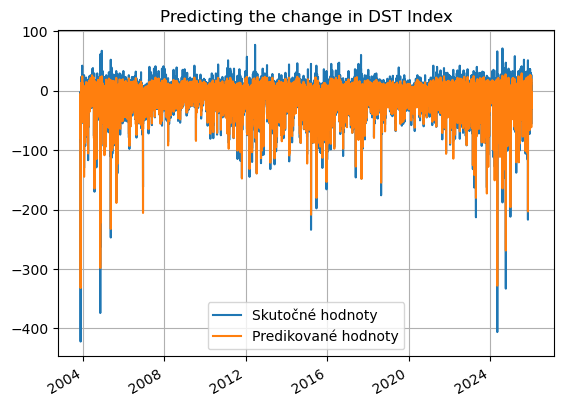

In [17]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [18]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.9156024059159166
MCC=0.7429150989436939
Výkon NN:
MAE: 4.9267, MSE: 57.9621
Perzistentný model:
MAE: 5.2997, MSE: 68.9604
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 7.04%
MSE Improvement: 15.95%


In [19]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 48s 55ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step

  8/896 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step

 10/896 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step

 12/896 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 20/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 32/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 50/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

108/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

110/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

122/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

152/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

170/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

186/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

192/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

194/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

232/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

244/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

250/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

354/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step 

501/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

564/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

580/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

622/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

624/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

626/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

638/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

686/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

855/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 20s 28ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 20s 27ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 13s 26ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step 

370/759 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 9:28 635ms/step

  4/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step  

  6/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

  8/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 14/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 38/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 48/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 50/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 21s 25ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 86/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 88/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 92/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 94/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 96/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

124/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

126/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

128/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

166/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

168/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

186/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

188/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

190/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

197/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

206/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

208/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

224/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

238/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

258/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

260/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

278/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

326/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

374/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

382/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

386/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step 

505/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

530/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

578/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

580/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

622/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

624/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

670/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

680/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

858/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

862/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step 

366/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step


Shapes LSTM:
train: (229344,) (229344,)
val:   (57327,) (57327,)
test:  (194188,) (194188,)
Global sigma (LSTM errors, scaled): 0.41263494
Shapes GP:
X_gp_train: (286671, 12)
y_gp_train: (286671,)
X_test_gp: (194188, 12)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 1.62**2 * RBF(length_scale=0.167) + WhiteKernel(noise_level=0.512)


Global sigma (LSTM errors): 9.079582
Hybrid prediction with smoothed, inflated interval ready.


In [20]:
len(y_hybrid_upper)

194188

In [21]:
len(y_pred_persistence)

194183

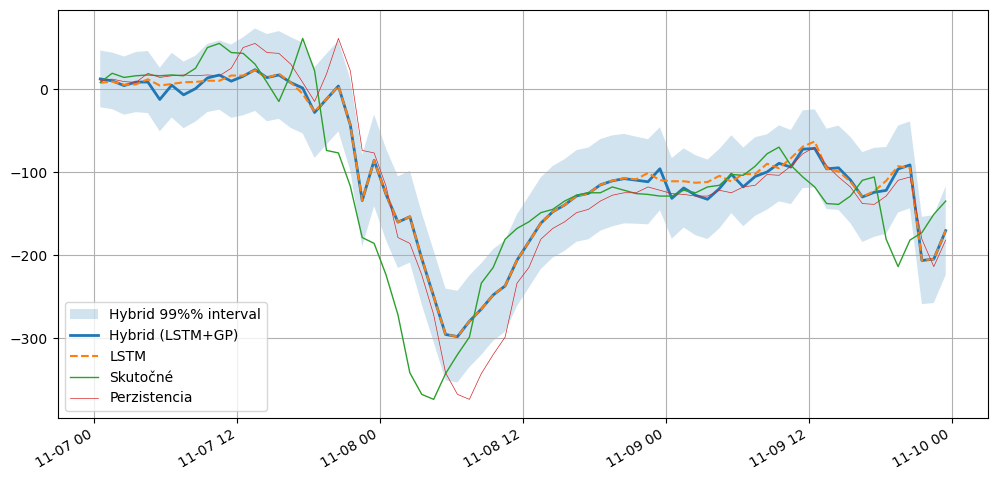

In [22]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})



start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [23]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = df['y_true']
y_pred_hybrid = df['y_hybrid']

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 65.4386
MAE: 5.3006

--- Klasifikačné metriky (Prah: -20.8 nT) ---
Matthews Correlation Coefficient (MCC): 0.7207

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      146139 |        5913
Skutočná 1 |       11786 |       30345

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.93      0.96      0.94    152052
   Trieda 1 (Búrka)       0.84      0.72      0.77     42131

           accuracy                           0.91    194183
          macro avg       0.88      0.84      0.86    194183
       weighted avg       0.91      0.91      0.91    194183



In [24]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.9156053825515107
MCC=0.7429279215086539
Výkon NN:
MAE: 4.9267, MSE: 57.9621
Perzistentný model:
MAE: 5.2997, MSE: 68.9604
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 7.04%
MSE Improvement: 15.95%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9321    0.9623    0.9470    152052
           1     0.8459    0.7471    0.7934     42131

    accuracy                         0.9156    194183
   macro avg     0.8890    0.8547    0.8702    194183
weighted avg     0.9134    0.9156    0.9137    194183


===== LSTM+GP =====
ACC=0.9088540191468872
MCC=0.7206920248359938
Výkon NN:
MAE: 5.3006, MSE: 65.4386
Perzistentný model:
MAE: 5.2997, MSE: 68.9604
Zlepšenie oproti Persistence Modelu:
MAE Improvement: -0.02%
MSE Improvement: 5.11%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9254    0.9611    0.9429    152052
           1     0.8369    0.7203    0.7742     42131

  

/tmp/ipykernel_181135/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_181135/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
8,2026-04-25T20:49:48,LSTM,12.0,2.0,DST+2,OMNI2_all,-20.0,-20.9,0.931452,0.792819,"{""text"": "" precision recall f...",3.984343,37.254743,4.211535,43.256014,5.394526,13.873842
9,2026-04-25T20:49:48,LSTM+GP,12.0,2.0,DST+2,OMNI2_all,-20.0,-20.9,0.926699,0.776457,"{""text"": "" precision recall f...",4.204418,41.889383,4.211535,43.256014,0.168998,3.159400
10,2026-04-25T22:20:34,LSTM,18.0,2.0,DST+2,OMNI2_all,-20.0,-20.0,0.931331,0.792266,"{""text"": "" precision recall f...",3.970476,37.947839,4.211526,43.256490,5.723593,12.272496
11,2026-04-25T22:20:34,LSTM+GP,18.0,2.0,DST+2,OMNI2_all,-20.0,-20.0,0.928514,0.784697,"{""text"": "" precision recall f...",4.137579,41.153213,4.211526,43.256490,1.755833,4.862338
12,2026-04-25T23:46:05,LSTM,24.0,2.0,DST+2,OMNI2_all,-20.0,-21.8,0.932045,0.794614,"{""text"": "" precision recall f...",4.032173,38.034446,4.211590,43.257647,4.260069,12.074629
13,2026-04-25T23:46:05,LSTM+GP,24.0,2.0,DST+2,OMNI2_all,-20.0,-21.8,0.924748,0.768567,"{""text"": "" precision recall f...",4.108914,40.169558,4.211590,43.257647,2.437937,7.138828
14,2026-04-26T00:26:45,LSTM,6.0,2.0,DST+2,OMNI2_all,-20.0,-19.7,0.931603,0.794943,"{""text"": "" precision recall f...",4.013647,37.395781,4.211529,43.255398,4.698564,13.546558
15,2026-04-26T00:26:45,LSTM+GP,6.0,2.0,DST+2,OMNI2_all,-20.0,-19.7,0.929441,0.789653,"{""text"": "" precision recall f...",4.134388,40.878004,4.211529,43.255398,1.831650,5.496179
16,2026-04-26T01:24:36,LSTM,12.0,3.0,DST+3,OMNI2_all,-20.0,-20.8,0.915605,0.742928,"{""text"": "" precision recall f...",4.926662,57.962115,5.299650,68.960383,7.037980,15.948676
17,2026-04-26T01:24:36,LSTM+GP,12.0,3.0,DST+3,OMNI2_all,-20.0,-20.8,0.908854,0.720692,"{""text"": "" precision recall f...",5.300624,65.438560,5.299650,68.960383,-0.018367,5.107023
